##### Copyright 2019 The TensorFlow Authors and Geoffrey Fox 2020


In [ ]:
#@title #### Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

###Set up System

In [ ]:
import os
os.system("pip install -U cloudmesh.common")
from cloudmesh.common.Shell import Shell
from cloudmesh.common.util import banner
os.system("pip uninstall -y hec")
os.system("pip install -U git+https://github.com/DSC-SPIDAL/dl-hec.git")

0

In [ ]:
from hec.util import timenow, wraptotext

# Initial System Code

In [ ]:
startbold = "\033[1m"
resetfonts = "\033[0m"
startred = '\033[31m'

startpurple = '\033[35m'
startyellowbkg = '\033[43m'

!lscpu

gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Select the Runtime > "Change runtime type" menu to enable a GPU accelerator, ')
else:
  print(gpu_info)

from google.colab import drive
drive.mount('/content/gdrive')

Architecture:                    x86_64
CPU op-mode(s):                  32-bit, 64-bit
Byte Order:                      Little Endian
Address sizes:                   46 bits physical, 48 bits virtual
CPU(s):                          8
On-line CPU(s) list:             0-7
Thread(s) per core:              2
Core(s) per socket:              4
Socket(s):                       1
NUMA node(s):                    1
Vendor ID:                       GenuineIntel
CPU family:                      6
Model:                           79
Model name:                      Intel(R) Xeon(R) CPU @ 2.20GHz
Stepping:                        0
CPU MHz:                         2199.998
BogoMIPS:                        4399.99
Hypervisor vendor:               KVM
Virtualization type:             full
L1d cache:                       128 KiB
L1i cache:                       128 KiB
L2 cache:                        1 MiB
L3 cache:                        55 MiB
NUMA node0 CPU(s):               0-7
Vulnerability 

In [ ]:
import tensorflow_datasets as tfds
import tensorflow as tf
from tqdm.keras import TqdmCallback
from tqdm import tnrange, notebook, tqdm
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import GRU
from tensorflow.keras.layers import Dense

import os
import gc
from csv import reader
from csv import writer
import sys
import random
import math
import numpy as np
import matplotlib.pyplot as plt
from textwrap import wrap
import pandas as pd
import io as io
import string

import time
import datetime
from datetime import timedelta,date,datetime

# !pip install cloudmesh-common -U
from cloudmesh.common.StopWatch import StopWatch

###Describe Dataset components

In [ ]:
import json, copy
def AddClassName(OLDlist, Prefix):
  Newlist = []
  for keyname in OLDlist:
    Newlist.append(Prefix+keyname)
  return Newlist

Namelistcfg1 = ["FFFFcovid", "FFFFeq",  "FFFFpre",  "FFFFfit",  "FFFFlstm",  "FFFFsctr", "RunName",  "RunComment",  "LocalRunName",  "LocalRunComment",  "UseLSTMModel",  "UseScienceTransformerModel",  "UseTFTModel",  "UseModel",  "Directoryaddon",  "CovidofSomeType",  "Hydrology",  "Earthquake",  "GarbageCollect",  "GarbageCollectionLimit",  "SymbolicWindows",  "LocationValidationFraction",  "RestartValidationSetRunName",  "LocationBasedValidation",  "LocationTrainingfraction",  "RestartLocationBasedValidation", "ListofTrainingLocs", "ListofValidationLocs", "MappingtoTraining", "MappingtoValidation", "TrainingNloc", "ValidationNloc", "SeparateValandTrainingPlots",  "Plotsplitsize",  "Plotrealnumbers",  "ListofTestFIPS",  "PlotsOnlyinTestFIPS",  "Dumpoutkeyplotsaspics",  "OutputNetworkPictures",  "JournalSimplePrint",  "UseRealDatesonplots",  "PlotinDL2F",  "FONTSIZE",  "CustomLoss",  "InputSource",  "InputSourceNumber",  "PredSource",  "PredSourceNumber",  "FuturedPred",  "SpaceTimeEncodingPropTypes",  "SpaceTimeEncodingPropValues",  "SpaceTimeEncodingPredTypes",  "SpaceTimeEncodingPredValues",  "Dropearlydata",  "NaN",  "PLOTNUMBER",  "COLABROOTDIR",  "APPLDIR",  "CHECKPOINTDIR",  "ScaleProperties",  "ConvertDynamicPredictedQuantity",  "ConvertDynamicProperties",  "GenerateFutures",  "GenerateSequences",  "PredictionsfromInputs",  "UseFutures",  "Usedaystart",  "PopulationNorm",  "TimeIntervalUnitName",  "Dailyunit",  "StartDate",  "InitialDate",  "FinalDate",  "SkipDL2F",  "CalculateNNSE",  "PlotPredictions",  "Num_Seq",  "Tseq"]
Namelistcovid1 = ["ReadJuly2020Covid", "ReadAugust2020Covid",  "ReadJan2021Covid",  "ReadApril2021Covid",  "ReadNov2021Covid",  "ReadMay2022Covid",  "Read7dayCovid",  "RereadMay2020",  "UseOLDCovariates", "DemVoting", "RepVoting", "NIHCovariates",  "CDSpecial",  "RootCasesDeaths"]
Namelisteq1 = ["read1950", "UseEarthquakeEigenSystems",  "RundleEigenvectors",  "MagnitudeMethod",  "numberspecialeqs",  "Specialuse",  "Specialmags",  "Specialdepth",  "Speciallong",  "Speciallat",  "Specialdate",  "Specialxpos",  "Specialypos",  "Specialeqname", "EQ_Numericaldate", "EarthquakeDateaxis", "addRundleEMA",  "RundleLambda",  "RundleSteps",  "InputIndextogenerateEMA",  "FirstEMAIndex",  "EarthquakeEigenAnalysis", "ShowEarthquakeEigencorrels", "Eigenvals", "Eig0coeff", "StoreEigencorrels", "StoreNormingfactor", "StoreNormingfactor1", "StoreNormingfactor2", "EarthquakeChi1", "EarthquakeChi2", "EQ_Bestindex", "EQ_Besttrailingindex", "EarthquakeImagePlots",  "AddSpecialstoSummedplots",  "Plottingdelay", "PrimaryTrainingvetoquake", "SecondaryTrainingvetoquake", "PrimaryValidationvetoquake", "SecondaryValidationvetoquake"]
Namelistpre1 = ["BasicInputTimeSeries", "BasicInputStaticProps",  "CalculatedTimeSeries",  "DynamicPropertyTimeSeries", "InputPropertyNames",  "NamespredCalculated",  "DynamicNames",  "Locationname",  "Locationstate",  "Locationpopulation",  "Locationfips",  "Locationcolumns",  "FIPSintegerlookup",  "FIPSstringlookup",  "Nloc",  "NFIPS",  "NpropperTime",  "NpropperTimeDynamicCalculated",  "NpropperTimeDynamic",  "NpropperTimeDynamicInput",  "NpropperTimeStatic", "UseProperties", "RawInputSeqDimension", "TFTExtraTimes", "TseqPred", "Num_SeqPred", "Num_SeqExtra", "Predictionnamelookup", "Predictionbasicname", "SymbolicInputSequencesTOT", "ReshapedSequencesTOT", "NumTimeSeriesCalculatedBasic",  "Npropperseq",  "NpropperseqTOT",  "Npredperseq",  "NpredperseqTOT",  "NumpredFuturedperTime",  "NumTimeSeriesCalculated",  "NumpredbasicperTime",  "NumberofTimeunits",  "Num_Time", "FuturedPointer", "QuantityStatisticsNames", "QuantityStatistics",  "QuantityTakeroot",  "NpropperTimeMAX",  "LengthFutures",  "Futures",  "NormedInputStaticProps", "NormedDynamicPropertyTimeSeries",  "NormedCalculatedTimeSeries",  "NewPropertyNameIndex",  "NewPropertyAverageValuesPointer",  "NewNpropperTime",  "NewNpropperTimeStatic",  "NewNpropperTimeDynamic",  "NewNormedInputStaticProps",  "NewNormedDynamicPropertyTimeSeries",  "InputPredictionsbyTime",  "Predictionname",  "Predictionnametype",  "Predictionoldvalue",  "Predictionnewvalue",  "Predictionday", "OriginalNloc",  "MapLocation",  "MappedLocations", "LookupLocations", "MappedNloc", "Property_is_Intensive", "PropertyNameIndex",  "PredictionNameIndex",  "PropertyAverageValuesPointer",  "PredictionAverageValuesPointer",  "Predictionwgt",    "RawInputSequences",  "RawInputPredictions",  "RawInputSequencesTOT",  "RawInputPredictionsTOT"]
Namelistfit1 = ["AnalysisOnly", "Restorefromcheckpoint",  "Checkpointfinalstate",  "inputRunName",  "inputCheckpointpostfix",  "standaloneLSTMrun",  "ClassLSTMrun",  "UseCustomfit", "UseClassweights", "CustomTraining",  "GlobalTrainingLoss",  "GlobalValidationLoss",  "GlobalLoss", "batchperepoch", "GlobalSpacetime", "IncreaseNloc_sample", "DecreaseNloc_sample", "OuterBatchDimension", "Nloc_sample", "d_sample", "max_d_sample", "processindex", "AnyOldValidation"]
Namelistlstm1 = ["LSTMepochs", "LSTMbatch_size",  "LSTMoptimizer",  "LSTMactivationvalue",  "LSTMrecurrent_activation", "LSTMdropout1",  "LSTMrecurrent_dropout1",  "LSTMdropout2",  "LSTMrecurrent_dropout2",  "LSTMSkipInitial",  "number_LSTMnodes",  "LSTMThirdLayer",  "LSTMInitialMLP",  "LSTMFinalMLP",  "LSTMverbose",  "LSTMlearning_rate",  "LSTMvalidationfrac",  "UsedLSTMvalidationfrac" ]
Namelistsctr1 = ["GlobalTimeMask", "SpacetimeforMask",  "Transformerepochs",  "SkipDL2",  "SkipDL2B",  "SkipDL2D",  "SkipDL2E",  "SampleSize",  "PredictionTraining",  "FullSetValidation",  "MaskingOption",  "ActivateAttention",  "DoubleQKV",  "TimeShufflingOnly",  "Transformerbatch_size",  "Transformervalidationfrac",  "UsedTransformervalidationfrac",  "Transformeroptimizer",  "Transformerverbose",  "TransformerOnlyFullAttention",  "SpacewiseSecondAttention",  "SeparateHeads",  "d_model",  "d_Attention",  "d_qk",  "d_intermediateqk",  "num_heads",  "num_Encoderlayers",  "EncoderDropout",  "EncoderActivation",  "d_EncoderLayer",  "d_merge",  "d_ffn",  "oldencoderversion",  "ReuseInputinEncoder",  "UseMappedinput",  "Takevasinput",  "ChopupMatrix",  "ChopupNumber"]

Namelistcfg = AddClassName(Namelistcfg1,"FFFFcfg.")
Namelistcovid = AddClassName(Namelistcovid1,"FFFFcovid.")
Namelisteq = AddClassName(Namelisteq1,"FFFFeq.")
Namelistpre = AddClassName(Namelistpre1,"FFFFpre.")
Namelistfit = AddClassName(Namelistfit1,"FFFFfit.")
Namelistlstm = AddClassName(Namelistlstm1,"FFFFlstm.")
Namelistsctr = AddClassName(Namelistsctr1,"FFFFsctr.")
Namelist = Namelistcfg + Namelistcovid + Namelisteq + Namelistpre + Namelistfit + Namelistlstm + Namelistsctr

###Set Class instances to hold original global Variables

In [ ]:
class WNPFcfg():
  def __init__(self):
    for varname in Namelistcfg1:
      exec('self.' + varname + ' = None')

class WNPFcovid():
  def __init__(self):
    for varname in Namelistcovid1:
      exec('self.' + varname + ' = None')

class WNPFeq():
  def __init__(self):
    for varname in Namelisteq1:
      exec('self.' + varname + ' = None')

class WNPFpre():
  def __init__(self):
    for varname in Namelistpre1:
      exec('self.' + varname + ' = None')

class WNPFfit():
  def __init__(self):
    for varname in Namelistfit1:
      exec('self.' + varname + ' = None')

class WNPFlstm():
  def __init__(self):
    for varname in Namelistlstm1:
      exec('self.' + varname + ' = None')

class WNPFsctr():
  def __init__(self):
    for varname in Namelistsctr1:
      exec('self.' + varname + ' = None')

In [ ]:
FFFFcfg = WNPFcfg()
FFFFcovid = WNPFcovid()
FFFFeq = WNPFeq()
FFFFpre = WNPFpre()
FFFFfit = WNPFfit()
FFFFlstm = WNPFlstm()
FFFFsctr = WNPFsctr()
FFFFcfg.FFFFcovid = FFFFcovid
FFFFcfg.FFFFeq = FFFFeq
FFFFcfg.FFFFpre = FFFFpre
FFFFcfg.FFFFfit = FFFFfit
FFFFcfg.FFFFlstm = FFFFlstm
FFFFcfg.FFFFsctr = FFFFsctr

In [ ]:
def SetDictvalues(Dict, UpdateList):
  for varname in UpdateList:
    if varname in Dict:
      exec('Dict["' + varname +'"] =' + varname)
      print(varname + " updated in Dict " + str(Dict[varname]))
    else:
      printexit("Error as " + varname + " not in dictionary")

def SetupModelOver():
  FFFFcfg.UseLSTMModel = False
  FFFFcfg.UseScienceTransformerModel = False
  FFFFcfg.UseTFTModel = False
  if FFFFcfg.UseModel == 0:
    FFFFcfg.UseLSTMModel = True
  elif FFFFcfg.UseModel == 1:
    FFFFcfg.UseScienceTransformerModel = True
  elif FFFFcfg.UseModel == 2:
    FFFFcfg.UseTFTModel = True


def PrintTitle(extrawords):
  current_time = timenow()

  LR = CurrentDataset["FFFFcfg.LocalRunName"]
  if LR != '':
    if NumberofDatasets > 1:
      LR = str(NumberofDatasets) + ': ' + LR
    LR = ' ' + LR
  LC = CurrentDataset["FFFFcfg.LocalRunComment"]
  if LC != '':
    if NumberofDatasets > 1:
      LC = str(NumberofDatasets) + ': ' + LC
    LC = ' ' + LC

  line =  CurrentDataset["FFFFcfg.RunName"] + LR + ' ' + CurrentDataset["FFFFcfg.RunComment"] + LC
  beginwords = ''
  if extrawords != '':
    beginwords = extrawords + ' '
  print(wraptotext(startbold + startred + beginwords + current_time + ' '  + line + resetfonts))
  ram_gb = virtual_memory().total / 1e9
  print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

In [ ]:
from IPython.display import Javascript
from psutil import virtual_memory

# Avoids scroll-in-the-scroll in the entire Notebook
def resize_colab_cell():
  display(Javascript('google.colab.output.setIframeHeight(0, true, {maxHeight: 20000})'))
get_ipython().events.register('pre_run_cell', resize_colab_cell)

# Set Global Parameters for all components
# Can set defaults for components in Overalljstring
Overalljstring =  '{ "FFFFcfg.RunName" : "EARTHQ-EMA1LR8" , "FFFFcfg.RunComment" : "EARTHQ LSTM and 1 EMA LR*0.1 Earlier Stop" }'
FFFFOverallDict = dict.fromkeys(Namelist)
TempDict = json.loads(Overalljstring)
FFFFOverallDict.update(TempDict)
FFFFcfg.RunName = FFFFOverallDict["FFFFcfg.RunName"]
FFFFcfg.RunComment = FFFFOverallDict["FFFFcfg.RunComment"]
FFFFOverallDict["FFFFcfg.LocalRunName"] = ''
FFFFOverallDict["FFFFcfg.LocalRunComment"] = ''
CurrentDataset = FFFFOverallDict
NumberofDatasets = 1
PrintTitle('Start Job')


Start Job 02/02/2023, 03:46:41 UTC EARTHQ-EMA1LR8 EARTHQ LSTM and 1 EMA LR*0.1 Earlier Stop
Your runtime has 54.8 gigabytes of available RAM



#### Set Run Name etc

# Transformer model for science data based on original for language understanding

<table class="tfo-notebook-buttons" align="left">
  <td>
    <a target="_blank" href="https://www.tensorflow.org/tutorials/text/transformer">
    <img src="https://www.tensorflow.org/images/tf_logo_32px.png" />
    View on TensorFlow.org</a>
  </td>
  <td>
    <a target="_blank" href="https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/tutorials/text/transformer.ipynb">
    <img src="https://www.tensorflow.org/images/colab_logo_32px.png" />
    Run in Google Colab</a>
  </td>
  <td>
    <a target="_blank" href="https://github.com/tensorflow/docs/blob/master/site/en/tutorials/text/transformer.ipynb">
    <img src="https://www.tensorflow.org/images/GitHub-Mark-32px.png" />
    View source on GitHub</a>
  </td>
  <td>
    <a href="https://storage.googleapis.com/tensorflow_docs/docs/site/en/tutorials/text/transformer.ipynb"><img src="https://www.tensorflow.org/images/download_logo_32px.png" />Download notebook</a>
  </td>
</table>

## Science Data Parameters and Sizes

-------
Here is structure of science time series module. We will need several arrays that will need to be flattened at times. Note Python defaults to row major i.e. final index describes contiguous positions in memory


At highest level data is labeled by Time and Location

*   Ttot is total number of time steps
*   FFFFcfg.Tseq is length of each sequence in time steps
*   FFFFcfg.Num_Seq is number of sequences in time: FFFFcfg.Num_Seq = Ttot-FFFFcfg.Tseq + 1
*   FFFFpre.Nloc is Number of locations. The locations could be a 1D list or have array structure such as an image.
*   Nsample is number of data samples FFFFpre.Nloc * FFFFcfg.Num_Seq




Input data is at each location
*   Nprop time independent properties describing the location
*   Nforcing is number of time dependent forcing features INPUT at each time value


Output (predicted) data at each location and for each time sequence is
*   Npred predicted time dependent values defined at every time step
*   Recorded at Nforecast time values measured wrt final time value of sequence
*   ForecastDay is an array of length Nforecast defining how many days into future prediction is. Typically ForecastDay[0] = 1 and Nforecast is often 1
*   There is also a class of science problems that are more similar to classic Seq2Seq. Here Nforecast = FFFFcfg.Tseq and ForecastDay = [-FFFFcfg.Tseq+1 ... 0]
*   We also support Nwishful predictions of events in future such probability of an FFFFcfg.earthquake of magnitude 6 in next 3 years. These are defined by araays EventType and Timestart, TimeInterval of length Nwishful. EventType is user defined and Timestart, TimeInterval is measured in time steps
*   Any missing output values should be set to NaN and Loss function must ensure that these points are ignored in derivative calculation and value calculation

We have an input module that supports either LSTM or Transformer (multi-head attention) models

Example Problem AICov

*   Ttot = 114
*   FFFFcfg.Tseq = 9
*   FFFFcfg.Num_Seq = 106
*   FFFFpre.Nloc = 110


*   Nprop = 35
*   Nforcing = 5 including infections, fatalities, plus 3 temporal position variables (last 3 not in current version)


*   Npred = 2 (predicted infections and fatalities). Could be 5 if predicted temporal position of output)
*   Nforecast= 15
*   ForecastDay = [1, 2, .......14, 15]
*   Nwishful = 0




















## Science Data Arrays

Typical Arrays


[ time, Location ] as Pandas array with label [name of time-dependent variable] as an array or just name of Pandas array

time labels rows indexed by datetime or the difference datetime - start

Non windowed data is stored with propert name as row index and location as column index
[ static property, Location]

Covid Input is
[Sequence number 0..Num_Seq-1 ] [ Location 0..Nloc-1 ] [position in time sequence FFFFcfg.Tseq]  [ Input Features]

Covid Output is
[Sequence number FFFFcfg.Num_Seq ] [ Location FFFFpre.Nloc ]  [ Output Features]

Output Features are [ ipred = 0 ..Npred-1 ] [ iforecast = 0 ..Nforecast-1 ]

Input Features are static fields followed by if present by dynamic system fields (cos-theta sin-theta linear) chosen followed by cases, deaths. In fact this is user chosen as they set static and dynamic system properties to use

We will have various numpy and pandas arrays where we designate label

[Ttot] is all time values

[FFFFcfg.Num_Seq]  is all sequences of window size ***FFFFcfg.Tseq***

We can select time values or sequences [Ttot-reason] [FFFFcfg.Num_Seq-reason] for a given "reason"

[FFFFcfg.Num_Seq][FFFFcfg.Tseq] is all time values in all sequences

[FFFFpre.Nloc] is all locations while [FFFFpre.Nloc-reason] is subset of locations for given "reason"

[Model1] is initial embedding of each data point

[Model1+TrPosEnc] is initial embedding of each data point with Transformer style positional encoding

[Nforcing] is time dependent input parameters and [Nprop] static properties while [ExPosEnc] are explicit positional (temporal) encoding.

[Nforcing+ExPosEnc+Nprop] are all possible inputs

[Npred] is predicted values with [Npred+ExPosEnc] as predictions plus encodings with actually used [Predvals] = [Npred+ExPosEnc-Selout]

[Predtimes] = [Forecast time range] are times forecasted with "time range" separately defined



##Define Basic Control parameters

###General Functions for all Components

In [ ]:
def wraptotext(textinput,size=None):
  if size is None:
    size = 120
  textlist = wrap(textinput,size)
  textresult = textlist[0]
  for itext in range(1,len(textlist)):
    textresult += '\n'+textlist[itext]
  return textresult

def timenow():
  now = datetime.now()
  return now.strftime("%m/%d/%Y, %H:%M:%S") + " UTC"

def float32fromstrwithNaN(instr):
  if instr == 'NaN':
    return FFFFcfg.NaN
  return np.float32(instr)

def printexit(exitmessage):
  print(exitmessage)
  sys.exit()

def strrnd(value):
  return str(round(value,4))

import matplotlib.dates as mdates

<IPython.core.display.Javascript object>

###Set up Science

In [ ]:
def SetupScience(FFFFcfg):

  FFFFeq = FFFFcfg.FFFFeq
  FFFFcovid = FFFFcfg.FFFFcovid
  FFFFfit = FFFFcfg.FFFFfit
  FFFFpre = FFFFcfg.FFFFpre
  FFFFsctr = FFFFcfg.FFFFsctr

  FFFFcfg.CovidofSomeType = True
  FFFFcovid.ReadJuly2020Covid = False
  FFFFcovid.ReadAugust2020Covid = False
  FFFFcovid.ReadJan2021Covid = False
  FFFFcovid.ReadApril2021Covid = False
  FFFFcovid.ReadNov2021Covid = False
  FFFFcovid.ReadMay2022Covid = False
  FFFFcovid.Read7dayCovid = False
  FFFFcfg.ScaleProperties = False
  FFFFcfg.ConvertDynamicPredictedQuantity = False
  FFFFcfg.ConvertDynamicProperties = True
  FFFFcfg.GenerateFutures = False
  FFFFcfg.GenerateSequences = False
  FFFFcfg.PredictionsfromInputs = False
  FFFFcovid.RereadMay2020 = False
  FFFFcovid.UseOLDCovariates = False
  FFFFcfg.Dropearlydata = 0
  FFFFcovid.NIHCovariates = False
  FFFFcfg.UseFutures = True
  FFFFcfg.Usedaystart = False
  FFFFcfg.PopulationNorm = False
  FFFFcfg.SymbolicWindows = False
  FFFFcfg.Hydrology = False
  FFFFcfg.Earthquake = False
  FFFFpre.MapLocation = False


  FFFFcovid.CDSpecial = False
  FFFFcovid.RootCasesDeaths = True
  FFFFpre.NumpredbasicperTime = 2
  FFFFpre.NumpredFuturedperTime = 2
  FFFFpre.NumTimeSeriesCalculated = 0
  FFFFcfg.Dailyunit = 1
  FFFFcfg.TimeIntervalUnitName = 'Day'
  FFFFcfg.InitialDate = datetime(2000,1,1)
  FFFFpre.NumberofTimeunits = 0
  FFFFpre.Num_Time =0
  FFFFcfg.FinalDate = datetime(2000,1,1)
  FFFFfit.GlobalTrainingLoss = 0.0
  FFFFfit.GlobalValidationLoss = 0.0

  # Type of Testing
  FFFFcfg.LocationBasedValidation = False
  FFFFcfg.LocationValidationFraction = 0.0
  FFFFcfg.LocationTrainingfraction = 1.0
  FFFFcfg.RestartLocationBasedValidation = False

  #Plotting
  FFFFcfg.SeparateValandTrainingPlots = True
  FFFFcfg.Plotsplitsize = -1 # if > 1 split time in plots
  FFFFcfg.Plotrealnumbers = True
  FFFFcfg.ListofTestFIPS = []
  FFFFcfg.PlotsOnlyinTestFIPS = True
  FFFFeq.EarthquakeImagePlots = False
  FFFFeq.AddSpecialstoSummedplots = False
  FFFFcfg.UseRealDatesonplots = False
  FFFFcfg.Dumpoutkeyplotsaspics = False
  FFFFcfg.OutputNetworkPictures = False
  FFFFcfg.JournalSimplePrint = False
  FFFFcfg.PlotinDL2F = False
  FFFFcfg.FONTSIZE = 20

  FFFFcfg.GarbageCollect = True
  FFFFcfg.GarbageCollectionLimit = 5000000

  PrintTitle('Start Dataset')

  SubName = FFFFcfg.RunName[0:6]
  if SubName == 'BEST14' or SubName == 'BEST15' or SubName == 'BEST16':
    FFFFcovid.UseOLDCovariates = False
    FFFFcovid.ReadAugust2020Covid = True
    FFFFcfg.ScaleProperties = True
    FFFFcfg.ConvertDynamicPredictedQuantity = True
    FFFFcfg.GenerateFutures = True
    FFFFcfg.GenerateSequences = True
    FFFFcfg.PredictionsfromInputs = True
    FFFFcovid.NIHCovariates = True
    FFFFcfg.ConvertDynamicProperties = True
    FFFFcfg.Dropearlydata = 37
    FFFFcovid.CDSpecial = True

  if SubName == 'CovidA' or SubName == 'CovidN' or SubName == 'CovidM' or SubName == 'Covid7':
    FFFFcovid.UseOLDCovariates = False
    FFFFcovid.ReadApril2021Covid = True
    FFFFcfg.ScaleProperties = True
    FFFFcfg.ConvertDynamicPredictedQuantity = True
    FFFFcfg.GenerateFutures = True
    FFFFcfg.UseFutures = True
    FFFFcfg.GenerateSequences = True
    FFFFcfg.PredictionsfromInputs = True
    FFFFcovid.NIHCovariates = True
    FFFFcfg.ConvertDynamicProperties = True
    FFFFcovid.CDSpecial = True
    if SubName == 'CovidN':
      FFFFcovid.ReadNov2021Covid = True
    if SubName == 'CovidM':
      FFFFcovid.ReadMay2022Covid = True
    if SubName == 'Covid7':
      FFFFcovid.ReadMay2022Covid = True
      FFFFcovid.Read7dayCovid = True

  if SubName == 'C2021A' or SubName == 'C2021B':
    FFFFcovid.UseOLDCovariates = False
    FFFFcovid.ReadJan2021Covid = True
    FFFFcfg.ScaleProperties = True
    FFFFcfg.ConvertDynamicPredictedQuantity = True
    FFFFcfg.GenerateFutures = True
    FFFFcfg.GenerateSequences = True
    FFFFcfg.PredictionsfromInputs = True
    FFFFcovid.NIHCovariates = True
    FFFFcfg.ConvertDynamicProperties = True
    FFFFcfg.Dropearlydata = 0
    FFFFcovid.CDSpecial = True

  if SubName == 'Hydrol':
    FFFFcfg.Hydrology = True
    FFFFcfg.CovidofSomeType = False

  if SubName == 'EARTHQ':
    FFFFcfg.Earthquake = True
    FFFFcfg.CovidofSomeType = False
    FFFFeq.RundleEigenvectors = 2
    FFFFeq.UseEarthquakeEigenSystems = False
    FFFFeq.EarthquakeEigenAnalysis = False
    FFFFeq.ShowEarthquakeEigencorrels = False
    FFFFcfg.Dailyunit = 14

  if FFFFcfg.RunName == 'BEST10' or FFFFcfg.RunName == 'BEST13-10D' or FFFFcfg.RunName == 'BEST12-10' or FFFFcfg.RunName == 'BEST12-Test' or FFFFcfg.RunName == 'BEST13' or FFFFcfg.RunName == 'BEST13-10' or FFFFcfg.RunName == 'BEST13-10A' or FFFFcfg.RunName == 'BEST13-10C':
    FFFFcovid.UseOLDCovariates = False
    FFFFcovid.ReadAugust2020Covid = True
    FFFFcfg.ScaleProperties = True
    FFFFcfg.ConvertDynamicPredictedQuantity = True
    FFFFcfg.GenerateFutures = True
    FFFFcfg.GenerateSequences = True
    FFFFcfg.PredictionsfromInputs = True
    FFFFcovid.CDSpecial = True

  if FFFFcfg.RunName == 'BEST11' or FFFFcfg.RunName == 'BEST11A':
    FFFFcovid.UseOLDCovariates = True
    FFFFcovid.ReadAugust2020Covid = True
    FFFFcfg.ScaleProperties = True
    FFFFcfg.ConvertDynamicPredictedQuantity = True
    FFFFcfg.GenerateFutures = True
    FFFFcfg.GenerateSequences = True
    FFFFcfg.PredictionsfromInputs = True
    FFFFcovid.CDSpecial = True

  if FFFFcfg.RunName == 'BEST12':
    FFFFcovid.UseOLDCovariates = True
    FFFFcovid.RereadMay2020 = True
    FFFFcovid.ReadAugust2020Covid = False
    FFFFcfg.ScaleProperties = True
    FFFFcfg.ConvertDynamicPredictedQuantity = True
    FFFFcfg.GenerateFutures = True
    FFFFcfg.GenerateSequences = True
    FFFFcfg.PredictionsfromInputs = True
    FFFFcovid.CDSpecial = True

  if FFFFcfg.RunName == 'BEST8' or FFFFcfg.RunName == 'BEST8A' or FFFFcfg.RunName == 'BEST12-LSTM-8':
    FFFFcovid.ReadJuly2020Covid = True


<IPython.core.display.Javascript object>

###Start New Dataset

In [ ]:
FFFFcfg.NaN = np.float32("NaN")
FFFFcfg.PLOTNUMBER =0 # Count Output Plots

<IPython.core.display.Javascript object>

In [ ]:
UpdateList = ["FFFFcfg.LocalRunName", "FFFFcfg.LocalRunComment", "FFFFcfg.UseLSTMModel", \
              "FFFFcfg.UseScienceTransformerModel", "FFFFcfg.UseTFTModel", "FFFFcfg.UseModel", "FFFFcfg.Directoryaddon"]
CountDatasets = 0

ComponentRunsJSON = [""]
ComponentRuns =[]
NumberofDatasets = len(ComponentRunsJSON)
# while CountDatasets < NumberofDatasets:
CountDatasets += 1
FFFFcfg.UseLSTMModel = False
FFFFcfg.UseScienceTransformerModel = False
FFFFcfg.UseTFTModel = False
FFFFcfg.UseModel = 0
SetupModelOver()
FFFFcfg.Directoryaddon = ""
FFFFcfg.LocalRunName = ""
FFFFcfg.LocalRunComment = ""
CurrentDataset = copy.deepcopy(FFFFOverallDict)

SetDictvalues(CurrentDataset, UpdateList)
ComponentRuns.append(CurrentDataset)
SetupScience(FFFFcfg)
print(FFFFcfg.Directoryaddon)

<IPython.core.display.Javascript object>

FFFFcfg.LocalRunName updated in Dict 
FFFFcfg.LocalRunComment updated in Dict 
FFFFcfg.UseLSTMModel updated in Dict True
FFFFcfg.UseScienceTransformerModel updated in Dict False
FFFFcfg.UseTFTModel updated in Dict False
FFFFcfg.UseModel updated in Dict 0
FFFFcfg.Directoryaddon updated in Dict 
Start Dataset 02/02/2023, 03:46:41 UTC EARTHQ-EMA1LR8 EARTHQ LSTM and 1 EMA LR*0.1 Earlier Stop
Your runtime has 54.8 gigabytes of available RAM




## Define input structure

Read in data and set it up for Tensorflow with training and validation


Set train_examples, val_examples as science training and validatioon set.

The shuffling of Science Data needs some care. We have ***FFFFcfg.Tseq*** * size of {[FFFFcfg.Num_Seq][FFFFpre.Nloc]} locations in each sample. In simplease case the last is just a decomposition over location; not over time. Let's FFFFpre.Nloc-sel be number of locations per sample. It will be helpful if FFFFpre.Nloc-sel is divisable by 2.

Perhaps FFFFpre.Nloc-sel = 2 6 or 10 is reasonable.

Then you shuffle locations every epoch and divide them into groups of size FFFFpre.Nloc-sel with 50% overlap so you get locations

0 1 2 3 4 5;

3 4 5 6 7 8;

6 7 8 9 10 11 etc.

Every locations appears twice in an epoch (for each time value). You need to randomly add locations at end of sequence so it is divisiuble by FFFFpre.Nloc-sel e.g add 4 random positions to the end if FFFFpre.Nloc=110 and FFFFpre.Nloc-sel = 6. Note last group of 6 has members 112 113 114 0 1 2

After spatial structure set up, randomly shuffle in FFFFcfg.Num_Seq where there is an argument to do all locations for a partcular time value together.

For validation, it is probably best to select validation location before chopping them into groups of size FFFFpre.Nloc-sel

How one groups locations for inference is not clear. One idea is to take trained network and use it to find for each location which other locations have the most attention with it. Use those locations in  prediction

More general input.
NaN allowed value

* Number time values
* Number locations
* Number driving values
* Number predicted values

For COVID driving same as predicted

* a) Clean up >=0 daily
* b) Normalize
* c) Add FFFFpre.Futures
* d) Add time/location encoding


### Setup File Systems

In [ ]:
# read in science data
FFFFcfg.COLABROOTDIR="/content/gdrive/My Drive/Colab Datasets"
os.environ["COLABROOTDIR"] = FFFFcfg.COLABROOTDIR

if FFFFcfg.Hydrology:
  FFFFcfg.APPLDIR=os.path.join(FFFFcfg.COLABROOTDIR, "Hydrology")
elif FFFFcfg.Earthquake:
  FFFFcfg.APPLDIR=os.path.join(FFFFcfg.COLABROOTDIR, "EarthquakeDec2020")
else:
  FFFFcfg.APPLDIR=os.path.join(FFFFcfg.COLABROOTDIR, "COVIDJuly2020")

# Set up Checkpoints
FFFFcfg.CHECKPOINTDIR = FFFFcfg.APPLDIR + "/checkpoints/" + FFFFcfg.RunName + "dir/"
if FFFFcfg.Directoryaddon != "":
  FFFFcfg.APPLDIR += "/" + FFFFcfg.Directoryaddon

try:
    if not os.path.exists(FFFFcfg.CHECKPOINTDIR):
      os.mkdir(FFFFcfg.CHECKPOINTDIR)
except OSError as error:
    print(error)
print('Checkpoint set up in directory ' + FFFFcfg.CHECKPOINTDIR)

<IPython.core.display.Javascript object>

Checkpoint set up in directory /content/gdrive/My Drive/Colab Datasets/EarthquakeDec2020/checkpoints/EARTHQ-EMA1LR8dir/


##General Routines

In [ ]:

def mysavefig(label):
  if label == "":
    label = FFFFcfg.RunName+str(FFFFcfg.PLOTNUMBER)
    FFFFcfg.PLOTNUMBER+=1
  print("SavedPlot "+ label)
  plt.savefig(FFFFcfg.APPLDIR +'/Outputs/' + label + '.pdf',format='pdf',dpi=300)
  plt.savefig(FFFFcfg.APPLDIR +'/Outputs/' + label + '.png',format='png',dpi=300)
  return

def makeadateplot(plotfigure,plotpointer, Dateaxis=None, datemin=None, datemax=None, Yearly=True, majoraxis = 5):
  if not Yearly:
    sys.exit('Only yearly supported')
  plt.rcParams.update({'font.size': 9})
  years5 = mdates.YearLocator(majoraxis)   # every 5 years
  years_fmt = mdates.DateFormatter('%Y')
  plotpointer.xaxis.set_major_locator(years5)
  plotpointer.xaxis.set_major_formatter(years_fmt)
  if datemin is None:
    datemin = np.datetime64(Dateaxis[0], 'Y')
  if datemax is None:
    datemax = np.datetime64(Dateaxis[-1], 'Y') + np.timedelta64(1, 'Y')
  plotpointer.set_xlim(datemin, datemax)
  plotfigure.autofmt_xdate()
  return datemin, datemax

def makeasmalldateplot(figure,ax, Dateaxis):
  plt.rcParams.update({'font.size': 9})
  months = mdates.MonthLocator(interval=2)   # every month
  datemin = np.datetime64(Dateaxis[0], 'M')
  datemax = np.datetime64(Dateaxis[-1], 'M') + np.timedelta64(1, 'M')
  ax.set_xlim(datemin, datemax)

  months_fmt = mdates.DateFormatter('%y-%b')
  locator = mdates.AutoDateLocator()
  locator.intervald['MONTHLY'] = [2]
  formatter = mdates.ConciseDateFormatter(locator)
#  ax.xaxis.set_major_locator(locator)
#  ax.xaxis.set_major_formatter(formatter)
  ax.xaxis.set_major_locator(months)
  ax.xaxis.set_major_formatter(months_fmt)

  figure.autofmt_xdate()
  return datemin, datemax



<IPython.core.display.Javascript object>

##Earthquake Routines

In [ ]:

def printeq(FFFFcfg):
    FFFFeq = FFFFcfg.FFFFeq
    qsort = np.argsort(FFFFeq.Specialdate)
    for jquake in range(0,FFFFeq.numberspecialeqs):
      iquake = qsort[jquake]
      print(str(iquake) + ' ' +str(FFFFeq.Specialdate[iquake]) + ' '  +  str(round(FFFFeq.Specialmags[iquake],1)) + ' ' + FFFFeq.Specialeqname[iquake])


def Addfixedearthquakes(FFFFcfg,plotpointer,graphmin, graphmax, ylogscale = False, quakecolor = None, Dateplot = True, vetoquake = None):
  FFFFeq = FFFFcfg.FFFFeq
  if vetoquake is None: # Vetoquake = True means do not plot this quake
    vetoquake = np.full(FFFFeq.numberspecialeqs, False, dtype =bool)
  if quakecolor is None: # Color of plot
    quakecolor = 'black'
  Place =np.arange(FFFFeq.numberspecialeqs, dtype =int)
  Place[8] = 11
  Place[10] = 3
  Place[12] = 16
  Place[7] = 4
  Place[2] = 5
  Place[4] = 14
  Place[11] = 18

  ymin, ymax = plotpointer.get_ylim() # Or work with transform=ax.transAxes
  qindex =1
  fudge = 0.03
  qsort = np.argsort(FFFFeq.Specialdate)
  for jquake in range(0,FFFFeq.numberspecialeqs):
    iquake = qsort[jquake]

    if qindex == 16:
      continue
# This is the x position for the vertical line
    if Dateplot:
      x_line_annotation = FFFFeq.Specialdate[iquake] # numpy date format
    else:
      x_line_annotation = FFFFeq.EQ_Numericaldate[iquake] # Float where each interval 1 and start is 0


    # This is the x position for the label
    if Dateplot:
      x_text_annotation = x_line_annotation - np.timedelta64(2*FFFFcfg.Dailyunit,'D')
    else:
      x_text_annotation = x_line_annotation -2.0

    if FFFFeq.Specialuse[iquake]:

      # Draw a text
      ascii = str(round(FFFFeq.Specialmags[iquake],1)) + '\n' + FFFFeq.Specialeqname[iquake]
      ascii = 'EQ' +str(qindex)
      qindex += 1
      fudge =0.09-fudge

      if (x_line_annotation < graphmin) or (x_line_annotation > graphmax):
        continue

      if vetoquake[iquake]:
        continue

      # Draw a line at the position
      ydelta = 0.15
      plotpointer.axvline(x=x_line_annotation, linestyle='solid', alpha=1.0, linewidth = 2.0, color='black', ymin = 1.0-ydelta)

      acfudge = fudge
      if qindex == 13:
        acfudge = 0.09
      if ylogscale:
        yminl = max(0.01*ymax,ymin)
        yminl = math.log(yminl,10)
        ymaxl = math.log(ymax,10)
        logyplot = yminl + (0.1 + 0.8*(float(Place[iquake])/float(FFFFeq.numberspecialeqs-1)))*(ymaxl-yminl)
        yplot = pow(10, logyplot)
        yplot = ymax - (ydelta + acfudge)*(ymax-ymin)
      else:
        yplot = ymax - (0.1 + 0.8*(float(Place[iquake])/float(FFFFeq.numberspecialeqs-1)))*(ymax-ymin)
        yplot = ymax - (ydelta + acfudge)*(ymax-ymin)
      if Dateplot:
        if x_text_annotation > graphmax - np.timedelta64(1200, 'D'):
          x_text_annotation = graphmax - np.timedelta64(1200, 'D')
        x_text_annotation = max(x_text_annotation, graphmin + np.timedelta64(400, 'D') )
      else:
        if x_text_annotation > graphmax - 60:
          x_text_annotation = graphmax - 60
        x_text_annotation = max(x_text_annotation, graphmin+20)
#      print(str(yplot) + " " + str(ymin) + " " + str(ymax) + " " + str(x_text_annotation) + " " + str(x_line_annotation)) + " " + ascii
#      print(str(qindex-1) + ' ' + str(iquake) + ' ' +str(FFFFeq.Specialdate[iquake]) + ' ' + str(x_line_annotation) + ' ' + str(x_text_annotation) + ' ' + ascii + ' ' +  str(round(FFFFeq.Specialmags[iquake],1)) + ' ' + FFFFeq.Specialeqname[iquake])
      plotpointer.text(x=x_text_annotation, y=yplot, s=wraptotext(ascii,size=10), alpha=1.0, color='black', fontsize = 10)



def quakesearch(FFFFcfg,iquake, iloc):
# see if top FFFFcfg.earthquake iquake llies near location iloc
# result = 0 NO; =1 YES Primary: locations match exactly; = -1 Secondary: locations near
# iloc is location before mapping
  FFFFeq = FFFFcfg.FFFFeq
  xloc = iloc%60
  yloc = (iloc - xloc)/60
  if (xloc == FFFFeq.Specialxpos[iquake]) and (yloc == FFFFeq.Specialypos[iquake]):
    return 1
  if (abs(xloc - FFFFeq.Specialxpos[iquake]) <= 1) and (abs(yloc - FFFFeq.Specialypos[iquake]) <= 1):
    return -1
  return 0

# Read Earthquake Data
def log_sum_exp10(ns, sumaxis =0):
    max_v = np.max(ns, axis=None)
    ds = ns - max_v
    sum_of_exp = np.power(10, ds).sum(axis=sumaxis)
    return max_v + np.log10(sum_of_exp)

def log_energyweightedsum(nvalue, ns, sumaxis = 0):
    max_v = np.max(ns, axis=None)
    ds = ns - max_v
    ds = np.power(10, 1.5*ds)
    dvalue = (np.multiply(nvalue,ds)).sum(axis=sumaxis)
    ds  = ds.sum(axis=0)
    return np.divide(dvalue,ds)

# Set summed magnitude as log summed energy = 10^(1.5 magnitude)
def log_energy(mag, sumaxis =0):
    return log_sum_exp10(1.5 * mag, sumaxis = sumaxis) / 1.5

def AggregateEarthquakes(FFFFcfg,itime, DaysDelay, DaysinInterval, Numberlocations, Eqdata, Approach, weighting = None):
  FFFFeq = FFFFcfg.FFFFeq
  if (itime + DaysinInterval + DaysDelay) > FFFFpre.NumberofTimeunits:
    return np.full([Numberlocations],FFFFcfg.NaN,dtype = np.float32)
  if Approach == 0: # Magnitudes
    if FFFFeq.MagnitudeMethod == 0:
      TotalMagnitude = log_energy(Eqdata[itime +DaysDelay:itime+DaysinInterval+DaysDelay])
    else:
      TotalMagnitude = Eqdata[itime +DaysDelay:itime+DaysinInterval+DaysDelay,:].sum(axis=0)
    return TotalMagnitude
  if Approach == 1: # Depth -- energy weighted
    WeightedResult = log_energyweightedsum(Eqdata[itime +DaysDelay:itime+DaysinInterval+DaysDelay],
                                        weighting[itime +DaysDelay:itime+DaysinInterval+DaysDelay])
    return WeightedResult
  if Approach == 2: # Multiplicity -- summed
    SimpleSum = Eqdata[itime +DaysDelay:itime+DaysinInterval+DaysDelay,:].sum(axis=0)
    return SimpleSum

# FFFFeq.MagnitudeMethodTransform = 0 No Transform
# FFFFeq.MagnitudeMethodTransform = 1 E^0.25
# FFFFeq.MagnitudeMethodTransform = 2 E^0.5
def TransformMagnitude(FFFFcfg,mag):
  FFFFeq = FFFFcfg.FFFFeq
  if FFFFeq.MagnitudeMethod == 0:
    return mag
  if FFFFeq.MagnitudeMethod == 1:
    return np.power(10, 0.375*(mag-3.29))
  return np.power(10, 0.75*(mag-3.29))

# Change Daily Unit
# Accumulate data in FFFFcfg.Dailyunit chunks.
# This changes data so it looks like daily data bu really collections of chunked data.
# For earthquakes, the aggregations uses energy averaging for depth and magnitude. It just adds for multiplicity
def GatherUpData(OldInputTimeSeries):
    Skipped = FFFFpre.NumberofTimeunits%FFFFcfg.Dailyunit
    NewInitialDate = FFFFcfg.InitialDate + timedelta(days=Skipped)
    NewNum_Time = int(FFFFpre.Num_Time/FFFFcfg.Dailyunit)
    NewFinalDate = NewInitialDate + FFFFcfg.Dailyunit * timedelta(days=NewNum_Time-1)
    print(' Daily Unit ' +str(FFFFcfg.Dailyunit) + ' number of ' + FFFFcfg.TimeIntervalUnitName + ' Units ' + str(NewNum_Time)+ ' ' +
         NewInitialDate.strftime("%d/%m/%Y") + ' To ' + NewFinalDate.strftime("%d/%m/%Y"))
    NewInputTimeSeries = np.empty([NewNum_Time,FFFFpre.Nloc,FFFFpre.NpropperTimeDynamicInput],dtype = np.float32)
    for itime in range(0,NewNum_Time):
      NewInputTimeSeries[itime,:,0] = AggregateEarthquakes(FFFFcfg,Skipped + itime*FFFFcfg.Dailyunit,0,FFFFcfg.Dailyunit, FFFFpre.Nloc,
                                                           FFFFpre.BasicInputTimeSeries[:,:,0], 0)
      NewInputTimeSeries[itime,:,1] = AggregateEarthquakes(FFFFcfg,Skipped + itime*FFFFcfg.Dailyunit,0,FFFFcfg.Dailyunit, FFFFpre.Nloc,
                                                           FFFFpre.BasicInputTimeSeries[:,:,1], 1,
                                                           weighting = FFFFpre.BasicInputTimeSeries[:,:,0])
      NewInputTimeSeries[itime,:,2] = AggregateEarthquakes(FFFFcfg,Skipped + itime*FFFFcfg.Dailyunit,0,FFFFcfg.Dailyunit, FFFFpre.Nloc,
                                                           FFFFpre.BasicInputTimeSeries[:,:,2], 2)
      NewInputTimeSeries[itime,:,3] = AggregateEarthquakes(FFFFcfg,Skipped + itime*FFFFcfg.Dailyunit,0,FFFFcfg.Dailyunit, FFFFpre.Nloc,
                                                           FFFFpre.BasicInputTimeSeries[:,:,3], 2)
    return NewInputTimeSeries, NewNum_Time, NewNum_Time, NewInitialDate, NewFinalDate

# make numpy array not a list
# Return Exponential Moving Average
def MakeEMA(TimeSeries, Nsteps):
  datasize = len(TimeSeries)
  EMASeries = np.empty(datasize,dtype = np.float32)
  WeightedSum = 0.0
  WeightedCount = 0.0
  beta = (Nsteps - 1.0)/(Nsteps + 1.0)
  for i in range(0,datasize):
    WeightedSum = TimeSeries[i] + beta*WeightedSum
    WeightedCount = 1.0 + beta*WeightedCount
    EMASeries[i] = WeightedSum/WeightedCount
  return EMASeries

# Insist on a minimum count at each time value and then find Exponential Moving Average
def MakeEMAMinCT(TimeSeries, Nsteps, Lambda):
  Mincount = np.mean(TimeSeries) * Lambda
  Temporaryarray = np.maximum(TimeSeries, Mincount)
  EMASeries = MakeEMA(Temporaryarray, Nsteps)
  return EMASeries

<IPython.core.display.Javascript object>

###Space Filling Curves

In [ ]:
from typing import Dict, Tuple, Optional, List, Union, Callable
import matplotlib
import matplotlib.patches as patches
# import matplotlib.pyplot as plt
from matplotlib.figure import Figure
from matplotlib.path import Path

def cal_gilbert2d(width: int, height: int) -> List[Tuple[int, int]]:
    coordinates: List[Tuple[int, int]] = []

    def sgn(x: int) -> int:
        return (x > 0) - (x < 0)

    def gilbert2d(x: int, y: int, ax: int, ay: int, bx: int, by: int):
        """
        Generalized Hilbert ('gilbert') space-filling curve for arbitrary-sized
        2D rectangular grids.
        """

        w = abs(ax + ay)
        h = abs(bx + by)

        (dax, day) = (sgn(ax), sgn(ay))  # unit major direction
        (dbx, dby) = (sgn(bx), sgn(by))  # unit orthogonal direction

        if h == 1:
            # trivial row fill
            for i in range(0, w):
                coordinates.append((x, y))
                (x, y) = (x + dax, y + day)
            return

        if w == 1:
            # trivial column fill
            for i in range(0, h):
                coordinates.append((x, y))
                (x, y) = (x + dbx, y + dby)
            return

        (ax2, ay2) = (ax // 2, ay // 2)
        (bx2, by2) = (bx // 2, by // 2)

        w2 = abs(ax2 + ay2)
        h2 = abs(bx2 + by2)

        if 2 * w > 3 * h:
            if (w2 % 2) and (w > 2):
                # prefer even steps
                (ax2, ay2) = (ax2 + dax, ay2 + day)

            # long case: split in two parts only
            gilbert2d(x, y, ax2, ay2, bx, by)
            gilbert2d(x + ax2, y + ay2, ax - ax2, ay - ay2, bx, by)

        else:
            if (h2 % 2) and (h > 2):
                # prefer even steps
                (bx2, by2) = (bx2 + dbx, by2 + dby)

            # standard case: one step up, one long horizontal, one step down
            gilbert2d(x, y, bx2, by2, ax2, ay2)
            gilbert2d(x + bx2, y + by2, ax, ay, bx - bx2, by - by2)
            gilbert2d(x + (ax - dax) + (bx2 - dbx), y + (ay - day) + (by2 - dby), -bx2, -by2, -(ax - ax2), -(ay - ay2))

    if width >= height:
        gilbert2d(0, 0, width, 0, 0, height)
    else:
        gilbert2d(0, 0, 0, height, width, 0)
    return coordinates

def lookup_color(unique_colors, color_value: float) -> int:
      ids = np.where(unique_colors == color_value)
      color_id = ids[0][0]
      return color_id

def plot_gilbert2d_space_filling(
    vertices: List[Tuple[int, int]],
    width: int,
    height: int,
    filling_color: Optional[np.ndarray] = None,
    color_map: str = "rainbow",
    figsize: Tuple[int, int] = (12, 8),
    linewidth: int = 1,
) -> None:

    fig, ax = plt.subplots(figsize=figsize)
    patch_list: List = []

    if filling_color is None:
        cmap = matplotlib.cm.get_cmap(color_map, len(vertices))
        for i in range(len(vertices) - 1):
            path = Path([vertices[i], vertices[i + 1]], [Path.MOVETO, Path.LINETO])
            patch = patches.PathPatch(path, fill=False, edgecolor=cmap(i), lw=linewidth)
            patch_list.append(patch)
        ax.set_xlim(-1, width)
        ax.set_ylim(-1, height)

    else:
        unique_colors = np.unique(filling_color)
#        np.random.shuffle(unique_colors)
        cmap = matplotlib.cm.get_cmap(color_map, len(unique_colors))

        for i in range(len(vertices) - 1):
            x, y = vertices[i]
            fi, fj = x, height - 1 - y
            color_value = filling_color[fj, fi]
            color_id = lookup_color(unique_colors, color_value)
            path = Path(
                [rescale_xy(x, y), rescale_xy(vertices[i + 1][0], vertices[i + 1][1])], [Path.MOVETO, Path.LINETO]
            )
            # path = Path([vertices[i], vertices[i + 1]], [Path.MOVETO, Path.LINETO])
            patch = patches.PathPatch(path, fill=False, edgecolor=cmap(color_id), lw=linewidth)
            patch_list.append(patch)
        ax.set_xlim(-120 - 0.1, width / 10 - 120)
        ax.set_ylim(32 - 0.1, height / 10 + 32)

    collection = matplotlib.collections.PatchCollection(patch_list, match_original=True)
    # collection.set_array()
    # plt.colorbar(collection)
    ax.add_collection(collection)
    ax.set_aspect("equal")
    plt.show()
    return

def rescale_xy(x: int, y: int) -> Tuple[float, float]:
    return x / 10 - 120, y / 10 + 32

def remapfaults(InputFaultNumbers, Numxlocations, Numylocations, SpaceFillingCurve):
  TotalLocations = Numxlocations*Numylocations
  OutputFaultNumbers = np.full_like(InputFaultNumbers, -1, dtype=int)
  MaxOldNumber = np.amax(InputFaultNumbers)
  mapping = np.full(MaxOldNumber+1, -1,dtype=int)
  newlabel=-1
  for sfloc in range(0, TotalLocations):
    [x,y] = SpaceFillingCurve[sfloc]
    pixellocation = y*Numxlocations + x
    pixellocation1 = y*Numxlocations + x
    oldfaultnumber = InputFaultNumbers[pixellocation1]
    if mapping[oldfaultnumber] < 0:
      newlabel += 1
      mapping[oldfaultnumber] = newlabel
    OutputFaultNumbers[pixellocation] = mapping[oldfaultnumber]
  MinNewNumber = np.amin(OutputFaultNumbers)
  if MinNewNumber < 0:
    printexit('Incorrect Fault Mapping')
  print('new Fault Labels generated 0 through ' + str(newlabel))
  plot_gilbert2d_space_filling(SpaceFillingCurve,Numxlocations, Numylocations, filling_color = np.reshape(OutputFaultNumbers,(40,60)), color_map="gist_ncar")
  return OutputFaultNumbers

def annotate_faults_ndarray(pix_faults: np.ndarray, figsize=(10, 8), color_map="rainbow"):
    matplotlib.rcParams.update(matplotlib.rcParamsDefault)
    plt.rcParams.update({"font.size": 12})
    unique_colors = np.unique(pix_faults)
    np.random.shuffle(unique_colors)
    cmap = matplotlib.cm.get_cmap(color_map, len(unique_colors))

    fig, ax = plt.subplots(figsize=figsize)
    height, width = pix_faults.shape
    for j in range(height):
        for i in range(width):
            x, y = i / 10 - 120, (height - j - 1) / 10 + 32
            ax.annotate(str(pix_faults[j, i]), (x + 0.05, y + 0.05), ha="center", va="center")
            color_id = lookup_color(unique_colors, pix_faults[j, i])
            ax.add_patch(patches.Rectangle((x, y), 0.1, 0.1, color=cmap(color_id), alpha=0.5))
    ax.set_xlim(-120, width / 10 - 120)
    ax.set_ylim(32, height / 10 + 32)
    plt.show()



<IPython.core.display.Javascript object>

###Read Earthquake Data

In [ ]:
def ReadEarthquakeData(FFFFcfg):

  FFFFeq = FFFFcfg.FFFFeq
  FFFFcovid = FFFFcfg.FFFFcovid
  FFFFpre = FFFFcfg.FFFFpre

  FFFFeq.read1950 = True

  !ls /content/gdrive/'My Drive'/'Colab Datasets'/EarthquakeDec2020

  if FFFFeq.read1950:
    MagnitudeDataFile = FFFFcfg.APPLDIR + '/1950start/SC_1950-2019.freq-D-25567x2400-log_eng.multi.csv'
    DepthDataFile = FFFFcfg.APPLDIR + '/1950start/SC_1950-2019.freq-D-25567x2400-w_depth.multi.csv'
    MultiplicityDataFile = FFFFcfg.APPLDIR + '/1950start/SC_1950-2019.freq-D-25567x2400-n_shock.multi.csv'
    RundleMultiplicityDataFile = FFFFcfg.APPLDIR + '/1950start/SC_1950-2019.freq-D-25567x2400-n_shock-mag-3.29.multi.csv'
    FFFFpre.NumberofTimeunits = 25567
    FFFFcfg.InitialDate = datetime(1950,1,1)
  else:
    MagnitudeDataFile = FFFFcfg.APPLDIR + '/SC_1990-2019.freq-D-10759x2400.csv'
    DepthDataFile = FFFFcfg.APPLDIR + '/SC_1990-2019.freq-D-w_depth-10759x2400.multi.csv'
    MultiplicityDataFile = FFFFcfg.APPLDIR + '/SC_1990-2019.freq-D-num_evts-10759x2400.csv'
    RundleMultiplicityDataFile = FFFFcfg.APPLDIR + '/SC_1990-2019.freq-D-10755x2400-n_shock-mag-3.29.multi.csv'
    FFFFpre.NumberofTimeunits = 10759
    FFFFcfg.InitialDate = datetime(1990,1,1)

  Topearthquakesfile = FFFFcfg.APPLDIR + '/topearthquakes_20.csv'
  FaultLabelDataFile = FFFFcfg.APPLDIR + '/pix_faults_SmallJan21.csv'
  FFFFeq.MagnitudeMethod = 0
  ReadFaultMethod = 2 # one set of x values for each input row
  Numberxpixels = 60
  Numberypixels = 40
  Numberpixels = Numberxpixels*Numberypixels
  FFFFpre.Nloc = Numberpixels
  Nlocdimension = 2
  Nlocaxislengths = np.array((Numberxpixels,Numberypixels), ndmin = 1, dtype=int) # First row is top (north)
  vertices = cal_gilbert2d(Numberxpixels,Numberypixels)
#    print(vertices[0], vertices[1],vertices[2399], vertices[1198], vertices[1199],vertices[1200], vertices[1201])
  sfcurvelist = vertices
  plot_gilbert2d_space_filling(sfcurvelist, Numberxpixels, Numberypixels)

  FFFFcfg.Dropearlydata = 0

  FFFFcfg.FinalDate = FFFFcfg.InitialDate + timedelta(days=FFFFpre.NumberofTimeunits-1)
  print(startbold + startred + FFFFcfg.InitialDate.strftime("%d/%m/%Y") + ' To ' + FFFFcfg.FinalDate.strftime("%d/%m/%Y")
    + ' days ' + str(FFFFpre.NumberofTimeunits) + resetfonts)
  print( ' Pixels ' + str(FFFFpre.Nloc) + ' x dimension '  + str(Nlocaxislengths[0]) + ' y dimension ' + str(Nlocaxislengths[1]) )

 # Set up location information
  FFFFpre.Num_Time = FFFFpre.NumberofTimeunits
  FFFFpre.NFIPS = Numberpixels
  FFFFpre.Locationname = [''] * FFFFpre.NFIPS
  FFFFpre.Locationstate = [' '] * FFFFpre.NFIPS
  FFFFpre.Locationpopulation = np.ones(FFFFpre.NFIPS, dtype=int)
  FFFFpre.Locationfips = np.empty(FFFFpre.NFIPS, dtype=int) # integer version of FIPs
  FFFFpre.Locationcolumns = [] # String version of FIPS
  FFFFpre.FIPSintegerlookup = {}
  FFFFpre.FIPSstringlookup = {}
  for iloc in range (0, Numberpixels):
    localfips = iloc
    xvalue = localfips%Nlocaxislengths[0]
    yvalue = np.floor(localfips/Nlocaxislengths[0])
    Stringfips = str(xvalue) + ',' + str(yvalue)
    FFFFpre.Locationcolumns.append(Stringfips)
    FFFFpre.Locationname[iloc] = Stringfips
    FFFFpre.Locationfips[iloc] = localfips
    FFFFpre.FIPSintegerlookup[localfips] = localfips
    FFFFpre.FIPSstringlookup[Stringfips] = localfips

# TimeSeries 0 magnitude 1 depth 2 Multiplicity 3 Rundle Multiplicity
  FFFFpre.NpropperTimeDynamicInput = 4
  FFFFpre.BasicInputTimeSeries = np.empty([FFFFpre.Num_Time,FFFFpre.Nloc,FFFFpre.NpropperTimeDynamicInput],dtype = np.float32)
# StaticProps 0...NumFaultLabels-1 Fault Labels
  NumFaultLabels = 4
  FFFFpre.BasicInputStaticProps = np.empty([FFFFpre.Nloc,NumFaultLabels],dtype = np.float32)
  RawFaultData = np.empty(FFFFpre.Nloc,dtype = int)

# Read in Magnitude Data into FFFFpre.BasicInputTimeSeries
  with open(MagnitudeDataFile, 'r') as read_obj:
      csv_reader = reader(read_obj)
      header = next(csv_reader)
      Ftype = header[0]
      if Ftype != '':
        printexit('EXIT: Wrong header on line 1 ' + Ftype + ' of ' + MagnitudeDataFile)

      itime = 0
      for nextrow in csv_reader:
        if (len(nextrow)!=Numberpixels + 1):
          printexit('EXIT: Incorrect row length Magnitude ' + str(itime) + ' ' +str(len(nextrow)))
        localtime = nextrow[0]
        if (itime != int(localtime)):
          printexit('EXIT: Unexpected Time in Magnitude ' + localtime + ' ' +str(itime))
        for iloc in range(0, Numberpixels):
          FFFFpre.BasicInputTimeSeries[itime,iloc,0] = TransformMagnitude(FFFFcfg,float(nextrow[iloc + 1]))
        itime += 1

  if itime != FFFFpre.Num_Time:
    printexit('EXIT Inconsistent time lengths in Magnitude Data ' +str(itime) + ' ' + str(FFFFpre.Num_Time))
  print('Read Magnitude data locations ' + str(FFFFpre.Nloc) + ' Time Steps ' + str(FFFFpre.Num_Time))
# End Reading in Magnitude data

# Read in Depth Data into FFFFpre.BasicInputTimeSeries
  with open(DepthDataFile, 'r') as read_obj:
      csv_reader = reader(read_obj)
      header = next(csv_reader)
      Ftype = header[0]
      if Ftype != '':
        printexit('EXIT: Wrong header on line 1 ' + Ftype + ' of ' + DepthDataFile)

      itime = 0
      for nextrow in csv_reader:
        if (len(nextrow)!=Numberpixels + 1):
          printexit('EXIT: Incorrect row length Depth ' + str(itime) + ' ' +str(len(nextrow)))
        localtime = nextrow[0]
        if (itime != int(localtime)):
          printexit('EXIT: Unexpected Time in Depth ' + localtime + ' ' +str(itime))
        for iloc in range(0, Numberpixels):
          FFFFpre.BasicInputTimeSeries[itime,iloc,1] = nextrow[iloc + 1]
        itime += 1

  if itime != FFFFpre.Num_Time:
    printexit('EXIT Inconsistent time lengths in Depth Data ' +str(itime) + ' ' + str(FFFFpre.Num_Time))
  print('Read Depth data locations ' + str(FFFFpre.Nloc) + ' Time Steps ' + str(FFFFpre.Num_Time))
# End Reading in Depth data

# Read in Multiplicity Data into FFFFpre.BasicInputTimeSeries
  with open(MultiplicityDataFile, 'r') as read_obj:
      csv_reader = reader(read_obj)
      header = next(csv_reader)
      Ftype = header[0]
      if Ftype != '':
        printexit('EXIT: Wrong header on line 1 ' + Ftype + ' of ' + MultiplicityDataFile)

      itime = 0
      for nextrow in csv_reader:
        if (len(nextrow)!=Numberpixels + 1):
          printexit('EXIT: Incorrect row length Multiplicity ' + str(itime) + ' ' +str(len(nextrow)))
        localtime = nextrow[0]
        if (itime != int(localtime)):
          printexit('EXIT: Unexpected Time in Multiplicity ' + localtime + ' ' +str(itime))
        for iloc in range(0, Numberpixels):
          FFFFpre.BasicInputTimeSeries[itime,iloc,2] = nextrow[iloc + 1]
        itime += 1

  if itime != FFFFpre.Num_Time:
    printexit('EXIT Inconsistent time lengths in Multiplicity Data ' +str(itime) + ' ' + str(FFFFpre.Num_Time))
  print('Read Multiplicity data locations ' + str(FFFFpre.Nloc) + ' Time Steps ' + str(FFFFpre.Num_Time))
# End Reading in Multiplicity data

# Read in Rundle Multiplicity Data into FFFFpre.BasicInputTimeSeries
  with open(RundleMultiplicityDataFile, 'r') as read_obj:
      csv_reader = reader(read_obj)
      header = next(csv_reader)
      Ftype = header[0]
      if Ftype != '':
        printexit('EXIT: Wrong header on line 1 ' + Ftype + ' of ' + RundleMultiplicityDataFile)

      itime = 0
      for nextrow in csv_reader:
        if (len(nextrow)!=Numberpixels + 1):
          printexit('EXIT: Incorrect row length Rundle Multiplicity ' + str(itime) + ' ' +str(len(nextrow)))
        localtime = nextrow[0]
        if (itime != int(localtime)):
          printexit('EXIT: Unexpected Time in Rundle Multiplicity ' + localtime + ' ' +str(itime))
        for iloc in range(0, Numberpixels):
          FFFFpre.BasicInputTimeSeries[itime,iloc,3] = nextrow[iloc + 1]
        itime += 1

  if itime != FFFFpre.Num_Time:
    printexit('EXIT Inconsistent time lengths in Rundle Multiplicity Data ' +str(itime) + ' ' + str(FFFFpre.Num_Time))
  print('Read Rundle Multiplicity data locations ' + str(FFFFpre.Nloc) + ' Time Steps ' + str(FFFFpre.Num_Time))
# End Reading in Rundle Multiplicity data

# Read in Top FFFFcfg.Earthquake Data
  FFFFeq.numberspecialeqs = 20
  FFFFeq.Specialuse = np.full(FFFFeq.numberspecialeqs, True, dtype=bool)
  FFFFeq.Specialuse[14] = False
  FFFFeq.Specialuse[15] = False
  FFFFeq.Specialuse[18] = False
  FFFFeq.Specialuse[19] = False
  FFFFeq.Specialmags = np.empty(FFFFeq.numberspecialeqs, dtype=np.float32)
  FFFFeq.Specialdepth = np.empty(FFFFeq.numberspecialeqs, dtype=np.float32)
  FFFFeq.Speciallong = np.empty(FFFFeq.numberspecialeqs, dtype=np.float32)
  FFFFeq.Speciallat = np.empty(FFFFeq.numberspecialeqs, dtype=np.float32)
  FFFFeq.Specialdate = np.empty(FFFFeq.numberspecialeqs, dtype = 'datetime64[D]')
  FFFFeq.Specialxpos = np.empty(FFFFeq.numberspecialeqs, dtype=np.int32)
  FFFFeq.Specialypos = np.empty(FFFFeq.numberspecialeqs, dtype=np.int32)
  FFFFeq.Specialeqname = []

  with open(Topearthquakesfile, 'r') as read_obj:
    csv_reader = reader(read_obj)
    header = next(csv_reader)
    Ftype = header[0]
    if Ftype != 'date':
      printexit('EXIT: Wrong header on line 1 ' + Ftype + ' of ' + Topearthquakesfile)

    iquake = 0
    for nextrow in csv_reader:
      if (len(nextrow)!=6):
        printexit('EXIT: Incorrect row length Special Earthquakes ' + str(iquake) + ' ' +str(len(nextrow)))
      FFFFeq.Specialdate[iquake] = nextrow[0]
      FFFFeq.Speciallong[iquake] = nextrow[1]
      FFFFeq.Speciallat[iquake] = nextrow[2]
      FFFFeq.Specialmags[iquake] = nextrow[3]
      FFFFeq.Specialdepth[iquake] = nextrow[4]
      FFFFeq.Specialeqname.append(nextrow[5])
      ixpos = math.floor((FFFFeq.Speciallong[iquake]+120.0)*10.0)
      ixpos = max(0,ixpos)
      ixpos = min(59,ixpos)
      iypos = math.floor((36.0-FFFFeq.Speciallat[iquake])*10.0)
      iypos = max(0,iypos)
      iypos = min(39,iypos)
      FFFFeq.Specialxpos[iquake] = ixpos
      FFFFeq.Specialypos[iquake] = iypos
      iquake += 1

  for iquake in range(0,FFFFeq.numberspecialeqs):
    line = str(iquake) + ' mag ' + str(round(FFFFeq.Specialmags[iquake],1)) + ' Lat/Long '
    line += str(round(FFFFeq.Speciallong[iquake],2)) + ' ' + str(round(FFFFeq.Speciallong[iquake],2)) + ' ' + np.datetime_as_string(FFFFeq.Specialdate[iquake])
    line += FFFFeq.Specialeqname[iquake]
    print(line)
  printeq(FFFFcfg)

  # Possibly change Unit
  current_time = timenow()
  print(startbold + startred + current_time + ' Data read in ' + FFFFcfg.RunName + ' ' + FFFFcfg.RunComment + resetfonts)
  if FFFFcfg.Dailyunit != 1:
    if FFFFcfg.Dailyunit == 14:
      FFFFcfg.TimeIntervalUnitName = 'Fortnight'
    if FFFFcfg.Dailyunit == 28:
      FFFFcfg.TimeIntervalUnitName = 'LunarMonth'
    FFFFpre.BasicInputTimeSeries, FFFFpre.NumberofTimeunits, FFFFpre.Num_Time, FFFFcfg.InitialDate, FFFFcfg.FinalDate = GatherUpData(FFFFpre.BasicInputTimeSeries)
    current_time = timenow()
    print(startbold + startred + current_time + ' Data unit changed ' +FFFFcfg.RunName + ' ' + FFFFcfg.RunComment + resetfonts)
    FFFFeq.EarthquakeDateaxis = np.empty(FFFFpre.Num_Time, dtype = 'datetime64[D]')
    FFFFeq.EarthquakeDateaxis[0] = np.datetime64(FFFFcfg.InitialDate).astype('datetime64[D]')
    for idate in range(1,FFFFpre.Num_Time):
      FFFFeq.EarthquakeDateaxis[idate] = FFFFeq.EarthquakeDateaxis[idate-1] + np.timedelta64(FFFFcfg.Dailyunit,'D')
    for idate in range(0,FFFFpre.Num_Time):
      FFFFeq.EarthquakeDateaxis[idate] = FFFFeq.EarthquakeDateaxis[idate] + np.timedelta64(int(FFFFcfg.Dailyunit/2),'D')
    print('Mid unit start time ' + np.datetime_as_string(FFFFeq.EarthquakeDateaxis[0]))

    Totalmag = np.zeros(FFFFpre.Num_Time,dtype = np.float32)
    Totalefourthroot = np.zeros(FFFFpre.Num_Time,dtype = np.float32)
    Totalesquareroot = np.zeros(FFFFpre.Num_Time,dtype = np.float32)
    Totaleavgedmag = np.zeros(FFFFpre.Num_Time,dtype = np.float32)
    Totalmult = np.zeros(FFFFpre.Num_Time,dtype = np.float32)

    Totalmag[:] = FFFFpre.BasicInputTimeSeries[:,:,0].sum(axis=1)
    Totaleavgedmag = log_energy(FFFFpre.BasicInputTimeSeries[:,:,0], sumaxis=1)
    Totalmult[:] = FFFFpre.BasicInputTimeSeries[:,:,3].sum(axis=1)
    FFFFeq.MagnitudeMethod = 1
    Tempseries = TransformMagnitude(FFFFcfg,FFFFpre.BasicInputTimeSeries[:,:,0])
    Totalefourthroot = Tempseries.sum(axis=1)
    FFFFeq.MagnitudeMethod = 2
    Tempseries = TransformMagnitude(FFFFcfg,FFFFpre.BasicInputTimeSeries[:,:,0])
    Totalesquareroot = Tempseries.sum(axis=1)
    FFFFeq.MagnitudeMethod = 0

    basenorm = Totalmult.max(axis=0)
    magnorm = Totalmag.max(axis=0)
    eavgedmagnorm = Totaleavgedmag.max(axis=0)
    efourthrootnorm = Totalefourthroot.max(axis=0)
    esquarerootnorm = Totalesquareroot.max(axis=0)
    print('Maximum Mult ' + str(round(basenorm,2)) + ' Mag 0.15 ' + str(round(magnorm,2))
      + ' E-avg 0.5 ' + str(round(eavgedmagnorm,2)) + ' E^0.25 1.0 ' + str(round(efourthrootnorm,2))
      + ' E^0.5 1.0 ' + str(round(esquarerootnorm,2)) )
    Totalmag = np.multiply(Totalmag, 0.15*basenorm/magnorm)
    Totaleavgedmag = np.multiply(Totaleavgedmag, 0.5*basenorm/eavgedmagnorm)
    Totalefourthroot= np.multiply(Totalefourthroot, basenorm/efourthrootnorm)
    Totalesquareroot= np.multiply(Totalesquareroot, basenorm/esquarerootnorm)

    plt.rcParams["figure.figsize"] = [16,8]
    figure, ax = plt.subplots()
    datemin, datemax = makeadateplot(figure, ax, FFFFeq.EarthquakeDateaxis)
    ax.plot(FFFFeq.EarthquakeDateaxis, Totalmult, label='Multiplicity')
    ax.plot(FFFFeq.EarthquakeDateaxis, Totalmag, label='Summed Magnitude')
    ax.plot(FFFFeq.EarthquakeDateaxis, Totaleavgedmag, label='E-averaged Magnitude')
    ax.plot(FFFFeq.EarthquakeDateaxis, Totalefourthroot, label='Summed E^0.25')
    ax.plot(FFFFeq.EarthquakeDateaxis, Totalesquareroot, label='Summed E^0.5')
    ax.set_title('Observables summed over space')
    ax.set_xlabel("Years")
    ax.set_ylabel("Mult/Mag/Energy")
    ax.grid(True)
    ax.legend(loc='upper right')
    Addfixedearthquakes(FFFFcfg,ax, datemin, datemax)
    ax.tick_params('x', direction = 'in', length=15, width=2, which='major')
    ax.xaxis.set_minor_locator(mdates.YearLocator(1))
    ax.tick_params('x', direction = 'in', length=10, width=1, which='minor')
    figure.tight_layout()
    plt.show()

  else:
    print(' Data unit is the day and input this way')
    FFFFeq.EarthquakeDateaxis = np.empty(FFFFpre.Num_Time, dtype = 'datetime64[D]')
    FFFFeq.EarthquakeDateaxis[0] = np.datetime64(FFFFcfg.InitialDate).astype('datetime64[D]')
    for idate in range(1,FFFFpre.Num_Time):
      FFFFeq.EarthquakeDateaxis[idate] = FFFFeq.EarthquakeDateaxis[idate-1] + np.timedelta64(FFFFcfg.Dailyunit,'D')
    for idate in range(0,FFFFpre.Num_Time):
      FFFFeq.EarthquakeDateaxis[idate] = FFFFeq.EarthquakeDateaxis[idate] + np.timedelta64(int(FFFFcfg.Dailyunit/2),'D')
    print('Mid unit start time ' + np.datetime_as_string(FFFFeq.EarthquakeDateaxis[0]))

# Read in Fault Label Data into FFFFpre.BasicInputStaticProps
# No header for data
  with open(FaultLabelDataFile, 'r') as read_obj:
      csv_reader = reader(read_obj)

      iloc = 0
      if ReadFaultMethod ==1:
        for nextrow in csv_reader:
          if (len(nextrow)!=1):
            printexit('EXIT: Incorrect row length Fault Label Data ' + str(iloc) + ' ' + str(len(nextrow)))
          RawFaultData[iloc] = nextrow[0]
          iloc += 1
      else:
        for nextrow in csv_reader:
          if (len(nextrow)!=Numberxpixels):
            printexit('EXIT: Incorrect row length Fault Label Data ' + str(iloc) + ' ' + str(len(nextrow)) + ' ' + str(Numberxpixels))
          for jloc in range(0, len(nextrow)):
            RawFaultData[iloc] = nextrow[jloc]
            iloc += 1

  if iloc != FFFFpre.Nloc:
    printexit('EXIT Inconsistent location lengths in Fault Label Data ' +str(iloc) + ' ' + str(FFFFpre.Nloc))
  print('Read Fault Label data locations ' + str(FFFFpre.Nloc))
# End Reading in Fault Label data

  if NumFaultLabels == 1:
    FFFFpre.BasicInputStaticProps[:,0] = RawFaultData.astype(np.float32)
  else: # remap fault label more reasonably
    unique, counts = np.unique(RawFaultData,  return_counts=True)
    num = len(unique)
    print('Number Fault Collections ' + str(num))
#    for i in range(0,num):
#      print(str(unique[i]) + ' ' + str(counts[i]))

    FFFFpre.BasicInputStaticProps[:,0] = remapfaults(RawFaultData, Numberxpixels,Numberypixels, sfcurvelist).astype(np.float32)
    pix_faults = np.reshape(FFFFpre.BasicInputStaticProps[:,0],(40,60)).astype(int)
    annotate_faults_ndarray(pix_faults,figsize=(24, 16))
    sfcurvelist2 = []
    for yloc in range(0, Numberypixels):
      for xloc in range(0, Numberxpixels):
          pixellocation = yloc*Numberxpixels + xloc
          [x,y] = sfcurvelist[pixellocation]
          sfcurvelist2.append([x,39-y])
    FFFFpre.BasicInputStaticProps[:,1] = remapfaults(RawFaultData, Numberxpixels,Numberypixels, sfcurvelist2).astype(np.float32)
    sfcurvelist3 = []
    for yloc in range(0, Numberypixels):
      for xloc in range(0, Numberxpixels):
          pixellocation = yloc*Numberxpixels + xloc
          [x,y] = sfcurvelist[pixellocation]
          sfcurvelist3.append([59-x,y])
    FFFFpre.BasicInputStaticProps[:,2] = remapfaults(RawFaultData, Numberxpixels,Numberypixels, sfcurvelist3).astype(np.float32)
    sfcurvelist4 = []
    for yloc in range(0, Numberypixels):
      for xloc in range(0, Numberxpixels):
          pixellocation = yloc*Numberxpixels + xloc
          [x,y] = sfcurvelist[pixellocation]
          sfcurvelist4.append([59-x,39-y])
    FFFFpre.BasicInputStaticProps[:,3] = remapfaults(RawFaultData, Numberxpixels,Numberypixels, sfcurvelist4).astype(np.float32)

  FFFFeq.addRundleEMA = 1
  if FFFFcfg.Dailyunit != 14:
    FFFFeq.addRundleEMA = 0
  FFFFeq.RundleLambda = [2.5]
  FFFFeq.RundleSteps = [144]
  FFFFpre.NpropperTimeDynamicCalculated = 11 + FFFFeq.addRundleEMA
  FFFFeq.InputIndextogenerateEMAs = 3
  FFFFeq.FirstEMAIndex = 15
  FFFFpre.NpropperTimeDynamic = FFFFpre.NpropperTimeDynamicInput + FFFFpre.NpropperTimeDynamicCalculated

  FFFFpre.NpropperTimeStatic = NumFaultLabels
#  FFFFpre.NumpredbasicperTime = FFFFpre.NpropperTimeDynamic
  FFFFpre.NumpredbasicperTime = 1 # Can be 1 upto FFFFpre.NpropperTimeDynamic
  FFFFpre.NumpredFuturedperTime = FFFFpre.NumpredbasicperTime

# Setup Transformed Data
# FFFFeq.MagnitudeMethodTransform = 0 No Transform
# FFFFeq.MagnitudeMethodTransform = 1 E^0.25
# FFFFeq.MagnitudeMethodTransform = 2 E^0.5
  MagnitudeMethodTransform = 1
  TransformName = 'E^0.25'

  FFFFpre.NpropperTime = FFFFpre.NpropperTimeStatic + FFFFpre.NpropperTimeDynamic
  FFFFpre.InputPropertyNames = [' '] * FFFFpre.NpropperTime

  FFFFpre.DynamicNames = ['Magnitude Now', 'Depth Now', 'Multiplicity Now','Mult >3.29 Now','Mag 2/3 Month Back','Mag 1.5 Month Back','Mag 3 Months Back','Mag 6 Months Back',
                  'Mag Year Back',TransformName + ' Now',TransformName+' 2/3 Month Back',TransformName+' 1.5 Month Back',TransformName+' 3 Months Back',TransformName+' 6 Months Back',TransformName+' Year Back']
  if FFFFcfg.Dailyunit == 14:
    FFFFpre.DynamicNames = ['Magnitude 2 weeks Now', 'Depth 2 weeks Now', 'Multiplicity 2 weeks Now','Mult >3.29 2 weeks Now',
                    'Mag 4 Weeks Back','Mag 2 Months Back','Mag 3 Months Back','Mag 6 Months Back','Mag Year Back',
                    TransformName+ ' 2 weeks Back',TransformName+' 4 weeks Back',TransformName+' 2 Months Back',TransformName+' 3 Months Back',TransformName+' 6 Months Back',TransformName+' Year Back']
    if FFFFeq.addRundleEMA != 0:
      for i in range(0,FFFFeq.addRundleEMA):
        FFFFpre.DynamicNames.append('MultEMA' + str(FFFFeq.RundleSteps[i]) + ' L' + str(round(FFFFeq.RundleLambda[i],2)))
  FFFFpre.Property_is_Intensive = np.full(FFFFpre.NpropperTime, True, dtype =bool)
  for iprop in range(0, FFFFpre.NpropperTimeStatic):
    FFFFpre.InputPropertyNames[iprop] = 'Fault ' +str(iprop)
  for iprop in range(0, FFFFpre.NpropperTimeDynamic):
    FFFFpre.InputPropertyNames[iprop+FFFFpre.NpropperTimeStatic] = FFFFpre.DynamicNames[iprop]
  Num_Extensive = 0

  FFFFcovid.CDSpecial = False
  FFFFcfg.ScaleProperties = True
  FFFFcfg.GenerateFutures = False
  FFFFcfg.GenerateSequences = True
  FFFFcfg.PredictionsfromInputs = True
  FFFFcfg.ConvertDynamicPredictedQuantity = False
  FFFFeq.AddSpecialstoSummedplots = True
  FFFFcfg.UseRealDatesonplots = True
  FFFFeq.EarthquakeImagePlots = False
  FFFFcfg.UseFutures = False
  FFFFcfg.PopulationNorm = False
  FFFFpre.OriginalNloc = FFFFpre.Nloc
  FFFFpre.MapLocation = False

# Add summed magnitudes as properties to use in prediction and Calculated Properties for some
# Calculated Properties are sums starting at given time and are set to NaN if necessary
  FFFFpre.NumTimeSeriesCalculatedBasic = 9
  FFFFpre.NumTimeSeriesCalculated = 2*FFFFpre.NumTimeSeriesCalculatedBasic + 1
  FFFFpre.NamespredCalculated = ['Mag 2/3 Month Ahead','Mag 1.5 Month Ahead','Mag 3 Months Ahead','Mag 6 Months Ahead','Mag Year Ahead Ahead','Mag 2 Years Ahead','Mag 4 years Ahead','Mag Skip 1, Year ahead', 'Mag 2 years 2 ahead',
    TransformName+' Daily Now',TransformName+' 2/3 Month Ahead',TransformName+' 1.5 Month Ahead',TransformName+' 3 Months Ahead',TransformName+' 6 Months Ahead',TransformName+' Year Ahead',
    TransformName+' 2 Years Ahead',TransformName+' 4 years Ahead',TransformName+' Skip 1, Year ahead',TransformName+' 2 years 2 ahead']
  Unitjumps = [ 23, 46, 92, 183, 365, 730, 1460, 365, 730]
  Unitdelays = [ 0, 0, 0, 0, 0, 0, 0, 365, 730]
  FFFFeq.Plottingdelay = 1460
  if FFFFcfg.Dailyunit == 14:
    FFFFpre.NumTimeSeriesCalculatedBasic = 9
    FFFFpre.NumTimeSeriesCalculated = 2*FFFFpre.NumTimeSeriesCalculatedBasic + 1
    FFFFpre.NamespredCalculated = ['Mag 4 Weeks Ahead','Mag 2 Month Ahead','Mag 3 Months Ahead','Mag 6 Months Ahead','Mag Year Ahead','Mag 2 Years Ahead', 'Mag 4 years Ahead','Mag Skip 1, Year ahead', 'Mag 2 years 2 ahead',
      TransformName+' 2 Weeks Now',TransformName+' 4 Weeks Ahead',TransformName+' 2 Months Ahead',TransformName+' 3 Months Ahead',TransformName+' 6 Months Ahead',
      TransformName+' Year Ahead',TransformName+' 2 Years Ahead',TransformName+' 4 years Ahead',TransformName+' Skip 1, Year ahead',TransformName+' 2 years 2 ahead']
    Unitjumps = [ 2, 4, 7, 13, 26, 52, 104, 26, 52]
    Unitdelays = [ 0, 0, 0, 0, 0, 0, 0, 26, 52]
    FFFFeq.Plottingdelay = 104

  FFFFpre.NumpredbasicperTime  += FFFFpre.NumTimeSeriesCalculated
  FFFFpre.CalculatedTimeSeries = np.empty([FFFFpre.Num_Time,FFFFpre.Nloc,FFFFpre.NumTimeSeriesCalculated],dtype = np.float32)
  for icalc in range (0, FFFFpre.NumTimeSeriesCalculatedBasic):
    newicalc = icalc+1+FFFFpre.NumTimeSeriesCalculatedBasic
    for itime in range(0,FFFFpre.Num_Time):
      FFFFeq.MagnitudeMethod = 0
      FFFFpre.CalculatedTimeSeries[itime,:,icalc] = AggregateEarthquakes(FFFFcfg,itime,Unitdelays[icalc],Unitjumps[icalc], FFFFpre.Nloc,
                                                               FFFFpre.BasicInputTimeSeries[:,:,0], 0)
      FFFFeq.MagnitudeMethod = MagnitudeMethodTransform
      FFFFpre.CalculatedTimeSeries[itime,:,newicalc] = TransformMagnitude(FFFFcfg,FFFFpre.CalculatedTimeSeries[itime,:,icalc])
      FFFFeq.MagnitudeMethod = 0
    current_time = timenow()
    print(startbold + startred + 'FFFFcfg.Earthquake ' + str(icalc) + ' ' + FFFFpre.NamespredCalculated[icalc] + ' ' + current_time + ' ' +FFFFcfg.RunName + resetfonts)
    print(startbold + startred + 'FFFFcfg.Earthquake ' + str(newicalc) + ' ' + FFFFpre.NamespredCalculated[newicalc] + ' ' + current_time + ' ' +FFFFcfg.RunName + resetfonts)
  FFFFeq.MagnitudeMethod = MagnitudeMethodTransform
  FFFFpre.CalculatedTimeSeries[:,:,FFFFpre.NumTimeSeriesCalculatedBasic] = TransformMagnitude(FFFFcfg,FFFFpre.BasicInputTimeSeries[:,:,0])
  FFFFeq.MagnitudeMethod = 0
  print(startbold + startred + 'FFFFcfg.Earthquake ' + str(FFFFpre.NumTimeSeriesCalculatedBasic) + ' ' + FFFFpre.NamespredCalculated[FFFFpre.NumTimeSeriesCalculatedBasic] + ' ' + current_time + ' ' +FFFFcfg.RunName + resetfonts)

  for iprop in range(0,FFFFpre.NumTimeSeriesCalculated):
    FFFFpre.InputPropertyNames.append(FFFFpre.NamespredCalculated[iprop])

# Set Numerical form of Earthquake dates
  dayrange = np.timedelta64(FFFFcfg.Dailyunit,'D')
  FFFFcfg.StartDate = np.datetime64(FFFFcfg.InitialDate).astype('datetime64[D]') + np.timedelta64(int(FFFFcfg.Dailyunit/2),'D')
  FFFFeq.EQ_Numericaldate = np.empty(FFFFeq.numberspecialeqs, dtype=np.int32)
  for iquake in range(0,FFFFeq.numberspecialeqs):
    FFFFeq.EQ_Numericaldate[iquake] = max(0,math.floor((FFFFeq.Specialdate[iquake] - FFFFcfg.StartDate)/dayrange))



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

1950start
checkpoints
Outputs
pix_faults.csv
pix_faults_SmallJan21.csv
SC_1990-2019.freq-D-10755x2400-n_shock-mag-3.29.multi.csv
SC_1990-2019.freq-D-10759x2400.csv
SC_1990-2019.freq-D-num_evts-10759x2400.csv
SC_1990-2019.freq-D-w_depth-10759x2400.multi.csv
SC_1990-2019.freq-W-1537x2400.csv
topearthquakes_10.csv
topearthquakes_20.csv
ValidationEARTHQB-Transformer2fullmasknewValNS
ValidationEARTHQB-TransformerFullProps10
ValidationEARTHQB-TransformerFullProps11
ValidationEARTHQB-TransformerFullProps11R
ValidationEARTHQB-TransformerFullProps8
ValidationEARTHQB-TransformerFullProps9
ValidationEARTHQB-TransformerFullProps9A
ValidationEARTHQC-Transformer11
ValidationEARTHQC-Transformer12
ValidationEARTHQC-Transformer19
ValidationEARTHQC-Transformer20
ValidationEARTHQN-LSTM1
ValidationEARTHQN-Transformer1
ValidationEARTHQN-Transformer2
ValidationEARTHQN-Transformer3
ValidationEARTHQN-Transformer4
ValidationEARTHQR3C8
ValidationEARTHQR4
ValidationEARTHQR5
ValidationEARTHQR6
ValidationEARTHQ-TF

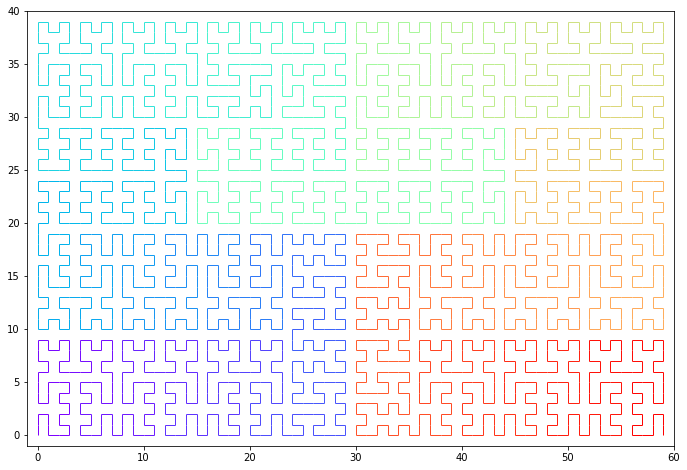

01/01/1950 To 31/12/2019 days 25567
 Pixels 2400 x dimension 60 y dimension 40
Read Magnitude data locations 2400 Time Steps 25567
Read Depth data locations 2400 Time Steps 25567
Read Multiplicity data locations 2400 Time Steps 25567
Read Rundle Multiplicity data locations 2400 Time Steps 25567
0 mag 7.5 Lat/Long -119.0 -119.0 1952-07-216km WNW of Grapevine, CA
1 mag 7.3 Lat/Long -116.44 -116.44 1992-06-28Landers, California Earthquake
2 mag 7.2 Lat/Long -115.3 -115.3 2010-04-0412km SW of Delta, B.C., MX
3 mag 7.1 Lat/Long -116.26 -116.26 1999-10-16Hector Mine, CA Earthquake
4 mag 7.1 Lat/Long -117.6 -117.6 2019-07-062019 Ridgecrest Earthquake Sequence
5 mag 6.7 Lat/Long -118.54 -118.54 1994-01-171km NNW of Reseda, CA
6 mag 6.6 Lat/Long -116.1 -116.1 1968-04-095km NNE of Ocotillo Wells, CA
7 mag 6.6 Lat/Long -115.85 -115.85 1987-11-2422km W of Westmorland, CA
8 mag 6.6 Lat/Long -118.37 -118.37 1971-02-0910km SSW of Agua Dulce, CA
9 mag 6.4 Lat/Long -116.08 -116.08 1954-03-1912km W of S

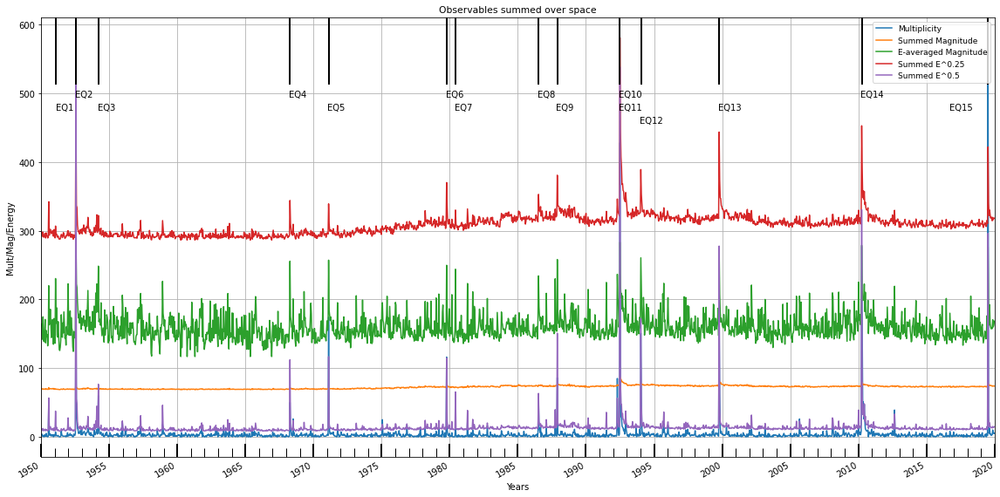

Read Fault Label data locations 2400
Number Fault Collections 36
new Fault Labels generated 0 through 35


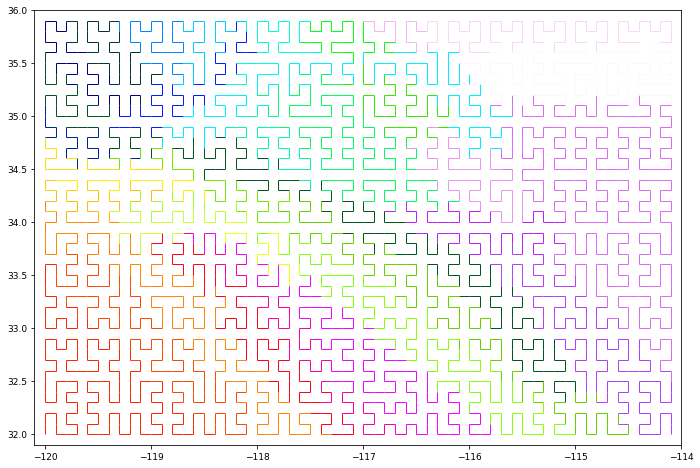

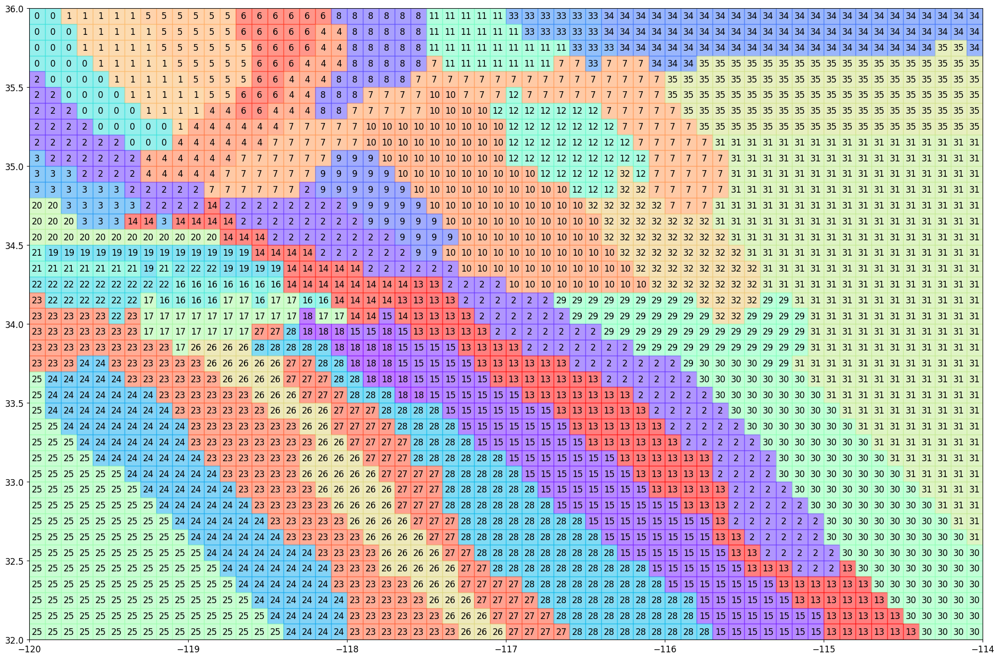

new Fault Labels generated 0 through 35


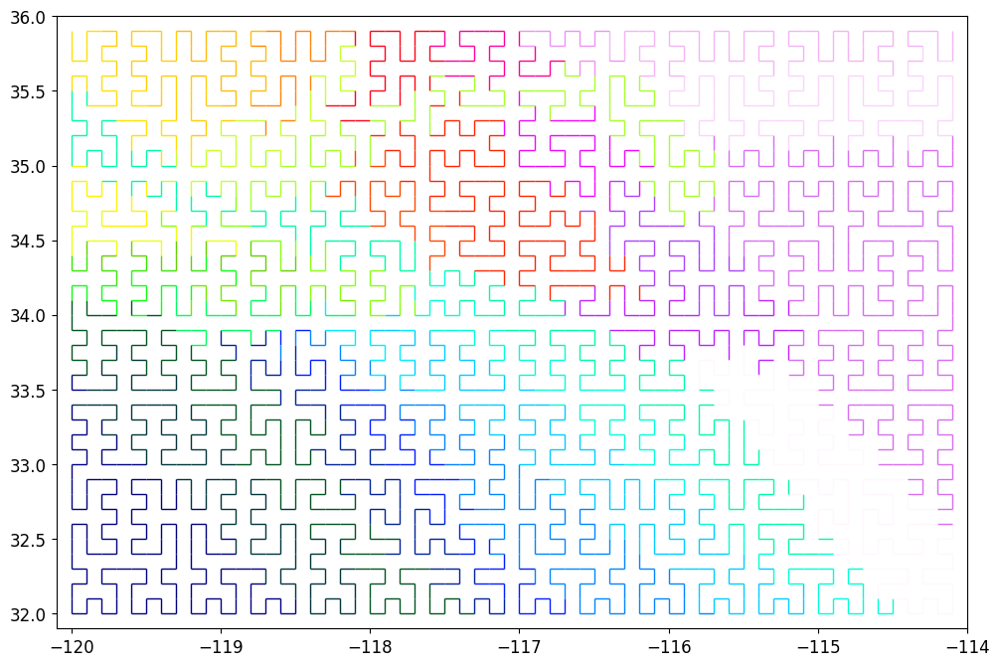

new Fault Labels generated 0 through 35


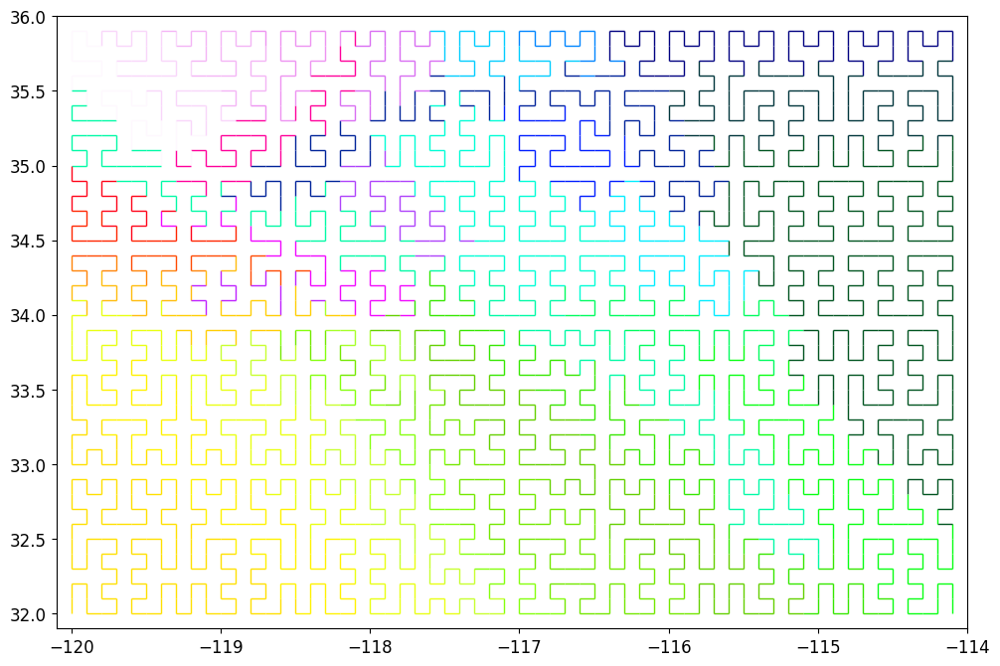

new Fault Labels generated 0 through 35


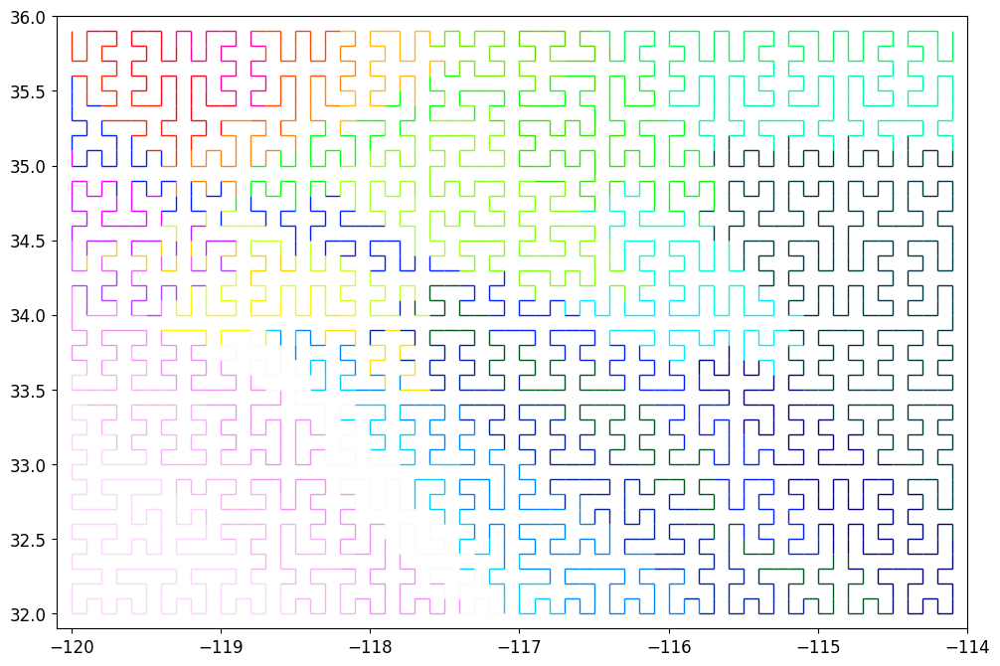

FFFFcfg.Earthquake 0 Mag 4 Weeks Ahead 02/02/2023, 03:49:15 UTC EARTHQ-EMA1LR8
FFFFcfg.Earthquake 10 E^0.25 4 Weeks Ahead 02/02/2023, 03:49:15 UTC EARTHQ-EMA1LR8
FFFFcfg.Earthquake 1 Mag 2 Month Ahead 02/02/2023, 03:49:16 UTC EARTHQ-EMA1LR8
FFFFcfg.Earthquake 11 E^0.25 2 Months Ahead 02/02/2023, 03:49:16 UTC EARTHQ-EMA1LR8
FFFFcfg.Earthquake 2 Mag 3 Months Ahead 02/02/2023, 03:49:16 UTC EARTHQ-EMA1LR8
FFFFcfg.Earthquake 12 E^0.25 3 Months Ahead 02/02/2023, 03:49:16 UTC EARTHQ-EMA1LR8
FFFFcfg.Earthquake 3 Mag 6 Months Ahead 02/02/2023, 03:49:18 UTC EARTHQ-EMA1LR8
FFFFcfg.Earthquake 13 E^0.25 6 Months Ahead 02/02/2023, 03:49:18 UTC EARTHQ-EMA1LR8
FFFFcfg.Earthquake 4 Mag Year Ahead 02/02/2023, 03:49:20 UTC EARTHQ-EMA1LR8
FFFFcfg.Earthquake 14 E^0.25 Year Ahead 02/02/2023, 03:49:20 UTC EARTHQ-EMA1LR8
FFFFcfg.Earthquake 5 Mag 2 Years Ahead 02/02/2023, 03:49:24 UTC EARTHQ-EMA1LR8
FFFFcfg.Earthquake 15 E^0.25 2 Years Ahead 02/02/2023, 03:49:24 UTC EARTHQ-EMA1LR8
FFFFcfg.Earthquake 6 Mag 4 ye

In [ ]:
if FFFFcfg.Earthquake:
  ReadEarthquakeData(FFFFcfg)

###Set Locations using Multiplicity Data for Earthquakes

In [ ]:
def histogrammultiplicity(FFFFcfg,Type, numbins, Data):
  hitcounts = np.zeros(FFFFpre.Nloc, dtype=int)
  rawcounts = np.zeros(FFFFpre.Nloc, dtype=int)
  for iloc in range(0,FFFFpre.Nloc):
    rawcounts[iloc] = int(0.1+Data[:,iloc].sum(0))
    hitcounts[iloc] = int(min(numbins, rawcounts[iloc]))
  matplotlib.rcParams.update(matplotlib.rcParamsDefault)
  plt.rcParams.update({'font.size': 9})
  plt.rcParams["figure.figsize"] = [8,6]
  plt.hist(hitcounts, numbins,  facecolor='b', alpha=0.75, log=True)
  plt.title('\n'.join(wrap(FFFFcfg.RunComment + ' ' + FFFFcfg.RunName + ' ' + Type + ' FFFFcfg.Earthquake Count per location ',70)))
  plt.xlabel('Hit Counts')
  plt.ylabel('Occurrences')
  plt.grid(True)
  plt.show()
  return rawcounts

def threebythree(FFFFcfg,pixellocation,numxlocations,numylocations):
  indices = np.empty([3,3], dtype=int)
  FFFFeq = FFFFcfg.FFFFeq

  y = int(0.1 + pixellocation/numxlocations)
  x = pixellocation - y*numxlocations
  bottomx = max(0,x-1)
  bottomx = min(bottomx,numxlocations-3)
  bottomy = max(0,y-1)
  bottomy = min(bottomy,numylocations-3)
  for ix in range(0,3):
    for iy in range(0,3):
      x= bottomx+ix
      y= bottomy+iy
      pixellocation = y*numxlocations + x
      indices[ix,iy] = pixellocation
  return indices

def ChooseLocations(FFFFcfg):
  FFFFeq = FFFFcfg.FFFFeq
  FFFFpre = FFFFcfg.FFFFpre

# Default to Identity Mapping
  FFFFpre.MappedLocations = np.arange(0,FFFFpre.Nloc, dtype=int)
  FFFFpre.LookupLocations = np.arange(0,FFFFpre.Nloc, dtype=int)
  FFFFpre.MappedNloc = FFFFpre.Nloc

  if FFFFcfg.Earthquake:
    histogrammultiplicity(FFFFcfg,'Basic', 100, FFFFpre.BasicInputTimeSeries[:,:,2])
    nbins = 10
    if FFFFeq.read1950:
      nbins= 50
    rawcounts1 = histogrammultiplicity(FFFFcfg,'Rundle > 3.29', nbins, FFFFpre.BasicInputTimeSeries[:,:,3])
    TempTimeSeries = np.zeros([FFFFpre.Num_Time,FFFFpre.Nloc],dtype = np.float32)
    for iloc in range (0,FFFFpre.Nloc):
      indices = threebythree(FFFFcfg,iloc,60,40)
      for itime in range(0,FFFFpre.Num_Time):
        sum3by3 = 0.0
        for ix in range(0,3):
          for iy in range(0,3):
            pixellocation = indices[ix,iy]
            sum3by3 += FFFFpre.BasicInputTimeSeries[itime,pixellocation,3]
        TempTimeSeries[itime,iloc] = sum3by3
    nbins =40
    if FFFFeq.read1950:
      nbins= 150
    rawcounts2 = histogrammultiplicity(FFFFcfg,'3x3 Rundle > 3.29', nbins, TempTimeSeries)
  #
  # Define "Interesting Locations"
    if FFFFeq.read1950:
      singleloccut = 25
      groupedloccut = 110
      singleloccut = 7.1
      groupedloccut = 34.1

  #    groupedloccut = 1000000000
    else:
      singleloccut = 5.1
      groupedloccut = 24.9
    FFFFpre.MappedLocations.fill(-1)
    FFFFpre.MappedNloc = 0
    ct1 = 0
    ct2 = 0
    for iloc in range (0,FFFFpre.Nloc):
      if rawcounts1[iloc] >= singleloccut:
        ct1 += 1
      if rawcounts2[iloc] >= groupedloccut:
        ct2 += 1
      if rawcounts1[iloc] < singleloccut and rawcounts2[iloc] < groupedloccut:
        continue
      FFFFpre.MappedLocations[iloc] = FFFFpre.MappedNloc
      FFFFpre.MappedNloc += 1

    FFFFpre.LookupLocations = None
    FFFFpre.LookupLocations = np.empty(FFFFpre.MappedNloc, dtype=int)
    for iloc in range (0,FFFFpre.Nloc):
      jloc = FFFFpre.MappedLocations[iloc]
      if jloc >= 0:
        FFFFpre.LookupLocations[jloc] = iloc

    TempTimeSeries = None
    print('Total ' + str(FFFFpre.MappedNloc) + ' Single location multiplicity cut ' + str(singleloccut) +
    ' ' + str(ct1) + ' 3x3 ' + str(groupedloccut) + ' ' + str(ct2))

def SetupEarthquakeEigensystems(FFFFcfg):
  FFFFeq = FFFFcfg.FFFFeq
  FFFFpre = FFFFcfg.FFFFpre

  if FFFFeq.RundleEigenvectors > 0:
    UseTopEigenTotal = 16
    UseTopEigenLocal = 0
    if FFFFeq.RundleEigenvectors > 1:
      UseTopEigenLocal = 4
    Num_EigenProperties = UseTopEigenTotal + UseTopEigenLocal
    EigenTimeSeries =  np.empty([FFFFpre.Num_Time,FFFFpre.MappedNloc],dtype = np.float32)
    PsiTimeSeries =  np.empty([FFFFpre.Num_Time,FFFFpre.MappedNloc],dtype = np.float32)
    FiTimeSeries =  np.empty([FFFFpre.Num_Time,FFFFpre.MappedNloc],dtype = np.float32)
    EigenTimeSeries[:,:] = FFFFpre.BasicInputTimeSeries[:,FFFFpre.LookupLocations,3]
    StoreEigenvectors = np.zeros([FFFFpre.Num_Time,FFFFpre.MappedNloc,FFFFpre.MappedNloc],dtype = np.float32)
    FFFFeq.StoreEigencorrels = np.zeros([FFFFpre.Num_Time,FFFFpre.MappedNloc,FFFFpre.MappedNloc],dtype = np.float32)
    FFFFeq.StoreNormingfactor = np.zeros([FFFFpre.Num_Time],dtype = np.float32)
    FFFFeq.StoreNormingfactor1 = np.zeros([FFFFpre.Num_Time],dtype = np.float32)
    FFFFeq.StoreNormingfactor2 = np.zeros([FFFFpre.Num_Time],dtype = np.float32)
    current_time = timenow()
    print(startbold + startred + 'Start Eigen Earthquake '
      + current_time + ' ' +FFFFcfg.RunName + resetfonts)

    for itime in range (0,FFFFpre.Num_Time):
      imax = itime
      imin = max(0, imax-25)
      Result =  np.zeros(FFFFpre.MappedNloc, dtype = np.float64)
      Result = AggregateEarthquakes(FFFFcfg,imin,0,imax-imin+1, FFFFpre.MappedNloc, EigenTimeSeries[:,:], 2)
      PsiTimeSeries[itime,:] = Result
      FiTimeSeries[itime,:] = EigenTimeSeries[itime,:]

    current_time = timenow()
    print(startbold + startred + 'End Eigen Earthquake 1 '
      + current_time + ' ' +FFFFcfg.RunName + resetfonts)
    FFFFeq.Eigenvals = np.zeros([FFFFpre.Num_Time,FFFFpre.MappedNloc], dtype = np.float32)
    FFFFeq.EarthquakeChi1 = np.zeros(FFFFpre.Num_Time, dtype = np.float32)
    FFFFeq.EarthquakeChi2 = np.zeros(FFFFpre.Num_Time, dtype = np.float32)
    Sumai = np.zeros(FFFFpre.Num_Time, dtype = np.float32)
    FFFFeq.EQ_Bestindex = np.zeros(FFFFpre.Num_Time, dtype = int)
    Numbereigs = np.zeros(FFFFpre.Num_Time, dtype = int)
    FFFFeq.EQ_Besttrailingindex = np.zeros(FFFFpre.Num_Time, dtype = int)
    FFFFeq.Eig0coeff = np.zeros(FFFFpre.Num_Time, dtype = np.float32)
    meanmethod = 0
    if meanmethod == 1:
      Meanovertime = np.empty(FFFFpre.MappedNloc, dtype = np.float32)
      sigmaovertime = np.empty(FFFFpre.MappedNloc, dtype = np.float32)
      Meanovertime = FiTimeSeries.mean(axis=0)
      Meanovertime = Meanovertime.reshape(1,FFFFpre.MappedNloc)
      sigmaovertime = FiTimeSeries.std(axis=0)
      sigmaovertime = sigmaovertime.reshape(1,FFFFpre.MappedNloc)
    countbad = 0
    OldActualNumberofLocationsUsed = -1
    for itime in range (25,FFFFpre.Num_Time):
      LocationCounts = FiTimeSeries[0:itime,:].sum(axis=0)
      NumLocsToday = np.count_nonzero(LocationCounts)
      Nonzeromapping =  np.zeros(NumLocsToday, dtype = int)
      ActualNumberofLocationsUsed = 0
      for ipos in range (0,FFFFpre.MappedNloc):
        if LocationCounts[ipos] == 0:
          continue
        Nonzeromapping[ActualNumberofLocationsUsed] = ipos
        ActualNumberofLocationsUsed +=1
      if ActualNumberofLocationsUsed <= 1:
        print(str(itime) + ' Abandoned ' + str(ActualNumberofLocationsUsed))
        continue
      FiHatTimeSeries = np.empty([itime+1,ActualNumberofLocationsUsed], dtype = np.float32)
      if meanmethod == 1:
        FiHatTimeSeries[:,:] = np.divide(np.subtract(FiTimeSeries[0:(itime+1),Nonzeromapping],Meanovertime[0,Nonzeromapping]),
                                  sigmaovertime[0,Nonzeromapping])
      else:
        FiHatTimeSeries[:,:] = FiTimeSeries[0:(itime+1),Nonzeromapping]
#          FiHatTimeSeries[:,:] = PsiTimeSeries[0:(itime+1),Nonzeromapping]
      CorrelationMatrix = np.corrcoef(FiHatTimeSeries, rowvar =False)
      bad = np.count_nonzero(np.isnan(CorrelationMatrix))
      if bad > 0:
        countbad += 1
        continue
      evalues, evectors = solver.eigh(CorrelationMatrix)
      Newevector = evectors[:,ActualNumberofLocationsUsed-1]
      Newevalue = evalues[ActualNumberofLocationsUsed-1]
      debug = False
      if debug:
        if OldActualNumberofLocationsUsed == ActualNumberofLocationsUsed:
          Mapdiff = np.where(np.not_equal(OldNonzeromapping,Nonzeromapping),1,0.).sum()
          if Mapdiff > 0:
            print(str(itime) + ' Change in mapping ' + str(ActualNumberofLocationsUsed) + ' Change ' + str(Mapdiff))
          else:
            Corrdiff =  np.absolute(np.subtract(OldCorrelationMatrix,CorrelationMatrix)).sum()
            Corrorg = np.absolute(CorrelationMatrix).sum()
            yummy = CorrelationMatrix.dot(Oldevector)
            vTMv = yummy.dot(Oldevector)
            Doubleyummy = CorrelationMatrix.dot(Newevector)
            newvTMv = Doubleyummy.dot(Newevector)
            print(str(itime) + ' Change in correlation ' + str(ActualNumberofLocationsUsed) + ' Change '
            + str(Corrdiff) + ' original ' + str(Corrorg) + ' eval ' + str(Oldevalue) + ' new '
              + str(Newevalue) + ' vTMv ' + str(vTMv) + ' New ' + str(newvTMv))

        else:
          print(str(itime) + ' Change in size ' + str(OldActualNumberofLocationsUsed) + ' ' +
                str(ActualNumberofLocationsUsed))

      OldActualNumberofLocationsUsed = ActualNumberofLocationsUsed
      OldNonzeromapping = Nonzeromapping
      OldCorrelationMatrix = CorrelationMatrix
      Oldevector = Newevector
      Oldevalue = Newevalue

      normcoeff = 100.0/evalues.sum()
      evalues = np.multiply(evalues, normcoeff)
      Numbereigs[itime] = ActualNumberofLocationsUsed

      for ieig in range(0,ActualNumberofLocationsUsed):
        FFFFeq.Eigenvals[itime, ieig] = evalues[ActualNumberofLocationsUsed-ieig-1]
      chival = 0.0
      sumaieig = 0.0
      Checkvector = np.zeros(ActualNumberofLocationsUsed,dtype = np.float32)
      largesteigcoeff = -1.0
      largestindex = -1

      Keepaisquared = np.zeros(ActualNumberofLocationsUsed, dtype=np.float32)
      for ieig in range(0,ActualNumberofLocationsUsed):
        aieig = 0.0
        backwards = ActualNumberofLocationsUsed-ieig-1
        for vectorindex in range(0,ActualNumberofLocationsUsed):
          StoreEigenvectors[itime,backwards,Nonzeromapping[vectorindex]] = evectors[vectorindex,ieig]
          aieig += evectors[vectorindex,ieig]*PsiTimeSeries[itime,Nonzeromapping[vectorindex]]
        for vectorindex in range(0,ActualNumberofLocationsUsed):
          Checkvector[vectorindex] += aieig*evectors[vectorindex, ieig]
        aieig *= aieig
        chival += aieig*evalues[ieig]
        sumaieig += aieig
        Keepaisquared[backwards] = aieig

      for ieig in range(0,ActualNumberofLocationsUsed):
        backwards = ActualNumberofLocationsUsed-ieig-1
        aieig = Keepaisquared[backwards]
        aieig = aieig/sumaieig
        if backwards == 0:
          FFFFeq.Eig0coeff[itime] = aieig
        test = evalues[ieig]*aieig
        if test > largesteigcoeff:
          largesteigcoeff = test
          largestindex = backwards
      FFFFeq.EQ_Bestindex[itime] = largestindex

      discrep = 0.0
      for vectorindex in range(0,ActualNumberofLocationsUsed):
        discrep += pow(Checkvector[vectorindex] - PsiTimeSeries[itime,Nonzeromapping[vectorindex]], 2)
      if discrep > 0.01:
        print('Eigendecomposition Failure ' + str(itime) + ' ' + str(discrep))
      FFFFeq.EarthquakeChi1[itime] = chival
      FFFFeq.EarthquakeChi2[itime] = chival/sumaieig
      Sumai[itime] = sumaieig

      largesteigcoeff = -1.0
      largestindex = -1
      sumaieig = 0.0
      Trailingtimeindex = itime-3
      if itime > 40:
        Trailinglimit = Numbereigs[Trailingtimeindex]
        KeepTrailingaisquared = np.zeros(Trailinglimit, dtype=np.float32)
        for ieig in range(0,Trailinglimit):
          aieig = 0.0
          for vectorindex in range(0,FFFFpre.MappedNloc):
#              aieig += StoreEigenvectors[Trailingtimeindex,ieig,vectorindex]*PsiTimeSeries[itime,vectorindex]
            aieig += StoreEigenvectors[Trailingtimeindex,ieig,vectorindex]*StoreEigenvectors[itime,
                                                                                              FFFFeq.EQ_Bestindex[itime],vectorindex]
          aieig *= aieig
          sumaieig += aieig
          KeepTrailingaisquared[ieig] = aieig

        for ieig in range(0,Trailinglimit):
          aieig = KeepTrailingaisquared[ieig]
          aieig = aieig/sumaieig
          test = FFFFeq.Eigenvals[Trailingtimeindex, ieig]*aieig
          if test > largesteigcoeff:
            largesteigcoeff = test
            largestindex = ieig
        FFFFeq.EQ_Besttrailingindex[itime] = largestindex



      if itime >40: # Calculate eigenvector tracking
        Leader = StoreEigenvectors[itime,:,:]
        Trailer = StoreEigenvectors[itime-3,:,:]
        FFFFeq.StoreEigencorrels[itime,:,:] = np.tensordot(Leader,Trailer,((1),(1)))
        StrippedDown = FFFFeq.StoreEigencorrels[itime,FFFFeq.EQ_Bestindex[itime],:]
        Normingfactor =  np.multiply(StrippedDown,StrippedDown).sum()
        Normingfactor1 =  np.multiply(StrippedDown[0:8],StrippedDown[0:8]).sum()
        Normingfactor2 =  np.multiply(StrippedDown[0:30],StrippedDown[0:30]).sum()
        FFFFeq.StoreNormingfactor[itime] = Normingfactor
        FFFFeq.StoreNormingfactor1[itime] = Normingfactor1
        FFFFeq.StoreNormingfactor2[itime] = Normingfactor2

    averagesumai = Sumai.mean()
    FFFFeq.EarthquakeChi1 = np.divide(FFFFeq.EarthquakeChi1,averagesumai)
    print('Bad Correlation Matrices ' + str(countbad))
    print(startbold + startred + 'End Eigen FFFFcfg.Earthquake 2 '
      + current_time + ' ' + FFFFcfg.RunName + resetfonts)





<IPython.core.display.Javascript object>

In [ ]:
if FFFFcfg.Earthquake:
  if FFFFeq.UseEarthquakeEigenSystems:
    !pip install scipy -U
    import scipy as sc
    import scipy.linalg as solver
    version = sc.version.version
    print('SciPy version ' + str(version))

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

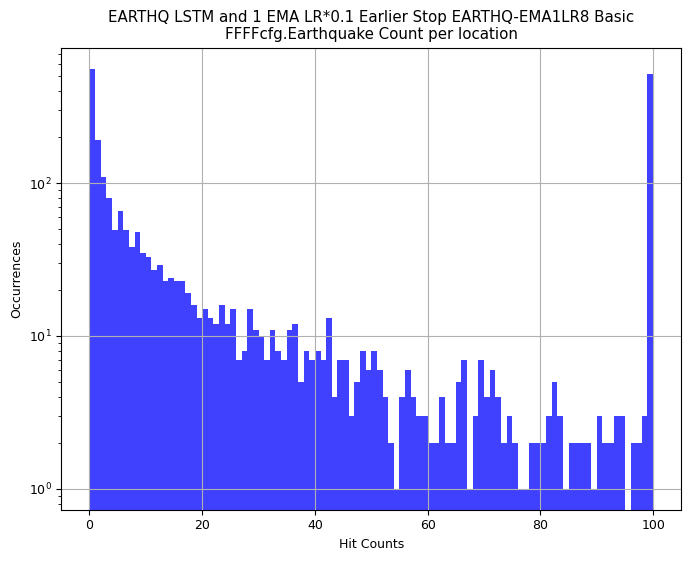

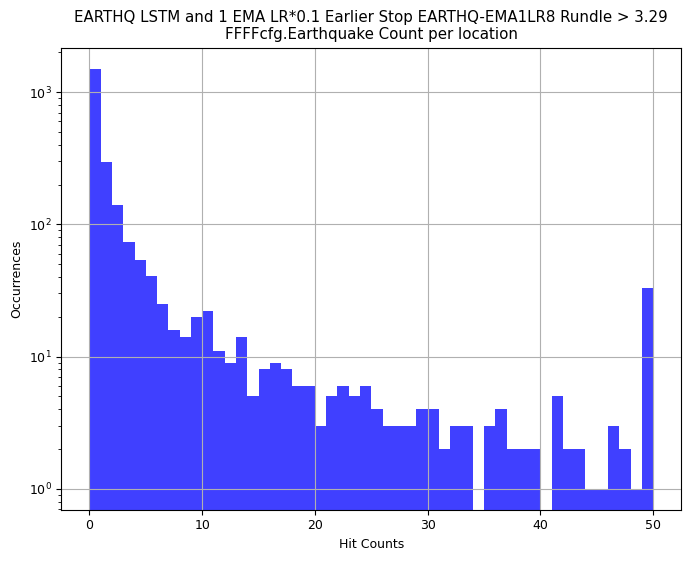

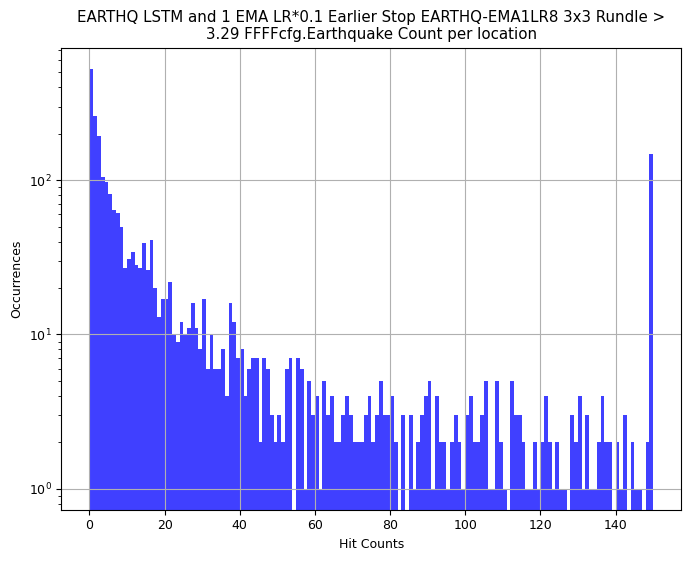

Total 500 Single location multiplicity cut 7.1 249 3x3 34.1 488


In [ ]:
# Set Location Mapping
ChooseLocations(FFFFcfg)

if FFFFcfg.Earthquake and FFFFeq.UseEarthquakeEigenSystems:
  SetupEarthquakeEigensystems(FFFFcfg)

###Study Earthquake Eigensystems

In [ ]:
def makeasmalldateplot(figure,ax, Dateaxis):
  plt.rcParams.update({'font.size': 9})
  months = mdates.MonthLocator(interval=2)   # every month
  datemin = np.datetime64(Dateaxis[0], 'M')
  datemax = np.datetime64(Dateaxis[-1], 'M') + np.timedelta64(1, 'M')
  ax.set_xlim(datemin, datemax)

  months_fmt = mdates.DateFormatter('%y-%b')
  locator = mdates.AutoDateLocator()
  locator.intervald['MONTHLY'] = [2]
  formatter = mdates.ConciseDateFormatter(locator)
#  ax.xaxis.set_major_locator(locator)
#  ax.xaxis.set_major_formatter(formatter)
  ax.xaxis.set_major_locator(months)
  ax.xaxis.set_major_formatter(months_fmt)

  figure.autofmt_xdate()
  return datemin, datemax

def plotquakeregions(FFFFcfg,HalfSize,xaxisdates, SetofPlots, Commontitle, ylabel, SetofColors, Startx, ncols):
  FFFFeq = FFFFcfg.FFFFeq
  numplotted = SetofPlots.shape[1]
  totusedquakes = 0
  for iquake in range(0,FFFFeq.numberspecialeqs):
    x_line_index = FFFFeq.EQ_Numericaldate[iquake]
    if (x_line_index <= Startx) or (x_line_index >= FFFFpre.Num_Time-1):
      continue
    if FFFFeq.Specialuse[iquake]:
      totusedquakes +=1
  nrows = math.ceil(totusedquakes/ncols)
  sortedquakes = np.argsort(FFFFeq.EQ_Numericaldate)

  jplot = 0
  kplot = -1
  for jquake in range(0,FFFFeq.numberspecialeqs):
    iquake = sortedquakes[jquake]
    if not FFFFeq.Specialuse[iquake]:
      continue
    x_line_annotation = FFFFeq.Specialdate[iquake]
    x_line_index = FFFFeq.EQ_Numericaldate[iquake]
    if (x_line_index <= Startx) or (x_line_index >= FFFFpre.Num_Time-1):
      continue

    kplot +=1
    if kplot == ncols:

      plt.savefig(FFFFcfg.APPLDIR +'/Outputs/QRegions' + str(jplot) +FFFFcfg.RunName + '.png ',format='png')
      plt.show()
      kplot = 0
      jplot +=1
    if kplot == 0:
        plt.rcParams["figure.figsize"] = [16,6]
        figure, axs = plt.subplots(nrows=1, ncols=ncols, squeeze=False)

    beginplotindex = x_line_index - HalfSize
    beginplotindex = max(beginplotindex, Startx)
    endplotindex = x_line_index  + HalfSize
    endplotindex = min(endplotindex, FFFFpre.Num_Time-1)
    eachplt = axs[0,kplot]
    ascii = ''
    if FFFFeq.Specialuse[iquake]:
      ascii = np.datetime_as_string(FFFFeq.Specialdate[iquake]) + ' ' + str(round(FFFFeq.Specialmags[iquake],1)) + ' ' + FFFFeq.Specialeqname[iquake]
    eachplt.set_title(str(iquake) + ' ' + FFFFcfg.RunName + ' Best Eigenvalue (Black) Trailing (Red) \n' + ascii)
    datemin, datemax = makeasmalldateplot(figure, eachplt, xaxisdates[beginplotindex:endplotindex+1])
    for curves in range(0,numplotted):
      eachplt.plot(xaxisdates[beginplotindex:endplotindex+1], SetofPlots[beginplotindex:endplotindex+1,curves],
                    'o', color=SetofColors[curves], markersize =1)

    ymin, ymax = eachplt.get_ylim()
    if ymax >= 79.9:
      ymax = 82
    eachplt.set_ylim(bottom=-1.0, top=max(ymax,20))
    eachplt.set_ylabel(ylabel)
    eachplt.set_xlabel('Time')
    eachplt.grid(True)
    eachplt.set_yscale("linear")
    eachplt.axvline(x=x_line_annotation, linestyle='dashed', alpha=1.0, linewidth = 2.0, color='red')
    for kquake in range(0,FFFFeq.numberspecialeqs):
      if not FFFFeq.Specialuse[kquake]:
        continue
      if kquake == iquake:
        continue
      anotherx_line_index = FFFFeq.EQ_Numericaldate[kquake]
      if (anotherx_line_index < beginplotindex) or (anotherx_line_index >= endplotindex):
        continue
      eachplt.axvline(x=FFFFeq.Specialdate[kquake], linestyle='dashed', alpha=1.0, linewidth = 1.0, color='purple')
    eachplt.tick_params('x', direction = 'in', length=15, width=2, which='major')


  plt.savefig(FFFFcfg.APPLDIR +'/Outputs/QRegions' + str(jplot) +FFFFcfg.RunName + '.png ',format='png')
  plt.show()

def EarthquakeEigenAnalysis(FFFFcfg):
  FFFFeq = FFFFcfg.FFFFeq
  FFFFpre = FFFFcfg.FFFFpre

  UseTopEigenTotal = 40
  FirstTopEigenTotal = 10
  PLTlabels = []
  for ieig in range(0,UseTopEigenTotal):
    PLTlabels.append('Eig-' + str(ieig))

  plt.rcParams["figure.figsize"] = [12,10]
  figure, ax = plt.subplots()
  datemin, datemax = makeadateplot(figure, ax, FFFFeq.EarthquakeDateaxis[26:])
  plt.rcParams["figure.figsize"] = [12,10]
  for ieig in range(0,FirstTopEigenTotal):
    ax.plot(FFFFeq.EarthquakeDateaxis[26:],np.maximum(FFFFeq.Eigenvals[26:, ieig],0.1))

  ax.set_title(FFFFcfg.RunName + ' Multiplicity Eigenvalues')
  ax.set_ylabel('Eigenvalue')
  ax.set_xlabel('Time')
  ax.set_yscale("log")
  ax.grid(True)
  ax.legend(PLTlabels[0:FirstTopEigenTotal], loc='upper right')
  Addfixedearthquakes(FFFFcfg,ax, datemin, datemax,ylogscale=True )
  ax.tick_params('x', direction = 'in', length=15, width=2, which='major')
  ax.xaxis.set_minor_locator(mdates.YearLocator(1))
  ax.tick_params('x', direction = 'in', length=10, width=1, which='minor')
  plt.show()

  plt.rcParams["figure.figsize"] = [12,10]
  figure, ax = plt.subplots()
  datemin, datemax = makeadateplot(figure, ax, FFFFeq.EarthquakeDateaxis[26:])
  plt.rcParams["figure.figsize"] = [12,10]
  for ieig in range(FirstTopEigenTotal,UseTopEigenTotal):
    ax.plot(FFFFeq.EarthquakeDateaxis[26:],np.maximum(FFFFeq.Eigenvals[26:, ieig],0.1))

  ax.set_title(FFFFcfg.RunName + ' Multiplicity Eigenvalues')
  ax.set_ylabel('Eigenvalue')
  ax.set_xlabel('Time')
  ax.set_yscale("linear")
  ax.grid(True)
  ax.legend(PLTlabels[FirstTopEigenTotal:], loc='upper right')
  Addfixedearthquakes(FFFFcfg,ax, datemin, datemax,ylogscale=False )
  ax.tick_params('x', direction = 'in', length=15, width=2, which='major')
  ax.xaxis.set_minor_locator(mdates.YearLocator(1))
  ax.tick_params('x', direction = 'in', length=10, width=1, which='minor')
  plt.show()

  if FFFFeq.ShowEarthquakeEigencorrels:
    for mastereig in range(0, UseTopEigenTotal):
      figure, ax = plt.subplots()
      plt.rcParams["figure.figsize"] = [12,8]
      datemin, datemax = makeadateplot(figure, ax, FFFFeq.EarthquakeDateaxis[26:])
      for ieig in range(0,UseTopEigenTotal):
        alpha = 1.0
        width = 3
        if ieig == mastereig:
          alpha=0.5
          width = 1
        ax.plot(FFFFeq.EarthquakeDateaxis[26:],np.power(FFFFeq.StoreEigencorrels[26:,mastereig,ieig],2), alpha=alpha, linewidth = width)
      ax.set_title(FFFFcfg.RunName + ' Eigenvalue ' + str(mastereig) + ' Current versus Past Total Correlation')
      ax.set_ylabel('Norm')
      ax.set_xlabel('Time')
      ax.grid(True)
      ax.legend(PLTlabels, loc='upper right')
      Addfixedearthquakes(FFFFcfg,ax, datemin, datemax,ylogscale=False )
      ax.tick_params('x', direction = 'in', length=15, width=2, which='major')
      ax.xaxis.set_minor_locator(mdates.YearLocator(1))
      ax.tick_params('x', direction = 'in', length=10, width=1, which='minor')
      plt.show()

  figure, ax = plt.subplots()
  plt.rcParams["figure.figsize"] = [12,8]
  datemin, datemax = makeadateplot(figure, ax, FFFFeq.EarthquakeDateaxis[26:])
  alpha = 1.0
  width = 0.5
  ax.plot(FFFFeq.EarthquakeDateaxis[26:],FFFFeq.StoreNormingfactor[26:], alpha=alpha, linewidth = width)
  ax.set_title(FFFFcfg.RunName + ' Eigenvalue Full Norming Factor with Past')
  ax.set_ylabel('Norming Factor')
  ax.set_xlabel('Time')
  ax.grid(True)
  Addfixedearthquakes(FFFFcfg,ax, datemin, datemax,ylogscale=False )
  ax.tick_params('x', direction = 'in', length=15, width=2, which='major')
  ax.xaxis.set_minor_locator(mdates.YearLocator(1))
  ax.tick_params('x', direction = 'in', length=10, width=1, which='minor')
  plt.show()

  figure, ax = plt.subplots()
  plt.rcParams["figure.figsize"] = [12,8]
  datemin, datemax = makeadateplot(figure, ax, FFFFeq.EarthquakeDateaxis[26:])
  alpha = 1.0
  width = 0.5
  ax.plot(FFFFeq.EarthquakeDateaxis[26:],FFFFeq.StoreNormingfactor1[26:], alpha=alpha, linewidth = width)
  ax.set_title(FFFFcfg.RunName + ' Eigenvalue First 8 Norming Factor with Past')
  ax.set_ylabel('Norming Factor')
  ax.set_xlabel('Time')
  ax.grid(True)
  Addfixedearthquakes(FFFFcfg,ax, datemin, datemax,ylogscale=False )
  ax.tick_params('x', direction = 'in', length=15, width=2, which='major')
  ax.xaxis.set_minor_locator(mdates.YearLocator(1))
  ax.tick_params('x', direction = 'in', length=10, width=1, which='minor')
  plt.show()

  figure, ax = plt.subplots()
  plt.rcParams["figure.figsize"] = [12,8]
  datemin, datemax = makeadateplot(figure, ax, FFFFeq.EarthquakeDateaxis[26:])
  alpha = 1.0
  width = 0.5
  ax.plot(FFFFeq.EarthquakeDateaxis[26:],FFFFeq.StoreNormingfactor2[26:], alpha=alpha, linewidth = width)
  ax.set_title(FFFFcfg.RunName + ' Eigenvalue First 30 Norming Factor with Past')
  ax.set_ylabel('Norming Factor')
  ax.set_xlabel('Time')
  ax.grid(True)
  Addfixedearthquakes(FFFFcfg,ax, datemin, datemax,ylogscale=False )
  ax.tick_params('x', direction = 'in', length=15, width=2, which='major')
  ax.xaxis.set_minor_locator(mdates.YearLocator(1))
  ax.tick_params('x', direction = 'in', length=10, width=1, which='minor')
  plt.show()

  figure, ax = plt.subplots()
  plt.rcParams["figure.figsize"] = [12,8]
  datemin, datemax = makeadateplot(figure, ax, FFFFeq.EarthquakeDateaxis[26:])
  plt.rcParams["figure.figsize"] = [12,8]
  ax.plot(FFFFeq.EarthquakeDateaxis[26:],FFFFeq.EarthquakeChi1[26:])

  ax.set_title(FFFFcfg.RunName + ' Correlations Normalized on average over time')
  ax.set_ylabel('Chi1')
  ax.set_xlabel('Time')
  ax.grid(True)
  Addfixedearthquakes(FFFFcfg,ax, datemin, datemax)
  ax.tick_params('x', direction = 'in', length=15, width=2, which='major')
  ax.xaxis.set_minor_locator(mdates.YearLocator(1))
  ax.tick_params('x', direction = 'in', length=10, width=1, which='minor')
  ax.set_yscale("linear")
  plt.show()

  figure, ax = plt.subplots()
  datemin, datemax = makeadateplot(figure, ax, FFFFeq.EarthquakeDateaxis[26:])
  plt.rcParams["figure.figsize"] = [12,8]
  ax.plot(FFFFeq.EarthquakeDateaxis[26:],FFFFeq.EarthquakeChi2[26:])

  ax.set_title(FFFFcfg.RunName + ' Correlations Normalized at each time')
  ax.set_ylabel('Chi2')
  ax.set_xlabel('Time')
  ax.grid(True)
  Addfixedearthquakes(FFFFcfg,ax, datemin, datemax)
  ax.tick_params('x', direction = 'in', length=15, width=2, which='major')
  ax.xaxis.set_minor_locator(mdates.YearLocator(1))
  ax.tick_params('x', direction = 'in', length=10, width=1, which='minor')
  ax.set_yscale("linear")
  plt.show()

  figure, ax = plt.subplots()
  datemin, datemax = makeadateplot(figure, ax, FFFFeq.EarthquakeDateaxis[26:])
  plt.rcParams["figure.figsize"] = [12,8]
  norm = np.amax(FFFFeq.EarthquakeChi1[26:])
  Maxeig = 80
 # ax.plot(FFFFeq.EarthquakeDateaxis[26:],FFFFeq.EarthquakeChi1[26:]*Maxeig/norm)
  ax.plot(FFFFeq.EarthquakeDateaxis[26:], 0.5 + np.minimum(Maxeig, FFFFeq.EQ_Bestindex[26:]), 'o', color='black', markersize =1)
  ax.plot(FFFFeq.EarthquakeDateaxis[26:], np.minimum(Maxeig, FFFFeq.EQ_Besttrailingindex[26:]), 'o', color='red', markersize =1)

  ax.set_title(FFFFcfg.RunName + ' Best Eigenvalue (Black) Trailing (Red)')
  ax.set_ylabel('Eig#')
  ax.set_xlabel('Time')
  ax.grid(True)
  Addfixedearthquakes(FFFFcfg,ax, datemin, datemax)
  ax.tick_params('x', direction = 'in', length=15, width=2, which='major')
  ax.xaxis.set_minor_locator(mdates.YearLocator(1))
  ax.tick_params('x', direction = 'in', length=10, width=1, which='minor')
  ax.set_yscale("linear")
  plt.show()

  SetofPlots = np.empty([len(FFFFeq.EQ_Bestindex),2], dtype=np.float32)
  SetofPlots[:,0] = 0.5 + np.minimum(Maxeig, FFFFeq.EQ_Bestindex[:])
  SetofPlots[:,1] = np.minimum(Maxeig, FFFFeq.EQ_Besttrailingindex[:])
  SetofColors = ['black',  'red']
  plotquakeregions(FFFFcfg, 25, FFFFeq.EarthquakeDateaxis, SetofPlots,
              FFFFcfg.RunName + ' Best Eigenvalue (Black) Trailing (Red)', 'Eig#', SetofColors, 26,2)

  plt.rcParams["figure.figsize"] = [12,8]
  figure, ax = plt.subplots()
  datemin, datemax = makeadateplot(figure, ax, FFFFeq.EarthquakeDateaxis[26:])
  ax.plot(FFFFeq.EarthquakeDateaxis[26:], FFFFeq.Eig0coeff[26:], 'o', color='black', markersize =2)
  ymin, ymax = ax.get_ylim()
  ax.plot(FFFFeq.EarthquakeDateaxis[26:], FFFFeq.EarthquakeChi1[26:]*ymax/norm)

  ax.set_title(FFFFcfg.RunName + ' Fraction Largest Eigenvalue')
  ax.set_ylabel('Eig 0')
  ax.set_xlabel('Time')
  ax.grid(True)
  Addfixedearthquakes(FFFFcfg,ax, datemin, datemax)
  ax.tick_params('x', direction = 'in', length=15, width=2, which='major')
  ax.xaxis.set_minor_locator(mdates.YearLocator(1))
  ax.tick_params('x', direction = 'in', length=10, width=1, which='minor')
  ax.set_yscale("linear")
  plt.show()


<IPython.core.display.Javascript object>

In [ ]:
if FFFFcfg.Earthquake and FFFFeq.EarthquakeEigenAnalysis:
  EarthquakeEigenAnalysis(FFFFcfg)

<IPython.core.display.Javascript object>

###End of Earthquake. Reset Timing

In [ ]:
def EndofEarthquake(FFFFcfg):
# Reset Start Date by a year so first entry has a 365 day sample ending at that day and so can be made an input as can all
# lower time intervals
# Do NOT include 2 year or 4 year in input stream
# So we reset start date by one year skipping first 364 daya except to calculate the first one year (and lower limit) observables
# Time indices go from 0 to FFFFpre.NumberofTimeunits-1
# Sequence Indices go from Begin to Begin+FFFFcfg.Tseq-1 where Begin goes from 0 to FFFFpre.NumberofTimeunits-1-FFFFcfg.Tseq
# So FFFFcfg.Num_Seq = Numberodays-FFFFcfg.Tseq and Begin has  FFFFcfg.Num_Seq values

  FFFFeq = FFFFcfg.FFFFeq
  FFFFpre = FFFFcfg.FFFFpre
  FFFFeq.MagnitudeMethod = 0

  SkipTimeUnits = 364
  if FFFFcfg.Dailyunit == 14:
    SkipTimeUnits = 25
  Num_Time_old = FFFFpre.NumberofTimeunits
  FFFFpre.NumberofTimeunits = FFFFpre.NumberofTimeunits - SkipTimeUnits
  FFFFpre.Num_Time = FFFFpre.NumberofTimeunits
  FFFFcfg.InitialDate = FFFFcfg.InitialDate  + timedelta(days=SkipTimeUnits*FFFFcfg.Dailyunit)
  FFFFcfg.FinalDate = FFFFcfg.InitialDate + timedelta(days=(FFFFpre.NumberofTimeunits-1)*FFFFcfg.Dailyunit)
  print('Skip ' +str(SkipTimeUnits) + ' New dates: ' + FFFFcfg.InitialDate.strftime("%d/%m/%Y") + ' To '
   + FFFFcfg.FinalDate.strftime("%d/%m/%Y")+ ' days ' + str(FFFFpre.NumberofTimeunits*FFFFcfg.Dailyunit))


  FFFFpre.DynamicPropertyTimeSeries =  np.empty([FFFFpre.Num_Time,FFFFpre.Nloc,FFFFpre.NpropperTimeDynamic],dtype = np.float32)
  CountNaN = np.zeros(FFFFpre.NpropperTimeDynamic, dtype=int)
  # Skewtime makes certain propert ENDS at given cell and is the cell itself if size = FFFFcfg.DailyUnit
  # FFFFpre.NpropperTimeDynamicInput is number of input quantities (4)
  # FFFFpre.NpropperTimeDynamic adds calculated quantities: accumulated magnitudes (5 magnitude, 6 E^0.25)and Rundle EMA
  # Rundle EMA has same time cut as input time series i.e. no skew but all times are used to find EMA
  #   FFFFeq.addRundleEMA = 4
  # FFFFeq.RundleLambda = [0.75,1.5,0.75,1.5]
  # FFFFeq.RundleSteps = [72,72,36,36]
  # FFFFpre.NpropperTimeDynamicCalculated = 11 + FFFFeq.addRundleEMA
  # FFFFeq.InputIndextogenerateEMAs = 3
  # FFFFeq.FirstEMAIndex = 15
  SkewTime = [0] * FFFFpre.NpropperTimeDynamicInput
  if FFFFcfg.Dailyunit == 1:
    SkewTime = SkewTime + [22,45,91,182,364,0,22,45,91,182,364]
  if FFFFcfg.Dailyunit == 14:
    SkewTime = SkewTime + [1, 3, 6, 12, 25,0,1, 3, 6, 12, 25]
  if FFFFeq.addRundleEMA > 0:
    SkewTime = SkewTime + [0]*FFFFeq.addRundleEMA

  for iprop in range(0,FFFFpre.NpropperTimeDynamic):
    addtime = SkipTimeUnits - SkewTime[iprop]

    if iprop >= FFFFpre.NpropperTimeDynamic-FFFFeq.addRundleEMA: # Rundle EMA 15-->18
      EMANumber = iprop - FFFFpre.NpropperTimeDynamic + FFFFeq.addRundleEMA
      for iloc in range(0,FFFFpre.Nloc):
        localEMA = MakeEMAMinCT(FFFFpre.BasicInputTimeSeries[:,iloc,FFFFeq.InputIndextogenerateEMAs], FFFFeq.RundleSteps[EMANumber], FFFFeq.RundleLambda[EMANumber])
        for itime in range(0,FFFFpre.NumberofTimeunits):
            localval = localEMA[itime+addtime]
            if np.math.isnan(localval):
              localval = FFFFcfg.NaN
              CountNaN[iprop] +=1
            FFFFpre.DynamicPropertyTimeSeries[itime,iloc,iprop] = localval
      print('Dynamic ' + str(iprop) + ' Rundle EMA ' + str(EMANumber) + ' Prop ' + FFFFpre.DynamicNames[iprop] + ' Time Shift ' + str(addtime) + ' NaN ' + str(CountNaN[iprop]) + ' Could be in Pred same name')

    else:
      if iprop < FFFFpre.NpropperTimeDynamicInput: # Input Data 0-->3
        for itime in range(0,FFFFpre.NumberofTimeunits):
          for iloc in range(0,FFFFpre.Nloc):
            localval = FFFFpre.BasicInputTimeSeries[itime+addtime,iloc,iprop]
            if np.math.isnan(localval):
              localval = FFFFcfg.NaN
              CountNaN[iprop] +=1
            FFFFpre.DynamicPropertyTimeSeries[itime,iloc,iprop] = localval
        print('Dynamic ' + str(iprop) + ' Input Time Series ' + str(iprop) + ' Prop ' + FFFFpre.DynamicNames[iprop] + ' Time Shift ' + str(addtime) + ' NaN ' + str(CountNaN[iprop]) + ' Could be in Pred same name')

      else:
        if iprop < (FFFFpre.NpropperTimeDynamic-6-FFFFeq.addRundleEMA):  # Transformed Magnitude Dynamic 4-8 from Calc 0 to 4
          icalc = iprop-FFFFpre.NpropperTimeDynamicInput
        else: # Aggregated E^0.25 magnitude Dynamic 9-14 from Calc 9-14
          icalc = iprop-FFFFpre.NpropperTimeDynamicInput+4
        for itime in range(0,FFFFpre.NumberofTimeunits):
            for iloc in range(0,FFFFpre.Nloc):
              localval = FFFFpre.CalculatedTimeSeries[itime+addtime,iloc,icalc]
              if np.math.isnan(localval):
                localval = FFFFcfg.NaN
                CountNaN[iprop] +=1
              FFFFpre.DynamicPropertyTimeSeries[itime,iloc,iprop] = localval
        print('Dynamic ' + str(iprop) + ' Calc ' + str(icalc) + ' Prop ' + FFFFpre.DynamicNames[iprop] + ' Time Shift ' + str(addtime) + ' NaN ' + str(CountNaN[iprop]) + ' Pred ' + FFFFpre.NamespredCalculated[icalc])

# Predictions
  NewNumTimeSeriesCalculated = FFFFpre.NumTimeSeriesCalculated + FFFFeq.addRundleEMA
  NewCalculatedTimeSeries =  np.empty([FFFFpre.Num_Time,FFFFpre.Nloc,NewNumTimeSeriesCalculated],dtype = np.float32)
  for iprop in range(0, FFFFpre.NumTimeSeriesCalculated):
    NewCalculatedTimeSeries[:,:,iprop] = FFFFpre.CalculatedTimeSeries[SkipTimeUnits:FFFFpre.Num_Time+SkipTimeUnits,:,iprop]
  if FFFFeq.addRundleEMA > 0:
    for iEMA in range(0,FFFFeq.addRundleEMA):
      NewCalculatedTimeSeries[:,:,iEMA+FFFFpre.NumTimeSeriesCalculated] = FFFFpre.DynamicPropertyTimeSeries[:,:,iEMA+FFFFeq.FirstEMAIndex]
      FFFFpre.NamespredCalculated.append(FFFFpre.DynamicNames[iEMA+FFFFeq.FirstEMAIndex])
      FFFFpre.InputPropertyNames.append(FFFFpre.DynamicNames[iEMA+FFFFeq.FirstEMAIndex])

  FFFFpre.NumTimeSeriesCalculated = NewNumTimeSeriesCalculated
  FFFFpre.CalculatedTimeSeries = None
  FFFFpre.CalculatedTimeSeries = NewCalculatedTimeSeries
  FFFFpre.BasicInputTimeSeries = None
  if FFFFcfg.GarbageCollect:
    gc.collect()

  print(startbold+startred+'Predicted NaN values ' + resetfonts)
  for icalc in range(0, FFFFpre.NumTimeSeriesCalculated):
    CountofNaN = 0
    for itime in range(0,FFFFpre.NumberofTimeunits):
      for iloc in range(0,FFFFpre.Nloc):
        localval = FFFFpre.CalculatedTimeSeries[itime,iloc,icalc]
        if np.math.isnan(localval):
          localval = FFFFcfg.NaN
          CountofNaN += 1
    print('Predictions(calc) ' + str(icalc) + ' NaN ' + str(CountofNaN) + ' Pred ' + FFFFpre.NamespredCalculated[icalc])

# Set Operational Parameters
  FFFFcfg.SymbolicWindows = True
  FFFFcfg.Tseq = 26
  if FFFFcfg.UseTFTModel == True:
    if FFFFcfg.Dailyunit == 14:
      FFFFcfg.GenerateFutures = True
      FFFFcfg.UseFutures = True
  else:
      FFFFcfg.GenerateFutures = False
      FFFFcfg.UseFutures = False

# Reset EQ_NumericalDate using corrected range
  dayrange = np.timedelta64(FFFFcfg.Dailyunit,'D')
  FFFFcfg.StartDate = np.datetime64(FFFFcfg.InitialDate).astype('datetime64[D]') + np.timedelta64(FFFFcfg.Tseq*FFFFcfg.Dailyunit + int(FFFFcfg.Dailyunit/2),'D')
  FFFFeq.EQ_Numericaldate = np.empty(FFFFeq.numberspecialeqs, dtype=np.int32)
  for iquake in range(0,FFFFeq.numberspecialeqs):
    FFFFeq.EQ_Numericaldate[iquake] = max(0,math.floor((FFFFeq.Specialdate[iquake] - FFFFcfg.StartDate)/dayrange))

  current_time = timenow()
  print(startbold + startred + 'Finish Basic FFFFcfg.Earthquake Setup ' + current_time + ' ' + FFFFcfg.RunName + ' ' + FFFFcfg.RunComment + resetfonts)



<IPython.core.display.Javascript object>

In [ ]:
if FFFFcfg.Earthquake:
  EndofEarthquake(FFFFcfg)

<IPython.core.display.Javascript object>

Skip 25 New dates: 20/12/1950 To 18/12/2019 days 25214
Dynamic 0 Input Time Series 0 Prop Magnitude 2 weeks Now Time Shift 25 NaN 0 Could be in Pred same name
Dynamic 1 Input Time Series 1 Prop Depth 2 weeks Now Time Shift 25 NaN 0 Could be in Pred same name
Dynamic 2 Input Time Series 2 Prop Multiplicity 2 weeks Now Time Shift 25 NaN 0 Could be in Pred same name
Dynamic 3 Input Time Series 3 Prop Mult >3.29 2 weeks Now Time Shift 25 NaN 0 Could be in Pred same name
Dynamic 4 Calc 0 Prop Mag 4 Weeks Back Time Shift 24 NaN 0 Pred Mag 4 Weeks Ahead
Dynamic 5 Calc 1 Prop Mag 2 Months Back Time Shift 22 NaN 0 Pred Mag 2 Month Ahead
Dynamic 6 Calc 2 Prop Mag 3 Months Back Time Shift 19 NaN 0 Pred Mag 3 Months Ahead
Dynamic 7 Calc 3 Prop Mag 6 Months Back Time Shift 13 NaN 0 Pred Mag 6 Months Ahead
Dynamic 8 Calc 4 Prop Mag Year Back Time Shift 0 NaN 0 Pred Mag Year Ahead
Dynamic 9 Calc 9 Prop E^0.25 2 weeks Back Time Shift 25 NaN 0 Pred E^0.25 2 Weeks Now
Dynamic 10 Calc 10 Prop E^0.25 4 we

###Plot Earthquake Images

<IPython.core.display.Javascript object>

Full Magnitude Ranges 0.7640851 7.5005813


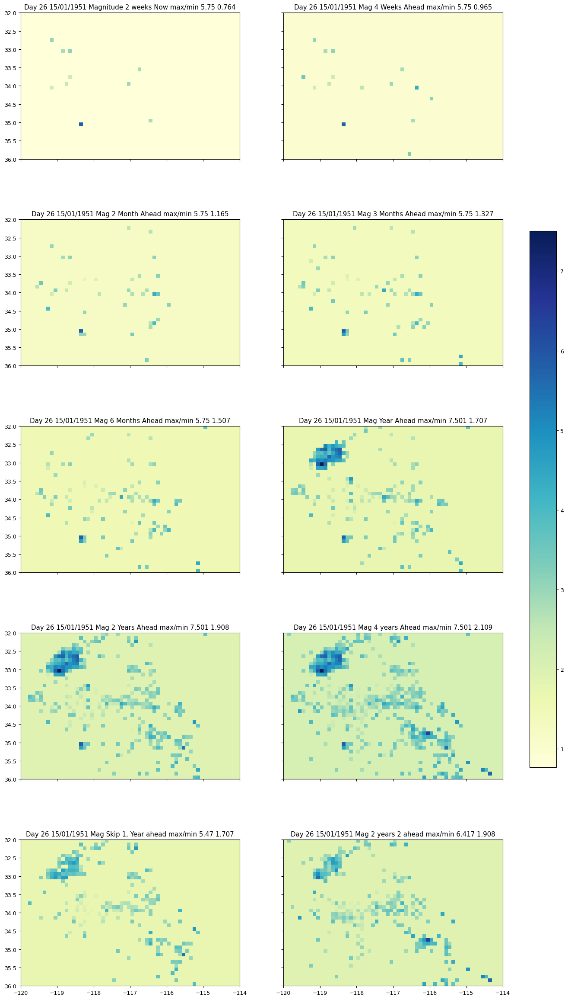

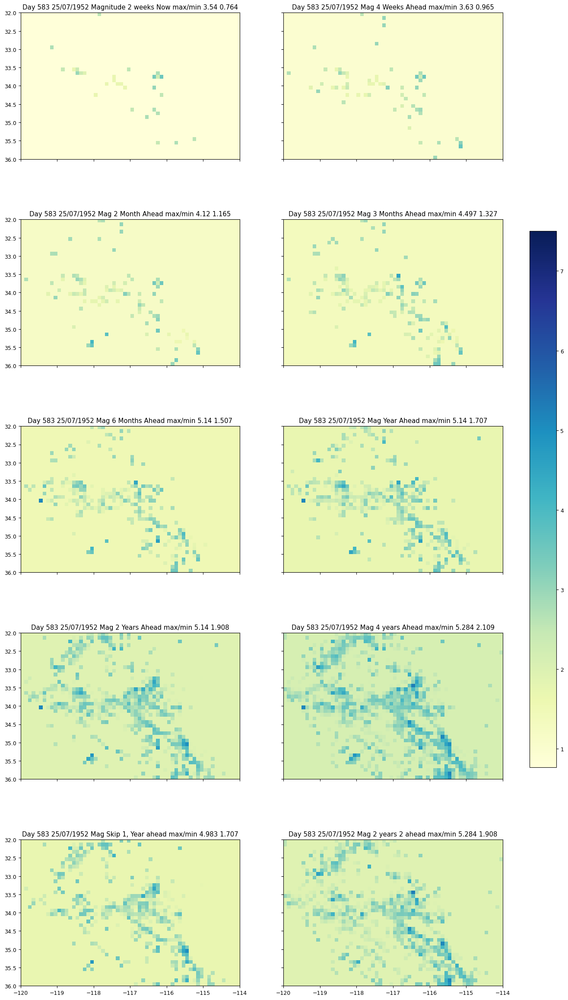

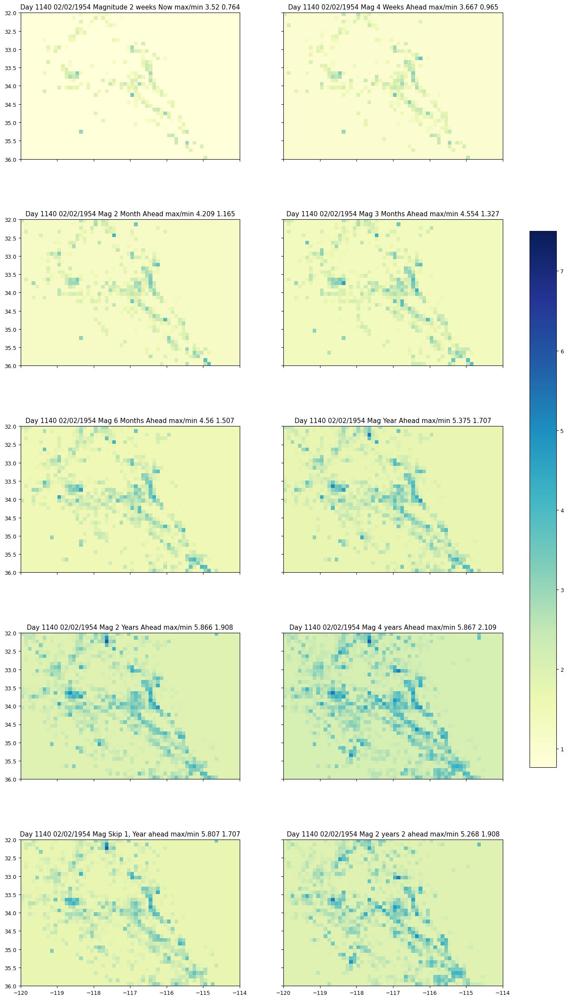

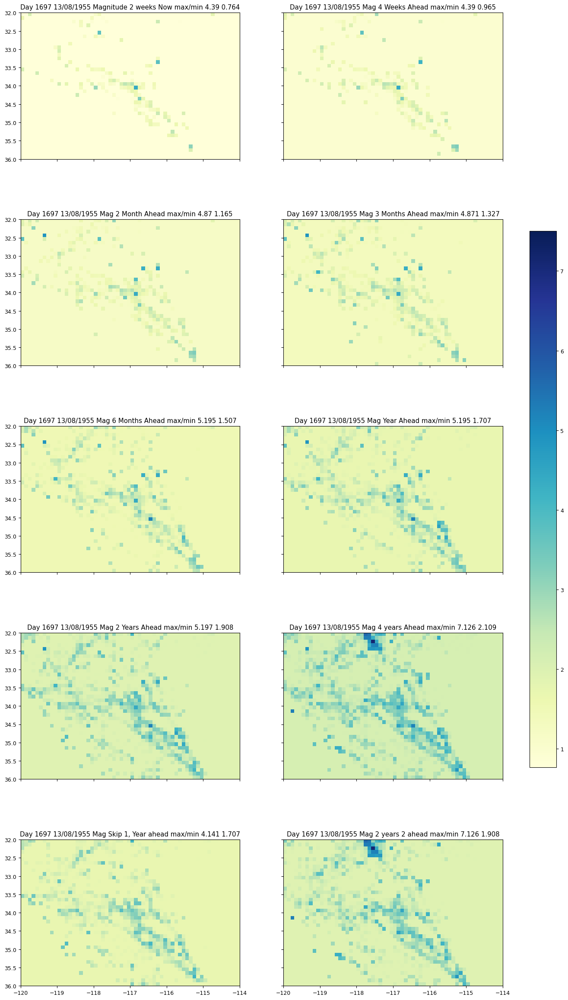

Full Energy Transformed Ranges 0.0 37.928707


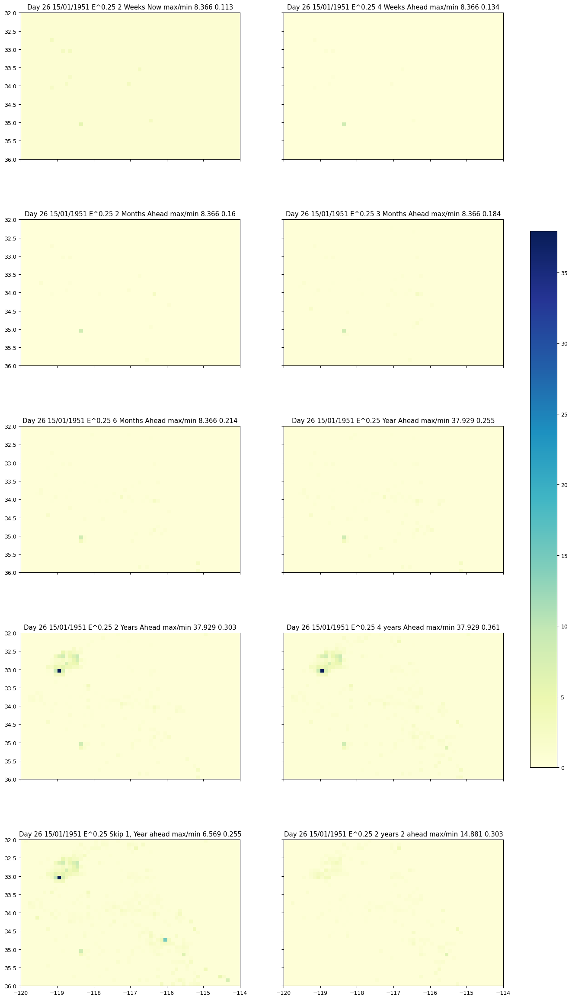

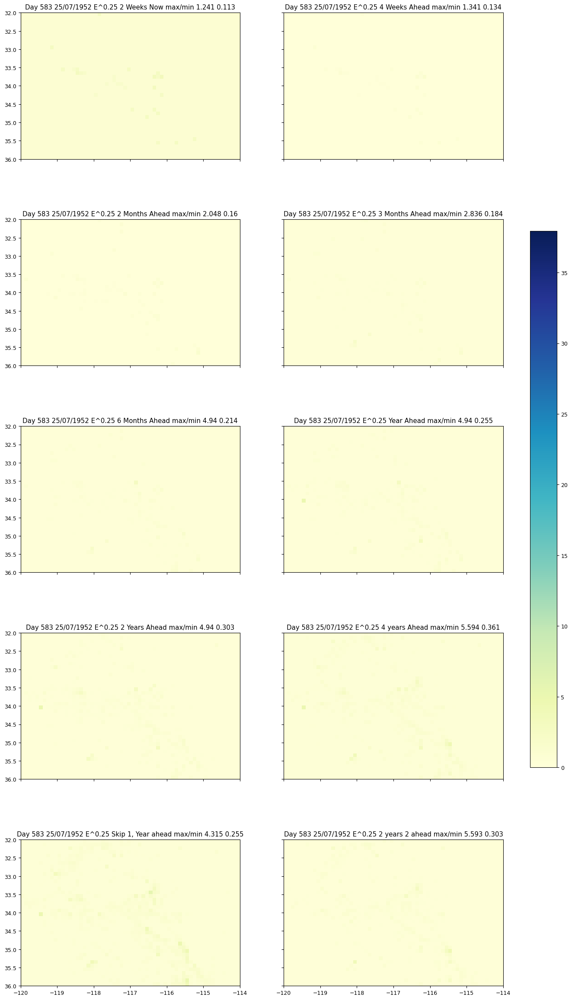

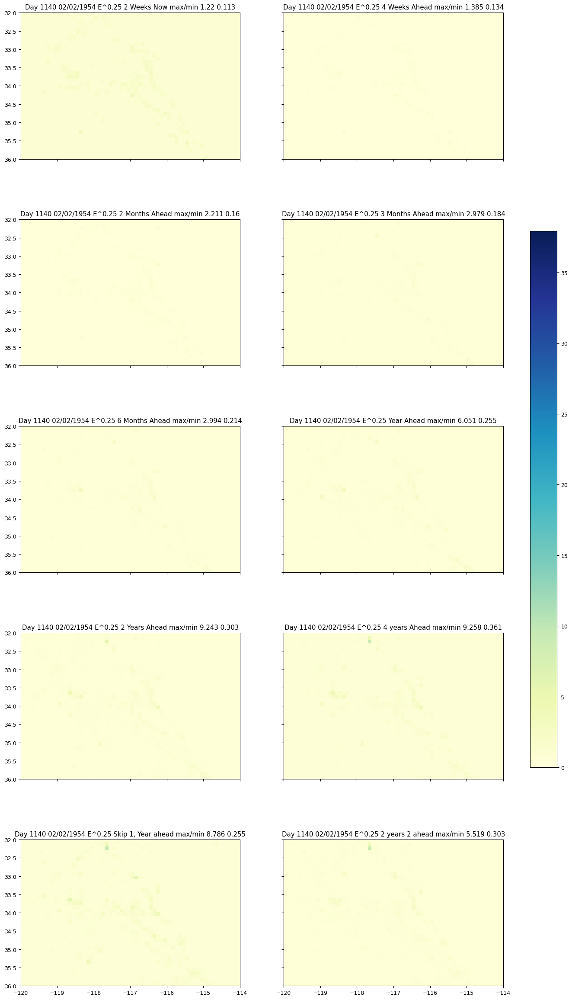

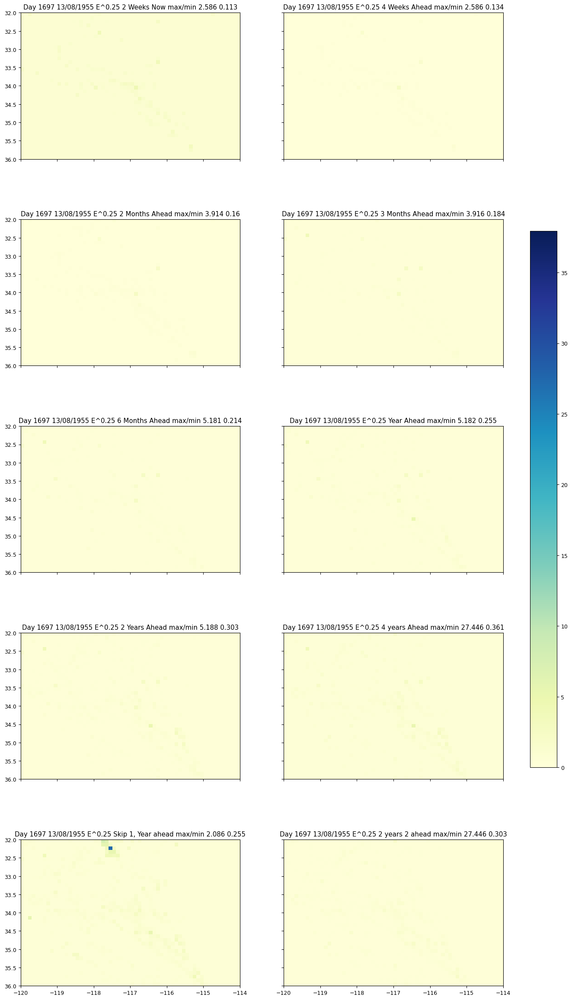

In [ ]:
from matplotlib import colors

def plotimages(fullmin, fullmax, Array,Titles,nrows,ncols):
  usedcolormap = "YlGnBu"
  plt.rcParams["figure.figsize"] = [16,6*nrows]
  figure, axs = plt.subplots(nrows=nrows, ncols=ncols, squeeze=False)
  iplot=0
  images = []
  norm = colors.Normalize(vmin=fullmin, vmax=fullmax)
  for jplot in range(0,nrows):
    for kplot in range (0,ncols):
      eachplt = axs[jplot,kplot]
      if FFFFpre.MapLocation:
        Plotit = np.zeros(FFFFpre.OriginalNloc, dtype = np.float32)
        for jloc in range (0,FFFFpre.Nloc):
          Plotit[FFFFpre.LookupLocations[jloc]] = Array[iplot][jloc]
          TwoDArray = np.reshape(Plotit,(40,60))
      else:
        TwoDArray = np.reshape(Array[iplot],(40,60))
      extent = (-120,-114, 36,32)
      images.append(eachplt.imshow(TwoDArray, cmap=usedcolormap, norm=norm,extent=extent))
      eachplt.label_outer()
      eachplt.set_title(Titles[iplot])
      iplot +=1
  figure.colorbar(images[0], ax=axs, orientation='vertical', fraction=.05)
  plt.show()

def ProduceInitialEarthquakePlots(FFFFcfg):
# FFFFpre.DynamicPropertyTimeSeries and FFFFpre.CalculatedTimeSeries are dimensione by time 0 ...Num_Time-1
# FFFFpre.DynamicPropertyTimeSeries holds values upto and including that time
# FFFFpre.CalculatedTimeSeries holds values STARTING at that time
# Plot magnitudes first and them chosen Energy power

  FFFFeq = FFFFcfg.FFFFeq
  FFFFpre = FFFFcfg.FFFFpre
  for transformedpointer in range(0,2):
    localplot1=0
    localplot2=FFFFpre.NumTimeSeriesCalculatedBasic
    if transformedpointer == 0:
      fullmin = np.nanmin(FFFFpre.CalculatedTimeSeries[:,:,0:FFFFpre.NumTimeSeriesCalculatedBasic])
      fullmax = np.nanmax(FFFFpre.CalculatedTimeSeries[:,:,0:FFFFpre.NumTimeSeriesCalculatedBasic])
      fullmin = min(fullmin,np.nanmin(FFFFpre.DynamicPropertyTimeSeries[:,:,0]))
      fullmax = max(fullmax,np.nanmax(FFFFpre.DynamicPropertyTimeSeries[:,:,0]))
      print('Full Magnitude Ranges ' + str(fullmin) + ' ' + str(fullmax))
    else:
      localplot1=FFFFpre.NumTimeSeriesCalculatedBasic
      localplot2=FFFFpre.NumTimeSeriesCalculated
      fullmin = np.nanmin(FFFFpre.CalculatedTimeSeries[:,:,localplot1:localplot2])
      fullmax = np.nanmax(FFFFpre.CalculatedTimeSeries[:,:,localplot1:localplot2])
      print('Full Energy Transformed Ranges ' + str(fullmin) + ' ' + str(fullmax))
    FFFFcfg.Num_Seq = FFFFpre.NumberofTimeunits-FFFFcfg.Tseq
    dayindexmax = FFFFcfg.Num_Seq-FFFFeq.Plottingdelay
    Numdates = 4
    denom = 1.0/np.float64(Numdates-1)
    for plotdays in range(0,Numdates):
      dayindexvalue = math.floor(0.1 + (plotdays*dayindexmax)*denom)
      if dayindexvalue < 0:
        dayindexvalue = 0
      if dayindexvalue > dayindexmax:
        dayindexvalue = dayindexmax
      dayindexvalue += FFFFcfg.Tseq
      InputImages =[]
      InputTitles =[]
      InputImages.append(FFFFpre.DynamicPropertyTimeSeries[dayindexvalue,:,0])
      ActualDate = FFFFcfg.InitialDate + timedelta(days=dayindexvalue)
      if transformedpointer == 0:
        localmax1 = FFFFpre.DynamicPropertyTimeSeries[dayindexvalue,:,0].max()
        localmin1 = FFFFpre.DynamicPropertyTimeSeries[dayindexvalue,:,0].min()
        InputTitles.append('Day ' +str(dayindexvalue) + ' ' + ActualDate.strftime("%d/%m/%Y") + ' ' + FFFFpre.InputPropertyNames[FFFFpre.NpropperTimeStatic] + ' max/min '
        + str(round(localmax1,3)) + ' ' + str(round(localmin1,3)))

      for localplot in range(localplot1,localplot2):
        localmax1 = FFFFpre.CalculatedTimeSeries[dayindexvalue,:,localplot].max()
        localmin1 = FFFFpre.CalculatedTimeSeries[dayindexvalue,:,localplot].min()
        InputImages.append(FFFFpre.CalculatedTimeSeries[dayindexvalue,:,localplot])
        InputTitles.append('Day ' +str(dayindexvalue) + ' ' + ActualDate.strftime("%d/%m/%Y") + ' ' + FFFFpre.NamespredCalculated[localplot] + ' max/min '
          + str(round(localmax1,3)) + ' ' + str(round(localmin1,3)))
      plotimages(fullmin, fullmax, InputImages,InputTitles,5,2) # Ten plots fixed

if FFFFcfg.Earthquake:
  ProduceInitialEarthquakePlots(FFFFcfg)


### Read Hydrology Data

In [ ]:

# Read FFFFcfg.Hydrology
def ReadHydrologyData(FFFFcfg):
  FFFFpre = FFFFcfg.FFFFpre

  PreparedDataFile = FFFFcfg.APPLDIR + '/data.tar.bz2'
  !ls /content/gdrive/'My Drive'/'Colab Datasets'/FFFFcfg.Hydrology
  !tar xjf /content/gdrive/'My Drive'/'Colab Datasets'/FFFFcfg.Hydrology/data.tar.bz2 -C /content/gdrive/'My Drive'/'Colab Datasets'/FFFFcfg.Hydrology
  import json

  RawInputStaticProps = np.load(FFFFcfg.APPLDIR + '/FFFFpre.BasicInputStaticProps.npy', allow_pickle = True)
  RawInputTimeSeries = np.load(FFFFcfg.APPLDIR + '/FFFFpre.BasicInputTimeSeries.npy', allow_pickle = True)
  NuminputSeries = RawInputTimeSeries.shape[1]
  NuminputProps = RawInputStaticProps.shape[1]
  print('Input FFFFcfg.Hydrology Shapes ' + str(RawInputTimeSeries.shape) + ' ' +str(RawInputStaticProps.shape))

  with open(FFFFcfg.APPLDIR + '/metadata.json', 'r') as f:
    metadata = json.load(f)
  FFFFpre.Nloc = metadata['FFFFpre.Nloc']
  TimeSeriesmetadata = metadata['FFFFpre.BasicInputTimeSeries']
  FFFFcfg.InitialDate = datetime.strptime(TimeSeriesmetadata['initial_date'],'%Y-%m-%dT%H:%M:%S.%f000')
  FFFFcfg.FinalDate = datetime.strptime(TimeSeriesmetadata['end_date'],'%Y-%m-%dT%H:%M:%S.%f000')
  FFFFpre.NumberofTimeunits = (FFFFcfg.FinalDate-FFFFcfg.InitialDate).days + 1
  print(FFFFcfg.InitialDate.strftime("%d/%m/%Y") + ' To ' + FFFFcfg.FinalDate.strftime("%d/%m/%Y")+ ' days ' + str(FFFFpre.NumberofTimeunits) + ' Locations ' + str(FFFFpre.Nloc))
  TimeSeriesLabels = TimeSeriesmetadata['fields']
  print(TimeSeriesLabels)
  StaticPropsmetadata = metadata['FFFFpre.BasicInputStaticProps']
  RawLabels = StaticPropsmetadata['fields']
  print(RawLabels)
  FFFFpre.BasicInputTimeSeries = np.delete(RawInputTimeSeries,[0,1],1)
  FFFFpre.BasicInputTimeSeries = np.reshape(FFFFpre.BasicInputTimeSeries,[FFFFpre.NumberofTimeunits,FFFFpre.Nloc,NuminputSeries-2])
  FFFFpre.BasicInputStaticProps = np.delete(RawInputStaticProps,[0,12,21,22],1)
  StaticLabels = np.delete(RawLabels,[0,12,21,22],0)

  FFFFpre.Num_Time = FFFFpre.NumberofTimeunits
  FFFFpre.NFIPS = FFFFpre.Nloc
  FFFFpre.Locationfips = np.empty(FFFFpre.NFIPS, dtype=int) # integer version of FIPs/gauge_id
  FFFFpre.Locationcolumns = [] # String version of FIPS/gauge_id
  FFFFpre.FIPSintegerlookup = {}
  FFFFpre.FIPSstringlookup = {}
  FFFFpre.Locationname = ['Empty'] * FFFFpre.NFIPS
  FFFFpre.Locationstate = [' '] * FFFFpre.NFIPS
  FFFFpre.Locationpopulation = np.ones(FFFFpre.NFIPS, dtype=int)
  gauge_idvalues = metadata['locs']
  placenames = metadata['loc_names']
  for iloc in range(0,FFFFpre.Nloc):
    fips = str(gauge_idvalues[iloc])
    FFFFpre.Locationfips[iloc] = int(fips)
    FFFFpre.Locationcolumns.append(fips)
    FFFFpre.FIPSintegerlookup[int(fips)] = iloc
    FFFFpre.FIPSstringlookup[fips] = iloc
    FFFFpre.Locationname[iloc] = placenames[iloc]

  FFFFcovid.CDSpecial = False
  FFFFpre.NpropperTimeDynamic = 6
  FFFFpre.NpropperTimeStatic = 27
  FFFFpre.NumpredbasicperTime = FFFFpre.NpropperTimeDynamic
  FFFFpre.NumpredFuturedperTime = FFFFpre.NumpredbasicperTime
  FFFFpre.NpropperTime = FFFFpre.NpropperTimeStatic + FFFFpre.NpropperTimeDynamic
  FFFFpre.InputPropertyNames = [' '] * FFFFpre.NpropperTime
  FFFFpre.Property_is_Intensive = np.full(FFFFpre.NpropperTime, True, dtype =bool)
  for iprop in range(0, FFFFpre.NpropperTimeStatic):
    FFFFpre.InputPropertyNames[iprop] = StaticLabels[iprop]
  for iprop in range(0, FFFFpre.NpropperTimeDynamic):
    FFFFpre.InputPropertyNames[iprop+FFFFpre.NpropperTimeStatic] = TimeSeriesLabels[iprop+2]
  Num_Extensive = 0

  FFFFcfg.ScaleProperties = True
  FFFFcfg.GenerateFutures = False
  FFFFcfg.GenerateSequences = True
  FFFFcfg.PredictionsfromInputs = True
  FFFFcfg.ConvertDynamicPredictedQuantity = False

  FFFFcfg.UseFutures = False
  FFFFcfg.PopulationNorm = False
  FFFFpre.DynamicPropertyTimeSeries = np.empty_like(FFFFpre.BasicInputTimeSeries, dtype = np.float32)
  CountNaN = np.zeros(FFFFpre.NpropperTimeDynamic, dtype=int)
  for itime in range(0,FFFFpre.NumberofTimeunits):
    for iloc in range(0,FFFFpre.Nloc):
      for iprop in range(0,FFFFpre.NpropperTimeDynamic):
        localval = FFFFpre.BasicInputTimeSeries[itime,iloc,iprop]
        if np.math.isnan(localval):
          localval = FFFFcfg.NaN
          CountNaN[iprop] +=1
        else:
          if (localval < 0.0) and (iprop==5):
            localval = FFFFcfg.NaN
            CountNaN[iprop] +=1
        FFFFpre.DynamicPropertyTimeSeries[itime,iloc,iprop] = localval
  print(startbold+startred+'Input NaN values ' + resetfonts)
  for iprop in range(0,FFFFpre.NpropperTimeDynamic):
    print(FFFFpre.InputPropertyNames[iprop+FFFFpre.NpropperTimeStatic] + ' ' + str(CountNaN[iprop]))

  FFFFpre.BasicInputTimeSeries = None
  if FFFFcfg.GarbageCollect:
    gc.collect()


# Overall Parameters set for FFFFcfg.Hydrology
  FFFFcfg.SymbolicWindows = True
  FFFFcfg.Tseq = 21
  FFFFcfg.Plotsplitsize = 6

<IPython.core.display.Javascript object>

In [ ]:
if FFFFcfg.Hydrology:
  ReadHydrologyData(FFFFcfg)

<IPython.core.display.Javascript object>

### Read April Nov 2021, May 2022, 7day Covid Data

In [ ]:
def ReadApril2021CovidData(FFFFcfg):
  FFFFcovid = FFFFcfg.FFFFcovid
  FFFFpre = FFFFcfg.FFFFpre

  FFFFcfg.Dropearlydata = 40 # 3 more than needed by covariates so as to get "round number of days"
  if FFFFcovid.ReadNov2021Covid:
    FFFFcfg.Dropearlydata = 0
  if FFFFcovid.ReadMay2022Covid:
    FFFFcfg.Dropearlydata = 40 # XXX
  if FFFFcovid.Read7dayCovid:
    FFFFcfg.Dropearlydata = 0
  FFFFcovid.NIHCovariates = True
  FFFFcovid.UseOLDCovariates = False
  FFFFpre.LengthFutures = 0

  if FFFFcovid.ReadNov2021Covid:
# Set FFFFcfg.Dropearlydata to any number of days >= 0
    FFFFcfg.InitialDate = datetime(2020,2,29) + timedelta(days=FFFFcfg.Dropearlydata)
    FFFFcfg.FinalDate = datetime(2021,11,29)

# Or set InitialData >= actual Date and FFFFcfg.FinalDate
    FFFFcfg.Dropearlydata = (FFFFcfg.InitialDate - datetime(2020,2,29)).days
    if FFFFcfg.Dropearlydata < 0:
      printexit('Illegal start date ' + str(FFFFcfg.Dropearlydata))
    FFFFpre.NumberofTimeunits = (FFFFcfg.FinalDate-FFFFcfg.InitialDate).days + 1
    print("Total number of Days November 2021 Dataset " + str(FFFFpre.NumberofTimeunits) + ' Dropping at start ' + str(FFFFcfg.Dropearlydata))

    DATASETDIR = FFFFcfg.APPLDIR + '/CovidNovember2021'
    CasesFile = DATASETDIR + '/' + 'Cases.csv'
    DeathsFile = DATASETDIR + '/' + 'Deaths.csv'

  elif FFFFcovid.ReadMay2022Covid:
    if FFFFcovid.Read7dayCovid:
      FFFFcfg.InitialDate = datetime(2020,2,29) + timedelta(days=FFFFcfg.Dropearlydata)
      FFFFcfg.FinalDate = datetime(2022,2,28)
      FFFFcfg.FinalDate = datetime(2021,11,29)
      FFFFcovid.RootCasesDeaths = False
      FFFFpre.NumberofTimeunits = (FFFFcfg.FinalDate-FFFFcfg.InitialDate).days + 1
      print("Total number of Days 7 day Dataset " + str(FFFFpre.NumberofTimeunits) + ' Dropping at start ' + str(FFFFcfg.Dropearlydata))

      DATASETDIR = FFFFcfg.APPLDIR + '/Covid7Day/2021-11-29'
      CasesFile = DATASETDIR + '/' + 'Cases.csv'
      DeathsFile = DATASETDIR + '/' + 'Deaths.csv'

    else: # May 2022 Data
  # Set FFFFcfg.Dropearlydata to any number of days >= 0
      FFFFcfg.InitialDate = datetime(2020,1,22) + timedelta(days=FFFFcfg.Dropearlydata)
      FFFFcfg.FinalDate = datetime(2022,5,15) # In current code this is minmum final date between cases and deaths
  # Or set InitialData >= actual Initial Date and FFFFcfg.FinalDate
  # Initial Date must be >= datetime(2020,1,22) and final date must be <= datetime(2022,5,15)
      FFFFcfg.Dropearlydata = (FFFFcfg.InitialDate - datetime(2020,1,22)).days
      if FFFFcfg.Dropearlydata < 0:
        printexit('Illegal start date ' + str(FFFFcfg.Dropearlydata))
      FFFFpre.NumberofTimeunits = (FFFFcfg.FinalDate-FFFFcfg.InitialDate).days + 1
      print("Total number of Days May 2022 Dataset " + str(FFFFpre.NumberofTimeunits) + ' Dropping at start ' + str(FFFFcfg.Dropearlydata))

      DATASETDIR = FFFFcfg.APPLDIR + '/CovidMay17-2022'
      CasesFile = DATASETDIR + '/' + 'Cases.csv'
      DeathsFile = DATASETDIR + '/' + 'Deaths.csv'

  else: # April2021 Covid Data
    FFFFcfg.InitialDate = datetime(2020,1,22) + timedelta(days=FFFFcfg.Dropearlydata)
    FFFFcfg.FinalDate = datetime(2021,4,14)
    FFFFpre.NumberofTimeunits = (FFFFcfg.FinalDate-FFFFcfg.InitialDate).days + 1
    print("Total number of Days April 2021 Dataset " + str(FFFFpre.NumberofTimeunits) + ' Dropping at start ' + str(FFFFcfg.Dropearlydata))

    DATASETDIR = FFFFcfg.APPLDIR + '/CovidApril14-2021'

    CasesFile = DATASETDIR + '/' + 'US_daily_cumulative_cases_April14.csv'
    DeathsFile = DATASETDIR + '/' + 'US_daily_cumulative_deaths_April14.csv'

  LocationdataFile = DATASETDIR + '/Population.csv'
  VotingdataFile = DATASETDIR + '/2020votes.csv'
  AlaskaVotingdataFile = DATASETDIR + '/Alaskavoting2016.csv'

  FFFFpre.Nloc = 3142
  FFFFpre.NFIPS = 3142

# Set up location information
  FFFFpre.Num_Time = FFFFpre.NumberofTimeunits
  FFFFpre.Locationfips = np.empty(FFFFpre.NFIPS, dtype=int) # integer version of FIPs
  FFFFpre.Locationcolumns = [] # String version of FIPS
  FFFFpre.FIPSintegerlookup = {}
  FFFFpre.FIPSstringlookup = {}
  FFFFpre.BasicInputTimeSeries = np.empty([FFFFpre.Num_Time,FFFFpre.Nloc,2],dtype = np.float32)

# Read in  cases Data into FFFFpre.BasicInputTimeSeries
  with open(CasesFile, 'r') as read_obj:
      csv_reader = reader(read_obj)
      header = next(csv_reader)
      Ftype = header[0]
      if Ftype != 'FIPS' and Ftype != 'casrn':
        printexit('EXIT: Wrong file type Cases ' + Ftype)
      hformat = '%Y-%m-%d'
      TargetDate = datetime.strptime(header[1], hformat)
      if (FFFFcfg.InitialDate - TargetDate).days != FFFFcfg.Dropearlydata:
        printexit('Incorrect cases initial date ' + str(FFFFcfg.Dropearlydata) + ' '  + str(TargetDate) + ' ' + str(FFFFcfg.InitialDate))

      iloc = 0
      for nextrow in csv_reader:
        if (len(nextrow)< FFFFpre.NumberofTimeunits + 1 + FFFFcfg.Dropearlydata):
          printexit('EXIT: Incorrect row length Cases ' + str(iloc) + ' ' +str(len(nextrow)))
        # skip first entry
        localfips = nextrow[0]
        FFFFpre.Locationcolumns.append(localfips)
        FFFFpre.Locationfips[iloc] = int(localfips)
        FFFFpre.FIPSintegerlookup[int(localfips)] = iloc
        FFFFpre.FIPSstringlookup[localfips] = iloc
        for itime in range(0, FFFFpre.NumberofTimeunits):
          FFFFpre.BasicInputTimeSeries[itime,iloc,0] = nextrow[itime + 1 + FFFFcfg.Dropearlydata]
          if FFFFcfg.Dropearlydata > 0:
            floatlast = np.float(nextrow[FFFFcfg.Dropearlydata])
            FFFFpre.BasicInputTimeSeries[itime,iloc,0] = FFFFpre.BasicInputTimeSeries[itime,iloc,0] - floatlast
        iloc += 1
# End Reading in cases data

  if iloc != FFFFpre.Nloc:
          printexit('EXIT Inconsistent location lengths Cases ' +str(iloc) + ' ' + str(FFFFpre.Nloc))
  print('Read Cases data locations ' + str(FFFFpre.Nloc) + ' Time Steps ' + str(FFFFpre.Num_Time))

# Read in deaths Data into FFFFpre.BasicInputTimeSeries
  with open(DeathsFile, 'r') as read_obj:
      csv_reader = reader(read_obj)
      header = next(csv_reader)
      Ftype = header[0]
      if Ftype != 'FIPS' and Ftype != 'casrn':
        printexit('EXIT: Wrong file type Deaths ' + Ftype)
      hformat = '%Y-%m-%d'
      TargetDate = datetime.strptime(header[1], hformat)
      if (FFFFcfg.InitialDate - TargetDate).days != FFFFcfg.Dropearlydata:
        printexit('Incorrect deaths initial date ' + str(FFFFcfg.Dropearlydata) + ' '  + str(TargetDate) + ' ' + str(FFFFcfg.InitialDate))

      iloc = 0
      for nextrow in csv_reader:
        if (len(nextrow)<FFFFpre.NumberofTimeunits + 1 + FFFFcfg.Dropearlydata):
          printexit('EXIT: Incorrect row length Deaths ' + str(iloc) + ' ' +str(len(nextrow)))
        localfips = nextrow[0]
        if (FFFFpre.Locationfips[iloc] != int(localfips)):
          printexit('EXIT: Unexpected FIPS Deaths ' + localfips + ' ' +str(FFFFpre.Locationfips[iloc]))
        for itime in range(0, FFFFpre.NumberofTimeunits):
          FFFFpre.BasicInputTimeSeries[itime,iloc,1] = np.float(nextrow[itime + 1 + FFFFcfg.Dropearlydata])
          if FFFFcfg.Dropearlydata > 0:
            floatlast = np.float(nextrow[FFFFcfg.Dropearlydata])
            FFFFpre.BasicInputTimeSeries[itime,iloc,1] = FFFFpre.BasicInputTimeSeries[itime,iloc,1] - floatlast
        iloc += 1
# End Reading in deaths data

  if iloc != FFFFpre.Nloc:
    printexit('EXIT Inconsistent location lengths ' +str(iloc) + ' ' + str(FFFFpre.Nloc))
  print('Read Deaths data locations ' + str(FFFFpre.Nloc) + ' Time Steps ' + str(FFFFpre.Num_Time))

  FFFFpre.Locationname = ['Empty'] * FFFFpre.NFIPS
  FFFFpre.Locationstate = ['Empty'] * FFFFpre.NFIPS
  FFFFpre.Locationpopulation = np.empty(FFFFpre.NFIPS, dtype=int)
  with open(LocationdataFile, 'r', encoding='latin1') as read_obj:
      csv_reader = reader(read_obj)
      header = next(csv_reader)
      Ftype = header[0]
      if Ftype != 'FIPS':
        printexit('EXIT: Wrong file type Prop Data ' + Ftype)

      iloc = 0
      for nextrow in csv_reader:
        localfips = int(nextrow[0])
        if localfips in FFFFpre.FIPSintegerlookup.keys():
          jloc = FFFFpre.FIPSintegerlookup[localfips]
          FFFFpre.Locationname[jloc] = nextrow[4]
          FFFFpre.Locationstate[jloc] = nextrow[3]
          FFFFpre.Locationpopulation[jloc] = int(nextrow[2])
          iloc += 1 # just counting lines
        else:
          printexit('EXIT Inconsistent FIPS ' +str(iloc) + ' ' + str(localfips))
# END setting FFFFpre.NFIPS location properties

  FFFFcovid.DemVoting = np.full(FFFFpre.NFIPS, -1.0, dtype=np.float32)
  FFFFcovid.RepVoting = np.full(FFFFpre.NFIPS, -1.0, dtype=np.float32)
  with open(VotingdataFile, 'r', encoding='latin1') as read_obj:
      csv_reader = reader(read_obj)
      header = next(csv_reader)
      Ftype = header[0]
      if Ftype != 'state_name':
        printexit('EXIT: Wrong file type Voting Data ' + Ftype)

      iloc = 0
      for nextrow in csv_reader:
        localfips = int(nextrow[1])
        if localfips > 2900 and localfips < 2941: # Alaska not useful
          continue
        if localfips in FFFFpre.FIPSintegerlookup.keys():
          jloc = FFFFpre.FIPSintegerlookup[localfips]
          if FFFFcovid.DemVoting[jloc] >= 0.0:
             printexit('EXIT Double Setting of FIPS ' +str(iloc) + ' ' + str(localfips))
          FFFFcovid.DemVoting[jloc] = nextrow[8]
          FFFFcovid.RepVoting[jloc] = nextrow[7]
          iloc += 1 # just counting lines
        else:
          printexit('EXIT Inconsistent FIPS ' +str(iloc) + ' ' + str(localfips))

  with open(AlaskaVotingdataFile, 'r',encoding='utf-8-sig') as read_obj: # remove ufeff
      csv_reader = reader(read_obj)
      header = next(csv_reader)
      Ftype = header[0]
      if Ftype != 'SpecialAlaska':
        printexit('EXIT: Wrong file type Alaska Voting Data ' + Ftype)

      iloc = 0
      for nextrow in csv_reader:
        localfips = int(nextrow[1])
        if localfips in FFFFpre.FIPSintegerlookup.keys():
          jloc = FFFFpre.FIPSintegerlookup[localfips]
          if FFFFcovid.DemVoting[jloc] >= 0.0:
             printexit('EXIT Double Setting of FIPS ' +str(iloc) + ' ' + str(localfips))
          FFFFcovid.DemVoting[jloc] = float(nextrow[2]) * 42.77/36.5
          FFFFcovid.RepVoting[jloc] = float(nextrow[3]) * 52.83/51.3
          iloc += 1 # just counting lines
        else:
          printexit('EXIT Inconsistent FIPS ' +str(iloc) + ' ' + str(localfips))

  for iloc in range(0,FFFFpre.NFIPS):
    if FFFFcovid.DemVoting[iloc] >= 0.0:
      continue
    print(str(iloc) + ' Missing Votes ' + str(FFFFpre.Locationfips[iloc]) + ' ' + FFFFpre.Locationname[iloc] + ' ' + FFFFpre.Locationstate[iloc] + ' pop ' + str( FFFFpre.Locationpopulation[iloc]))
    FFFFcovid.DemVoting[iloc] = 0.5
    FFFFcovid.RepVoting[iloc] = 0.5

# Set Static Properties of the FFFFpre.Nloc studied locations
# Order is Static, Dynamic, Cases, Deaths
# Voting added as 13th covariate
# Add fully vaccinated in November 2021
  FFFFpre.NpropperTimeDynamic = 13
  if FFFFcovid.ReadNov2021Covid:
    FFFFpre.NpropperTimeDynamic = 14
  if FFFFcovid.ReadMay2022Covid:
    FFFFpre.NpropperTimeDynamic = 15
    if FFFFcovid.Read7dayCovid:
      FFFFpre.NpropperTimeDynamic = 7
  FFFFpre.NpropperTimeStatic = 0

  FFFFpre.NpropperTime = FFFFpre.NpropperTimeStatic + FFFFpre.NpropperTimeDynamic + 2
  FFFFpre.InputPropertyNames = [] * FFFFpre.NpropperTime
  FFFFpre.Property_is_Intensive = np.full(FFFFpre.NpropperTime, True, dtype =bool)
  print('Initial Date ' + str(FFFFcfg.InitialDate) + ' Final Date '  + str(FFFFcfg.FinalDate) + ' FFFFpre.NpropperTimeStatic ' +str(FFFFpre.NpropperTimeStatic) + ' FFFFpre.NpropperTimeDynamic ' +str(FFFFpre.NpropperTimeDynamic))

<IPython.core.display.Javascript object>

In [ ]:
if FFFFcovid.ReadApril2021Covid:
  ReadApril2021CovidData(FFFFcfg)


<IPython.core.display.Javascript object>

### Read January 2021 Covid Data

In [ ]:
def ReadJan2021CovidData(FFFFcfg):
  FFFFcovid = FFFFcfg.FFFFcovid
  FFFFpre = FFFFcfg.FFFFpre

  FFFFcfg.Dropearlydata = 37
  FFFFcovid.NIHCovariates = True
  FFFFcovid.UseOLDCovariates = False

  FFFFcfg.InitialDate = datetime(2020,1,22) + timedelta(days=FFFFcfg.Dropearlydata)
  FFFFcfg.FinalDate = datetime(2021,1,26)
  FFFFpre.NumberofTimeunits = (FFFFcfg.FinalDate-FFFFcfg.InitialDate).days + 1
  print("Total number of Days January 2021 Dataset " + str(FFFFpre.NumberofTimeunits) + ' Dropping at start ' + str(FFFFcfg.Dropearlydata))

  DATASETDIR = FFFFcfg.APPLDIR + '/January2021'

  CasesFile = DATASETDIR + '/' + 'US_daily_cumulative_cases.csv'
  DeathsFile = DATASETDIR + '/' + 'US_daily_cumulative_deaths.csv'
  LocationdataFile = DATASETDIR + '/Population.csv'

  FFFFpre.Nloc = 3142
  FFFFpre.NFIPS = 3142

# Set up location information
  FFFFpre.Num_Time = FFFFpre.NumberofTimeunits
  FFFFpre.Locationfips = np.empty(FFFFpre.NFIPS, dtype=int) # integer version of FIPs
  FFFFpre.Locationcolumns = [] # String version of FIPS
  FFFFpre.FIPSintegerlookup = {}
  FFFFpre.FIPSstringlookup = {}
  FFFFpre.BasicInputTimeSeries = np.empty([FFFFpre.Num_Time,FFFFpre.Nloc,2],dtype = np.float32)

# Read in  cases Data into FFFFpre.BasicInputTimeSeries
  with open(CasesFile, 'r') as read_obj:
      csv_reader = reader(read_obj)
      header = next(csv_reader)
      Ftype = header[0]
      if Ftype != 'FIPS':
        printexit('EXIT: Wrong file type Cases ' + Ftype)

      iloc = 0
      for nextrow in csv_reader:
        if (len(nextrow)< FFFFpre.NumberofTimeunits + 1 + FFFFcfg.Dropearlydata):
          printexit('EXIT: Incorrect row length Cases ' + str(iloc) + ' ' +str(len(nextrow)))
        # skip first entry
        localfips = nextrow[0]
        FFFFpre.Locationcolumns.append(localfips)
        FFFFpre.Locationfips[iloc] = int(localfips)
        FFFFpre.FIPSintegerlookup[int(localfips)] = iloc
        FFFFpre.FIPSstringlookup[localfips] = iloc
        for itime in range(0, FFFFpre.NumberofTimeunits):
          FFFFpre.BasicInputTimeSeries[itime,iloc,0] = nextrow[itime + 1 + FFFFcfg.Dropearlydata]
          if FFFFcfg.Dropearlydata > 0:
            floatlast = np.float(nextrow[FFFFcfg.Dropearlydata])
            FFFFpre.BasicInputTimeSeries[itime,iloc,0] = FFFFpre.BasicInputTimeSeries[itime,iloc,0] - floatlast
        iloc += 1
# End Reading in cases data

  if iloc != FFFFpre.Nloc:
          printexit('EXIT Inconsistent location lengths Cases ' +str(iloc) + ' ' + str(FFFFpre.Nloc))
  print('Read Cases data locations ' + str(FFFFpre.Nloc) + ' Time Steps ' + str(FFFFpre.Num_Time))

# Read in deaths Data into FFFFpre.BasicInputTimeSeries
  with open(DeathsFile, 'r') as read_obj:
      csv_reader = reader(read_obj)
      header = next(csv_reader)
      Ftype = header[0]
      if Ftype != 'FIPS':
        printexit('EXIT: Wrong file type Deaths ' + Ftype)

      iloc = 0
      for nextrow in csv_reader:
        if (len(nextrow)<FFFFpre.NumberofTimeunits + 1 + FFFFcfg.Dropearlydata):
          printexit('EXIT: Incorrect row length Deaths ' + str(iloc) + ' ' +str(len(nextrow)))
        localfips = nextrow[0]
        if (FFFFpre.Locationfips[iloc] != int(localfips)):
          printexit('EXIT: Unexpected FIPS Deaths ' + localfips + ' ' +str(FFFFpre.Locationfips[iloc]))
        for itime in range(0, FFFFpre.NumberofTimeunits):
          FFFFpre.BasicInputTimeSeries[itime,iloc,1] = nextrow[itime + 1 + FFFFcfg.Dropearlydata]
          if FFFFcfg.Dropearlydata > 0:
            floatlast = np.float(nextrow[FFFFcfg.Dropearlydata])
            FFFFpre.BasicInputTimeSeries[itime,iloc,1] = FFFFpre.BasicInputTimeSeries[itime,iloc,1] - floatlast
        iloc += 1
# End Reading in deaths data

  if iloc != FFFFpre.Nloc:
    printexit('EXIT Inconsistent location lengths ' +str(iloc) + ' ' + str(FFFFpre.Nloc))
  print('Read Deaths data locations ' + str(FFFFpre.Nloc) + ' Time Steps ' + str(FFFFpre.Num_Time))

  FFFFpre.Locationname = ['Empty'] * FFFFpre.NFIPS
  FFFFpre.Locationstate = ['Empty'] * FFFFpre.NFIPS
  FFFFpre.Locationpopulation = np.empty(FFFFpre.NFIPS, dtype=int)
  with open(LocationdataFile, 'r', encoding='latin1') as read_obj:
      csv_reader = reader(read_obj)
      header = next(csv_reader)
      Ftype = header[0]
      if Ftype != 'FIPS':
        printexit('EXIT: Wrong file type Prop Data ' + Ftype)

      iloc = 0
      for nextrow in csv_reader:
        localfips = int(nextrow[0])
        if localfips in FFFFpre.FIPSintegerlookup.keys():
          jloc = FFFFpre.FIPSintegerlookup[localfips]
          FFFFpre.Locationname[jloc] = nextrow[4]
          FFFFpre.Locationstate[jloc] = nextrow[3]
          FFFFpre.Locationpopulation[jloc] = int(nextrow[2])
          iloc += 1 # just counting lines
        else:
          printexit('EXIT Inconsistent FIPS ' +str(iloc) + ' ' + str(localfips))
# END setting FFFFpre.NFIPS location properties

# Set Static Properties of the FFFFpre.Nloc studied locations
# Order is Static, Dynamic, Cases, Deaths
  FFFFpre.NpropperTimeDynamic = 12
  FFFFpre.NpropperTimeStatic = 0

  FFFFpre.NpropperTime = FFFFpre.NpropperTimeStatic + FFFFpre.NpropperTimeDynamic + 2
  FFFFpre.InputPropertyNames = [' '] * FFFFpre.NpropperTime
  FFFFpre.Property_is_Intensive = np.full(FFFFpre.NpropperTime, True, dtype =bool)



# Finish this after NIH Covariate

<IPython.core.display.Javascript object>

In [ ]:
if FFFFcovid.ReadJan2021Covid:
  ReadJan2021CovidData(FFFFcfg)

<IPython.core.display.Javascript object>

### Read Data defining COVID problem August 2020 Dataset

In [ ]:
def ReadAugust2020CovidData(FFFFcfg):
  FFFFcovid = FFFFcfg.FFFFcovid
  FFFFpre = FFFFcfg.FFFFpre

  FFFFcfg.InitialDate = datetime(2020,1,22) + timedelta(days=FFFFcfg.Dropearlydata)
  FFFFcfg.FinalDate = datetime(2020,8,13)
  FFFFpre.NumberofTimeunits = (FFFFcfg.FinalDate-FFFFcfg.InitialDate).days + 1
  print("Total number of Days August Dataset " + str(FFFFpre.NumberofTimeunits) + ' Dropping at start ' + str(FFFFcfg.Dropearlydata))

  DATASETDIR = FFFFcfg.APPLDIR +'/MidAugust2020Data'

  CasesFile = DATASETDIR + '/' + 'covid-cases.csv'
  DeathsFile = DATASETDIR + '/' + 'covid-deaths.csv'
  CovariatesFile = DATASETDIR + '/' + 'PVI-31July2020.csv'
  if FFFFcovid.RereadMay2020 or FFFFcovid.UseOLDCovariates:
    CovariatesFile = DATASETDIR + '/' + 'Static_316USCities_Pop.csv'
  LocationdataFile = DATASETDIR + '/' + 'Static_316USCities_Pop.csv'

  FFFFpre.Nloc = 314
  FFFFpre.NFIPS = 316

if FFFFcovid.RereadMay2020:
  FFFFcfg.InitialDate = datetime(2020,1,22) + timedelta(days=FFFFcfg.Dropearlydata)
  FFFFcfg.FinalDate = datetime(2020,5,25)
  FFFFpre.NumberofTimeunits = (FFFFcfg.FinalDate-FFFFcfg.InitialDate).days + 1
  print("Total number of Days May Dataset " + str(FFFFpre.NumberofTimeunits)  + ' Dropping at start ' + str(FFFFcfg.Dropearlydata))

  DATASETDIR = FFFFcfg.APPLDIR +'/EndMay2020fromfiles'

  CasesFile = DATASETDIR + '/' + 'Covid19-cases-110USCities.csv'
  DeathsFile = DATASETDIR + '/' + 'Covid19-deaths-110USCities.csv'
  CovariatesFile = DATASETDIR + '/' + 'PVI-31July2020.csv'
  if FFFFcovid.UseOLDCovariates:
    CovariatesFile = DATASETDIR + '/' + 'Static_316USCities_Pop.csv'
  LocationdataFile = DATASETDIR + '/' + 'Static_316USCities_Pop.csv'

  FFFFpre.Nloc = 110
  FFFFpre.NFIPS = 112

if FFFFcovid.ReadAugust2020Covid or FFFFcovid.RereadMay2020:

# Set up location information
  FFFFpre.Num_Time = FFFFpre.NumberofTimeunits
  FFFFpre.Locationfips = np.empty(FFFFpre.NFIPS, dtype=int) # integer version of FIPs
  FFFFpre.Locationcolumns = [] # String version of FIPS
  FFFFpre.FIPSintegerlookup = {}
  FFFFpre.FIPSstringlookup = {}
  FFFFpre.BasicInputTimeSeries = np.empty([FFFFpre.Num_Time,FFFFpre.Nloc,2],dtype = np.float32)

# Read in  cases Data into FFFFpre.BasicInputTimeSeries
  with open(CasesFile, 'r') as read_obj:
      csv_reader = reader(read_obj)
      header = next(csv_reader)
      Ftype = header[0]
      if Ftype != 'FIPS':
        printexit('EXIT: Wrong file type ' + Ftype)

      iloc = 0

      for nextrow in csv_reader:
        if (len(nextrow)!=FFFFpre.NumberofTimeunits + 1 + FFFFcfg.Dropearlydata):
          printexit('EXIT: Incorrect row length Cases ' + str(iloc) + ' ' +str(len(nextrow)))
        localfips = nextrow[0]
        FFFFpre.Locationcolumns.append(localfips)
        FFFFpre.Locationfips[iloc] = int(localfips)
        FFFFpre.FIPSintegerlookup[int(localfips)] = iloc
        FFFFpre.FIPSstringlookup[localfips] = iloc
        for itime in range(0, FFFFpre.NumberofTimeunits):
          FFFFpre.BasicInputTimeSeries[itime,iloc,0] = nextrow[itime + 1 + FFFFcfg.Dropearlydata]
        iloc += 1
# End Reading in cases data

  if iloc != FFFFpre.Nloc:
          printexit('EXIT Inconsistent location lengths Cases ' +str(iloc) + ' ' + str(FFFFpre.Nloc))
  print('Read Cases data locations ' + str(FFFFpre.Nloc) + ' Time Steps ' + str(FFFFpre.Num_Time))

# Read in deaths Data into FFFFpre.BasicInputTimeSeries
  with open(DeathsFile, 'r') as read_obj:
      csv_reader = reader(read_obj)
      header = next(csv_reader)
      Ftype = header[0]
      if Ftype != 'FIPS':
        printexit('EXIT: Wrong file type ' + Ftype)

      iloc = 0
      for nextrow in csv_reader:
        if (len(nextrow)!=FFFFpre.NumberofTimeunits + 1 + FFFFcfg.Dropearlydata):
          printexit('EXIT: Incorrect row length Deaths ' + str(iloc) + ' ' +str(len(nextrow)))
        localfips = nextrow[0]
        if (FFFFpre.Locationfips[iloc] != int(localfips)):
          printexit('EXIT: Unexpected FIPS Deaths ' + localfips + ' ' +str(FFFFpre.Locationfips[iloc]))
        for itime in range(0, FFFFpre.NumberofTimeunits):
          FFFFpre.BasicInputTimeSeries[itime,iloc,1] = nextrow[itime + 1 + FFFFcfg.Dropearlydata]
        iloc += 1
# End Reading in deaths data

  if iloc != FFFFpre.Nloc:
    printexit('EXIT Inconsistent location lengths ' +str(iloc) + ' ' + str(FFFFpre.Nloc))
  print('Read Deaths data locations ' + str(FFFFpre.Nloc) + ' Time Steps ' + str(FFFFpre.Num_Time))

# START setting location properties -- there are FFFFpre.NFIPS of these
# FFFFpre.NFIPS can be larger than FFFFpre.Nloc. Any fips in studied group must be in fips property group
# Add missing FIPS in 315 and not 314 set are 49057  and 49053
# while 48203 is in 314 but not 315; 316 adds 48023
  FFFFpre.Locationfips[FFFFpre.Nloc] = 49057
  FFFFpre.Locationfips[FFFFpre.Nloc+1] = 49053
  FFFFpre.Locationcolumns.append(str(FFFFpre.Locationfips[FFFFpre.Nloc]))
  FFFFpre.FIPSintegerlookup[FFFFpre.Locationfips[FFFFpre.Nloc]] = FFFFpre.Nloc
  FFFFpre.FIPSstringlookup[str(FFFFpre.Locationfips[FFFFpre.Nloc])] = FFFFpre.Nloc
  FFFFpre.Locationcolumns.append(str(FFFFpre.Locationfips[FFFFpre.Nloc+1]))
  FFFFpre.FIPSintegerlookup[FFFFpre.Locationfips[FFFFpre.Nloc+1]] = FFFFpre.Nloc+1
  FFFFpre.FIPSstringlookup[str(FFFFpre.Locationfips[FFFFpre.Nloc+1])] = FFFFpre.Nloc+1

  FFFFpre.Locationname = ['Empty'] * FFFFpre.NFIPS
  FFFFpre.Locationstate = ['Empty'] * FFFFpre.NFIPS
  FFFFpre.Locationpopulation = np.empty(FFFFpre.NFIPS, dtype=int)
  with open(LocationdataFile, 'r') as read_obj:
      csv_reader = reader(read_obj)
      header = next(csv_reader)
      Ftype = header[0]
      if Ftype != 'FIPS':
        printexit('EXIT: Wrong file type ' + Ftype)

      iloc = 0
      for nextrow in csv_reader:
        localfips = int(nextrow[0])
        if localfips in FFFFpre.FIPSintegerlookup.keys():
          jloc = FFFFpre.FIPSintegerlookup[localfips]
          FFFFpre.Locationname[jloc] = nextrow[2]
          FFFFpre.Locationstate[jloc] = nextrow[1]
          FFFFpre.Locationpopulation[jloc] = int(nextrow[5])
          iloc += 1 # just counting lines

  if iloc != FFFFpre.Nloc+2:
    printexit('EXIT Inconsistent old static data lengths ' +str(iloc) + ' ' + str(FFFFpre.Nloc+2))
  if 48203 in FFFFpre.FIPSintegerlookup.keys():
    iloc = FFFFpre.FIPSintegerlookup[48203]
    FFFFpre.Locationname[iloc] = 'Harrison'
    FFFFpre.Locationstate[iloc] = 'Texas'
    FFFFpre.Locationpopulation[iloc] = 66553
# END setting FFFFpre.NFIPS location properties

# Set Static Properties of the FFFFpre.Nloc studied locations
# Order is Static, Dynamic, Cases, Deaths
  if FFFFcovid.NIHCovariates:
      FFFFpre.NpropperTimeDynamic = 11
      FFFFpre.NpropperTimeStatic = 0
  else:
      FFFFpre.NpropperTimeDynamic = 0
      FFFFpre.NpropperTimeStatic = 12
      if FFFFcovid.UseOLDCovariates:
        FFFFpre.NpropperTimeStatic = 26
  FFFFpre.NpropperTime = FFFFpre.NpropperTimeStatic + FFFFpre.NpropperTimeDynamic + 2
  FFFFpre.InputPropertyNames = [] * FFFFpre.NpropperTime
  FFFFpre.Property_is_Intensive = np.full(FFFFpre.NpropperTime, True, dtype =bool)

  if not FFFFcovid.NIHCovariates:
      FFFFpre.BasicInputStaticProps = np.empty([FFFFpre.Nloc,FFFFpre.NpropperTimeStatic],dtype = np.float32)

      with open(CovariatesFile, 'r') as read_obj:
          csv_reader = reader(read_obj)
          header = next(csv_reader)
          Ftype = header[0]
          if Ftype != 'FIPS':
              printexit('EXIT: Wrong file type ' + Ftype)
          throwaway = 2
          if FFFFcovid.UseOLDCovariates:
            throwaway = 6
          if ( len(header) != (throwaway+FFFFpre.NpropperTimeStatic)):
              printexit('EXIT: Incorrect property header length ' + str(len(header)) + ' ' +str(2+FFFFpre.NpropperTimeStatic))
          FFFFpre.InputPropertyNames[:] = header[throwaway:]

          iloc = 0
          for nextrow in csv_reader:
            if (len(nextrow)!= (throwaway+FFFFpre.NpropperTimeStatic)):
              printexit('EXIT: Incorrect row length ' + str(iloc) + ' ' + str(2+FFFFpre.NpropperTimeStatic) + ' ' +str(len(nextrow)))
            localfips = int(nextrow[0])
            if not localfips in FFFFpre.FIPSintegerlookup.keys():
              continue
    #           printexit('EXIT: Missing FIPS ' + str(localfips))
            jloc = FFFFpre.FIPSintegerlookup[localfips]
            if jloc >= FFFFpre.Nloc:
              print('FIPS ' + str(localfips) + ' skipped in property read')
              continue # skip this FIPS
            FFFFpre.BasicInputStaticProps[jloc,:] = np.asarray(nextrow[throwaway:], dtype=np.float32)
            iloc += 1
    # End Reading in Static Properties data

      if iloc != FFFFpre.Nloc:
        printexit('EXIT Inconsistent location lengths ' +str(iloc) + ' ' + str(FFFFpre.Nloc))
      print('Read Static Properties for locations ' + str(FFFFpre.Nloc) + ' Properties ' + str(FFFFpre.NpropperTimeStatic))

  # August Covariates all intensive and no missing data
  # May Coviates have intensive properties missing for Harrison TX
      if FFFFcovid.UseOLDCovariates:
        FFFFpre.Property_is_Intensive[20] = False
        FFFFpre.Property_is_Intensive[21] = False
        FFFFpre.Property_is_Intensive[22] = False

# Finish this after NIH Covariate

<IPython.core.display.Javascript object>

In [ ]:
if FFFFcovid.ReadAugust2020Covid:
  ReadAugust2020CovidData(FFFFcfg)


<IPython.core.display.Javascript object>

###  Clean up Extensive and Undefined Properties

### Read and setup NIH Covariates August 2020 and January, April 2021 Data

new collection of time dependent covariates (even if constant).

cases and deaths and location property from previous data


In [ ]:
import re

def  ProcessNIHCovariates(FFFFcfg):
  if FFFFcovid.ReadJan2021Covid:
    Propfilenames = ["Age Distribution.csv", "Air Pollution.csv", "Comorbidities.csv","Demographics.csv", "Disease Spread.csv",
                     "Health Disparities.csv", "Hospital Beds.csv", "Intervention Testing.csv", "Mobility.csv",
                     "Residential Density.csv", "Social Distancing.csv",  "Transmissible Cases.csv"]
    Propnames = ["Age Distribution", "Air Pollution", "Co-morbidities",  "Demographics", "Disease Spread",
                 "Health Disparities", "Hospital Beds", "Intervention Testing", "Mobility", "Residential Density",
                 "Social Distancing", "Transmissible Cases"]

  elif FFFFcovid.ReadApril2021Covid:
    if FFFFcovid.ReadMay2022Covid:
      if FFFFcovid.Read7dayCovid:
        Propfilenames = ["Age Distribution.csv", "Disease Spread.csv",
                      "Health Disparities.csv",
                      "Social Distancing.csv",  "Transmissible Cases.csv", "Vaccination.csv", "NOFILE"]
        Propnames = ["Age Distribution",  "Disease Spread",
                  "Health Disparities",
                  "Social Distancing", "Transmissible Cases", "Vaccination", "voting"]
      else:
        Propfilenames = ["Age Distribution.csv", "Air Pollution.csv", "Co-morbidities.csv","Pop Demographics.csv", "Disease Spread.csv",
                      "Health Disparities.csv", "Hospital Beds.csv", "Pop Mobility.csv",
                      "Residential Density.csv", "Social Distancing.csv", "Testing.csv", "Transmissible Cases.csv", "Vaccination.csv", "VaccinationOneDose.csv","NOFILE"]
        Propnames = ["Age Distribution", "Air Pollution", "Co-morbidities",  "Pop Demographics", "Disease Spread",
                  "Health Disparities", "Hospital Beds",  "Pop Mobility", "Residential Density",
                  "Social Distancing", "Testing","Transmissible Cases", "Vaccination", "VaccinationOneDose","voting"]
    else:
      Propfilenames = ["Age Distribution.csv", "Air Pollution.csv", "Comorbidities.csv","Demographics.csv", "Disease Spread.csv",
                      "Health Disparities.csv", "Hospital Beds.csv", "Mobility.csv",
                      "Residential Density.csv", "Social Distancing.csv", "Testing.csv", "Transmissible Cases.csv","NOFILE"]
      Propnames = ["Age Distribution", "Air Pollution", "Co-morbidities",  "Demographics", "Disease Spread",
                  "Health Disparities", "Hospital Beds",  "Mobility", "Residential Density",
                  "Social Distancing", "Testing","Transmissible Cases","voting"]
      if FFFFcovid.ReadNov2021Covid:
        Propfilenames.append("FullyVaccinated.csv")
        Propnames.append("Fully Vaccinated")
  else:
    Propfilenames = ["Age Distribution.csv", "Air Pollution.csv", "Co-morbidities.csv", "Health Disparities.csv", "Hospital Beds.csv", "Pop Demographics.csv", "Pop Mobility.csv", "Residential Density.csv", "Social Distancing.csv", "Testing.csv", "Transmissible Cases.csv"]
    Propnames = ["Age Distribution", "Air Pollution", "Co-morbidities", "Health Disparities", "Hospital Beds", "Pop Demographics", "Pop Mobility", "Residential Density", "Social Distancing", "Testing", "Transmissible Cases"]

  NIHDATADIR = DATASETDIR + '/'
  numberfiles = len(Propnames)
  FFFFpre.NpropperTimeStatic = 0
  if FFFFpre.NpropperTimeDynamic != numberfiles:
    printexit('EXIT: Dynamic Properties set wrong ' + str(numberfiles) + ' ' + str(FFFFpre.NpropperTimeDynamic))
  FFFFpre.DynamicPropertyTimeSeries = np.zeros([FFFFpre.Num_Time,FFFFpre.Nloc,numberfiles],dtype = np.float32)
  enddifference = FFFFcfg.NaN

  for ifiles in range(0,numberfiles):
    FFFFpre.InputPropertyNames.append(Propnames[ifiles])
    if Propfilenames[ifiles] == 'NOFILE': # Special case of Voting Data
      for iloc in range(0,FFFFpre.Nloc):
        Demsize = FFFFcovid.DemVoting[iloc]
        RepSize = FFFFcovid.RepVoting[iloc]
        Votingcovariate = Demsize/(RepSize+Demsize)
        FFFFpre.DynamicPropertyTimeSeries[:,iloc,ifiles] = Votingcovariate
      continue # over ifile loop

    DynamicPropFile = NIHDATADIR + Propfilenames[ifiles]
    if not (FFFFcovid.ReadJan2021Covid or FFFFcovid.ReadApril2021Covid):
      DynamicPropFile = DATASETDIR + '/ThirdCovariates/' + Propfilenames[ifiles]

    # Read in  Covariate Data into FFFFpre.DynamicPropertyTimeSeries
    with open(DynamicPropFile, 'r') as read_obj:
        csv_reader = reader(read_obj)
        header = next(csv_reader)
        skip = 1
        if FFFFcovid.ReadNov2021Covid:
          skip = 2
          Ftype = header[1]
          if Ftype != 'Name':
            printexit('EXIT: Wrong file type ' + Ftype)
          Ftype = header[0]
          if Ftype != 'FIPS':
            printexit('EXIT: Wrong file type ' + Ftype)
        elif FFFFcovid.ReadMay2022Covid:
          if FFFFcovid.Read7dayCovid:
            skip = 2
            Ftype = header[0]
            if Ftype != 'Name':
              printexit('EXIT: Wrong file type ' + Ftype)
            Ftype = header[1]
            if Ftype != 'FIPS':
              printexit('EXIT: Wrong file type ' + Ftype)
          else:
            if (Propfilenames[ifiles] == "Vaccination.csv") or (Propfilenames[ifiles] == "VaccinationOneDose.csv") :
              skip = 1
              Ftype = header[0]
              if Ftype != 'FIPS':
                printexit('EXIT: Wrong file type ' + Ftype)
            else:
              skip = 2
              Ftype = header[1]
              if Ftype != 'Name':
                printexit('EXIT: Wrong file type ' + Ftype)
              Ftype = header[0]
              if Ftype != 'FIPS':
                printexit('EXIT: Wrong file type ' + Ftype)
        else:
          if (FFFFcovid.ReadJan2021Covid or FFFFcovid.ReadApril2021Covid):
            skip = 2
            Ftype = header[0]
            if Ftype != 'Name':
              printexit('EXIT: Wrong file type ' + Ftype)
          Ftype = header[skip-1]
          if Ftype != 'FIPS':
            printexit('EXIT: Wrong file type ' + Ftype)

        # Check Date
        hformat = '%m-%d-%Y'
        if FFFFcovid.ReadJan2021Covid or FFFFcovid.ReadApril2021Covid:
          hformat = '%Y-%m-%d'
        if Propfilenames[ifiles] == "FullyVaccinated.csv" and FFFFcovid.ReadNov2021Covid:
          hformat = '%m/%d/%Y'
        print(str(ifiles)  + " " + str(skip) + " " + header[0] + " " +header[1] + ' ' + Propnames[ifiles])
        stringdate = header[skip]
        stringdatelist = re.findall('(.*) .*', stringdate)
        if stringdatelist:
          stringdate = stringdatelist[0]
        firstdate = datetime.strptime(stringdate, hformat)
        tdelta = (firstdate-FFFFcfg.InitialDate).days
        if tdelta > 0:
          print(Propnames[ifiles] + ' Missing Covariate Data at start ' + str(tdelta))
        stringdate = header[len(header)-1]
        stringdatelist = re.findall('(.*) .*', stringdate)
        if stringdatelist:
          stringdate = stringdatelist[0]
        lastdate = datetime.strptime(stringdate, hformat)
        enddifference1 = (FFFFcfg.FinalDate-lastdate).days
        if math.isnan(enddifference):
          enddifference = enddifference1
          print(Propnames[ifiles] + ' Missing days at the end ' + str(enddifference))
        else:
          if enddifference != enddifference1:
            print('Change in time length at end ' + Propnames[ifiles] + ' expected ' + str(enddifference) + ' actual ' +str(enddifference1))
        iloc = 0

        for nextrow in csv_reader:
          if (len(nextrow)!=FFFFpre.NumberofTimeunits + skip -enddifference1-tdelta):
            printexit('EXIT: Incorrect row length ' + Propnames[ifiles] + ' Location ' + str(iloc) + ' ' +str(len(nextrow)))
          if FFFFcovid.ReadNov2021Covid or FFFFcovid.ReadMay2022Covid:
            localfips = nextrow[0]
            if FFFFcovid.Read7dayCovid:
              localfips = nextrow[1]
          else:
            localfips = nextrow[skip-1]
          intversion = int(localfips)
          if intversion >  56045:
            continue
          jloc = FFFFpre.FIPSstringlookup[localfips]
          FinalTimeIndex = min(FFFFpre.NumberofTimeunits - enddifference1,FFFFpre.NumberofTimeunits)
          FirstTimeIndex = max(tdelta,0)
          for itime in range(FirstTimeIndex, FinalTimeIndex):
            FFFFpre.DynamicPropertyTimeSeries[itime,jloc,ifiles] = nextrow[itime + skip - tdelta]
        # Use previous week value for missing data at the end
          for itime in range(FinalTimeIndex, FFFFpre.NumberofTimeunits):
            FFFFpre.DynamicPropertyTimeSeries[itime,jloc,ifiles] = FFFFpre.DynamicPropertyTimeSeries[itime-7,jloc,ifiles]
          iloc += 1
# End Reading in dynamic property data

    if iloc != FFFFpre.Nloc:
            printexit('EXIT Inconsistent location lengths ' + Propnames[ifiles] + str(iloc) + ' ' + str(FFFFpre.Nloc))
    if tdelta <= 0:
      print('Read ' + Propnames[ifiles] + ' data for locations ' + str(FFFFpre.Nloc) + ' Time Steps ' + str(FFFFpre.Num_Time) + ' Days dropped at start ' + str(-tdelta))
    else:
      print('Read ' + Propnames[ifiles] + ' data for locations ' + str(FFFFpre.Nloc) + ' Time Steps ' + str(FFFFpre.Num_Time) + ' zero value Days added at start ' + str(tdelta))

  if FFFFcovid.ReadApril2021Covid:
    CovidPopulationCut = 0 # Use this if NumberCut = 0
    NumberCut = 2642
    if FFFFcovid.Read7dayCovid:
      NumberCut = 0
    uselocation = np.full(FFFFpre.Nloc, True, dtype =bool)
    if (CovidPopulationCut > 0) or (NumberCut > 0):
      if NumberCut >0:
        smalllocations = np.argsort(FFFFpre.Locationpopulation)
        for jloc in range(0,NumberCut):
          uselocation[smalllocations[jloc]] = False
        CovidPopulationCut = FFFFpre.Locationpopulation[smalllocations[NumberCut]]
      else:
        NumberCut =0
        for iloc in range(0,FFFFpre.Nloc):
          if FFFFpre.Locationpopulation[iloc] < CovidPopulationCut:
            uselocation[iloc] = False
            NumberCut += 1
      print(' Population Cut ' + str(CovidPopulationCut) + ' removes ' + str(NumberCut) + ' of ' + str(FFFFpre.Nloc))
    if(NumberCut > 0):
      NewNloc = FFFFpre.Nloc - NumberCut
      NewNFIPS = NewNloc
      NewLocationfips = np.empty(NewNFIPS, dtype=int) # integer version of FIPs
      NewLocationcolumns = [] # String version of FIPS
      NewFIPSintegerlookup = {}
      NewFIPSstringlookup = {}
      NewBasicInputTimeSeries = np.empty([FFFFpre.Num_Time,NewNloc,2],dtype = np.float32)
      NewLocationname = ['Empty'] * NewNFIPS
      NewLocationstate = ['Empty'] * NewNFIPS
      NewLocationpopulation = np.empty(NewNFIPS, dtype=int)
      NewDynamicPropertyTimeSeries = np.empty([FFFFpre.Num_Time,NewNloc,numberfiles],dtype = np.float32)

      Newiloc = 0
      for iloc in range(0,FFFFpre.Nloc):
        if not uselocation[iloc]:
          continue
        NewBasicInputTimeSeries[:,Newiloc,:] = FFFFpre.BasicInputTimeSeries[:,iloc,:]
        NewDynamicPropertyTimeSeries[:,Newiloc,:] = FFFFpre.DynamicPropertyTimeSeries[:,iloc,:]
        localfips = FFFFpre.Locationcolumns[iloc]
        NewLocationcolumns.append(localfips)
        NewLocationfips[Newiloc] = int(localfips)
        NewFIPSintegerlookup[int(localfips)] = Newiloc
        NewFIPSstringlookup[localfips] = Newiloc
        NewLocationpopulation[Newiloc] = FFFFpre.Locationpopulation[iloc]
        NewLocationstate[Newiloc] = FFFFpre.Locationstate[iloc]
        NewLocationname[Newiloc] = FFFFpre.Locationname[iloc]
        Newiloc +=1

      FFFFpre.BasicInputTimeSeries = NewBasicInputTimeSeries
      FFFFpre.DynamicPropertyTimeSeries = NewDynamicPropertyTimeSeries
      FFFFpre.Locationname = NewLocationname
      FFFFpre.Locationstate = NewLocationstate
      FFFFpre.Locationpopulation = NewLocationpopulation
      FFFFpre.FIPSstringlookup = NewFIPSstringlookup
      FFFFpre.FIPSintegerlookup = NewFIPSintegerlookup
      FFFFpre.Locationcolumns = NewLocationcolumns
      FFFFpre.Locationfips = NewLocationfips
      FFFFpre.NFIPS = NewNFIPS
      FFFFpre.Nloc = NewNloc


<IPython.core.display.Javascript object>

In [ ]:
if FFFFcovid.NIHCovariates:
  ProcessNIHCovariates(FFFFcfg)


<IPython.core.display.Javascript object>

## Process Input Data  in various ways



### Convert Cumulative to Daily

In [ ]:
# Convert  cumulative to Daily.
# Replace negative daily values by zero
# remove daily to sqrt(daily)  and Then normalize maximum to 1

def ConvertCumulativetoDaily(FFFFcfg):
  FFFFpre = FFFFcfg.FFFFpre

  NewBasicInputTimeSeries = np.empty_like(FFFFpre.BasicInputTimeSeries, dtype=np.float32)
  Zeroversion = np.zeros_like(FFFFpre.BasicInputTimeSeries, dtype=np.float32)
  Rolleddata = np.roll(FFFFpre.BasicInputTimeSeries, 1, axis=0)
  Rolleddata[0,:,:] = Zeroversion[0,:,:]
  NewBasicInputTimeSeries = np.maximum(np.subtract(FFFFpre.BasicInputTimeSeries,Rolleddata),Zeroversion)
  originalnumber = np.sum(FFFFpre.BasicInputTimeSeries[FFFFpre.NumberofTimeunits-1,:,:],axis=0)
  newnumber = np.sum(NewBasicInputTimeSeries,axis=(0,1))
  print('Original summed counts ' + str(originalnumber) + ' become ' + str(newnumber)+ ' Cases, Deaths')

  FFFFpre.BasicInputTimeSeries = NewBasicInputTimeSeries


<IPython.core.display.Javascript object>

In [ ]:
# Convert  cumulative to Daily.
if FFFFcfg.ConvertDynamicPredictedQuantity:
  ConvertCumulativetoDaily(FFFFcfg)


<IPython.core.display.Javascript object>

### Static and Dynamic specials for COVID

except case where Romeo data read

In [ ]:
# Remove special status of Cases and Deaths
def ProcessCasesDeathsData(FFFFcfg):
  FFFFcovid = FFFFcfg.FFFFcovid
  FFFFpre = FFFFcfg.FFFFpre

  FFFFpre.NewNpropperTimeDynamic = FFFFpre.NpropperTimeDynamic + 2
  FFFFpre.NewNpropperTime = FFFFpre.NpropperTimeStatic + FFFFpre.NewNpropperTimeDynamic

  NewProperty_is_Intensive = np.full(FFFFpre.NewNpropperTime, True, dtype =bool)
  NewInputPropertyNames = []
  NewDynamicPropertyTimeSeries = np.empty([FFFFpre.Num_Time,FFFFpre.Nloc,FFFFpre.NewNpropperTimeDynamic],dtype = np.float32)

  for casesdeaths in range(0,2):
    NewDynamicPropertyTimeSeries[:,:,casesdeaths] = FFFFpre.BasicInputTimeSeries[:,:,casesdeaths]
  FFFFpre.BasicInputTimeSeries = None

  for iprop in range(0,FFFFpre.NpropperTimeStatic):
    NewInputPropertyNames.append(FFFFpre.InputPropertyNames[iprop])
    NewProperty_is_Intensive[iprop] = FFFFpre.Property_is_Intensive[iprop]
  NewProperty_is_Intensive[FFFFpre.NpropperTimeStatic] = False
  NewProperty_is_Intensive[FFFFpre.NpropperTimeStatic+1] = False
  NewInputPropertyNames.append('Cases')
  NewInputPropertyNames.append('Deaths')
  for ipropdynamic in range(0,FFFFpre.NpropperTimeDynamic):
    Newiprop = FFFFpre.NpropperTimeStatic+2+ipropdynamic
    iprop = FFFFpre.NpropperTimeStatic+ipropdynamic
    NewDynamicPropertyTimeSeries[:,:,Newiprop] = FFFFpre.DynamicPropertyTimeSeries[:,:,iprop]
    NewInputPropertyNames.append(FFFFpre.InputPropertyNames[iprop])
    NewProperty_is_Intensive[Newiprop] = FFFFpre.Property_is_Intensive[iprop]

  FFFFpre.NpropperTimeDynamic = FFFFpre.NewNpropperTimeDynamic
  FFFFpre.NpropperTime = FFFFpre.NewNpropperTime
  FFFFpre.DynamicPropertyTimeSeries = NewDynamicPropertyTimeSeries
  FFFFpre.InputPropertyNames = NewInputPropertyNames
  FFFFpre.Property_is_Intensive = NewProperty_is_Intensive

<IPython.core.display.Javascript object>

In [ ]:
if FFFFcovid.CDSpecial:
    ProcessCasesDeathsData(FFFFcfg)


<IPython.core.display.Javascript object>

###Intensive/Extensive Property Manipulations for Covid Case

In [ ]:
# Execute under all COVID circumstances properties generated here
# Requires Property_is_Intensive to be set
def ProcessExtensiveProperties(FFFFcfg):
  FFFFpre = FFFFcfg.FFFFpre

  if FFFFpre.NpropperTimeStatic > 0:
    Num_Extensive = 0
    for iprop in range(0,FFFFpre.NpropperTimeStatic):
      if not FFFFpre.Property_is_Intensive[iprop]:
        Num_Extensive +=1
    print(startbold + startred + ' Number of Extensive parameters ' + str(Num_Extensive) + resetfonts)
    for iprop in range(0,FFFFpre.NpropperTimeStatic):
      if not FFFFpre.Property_is_Intensive[iprop]:
        print(FFFFpre.InputPropertyNames[iprop])

    # Convert Extensive covariates to SQRT(Population normed)
    # Replace negatives by mean of positives and zeroes
    positivemean = np.zeros(FFFFpre.NpropperTimeStatic, dtype = np.float32)
    countvalidentries = np.zeros(FFFFpre.NpropperTimeStatic, dtype = np.float32)
    for iloc in range(0,FFFFpre.Nloc):
      for iprop in range(0,FFFFpre.NpropperTimeStatic):
        if not FFFFpre.Property_is_Intensive[iprop]:
          FFFFpre.BasicInputStaticProps[iloc,iprop] = np.sqrt(FFFFpre.BasicInputStaticProps[iloc,iprop]/FFFFpre.Locationpopulation[iloc])
        else:
          if FFFFpre.BasicInputStaticProps[iloc,iprop] >= 0:
            positivemean[iprop] += FFFFpre.BasicInputStaticProps[iloc,iprop]
            countvalidentries[iprop] += 1.0

    for iprop in range(0,FFFFpre.NpropperTimeStatic):
        if FFFFpre.Property_is_Intensive[iprop]:
          positivemean[iprop] /= countvalidentries[iprop]

    for iloc in range(0,FFFFpre.Nloc):
      for iprop in range(0,FFFFpre.NpropperTimeStatic):
        if FFFFpre.Property_is_Intensive[iprop]:
          if FFFFpre.BasicInputStaticProps[iloc,iprop] < 0:
            FFFFpre.BasicInputStaticProps[iloc,iprop] = positivemean[iprop]


<IPython.core.display.Javascript object>

In [ ]:
#Process Extensive versus Intensive Properties
if FFFFcovid.CDSpecial:
  ProcessExtensiveProperties(FFFFcfg)

<IPython.core.display.Javascript object>

###Normalize All Static and Dynamic Properties

for Static Properties FFFFpre.BasicInputStaticProps[FFFFpre.Nloc,FFFFpre.NpropperTimeStatic] converts to NormedInputStaticProps[FFFFpre.Nloc,FFFFpre.NpropperTimeStatic]

In [ ]:
def SetTakeroot(x,n):
    if np.isnan(x):
      return FFFFcfg.NaN
    if n == 3:
      return np.cbrt(x)
    elif n == 2:
      if x <= 0.0:
        return 0.0
      return np.sqrt(x)
    return x

def DynamicPropertyScaling(InputTimeSeries):
    Results = np.full(7, 0.0,dtype=np.float32)
    Results[1] = np.nanmax(InputTimeSeries, axis = (0,1))
    Results[0] = np.nanmin(InputTimeSeries, axis = (0,1))
    Results[3] = np.nanmean(InputTimeSeries, axis = (0,1))
    Results[4] = np.nanstd(InputTimeSeries, axis = (0,1))
    Results[2] = np.reciprocal(np.subtract(Results[1],Results[0]))
    Results[5] = np.multiply(Results[2],np.subtract(Results[3],Results[0]))
    Results[6] = np.multiply(Results[2],Results[4])
    return Results


def ScaleStaticDynamicProperties(FFFFcfg):
  FFFFpre = FFFFcfg.FFFFpre

  FFFFpre.QuantityTakeroot = np.full(FFFFpre.NpropperTimeMAX,1,dtype=int)
  if FFFFcfg.Hydrology:
    FFFFpre.QuantityTakeroot[27] = 3
    FFFFpre.QuantityTakeroot[32] = 3
  if FFFFcovid.CDSpecial:
    if FFFFcovid.RootCasesDeaths:
      print(' Cases and Deaths Square-rooted')
      FFFFpre.QuantityTakeroot[FFFFpre.NpropperTimeStatic] =2
      FFFFpre.QuantityTakeroot[FFFFpre.NpropperTimeStatic+1] =2
    else:
      print(' Cases and Deaths NOT Square-rooted')

# Scale data by roots if requested
  for iprop in range(0, FFFFpre.NpropperTimeMAX):
    if FFFFpre.QuantityTakeroot[iprop] >= 2:
      if iprop < FFFFpre.NpropperTimeStatic:
        for iloc in range(0,FFFFpre.Nloc):
          FFFFpre.BasicInputStaticProps[iloc,iprop] = SetTakeroot(FFFFpre.BasicInputStaticProps[iloc,iprop],FFFFpre.QuantityTakeroot[iprop])
      elif iprop < FFFFpre.NpropperTime:
        for itime in range(0,FFFFpre.NumberofTimeunits):
          for iloc in range(0,FFFFpre.Nloc):
            FFFFpre.DynamicPropertyTimeSeries[itime,iloc,iprop-FFFFpre.NpropperTimeStatic] = SetTakeroot(
                FFFFpre.DynamicPropertyTimeSeries[itime,iloc,iprop-FFFFpre.NpropperTimeStatic],FFFFpre.QuantityTakeroot[iprop])
      else:
        for itime in range(0,FFFFpre.NumberofTimeunits):
          for iloc in range(0,FFFFpre.Nloc):
            FFFFpre.CalculatedTimeSeries[itime,iloc,iprop-FFFFpre.NpropperTime] =SetTakeroot(
                FFFFpre.CalculatedTimeSeries[itime,iloc,iprop-FFFFpre.NpropperTime],FFFFpre.QuantityTakeroot[iprop])

  FFFFpre.QuantityStatisticsNames = ['Min','Max','Norm','Mean','Std','Normed Mean','Normed Std']
  FFFFpre.QuantityStatistics = np.zeros([FFFFpre.NpropperTimeMAX,7], dtype=np.float32)
  if FFFFpre.NpropperTimeStatic > 0:
    print(FFFFpre.BasicInputStaticProps.shape)
    max_value = np.amax(FFFFpre.BasicInputStaticProps, axis = 0)
    min_value = np.amin(FFFFpre.BasicInputStaticProps, axis = 0)
    mean_value = np.mean(FFFFpre.BasicInputStaticProps, axis = 0)
    std_value = np.std(FFFFpre.BasicInputStaticProps, axis = 0)
    normval = np.reciprocal(np.subtract(max_value,min_value))
    normed_mean = np.multiply(normval,np.subtract(mean_value,min_value))
    normed_std = np.multiply(normval,std_value)
    FFFFpre.QuantityStatistics[0:FFFFpre.NpropperTimeStatic,0] = min_value
    FFFFpre.QuantityStatistics[0:FFFFpre.NpropperTimeStatic,1] = max_value
    FFFFpre.QuantityStatistics[0:FFFFpre.NpropperTimeStatic,2] = normval
    FFFFpre.QuantityStatistics[0:FFFFpre.NpropperTimeStatic,3] = mean_value
    FFFFpre.QuantityStatistics[0:FFFFpre.NpropperTimeStatic,4] = std_value
    FFFFpre.QuantityStatistics[0:FFFFpre.NpropperTimeStatic,5] = normed_mean
    FFFFpre.QuantityStatistics[0:FFFFpre.NpropperTimeStatic,6] = normed_std

    FFFFpre.NormedInputStaticProps =np.empty_like(FFFFpre.BasicInputStaticProps)
    for iloc in range(0,FFFFpre.Nloc):
      FFFFpre.NormedInputStaticProps[iloc,:] = np.multiply((FFFFpre.BasicInputStaticProps[iloc,:] - min_value[:]),normval[:])

  if (FFFFpre.NpropperTimeDynamic > 0) or (FFFFpre.NumTimeSeriesCalculated>0):
    for iprop in range(FFFFpre.NpropperTimeStatic, FFFFpre.NpropperTimeStatic + FFFFpre.NpropperTimeDynamic):
      FFFFpre.QuantityStatistics[iprop,:] = DynamicPropertyScaling(FFFFpre.DynamicPropertyTimeSeries[:,:,iprop-FFFFpre.NpropperTimeStatic])
    for iprop in range(0,FFFFpre.NumTimeSeriesCalculated):
      FFFFpre.QuantityStatistics[iprop+FFFFpre.NpropperTime,:] = DynamicPropertyScaling(FFFFpre.CalculatedTimeSeries[:,:,iprop])

    FFFFpre.NormedDynamicPropertyTimeSeries = np.empty_like(FFFFpre.DynamicPropertyTimeSeries)
    for iprop in range(FFFFpre.NpropperTimeStatic,FFFFpre.NpropperTimeStatic+FFFFpre.NpropperTimeDynamic):
      FFFFpre.NormedDynamicPropertyTimeSeries[:,:,iprop - FFFFpre.NpropperTimeStatic] = np.multiply((FFFFpre.DynamicPropertyTimeSeries[:,:,iprop - FFFFpre.NpropperTimeStatic]
                                                - FFFFpre.QuantityStatistics[iprop,0]),FFFFpre.QuantityStatistics[iprop,2])

    if FFFFpre.NumTimeSeriesCalculated > 0:
      FFFFpre.NormedCalculatedTimeSeries = np.empty_like(FFFFpre.CalculatedTimeSeries)
      for iprop in range(FFFFpre.NpropperTime,FFFFpre.NpropperTimeMAX):
        FFFFpre.NormedCalculatedTimeSeries[:,:,iprop - FFFFpre.NpropperTime] = np.multiply((FFFFpre.CalculatedTimeSeries[:,:,iprop - FFFFpre.NpropperTime]
                                                - FFFFpre.QuantityStatistics[iprop,0]),FFFFpre.QuantityStatistics[iprop,2])
      FFFFpre.CalculatedTimeSeries = None

    FFFFpre.BasicInputStaticProps = None
    FFFFpre.DynamicPropertyTimeSeries = None
    print(startbold + "Properties scaled" +resetfonts)

  line = 'Name   '
  for propval in range (0,7):
    line += FFFFpre.QuantityStatisticsNames[propval] + '    '
  print('\n' + startbold +startpurple + line + resetfonts)
  for iprop in range(0,FFFFpre.NpropperTimeMAX):
    if iprop == FFFFpre.NpropperTimeStatic:
      print('\n')
    line = startbold + startpurple + str(iprop) + ' ' + FFFFpre.InputPropertyNames[iprop] + resetfonts  + ' Root ' + str(FFFFpre.QuantityTakeroot[iprop])
    for propval in range (0,7):
      line += ' ' + str(round(FFFFpre.QuantityStatistics[iprop,propval],3))
    print(line)


<IPython.core.display.Javascript object>

In [ ]:
FFFFpre.NpropperTimeMAX = FFFFpre.NpropperTime + FFFFpre.NumTimeSeriesCalculated
print('Static Properties ',FFFFpre.NpropperTimeStatic,' Total Number of Basic Properties Static+Dynamic ', FFFFpre.NpropperTime,' Number of additional Calculated Properties ',FFFFpre.NumTimeSeriesCalculated,' Absolute Total Properties ', FFFFpre.NpropperTimeMAX)
if FFFFcfg.ScaleProperties:
  ScaleStaticDynamicProperties(FFFFcfg)

<IPython.core.display.Javascript object>

Static Properties  4  Total Number of Basic Properties Static+Dynamic  20  Number of additional Calculated Properties  20  Absolute Total Properties  40
(2400, 4)
Properties scaled

Name   Min    Max    Norm    Mean    Std    Normed Mean    Normed Std    
0 Fault 0 Root 1 0.0 35.0 0.029 19.907 10.724 0.569 0.306
1 Fault 1 Root 1 0.0 35.0 0.029 16.798 12.233 0.48 0.35
2 Fault 2 Root 1 0.0 35.0 0.029 12.897 9.145 0.368 0.261
3 Fault 3 Root 1 0.0 35.0 0.029 13.528 12.019 0.387 0.343


4 Magnitude 2 weeks Now Root 1 0.764 7.501 0.148 0.804 0.241 0.006 0.036
5 Depth 2 weeks Now Root 1 -2.108 81.795 0.012 0.269 1.606 0.028 0.019
6 Multiplicity 2 weeks Now Root 1 0.0 3038.0 0.0 0.141 4.662 0.0 0.002
7 Mult >3.29 2 weeks Now Root 1 0.0 86.0 0.012 0.002 0.151 0.0 0.002
8 Mag 4 Weeks Back Root 1 0.965 7.501 0.153 1.022 0.279 0.009 0.043
9 Mag 2 Months Back Root 1 1.165 7.501 0.158 1.244 0.32 0.012 0.05
10 Mag 3 Months Back Root 1 1.327 7.501 0.162 1.428 0.354 0.016 0.057
11 Mag 6 Months Back Roo

###Set up Futures

-- currently at unit time level

In [ ]:
class Future:
    def __init__(self, name, daystart = 0, days =[], wgt=1.0, classweight = 1.0):
        self.name = name
        self.days = np.array(days)
        self.daystart = daystart
        self.wgts = np.full_like(self.days,wgt,dtype=float)
        self.size = len(self.days)
        self.classweight = classweight

def SetupFutures(FFFFcfg):
  FFFFpre = FFFFcfg.FFFFpre

  FFFFpre.LengthFutures = 0
  Unit = "Day"
  if FFFFcfg.Earthquake:
    Unit = "2wk"
  if FFFFcfg.GenerateFutures:

    FFFFpre.Futures =[]
    daylimit = 14
    if FFFFcfg.Earthquake:
      daylimit = 25
    for ifuture in range(0,daylimit):
      xx = Future(Unit + 'x' + str(ifuture+2), days=[ifuture+2])
      FFFFpre.Futures.append(xx)
    FFFFpre.LengthFutures = len(FFFFpre.Futures)
    Futuresmaxday = 0
    Futuresmaxweek = 0
    for i in range(0,FFFFpre.LengthFutures):
        j = len(FFFFpre.Futures[i].days)
        if j == 1:
            Futuresmaxday = max(Futuresmaxday, FFFFpre.Futures[i].days[0])
        else:
            Futuresmaxweek = max(Futuresmaxweek, FFFFpre.Futures[i].days[j-1])
        FFFFpre.Futures[i].daystart -= FFFFcfg.Dropearlydata
        if FFFFpre.Futures[i].daystart < 0: FFFFpre.Futures[i].daystart = 0
        if FFFFcfg.Earthquake:
          FFFFpre.Futures[i].daystart = 0



<IPython.core.display.Javascript object>

In [ ]:
SetupFutures(FFFFcfg)

<IPython.core.display.Javascript object>

###Set up mappings of locations

In next cell, we map locations for BEFORE location etc added

In cell after that we do same for sequences

In [ ]:
def MapLocationsforEarthquakes(FFFFcfg):
  FFFFpre = FFFFcfg.FFFFpre

  FFFFpre.MapLocation = True

  MappedDynamicPropertyTimeSeries =  np.empty([FFFFpre.Num_Time,FFFFpre.MappedNloc,FFFFpre.NpropperTimeDynamic],dtype = np.float32)
  MappedNormedInputStaticProps = np.empty([FFFFpre.MappedNloc,FFFFpre.NpropperTimeStatic],dtype = np.float32)
  MappedCalculatedTimeSeries =  np.empty([FFFFpre.Num_Time,FFFFpre.MappedNloc,FFFFpre.NumTimeSeriesCalculated],dtype = np.float32)

  print(FFFFpre.LookupLocations)
  MappedDynamicPropertyTimeSeries[:,:,:] = FFFFpre.NormedDynamicPropertyTimeSeries[:,FFFFpre.LookupLocations,:]
  FFFFpre.NormedDynamicPropertyTimeSeries = None
  FFFFpre.NormedDynamicPropertyTimeSeries = MappedDynamicPropertyTimeSeries

  MappedCalculatedTimeSeries[:,:,:] = FFFFpre.NormedCalculatedTimeSeries[:,FFFFpre.LookupLocations,:]
  FFFFpre.NormedCalculatedTimeSeries = None
  FFFFpre.NormedCalculatedTimeSeries = MappedCalculatedTimeSeries

  MappedNormedInputStaticProps[:,:] = FFFFpre.NormedInputStaticProps[FFFFpre.LookupLocations,:]
  FFFFpre.NormedInputStaticProps = None
  FFFFpre.NormedInputStaticProps = MappedNormedInputStaticProps

  FFFFpre.Nloc = FFFFpre.MappedNloc
  if FFFFcfg.GarbageCollect:
    gc.collect()
  print('Number of locations reduced to ' + str(FFFFpre.Nloc))


<IPython.core.display.Javascript object>

In [ ]:
FFFFpre.OriginalNloc = FFFFpre.Nloc
if FFFFcfg.Earthquake:
  MapLocationsforEarthquakes(FFFFcfg)

<IPython.core.display.Javascript object>

[  15   16   17   18   19   20   21   22   23   24   25   26   75   76
   77   78   79   80   81   82   83   84   85   86  138  139  140  141
  142  143  144  145  146  198  199  200  201  202  203  204  205  206
  207  252  253  254  255  256  257  263  264  265  266  267  311  312
  313  314  315  316  317  325  326  327  371  372  373  374  375  376
  430  431  432  433  434  435  436  487  488  489  490  491  492  493
  494  495  496  506  509  510  511  547  548  549  550  551  552  553
  554  555  569  570  571  572  607  608  609  610  611  612  613  629
  630  631  632  635  636  637  668  669  670  671  689  690  691  692
  695  696  697  753  754  755  756  757  758  812  813  814  815  816
  817  818  854  855  856  857  872  873  874  875  876  877  878  912
  913  914  915  916  917  930  931  932  933  934  935  936  937  938
  962  963  964  972  973  974  975  976  977  989  990  991  992  993
  994  995  996  997  998 1022 1023 1024 1032 1033 1034 1035 1036 1037
 1042 

###Property and Prediction  Data Structures

Two important Lists Properties and Predictions that are related

 * Data stored in series is for properties, the calculated value occuring at or ending that day
 * For predictions, the data is the calculated value from that date or later.

 * We store data labelled by time so that
  * for inputs we use time 0 upto last value - 1 i.e. position [length of array - 1]
  * for outputs (predictions) with sequence FFFFcfg.Tseq, we use array locations [FFFFcfg.Tseq] to [length of array -1]
  * This implies FFFFcfg.Num_Seq = FFFFpre.Num_Time - FFFFcfg.Tseq


**Properties**

Everything appears in Property list -- both input and output (predicted)
FFFFpre.DynamicPropertyTimeSeries holds input property time series where value is value at that time using data before this time for aggregations
  * FFFFpre.NpropperTimeStatic is the number of static properties -- typically read in or calculated from input information
  * FFFFpre.NpropperTimeDynamicInput is total number of input time series
  * FFFFpre.NpropperTimeDynamicCalculated is total number of calculated dynamic quantities  used in Time series analysis as input properties and/or output predictions
  * FFFFpre.NpropperTimeDynamic = FFFFpre.NpropperTimeDynamicInput + FFFFpre.NpropperTimeDynamicCalculated ONLY includes input properties
  * FFFFpre.NpropperTime = FFFFpre.NpropperTimeStatic + FFFFpre.NpropperTimeDynamic will not include futures and NOT include calculated predictions
  * FFFFpre.InputPropertyNames is a list of size FFFFpre.NpropperTime holding names
  * FFFFpre.NpropperTimeMAX = FFFFpre.NpropperTime + FFFFpre.NumTimeSeriesCalculated has calculated predictions following input properties ignoring futures
  * FFFFpre.QuantityStatistics has 7 statistics used in normalizing for FFFFpre.NpropperTimeMAX properties
  * Normalization takes FFFFpre.NpropperTimeStatic static features in FFFFpre.BasicInputStaticProps and stores in NormedInputStaticProps
  * Normalization takes FFFFpre.NpropperTimeDynamicInput dynamic features in FFFFpre.BasicInputTimeSeries and stores in NormedInputTimeSeries (REMOVED)
  * Normalization takes FFFFpre.NpropperTimeDynamicCalculated dynamic features in FFFFpre.DynamicPropertyTimeSeries and stores in FFFFpre.NormedDynamicPropertyTimeSeries

**Predictions**

 * FFFFpre.NumpredbasicperTime can be 1 upto FFFFpre.NpropperTimeDynamic and are part of dynamic input series. It includes input values that are to be predicted (these MUST be at start) plus FFFFpre.NumTimeSeriesCalculated calculated series
 * FFFFpre.NumpredFuturedperTime is <= FFFFpre.NumpredbasicperTime and is the number of input dynamic series that are futured
 * FFFFpre.NumTimeSeriesCalculated is number of calculated (not as futures) time series stored in FFFFpre.CalculatedTimeSeries and names in FFFFpre.NamespredCalculated
 * Typically FFFFpre.NumpredbasicperTime = FFFFpre.NumTimeSeriesCalculated + FFFFpre.NumpredFuturedperTime (**Currently this is assumed**)
 * Normalization takes FFFFpre.NumTimeSeriesCalculated calculated series in FFFFpre.CalculatedTimeSeries and stores in FFFFpre.NormedCalculatedTimeSeries
 * Predictions per Time are  NpredperTime = FFFFpre.NumpredbasicperTime + FFFFpre.NumpredFuturedperTime*FFFFpre.LengthFutures
 * Predictions per sequence FFFFpre.Npredperseq = NpredperTime



### Set Requested Properties Predictions Encodings

In [ ]:
# FuturePred = -1 Means NO FUTURE >= 0 FUTURED
# BASIC FFFFcfg.EARTHQUAKE SET JUST LOG ENERGY AND MULTIPLICITY
def RequestPropsandPreds(FFFFcfg):
  FFFFeq = FFFFcfg.FFFFeq
  FFFFcovid = FFFFcfg.FFFFcovid

  if FFFFcfg.Earthquake:
    FFFFcfg.InputSource = ['Static','Static','Static','Static','Dynamic','Dynamic','Dynamic','Dynamic'
      ,'Dynamic','Dynamic','Dynamic','Dynamic','Dynamic']
    FFFFcfg.InputSourceNumber = [0,1,2,3,0,1,2,3,4,5,6,7,8]
    if FFFFeq.addRundleEMA > 0:
      FFFFcfg.InputSource += ['Dynamic']*FFFFeq.addRundleEMA
      for i in range(0,FFFFeq.addRundleEMA):
        FFFFcfg.InputSourceNumber += [15+i]

    FFFFcfg.PredSource = ['Dynamic','Calc','Calc','Calc','Calc','Calc','Calc','Calc','Calc','Calc']
    FFFFcfg.PredSourceNumber = [0,0,1,2,3,4,5,6,7,8]
    if FFFFeq.addRundleEMA > 0:
      FFFFcfg.PredSource += ['Calc']*FFFFeq.addRundleEMA
      for i in range(0,FFFFeq.addRundleEMA):
        FFFFcfg.PredSourceNumber += [19+i]

    FFFFcfg.FuturedPred = [-1]*len(FFFFcfg.PredSource)

    # FFFFcfg.Earthquake Space-Time
    FFFFcfg.SpaceTimeEncodingPropTypes = ['Spatial', 'TopDown', 'TopDown','TopDown','TopDown','TopDown','BottomUp','BottomUp','BottomUp','BottomUp']
    FFFFcfg.SpaceTimeEncodingPropValues = [0, 0, 1, 2, 3,4, 8,16,32,64]

    FFFFcfg.SpaceTimeEncodingPredTypes =  ['Spatial', 'TopDown', 'TopDown','TopDown','TopDown','TopDown','BottomUp','BottomUp','BottomUp','BottomUp']
    FFFFcfg.SpaceTimeEncodingPredValues = [0, 0, 1, 2, 3,4, 8,16,32,64]

    if FFFFcfg.UseTFTModel:
      FFFFcfg.InputSource = ['Static','Static','Static','Static','Dynamic','Dynamic','Dynamic','Dynamic'
        ,'Dynamic','Dynamic','Dynamic','Dynamic','Dynamic']
      FFFFcfg.InputSourceNumber = [0,1,2,3,0,1,2,3,4,5,6,7,8]

      FFFFcfg.PredSource = ['Dynamic','Dynamic']
      FFFFcfg.PredSourceNumber = [0,7]
      FFFFcfg.FuturedPred = [1,1]

      FFFFcfg.SpaceTimeEncodingPredTypes =[]
      FFFFcfg.SpaceTimeEncodingPredValues = []


      #TFT2 1 year
      FFFFcfg.PredSource = ['Dynamic','Dynamic','Dynamic','Dynamic']
      FFFFcfg.PredSourceNumber = [0,6,7,8]
      FFFFcfg.FuturedPred = [1,1,1,1]

  #FFFFcfg.Hydrology
  # Last Dynamic Variable predicted but not input as has undefined variables
  if FFFFcfg.Hydrology:
    FFFFcfg.InputSource = ['Static']*27 + ['Dynamic']*5
    FFFFcfg.InputSourceNumber = list(range(0,27)) + list(range(0,5))

    FFFFcfg.PredSource = ['Dynamic']*6
    FFFFcfg.PredSourceNumber = list(range(0,6))
    FFFFcfg.FuturedPred = [-1]*len(FFFFcfg.PredSource)

    # FFFFcfg.Hydrology Space-Time
    FFFFcfg.SpaceTimeEncodingPropTypes = ['Annual', 'TopDown', 'Spatial']
    FFFFcfg.SpaceTimeEncodingPropValues = [0, 1, 0]

    FFFFcfg.SpaceTimeEncodingPredTypes = ['Annual', 'TopDown', 'Spatial']
    FFFFcfg.SpaceTimeEncodingPredValues = [0, 1, 0]

  # Recent Covid Default
  if FFFFcovid.ReadApril2021Covid:
    if FFFFcovid.ReadNov2021Covid:
      FFFFcfg.InputSource = ['Dynamic']*16
      FFFFcfg.InputSourceNumber = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15]
    elif FFFFcovid.ReadMay2022Covid:
      if FFFFcovid.Read7dayCovid:
        FFFFcfg.InputSource = ['Dynamic']*8 # NOT voting read in
        FFFFcfg.InputSourceNumber = [0,1,2,3,4,5,6,7]
      else:
        FFFFcfg.InputSource = ['Dynamic']*17
        FFFFcfg.InputSourceNumber = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]
    else:
      FFFFcfg.InputSource = ['Dynamic']*15
      FFFFcfg.InputSourceNumber = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14]

    if FFFFcfg.RunName == 'Covid7day22-LSTM8': # DONT PREDICT DEATHS
      FFFFcfg.PredSource = ['Dynamic']
      FFFFcfg.PredSourceNumber = [0]
      FFFFcfg.FuturedPred = [1]
    else:
      FFFFcfg.PredSource = ['Dynamic','Dynamic']
      FFFFcfg.PredSourceNumber = [0,1]
      FFFFcfg.FuturedPred = [1,1]

    # Encodings
    FFFFcfg.SpaceTimeEncodingPropTypes = ['Spatial', 'TopDown', 'TopDown','TopDown','TopDown','TopDown','Weekly']
    FFFFcfg.SpaceTimeEncodingPropValues = [0, 0, 1, 2, 3,4, 0]

    FFFFcfg.SpaceTimeEncodingPredTypes = Types = ['Spatial', 'TopDown', 'TopDown','TopDown','TopDown','TopDown','Weekly']
    FFFFcfg.SpaceTimeEncodingPredValues = [0, 0, 1, 2, 3,4, 0]

    if FFFFcfg.RunName == 'Covid7day22-LSTM4R':
      FFFFcfg.SpaceTimeEncodingPropTypes = ['Spatial', 'Weekly']
      FFFFcfg.SpaceTimeEncodingPropValues = [0, 0]

      FFFFcfg.SpaceTimeEncodingPredTypes = Types = ['Spatial', 'Weekly']
      FFFFcfg.SpaceTimeEncodingPredValues = [0,  0]

    if FFFFcfg.UseTFTModel:
      FFFFcfg.SpaceTimeEncodingPredTypes =[]
      FFFFcfg.SpaceTimeEncodingPredValues = []


<IPython.core.display.Javascript object>

In [ ]:
# Request Properties and Predictions
RequestPropsandPreds(FFFFcfg)

<IPython.core.display.Javascript object>

### Choose Input Properties and Predicted Quantities

In [ ]:
def SetPropsandPreds(FFFFcfg):
  FFFFeq = FFFFcfg.FFFFeq
  FFFFcovid = FFFFcfg.FFFFcovid
  FFFFpre = FFFFcfg.FFFFpre

  if len(FFFFcfg.InputSource) != len(FFFFcfg.InputSourceNumber):
    printexit(' Inconsistent Source Lengths ' + str(len(FFFFcfg.InputSource)) + ' ' +str(len(FFFFcfg.InputSourceNumber)) )
  if len(FFFFcfg.PredSource) != len(FFFFcfg.PredSourceNumber):
    printexit(' Inconsistent Prediction Lengths ' + str(len(FFFFcfg.PredSource)) + ' ' + str(len(FFFFcfg.PredSourceNumber)) )

  # Executed by all even if FFFFcfg.GenerateFutures false except for direct Romeo data
  if (not FFFFcovid.ReadJuly2020Covid) and not (FFFFcovid.ReadJan2021Covid) and not (FFFFcovid.ReadApril2021Covid):
    if not FFFFcfg.UseFutures:
        FFFFpre.LengthFutures = 0
    print(startbold + "Number of Futures -- separate for each regular prediction " +str(FFFFpre.LengthFutures) + resetfonts)
    FFFFcfg.Usedaystart = False

  if len(FFFFcfg.PredSource) > 0: # set up Predictions
    FFFFpre.NumpredbasicperTime = len(FFFFcfg.PredSource)
    FFFFpre.FuturedPointer = np.full(FFFFpre.NumpredbasicperTime,-1,dtype=int)
    FFFFpre.NumpredFuturedperTime = 0
    NumpredfromInputsperTime = 0
    for ipred in range(0,len(FFFFcfg.PredSource)):
      if FFFFcfg.PredSource[ipred] == 'Dynamic':
        NumpredfromInputsperTime += 1
    countinputs = 0
    countcalcs = 0
    for ipred in range(0,len(FFFFcfg.PredSource)):
      if not(FFFFcfg.PredSource[ipred] == 'Dynamic' or FFFFcfg.PredSource[ipred] == 'Calc'):
        printexit('Illegal Prediction ' + str(ipred) + ' ' + FFFFcfg.PredSource[ipred])
      if FFFFcfg.PredSource[ipred] == 'Dynamic':
        countinputs += 1
      else:
        countcalcs += 1
      if FFFFcfg.FuturedPred[ipred] >= 0:
        if FFFFpre.LengthFutures > 0:
          FFFFcfg.FuturedPred[ipred] = FFFFpre.NumpredFuturedperTime
          FFFFpre.FuturedPointer[ipred] = FFFFpre.NumpredFuturedperTime
          FFFFpre.NumpredFuturedperTime += 1
        else:
          FFFFcfg.FuturedPred[ipred] = -1

  else: # Set defaults
    NumpredfromInputsperTime = FFFFpre.NumpredFuturedperTime
    FFFFpre.FuturedPointer = np.full(FFFFpre.NumpredbasicperTime,-1,dtype=int)
    FFFFcfg.PredSource =[]
    FFFFcfg.PredSourceNumber = []
    FFFFcfg.FuturedPred =[]
    futurepos = 0
    for ipred in range(0,FFFFpre.NumpredFuturedperTime):
      FFFFcfg.PredSource.append('Dynamic')
      FFFFcfg.PredSourceNumber.append(ipred)
      futured = -1
      if FFFFpre.LengthFutures > 0:
        futured = futurepos
        FFFFpre.FuturedPointer[ipred] = futurepos
        futurepos += 1
      FFFFcfg.FuturedPred.append(futured)
    for ipred in range(0,FFFFpre.NumTimeSeriesCalculated):
      FFFFcfg.PredSource.append('Calc')
      FFFFcfg.PredSourceNumber.append(ipred)
      FFFFcfg.FuturedPred.append(-1)
    print('Number of Predictions ' + str(len(FFFFcfg.PredSource)))


  FFFFpre.PropertyNameIndex = np.empty(FFFFpre.NpropperTime, dtype = np.int32)
  FFFFpre.PropertyAverageValuesPointer = np.empty(FFFFpre.NpropperTime, dtype = np.int32)
  for iprop in range(0,FFFFpre.NpropperTime):
    FFFFpre.PropertyNameIndex[iprop] = iprop # names
    FFFFpre.PropertyAverageValuesPointer[iprop] = iprop # normalizations

  # Reset Source -- if OK as read don't set FFFFcfg.InputSource FFFFcfg.InputSourceNumber
  # Reset FFFFpre.NormedDynamicPropertyTimeSeries and NormedInputStaticProps
  # Reset FFFFpre.NpropperTime = FFFFpre.NpropperTimeStatic + FFFFpre.NpropperTimeDynamic
  if len(FFFFcfg.InputSource) > 0: # Reset Input Source
    FFFFpre.NewNpropperTimeStatic = 0
    FFFFpre.NewNpropperTimeDynamic = 0
    for isource in range(0,len(FFFFcfg.InputSource)):
      if FFFFcfg.InputSource[isource] == 'Static':
        FFFFpre.NewNpropperTimeStatic += 1
      if FFFFcfg.InputSource[isource] == 'Dynamic':
        FFFFpre.NewNpropperTimeDynamic += 1
    FFFFpre.NewNormedDynamicPropertyTimeSeries = np.empty([FFFFpre.Num_Time,FFFFpre.Nloc,FFFFpre.NewNpropperTimeDynamic],dtype = np.float32)
    FFFFpre.NewNormedInputStaticProps = np.empty([FFFFpre.Nloc,FFFFpre.NewNpropperTimeStatic],dtype = np.float32)
    FFFFpre.NewNpropperTime = FFFFpre.NewNpropperTimeStatic + FFFFpre.NewNpropperTimeDynamic
    FFFFpre.NewPropertyNameIndex = np.empty(FFFFpre.NewNpropperTime, dtype = np.int32)
    FFFFpre.NewPropertyAverageValuesPointer = np.empty(FFFFpre.NewNpropperTime, dtype = np.int32)
    countstatic = 0
    countdynamic = 0
    for isource in range(0,len(FFFFcfg.InputSource)):
      if FFFFcfg.InputSource[isource] == 'Static':
        OldstaticNumber = FFFFcfg.InputSourceNumber[isource]
        FFFFpre.NewNormedInputStaticProps[:,countstatic] = FFFFpre.NormedInputStaticProps[:,OldstaticNumber]
        FFFFpre.NewPropertyNameIndex[countstatic] = FFFFpre.PropertyNameIndex[OldstaticNumber]
        FFFFpre.NewPropertyAverageValuesPointer[countstatic] = FFFFpre.PropertyAverageValuesPointer[OldstaticNumber]
        countstatic += 1

      elif FFFFcfg.InputSource[isource] == 'Dynamic':
        OlddynamicNumber =FFFFcfg.InputSourceNumber[isource]
        FFFFpre.NewNormedDynamicPropertyTimeSeries[:,:,countdynamic] = FFFFpre.NormedDynamicPropertyTimeSeries[:,:,OlddynamicNumber]
        FFFFpre.NewPropertyNameIndex[countdynamic+FFFFpre.NewNpropperTimeStatic] = FFFFpre.PropertyNameIndex[OlddynamicNumber+FFFFpre.NpropperTimeStatic]
        FFFFpre.NewPropertyAverageValuesPointer[countdynamic+FFFFpre.NewNpropperTimeStatic] = FFFFpre.PropertyAverageValuesPointer[OlddynamicNumber+FFFFpre.NpropperTimeStatic]
        countdynamic += 1

      else:
       printexit('Illegal Property ' + str(isource) + ' ' + FFFFcfg.InputSource[isource])

  else: # pretend data altered
    FFFFpre.NewPropertyNameIndex = FFFFpre.PropertyNameIndex
    FFFFpre.NewPropertyAverageValuesPointer = FFFFpre.PropertyAverageValuesPointer
    FFFFpre.NewNpropperTime = FFFFpre.NpropperTime
    FFFFpre.NewNpropperTimeStatic = FFFFpre.NpropperTimeStatic
    FFFFpre.NewNpropperTimeDynamic = FFFFpre.NpropperTimeDynamic

    FFFFpre.NewNormedInputStaticProps = FFFFpre.NormedInputStaticProps
    FFFFpre.NewNormedDynamicPropertyTimeSeries = FFFFpre.NormedDynamicPropertyTimeSeries



<IPython.core.display.Javascript object>

In [ ]:
# Use requests to set up input perties and output predictions
SetPropsandPreds(FFFFcfg)

<IPython.core.display.Javascript object>

Number of Futures -- separate for each regular prediction 0


###Calculate Futures

Start Predictions

In [ ]:
# Order of Predictions *****************************
# Basic "futured" Predictions from property dynamic arrays
# Additional predictions without futures and NOT in property arrays including Calculated time series
# FFFFpre.LengthFutures predictions for first FFFFpre.NumpredFuturedperTime predictions
# Special predictions (temporal, positional) added later
def SetupPredictionsfromFutures(FFFFcfg):
  FFFFpre = FFFFcfg.FFFFpre
  NpredperTime = FFFFpre.NumpredbasicperTime + FFFFpre.NumpredFuturedperTime*FFFFpre.LengthFutures
  FFFFpre.Npredperseq = NpredperTime
  FFFFpre.Predictionbasicname = [' '] * FFFFpre.NumpredbasicperTime
  for ipred in range(0,FFFFpre.NumpredbasicperTime):
    if FFFFcfg.PredSource[ipred] == 'Dynamic':
      FFFFpre.Predictionbasicname[ipred] = FFFFpre.InputPropertyNames[FFFFcfg.PredSourceNumber[ipred]+FFFFpre.NpropperTimeStatic]
    else:
      FFFFpre.Predictionbasicname[ipred]= FFFFpre.NamespredCalculated[FFFFcfg.PredSourceNumber[ipred]]

  TotalFutures = 0
  if FFFFpre.NumpredFuturedperTime <= 0:
    FFFFcfg.GenerateFutures = False
  if FFFFcfg.GenerateFutures:
    TotalFutures = FFFFpre.NumpredFuturedperTime * FFFFpre.LengthFutures
  print(startbold + 'Predictions Total ' + str(FFFFpre.Npredperseq) + ' Basic ' + str(FFFFpre.NumpredbasicperTime) + ' Of which futured are '
    + str(FFFFpre.NumpredFuturedperTime) + ' Giving number explicit futures ' + str(TotalFutures) + resetfonts )
  FFFFpre.Predictionname = [' '] * FFFFpre.Npredperseq
  FFFFpre.Predictionnametype = [' '] * FFFFpre.Npredperseq
  FFFFpre.Predictionoldvalue = np.empty(FFFFpre.Npredperseq, dtype=int)
  FFFFpre.Predictionnewvalue = np.empty(FFFFpre.Npredperseq, dtype=int)
  FFFFpre.Predictionday = np.empty(FFFFpre.Npredperseq, dtype=int)
  FFFFpre.PredictionAverageValuesPointer = np.empty(FFFFpre.Npredperseq, dtype=int)
  FFFFpre.Predictionwgt = [1.0] * FFFFpre.Npredperseq
  for ipred in range(0,FFFFpre.NumpredbasicperTime):
    FFFFpre.Predictionnametype[ipred] = FFFFcfg.PredSource[ipred]
    FFFFpre.Predictionoldvalue[ipred] = FFFFcfg.PredSourceNumber[ipred]
    FFFFpre.Predictionnewvalue[ipred] = ipred
    if FFFFcfg.PredSource[ipred] == 'Dynamic':
      FFFFpre.PredictionAverageValuesPointer[ipred] = FFFFpre.NpropperTimeStatic + FFFFpre.Predictionoldvalue[ipred]
    else:
      FFFFpre.PredictionAverageValuesPointer[ipred] = FFFFpre.NpropperTime + FFFFcfg.PredSourceNumber[ipred]
    FFFFpre.Predictionwgt[ipred] = 1.0
    FFFFpre.Predictionday[ipred] = 1
    extrastring =''
    FFFFpre.Predictionname[ipred] = 'Next ' + FFFFpre.Predictionbasicname[ipred]
    if FFFFcfg.FuturedPred[ipred] >= 0:
      extrastring = ' Explicit FFFFpre.Futures Added '
    print(str(ipred)+  ' Internal Property # ' + str(FFFFpre.PredictionAverageValuesPointer[ipred]) + ' ' + FFFFpre.Predictionname[ipred]
        + ' Weight ' + str(round(FFFFpre.Predictionwgt[ipred],3)) + ' Day ' + str(FFFFpre.Predictionday[ipred]) + extrastring )

  for ifuture in range(0,FFFFpre.LengthFutures):
    for ipred in range(0,FFFFpre.NumpredbasicperTime):
      if FFFFcfg.FuturedPred[ipred] >= 0:
        FuturedPosition = FFFFpre.NumpredbasicperTime + FFFFpre.NumpredFuturedperTime*ifuture + FFFFcfg.FuturedPred[ipred]
        FFFFpre.Predictionname[FuturedPosition] = FFFFpre.Predictionbasicname[ipred] + ' ' + FFFFpre.Futures[ifuture].name
        FFFFpre.Predictionday[FuturedPosition] = FFFFpre.Futures[ifuture].days[0]
        FFFFpre.Predictionwgt[FuturedPosition] = FFFFpre.Futures[ifuture].classweight
        FFFFpre.Predictionnametype[FuturedPosition] = FFFFpre.Predictionnametype[ipred]
        FFFFpre.Predictionoldvalue[FuturedPosition] = FFFFpre.Predictionoldvalue[ipred]
        FFFFpre.Predictionnewvalue[FuturedPosition] = FFFFpre.Predictionnewvalue[ipred]
        FFFFpre.PredictionAverageValuesPointer[FuturedPosition] = FFFFpre.PredictionAverageValuesPointer[ipred]
        print(str(iprop)+  ' Internal Property # ' + str(FFFFpre.PredictionAverageValuesPointer[FuturedPosition]) + ' ' +
          FFFFpre.Predictionname[FuturedPosition] + ' Weight ' + str(round(FFFFpre.Predictionwgt[FuturedPosition],3))
          + ' Day ' + str(FFFFpre.Predictionday[FuturedPosition]) + ' This is Explicit Future ')

  FFFFpre.Predictionnamelookup = {}
  print(startbold + '\nBasic Predicted Quantities' + resetfonts)
  for ipred in range(0,FFFFpre.Npredperseq):
    FFFFpre.Predictionnamelookup[FFFFpre.Predictionname[ipred]] = ipred

    iprop = FFFFpre.Predictionnewvalue[ipred]
    line = startbold + startred + FFFFpre.Predictionbasicname[iprop]
    line += ' Weight ' + str(round(FFFFpre.Predictionwgt[ipred],4))
    if (iprop < FFFFpre.NumpredFuturedperTime) or (iprop >= FFFFpre.NumpredbasicperTime):
      line += ' Day= ' + str(FFFFpre.Predictionday[ipred])
      line += ' Name ' + FFFFpre.Predictionname[ipred]
    line += resetfonts
    jpred = FFFFpre.PredictionAverageValuesPointer[ipred]
    line += ' Processing Root ' + str(FFFFpre.QuantityTakeroot[jpred])
    for proppredval in range (0,7):
        line += ' ' + FFFFpre.QuantityStatisticsNames[proppredval] + ' ' + str(round(FFFFpre.QuantityStatistics[jpred,proppredval],3))
    print(wraptotext(line,size=150))

    print(line)

  # Note that only FFFFpre.Predictionwgt and FFFFpre.Predictionname defined for later addons

<IPython.core.display.Javascript object>

In [ ]:
SetupPredictionsfromFutures(FFFFcfg) # Calculate Futured Predictions

<IPython.core.display.Javascript object>

Predictions Total 11 Basic 11 Of which futured are 0 Giving number explicit futures 0
0 Internal Property # 4 Next Magnitude 2 weeks Now Weight 1.0 Day 1
1 Internal Property # 20 Next Mag 4 Weeks Ahead Weight 1.0 Day 1
2 Internal Property # 21 Next Mag 2 Month Ahead Weight 1.0 Day 1
3 Internal Property # 22 Next Mag 3 Months Ahead Weight 1.0 Day 1
4 Internal Property # 23 Next Mag 6 Months Ahead Weight 1.0 Day 1
5 Internal Property # 24 Next Mag Year Ahead Weight 1.0 Day 1
6 Internal Property # 25 Next Mag 2 Years Ahead Weight 1.0 Day 1
7 Internal Property # 26 Next Mag 4 years Ahead Weight 1.0 Day 1
8 Internal Property # 27 Next Mag Skip 1, Year ahead Weight 1.0 Day 1
9 Internal Property # 28 Next Mag 2 years 2 ahead Weight 1.0 Day 1
10 Internal Property # 39 Next MultEMA144 L2.5 Weight 1.0 Day 1

Basic Predicted Quantities
Magnitude 2 weeks Now Weight 1.0 Processing Root 1 Min 0.764 Max 7.501 Norm 0.148 Mean 0.804 Std 0.241 Normed Mean 0.006 Normed Std 0.036
Magnitude 2 weeks Now Wei

### Set up Predictions

first for time arrays; we will extend to sequences next. Sequences include the predictions for final time in sequence.

This is prediction for sequence ending one day before the labelling time index. So sequence must end one unit before last time value

Note this is  "pure forecast" which are of quantities used in driving data allowing us to iitialize prediction to input

NaN represents non existent data

In [ ]:
def SpecifyPredictions(FFFFcfg):
  FFFFpre = FFFFcfg.FFFFpre

  FFFFpre.InputPredictionsbyTime = np.zeros([FFFFpre.Num_Time, FFFFpre.Nloc, FFFFpre.Npredperseq], dtype = np.float32)
  for ipred in range (0,FFFFpre.NumpredbasicperTime):
    if FFFFpre.Predictionnametype[ipred] == 'Dynamic':
      FFFFpre.InputPredictionsbyTime[:,:,ipred] = FFFFpre.NormedDynamicPropertyTimeSeries[:,:,FFFFpre.Predictionoldvalue[ipred]]
    else:
      FFFFpre.InputPredictionsbyTime[:,:,ipred] = FFFFpre.NormedCalculatedTimeSeries[:,:,FFFFpre.Predictionoldvalue[ipred]]

  # Add Futures based on Futured properties
  if FFFFpre.LengthFutures > 0:
    NaNall = np.full([FFFFpre.Nloc],FFFFcfg.NaN,dtype = np.float32)
    daystartveto = 0
    atendveto = 0
    allok = FFFFpre.NumpredbasicperTime
    for ifuture in range(0,FFFFpre.LengthFutures):
      for itime in range(0,FFFFpre.Num_Time):
        ActualTime = itime+FFFFpre.Futures[ifuture].days[0]-1
        if ActualTime >= FFFFpre.Num_Time:
          for ipred in range (0,FFFFpre.NumpredbasicperTime):
            Putithere = FFFFcfg.FuturedPred[ipred]
            if Putithere >=0:
              FFFFpre.InputPredictionsbyTime[itime,:,FFFFpre.NumpredbasicperTime + FFFFpre.NumpredFuturedperTime*ifuture + Putithere] = NaNall
          atendveto +=1
        elif FFFFcfg.Usedaystart and (itime < FFFFpre.Futures[ifuture].daystart):
          for ipred in range (0,FFFFpre.NumpredbasicperTime):
            Putithere = FFFFcfg.FuturedPred[ipred]
            if Putithere >=0:
              FFFFpre.InputPredictionsbyTime[itime,:,FFFFpre.NumpredbasicperTime + FFFFpre.NumpredFuturedperTime*ifuture + Putithere] = NaNall
          daystartveto +=1
        else:
          for ipred in range (0,FFFFpre.NumpredbasicperTime):
            Putithere = FFFFcfg.FuturedPred[ipred]
            if Putithere >=0:
              if FFFFpre.Predictionnametype[ipred] == 'Dynamic':
                FFFFpre.InputPredictionsbyTime[itime,:,FFFFpre.NumpredbasicperTime + FFFFpre.NumpredFuturedperTime*ifuture + Putithere] \
                  = FFFFpre.NormedDynamicPropertyTimeSeries[ActualTime,:,FFFFpre.Predictionoldvalue[ipred]]
              else:
                FFFFpre.InputPredictionsbyTime[itime,:,FFFFpre.NumpredbasicperTime + FFFFpre.NumpredFuturedperTime*ifuture + Putithere] \
                  = FFFFpre.NormedCalculatedTimeSeries[ActualTime,:,FFFFpre.Predictionoldvalue[ipred]]
          allok += FFFFpre.NumpredFuturedperTime
    print(startbold + 'FFFFpre.Futures Added: Predictions set from inputs OK ' +str(allok) +
          ' Veto at end ' + str(atendveto) +  ' Veto at start ' + str(daystartveto) + ' Times number of locations' + resetfonts)




<IPython.core.display.Javascript object>

In [ ]:
if FFFFcfg.PredictionsfromInputs:
  SpecifyPredictions(FFFFcfg)

<IPython.core.display.Javascript object>

### Clean-up Input quantities#################

In [ ]:
def checkNaN(y):
  countNaN = 0
  countnotNaN = 0
  ctprt = 0
  if y is None:
    return
  if len(y.shape) == 2:
    for i in range(0,y.shape[0]):
        for j in range(0,y.shape[1]):
            if(np.math.isnan(y[i,j])):
                countNaN += 1
            else:
                countnotNaN += 1
  else:
    for i in range(0,y.shape[0]):
      for j in range(0,y.shape[1]):
        for k in range(0,y.shape[2]):
          if(np.math.isnan(y[i,j,k])):
              countNaN += 1
              ctprt += 1
              if ctprt <= 10:
                print('NaN Data ' + str(i) + ' ' + str(j) + ' ' + str(k))
          else:
              countnotNaN += 1

  percent = (100.0*countNaN)/(countNaN + countnotNaN)
  print(' is NaN ',str(countNaN),' percent ',str(round(percent,2)),' not NaN ', str(countnotNaN))

def CleanupInputProperties(FFFFcfg):
  FFFFpre = FFFFcfg.FFFFpre

  # Clean-up Input Source
  if len(FFFFcfg.InputSource) > 0:
    FFFFpre.PropertyNameIndex = FFFFpre.NewPropertyNameIndex
    FFFFpre.NewPropertyNameIndex = None
    FFFFpre.PropertyAverageValuesPointer = FFFFpre.NewPropertyAverageValuesPointer
    FFFFpre.NewPropertyAverageValuesPointer = None

    FFFFpre.NormedInputStaticProps = FFFFpre.NewNormedInputStaticProps
    FFFFpre.NewNormedInputStaticProps = None
    FFFFpre.NormedDynamicPropertyTimeSeries = FFFFpre.NewNormedDynamicPropertyTimeSeries
    FFFFpre.NewNormedDynamicPropertyTimeSeries = None

    FFFFpre.NpropperTime = FFFFpre.NewNpropperTime
    FFFFpre.NpropperTimeStatic = FFFFpre.NewNpropperTimeStatic
    FFFFpre.NpropperTimeDynamic = FFFFpre.NewNpropperTimeDynamic

  print('Static Properties')
  if FFFFpre.NpropperTimeStatic > 0 :
    checkNaN(FFFFpre.NormedInputStaticProps)
  else:
    print(' None Defined')
  print('Dynamic Properties')

  checkNaN(FFFFpre.NormedDynamicPropertyTimeSeries)

<IPython.core.display.Javascript object>

In [ ]:
CleanupInputProperties(FFFFcfg)

<IPython.core.display.Javascript object>

Static Properties
 is NaN  0  percent  0.0  not NaN  2000
Dynamic Properties
 is NaN  0  percent  0.0  not NaN  9005000


###Covid Data: Agree on Tseq Sequence Length

In [ ]:
if FFFFcovid.ReadAugust2020Covid or FFFFcovid.RereadMay2020:
  FFFFcfg.Tseq = 9
if FFFFcovid.ReadJan2021Covid or FFFFcovid.ReadAugust2020Covid or FFFFcovid.ReadApril2021Covid:
  FFFFcfg.Tseq = 13
print(FFFFcfg.Tseq)
print(FFFFcfg.SymbolicWindows)

<IPython.core.display.Javascript object>

26
True


###Setup Sequences and Choose model

In [ ]:
def InitializeSequences(FFFFcfg):
  FFFFpre = FFFFcfg.FFFFpre

  Num_SeqExtraUsed = FFFFcfg.Tseq-1
  FFFFcfg.Num_Seq = FFFFpre.Num_Time - FFFFcfg.Tseq
  FFFFpre.Num_SeqPred = FFFFcfg.Num_Seq
  FFFFpre.TseqPred = FFFFcfg.Tseq
  FFFFpre.TFTExtraTimes = 0
  Num_TimeTFT = FFFFpre.Num_Time
  if FFFFcfg.UseTFTModel:
    FFFFpre.TFTExtraTimes = 1 + FFFFpre.LengthFutures
    FFFFcfg.SymbolicWindows = True
    Num_SeqExtraUsed = FFFFcfg.Tseq # as last position needed in input
    Num_TimeTFT = FFFFpre.Num_Time + FFFFpre.TFTExtraTimes
    FFFFpre.Num_SeqPred = FFFFcfg.Num_Seq
    FFFFpre.TseqPred = FFFFcfg.Tseq

  # If FFFFcfg.SymbolicWindows, sequences are not made but we use same array with that dimension (FFFFpre.RawInputSeqDimension) set to 1
  # reshape can get rid of this irrelevant dimension
  # Predictions and Input Properties are associated with sequence number which is first time value used in sequence
  # if FFFFcfg.SymbolicWindows false then sequences are labelled by sequence # and contain time values from sequence # to sequence# + FFFFcfg.Tseq-1
  # if FFFFcfg.SymbolicWindows True then sequences are labelled by time # and contain one value. They are displaced by FFFFcfg.Tseq
  # If TFT Inputs and Predictions do NOT differ by FFFFcfg.Tseq
  # FFFFpre.Num_SeqExtra extra positions in FFFFpre.RawInputSequencesTOT for Symbolic windows True as need to store full window
  # FFFFpre.TFTExtraTimes are extra times

  #  Num_TimeTFT NOT USED
  # Num_SeqExtraUsed NOT USED
  FFFFpre.RawInputSeqDimension = FFFFcfg.Tseq
  FFFFpre.Num_SeqExtra = 0
  if FFFFcfg.SymbolicWindows:
    FFFFpre.RawInputSeqDimension = 1
    FFFFpre.Num_SeqExtra =  Num_SeqExtraUsed
  print('Tseq ' +str(FFFFcfg.Tseq) + ' TseqPred ' + str(FFFFpre.TseqPred))

<IPython.core.display.Javascript object>

In [ ]:
InitializeSequences(FFFFcfg)

<IPython.core.display.Javascript object>

Tseq 26 TseqPred 26


###Generate Sequences from Time labelled data
given FFFFcfg.Tseq set above

In [ ]:
def SequencesfromInputs(FFFFcfg):
  FFFFpre = FFFFcfg.FFFFpre
  FFFFsctr= FFFFcfg.FFFFsctr

  FFFFpre.Npropperseq = 0
  IndexintoPropertyArrays = np.empty(FFFFpre.NpropperTime, dtype = int)
  for iprop in range(0,FFFFpre.NpropperTime):
    if FFFFpre.UseProperties[iprop]:
      IndexintoPropertyArrays[FFFFpre.Npropperseq] = iprop
      FFFFpre.Npropperseq +=1
  FFFFpre.RawInputSequences = np.zeros([FFFFcfg.Num_Seq + FFFFpre.Num_SeqExtra, FFFFpre.Nloc, FFFFpre.RawInputSeqDimension, FFFFpre.Npropperseq], dtype =np.float32)
  FFFFpre.RawInputPredictions = np.zeros([FFFFpre.Num_SeqPred, FFFFpre.Nloc, FFFFpre.Npredperseq], dtype =np.float32)

  locationarray = np.empty(FFFFpre.Nloc, dtype=np.float32)
  for iseq in range(0,FFFFcfg.Num_Seq  + FFFFpre.Num_SeqExtra):
    for windowposition in range(0,FFFFpre.RawInputSeqDimension):
      itime = iseq + windowposition
      for usedproperty  in range (0,FFFFpre.Npropperseq):
        iprop = IndexintoPropertyArrays[usedproperty]
        if iprop>=FFFFpre.NpropperTimeStatic:
          jprop =iprop-FFFFpre.NpropperTimeStatic
          locationarray = FFFFpre.NormedDynamicPropertyTimeSeries[itime,:,jprop]
        else:
          locationarray = FFFFpre.NormedInputStaticProps[:,iprop]
        FFFFpre.RawInputSequences[iseq,:,windowposition,usedproperty] = locationarray
    if iseq < FFFFpre.Num_SeqPred:
      FFFFpre.RawInputPredictions[iseq,:,:] = FFFFpre.InputPredictionsbyTime[iseq+FFFFpre.TseqPred,:,:]
  print(startbold + 'Sequences set from Time values Num Seq ' + str(FFFFpre.Num_SeqPred) + ' Time ' +str(FFFFpre.Num_Time) + ' FFFFcfg.Tseq ' + str(FFFFcfg.Tseq) + resetfonts)

  FFFFpre.NormedDynamicPropertyTimeSeries = None
  if FFFFcfg.GarbageCollect:
    gc.collect()

  FFFFsctr.GlobalTimeMask = np.empty([1,1,1,FFFFcfg.Tseq,FFFFcfg.Tseq],dtype =np.float32)

<IPython.core.display.Javascript object>

In [ ]:
FFFFpre.UseProperties = np.full(FFFFpre.NpropperTime, True, dtype = bool)
#  if FFFFcfg.Hydrology:
#    FFFFpre.UseProperties[FFFFpre.NpropperTime-1] = False
if FFFFcfg.GenerateSequences:
  SequencesfromInputs(FFFFcfg)

<IPython.core.display.Javascript object>

Sequences set from Time values Num Seq 1775 Time 1801 FFFFcfg.Tseq 26


### Define Possible Temporal and Spatial Positional Encodings

In [ ]:
def LinearLocationEncoding(TotalLoc):
  linear = np.empty(TotalLoc, dtype=float)
  for i in range(0,TotalLoc):
    linear[i] = float(i)/float(TotalLoc)
  return linear

def LinearTimeEncoding(Dateslisted):
  Firstdate = Dateslisted[0]
  numtofind = len(Dateslisted)
  dayrange = (Dateslisted[numtofind-1]-Firstdate).days + 1
  linear = np.empty(numtofind, dtype=float)
  for i in range(0,numtofind):
    linear[i] = float((Dateslisted[i]-Firstdate).days)/float(dayrange)
  return linear

def P2TimeEncoding(numtofind):
  P2 = np.empty(numtofind, dtype=float)
  for i in range(0,numtofind):
    x =  -1 + 2.0*i/(numtofind-1)
    P2[i] = 0.5*(3*x*x-1)
  return P2

def P3TimeEncoding(numtofind):
  P3 = np.empty(numtofind, dtype=float)
  for i in range(0,numtofind):
    x =  -1 + 2.0*i/(numtofind-1)
    P3[i] = 0.5*(5*x*x-3)*x
  return P3

def P4TimeEncoding(numtofind):
  P4 = np.empty(numtofind, dtype=float)
  for i in range(0,numtofind):
    x =  -1 + 2.0*i/(numtofind-1)
    P4[i] = 0.125*(35*x*x*x*x - 30*x*x + 3)
  return P4

def WeeklyTimeEncoding(Dateslisted):
  numtofind = len(Dateslisted)
  costheta = np.empty(numtofind, dtype=float)
  sintheta = np.empty(numtofind, dtype=float)
  for i in range(0,numtofind):
    j = Dateslisted[i].date().weekday()
    theta = float(j)*2.0*math.pi/7.0
    costheta[i] = math.cos(theta)
    sintheta[i] = math.sin(theta)
  return costheta, sintheta

def AnnualTimeEncoding(Dateslisted):
  numtofind = len(Dateslisted)
  costheta = np.empty(numtofind, dtype=float)
  sintheta = np.empty(numtofind, dtype=float)
  for i in range(0,numtofind):
    runningdate = Dateslisted[i]
    year = runningdate.year
    datebeginyear = datetime(year, 1, 1)
    displacement = (runningdate-datebeginyear).days
    daysinyear = (datetime(year,12,31)-datebeginyear).days+1
    if displacement >= daysinyear:
      printexit("EXIT Bad Date ", runningdate)
    theta = float(displacement)*2.0*math.pi/float(daysinyear)
    costheta[i] = math.cos(theta)
    sintheta[i] = math.sin(theta)
  return costheta, sintheta

def ReturnEncoding(numtofind,Typeindex, Typevalue, CosAnnualtimeEncoding, SinAnnualtimeEncoding, LinearoverLocationEncoding, LinearovertimeEncoding):
  Dummy = costheta = np.empty(0, dtype=float)
  if Typeindex == 1:
    return LinearoverLocationEncoding, Dummy, ('LinearSpace',0.,1.0,0.5,0.2887), ('Dummy',0.,0.,0.,0.)
  if Typeindex == 2:
    if FFFFcfg.Dailyunit == 1:
      return CosWeeklytimeEncoding, SinWeeklytimeEncoding, ('CosWeekly',-1.0, 1.0, 0.,0.7071), ('SinWeekly',-1.0, 1.0, 0.,0.7071)
    else:
      return Dummy, Dummy, ('Dummy',0.,0.,0.,0.), ('Dummy',0.,0.,0.,0.)
  if Typeindex == 3:
    return CosAnnualtimeEncoding, SinAnnualtimeEncoding, ('CosAnnual',-1.0, 1.0, 0.,0.7071), ('SinAnnual',-1.0, 1.0, 0.,0.7071)
  if Typeindex == 4:
    if Typevalue == 0:
      ConstArray = np.full(numtofind,0.5, dtype = float)
      return ConstArray, Dummy, ('Constant',0.5,0.5,0.5,0.0), ('Dummy',0.,0.,0.,0.)
    if Typevalue == 1:
      return LinearovertimeEncoding, Dummy, ('LinearTime',0., 1.0, 0.5,0.2887), ('Dummy',0.,0.,0.,0.)
    if Typevalue == 2:
      return P2TimeEncoding(numtofind), Dummy, ('P2-Time',-1.0, 1.0, 0.,0.4472), ('Dummy',0.,0.,0.,0.)
    if Typevalue == 3:
      return P3TimeEncoding(numtofind), Dummy, ('P3-Time',-1.0, 1.0, 0.,0.3780), ('Dummy',0.,0.,0.,0.)
    if Typevalue == 4:
      return P4TimeEncoding(numtofind), Dummy, ('P4-Time',-1.0, 1.0, 0.,0.3333), ('Dummy',0.,0.,0.,0.)
  if Typeindex == 5:
      costheta = np.empty(numtofind, dtype=float)
      sintheta = np.empty(numtofind, dtype=float)
      j = 0
      for i in range(0,numtofind):
        theta = float(j)*2.0*math.pi/Typevalue
        costheta[i] = math.cos(theta)
        sintheta[i] = math.sin(theta)
        j += 1
        if j >= Typevalue:
          j = 0
      return costheta, sintheta,('Cos '+str(Typevalue)+ ' Len',-1.0, 1.0,0.,0.7071), ('Sin '+str(Typevalue)+ ' Len',-1.0, 1.0,0.,0.7071)


def SetEncodings(FFFFcfg):
  FFFFpre = FFFFcfg.FFFFpre


# Dates set up in Python datetime format as Python LISTS
# All encodings are Numpy arrays
  print("Total number of Time Units " + str(FFFFpre.NumberofTimeunits) + ' ' + FFFFcfg.TimeIntervalUnitName)
  if FFFFpre.NumberofTimeunits != (FFFFcfg.Num_Seq + FFFFcfg.Tseq):
    printexit("EXIT Wrong Number of Time Units " + str(FFFFcfg.Num_Seq + FFFFcfg.Tseq))

  Dateslist = []
  for i in range(0,FFFFpre.NumberofTimeunits + FFFFpre.TFTExtraTimes):
    Dateslist.append(FFFFcfg.InitialDate+timedelta(days=i*FFFFcfg.Dailyunit))

  LinearoverLocationEncoding = LinearLocationEncoding(FFFFpre.Nloc)
  LinearovertimeEncoding = LinearTimeEncoding(Dateslist)

  if FFFFcfg.Dailyunit == 1:
    CosWeeklytimeEncoding, SinWeeklytimeEncoding = WeeklyTimeEncoding(Dateslist)
  CosAnnualtimeEncoding, SinAnnualtimeEncoding = AnnualTimeEncoding(Dateslist)


  # Encodings

  # linearlocationposition
  # Supported Time Dependent Probes that can be in properties and/or predictions
  # Spatial
  # Annual
  # Weekly
  #
  # Top Down
  # TD0 Constant at 0.5
  # TD1 Linear from 0 to 1
  # TD2 P2(x) where x goes from -1 to 1 as time goes from start to end
  #
  # Bottom Up
  # n-way Cos and sin theta where n = 4 7 8 16 24 32

  EncodingTypes = {'Spatial':1, 'Weekly':2,'Annual':3,'TopDown':4,'BottomUp':5}

  PropIndex =[]
  PropNameMeanStd = []
  PropMeanStd = []
  PropArray = []
  PropPosition = []

  PredIndex =[]
  PredNameMeanStd = []
  PredArray = []
  PredPosition = []

  Numberpropaddons = 0
  propposition = FFFFpre.Npropperseq
  Numberpredaddons = 0
  predposition = FFFFpre.Npredperseq

  numprop = len(FFFFcfg.SpaceTimeEncodingPropTypes)
  if numprop != len(FFFFcfg.SpaceTimeEncodingPropValues):
    printexit('Error in property addons ' + str(numprop) + ' ' + str(len(FFFFcfg.SpaceTimeEncodingPropValues)))
  for newpropinlist in range(0,numprop):
    Typeindex = EncodingTypes[FFFFcfg.SpaceTimeEncodingPropTypes[newpropinlist]]
    a,b,c,d = ReturnEncoding(FFFFpre.Num_Time + FFFFpre.TFTExtraTimes,Typeindex, FFFFcfg.SpaceTimeEncodingPropValues[newpropinlist],
                            CosAnnualtimeEncoding, SinAnnualtimeEncoding, LinearoverLocationEncoding, LinearovertimeEncoding)
    if c[0] != 'Dummy':
      PropIndex.append(Typeindex)
      PropNameMeanStd.append(c)
      FFFFpre.InputPropertyNames.append(c[0])
      PropArray.append(a)
      PropPosition.append(propposition)
      propposition += 1
      Numberpropaddons += 1
      line = ' '
      for ipr in range(0,20):
        line += str(round(a[ipr],4)) + ' '
  #    print('c'+line)
    if d[0] != 'Dummy':
      PropIndex.append(Typeindex)
      PropNameMeanStd.append(d)
      FFFFpre.InputPropertyNames.append(d[0])
      PropArray.append(b)
      PropPosition.append(propposition)
      propposition += 1
      Numberpropaddons += 1
      line = ' '
      for ipr in range(0,20):
        line += str(round(b[ipr],4)) + ' '
  #    print('d'+line)

  numpred = len(FFFFcfg.SpaceTimeEncodingPredTypes)
  if numpred != len(FFFFcfg.SpaceTimeEncodingPredValues):
    printexit('Error in prediction addons ' + str(numpred) + ' ' + str(len(FFFFcfg.SpaceTimeEncodingPredValues)))
  for newpredinlist in range(0,numpred):
    Typeindex = EncodingTypes[FFFFcfg.SpaceTimeEncodingPredTypes[newpredinlist]]
    a,b,c,d = ReturnEncoding(FFFFpre.Num_Time + FFFFpre.TFTExtraTimes,Typeindex, FFFFcfg.SpaceTimeEncodingPredValues[newpredinlist],
                            CosAnnualtimeEncoding, SinAnnualtimeEncoding, LinearoverLocationEncoding, LinearovertimeEncoding)
    if c[0] != 'Dummy':
      PredIndex.append(Typeindex)
      PredNameMeanStd.append(c)
      PredArray.append(a)
      FFFFpre.Predictionname.append(c[0])
      FFFFpre.Predictionnamelookup[c] = predposition
      PredPosition.append(predposition)
      predposition += 1
      Numberpredaddons += 1
      FFFFpre.Predictionwgt.append(0.25)
    if d[0] != 'Dummy':
      PredIndex.append(Typeindex)
      PredNameMeanStd.append(d)
      PredArray.append(b)
      FFFFpre.Predictionname.append(d[0])
      FFFFpre.Predictionnamelookup[d[0]] = predposition
      PredPosition.append(predposition)
      predposition += 1
      Numberpredaddons += 1
      FFFFpre.Predictionwgt.append(0.25)

  return Numberpropaddons, PropIndex, PropNameMeanStd, PropMeanStd, PropArray, PropPosition, Numberpredaddons, PredIndex, PredNameMeanStd, PredArray, PredPosition

<IPython.core.display.Javascript object>

### Add in Temporal and Spatial Encoding

In [ ]:
def SetNewAverages(InputList): # name min max mean std
  results = np.empty(7, dtype = np.float32)
  results[0] = InputList[1]
  results[1] = InputList[2]
  results[2] = 1.0
  results[3] = InputList[3]
  results[4] = InputList[4]
  results[5] = InputList[3]
  results[6] = InputList[4]
  return results

def AddTemporalSpatialEncoding(FFFFcfg):
  FFFFpre = FFFFcfg.FFFFpre

  Numberpropaddons, PropIndex, PropNameMeanStd, PropMeanStd, PropArray, PropPosition, Numberpredaddons, PredIndex, PredNameMeanStd, PredArray, PredPosition = SetEncodings(FFFFcfg)
  FFFFpre.NpropperseqTOT = FFFFpre.Npropperseq + Numberpropaddons
  print(Numberpredaddons)
  # These include both Property and Prediction Variables
  FFFFpre.NpropperTimeMAX =len(FFFFpre.QuantityTakeroot)
  NewNpropperTimeMAX = FFFFpre.NpropperTimeMAX + Numberpropaddons + Numberpredaddons
  NewQuantityStatistics = np.zeros([NewNpropperTimeMAX,7], dtype=np.float32)
  NewQuantityTakeroot = np.full(NewNpropperTimeMAX,1,dtype=int) # All new ones aare 1 and are set here
  NewQuantityStatistics[0:FFFFpre.NpropperTimeMAX,:] = FFFFpre.QuantityStatistics[0:FFFFpre.NpropperTimeMAX,:]
  NewQuantityTakeroot[0:FFFFpre.NpropperTimeMAX] = FFFFpre.QuantityTakeroot[0:FFFFpre.NpropperTimeMAX]

  # Lookup for property names
  FFFFpre.NewPropertyNameIndex = np.empty(FFFFpre.NpropperseqTOT, dtype = np.int32)
  NumberofNames = len(FFFFpre.InputPropertyNames)-Numberpropaddons
  FFFFpre.NewPropertyNameIndex[0:FFFFpre.Npropperseq] = FFFFpre.PropertyNameIndex[0:FFFFpre.Npropperseq]

  FFFFpre.NewPropertyAverageValuesPointer = np.empty(FFFFpre.NpropperseqTOT, dtype = np.int32)
  FFFFpre.NewPropertyAverageValuesPointer[0:FFFFpre.Npropperseq] = FFFFpre.PropertyAverageValuesPointer[0:FFFFpre.Npropperseq]

  for propaddons in range(0,Numberpropaddons):
    FFFFpre.NewPropertyNameIndex[FFFFpre.Npropperseq+propaddons] = NumberofNames + propaddons
    FFFFpre.NewPropertyAverageValuesPointer[FFFFpre.Npropperseq+propaddons] = FFFFpre.NpropperTimeMAX + propaddons
    NewQuantityStatistics[FFFFpre.NpropperTimeMAX + propaddons,:] = SetNewAverages(PropNameMeanStd[propaddons])

  # Set extra Predictions metadata for Sequences
  FFFFpre.NpredperseqTOT = FFFFpre.Npredperseq + Numberpredaddons

  NewPredictionAverageValuesPointer = np.empty(FFFFpre.NpredperseqTOT, dtype = np.int32)
  NewPredictionAverageValuesPointer[0:FFFFpre.Npredperseq] = FFFFpre.PredictionAverageValuesPointer[0:FFFFpre.Npredperseq]

  for predaddons in range(0,Numberpredaddons):
    NewPredictionAverageValuesPointer[FFFFpre.Npredperseq +predaddons] = FFFFpre.NpropperTimeMAX + +Numberpropaddons + predaddons
    NewQuantityStatistics[FFFFpre.NpropperTimeMAX + Numberpropaddons + predaddons,:] = SetNewAverages(PredNameMeanStd[predaddons])

  FFFFpre.RawInputSequencesTOT = np.empty([FFFFcfg.Num_Seq  + FFFFpre.Num_SeqExtra + FFFFpre.TFTExtraTimes, FFFFpre.Nloc, FFFFpre.RawInputSeqDimension, FFFFpre.NpropperseqTOT], dtype =np.float32)
  flsize = np.float(FFFFcfg.Num_Seq  + FFFFpre.Num_SeqExtra)*np.float(FFFFpre.Nloc)*np.float(FFFFpre.RawInputSeqDimension)* np.float(FFFFpre.NpropperseqTOT)* 4.0
  print('Total storage ' +str(round(flsize,0)) + ' Bytes')

  for i in range(0,FFFFcfg.Num_Seq  + FFFFpre.Num_SeqExtra):
    for iprop in range(0,FFFFpre.Npropperseq):
      FFFFpre.RawInputSequencesTOT[i,:,:,iprop] = FFFFpre.RawInputSequences[i,:,:,iprop]
  for i in range(FFFFcfg.Num_Seq  + FFFFpre.Num_SeqExtra,FFFFcfg.Num_Seq  + FFFFpre.Num_SeqExtra + FFFFpre.TFTExtraTimes):
    for iprop in range(0,FFFFpre.Npropperseq):
      FFFFpre.RawInputSequencesTOT[i,:,:,iprop] = FFFFcfg.NaN

  for i in range(0,FFFFcfg.Num_Seq  + FFFFpre.Num_SeqExtra + FFFFpre.TFTExtraTimes):
      for k in range(0,FFFFpre.RawInputSeqDimension):
        for iprop in range(0, Numberpropaddons):
          if PropIndex[iprop] == 1:
            continue
          FFFFpre.RawInputSequencesTOT[i,:,k,PropPosition[iprop]] = PropArray[iprop][i+k]

  for iprop in range(0, Numberpropaddons):
    if PropIndex[iprop] == 1:
      for j in range(0,FFFFpre.Nloc):
          FFFFpre.RawInputSequencesTOT[:,j,:,PropPosition[iprop]] = PropArray[iprop][j]

  # Set extra Predictions for Sequences
  FFFFpre.RawInputPredictionsTOT = np.empty([FFFFpre.Num_SeqPred + FFFFpre.TFTExtraTimes, FFFFpre.Nloc, FFFFpre.NpredperseqTOT], dtype =np.float32)

  for i in range(0,FFFFpre.Num_SeqPred):
    for ipred in range(0,FFFFpre.Npredperseq):
      FFFFpre.RawInputPredictionsTOT[i,:,ipred] = FFFFpre.RawInputPredictions[i,:,ipred]
  for i in range(FFFFpre.Num_SeqPred, FFFFpre.Num_SeqPred + FFFFpre.TFTExtraTimes):
    for ipred in range(0,FFFFpre.Npredperseq):
      FFFFpre.RawInputPredictionsTOT[i,:,ipred] = FFFFcfg.NaN

  for i in range(0,FFFFpre.Num_SeqPred + FFFFpre.TFTExtraTimes):
    for ipred in range(0, Numberpredaddons):
      if PredIndex[ipred] == 1:
        continue
      actualarray = PredArray[ipred]
      FFFFpre.RawInputPredictionsTOT[i,:,PredPosition[ipred]] = actualarray[i+FFFFpre.TseqPred]

  for ipred in range(0, Numberpredaddons):
    if PredIndex[ipred] == 1:
      for j in range(0,FFFFpre.Nloc):
        FFFFpre.RawInputPredictionsTOT[:,j,PredPosition[ipred]] = PredArray[ipred][j]

  FFFFpre.PropertyNameIndex  = None
  FFFFpre.PropertyNameIndex = FFFFpre.NewPropertyNameIndex
  FFFFpre.QuantityStatistics = None
  FFFFpre.QuantityStatistics = NewQuantityStatistics
  FFFFpre.QuantityTakeroot = None
  FFFFpre.QuantityTakeroot = NewQuantityTakeroot
  FFFFpre.PropertyAverageValuesPointer = None
  FFFFpre.PropertyAverageValuesPointer = FFFFpre.NewPropertyAverageValuesPointer
  FFFFpre.PredictionAverageValuesPointer = None
  FFFFpre.PredictionAverageValuesPointer = NewPredictionAverageValuesPointer

  print('Time and Space encoding added to input and predictions')

  if FFFFcfg.SymbolicWindows:
    FFFFpre.SymbolicInputSequencesTOT = np.empty([FFFFcfg.Num_Seq, FFFFpre.Nloc], dtype =np.int32) # This is sequences
    for iseq in range(0,FFFFcfg.Num_Seq):
      for iloc in range(0,FFFFpre.Nloc):
        FFFFpre.SymbolicInputSequencesTOT[iseq,iloc] = np.left_shift(iseq,16) + iloc
    FFFFpre.ReshapedSequencesTOT = np.transpose(FFFFpre.RawInputSequencesTOT,(1,0,3,2))
    FFFFpre.ReshapedSequencesTOT = np.reshape(FFFFpre.ReshapedSequencesTOT,(FFFFpre.Nloc,FFFFcfg.Num_Seq  + FFFFpre.Num_SeqExtra + FFFFpre.TFTExtraTimes,FFFFpre.NpropperseqTOT))

  # To calculate masks (identical to Symbolic windows)
  FFFFsctr.SpacetimeforMask = np.empty([FFFFcfg.Num_Seq, FFFFpre.Nloc], dtype =np.int32)
  for iseq in range(0,FFFFcfg.Num_Seq):
    for iloc in range(0,FFFFpre.Nloc):
      FFFFsctr.SpacetimeforMask[iseq,iloc] = np.left_shift(iseq,16) + iloc

  print(FFFFpre.PropertyNameIndex)
  print(FFFFpre.InputPropertyNames)
  for iprop in range(0,FFFFpre.NpropperseqTOT):
    line = 'Property ' + str(iprop) + ' ' + FFFFpre.InputPropertyNames[FFFFpre.PropertyNameIndex[iprop]]
    jprop = FFFFpre.PropertyAverageValuesPointer[iprop]
    line += ' Processing Root ' + str(FFFFpre.QuantityTakeroot[jprop])
    for proppredval in range (0,7):
        line += ' ' + FFFFpre.QuantityStatisticsNames[proppredval] + ' ' + str(round(FFFFpre.QuantityStatistics[jprop,proppredval],3))
    print(wraptotext(line,size=150))

  FFFFpre.PredictionNameIndex = np.empty(FFFFpre.NpredperseqTOT, dtype =np.int32)
  for ipred in range(0,FFFFpre.NpredperseqTOT):
    FFFFpre.PredictionNameIndex[ipred] = ipred
    line = 'Prediction ' + str(ipred) + ' ' + FFFFpre.Predictionname[FFFFpre.PredictionNameIndex[ipred]] + ' ' + str(round(FFFFpre.Predictionwgt[ipred],3))
    jpred = FFFFpre.PredictionAverageValuesPointer[ipred]
    line += ' Processing Root ' + str(FFFFpre.QuantityTakeroot[jpred])
    for proppredval in range (0,7):
        line += ' ' + FFFFpre.QuantityStatisticsNames[proppredval] + ' ' + str(round(FFFFpre.QuantityStatistics[jpred,proppredval],3))
    print(wraptotext(line,size=150))



  FFFFpre.RawInputPredictions = None
  FFFFpre.RawInputSequences = None
  if FFFFcfg.SymbolicWindows:
    FFFFpre.RawInputSequencesTOT = None
  if FFFFcfg.GarbageCollect:
    gc.collect()


<IPython.core.display.Javascript object>

In [ ]:
AddTemporalSpatialEncoding(FFFFcfg)

<IPython.core.display.Javascript object>

Total number of Time Units 1801 Fortnight
14


<ipython-input-67-7750baa3a6ca>:50: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  flsize = np.float(FFFFcfg.Num_Seq  + FFFFpre.Num_SeqExtra)*np.float(FFFFpre.Nloc)*np.float(FFFFpre.RawInputSeqDimension)* np.float(FFFFpre.NpropperseqTOT)* 4.0


Total storage 100800000.0 Bytes
Time and Space encoding added to input and predictions
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 19 40 41 42 43 44 45 46 47 48 49
 50 51 52 53]
['Fault 0', 'Fault 1', 'Fault 2', 'Fault 3', 'Magnitude 2 weeks Now', 'Depth 2 weeks Now', 'Multiplicity 2 weeks Now', 'Mult >3.29 2 weeks Now', 'Mag 4 Weeks Back', 'Mag 2 Months Back', 'Mag 3 Months Back', 'Mag 6 Months Back', 'Mag Year Back', 'E^0.25 2 weeks Back', 'E^0.25 4 weeks Back', 'E^0.25 2 Months Back', 'E^0.25 3 Months Back', 'E^0.25 6 Months Back', 'E^0.25 Year Back', 'MultEMA144 L2.5', 'Mag 4 Weeks Ahead', 'Mag 2 Month Ahead', 'Mag 3 Months Ahead', 'Mag 6 Months Ahead', 'Mag Year Ahead', 'Mag 2 Years Ahead', 'Mag 4 years Ahead', 'Mag Skip 1, Year ahead', 'Mag 2 years 2 ahead', 'E^0.25 2 Weeks Now', 'E^0.25 4 Weeks Ahead', 'E^0.25 2 Months Ahead', 'E^0.25 3 Months Ahead', 'E^0.25 6 Months Ahead', 'E^0.25 Year Ahead', 'E^0.25 2 Years Ahead', 'E^0.25 4 years Ahead', 'E^0.25 Skip 1, Year ahead', 'E^0.25 2 

###Set up NNSE and Plots including FFFFpre.Futures

In [ ]:
#Set up NNSE Normalized Nash Sutcliffe Efficiency
def SetupNNSE(FFFFcfg):

  FFFFcfg.CalculateNNSE = np.full(FFFFpre.NpredperseqTOT, False, dtype = bool)
  FFFFcfg.PlotPredictions  = np.full(FFFFpre.NpredperseqTOT, False, dtype = bool)
  for ipred in range(0,FFFFpre.NpredperseqTOT):
    FFFFcfg.CalculateNNSE[ipred] = True
    if  (FFFFpre.Predictionname[FFFFpre.PredictionNameIndex[ipred]] == 'Constant') or (FFFFpre.Predictionname[FFFFpre.PredictionNameIndex[ipred]] == 'LinearSpace'):
      FFFFcfg.CalculateNNSE[ipred] = False # as standard deviation over time zero
    FFFFcfg.PlotPredictions[ipred] = True

<IPython.core.display.Javascript object>

In [ ]:
SetupNNSE(FFFFcfg)

<IPython.core.display.Javascript object>

## Location Based Validation

In [ ]:
def LocationBasedValidation(FFFFcfg):
  FFFFeq = FFFFcfg.FFFFeq
  FFFFpre = FFFFcfg.FFFFpre

  FFFFcfg.LocationBasedValidation = False
  FFFFcfg.LocationValidationFraction = 0.0
  FFFFcfg.RestartLocationBasedValidation = False
  FFFFcfg.RestartValidationSetRunName = FFFFcfg.RunName
  if FFFFcfg.Earthquake:
    FFFFcfg.LocationBasedValidation = True
    FFFFcfg.LocationValidationFraction = 0.2
    FFFFcfg.RestartLocationBasedValidation = True
    FFFFcfg.RestartValidationSetRunName = 'EARTHQN-Transformer3'
  FFFFsctr.FullSetValidation = False

  FFFFcfg.SeparateValandTrainingPlots = True
  if not FFFFcfg.LocationBasedValidation:
    FFFFcfg.SeparateValandTrainingPlots = False
    FFFFcfg.LocationValidationFraction = 0.0
  FFFFcfg.ListofTrainingLocs = np.arange(FFFFpre.Nloc, dtype = np.int32)
  FFFFcfg.ListofValidationLocs = np.full(FFFFpre.Nloc, -1, dtype = np.int32)
  FFFFcfg.MappingtoTraining = np.arange(FFFFpre.Nloc, dtype = np.int32)
  FFFFcfg.MappingtoValidation = np.full(FFFFpre.Nloc, -1, dtype = np.int32)
  FFFFcfg.TrainingNloc = FFFFpre.Nloc
  FFFFcfg.ValidationNloc = 0
  if FFFFcfg.LocationBasedValidation:
    if FFFFcfg.RestartLocationBasedValidation:
        InputFileName = FFFFcfg.APPLDIR + '/Validation' + FFFFcfg.RestartValidationSetRunName
        with open(InputFileName, 'r', newline='') as inputfile:
          Myreader = reader(inputfile, delimiter=',')
          header = next(Myreader)
          FFFFcfg.LocationValidationFraction = np.float32(header[0])
          FFFFcfg.TrainingNloc = np.int32(header[1])
          FFFFcfg.ValidationNloc = np.int32(header[2])

          FFFFcfg.ListofTrainingLocs = np.empty(FFFFcfg.TrainingNloc, dtype = np.int32)
          FFFFcfg.ListofValidationLocs = np.empty(FFFFcfg.ValidationNloc,  dtype = np.int32)
          nextrow = next(Myreader)
          for iloc in range(0, FFFFcfg.TrainingNloc):
            FFFFcfg.ListofTrainingLocs[iloc] = np.int32(nextrow[iloc])
          nextrow = next(Myreader)
          for iloc in range(0, FFFFcfg.ValidationNloc):
            FFFFcfg.ListofValidationLocs[iloc] = np.int32(nextrow[iloc])

        FFFFcfg.LocationTrainingfraction = 1.0 - FFFFcfg.LocationValidationFraction
        if FFFFcfg.TrainingNloc + FFFFcfg.ValidationNloc != FFFFpre.Nloc:
          printexit('EXIT: Inconsistent location counts for Location Validation ' +str(FFFFpre.Nloc)
            + ' ' + str(FFFFcfg.TrainingNloc) + ' ' + str(FFFFcfg.ValidationNloc))
        print(' Validation restarted Fraction ' +str(round(FFFFcfg.LocationValidationFraction,4)) + ' ' + FFFFcfg.RestartValidationSetRunName)

    else:
      FFFFcfg.LocationTrainingfraction = 1.0 - FFFFcfg.LocationValidationFraction
      FFFFcfg.TrainingNloc = math.ceil(FFFFcfg.LocationTrainingfraction*FFFFpre.Nloc)
      FFFFcfg.ValidationNloc = FFFFpre.Nloc - FFFFcfg.TrainingNloc
      np.random.shuffle(FFFFcfg.ListofTrainingLocs)
      FFFFcfg.ListofValidationLocs = FFFFcfg.ListofTrainingLocs[FFFFcfg.TrainingNloc:FFFFpre.Nloc]
      FFFFcfg.ListofTrainingLocs = FFFFcfg.ListofTrainingLocs[0:FFFFcfg.TrainingNloc]

    for iloc in range(0,FFFFcfg.TrainingNloc):
      jloc = FFFFcfg.ListofTrainingLocs[iloc]
      FFFFcfg.MappingtoTraining[jloc] = iloc
      FFFFcfg.MappingtoValidation[jloc] = -1
    for iloc in range(0,FFFFcfg.ValidationNloc):
      jloc = FFFFcfg.ListofValidationLocs[iloc]
      FFFFcfg.MappingtoValidation[jloc] = iloc
      FFFFcfg.MappingtoTraining[jloc] = -1
    if FFFFcfg.ValidationNloc <= 0:
      FFFFcfg.SeparateValandTrainingPlots = False

    if not FFFFcfg.RestartLocationBasedValidation:
      OutputFileName = FFFFcfg.APPLDIR + '/Validation' + FFFFcfg.RunName
      with open(OutputFileName, 'w', newline='') as outputfile:
        Mywriter = writer(outputfile, delimiter=',')
        Mywriter.writerow([FFFFcfg.LocationValidationFraction, FFFFcfg.TrainingNloc, FFFFcfg.ValidationNloc] )
        Mywriter.writerow(FFFFcfg.ListofTrainingLocs)
        Mywriter.writerow(FFFFcfg.ListofValidationLocs)

    print('Training Locations ' + str(FFFFcfg.TrainingNloc) + ' Validation Locations ' + str(FFFFcfg.ValidationNloc))
    if FFFFcfg.ValidationNloc <=0:
      FFFFcfg.LocationBasedValidation = False


  if FFFFcfg.Earthquake:
    PrimaryTrainingList = []
    SecondaryTrainingList = []
    PrimaryValidationList = []
    SecondaryValidationList = []
    for iquake in range(0,FFFFeq.numberspecialeqs):
      Trainingsecondary = False
      Validationsecondary = False
      for jloc in range(0,FFFFpre.Nloc):
        iloc = FFFFpre.LookupLocations[jloc] # original location
        result = quakesearch(FFFFcfg,iquake, iloc)
        if result == 0:
          continue
        kloc = FFFFcfg.MappingtoTraining[jloc]
        if result == 1: # Primary
          if kloc >= 0:
            PrimaryTrainingList.append(iquake)
            Trainingsecondary = True
          else:
            PrimaryValidationList.append(iquake)
            Validationsecondary = True
        else: # Secondary
          if kloc >= 0:
            if Trainingsecondary:
              continue
            Trainingsecondary = True
            SecondaryTrainingList.append(iquake)
          else:
            if Validationsecondary:
              continue
            Validationsecondary = True
            SecondaryValidationList.append(iquake)
      iloc = FFFFeq.Specialxpos[iquake] + 60*FFFFeq.Specialypos[iquake]
      jloc = FFFFpre.MappedLocations[iloc]
      kloc = -2
      if jloc >= 0:
        kloc = FFFFpre.LookupLocations[jloc]
      line = str(iquake) + " " + str(Trainingsecondary) + " " + str(Validationsecondary) + " "
      line += str(iloc) + " " + str(jloc) + " " + str(kloc) + " " + str(round(FFFFeq.Specialmags[iquake],1)) + ' ' + FFFFeq.Specialeqname[iquake]
      print(line)


    FFFFeq.PrimaryTrainingvetoquake = np.full(FFFFeq.numberspecialeqs,True, dtype = bool)
    FFFFeq.SecondaryTrainingvetoquake = np.full(FFFFeq.numberspecialeqs,True, dtype = bool)
    FFFFeq.PrimaryValidationvetoquake = np.full(FFFFeq.numberspecialeqs,True, dtype = bool)
    FFFFeq.SecondaryValidationvetoquake = np.full(FFFFeq.numberspecialeqs,True, dtype = bool)
    for jquake in PrimaryTrainingList:
      FFFFeq.PrimaryTrainingvetoquake[jquake] = False
    for jquake in PrimaryValidationList:
      FFFFeq.PrimaryValidationvetoquake[jquake] = False
    for jquake in SecondaryTrainingList:
      if not FFFFeq.PrimaryTrainingvetoquake[jquake]:
        continue
      FFFFeq.SecondaryTrainingvetoquake[jquake] = False
    for jquake in SecondaryValidationList:
      if not FFFFeq.PrimaryValidationvetoquake[jquake]:
        continue
      FFFFeq.SecondaryValidationvetoquake[jquake] = False

    for iquake in range(0,FFFFeq.numberspecialeqs):
      iloc = FFFFeq.Specialxpos[iquake] + 60*FFFFeq.Specialypos[iquake]
      line = str(iquake) + " Loc " + str(iloc) + " " + str(FFFFpre.MappedLocations[iloc]) + " Date " + str(FFFFeq.Specialdate[iquake]) + " " + str(FFFFeq.EQ_Numericaldate[iquake])
      line +=  " " + str(FFFFeq.PrimaryTrainingvetoquake[iquake]) + " " + str(FFFFeq.SecondaryTrainingvetoquake[iquake])
      line +=  " Val " + str(FFFFeq.PrimaryValidationvetoquake[iquake]) + " " + str(FFFFeq.SecondaryValidationvetoquake[iquake])
      print(line)

<IPython.core.display.Javascript object>

In [ ]:
LocationBasedValidation(FFFFcfg)

<IPython.core.display.Javascript object>

 Validation restarted Fraction 0.2 EARTHQN-Transformer3
Training Locations 400 Validation Locations 100
0 True True 610 107 610 7.5 6km WNW of Grapevine, CA
1 True False 1055 208 1055 7.3 Landers, California Earthquake
2 True True 2267 466 2267 7.2 12km SW of Delta, B.C., MX
3 True True 817 140 817 7.1 Hector Mine, CA Earthquake
4 True False 144 30 144 7.1 2019 Ridgecrest Earthquake Sequence
5 True True 1034 192 1034 6.7 1km NNW of Reseda, CA
6 True True 1718 360 1718 6.6 5km NNE of Ocotillo Wells, CA
7 True True 1781 378 1781 6.6 22km W of Westmorland, CA
8 True True 916 157 916 6.6 10km SSW of Agua Dulce, CA
9 True True 1659 349 1659 6.4 12km W of Salton City, CA
10 True True 2026 429 2026 6.4 10km E of Mexicali, B.C., MX
11 True False 144 30 144 6.4 Ridgecrest Earthquake Sequence
12 True True 2328 482 2328 6.3 5km SE of Alberto Oviedo Mota, B.C., MX
13 True True 1051 204 1051 6.3 7km SSE of Big Bear City, CA
14 True True 1782 379 1782 6.2 17km WNW of Westmorland, CA
15 True True 123

## LSTM Control Parameters EDIT TFTT..epochs

In [ ]:
FFFFcfg.CustomLoss = 1
FFFFfit.UseClassweights = True

FFFFsctr.PredictionTraining = False

if (not FFFFcfg.Hydrology) and (not FFFFcfg.Earthquake) and (FFFFpre.NpredperseqTOT <=2):
  FFFFcfg.useFutures = False
  FFFFcfg.CustomLoss = 0
  FFFFfit.UseClassweights = False

number_of_LSTMworkers = 1
TFTTransformerepochs = 10
FFFFlstm.LSTMbatch_size = FFFFcfg.TrainingNloc
FFFFlstm.LSTMbatch_size = min(FFFFlstm.LSTMbatch_size, FFFFcfg.TrainingNloc)

FFFFlstm.LSTMactivationvalue = "selu"
FFFFlstm.LSTMrecurrent_activation = "sigmoid"
FFFFlstm.LSTMoptimizer = 'adam'
FFFFlstm.LSTMdropout1=0.2
FFFFlstm.LSTMrecurrent_dropout1 = 0.2
FFFFlstm.LSTMdropout2=0.2
FFFFlstm.LSTMrecurrent_dropout2 = 0.2
FFFFlstm.number_LSTMnodes= 16
FFFFlstm.LSTMFinalMLP = 64
FFFFlstm.LSTMInitialMLP = 32
FFFFlstm.LSTMThirdLayer = False

FFFFlstm.LSTMSkipInitial = False

FFFFlstm.LSTMverbose = 0
FFFFlstm.LSTMvalidationfrac = 0.0
FFFFlstm.UsedLSTMvalidationfrac = FFFFlstm.LSTMvalidationfrac
if FFFFcfg.LocationBasedValidation:
  FFFFlstm.UsedLSTMvalidationfrac = FFFFcfg.LocationBasedValidation
  FFFFlstm.LSTMvalidationfrac = FFFFlstm.UsedLSTMvalidationfrac

<IPython.core.display.Javascript object>

## General Control Parameters

In [ ]:
FFFFfit.OuterBatchDimension = FFFFcfg.Num_Seq * FFFFcfg.TrainingNloc
IndividualPlots = False
FFFFcfg.Plotrealnumbers = False
FFFFcfg.PlotsOnlyinTestFIPS = True
FFFFcfg.ListofTestFIPS = ['36061','53033','17031','6037']
if FFFFcfg.Hydrology:
  FFFFcfg.ListofTestFIPS = ['6224000','6622700']
  FFFFcfg.ListofTestFIPS = ['','']
if FFFFcfg.Earthquake:
  FFFFcfg.ListofTestFIPS = ['','']
  FFFFcfg.Plotrealnumbers = True

StartDate = np.datetime64(FFFFcfg.InitialDate).astype('datetime64[D]') + np.timedelta64(FFFFcfg.Tseq*FFFFcfg.Dailyunit + int(FFFFcfg.Dailyunit/2),'D')
if FFFFcfg.Earthquake:
  dayrange = np.timedelta64(FFFFcfg.Dailyunit,'D')
  CutoffDate = np.datetime64('1989-01-01')
  NumericalCutoff = math.floor((CutoffDate - FFFFcfg.StartDate)/dayrange)
else:
  NumericalCutoff = int(FFFFcfg.Num_Seq/2)
  CutoffDate = FFFFcfg.StartDate + np.timedelta64(NumericalCutoff*FFFFcfg.Dailyunit,'D')
print('Start ' + str(FFFFcfg.StartDate) + ' Cutoff ' + str(CutoffDate) + " sequence index " + str(NumericalCutoff))

TimeCutLabel = [' All Time ',' Start ',' End ']

<IPython.core.display.Javascript object>

Start 1951-12-26 Cutoff 1989-01-01 sequence index 965


In [ ]:
print("Size of sequence window FFFFcfg.Tseq ", str(FFFFcfg.Tseq))
print("Number of Sequences in time FFFFcfg.Num_Seq ", str(FFFFcfg.Num_Seq))
print("Number of locations FFFFpre.Nloc ", str(FFFFpre.Nloc))
print("Number of Training Sequences in Location and Time ", str(FFFFfit.OuterBatchDimension))
print("Number of internal properties per sequence including static or dynamic FFFFpre.Npropperseq ", str(FFFFpre.Npropperseq))
print("Number of internal properties per sequence adding in explicit space-time encoding ", str(FFFFpre.NpropperseqTOT))
print("Total number of predictions per sequence FFFFpre.NpredperseqTOT ", str(FFFFpre.NpredperseqTOT))

<IPython.core.display.Javascript object>

Size of sequence window FFFFcfg.Tseq  26
Number of Sequences in time FFFFcfg.Num_Seq  1775
Number of locations FFFFpre.Nloc  500
Number of Training Sequences in Location and Time  710000
Number of internal properties per sequence including static or dynamic FFFFpre.Npropperseq  14
Number of internal properties per sequence adding in explicit space-time encoding  28
Total number of predictions per sequence FFFFpre.NpredperseqTOT  25


## Useful Time series utilities

### DLprediction

Prediction and Visualization LSTM+Transformer

In [ ]:

def DLprediction(FFFFcfg,Xin, yin, DLmodel, modelflag, LabelFit =''):
  # modelflag = 0 LSTM = 1 Transformer
  # Input is the windows [FFFFcfg.Num_Seq] [FFFFpre.Nloc] [FFFFcfg.Tseq] [FFFFpre.NpropperseqTOT] (FFFFcfg.SymbolicWindows False)
  # Input is  the sequences [FFFFpre.Nloc] [FFFFpre.Num_Time-1] [FFFFpre.NpropperseqTOT] (FFFFcfg.SymbolicWindows True)
  # Input Predictions are always [FFFFcfg.Num_Seq] [NLoc] [FFFFpre.NpredperseqTOT]
    FFFFeq = FFFFcfg.FFFFeq
    FFFFpre = FFFFcfg.FFFFpre

    current_time = timenow()
    print(startbold + startred + current_time + ' ' + FFFFcfg.RunName + " DLPrediction " +FFFFcfg.RunComment + resetfonts)

    FitPredictions = np.zeros([FFFFcfg.Num_Seq, FFFFpre.Nloc, FFFFpre.NpredperseqTOT], dtype =np.float32)
    # Compare to FFFFpre.RawInputPredictionsTOT

    RMSEbyclass = np.zeros([FFFFpre.NpredperseqTOT,3], dtype=np.float64)
    RMSETRAINbyclass = np.zeros([FFFFpre.NpredperseqTOT,3], dtype=np.float64)
    RMSEVALbyclass = np.zeros([FFFFpre.NpredperseqTOT,3], dtype=np.float64)
    RMSVbyclass = np.zeros([FFFFpre.NpredperseqTOT], dtype=np.float64)
    AbsEbyclass = np.zeros([FFFFpre.NpredperseqTOT], dtype=np.float64)
    AbsVbyclass = np.zeros([FFFFpre.NpredperseqTOT], dtype=np.float64)
    ObsVbytimeandclass = np.zeros([FFFFcfg.Num_Seq, FFFFpre.NpredperseqTOT,3], dtype=np.float64)
    Predbytimeandclass = np.zeros([FFFFcfg.Num_Seq, FFFFpre.NpredperseqTOT,3], dtype=np.float64)
    countbyclass = np.zeros([FFFFpre.NpredperseqTOT,3], dtype=np.float64)
    countVALbyclass = np.zeros([FFFFpre.NpredperseqTOT,3], dtype=np.float64)
    countTRAINbyclass = np.zeros([FFFFpre.NpredperseqTOT,3], dtype=np.float64)
    totalcount = 0
    overcount = 0
    weightedcount = 0.0
    weightedovercount = 0.0
    weightedrmse1 = 0.0
    weightedrmse1TRAIN = 0.0
    weightedrmse1VAL = 0.0

    closs = 0.0
    dloss = 0.0
    eloss = 0.0
    floss = 0.0
    sw = np.empty([FFFFpre.Nloc,FFFFpre.NpredperseqTOT],dtype = np.float32)
    for iloc in range(0,FFFFpre.Nloc):
      for k in range(0,FFFFpre.NpredperseqTOT):
        sw[iloc,k] = FFFFpre.Predictionwgt[k]

    global tensorsw
    tensorsw = tf.convert_to_tensor(sw, np.float32)
    Ctime1 = 0.0
    Ctime2 = 0.0
    Ctime3 = 0.0
    samplebar = notebook.trange(FFFFcfg.Num_Seq,  desc='Predict loop', unit  = 'sequences')
    countingcalls = 0

    for iseq in range(0, FFFFcfg.Num_Seq):
      StopWatch.start('label1')
      if FFFFcfg.SymbolicWindows:
        if modelflag == 2:
          InputVector = np.empty((FFFFpre.Nloc,2), dtype = int)
          for iloc in range (0,FFFFpre.Nloc):
            InputVector[iloc,0] = iloc
            InputVector[iloc,1] = iseq
        else:
          InputVector = Xin[:,iseq:iseq+FFFFcfg.Tseq,:]
      else:
        InputVector = Xin[iseq]
      Time = None
      if modelflag == 0:
        InputVector = np.reshape(InputVector,(-1,FFFFcfg.Tseq,FFFFpre.NpropperseqTOT))
      elif modelflag == 1:
        InputVector = np.reshape(InputVector,(1,FFFFcfg.Tseq*FFFFpre.Nloc,FFFFpre.NpropperseqTOT))
        BasicTimes = np.full(FFFFpre.Nloc,iseq, dtype=np.int32)
        Time = SetSpacetime(FFFFcfg,np.reshape(BasicTimes,(1,-1)))
      StopWatch.stop('label1')
      Ctime1 += StopWatch.get('label1', digits=4)

      StopWatch.start('label2')
      PredictedVector = DLmodel(InputVector, training = FFFFsctr.PredictionTraining, Time=Time)
      StopWatch.stop('label2')
      Ctime2 += StopWatch.get('label2', digits=4)
      StopWatch.start('label3')
      PredictedVector = np.reshape(PredictedVector,(FFFFpre.Nloc,FFFFpre.NpredperseqTOT))
      TrueVector = yin[iseq]
      functionval = numpycustom_lossGCF1(TrueVector,PredictedVector,sw)
      closs += functionval
      PredictedVector_t = tf.convert_to_tensor(PredictedVector)
      yin_t = tf.convert_to_tensor(TrueVector)
      dloss += weightedcustom_lossGCF1(yin_t,PredictedVector_t,tensorsw)
      eloss += custom_lossGCF1spec(yin_t,PredictedVector_t)
      OutputLoss = 0.0
      FitPredictions[iseq] = PredictedVector
      for iloc in range(0,FFFFpre.Nloc):
        yy = yin[iseq,iloc]
        yyhat = PredictedVector[iloc]

        sum1 = 0.0
        for i in range(0,FFFFpre.NpredperseqTOT):
          overcount += 1
          weightedovercount += FFFFpre.Predictionwgt[i]

          if(math.isnan(yy[i])):
            continue
          weightedcount += FFFFpre.Predictionwgt[i]
          totalcount += 1
          mse1 = ((yy[i]-yyhat[i])**2)
          mse = mse1*sw[iloc,i]
          if i < FFFFpre.Npredperseq:
            floss += mse
          sum1 += mse
          AbsEbyclass[i] += abs(yy[i] - yyhat[i])
          RMSVbyclass[i] += yy[i]**2
          AbsVbyclass[i] += abs(yy[i])
          RMSEbyclass[i,0] += mse
          countbyclass[i,0] += 1.0
          if iseq < NumericalCutoff:
            countbyclass[i,1] += 1.0
            RMSEbyclass[i,1] += mse
          else:
            countbyclass[i,2] += 1.0
            RMSEbyclass[i,2] += mse
          if FFFFcfg.LocationBasedValidation:
            if FFFFcfg.MappingtoTraining[iloc] >= 0:
              ObsVbytimeandclass [iseq,i,1] += abs(yy[i])
              Predbytimeandclass [iseq,i,1] += abs(yyhat[i])
              RMSETRAINbyclass[i,0] += mse
              countTRAINbyclass[i,0] += 1.0
              if iseq < NumericalCutoff:
                RMSETRAINbyclass[i,1] += mse
                countTRAINbyclass[i,1] += 1.0
              else:
                RMSETRAINbyclass[i,2] += mse
                countTRAINbyclass[i,2] += 1.0
            if FFFFcfg.MappingtoValidation[iloc] >= 0:
              ObsVbytimeandclass [iseq,i,2] += abs(yy[i])
              Predbytimeandclass [iseq,i,2] += abs(yyhat[i])
              RMSEVALbyclass[i,0] += mse
              countVALbyclass[i,0] += 1.0
              if iseq < NumericalCutoff:
                RMSEVALbyclass[i,1] += mse
                countVALbyclass[i,1] += 1.0
              else:
                RMSEVALbyclass[i,2] += mse
                countVALbyclass[i,2] += 1.0
          else:
              ObsVbytimeandclass [iseq,i,1] += abs(yy[i])
              Predbytimeandclass [iseq,i,1] += abs(yyhat[i])
          ObsVbytimeandclass [iseq,i,0] += abs(yy[i])
          Predbytimeandclass [iseq,i,0] += abs(yyhat[i])
        weightedrmse1 += sum1
        if FFFFcfg.LocationBasedValidation:
          if FFFFcfg.MappingtoTraining[iloc] >= 0:
            weightedrmse1TRAIN += sum1
          if FFFFcfg.MappingtoValidation[iloc] >= 0:
            weightedrmse1VAL += sum1
        OutputLoss += sum1
      StopWatch.stop('label3')
      Ctime3 += StopWatch.get('label3', digits=4)
      OutputLoss /= FFFFpre.Nloc
      countingcalls += 1
      samplebar.update(1)
      samplebar.set_postfix( Call = countingcalls, TotalLoss = OutputLoss)

    print('Times ' + str(round(Ctime1,5))  + ' ' + str(round(Ctime3,5)) + ' TF ' + str(round(Ctime2,5)))
    weightedrmse1 /= (FFFFcfg.Num_Seq * FFFFpre.Nloc)
    floss /= (FFFFcfg.Num_Seq * FFFFpre.Nloc)
    if FFFFcfg.LocationBasedValidation:
      weightedrmse1TRAIN /= (FFFFcfg.Num_Seq * FFFFcfg.TrainingNloc)
      if FFFFcfg.ValidationNloc>0:
        weightedrmse1VAL /= (FFFFcfg.Num_Seq * FFFFcfg.ValidationNloc)
    dloss = dloss.numpy()
    eloss = eloss.numpy()
    closs /= FFFFcfg.Num_Seq
    dloss /= FFFFcfg.Num_Seq
    eloss /= FFFFcfg.Num_Seq

    current_time = timenow()
    line1 = ''
    FFFFfit.GlobalLoss = weightedrmse1
    if FFFFcfg.LocationBasedValidation:
      line1 = ' Training ' + str(round(weightedrmse1TRAIN,6)) + ' Validation ' + str(round(weightedrmse1VAL,6))
      FFFFfit.GlobalTrainingLoss = weightedrmse1TRAIN
      FFFFfit.GlobalValidationLoss = weightedrmse1VAL
    print( startbold + startred + current_time + ' DLPrediction Averages' + ' ' + FFFFcfg.RunName + ' ' + FFFFcfg.RunComment +  resetfonts)
    line = LabelFit + ' ' + FFFFcfg.RunName + ' Weighted sum over predicted values ' + str(round(weightedrmse1,6))
    line += ' No Encoding Preds ' + str(round(floss,6)) + line1
    line += ' from loss function ' + str(round(closs,6)) + ' TF version ' + str(round(dloss,6)) + ' TFspec version ' + str(round(eloss,6))
    print(wraptotext(line))
    print('Count ignoring NaN ' +str(round(weightedcount,4))+ ' Counting NaN ' + str(round(weightedovercount,4)), 70 )
    print(' Unwgt Count no NaN ',totalcount, ' Unwgt Count with NaN ',overcount, ' Number Sequences ', FFFFpre.Nloc*FFFFcfg.Num_Seq)

    ObsvPred = np.sum( np.abs(ObsVbytimeandclass-Predbytimeandclass) , axis=0)
    TotalObs = np.sum( ObsVbytimeandclass , axis=0)
    SummedEbyclass = np.divide(ObsvPred,TotalObs)
    RMSEbyclass1 = np.divide(RMSEbyclass,countbyclass) # NO SQRT
    RMSEbyclass2 = np.sqrt(np.divide(RMSEbyclass[:,0],RMSVbyclass))
    RelEbyclass = np.divide(AbsEbyclass, AbsVbyclass)
    extracomments = []

    line1 = '\nErrors by Prediction Components -- class weights not included except in final Loss components\n Name Count without NaN, '
    line2 = 'sqrt(sum errors**2/sum target**2), sum(abs(error)/sum(abs(value), abs(sum(abs(value)-abs(pred)))/sum(abs(pred)'
    print(wraptotext(startbold + startred + line1 + line2 + resetfonts))
    countbasic = 0

    for i in range(0,FFFFpre.NpredperseqTOT):
      line = startbold + startred + ' AVG MSE '
      for timecut in range(0,3):
        line += TimeCutLabel[timecut] + 'Full ' + str(round(RMSEbyclass1[i,timecut],6)) + resetfonts
      if FFFFcfg.LocationBasedValidation:
        RTRAIN = np.divide(RMSETRAINbyclass[i],countTRAINbyclass[i])
        RVAL = np.full(3,0.0, dtype =np.float32)
        if countVALbyclass[i,0] > 0:
          RVAL = np.divide(RMSEVALbyclass[i],countVALbyclass[i])
        for timecut in range(0,3):
          line += startbold + startpurple + TimeCutLabel[timecut] + 'TRAIN ' + resetfonts + str(round(RTRAIN[timecut],6))
          line += startbold + ' VAL ' + resetfonts + str(round(RVAL[timecut],6))
      else:
        RTRAIN = RMSEbyclass1[i]
        RVAL = np.full(3,0.0, dtype =np.float32)

      print(wraptotext(str(i) + ' ' + startbold + FFFFpre.Predictionname[FFFFpre.PredictionNameIndex[i]] + resetfonts + ' All Counts ' + str(round(countbyclass[i,0],0)) + ' IndE^2/IndObs^2 '
       + str(round(100.0*RMSEbyclass2[i],2)) + '% IndE/IndObs ' + str(round(100.0*RelEbyclass[i],2)) + '% summedErr/SummedObs ' + str(round(100.0*SummedEbyclass[i,0],2)) + '%' +line ) )
      Trainline = 'AVG MSE F=' + str(round(RTRAIN[0],8)) + ' S=' + str(round(RTRAIN[1],8))
      Trainline += ' E=' + str(round(RTRAIN[2],8)) + ' TOTAL summedErr/SummedObs ' + str(round(100.0*SummedEbyclass[i,1],2)) + '%'
      Valline = 'AVG MSE F=' + str(round(RVAL[0],6)) + ' S=' + str(round(RVAL[1],6)) + ' E=' + str(round(RVAL[2],6)) + ' TOTAL summedErr/SummedObs ' + str(round(100.0*SummedEbyclass[i,2],2)) + '%'
      extracomments.append([Trainline, Valline] )
      countbasic += 1
      if countbasic == FFFFpre.NumpredbasicperTime:
        countbasic = 0
        print(' ')

# Don't use DLPrediction for Transformer Plots. Wait for DL2B,D,E
    if modelflag == 1:
      return FitPredictions

    FindNNSE(yin, FitPredictions)
    print('\n Next plots come from DLPrediction')
    PredictedQuantity = -FFFFpre.NumpredbasicperTime
    for ifuture in range (0,1+FFFFpre.LengthFutures):
      increment = FFFFpre.NumpredbasicperTime
      if ifuture > 1:
        increment = FFFFpre.NumpredFuturedperTime
      PredictedQuantity += increment
      if not FFFFcfg.PlotPredictions[PredictedQuantity]:
        continue
      Dumpplot = False
      if PredictedQuantity ==0:
        Dumpplot = True
      Location_summed_plot(ifuture, yin, FitPredictions, extracomments = extracomments, Dumpplot = Dumpplot)

    if IndividualPlots:
      ProduceIndividualPlots(yin, FitPredictions)

    if FFFFcfg.Earthquake and FFFFeq.EarthquakeImagePlots:
      ProduceSpatialQuakePlot(yin, FitPredictions)

# Call DLprediction2F here if modelflag=0
    DLprediction2F(FFFFcfg,Xin, yin, DLmodel, modelflag)

    return FitPredictions

<IPython.core.display.Javascript object>

### Spatial Earthquake Plots

In [ ]:
def ProduceSpatialQuakePlot(Observations, FitPredictions):
  current_time = timenow()
  print(startbold + startred + current_time + ' Produce Spatial FFFFcfg.Earthquake Plots ' + FFFFcfg.RunName + ' ' + FFFFcfg.RunComment + resetfonts)
  dayindexmax = FFFFcfg.Num_Seq-FFFFeq.Plottingdelay
  Numdates = 4
  denom = 1.0/np.float64(Numdates-1)
  for plotdays in range(0,Numdates):
    dayindexvalue = math.floor(0.1 + (plotdays*dayindexmax)*denom)
    if dayindexvalue < 0:
      dayindexvalue = 0
    if dayindexvalue > dayindexmax:
      dayindexvalue = dayindexmax
    FixedTimeSpatialQuakePlot(dayindexvalue,Observations, FitPredictions)

def EQrenorm(casesdeath,value):
  if FFFFcfg.Plotrealnumbers:
    predaveragevaluespointer = FFFFpre.PredictionAverageValuesPointer[casesdeath]
    newvalue = value/FFFFpre.QuantityStatistics[predaveragevaluespointer,2] + FFFFpre.QuantityStatistics[predaveragevaluespointer,0]
    rootflag = FFFFpre.QuantityTakeroot[predaveragevaluespointer]
    if rootflag == 2:
      newvalue = newvalue**2
    if rootflag == 3:
      newvalue = newvalue**3
  else:
    newvalue=value
  return newvalue

def FixedTimeSpatialQuakePlot(PlotTime,Observations, FitPredictions):
  Actualday  = FFFFcfg.InitialDate + timedelta(days=(PlotTime+FFFFcfg.Tseq))
  print(startbold + startred + ' Spatial FFFFcfg.Earthquake Plots ' + Actualday.strftime("%d/%m/%Y") + ' ' + FFFFcfg.RunName + ' ' + FFFFcfg.RunComment + resetfonts)
  NlocationsPlotted = FFFFpre.Nloc
  real = np.zeros([FFFFpre.NumpredbasicperTime,NlocationsPlotted])
  predict = np.zeros([FFFFpre.NumpredbasicperTime,NlocationsPlotted])
  print('Ranges for Prediction numbers/names/property pointer')
  for PredictedQuantity in range(0,FFFFpre.NumpredbasicperTime):
    for iloc in range(0,NlocationsPlotted):
        real[PredictedQuantity,iloc] = EQrenorm(PredictedQuantity,Observations[PlotTime, iloc, PredictedQuantity])
        predict[PredictedQuantity,iloc] = EQrenorm(PredictedQuantity,FitPredictions[PlotTime, iloc, PredictedQuantity])
    localmax1 = real[PredictedQuantity].max()
    localmin1 = real[PredictedQuantity].min()
    localmax2 = predict[PredictedQuantity].max()
    localmin2 = predict[PredictedQuantity].min()
    predaveragevaluespointer = FFFFpre.PredictionAverageValuesPointer[PredictedQuantity]
    expectedmax = FFFFpre.QuantityStatistics[predaveragevaluespointer,1]
    expectedmin = FFFFpre.QuantityStatistics[predaveragevaluespointer,0]
    print(' Real max/min ' + str(round(localmax1,3)) + ' ' + str(round(localmin1,3))
      + ' Predicted max/min ' + str(round(localmax2,3)) + ' ' + str(round(localmin2,3))
      + ' Overall max/min ' + str(round(expectedmax,3)) + ' ' + str(round(expectedmin,3))
      + str(PredictedQuantity) + ' ' + FFFFpre.Predictionbasicname[PredictedQuantity] + str(predaveragevaluespointer))

  InputImages =[]
  InputTitles =[]
  for PredictedQuantity in range(0,FFFFpre.NumpredbasicperTime):
    InputImages.append(real[PredictedQuantity])
    InputTitles.append(Actualday.strftime("%d/%m/%Y") + ' Observed ' + FFFFpre.Predictionbasicname[PredictedQuantity])
    InputImages.append(predict[PredictedQuantity])
    InputTitles.append(Actualday.strftime("%d/%m/%Y") + ' Predicted ' + FFFFpre.Predictionbasicname[PredictedQuantity])
  plotimages(InputImages,InputTitles,FFFFpre.NumpredbasicperTime,2)


<IPython.core.display.Javascript object>

###Organize Location v Time Plots

In [ ]:
def ProduceIndividualPlots(Observations, FitPredictions):
  current_time = timenow()
  print(startbold + startred + current_time + ' Produce Individual Plots ' + FFFFcfg.RunName + ' ' + FFFFcfg.RunComment + resetfonts)
# Find Best and Worst Locations
  fips_b, fips_w = bestandworst(Observations, FitPredictions)
  if FFFFcfg.Hydrology or FFFFcfg.Earthquake:
    plot_by_fips(fips_b, Observations, FitPredictions)
    plot_by_fips(fips_w, Observations, FitPredictions)
  else:
    plot_by_fips(6037, Observations, FitPredictions)
    plot_by_fips(36061, Observations, FitPredictions)
    plot_by_fips(17031, Observations, FitPredictions)
    plot_by_fips(53033, Observations, FitPredictions)
    if (fips_b!=6037) and (fips_b!=36061) and (fips_b!=17031) and (fips_b!=53033):
        plot_by_fips(fips_b, Observations, FitPredictions)
    if (fips_w!=6037) and (fips_w!=36061) and (fips_w!=17031) and (fips_w!=53033):
        plot_by_fips(fips_w, Observations, FitPredictions)

  # Plot top 10 largest cities
    sortedcities = np.flip(np.argsort(FFFFpre.Locationpopulation))
    for pickout in range (0,10):
      Locationindex = sortedcities[pickout]
      fips = FFFFpre.Locationfips[Locationindex]
      if not(FFFFcfg.Hydrology or FFFFcfg.Earthquake):
        if (fips == 6037 or fips == 36061 or fips == 17031 or fips == 53033):
          continue
      if (fips == fips_b or fips == fips_w):
        continue
      plot_by_fips(fips, Observations, FitPredictions)

  if FFFFpre.LengthFutures > 1:
      plot_by_futureindex(2, Observations, FitPredictions)
  if FFFFpre.LengthFutures > 6:
      plot_by_futureindex(7, Observations, FitPredictions)
  if FFFFpre.LengthFutures > 11:
      plot_by_futureindex(12, Observations, FitPredictions)
  return

def bestandworst(Observations, FitPredictions):
    current_time = timenow()
    print(startbold +  startred + current_time + ' ' + FFFFcfg.RunName + " Best and Worst " +FFFFcfg.RunComment + resetfonts)

    keepabserrorvalues = np.zeros([FFFFpre.Nloc,FFFFpre.NumpredbasicperTime], dtype=np.float64)
    keepRMSEvalues = np.zeros([FFFFpre.Nloc,FFFFpre.NumpredbasicperTime], dtype=np.float64)
    testabserrorvalues = np.zeros(FFFFpre.Nloc, dtype=np.float64)
    testRMSEvalues = np.zeros(FFFFpre.Nloc, dtype=np.float64)

    real = np.zeros([FFFFpre.NumpredbasicperTime,FFFFcfg.Num_Seq], dtype=np.float64)
    predictsmall = np.zeros([FFFFpre.NumpredbasicperTime,FFFFcfg.Num_Seq], dtype=np.float64)
    c_error_props = np.zeros([FFFFpre.NumpredbasicperTime], dtype=np.float64)
    c_error_props = np.zeros([FFFFpre.NumpredbasicperTime], dtype=np.float64)


    for icity in range(0,FFFFpre.Nloc):
      validcounts = np.zeros([FFFFpre.NumpredbasicperTime], dtype=np.float64)
      RMSE = np.zeros([FFFFpre.NumpredbasicperTime], dtype=np.float64)
      for PredictedQuantity in range(0,FFFFpre.NumpredbasicperTime):
        for itime in range (0,FFFFcfg.Num_Seq):
          if not math.isnan(Observations[itime, icity, PredictedQuantity]):
            real[PredictedQuantity,itime] = Observations[itime, icity, PredictedQuantity]
            predictsmall[PredictedQuantity,itime] = FitPredictions[itime, icity, PredictedQuantity]
            validcounts[PredictedQuantity] += 1.0
            RMSE[PredictedQuantity] += (Observations[itime, icity, PredictedQuantity]-FitPredictions[itime, icity, PredictedQuantity])**2
        c_error_props[PredictedQuantity] = cumulative_error(predictsmall[PredictedQuantity], real[PredictedQuantity]) # abs(error) as percentage
        keepabserrorvalues[icity,PredictedQuantity] = c_error_props[PredictedQuantity]
        keepRMSEvalues[icity,PredictedQuantity] = RMSE[PredictedQuantity] *100. / validcounts[PredictedQuantity]

      testabserror = 0.0
      testRMSE = 0.0
      for PredictedQuantity in range(0,FFFFpre.NumpredbasicperTime):
         testabserror += c_error_props[PredictedQuantity]
         testRMSE += keepRMSEvalues[icity,PredictedQuantity]
      testabserrorvalues[icity] = testabserror
      testRMSEvalues[icity] = testRMSE

    sortingindex = np.argsort(testabserrorvalues)
    bestindex = sortingindex[0]
    worstindex = sortingindex[FFFFpre.Nloc-1]
    fips_b = FFFFpre.Locationfips[bestindex]
    fips_w = FFFFpre.Locationfips[worstindex]

    current_time = timenow()
    print( startbold + "\n" + current_time + " Best " + str(fips_b) + " " + FFFFpre.Locationname[bestindex] + " " + FFFFpre.Locationstate[bestindex] + ' ABS(error) ' +
          str(round(testabserrorvalues[bestindex],2)) + ' RMSE ' + str(round(testRMSEvalues[bestindex],2)) + resetfonts)

    for topcities in range(0,10):
      localindex = sortingindex[topcities]
      printstring = str(topcities) + ") " + str(FFFFpre.Locationfips[localindex]) + " " + FFFFpre.Locationname[localindex] + " ABS(error) Total " + str(round(testabserrorvalues[localindex],4)) + " Components "
      for PredictedQuantity in range(0,FFFFpre.NumpredbasicperTime):
        printstring += ' ' + str(round(keepabserrorvalues[localindex,PredictedQuantity],2))
      print(printstring)
    print("\nlist RMSE")
    for topcities in range(0,9):
      localindex = sortingindex[topcities]
      printstring = str(topcities) + ") " + str(FFFFpre.Locationfips[localindex]) + " " + FFFFpre.Locationname[localindex] +  " RMSE Total " + str(round(testRMSEvalues[localindex],4)) + " Components "
      for PredictedQuantity in range(0,FFFFpre.NumpredbasicperTime):
        printstring += ' ' + str(round(keepRMSEvalues[localindex,PredictedQuantity],2))
      print(printstring)

    print( startbold + "\n" + current_time + " Worst " + str(fips_w) + " " + FFFFpre.Locationname[worstindex] + " " + FFFFpre.Locationstate[worstindex] + ' ABS(error) ' +
          str(round(testabserrorvalues[worstindex],2)) + ' RMSE ' + str(round(testRMSEvalues[worstindex],2)) + resetfonts)

    for badcities in range(FFFFpre.Nloc-1,FFFFpre.Nloc-11,-1):
      localindex = sortingindex[badcities]
      printstring = str(badcities) + ") " + str(FFFFpre.Locationfips[localindex]) + " " + FFFFpre.Locationname[localindex] +  " ABS(error) Total " + str(round(testabserrorvalues[localindex],4)) + " Components "
      for PredictedQuantity in range(0,FFFFpre.NumpredbasicperTime):
        printstring += ' ' + str(round(keepabserrorvalues[localindex,PredictedQuantity],2))
      print(printstring)
    print("\nlist RMSE")
    for badcities in range(0,9):
      localindex = sortingindex[badcities]
      printstring = str(badcities) + ") " + str(FFFFpre.Locationfips[localindex]) + " " + FFFFpre.Locationname[localindex] +  " RMSE Total " + str(round(testRMSEvalues[localindex],4)) + " Components "
      for PredictedQuantity in range(0,FFFFpre.NumpredbasicperTime):
        printstring += ' ' + str(round(keepRMSEvalues[localindex,PredictedQuantity],2))
      print(printstring)

    return fips_b,fips_w

<IPython.core.display.Javascript object>

### Summed & By Location Plots

In [ ]:
def setValTrainlabel(iValTrain):

  if FFFFcfg.SeparateValandTrainingPlots:
    if iValTrain == 0:
      Overalllabel = 'Training '
      if FFFFfit.GlobalTrainingLoss > 0.0001:
        Overalllabel += str(round(FFFFfit.GlobalTrainingLoss,5)) + ' '
      if FFFFcfg.JournalSimplePrint:
        Overalllabel = 'Training '
    if iValTrain == 1:
      Overalllabel = 'Validation '
      if FFFFfit.GlobalValidationLoss > 0.0001:
        Overalllabel += str(round(FFFFfit.GlobalValidationLoss,5)) + ' '
      if FFFFcfg.JournalSimplePrint:
        Overalllabel = 'Validation '
  else:
    Overalllabel = 'Full ' + str(round(FFFFfit.GlobalLoss,5)) + ' '
    if FFFFcfg.JournalSimplePrint:
      Overalllabel = 'Full '
  if not FFFFcfg.JournalSimplePrint:
    Overalllabel += FFFFcfg.RunName + ' '
  return Overalllabel

def Location_summed_plot(selectedfuture, Observations, FitPredictions,  fill=True, otherlabs= [], otherfits=[], extracomments = None, Dumpplot = False):
    #  plot sum over locations

    FFFFeq = FFFFcfg.FFFFeq
    current_time = timenow()
    print(wraptotext(startbold + startred + current_time + ' Location_summed_plot ' + FFFFcfg.RunName + ' ' + FFFFcfg.RunComment + resetfonts))
    otherlen = len(otherlabs)
    basiclength = FFFFcfg.Num_Seq
    predictlength = FFFFpre.LengthFutures
    if (not FFFFcfg.UseFutures) or (selectedfuture > 0):
        predictlength = 0
    totallength = basiclength + predictlength
    if extracomments is None:
      extracomments = []
      for PredictedQuantity in range(0,FFFFpre.NpredperseqTOT):
        extracomments.append([' ',''])

    NumberValTrainLoops = 1
    if FFFFcfg.SeparateValandTrainingPlots:
      NumberValTrainLoops = 2

    selectedfield = FFFFpre.NumpredbasicperTime + FFFFpre.NumpredFuturedperTime*(selectedfuture-1)
    selectednumplots = FFFFpre.NumpredFuturedperTime
    if selectedfuture == 0:
      selectedfield = 0
      selectednumplots = FFFFpre.NumpredbasicperTime
    ActualQuantity = np.arange(selectednumplots,dtype=np.int32)
    if selectedfuture > 0:
      for ipred in range(0,FFFFpre.NumpredbasicperTime):
        ifuture = FFFFpre.FuturedPointer[ipred]
        if ifuture >= 0:
          ActualQuantity[ifuture] = ipred

    real = np.zeros([selectednumplots,NumberValTrainLoops,basiclength])
    predictsmall = np.zeros([selectednumplots,NumberValTrainLoops,basiclength])
    predict = np.zeros([selectednumplots,NumberValTrainLoops,totallength])
    if otherlen!=0:
      otherpredict = np.zeros([otherlen,selectednumplots,NumberValTrainLoops, totallength])


    for PlottedIndex in range(0,selectednumplots):
      PredictedPos = PlottedIndex+selectedfield
      ActualObservable = ActualQuantity[PlottedIndex]
      for iValTrain in range(0,NumberValTrainLoops):

        for iloc in range(0,FFFFpre.Nloc):
          if FFFFcfg.SeparateValandTrainingPlots:
            if iValTrain == 0:
              if FFFFcfg.MappingtoTraining[iloc] < 0:
                continue
            if iValTrain == 1:
              if FFFFcfg.MappingtoTraining[iloc] >= 0:
                continue
          for itime in range (0,FFFFcfg.Num_Seq):
            if np.math.isnan(Observations[itime, iloc, PredictedPos]):
              real[PlottedIndex,iValTrain,itime] += normalizeforplot(PredictedPos, iloc, FitPredictions[itime, iloc, PredictedPos])
            else:
              real[PlottedIndex,iValTrain,itime] += normalizeforplot(PredictedPos, iloc, Observations[itime, iloc, PredictedPos])
            predict[PlottedIndex,iValTrain,itime] += normalizeforplot(PredictedPos, iloc, FitPredictions[itime, iloc, PredictedPos])
            for others in range (0,otherlen):
              otherpredict[others,PlottedIndex,iValTrain,itime] += normalizeforplot(PredictedPos, iloc, FitPredictions[itime, iloc, PredictedPos] + otherfits[others,itime, iloc, PredictedPos])
          if selectedfuture == 0:
            if FFFFpre.FuturedPointer[PlottedIndex] >= 0:
              for ifuture in range(selectedfuture,FFFFpre.LengthFutures):
                jfuture = FFFFpre.NumpredbasicperTime + FFFFpre.NumpredFuturedperTime*ifuture
                predict[PlottedIndex,iValTrain,FFFFcfg.Num_Seq+ifuture] += normalizeforplot(PredictedPos, iloc, FitPredictions[itime, iloc, FFFFpre.FuturedPointer[PlottedIndex] + jfuture])
                for others in range (0,otherlen):
                  otherpredict[others,PlottedIndex,iValTrain,FFFFcfg.Num_Seq+ifuture] += normalizeforplot(PredictedPos, iloc, FitPredictions[itime, iloc, PlottedIndex + jfuture] + otherfits[others, itime, iloc, PlottedIndex + jfuture])
        for itime in range(0,basiclength):
            predictsmall[PlottedIndex,iValTrain,itime] = predict[PlottedIndex,iValTrain,itime]

    error = np.absolute(real - predictsmall)
    xsmall = np.arange(0,FFFFcfg.Num_Seq)

    neededrows = math.floor((selectednumplots*NumberValTrainLoops +1.1)/2)
    iValTrain = -1
    PlottedIndex = -1
    for rowloop in range(0,neededrows):
      if FFFFcfg.JournalSimplePrint:
        plt.rcParams["figure.figsize"] = [16,6]
      else:
        plt.rcParams["figure.figsize"] = [48,15]
      figure, (ax1,ax2) = plt.subplots(nrows=1, ncols=2)
      for kplot in range (0,2):
        if NumberValTrainLoops == 2:
          iValTrain = kplot
        else:
          iValTrain = 0
        if iValTrain == 0:
          PlottedIndex +=1
          if PlottedIndex > (selectednumplots-1):
            PlottedIndex = selectednumplots-1
        Overalllabel = setValTrainlabel(iValTrain)
        PredictedPos = PlottedIndex+selectedfield
        ActualObservable = ActualQuantity[PlottedIndex]

        eachplt = ax1
        if kplot == 1:
          eachplt = ax2

        Overalllabel = setValTrainlabel(iValTrain)

        maxplot = np.float32(totallength)
        if FFFFcfg.UseRealDatesonplots:
          FFFFcfg.StartDate = np.datetime64(FFFFcfg.InitialDate).astype('datetime64[D]') + np.timedelta64(FFFFcfg.Tseq*FFFFcfg.Dailyunit + math.floor(FFFFcfg.Dailyunit/2),'D')
          EndDate = FFFFcfg.StartDate + np.timedelta64(totallength*FFFFcfg.Dailyunit)
          datemin, datemax = makeadateplot(figure,eachplt, datemin=FFFFcfg.StartDate, datemax=EndDate)
          Dateplot = True
          Dateaxis = np.empty(totallength, dtype = 'datetime64[D]')
          Dateaxis[0] = FFFFcfg.StartDate
          for idate in range(1,totallength):
            Dateaxis[idate] = Dateaxis[idate-1] + np.timedelta64(FFFFcfg.Dailyunit,'D')
        else:
          Dateplot = False
          datemin = 0.0
          datemax = maxplot

        sumreal = 0.0
        sumerror = 0.0
        for itime in range(0,FFFFcfg.Num_Seq):
          sumreal += abs(real[PlottedIndex,iValTrain,itime])
          sumerror += error[PlottedIndex,iValTrain,itime]
        c_error = round(100.0*sumerror/sumreal,2)

        if FFFFcfg.UseRealDatesonplots:
          eachplt.plot(Dateaxis[0:real.shape[-1]],real[PlottedIndex,iValTrain,:], label=f'real')
          eachplt.plot(Dateaxis,predict[PlottedIndex,iValTrain,:], label='prediction')
          eachplt.plot(Dateaxis[0:error.shape[-1]],error[PlottedIndex,iValTrain,:], label=f'error', color="red")
          for others in range (0,otherlen):
            eachplt.plot(Dateaxis[0:otherpredict.shape[-1]],otherpredict[others,PlottedIndex,iValTrain,:], label=otherlabs[others])

          if fill:
            eachplt.fill_between(Dateaxis[0:predictsmall.shape[-1]], predictsmall[PlottedIndex,iValTrain,:],
                                 real[PlottedIndex,iValTrain,:], alpha=0.1, color="grey")
            eachplt.fill_between(Dateaxis[0:error.shape[-1]], error[PlottedIndex,iValTrain,:], alpha=0.05, color="red")

        else:
          eachplt.plot(real[PlottedIndex,iValTrain,:], label=f'real')
          eachplt.plot(predict[PlottedIndex,iValTrain,:], label='prediction')
          eachplt.plot(error[PlottedIndex,iValTrain,:], label=f'error', color="red")
          for others in range (0,otherlen):
            eachplt.plot(otherpredict[others,PlottedIndex,iValTrain,:], label=otherlabs[others])

          if fill:
            eachplt.fill_between(xsmall, predictsmall[PlottedIndex,iValTrain,:], real[PlottedIndex,iValTrain,:],
                                 alpha=0.1, color="grey")
            eachplt.fill_between(xsmall, error[PlottedIndex,iValTrain,:], alpha=0.05, color="red")


        if FFFFcfg.Earthquake and FFFFeq.AddSpecialstoSummedplots:
          if NumberValTrainLoops == 2:
            if iValTrain == 0:
              Addfixedearthquakes(FFFFcfg,eachplt, datemin, datemax, quakecolor = 'black', Dateplot = Dateplot,
                                  vetoquake = FFFFeq.PrimaryTrainingvetoquake)
              Addfixedearthquakes(FFFFcfg,eachplt, datemin, datemax,  quakecolor = 'purple', Dateplot = Dateplot,
                                  vetoquake = FFFFeq.SecondaryTrainingvetoquake)
            else:
              Addfixedearthquakes(FFFFcfg,eachplt, datemin, datemax,  quakecolor = 'black', Dateplot = Dateplot,
                                  vetoquake = FFFFeq.PrimaryValidationvetoquake)
              Addfixedearthquakes(FFFFcfg,eachplt, datemin, datemax, quakecolor = 'purple', Dateplot = Dateplot,
                                  vetoquake = FFFFeq.SecondaryValidationvetoquake)
          else:
            vetoquake = np.full(FFFFeq.numberspecialeqs,False, dtype =bool)
            Addfixedearthquakes(FFFFcfg,eachplt, datemin, datemax,  quakecolor = 'black', Dateplot = Dateplot,
                                vetoquake = vetoquake)

        extrastring = Overalllabel + current_time + ' ' + FFFFcfg.RunName + " "
        extrastring += f"Length={FFFFcfg.Num_Seq}, Location Summed Results {FFFFpre.Predictionbasicname[ActualObservable]}, "
        yaxislabel = FFFFpre.Predictionbasicname[ActualObservable]
        if FFFFcfg.JournalSimplePrint:
          extrastring = Overalllabel +  ' ' + FFFFcfg.RunName + " "
        newyaxislabel = ""
        if selectedfuture > 0:
          yaxislabel = FFFFpre.Predictionname[FFFFpre.PredictionNameIndex[PredictedPos]]
          extrastring += " FUTURE " + yaxislabel
          if FFFFcfg.JournalSimplePrint:
            newyaxislabel = yaxislabel.replace("Now", "at Now +")
            newyaxislabel = newyaxislabel.replace("Back","Back from Now +")
          else:
            newyaxislabel = yaxislabel.replace("Months","Months\n")
            newyaxislabel = newyaxislabel.replace("weeks","weeks\n")
            newyaxislabel = newyaxislabel.replace("year","year\n")
            eachplt.text(0.05,0.75,"FUTURE \n" + newyaxislabel,transform=eachplt.transAxes, color="black",fontsize=FFFFcfg.FONTSIZE, fontweight='bold')
        else:
          extrastring += FFFFpre.Predictionbasicname[ActualObservable]
        if  not FFFFcfg.JournalSimplePrint:
          extrastring += extracomments[PredictedPos][iValTrain]
        eachplt.set_title('\n'.join(wrap(extrastring,130)),fontsize=FFFFcfg.FONTSIZE)
        if Dateplot:
          eachplt.set_xlabel('Years',fontsize=FFFFcfg.FONTSIZE)
        else:
          eachplt.set_xlabel(FFFFcfg.TimeIntervalUnitName+'s',fontsize=FFFFcfg.FONTSIZE)
        eachplt.set_ylabel(yaxislabel, color="black",fontweight='bold',fontsize=FFFFcfg.FONTSIZE)
        if FFFFcfg.JournalSimplePrint:
          eachplt.tick_params(axis='both', labelsize = FFFFcfg.FONTSIZE)
          eachplt.tick_params('x', direction = 'in', length=15, width=3, which='major')
          eachplt.tick_params('y', direction = 'in', length=10, width=3, which='major')
          if ActualObservable >= 2:
            loclabel = 'center right'
            eachplt.legend(fontsize=FFFFcfg.FONTSIZE, loc = loclabel,bbox_to_anchor=(0.5, 0., 0.5, 0.5) )
          else:
            loclabel = 'center left'
            eachplt.legend(fontsize=FFFFcfg.FONTSIZE, loc = loclabel)
        else:
          eachplt.legend()
        eachplt.grid(False)

      figure.tight_layout()
      if Dumpplot and FFFFcfg.Dumpoutkeyplotsaspics:
        VT = 'Both'
        if NumberValTrainLoops == 1:
          VT='Full'
        plt.savefig(FFFFcfg.APPLDIR +'/Outputs/DLResults' + VT + str(PredictedPos) +FFFFcfg.RunName + '.png ',format='png')
      mysavefig("")
      plt.show()

# Produce more detailed plots in time
# ONLY done for first quantity as needed in FFFFcfg.HYdrology
    splitsize = FFFFcfg.Plotsplitsize
    if splitsize <= 1:
      return
    Numpoints = math.floor((FFFFcfg.Num_Seq+0.001)/splitsize)
    extraone = FFFFcfg.Num_Seq%Numpoints

    neededrows = math.floor((splitsize*NumberValTrainLoops +1.1)/2)
    iValTrain = -1
    PlottedIndex = 0
    iseqnew = 0
    counttimes = 0
    for rowloop in range(0,neededrows):
      plt.rcParams["figure.figsize"] = [16,6]
      figure, (ax1,ax2) = plt.subplots(nrows=1, ncols=2)
      for kplot in range (0,2):
        if NumberValTrainLoops == 2:
          iValTrain = kplot
        else:
          iValTrain = 0
        Overalllabel = setValTrainlabel(iValTrain)
        eachplt = ax1
        if kplot == 1:
          eachplt = ax2
        sumreal = 0.0
        sumerror = 0.0

        if iValTrain == 0:
          iseqold = iseqnew
          iseqnew = iseqold + Numpoints
          if counttimes < extraone:
            iseqnew +=1
          counttimes += 1
        for itime in range(iseqold,iseqnew):
          sumreal += abs(real[PlottedIndex,iValTrain,itime])
          sumerror += error[PlottedIndex,iValTrain,itime]
        c_error = round(100.0*sumerror/sumreal,2)

        eachplt.plot(xsmall[iseqold:iseqnew],predict[PlottedIndex,iValTrain,iseqold:iseqnew], label='prediction')
        eachplt.plot(xsmall[iseqold:iseqnew],real[PlottedIndex,iValTrain,iseqold:iseqnew], label=f'real')
        eachplt.plot(xsmall[iseqold:iseqnew],error[PlottedIndex,iValTrain,iseqold:iseqnew], label=f'error', color="red")

        if fill:
            eachplt.fill_between(xsmall[iseqold:iseqnew], predictsmall[PlottedIndex,iValTrain,iseqold:iseqnew], real[PlottedIndex,iValTrain,iseqold:iseqnew], alpha=0.1, color="grey")
            eachplt.fill_between(xsmall[iseqold:iseqnew], error[PlottedIndex,iValTrain,iseqold:iseqnew], alpha=0.05, color="red")

        extrastring = Overalllabel + current_time + ' ' + FFFFcfg.RunName + " " + f"Range={iseqold}, {iseqnew} Rel Error {c_error} Location Summed Results {FFFFpre.Predictionbasicname[PredictedPos]}, "
        eachplt.set_title('\n'.join(wrap(extrastring,70)))
        eachplt.set_xlabel(FFFFcfg.TimeIntervalUnitName+'s')
        eachplt.set_ylabel(FFFFpre.Predictionbasicname[PredictedPos])
        eachplt.grid(True)
        eachplt.legend()
      figure.tight_layout()
      plt.show()

def normalizeforplot(casesdeath,Locationindex,value):

    if np.math.isnan(value):
      return value
    if FFFFcfg.Plotrealnumbers:
      predaveragevaluespointer = FFFFpre.PredictionAverageValuesPointer[casesdeath]
      newvalue = value/FFFFpre.QuantityStatistics[predaveragevaluespointer,2] + FFFFpre.QuantityStatistics[predaveragevaluespointer,0]
      rootflag = FFFFpre.QuantityTakeroot[predaveragevaluespointer]
      if rootflag == 2:
        newvalue = newvalue**2
      if rootflag == 3:
        newvalue = newvalue**3
    else:
      newvalue = value
    if FFFFcfg.PopulationNorm:
      newvalue *= FFFFpre.Locationpopulation[Locationindex]
    return newvalue

# PLOT individual city data
def plot_by_fips(fips, Observations, FitPredictions, dots=True, fill=True):
    Locationindex = FFFFpre.FIPSintegerlookup[fips]
    current_time = timenow()
    print(startbold + startred + current_time + ' plot by location ' + str(Locationindex) + ' ' + str(fips) + ' ' + FFFFpre.Locationname[Locationindex] + ' ' +FFFFcfg.RunName + ' ' + FFFFcfg.RunComment + resetfonts)

    basiclength = FFFFcfg.Num_Seq
    predictlength = FFFFpre.LengthFutures
    if not FFFFcfg.UseFutures:
        predictlength = 0
    totallength = basiclength + predictlength
    real = np.zeros([FFFFpre.NumpredbasicperTime,basiclength])
    predictsmall = np.zeros([FFFFpre.NumpredbasicperTime,basiclength])
    predict = np.zeros([FFFFpre.NumpredbasicperTime,totallength])

    for PredictedQuantity in range(0,FFFFpre.NumpredbasicperTime):
      for itime in range (0,FFFFcfg.Num_Seq):
        if np.math.isnan(Observations[itime, Locationindex, PredictedQuantity]):
          Observations[itime, Locationindex, PredictedQuantity] = FitPredictions[itime, Locationindex, PredictedQuantity]
        else:
          real[PredictedQuantity,itime] = normalizeforplot(PredictedQuantity, Locationindex, Observations[itime, Locationindex, PredictedQuantity])
          predict[PredictedQuantity,itime] = normalizeforplot(PredictedQuantity, Locationindex, FitPredictions[itime, Locationindex, PredictedQuantity])
      if FFFFpre.FuturedPointer[PredictedQuantity] >= 0:
        for ifuture in range(0,FFFFpre.LengthFutures):
          jfuture = FFFFpre.NumpredbasicperTime + FFFFpre.NumpredFuturedperTime*ifuture
          predict[PredictedQuantity,FFFFcfg.Num_Seq+ifuture] += normalizeforplot(PredictedQuantity,Locationindex,
                                          FitPredictions[itime, Locationindex, FFFFpre.FuturedPointer[PredictedQuantity] + jfuture])
      for itime in range(0,basiclength):
          predictsmall[PredictedQuantity,itime] = predict[PredictedQuantity,itime]

    error = np.absolute(real - predictsmall)
    xsmall = np.arange(0,FFFFcfg.Num_Seq)

    neededrows = math.floor((FFFFpre.NumpredbasicperTime +1.1)/2)
    iplot = -1
    for rowloop in range(0,neededrows):
      plt.rcParams["figure.figsize"] = [16,6]
      figure, (ax1,ax2) = plt.subplots(nrows=1, ncols=2)
      for kplot in range (0,2):
        iplot +=1
        if iplot > (FFFFpre.NumpredbasicperTime-1):
          iplot = FFFFpre.NumpredbasicperTime-1
        eachplt = ax1
        if kplot == 1:
          eachplt = ax2

        sumreal = 0.0
        sumerror = 0.0
        for itime in range(0,FFFFcfg.Num_Seq):
          sumreal += abs(real[iplot,itime])
          sumerror += error[iplot,itime]
        c_error = round(100.0*sumerror/sumreal,2)
        RMSEstring = ''
        if not FFFFcfg.Plotrealnumbers:
          sumRMSE = 0.0
          count = 0.0
          for itime in range(0,FFFFcfg.Num_Seq):
            sumRMSE += (real[iplot,itime] - predict[iplot,itime])**2
            count += 1.0
          RMSE_error = round(100.0*sumRMSE/count,4)
          RMSEstring = ' RMSE ' + str(RMSE_error)

        x = list(range(0, totallength))
        if dots:
            eachplt.scatter(x, predict[iplot])
            eachplt.scatter(xsmall, real[iplot])

        eachplt.plot(predict[iplot], label=f'{fips} prediction')
        eachplt.plot(real[iplot], label=f'{fips} real')
        eachplt.plot(error[iplot], label=f'{fips} error', color="red")
        if fill:
            eachplt.fill_between(xsmall, predictsmall[iplot], real[iplot], alpha=0.1, color="grey")
            eachplt.fill_between(xsmall, error[iplot], alpha=0.05, color="red")

        name = FFFFpre.Locationname[Locationindex]
        if FFFFcfg.Plotrealnumbers:
            name = "Actual Numbers " + name
        stringpopulation = " "
        if not FFFFcfg.Hydrology:
          stringpopulation = " Population " +str(FFFFpre.Locationpopulation[Locationindex])

        titlestring = current_time + ' ' + FFFFcfg.RunName + f" {name}, Label={fips}" + stringpopulation + f" Length={FFFFcfg.Num_Seq}, Abs Rel Error={c_error}%" + RMSEstring + ' ' + FFFFcfg.RunName
        eachplt.set_title('\n'.join(wrap(titlestring,70)))
        eachplt.set_xlabel(FFFFcfg.TimeIntervalUnitName+'s')
        eachplt.set_ylabel(FFFFpre.Predictionbasicname[iplot])
        eachplt.grid(True)
        eachplt.legend()

      figure.tight_layout()
      plt.show();


def cumulative_error(real,predicted):
  error = np.absolute(real-predicted).sum()
  basevalue = np.absolute(real).sum()
  return 100.0*error/basevalue

# Plot summed results by Prediction Type
# selectedfuture one more than usual future index
def plot_by_futureindex(selectedfuture, Observations, FitPredictions, fill=True, extrastring=''):
    current_time = timenow()
    print(startbold + startred + current_time + ' plot by Future Index ' + str(selectedfuture) + ' ' + FFFFcfg.RunName + ' ' + FFFFcfg.RunComment + resetfonts)

    selectedfield = FFFFpre.NumpredbasicperTime + FFFFpre.NumpredFuturedperTime*(selectedfuture-1)
    if selectedfuture == 0:
      selectedfield = 0
    real = np.zeros([FFFFpre.NumpredFuturedperTime,FFFFcfg.Num_Seq])
    predictsmall = np.zeros([FFFFpre.NumpredFuturedperTime,FFFFcfg.Num_Seq])
    validdata = 0

    for PredictedQuantity in range(0,FFFFpre.NumpredFuturedperTime):
      for iloc in range(0,FFFFpre.Nloc):
        for itime in range (0,FFFFcfg.Num_Seq):
          real[PredictedQuantity,itime] += Observations[itime, iloc, selectedfield+PredictedQuantity]
          predictsmall[PredictedQuantity,itime] += FitPredictions[itime, iloc, selectedfield+PredictedQuantity]
      for itime in range (0,FFFFcfg.Num_Seq):
        if np.math.isnan(real[PredictedQuantity,itime]):
            real[PredictedQuantity,itime] = predictsmall[PredictedQuantity,itime]
        else:
            if PredictedQuantity == 0:
              validdata += 1

    error = np.absolute(real - predictsmall)
    xsmall = np.arange(0,FFFFcfg.Num_Seq)

    neededrows = math.floor((FFFFpre.NumpredFuturedperTime +1.1)/2)
    iplot = -1
    for rowloop in range(0,neededrows):
      plt.rcParams["figure.figsize"] = [16,6]
      figure, (ax1,ax2) = plt.subplots(nrows=1, ncols=2)
      for kplot in range (0,2):
        iplot +=1
        if iplot > (FFFFpre.NumpredbasicperTime-1):
          iplot = FFFFpre.NumpredbasicperTime-1
        eachplt = ax1
        if kplot == 1:
          eachplt = ax2
        sumreal = 0.0
        sumerror = 0.0
        for itime in range(0,FFFFcfg.Num_Seq):
          sumreal += abs(real[iplot,itime])
          sumerror += error[iplot,itime]
        c_error = round(100.0*sumerror/sumreal,2)

        eachplt.plot(predictsmall[iplot,:], label='prediction')
        eachplt.plot(real[iplot,:], label=f'real')
        eachplt.plot(error[iplot,:], label=f'error', color="red")

        if fill:
            eachplt.fill_between(xsmall, predictsmall[iplot,:], real[iplot,:], alpha=0.1, color="grey")
            eachplt.fill_between(xsmall, error[iplot,:], alpha=0.05, color="red")
        errorstring= " Error % " + str(c_error)
        printstring = current_time + " Future Index " + str(selectedfuture) + " " + FFFFcfg.RunName
        printstring += " " + f"Length={FFFFcfg.Num_Seq}, Location Summed Results {FFFFpre.Predictionbasicname[iplot]}, " + errorstring + " " + extrastring
        eachplt.set_title('\n'.join(wrap(printstring,70)))
        eachplt.set_xlabel(FFFFcfg.TimeIntervalUnitName+'s')
        eachplt.set_ylabel(FFFFpre.Predictionbasicname[iplot])
        eachplt.grid(True)
        eachplt.legend()
      figure.tight_layout()
      plt.show()


<IPython.core.display.Javascript object>

###Calculate NNSE


In [ ]:
def mean_absolute_error(y_true, y_pred):
    return np.mean(np.abs(y_true - y_pred))

def root_mean_squared_error(y_true, y_pred):
    return np.sqrt(np.mean(np.square(y_true - y_pred)))

def normalized_nash_sutcliffe_efficiencySTavg(y_true, y_pred): # axis 0 space 1 time
    NSE = 1 - np.sum (np.square(y_true - y_pred) ) / np.sum( np.square(y_true - np.mean(y_true)) )
    return 1 / ( 2 - NSE)

def normalized_nash_sutcliffe_efficiencySsum(y_true, y_pred): # axis 0 space 1 time
    NSE = 1 - np.sum (np.square(np.sum(y_true,axis=0) - np.sum(y_pred,axis=0) )) / np.sum( np.square(np.sum(y_true,axis=0) - np.mean(np.sum(y_true,axis=0)) ) )
    return 1 / ( 2 - NSE)

def symmetric_mean_absolute_percentage(y_true, y_pred):
    value = 2*abs(y_true - y_pred) / (abs(y_true) + abs(y_pred))
    # for cases when both ground truth and predicted value are zero
    value = np.where(np.isnan(value), 0, value)
    return np.mean(value)

# Calculate NNSE
# Sum (Obsevations - Mean)^2 / [Sum (Obsevations - Mean)^2 + Sum(Observations-Predictions)^2]
def FindNNSE(Observations, FitPredictions, Label=''):

  NNSEList = np.empty(FFFFpre.NpredperseqTOT, dtype = int)
  NumberNNSEcalc = 0
  for ipred in range(0,FFFFpre.NpredperseqTOT):
    if FFFFcfg.CalculateNNSE[ipred]:
      NNSEList[NumberNNSEcalc] = ipred
      NumberNNSEcalc +=1
  if NumberNNSEcalc == 0:
    return
  StoreNNSE = np.zeros([FFFFpre.Nloc,NumberNNSEcalc], dtype = np.float64)
  YTRUE = np.zeros([FFFFpre.Nloc,FFFFcfg.Num_Seq,NumberNNSEcalc], dtype = np.float64)
  YPRED = np.zeros([FFFFpre.Nloc,FFFFcfg.Num_Seq,NumberNNSEcalc], dtype = np.float64)

  current_time = timenow()
  print(wraptotext(startbold + startred + current_time + ' Calculate NNSE ' + Label + ' ' +FFFFcfg.RunName + ' ' + FFFFcfg.RunComment + resetfonts))
  for NNSEpredindex in range(0,NumberNNSEcalc):
    PredictedQuantity = NNSEList[NNSEpredindex]
    averageNNSE = 0.0
    averageNNSETraining = 0.0
    averageNNSEValidation = 0.0
    line = ''
    for Locationindex in range(0, FFFFpre.Nloc):
      QTObssq = 0.0
      QTDiffsq = 0.0
      QTObssum = 0.0
      for itime in range (0,FFFFcfg.Num_Seq):
        Observed = Observations[itime, Locationindex, PredictedQuantity]
        if np.math.isnan(Observed):
          Observed = FitPredictions[itime, Locationindex, PredictedQuantity]
        real = normalizeforplot(PredictedQuantity, Locationindex, Observed)
        predict = normalizeforplot(PredictedQuantity, Locationindex, FitPredictions[itime,
                                    Locationindex, PredictedQuantity])
        YTRUE[Locationindex, itime, NNSEpredindex] = real
        YPRED[Locationindex, itime, NNSEpredindex] = predict
        QTObssq += real**2
        QTDiffsq += (real-predict)**2
        QTObssum += real
      Obsmeasure = QTObssq - (QTObssum**2 / FFFFcfg.Num_Seq )
      StoreNNSE[Locationindex,NNSEpredindex] =  Obsmeasure / (Obsmeasure +QTDiffsq )
      if FFFFcfg.MappingtoTraining[Locationindex] >= 0:
        averageNNSETraining += StoreNNSE[Locationindex,NNSEpredindex]
      if FFFFcfg.MappingtoValidation[Locationindex] >= 0:
        averageNNSEValidation += StoreNNSE[Locationindex,NNSEpredindex]
      averageNNSE += StoreNNSE[Locationindex,NNSEpredindex]
      line += str(round(StoreNNSE[Locationindex,NNSEpredindex],3)) + ' '

    if FFFFcfg.ValidationNloc > 0:
      averageNNSEValidation = averageNNSEValidation / FFFFcfg.ValidationNloc
    averageNNSETraining = averageNNSETraining / FFFFcfg.TrainingNloc
    averageNNSE = averageNNSE / FFFFpre.Nloc

# Location Summed
    QTObssq = 0.0
    QTDiffsq = 0.0
    QTObssum = 0.0
    QTObssqT = 0.0
    QTDiffsqT = 0.0
    QTObssumT = 0.0
    QTObssqV = 0.0
    QTDiffsqV = 0.0
    QTObssumV = 0.0
    for itime in range (0,FFFFcfg.Num_Seq):
      real = 0.0
      predict = 0.0
      realT = 0.0
      predictT = 0.0
      realV = 0.0
      predictV = 0.0
      for Locationindex in range(0, FFFFpre.Nloc):
        Observed = Observations[itime, Locationindex, PredictedQuantity]
        if np.math.isnan(Observed):
          Observed = FitPredictions[itime, Locationindex, PredictedQuantity]
        localreal = normalizeforplot(PredictedQuantity, Locationindex, Observed)
        localpredict = normalizeforplot(PredictedQuantity, Locationindex, FitPredictions[itime,
                                    Locationindex, PredictedQuantity])
        real += localreal
        predict += localpredict
        if FFFFcfg.MappingtoTraining[Locationindex] >= 0:
          realT += localreal
          predictT += localpredict
        if FFFFcfg.MappingtoValidation[Locationindex] >= 0:
          realV  += localreal
          predictV += localpredict

      QTObssq += real**2
      QTDiffsq += (real-predict)**2
      QTObssum += real
      QTObssqT += realT**2
      QTDiffsqT += (realT-predictT)**2
      QTObssumT += realT
      QTObssqV += realV**2
      QTDiffsqV += (realV-predictV)**2
      QTObssumV += realV
    Obsmeasure = QTObssq - (QTObssum**2 / FFFFcfg.Num_Seq )
    SummedNNSE =  Obsmeasure / (Obsmeasure +QTDiffsq )
    ObsmeasureT = QTObssqT - (QTObssumT**2 / FFFFcfg.Num_Seq )
    SummedNNSET =  ObsmeasureT / (ObsmeasureT +QTDiffsqT )
    ObsmeasureV = QTObssqV - (QTObssumV**2 / FFFFcfg.Num_Seq )
    if FFFFcfg.ValidationNloc > 0:
      SummedNNSEV =  ObsmeasureV / (ObsmeasureV +QTDiffsqV )
    else:
      SummedNNSEV =  0.0

    line = ''
    if PredictedQuantity >= FFFFpre.NumpredbasicperTime:
      line = startred + 'Future ' + resetfonts
    print(wraptotext(line + 'NNSE ' + startbold + Label + ' ' + str(PredictedQuantity) + ' ' + FFFFpre.Predictionname[FFFFpre.PredictionNameIndex[PredictedQuantity]] + startred + ' Averaged ' +
          str(round(averageNNSE,3)) + resetfonts + ' Training ' + str(round(averageNNSETraining,3)) +
          ' Validation ' + str(round(averageNNSEValidation,3)) + startred + startbold + ' Summed ' +
          str(round(SummedNNSE,3)) + resetfonts + ' Training ' + str(round(SummedNNSET,3)) +
          ' Validation ' + str(round(SummedNNSEV,3)), size=200))

  for NNSEpredindex in range(0,NumberNNSEcalc):
    PredictedQuantity = NNSEList[NNSEpredindex]
    MAE = mean_absolute_error(YTRUE[:,:,NNSEpredindex], YPRED[:,:,NNSEpredindex])
    RMS = root_mean_squared_error(YTRUE[:,:,NNSEpredindex], YPRED[:,:,NNSEpredindex])
    NNSE1 = normalized_nash_sutcliffe_efficiencySsum(YTRUE[:,:,NNSEpredindex], YPRED[:,:,NNSEpredindex])
    NNSE2 = normalized_nash_sutcliffe_efficiencySTavg(YTRUE[:,:,NNSEpredindex], YPRED[:,:,NNSEpredindex])
    SMAP = symmetric_mean_absolute_percentage(YTRUE[:,:,NNSEpredindex], YPRED[:,:,NNSEpredindex])

    line = ''
    if PredictedQuantity >= FFFFpre.NumpredbasicperTime:
      line = startred + 'Future ' + resetfonts
    print(wraptotext(line + startbold + Label + ' ' + str(PredictedQuantity) + ' ' + FFFFpre.Predictionname[FFFFpre.PredictionNameIndex[PredictedQuantity]] + resetfonts + ' MAE ' +
                     str(round(MAE,5)) + ' RMS '  + str(round(RMS,5)) + ' NNSE Space Sum ' + str(round(NNSE1,5)) + ' NNSE Space-Time Avg ' +
                     str(round(NNSE2,5)) + ' SMAP ' + str(round(SMAP,5)), size=200 ))


<IPython.core.display.Javascript object>

In [ ]:
def weightedcustom_lossGCF1(y_actual, y_pred, sample_weight):
    tupl = np.shape(y_actual)

    flagGCF = tf.math.is_nan(y_actual)
    y_actual = y_actual[tf.math.logical_not(flagGCF)]
    y_pred = y_pred[tf.math.logical_not(flagGCF)]
    sw = sample_weight[tf.math.logical_not(flagGCF)]
    tensordiff = tf.math.reduce_sum(tf.multiply(tf.math.square(y_actual-y_pred),sw))
    if len(tupl) >= 2:
      tensordiff /= tupl[0]
    if len(tupl) >= 3:
      tensordiff /= tupl[1]
    if len(tupl) >= 4:
      tensordiff /= tupl[2]
    return tensordiff

def numpycustom_lossGCF1(y_actual, y_pred, sample_weight):
    tupl = np.shape(y_actual)

    flagGCF = np.isnan(y_actual)
    y_actual = y_actual[np.logical_not(flagGCF)]
    y_pred = y_pred[np.logical_not(flagGCF)]
    sw = sample_weight[np.logical_not(flagGCF)]
    tensordiff = np.sum(np.multiply(np.square(y_actual-y_pred),sw))
    if len(tupl) >= 2:
      tensordiff /= tupl[0]
    if len(tupl) >= 3:
      tensordiff /= tupl[1]
    if len(tupl) >= 4:
      tensordiff /= tupl[2]
    return tensordiff

def weightedcustom_lossGCF1(y_actual, y_pred, sample_weight):
    tupl = np.shape(y_actual)

    flagGCF = tf.math.is_nan(y_actual)
    y_actual = y_actual[tf.math.logical_not(flagGCF)]
    y_pred = y_pred[tf.math.logical_not(flagGCF)]
    sw = sample_weight[tf.math.logical_not(flagGCF)]
    tensordiff = tf.math.reduce_sum(tf.multiply(tf.math.square(y_actual-y_pred),sw))
    if len(tupl) >= 2:
      tensordiff /= tupl[0]
    if len(tupl) >= 3:
      tensordiff /= tupl[1]
    if len(tupl) >= 4:
      tensordiff /= tupl[2]
    return tensordiff


<IPython.core.display.Javascript object>

### Custom Loss Functions

In [ ]:
def custom_lossGCF1(y_actual,y_pred):
    tupl = np.shape(y_actual)
    flagGCF = tf.math.is_nan(y_actual)
    y_actual = y_actual[tf.math.logical_not(flagGCF)]
    y_pred = y_pred[tf.math.logical_not(flagGCF)]
    tensordiff = tf.math.reduce_sum(tf.math.square(y_actual-y_pred))

    if len(tupl) >= 2:
      tensordiff /= tupl[0]
    if len(tupl) >= 3:
      tensordiff /= tupl[1]
    if len(tupl) >= 4:
      tensordiff /= tupl[2]
    return tensordiff

@tf.autograph.experimental.do_not_convert
def custom_lossGCF1spec(y_actual,y_pred):
    global tensorsw
    tupl = np.shape(y_actual)
    flagGCF = tf.math.is_nan(y_actual)
    y_actual = y_actual[tf.math.logical_not(flagGCF)]
    y_pred = y_pred[tf.math.logical_not(flagGCF)]
    sw = tensorsw[tf.math.logical_not(flagGCF)]
    tensordiff = tf.math.reduce_sum(tf.multiply(tf.math.square(y_actual-y_pred),sw))

    if len(tupl) >= 2:
      tensordiff /= tupl[0]
    if len(tupl) >= 3:
      tensordiff /= tupl[1]
    if len(tupl) >= 4:
      tensordiff /= tupl[2]
    return tensordiff

def custom_lossGCF1A(y_actual,y_pred):
    print(np.shape(y_actual), np.shape(y_pred))
    flagGCF = tf.math.is_nan(y_actual)
    y_actual = y_actual[tf.math.logical_not(flagGCF)]
    y_pred = y_pred[tf.math.logical_not(flagGCF)]
    tensordiff = tf.math.square(y_actual-y_pred)
    return tf.math.reduce_mean(tensordiff)

# Basic TF does NOT supply sample_weight
def custom_lossGCF1B(y_actual,y_pred,sample_weight=None):
    tupl = np.shape(y_actual)

    flagGCF = tf.math.is_nan(y_actual)
    y_actual = y_actual[tf.math.logical_not(flagGCF)]
    y_pred = y_pred[tf.math.logical_not(flagGCF)]
    sw = sample_weight[tf.math.logical_not(flagGCF)]
    tensordiff = tf.math.reduce_sum(tf.multiply(tf.math.square(y_actual-y_pred),sw))
    if len(tupl) >= 2:
      tensordiff /= tupl[0]
    if len(tupl) >= 3:
      tensordiff /= tupl[1]
    if len(tupl) >= 4:
      tensordiff /= tupl[2]
    return tensordiff

def custom_lossGCF4(y_actual,y_pred):
    tensordiff = y_actual-y_pred
    newtensordiff = tf.where(tf.math.is_nan(tensordiff), tf.zeros_like(tensordiff), tensordiff)
    return tf.math.reduce_mean(tf.math.square(newtensordiff))

<IPython.core.display.Javascript object>

### Utility: Shuffle, Finalize

In [ ]:
def SetSpacetime(FFFFcfg,BasicTimes):

  FFFFsctr= FFFFcfg.FFFFsctr
  FFFFfit = FFFFcfg.FFFFfit

  Time = None
  if (FFFFsctr.MaskingOption == 0) or (not FFFFfit.GlobalSpacetime):
    return Time
  NumTOTAL = BasicTimes.shape[1]
  BasicTimes = BasicTimes.astype(int16)
  BasicTimes = np.reshape(BasicTimes,(BasicTimes.shape[0],NumTOTAL,1))
  addons = np.arange(0,FFFFcfg.Tseq,dtype =int16)
  addons = np.reshape(addons,(1,1,FFFFcfg.Tseq))
  Time = BasicTimes+addons
  Time = np.reshape(Time,(BasicTimes.shape[0], NumTOTAL*FFFFcfg.Tseq))
  BasicPureTime = np.arange(0,FFFFcfg.Tseq,dtype =int16)
  BasicPureTime = np.reshape(BasicPureTime,(FFFFcfg.Tseq,1))
  FFFFsctr.GlobalTimeMask = tf.where( (BasicPureTime-np.transpose(BasicPureTime))>0, 0.0,1.0)
  FFFFsctr.GlobalTimeMask = np.reshape(FFFFsctr.GlobalTimeMask,(1,1,1,FFFFcfg.Tseq,FFFFcfg.Tseq))
  return Time

def shuffleDLinput(Xin,yin,AuxiliaryArray=None, Spacetime=None):
 # Auxiliary array could be weight or location/time tracker
 # These are per batch so sorted axis is first

  np.random.seed(int.from_bytes(os.urandom(4), byteorder='little'))
  trainingorder = list(range(0, len(Xin)))
  random.shuffle(trainingorder)

  Xinternal = list()
  yinternal = list()
  if AuxiliaryArray is not None:
    AuxiliaryArrayinternal = list()
  if Spacetime is not None:
    Spacetimeinternal = list()
  for i in trainingorder:
    Xinternal.append(Xin[i])
    yinternal.append(yin[i])
    if AuxiliaryArray is not None:
      AuxiliaryArrayinternal.append(AuxiliaryArray[i])
    if Spacetime is not None:
      Spacetimeinternal.append(Spacetime[i])
  X = np.array(Xinternal)
  y = np.array(yinternal)
  if (AuxiliaryArray is None) and (Spacetime is None):
    return X, y
  if (AuxiliaryArray is not None) and (Spacetime is None):
    AA = np.array(AuxiliaryArrayinternal)
    return X,y,AA
  if (AuxiliaryArray is None) and (Spacetime is not None):
    St = np.array(Spacetimeinternal)
    return X,y,St
  AA = np.array(AuxiliaryArrayinternal)
  St = np.array(Spacetimeinternal)
  return X,y,AA,St

# Simple Plot of Loss from history
def finalizeDL(FFFFcfg,ActualModel, recordtrainloss, recordvalloss, validationfrac, X_in, y_in, modelflag, LabelFit =''):
  FFFFfit = FFFFcfg.FFFFfit

# Ouput Loss v Epoch
  histlen = len(recordtrainloss)
  trainloss = recordtrainloss[histlen-1]
  plt.rcParams["figure.figsize"] = [8,6]
  plt.plot(recordtrainloss)
  if (validationfrac > 0.001) and len(recordvalloss) > 0:
    valloss = recordvalloss[histlen-1]
    plt.plot(recordvalloss)
  else:
    valloss = 0.0

  current_time = timenow()
  print(startbold + startred + current_time + ' ' + FFFFcfg.RunName + ' finalizeDL ' + FFFFcfg.RunComment +resetfonts)
  plt.title(LabelFit + ' ' + FFFFcfg.RunName+' model loss ' + str(round(trainloss,7)) + ' Val ' + str(round(valloss,7)))
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.yscale("log")
  plt.grid(True)
  plt.legend(['train', 'val'], loc='upper left')
  plt.show()

# Setup TFT
  if modelflag == 2:
    FFFFcfg.SkipDL2F = True
    FFFFfit.IncreaseNloc_sample = 1
    FFFFfit.DecreaseNloc_sample = 1
    TFToutput_map = TFTpredict(TFTmodel,TFTtest_datacollection)
    VisualizeTFT(TFTmodel, TFToutput_map)
  else:
    FitPredictions = DLprediction(FFFFcfg,X_in, y_in,ActualModel,modelflag, LabelFit = LabelFit)
    for debugfips in FFFFcfg.ListofTestFIPS:
      if debugfips != '':
        debugfipsoutput(FFFFcfg,debugfips, FitPredictions, X_in, y_in)
  return

def debugfipsoutput(FFFFcfg,debugfips, FitPredictions, Xin, Observations):

  print(startbold + startred + 'debugfipsoutput for ' + str(debugfips) + FFFFcfg.RunName + ' ' + FFFFcfg.RunComment +resetfonts)
# Set Location Number in Arrays
  LocationNumber = FFFFpre.FIPSstringlookup[debugfips]

  # Sequences to look at
  Seqcount = 5
  Seqnumber =  np.empty(Seqcount, dtype = int)
  Seqnumber[0] = 0
  Seqnumber[1] = int(FFFFcfg.Num_Seq/4)-1
  Seqnumber[2] = int(FFFFcfg.Num_Seq/2)-1
  Seqnumber[3] = int((3*FFFFcfg.Num_Seq)/4) -1
  Seqnumber[4] = FFFFcfg.Num_Seq-1

  # Window Positions to look at
  Wincount = 5
  Winnumber = np.empty(Wincount, dtype = int)
  Winnumber[0] = 0
  Winnumber[1] = int(FFFFcfg.Tseq/4)-1
  Winnumber[2] = int(FFFFcfg.Tseq/2)-1
  Winnumber[3] = int((3*FFFFcfg.Tseq)/4) -1
  Winnumber[4] = FFFFcfg.Tseq-1

  if FFFFcfg.SymbolicWindows:
    InputSequences = np.empty([Seqcount,Wincount, FFFFpre.NpropperseqTOT], dtype=np.float32)
    for jseq in range(0,Seqcount):
      iseq = Seqnumber[jseq]
      for jwindow in range(0,Wincount):
        window = Winnumber[jwindow]
        InputSequences[jseq,jwindow] = Xin[LocationNumber,iseq+jseq]
  else:
    InputSequences = Xin

  # Location Info

  print('\n' + startbold + startred + debugfips + ' # ' + str(LocationNumber) + ' ' +
        FFFFpre.Locationname[LocationNumber] + ' ' + FFFFpre.Locationstate[LocationNumber] + ' Pop '
        + str(FFFFpre.Locationpopulation[LocationNumber]) + resetfonts)
  plot_by_fips(int(debugfips), Observations, FitPredictions)



  # Print Input Data to Test
  # Static Properties
  print(startbold + startred + 'Static Properties ' + debugfips + ' ' +
         FFFFpre.Locationname[LocationNumber] + resetfonts)
  line = ''
  for iprop in range(0,FFFFpre.NpropperTimeStatic):
    if FFFFcfg.SymbolicWindows:
      val = InputSequences[0,0,iprop]
    else:
      val = InputSequences[0,LocationNumber,0,iprop]
    line += startbold + FFFFpre.InputPropertyNames[FFFFpre.PropertyNameIndex[iprop]] + resetfonts + ' ' + str(round(val,3)) + ' '
  print('\n'.join(wrap(line,200)))

 # Dynamic Properties
  for iprop in range(FFFFpre.NpropperTimeStatic, FFFFpre.NpropperTime):
    print('\n')
    for jwindow in range(0,Wincount):
      window = Winnumber[jwindow]
      line = startbold + FFFFpre.InputPropertyNames[FFFFpre.PropertyNameIndex[iprop]] + ' W= '+str(window) +resetfonts
      for jseq in range(0,Seqcount):
        iseq = Seqnumber[jseq]
        line += startbold + startred + ' ' + str(iseq) + ')' +resetfonts
        if FFFFcfg.SymbolicWindows:
          val = InputSequences[jseq,jwindow,iprop]
        else:
          val = InputSequences[iseq,LocationNumber,window,iprop]
        line +=   ' ' + str(round(val,3))
      print('\n'.join(wrap(line,200)))


  # Total Input
  print('\n')
  line = startbold + 'Props: ' + resetfonts
  for iprop in range(0,FFFFpre.NpropperseqTOT):
    if iprop%5 == 0:
      line += startbold + startred + ' ' + str(iprop) + ')' + resetfonts
    line += ' ' + FFFFpre.InputPropertyNames[FFFFpre.PropertyNameIndex[iprop]]
  print('\n'.join(wrap(line,200)))
  for jseq in range(0,Seqcount):
    iseq = Seqnumber[jseq]
    for jwindow in range(0,Wincount):
      window = Winnumber[jwindow]
      line = startbold + 'Input: All in Seq ' + str(iseq) + ' W= ' + str(window) + resetfonts
      for iprop in range(0,FFFFpre.NpropperseqTOT):
        if iprop%5 == 0:
          line += startbold + startred + ' ' + str(iprop) + ')' +resetfonts
        if FFFFcfg.SymbolicWindows:
          val = InputSequences[jseq,jwindow,iprop]
        else:
          val = InputSequences[iseq,LocationNumber,window,iprop]
        result = str(round(val,3))
        line += ' ' + result
      print('\n'.join(wrap(line,200)))

  # Total Prediction
  print('\n')
  line = startbold + 'Preds: ' + resetfonts
  for ipred in range(0,FFFFpre.NpredperseqTOT):
    if ipred%5 == 0:
      line += startbold + startred + ' ' + str(ipred) + ')' + resetfonts
    line += ' ' + FFFFpre.Predictionname[FFFFpre.PredictionNameIndex[ipred]]
  for jseq in range(0,Seqcount):
    iseq = Seqnumber[jseq]
    line = startbold + 'Preds: All in Seq ' + str(iseq) + resetfonts
    for ipred in range(0,FFFFpre.NpredperseqTOT):
      fred = Observations[iseq,LocationNumber,ipred]
      if np.math.isnan(fred):
        result = 'NaN'
      else:
        result = str(round(fred,3))
      if ipred%5 == 0:
          line += startbold + startred + ' ' + str(ipred) + ')' + resetfonts
      line += ' ' + result
    print('\n'.join(wrap(line,200)))





<IPython.core.display.Javascript object>

###DLPrediction2F Sensitivity

In [ ]:

def printloss(name,mean,var,SampleSizeLocal, lineend =''):
  mean /= SampleSizeLocal
  var /= SampleSizeLocal
  std = math.sqrt(var - mean**2)
  print(name + ' Mean ' + str(round(mean,5)) + ' Std Deviation ' + str(round(std,7)) + ' ' + lineend)

def DLprediction2F(FFFFcfg,Xin, yin, DLmodel, modelflag):
  # Input is the windows [FFFFcfg.Num_Seq] [FFFFpre.Nloc] [FFFFcfg.Tseq] [FFFFpre.NpropperseqTOT] (FFFFcfg.SymbolicWindows False)
  # Input is  the sequences [FFFFpre.Nloc] [FFFFpre.Num_Time-1] [FFFFpre.NpropperseqTOT] (FFFFcfg.SymbolicWindows True)
  # Input Predictions are always [FFFFcfg.Num_Seq] [NLoc] [FFFFpre.NpredperseqTOT]
  # Label Array is always [FFFFcfg.Num_Seq][FFFFpre.Nloc] [0=Window(first sequence)#, 1=Location]

  FFFFpre = FFFFcfg.FFFFpre
  FFFFfit = FFFFcfg.FFFFfit

  if FFFFcfg.SkipDL2F:
    return
  if FFFFcfg.GarbageCollect:
    gc.collect()

  SensitivityAnalyze = np.full((FFFFpre.NpropperseqTOT), False, dtype =bool)
  SensitivityChange = np.zeros ((FFFFpre.NpropperseqTOT), dtype = np.float32)
  SensitvitybyPrediction = False
  if FFFFcovid.ReadApril2021Covid:
    for iprop in range(0,FFFFpre.NpropperseqTOT):
      if iprop >=15:
        continue
      if modelflag==2:
        SensitivityAnalyze[iprop] = DLmodel.CheckProperty(iprop)
        continue
      SensitivityAnalyze[iprop] = True
  if FFFFcfg.RunName == 'EARTHQ-EMA1LR7':
    for iprop in range(0,FFFFpre.NpropperseqTOT):
      if (iprop > 21) or (iprop < 4):
        continue
      if modelflag==2:
        SensitivityAnalyze[iprop] = DLmodel.CheckProperty(iprop)
        continue
      SensitivityAnalyze[iprop] = True
  if FFFFcfg.RunName == 'EARTHQ-EMA1LR8':
    for iprop in range(0,FFFFpre.NpropperseqTOT):
      if (iprop > 13) or (iprop < 4):
        continue
      if modelflag==2:
        SensitivityAnalyze[iprop] = DLmodel.CheckProperty(iprop)
        continue
      SensitivityAnalyze[iprop] = True

  something = 0
  SensitivityList = []
  for iprop in range(0,FFFFpre.NpropperseqTOT):
    if SensitivityAnalyze[iprop]:
      something +=1
      SensitivityList.append(iprop)
  if something == 0:
    return
  ScaleProperty = 0.99
  FFFFsctr.SampleSize = 1


  SensitivityFitPredictions = np.zeros([FFFFcfg.Num_Seq, FFFFpre.Nloc, FFFFpre.NpredperseqTOT, 1 + something], dtype =np.float32)
  FRanges = np.full((FFFFpre.NpredperseqTOT), 1.0, dtype = np.float32)
  current_time = timenow()
  print(wraptotext(startbold+startred+ 'DLPrediction2F ' +current_time + ' ' + FFFFcfg.RunName + FFFFcfg.RunComment +  resetfonts))

  sw = np.empty_like(yin, dtype=np.float32)
  for i in range(0,sw.shape[0]):
    for j in range(0,sw.shape[1]):
      for k in range(0,FFFFpre.NpredperseqTOT):
        sw[i,j,k] = FFFFpre.Predictionwgt[k]
  labelarray =np.empty([FFFFcfg.Num_Seq, FFFFpre.Nloc, 2], dtype = np.int32)
  for iseq in range(0, FFFFcfg.Num_Seq):
    for iloc in range(0,FFFFpre.Nloc):
      labelarray[iseq,iloc,0] = iseq
      labelarray[iseq,iloc,1] = iloc

  Totaltodo = FFFFcfg.Num_Seq*FFFFpre.Nloc
  FFFFfit.Nloc_sample = FFFFpre.Nloc # default

  if FFFFfit.IncreaseNloc_sample > 1:
    FFFFfit.Nloc_sample = int(FFFFfit.Nloc_sample*FFFFfit.IncreaseNloc_sample)
  elif FFFFfit.DecreaseNloc_sample > 1:
    FFFFfit.Nloc_sample = int(FFFFfit.Nloc_sample/FFFFfit.DecreaseNloc_sample)

  if Totaltodo%FFFFfit.Nloc_sample != 0:
    printexit('Invalid FFFFfit.Nloc_sample ' + str(FFFFfit.Nloc_sample) + " " + str(Totaltodo))
  FFFFfit.d_sample = FFFFcfg.Tseq * FFFFfit.Nloc_sample
  FFFFfit.max_d_sample = FFFFfit.d_sample
  FFFFfit.OuterBatchDimension = int(Totaltodo/FFFFfit.Nloc_sample)
  print(' Predict with ' +str(FFFFfit.Nloc_sample) + ' sequences per sample and batch size ' + str(FFFFfit.OuterBatchDimension))

  print(startbold+startred+ 'Sensitivity using Property ScaleFactor ' + str(round(ScaleProperty,3)) + resetfonts)
  for Sensitivities in range(0,1+something):
    if Sensitivities == 0: # BASIC unmodified run
      iprop = -1
      print(startbold+startred+ 'Basic Predictions' + resetfonts)
      if FFFFcfg.SymbolicWindows:
        ReshapedSequencesTOTmodified = FFFFpre.ReshapedSequencesTOT # NOT used if modelflag == 2
        if modelflag == 2:
          DLmodel.MakeMapping()
      else:
        Xinmodified = Xin
    else:
      iprop = SensitivityList[Sensitivities-1]
      maxminplace = FFFFpre.PropertyNameIndex[iprop]
      lastline = ''
      if iprop < FFFFpre.Npropperseq:
        lastline = ' Normed Mean ' +str(round(FFFFpre.QuantityStatistics[maxminplace,5],4))
      print(startbold+startred+ 'Property ' + str(iprop) + ' ' + FFFFpre.InputPropertyNames[maxminplace] + resetfonts + lastline)
      if FFFFcfg.SymbolicWindows:
        if modelflag == 2:
          DLmodel.SetupProperty(iprop)
          DLmodel.ScaleProperty(ScaleProperty)
          DLmodel.MakeMapping()
        else:
          ReshapedSequencesTOTmodified = np.copy(FFFFpre.ReshapedSequencesTOT)
          ReshapedSequencesTOTmodified[:,:,iprop] = ScaleProperty * ReshapedSequencesTOTmodified[:,:,iprop]
      else:
        Xinmodified = np.copy(Xin)
        Xinmodified[:,:,:,iprop] = ScaleProperty*Xinmodified[:,:,:,iprop]
    CountFitPredictions = np.zeros([FFFFcfg.Num_Seq, FFFFpre.Nloc, FFFFpre.NpredperseqTOT], dtype =np.float32)
    meanvalue2 = 0.0
    meanvalue3 = 0.0
    meanvalue4 = 0.0
    variance2= 0.0
    variance3= 0.0
    variance4= 0.0

    samplebar = notebook.trange(FFFFsctr.SampleSize,  desc='Full Samples', unit  = 'sample')
    bbar = notebook.trange(FFFFfit.OuterBatchDimension,  desc='Batch    loop', unit  = 'sample')
    for shuffling in range (0,FFFFsctr.SampleSize):
      if FFFFcfg.GarbageCollect:
        gc.collect()
      yuse = yin
      labeluse = labelarray
      y2= np.reshape(yuse, (-1, FFFFpre.NpredperseqTOT)).copy()
      labelarray2 = np.reshape(labeluse, (-1,2))

      if FFFFcfg.SymbolicWindows:
        # Xin X2 X3 not used rather FFFFpre.ReshapedSequencesTOT
        labelarray2, y2 = shuffleDLinput(labelarray2, y2)
        ReshapedSequencesTOTuse = ReshapedSequencesTOTmodified
      else:
        Xuse = Xinmodified
        X2 = np.reshape(Xuse, (-1, FFFFcfg.Tseq, FFFFpre.NpropperseqTOT)).copy()
        X2, y2, labelarray2 = shuffleDLinput(X2, y2,labelarray2)
        X3 = np.reshape(X2, (-1, FFFFfit.d_sample, FFFFpre.NpropperseqTOT))

      y3 = np.reshape(y2, (-1, FFFFfit.Nloc_sample, FFFFpre.NpredperseqTOT))
      sw = np.reshape(sw, (-1, FFFFfit.Nloc_sample, FFFFpre.NpredperseqTOT))
      labelarray3 = np.reshape(labelarray2, (-1, FFFFfit.Nloc_sample, 2))

      quan2 = 0.0
      quan3 = 0.0
      quan4 = 0.0
      for Batchindex in range(0, FFFFfit.OuterBatchDimension):
        if FFFFcfg.GarbageCollect:
          gc.collect()

        if FFFFcfg.SymbolicWindows:
          if modelflag == 2: # Note first index of InputVector Location, Second is sequence number; labelarray3 is opposite
            InputVector = np.empty((FFFFfit.Nloc_sample,2), dtype = np.int32)
            for iloc_sample in range(0,FFFFfit.Nloc_sample):
              InputVector[iloc_sample,0] = labelarray3[Batchindex, iloc_sample,1]
              InputVector[iloc_sample,1] = labelarray3[Batchindex, iloc_sample,0]
          else:
            X3local = list()
            for iloc_sample in range(0,FFFFfit.Nloc_sample):
              LocLocal = labelarray3[Batchindex, iloc_sample,1]
              SeqLocal = labelarray3[Batchindex, iloc_sample,0]
              X3local.append(ReshapedSequencesTOTuse[LocLocal,SeqLocal:SeqLocal+FFFFcfg.Tseq])
            InputVector = np.array(X3local)
        else:
          InputVector = X3[Batchindex]

        Labelsused = labelarray3[Batchindex]
        Time = None
        if modelflag == 0:
          InputVector = np.reshape(InputVector,(-1,FFFFcfg.Tseq,FFFFpre.NpropperseqTOT))
        elif modelflag == 1:
          Time = SetSpacetime(FFFFcfg,np.reshape(Labelsused[:,0],(1,-1)))
          InputVector = np.reshape(InputVector,(1,FFFFcfg.Tseq*FFFFfit.Nloc_sample,FFFFpre.NpropperseqTOT))
        PredictedVector = DLmodel(InputVector, training = FFFFsctr.PredictionTraining, Time=Time )
        PredictedVector = np.reshape(PredictedVector,(1,FFFFfit.Nloc_sample,FFFFpre.NpredperseqTOT))

        swbatched = sw[Batchindex,:,:]
        if FFFFcfg.LocationBasedValidation:
          swT = np.zeros([1,FFFFfit.Nloc_sample,FFFFpre.NpredperseqTOT],dtype = np.float32)
          swV = np.zeros([1,FFFFfit.Nloc_sample,FFFFpre.NpredperseqTOT],dtype = np.float32)
          for iloc_sample in range(0,FFFFfit.Nloc_sample):
            fudgeT = FFFFpre.Nloc/FFFFcfg.TrainingNloc
            fudgeV = FFFFpre.Nloc/FFFFcfg.ValidationNloc
            iloc = Labelsused[iloc_sample,1]
            if FFFFcfg.MappingtoTraining[iloc] >= 0:
              swT[0,iloc_sample,:] = swbatched[iloc_sample,:]*fudgeT
            else:
              swV[0,iloc_sample,:] = swbatched[iloc_sample,:]*fudgeV
        TrueVector = y3[Batchindex]
        TrueVector = np.reshape(TrueVector,(1,FFFFfit.Nloc_sample,FFFFpre.NpredperseqTOT))
        swbatched = np.reshape(swbatched,(1,FFFFfit.Nloc_sample,FFFFpre.NpredperseqTOT))

        losspercall = numpycustom_lossGCF1(TrueVector,PredictedVector,swbatched)
        quan2 += losspercall
        bbar.update(1)
        if FFFFcfg.LocationBasedValidation:
          losspercallTr = numpycustom_lossGCF1(TrueVector,PredictedVector,swT)
          quan3 += losspercallTr
          losspercallVl = numpycustom_lossGCF1(TrueVector,PredictedVector,swV)
          quan4 += losspercallVl

        for iloc_sample in range(0,FFFFfit.Nloc_sample):
          LocLocal = Labelsused[iloc_sample,1]
          SeqLocal = Labelsused[iloc_sample,0]
          yyhat = PredictedVector[0,iloc_sample]
          CountFitPredictions [SeqLocal,LocLocal,:] += FRanges
          SensitivityFitPredictions [SeqLocal,LocLocal,:,Sensitivities] += yyhat

        fudge = 1.0/(1.0 + Batchindex)
        mean2 = quan2 * fudge
        if FFFFcfg.LocationBasedValidation:
          mean3 = quan3 * fudge
          mean4 = quan4 * fudge
          bbar.set_postfix(AvLoss = mean2, AvTr = mean3, AvVl = mean4, Loss = losspercall, Tr = losspercallTr, Vl = losspercallVl)
        else:
          bbar.set_postfix(Loss = losspercall, AvLoss = mean2 )

  # Processing at the end of Sampling Loop
      fudge = 1.0/FFFFfit.OuterBatchDimension
      quan2 *= fudge
      quan3 *= fudge
      quan4 *= fudge
      meanvalue2 += quan2
      variance2 += quan2**2
      variance3 += quan3**2
      variance4 += quan4**2
      if FFFFcfg.LocationBasedValidation:
        meanvalue3 += quan3
        meanvalue4 += quan4
      samplebar.update(1)
      if FFFFcfg.LocationBasedValidation:
        samplebar.set_postfix(Shuffle=shuffling, Loss = quan2, Tr = quan3, Val = quan4)
      else:
        samplebar.set_postfix(Shuffle=shuffling, Loss = quan2)
      bbar.reset()
  # End Shuffling loop

    if Sensitivities == 0:
      iprop = -1
      lineend = startbold+startred+ 'Basic Predictions' + resetfonts
    else:
      iprop = SensitivityList[Sensitivities-1]
      nameplace = FFFFpre.PropertyNameIndex[iprop]
      maxminplace = FFFFpre.PropertyAverageValuesPointer[iprop]
      lastline = ' Normed Mean ' +str(round(FFFFpre.QuantityStatistics[maxminplace,5],4))
      lineend= startbold+startred + 'Property ' + str(iprop) + ' ' + FFFFpre.InputPropertyNames[nameplace] + resetfonts + lastline
      if modelflag == 2:
        DLmodel.ResetProperty()

    meanvalue2 /= FFFFsctr.SampleSize

    printloss(' Full Loss ',meanvalue2,variance2,FFFFsctr.SampleSize, lineend = lineend)
    meanvalue2 /= FFFFsctr.SampleSize
    FFFFfit.GlobalLoss = meanvalue2
    FFFFfit.GlobalTrainingLoss = 0.0
    FFFFfit.GlobalValidationLoss = 0.0

    if FFFFcfg.LocationBasedValidation:
      printloss(' Training Loss ',meanvalue3,variance3,FFFFsctr.SampleSize, lineend = lineend)
      printloss(' Validation Loss ',meanvalue4,variance4,FFFFsctr.SampleSize, lineend = lineend)
      meanvalue3 /= FFFFsctr.SampleSize
      meanvalue4 /= FFFFsctr.SampleSize
      FFFFfit.GlobalTrainingLoss = meanvalue3
      FFFFfit.GlobalValidationLoss = meanvalue4

    if FFFFcfg.PlotinDL2F:
      label = 'Sensitivity ' + str(Sensitivities)
      extracomments =[]
      for PredictedPos in range(0,FFFFpre.NpredperseqTOT):
        labelfull = label + ' Pred ' +str(PredictedPos)
        extracomments.append([labelfull,labelfull])
      Location_summed_plot(0, yin, SensitivityFitPredictions[:,:,:,Sensitivities] , extracomments = extracomments, Dumpplot = False)

# Sequence Location Predictions
    SensitivityFitPredictions[:,:,:,Sensitivities] = np.divide(SensitivityFitPredictions[:,:,:,Sensitivities],CountFitPredictions[:,:,:])
    if Sensitivities == 0:
      Goldstandard = np.sum(np.abs(SensitivityFitPredictions[:,:,:,Sensitivities]), axis =(0,1))
      TotalGS = np.sum(Goldstandard)
      continue
    Change = np.sum(np.abs(np.subtract(SensitivityFitPredictions[:,:,:,Sensitivities],SensitivityFitPredictions[:,:,:,0])), axis =(0,1))
    TotalChange = np.sum(Change)
    SensitivityChange[iprop] = TotalChange
    print(str(round(TotalChange,5)) +  ' GS ' + str(round(TotalGS,5)) + ' ' +lineend)
    if SensitvitybyPrediction:
      for ipred in range(0,FFFFpre.NpredperseqTOT):
        print(str(round(Change[ipred],5)) +  ' GS ' + str(round(Goldstandard[ipred],5))
        + ' ' + str(ipred) + ' ' + FFFFpre.Predictionname[FFFFpre.PredictionNameIndex[ipred]] + ' wgt ' + str(round(FFFFpre.Predictionwgt[ipred],3)))

  print(startbold+startred+ '\nSummarize Changes Total ' + str(round(TotalGS,5))+ ' Property ScaleFactor ' + str(round(ScaleProperty,3)) + resetfonts )
  for Sensitivities in range(1,1+something):
    iprop = SensitivityList[Sensitivities-1]
    nameplace = FFFFpre.PropertyNameIndex[iprop]
    maxminplace = FFFFpre.PropertyAverageValuesPointer[iprop]


    lastline = ' Normed Mean ' +str(round(FFFFpre.QuantityStatistics[maxminplace,5],4))
    lastline += ' Normed Std ' +str(round(FFFFpre.QuantityStatistics[maxminplace,6],4))
    TotalChange = SensitivityChange[iprop]
    NormedChange = TotalChange/((1-ScaleProperty)*TotalGS)
    stdmeanratio = 0.0
    stdchangeratio = 0.0
    if np.abs(FFFFpre.QuantityStatistics[maxminplace,5]) > 0.0001:
      stdmeanratio = FFFFpre.QuantityStatistics[maxminplace,6]/FFFFpre.QuantityStatistics[maxminplace,5]
    if np.abs(FFFFpre.QuantityStatistics[maxminplace,6]) > 0.0001:
      stdchangeratio = NormedChange/FFFFpre.QuantityStatistics[maxminplace,6]

    lratios =  ' Normed Change '+ str(round(NormedChange,5)) + ' /std ' + str(round(stdchangeratio,5))
    lratios += ' Std/Mean ' + str(round(stdmeanratio,5))
    print(str(iprop) + ' Change '+ str(round(TotalChange,2)) + startbold + lratios
          + ' ' + FFFFpre.InputPropertyNames[nameplace] + resetfonts + lastline)

  current_time = timenow()
  print(startbold+startred+ '\nEND DLPrediction2F ' + current_time + ' ' + FFFFcfg.RunName + FFFFcfg.RunComment +resetfonts)
  return


<IPython.core.display.Javascript object>

### General DL Utilities

In [ ]:

def get_model_summary(model):
  stream = io.StringIO()
  model.summary(print_fn=lambda x: stream.write(x + '\n'))
  summary_string = stream.getvalue()
  stream.close()
  return summary_string

def setDLinput(Spacetime = True):
  # Initial data is Flatten([FFFFcfg.Num_Seq][FFFFpre.Nloc]) [FFFFcfg.Tseq] with values [Nprop-Sel + Nforcing + Add(ExPosEnc-Selin)] starting with   FFFFpre.RawInputSequencesTOT
  # Predictions are Flatten([FFFFcfg.Num_Seq] [FFFFpre.Nloc]) [Predvals=Npred+ExPosEnc-Selout] [Predtimes = Forecast-time range] starting with FFFFpre.RawInputPredictionsTOT
  # No assumptions as to type of variables here
  if FFFFcfg.SymbolicWindows:
    X_predict = FFFFpre.SymbolicInputSequencesTOT.reshape(FFFFfit.OuterBatchDimension,1,1)
  else:
    X_predict = FFFFpre.RawInputSequencesTOT.reshape(FFFFfit.OuterBatchDimension,FFFFcfg.Tseq,FFFFpre.NpropperseqTOT)
  y_predict = FFFFpre.RawInputPredictionsTOT.reshape(FFFFfit.OuterBatchDimension,FFFFpre.NpredperseqTOT)
  if Spacetime:
     SpacetimeforMask_predict =  FFFFsctr.SpacetimeforMask.reshape(FFFFfit.OuterBatchDimension,1,1).copy()
     return X_predict, y_predict, SpacetimeforMask_predict
  return X_predict, y_predict

def setSeparateDLinput(model, Spacetime = False):
  # Initial data is Flatten([FFFFcfg.Num_Seq][FFFFpre.Nloc]) [FFFFcfg.Tseq] with values [Nprop-Sel + Nforcing + Add(ExPosEnc-Selin)] starting with   FFFFpre.RawInputSequencesTOT
  # Predictions are Flatten([FFFFcfg.Num_Seq] [FFFFpre.Nloc]) [Predvals=Npred+ExPosEnc-Selout] [Predtimes = Forecast-time range] starting with FFFFpre.RawInputPredictionsTOT
  # No assumptions as to type of variables here
  # model = 0 LSTM =1 transformer
  if model == 0:
    Spacetime = False
  X_val = None
  y_val = None
  Spacetime_val = None
  Spacetime_train = None
  if FFFFcfg.SymbolicWindows:
    InputSequences = np.empty([FFFFcfg.Num_Seq, FFFFcfg.TrainingNloc], dtype = np.int32)
    for iloc in range(0,FFFFcfg.TrainingNloc):
      InputSequences[:,iloc] = FFFFpre.SymbolicInputSequencesTOT[:,FFFFcfg.ListofTrainingLocs[iloc]]
    if model == 0:
      X_train = InputSequences.reshape(FFFFcfg.Num_Seq*FFFFcfg.TrainingNloc,1,1)
    else:
      X_train = InputSequences
    if Spacetime:
      Spacetime_train = X_train.copy()

    if FFFFcfg.LocationValidationFraction > 0.001:
      UsedValidationNloc = FFFFcfg.ValidationNloc
      if FFFFsctr.FullSetValidation:
        UsedValidationNloc = FFFFpre.Nloc
      ValInputSequences = np.empty([FFFFcfg.Num_Seq, UsedValidationNloc], dtype = np.int32)
      if FFFFsctr.FullSetValidation:
        for iloc in range(0,FFFFpre.Nloc):
          ValInputSequences[:,iloc] = FFFFpre.SymbolicInputSequencesTOT[:,iloc]
      else:
        for iloc in range(0,FFFFcfg.ValidationNloc):
          ValInputSequences[:,iloc] = FFFFpre.SymbolicInputSequencesTOT[:,FFFFcfg.ListofValidationLocs[iloc]]
      if model == 0:
        X_val = ValInputSequences.reshape(FFFFcfg.Num_Seq * UsedValidationNloc,1,1)
      else:
        X_val = ValInputSequences
      if Spacetime:
        Spacetime_val = X_val.copy()

  else: # Symbolic Windows false Calculate Training
    InputSequences = np.empty([FFFFcfg.Num_Seq, FFFFcfg.TrainingNloc,FFFFcfg.Tseq,FFFFpre.NpropperseqTOT], dtype = np.float32)
    for iloc in range(0,FFFFcfg.TrainingNloc):
      InputSequences[:,iloc,:,:] = FFFFpre.RawInputSequencesTOT[:,FFFFcfg.ListofTrainingLocs[iloc],:,:]
    if model == 0:
      X_train = InputSequences.reshape(FFFFcfg.Num_Seq*FFFFcfg.TrainingNloc,FFFFcfg.Tseq,FFFFpre.NpropperseqTOT)
    else:
      X_train = InputSequences
    if Spacetime:
      Spacetime_train = np.empty([FFFFcfg.Num_Seq, FFFFcfg.TrainingNloc], dtype = np.int32)
      for iloc in range(0,FFFFcfg.TrainingNloc):
        Spacetime_train[:,iloc] = FFFFsctr.SpacetimeforMask[:,FFFFcfg.ListofTrainingLocs[iloc]]

    if FFFFcfg.LocationValidationFraction > 0.001: # Symbolic Windows false Calculate Validation
      UsedValidationNloc = FFFFcfg.ValidationNloc
      if FFFFsctr.FullSetValidation:
        UsedValidationNloc = FFFFpre.Nloc
      ValInputSequences = np.empty([FFFFcfg.Num_Seq, UsedValidationNloc,FFFFcfg.Tseq,FFFFpre.NpropperseqTOT], dtype = np.float32)
      if FFFFsctr.FullSetValidation:
        for iloc in range(0,FFFFpre.Nloc):
          ValInputSequences[:,iloc,:,:] = FFFFpre.RawInputSequencesTOT[:,iloc,:,:]
      else:
        for iloc in range(0,FFFFcfg.ValidationNloc):
          ValInputSequences[:,iloc,:,:] = FFFFpre.RawInputSequencesTOT[:,FFFFcfg.ListofValidationLocs[iloc],:,:]
      if model == 0:
        X_val = ValInputSequences.reshape(FFFFcfg.Num_Seq * UsedValidationNloc,FFFFcfg.Tseq,FFFFpre.NpropperseqTOT)
      else:
        X_val = ValInputSequences
      if Spacetime:
        Spacetime_val = np.empty([FFFFcfg.Num_Seq, UsedValidationNloc], dtype = np.int32)
        if FFFFsctr.FullSetValidation:
          for iloc in range(0,FFFFpre.Nloc):
            Spacetime_val[:,iloc] = FFFFsctr.SpacetimeforMask[:,iloc]
        else:
          for iloc in range(0,FFFFcfg.ValidationNloc):
            Spacetime_val[:,iloc] = FFFFsctr.SpacetimeforMask[:,FFFFcfg.ListofValidationLocs[iloc]]

  # Calculate training predictions
  InputPredictions = np.empty([FFFFcfg.Num_Seq, FFFFcfg.TrainingNloc,FFFFpre.NpredperseqTOT], dtype = np.float32)
  for iloc in range(0,FFFFcfg.TrainingNloc):
    InputPredictions[:,iloc,:] = FFFFpre.RawInputPredictionsTOT[:,FFFFcfg.ListofTrainingLocs[iloc],:]
  if model == 0:
    y_train = InputPredictions.reshape(FFFFfit.OuterBatchDimension,FFFFpre.NpredperseqTOT)
  else:
    y_train = InputPredictions

  # Calculate validation predictions
  if FFFFcfg.LocationValidationFraction > 0.001:
    ValInputPredictions = np.empty([FFFFcfg.Num_Seq, UsedValidationNloc,FFFFpre.NpredperseqTOT], dtype = np.float32)
    if FFFFsctr.FullSetValidation:
      for iloc in range(0,FFFFpre.Nloc):
        ValInputPredictions[:,iloc,:] = FFFFpre.RawInputPredictionsTOT[:,iloc,:]
    else:
      for iloc in range(0,FFFFcfg.ValidationNloc):
        ValInputPredictions[:,iloc,:] = FFFFpre.RawInputPredictionsTOT[:,FFFFcfg.ListofValidationLocs[iloc],:]
    if model == 0:
      y_val = ValInputPredictions.reshape(FFFFcfg.Num_Seq * FFFFcfg.ValidationNloc,FFFFpre.NpredperseqTOT)
    else:
      y_val = ValInputPredictions

  if Spacetime:
    return X_train, y_train, Spacetime_train, X_val, y_val, Spacetime_val
  else:
    return X_train, y_train,X_val,y_val

def InitializeDLforTimeSeries(message,processindexLocal,y_predict):
  if( processindexLocal == 0 ):
      current_time = timenow()
      line = (startbold + current_time + ' ' + message + resetfonts + " Window Size " + str(FFFFcfg.Tseq) +
            " Number of samples over time that sequence starts at and location:" +str(FFFFfit.OuterBatchDimension) +
            " Number input features per sequence:" + str(FFFFpre.NpropperseqTOT) +
            " Number of predicted outputs per sequence:" + str(FFFFpre.NpredperseqTOT) +
            " Batch_size:" + str(FFFFlstm.LSTMbatch_size) +
            " n_nodes:" + str(FFFFlstm.number_LSTMnodes) +
            " epochs:" + str(TFTTransformerepochs))
      print(wraptotext(line))
      checkNaN(y_predict)

<IPython.core.display.Javascript object>

### Tensorflow  Monitor

In [ ]:
class TensorFlowTrainingMonitor():
  def __init__(self, FFFFcfg):
    self.NaN = FFFFcfg.NaN

    # These OPERATIONAL variables control saving of best fits
    self.lastsavedepoch = -1 # Epoch number where last saved fit done
    self.BestLossValueSaved = self.NaN # Training Loss value of last saved fit
    self.BestValLossValueSaved = self.NaN # Validation Loss value of last saved fit
    self.Numsuccess = 0 # count little successes up to SuccessLimit
    self.Numfailed = 0
    self.LastLossValue = self.NaN # Loss on previous epoch
    self.MinLossValue = self.NaN # Saved minimum loss value
    self.LastValLossValue = self.NaN # Validation Loss on previous epoch
    self.MinValLossValue = self.NaN # validation loss value at last save
    self.BestLossSaved = False # Boolean to indicate that best Loss value saved
    self.saveMinLosspath = '' # Checkpoint path for saved network
    self.epochcount = 0
    self.NumberTimesSaved = 0 # Number of Checkpointing steps for Best Loss
    self.NumberTimesRestored = 0 # Number of Checkpointing Restores
    self.LittleJumpdifference = self.NaN
    self.LittleValJumpdifference = self.NaN
    self.AccumulateSuccesses = 0
    self.AccumulateFailures = np.zeros(5, dtype=int)
    self.RestoreReasons = np.zeros(8, dtype = int)
    self.NameofFailures = ['Success','Train Only Failed','Val Only Failed','Both Failed', 'self.NaN']
    self.NameofRestoreReasons = ['Both Big Jump', 'Both Little Jump','Train Big Jump', 'Train Little Jump','Val Big Jump','Val Little Jump',' Failure Limit', ' self.NaN']
# End OPERATIONAL Control set up for best fit checkpointing

# These are parameters user can set
    self.UseBestAvailableLoss = True
    self.LittleJump = 2.0 # Multiplier for checking jump compared to recent changes
    self.ValLittleJump = 2.0 # Multiplier for checking jump compared to recent changes
    self.startepochs = -1 # Ignore this number of epochs to let system get started
    self.SuccessLimit = 20 # Don't keep saving. Wait for this number of (little) successes
    self.FailureLimit = 10 # Number of failures before restore
    self.BadJumpfraction = 0.2 # This fractional jump will trigger attempt to go back to saved value
    self.ValBadJumpfraction = 0.2 # This fractional jump will trigger attempt to go back to saved value
    self.ValidationFraction = 0.0 # Must be used validation fraction
    DownplayValidationIncrease = True

# End parameters user can set

    self.checkpoint = None
    self.CHECKPOINTDIR = ''
    self.RunName = ''

    self.train_epoch = 0.0
    self.val_epoch = 0.0
    tfepochstep = None
    recordtrainloss =[]
    recordvalloss = []

  def SetControlParms(self, UseBestAvailableLoss = None, LittleJump = None, startepochs = None, ValLittleJump = None,
       ValBadJumpfraction = None, SuccessLimit = None, FailureLimit = None, BadJumpfraction = None, DownplayValidationIncrease=True):
    if UseBestAvailableLoss is not None:
      self.UseBestAvailableLoss = UseBestAvailableLoss
    if LittleJump is not None:
      self.LittleJump = LittleJump
    if ValLittleJump is not None:
      self.ValLittleJump = ValLittleJump
    if startepochs is not None:
      self.startepochs = startepochs
    if SuccessLimit is not None:
      self.SuccessLimit = SuccessLimit
    if FailureLimit is not None:
      self.FailureLimit = FailureLimit
    if BadJumpfraction is not None:
      self.BadJumpfraction = BadJumpfraction
    if ValBadJumpfraction is not None:
      self.ValBadJumpfraction = ValBadJumpfraction
    if DownplayValidationIncrease:
      self.ValBadJumpfraction = 200.0
      self.ValLittleJump = 2000.0
    elif ValLittleJump is None:
      self.ValLittleJump = 2.0
    elif ValBadJumpfraction is None:
      self.ValBadJumpfraction = 0.2

  def SetCheckpointParms(self,checkpointObject,CHECKPOINTDIR, FitRunName = '',Restoredcheckpoint= False, Restored_path = '',
                         ValidationFraction = 0.0, SavedTrainLoss = None, SavedValLoss = None):
    if  SavedTrainLoss is None:
       SavedTrainLoss = self.NaN
    if  SavedValLoss is None:
       SavedValLoss = self.NaN
    self.ValidationFraction = ValidationFraction
    self.checkpoint = checkpointObject
    self.CHECKPOINTDIR = CHECKPOINTDIR
    self.RunName = FitRunName
    if Restoredcheckpoint:
      self.BestLossSaved = True
      self.saveMinLosspath = Restored_path # Checkpoint path for saved network
      self.LastLossValue = SavedTrainLoss
      self.LastValLossValue = SavedValLoss
      self.BestLossValueSaved = SavedTrainLoss
      self.BestValLossValueSaved = SavedValLoss
      self.lastsavedepoch =  self.epochcount
      self.MinLossValue = SavedTrainLoss
      self.MinValLossValue = SavedValLoss

  def EpochEvaluate(self, epochcount,train_epoch, val_epoch, tfepochstep, recordtrainloss, recordvalloss):
    FalseReturn = 0
    TrueReturn = 1
    self.epochcount = epochcount
    self.train_epoch = train_epoch
    self.val_epoch = val_epoch
    self.tfepochstep = tfepochstep
    self.recordtrainloss = recordtrainloss
    self.recordvalloss = recordvalloss

    Needtorestore = False
    Failreason = 5 # nonsense
    LossChange = 0.0
    ValLossChange = 0.0
    if np.math.isself.NaN(self.train_epoch) or np.math.isself.NaN(self.val_epoch):
      Restoreflag = 7
      self.RestoreReasons[Restoreflag] += 1
      Needtorestore = True
      Failreason = 4
      self.AccumulateFailures[Failreason] += 1
      print(str(self.epochcount) + ' self.NaN Seen Reason ' + str(Failreason) + ' #succ ' + str(self.Numsuccess) + ' #fail ' + str(self.Numfailed) + ' ' + str(round(self.train_epoch,6)) + ' ' + str(round(self.val_epoch,6)), flush=True)
      return TrueReturn, self.train_epoch, self.val_epoch

    if self.epochcount  <= self.startepochs:
      return FalseReturn, self.train_epoch, self.val_epoch

    if not np.math.isself.NaN(self.LastLossValue):
      LossChange = self.train_epoch - self.LastLossValue
      if self.ValidationFraction > 0.001:
        ValLossChange = self.val_epoch - self.LastValLossValue
    if LossChange <= 0:
      if self.ValidationFraction > 0.001:
# Quick Fix
        self.Numsuccess +=1
        self.AccumulateSuccesses += 1
        if ValLossChange <= 0:
          Failreason = 0
        else:
          Failreason = 2
      else:
        self.Numsuccess +=1
        self.AccumulateSuccesses += 1
        Failreason = 0
    else:
      Failreason = 1
      if self.ValidationFraction > 0.001:
        if ValLossChange > 0:
          Failreason = 3
    if Failreason > 0:
        self.Numfailed += 1
    self.AccumulateFailures[Failreason] += 1

    if (not np.math.isself.NaN(self.LastLossValue)) and (Failreason > 0):
      print(str(self.epochcount) + ' Reason ' + str(Failreason) + ' #succ ' + str(self.Numsuccess) + ' #fail ' + str(self.Numfailed) + ' ' + str(round(self.train_epoch,6))
        + ' ' + str(round(self.LastLossValue,6)) + ' '+ str(round(self.val_epoch,6))+ ' ' + str(round(self.LastValLossValue,6)), flush=True)
    self.LastLossValue = self.train_epoch
    self.LastValLossValue = self.val_epoch

    StoreMinLoss = False
    if not np.math.isself.NaN(self.MinLossValue):
#      if (self.train_epoch < self.MinLossValue) and (self.val_epoch <= self.MinValLossValue):
      if (self.train_epoch < self.MinLossValue):
        if self.Numsuccess >= self.SuccessLimit:
          StoreMinLoss = True
    else:
      StoreMinLoss = True
    if StoreMinLoss:
      self.Numsuccess = 0
      extrastuff = ''
      extrastuff_val = ' '
      if not np.math.isself.NaN(self.MinLossValue):
        extrastuff = ' Previous ' + str(round(self.MinLossValue,7))
        self.LittleJumpdifference  = self.MinLossValue - self.train_epoch
        if self.ValidationFraction > 0.001:
          if not np.math.isself.NaN(self.MinValLossValue):
            extrastuff_val = ' Previous ' + str(round(self.MinValLossValue,7))
            LittleValJumpdifference = max(self.MinValLossValue - self.val_epoch, self.LittleJumpdifference)
      self.saveMinLosspath = self.checkpoint.save(file_prefix=self.CHECKPOINTDIR + self.RunName +'MinLoss')
      if not self.BestLossSaved:
        print('\nInitial Checkpoint at ' + self.saveMinLosspath + ' from ' + self.CHECKPOINTDIR)
      self.MinLossValue = self.train_epoch
      self.MinValLossValue = self.val_epoch
      if self.ValidationFraction > 0.001:
        extrastuff_val = ' Val Loss ' + str(round(self.val_epoch,7)) + extrastuff_val
      print(' Epoch ' + str(self.epochcount) + ' Loss ' + str(round(self.train_epoch,7)) + extrastuff + extrastuff_val+ ' Failed ' + str(self.Numfailed), flush = True)
      self.Numfailed = 0
      self.BestLossSaved = True
      self.BestLossValueSaved = self.train_epoch
      self.BestValLossValueSaved = self.val_epoch
      self.lastsavedepoch = self.epochcount
      self.NumberTimesSaved += 1
      return FalseReturn, self.train_epoch, self.val_epoch

    RestoreTrainflag = -1
    Trainrestore = False
    if LossChange > 0.0:
      if LossChange > self.BadJumpfraction * self.train_epoch:
        Trainrestore = True
        RestoreTrainflag = 0
      if not np.math.isself.NaN(self.LittleJumpdifference):
        if LossChange > self.LittleJumpdifference * self.LittleJump:
          Trainrestore = True
          if RestoreTrainflag < 0:
            RestoreTrainflag = 1
      if self.BestLossSaved:
        if self.train_epoch < self.MinLossValue:
          Trainrestore = False
          RestoreTrainflag = -1

    RestoreValflag = -1
    Valrestore = False
    if ValLossChange > 0.0:
      if ValLossChange > self.ValBadJumpfraction * self.val_epoch:
        Valrestore = True
        RestoreValflag = 0
      if not np.math.isself.NaN(self.LittleValJumpdifference):
        if ValLossChange > self.LittleValJumpdifference * self.ValLittleJump:
          Valrestore = True
          if RestoreValflag < 0:
            RestoreValflag = 1
      if self.BestLossSaved:
        if self.val_epoch < self.MinValLossValue:
          Valrestore = False
          RestoreValflag = -1
    Restoreflag = -1
    if Trainrestore and Valrestore:
      Needtorestore = True
      if RestoreTrainflag == 0:
        Restoreflag = 0
      else:
        Restoreflag = 1
    elif Trainrestore:
      Needtorestore = True
      Restoreflag = RestoreTrainflag + 2
    elif Valrestore:
      Needtorestore = True
      Restoreflag = RestoreValflag + 4
    if (self.Numfailed >= self.FailureLimit) and (Restoreflag == -1):
      Restoreflag = 6
      Needtorestore = True
    if Restoreflag >= 0:
      self.RestoreReasons[Restoreflag] += 1
    if Needtorestore and (not self.BestLossSaved):
      print('bad Jump ' + str(round(LossChange,7)) + ' Epoch ' + str(self.epochcount) + ' But nothing saved')
      return FalseReturn, self.train_epoch, self.val_epoch
    if Needtorestore:
      return TrueReturn, self.train_epoch, self.val_epoch
    else:
      return FalseReturn, self.train_epoch, self.val_epoch

  def RestoreBestFit(self):
    if self.BestLossSaved:
      self.checkpoint.tfrecordvalloss = tf.Variable([],  shape =tf.TensorShape(None), trainable = False)
      self.checkpoint.tfrecordtrainloss = tf.Variable([],  shape =tf.TensorShape(None), trainable = False)
      self.checkpoint.restore(save_path=self.saveMinLosspath).expect_partial()
      self.tfepochstep  = self.checkpoint.tfepochstep
      self.recordvalloss = self.checkpoint.tfrecordvalloss.numpy().tolist()
      self.recordtrainloss = self.checkpoint.tfrecordtrainloss.numpy().tolist()
      trainlen = len(self.recordtrainloss)
      self.Numsuccess = 0
      extrastuff = ''
      if self.ValidationFraction > 0.001:
        vallen =len(self.recordvalloss)
        if vallen > 0:
          extrastuff = ' Replaced Val Loss ' + str(round(self.recordvalloss[vallen-1],7))+ ' bad val ' + str(round(self.val_epoch,7))
        else:
          extrastuff = ' No previous Validation Loss'
      print(str(self.epochcount) + ' Failed ' + str(self.Numfailed) + ' Restored Epoch ' + str(trainlen-1) + ' Replaced Loss ' + str(round(self.recordtrainloss[trainlen-1],7))
        + ' bad ' + str(round(self.train_epoch,7)) + extrastuff + ' Checkpoint at ' + self.saveMinLosspath)
      self.train_epoch = self.recordtrainloss[trainlen-1]
      self.Numfailed = 0
      self.LastLossValue = self.train_epoch
      self.NumberTimesRestored += 1
      if self.ValidationFraction > 0.001:
        vallen = len(self.recordvalloss)
        if vallen > 0:
          self.val_epoch = self.recordvalloss[vallen-1]
        else:
          self.val_epoch =  0.0
      return self.tfepochstep, self.recordtrainloss, self.recordvalloss, self.train_epoch, self.val_epoch

  def PrintEndofFit(self, Numberofepochs):
      print(startbold + 'Number of Saves ' +  str(self.NumberTimesSaved) + ' Number of Restores ' + str(self.NumberTimesRestored))
      print('Epochs Requested ' + str(Numberofepochs) + ' Actually Stored ' + str(len(self.recordtrainloss)) + ' ' + str(self.tfepochstep.numpy())
      + ' Successes ' +str(self.AccumulateSuccesses) + resetfonts)
      trainlen = len(self.recordtrainloss)
      train_epoch1 = self.recordtrainloss[trainlen-1]
      lineforval = ''
      if self.ValidationFraction > 0.001:
        lineforval = ' Last val '+ str(round(self.val_epoch,7))
      print(startbold + 'Last loss '+ str(round(self.train_epoch,7)) + ' Last loss in History ' + str(round(train_epoch1,7))+ ' Best Saved Loss '
      + str(round(self.BestLossValueSaved,7)) + lineforval + resetfonts)
      print(startbold + startred +"\nFailure Reasons" + resetfonts)
      for ireason in range(0,len(self.AccumulateFailures)):
        print('Optimization Failure ' + str(ireason) + ' ' + self.NameofFailures[ireason] + ' ' + str(self.AccumulateFailures[ireason]))
      print(startbold + startred +"\nRestore Reasons" + resetfonts)
      for ireason in range(0,len(self.RestoreReasons)):
        print('Backup to earlier fit ' + str(ireason) + ' ' + self.NameofRestoreReasons[ireason] + ' ' + str(self.RestoreReasons[ireason]))

  def BestPossibleFit(self): # Use Best Saved if appropriate
    if self.UseBestAvailableLoss:
      if self.BestLossSaved:
        if self.BestLossValueSaved < self.train_epoch:
          self.checkpoint.tfrecordvalloss = tf.Variable([],  shape =tf.TensorShape(None), trainable = False)
          self.checkpoint.tfrecordtrainloss = tf.Variable([],  shape =tf.TensorShape(None), trainable = False)
          self.checkpoint.restore(save_path=self.saveMinLosspath).expect_partial()
          self.tfepochstep  = self.checkpoint.tfepochstep
          self.recordvalloss = self.checkpoint.tfrecordvalloss.numpy().tolist()
          self.recordtrainloss = self.checkpoint.tfrecordtrainloss.numpy().tolist()
          trainlen = len(self.recordtrainloss)
          Oldtraining = self.train_epoch
          self.train_epoch = self.recordtrainloss[trainlen-1]
          extrainfo = ''
          if self.ValidationFraction > 0.001:
            vallen = len(self.recordvalloss)
            if vallen > 0:
              extrainfo = '\nVal Loss ' + str(round(self.recordvalloss[vallen-1],7)) + ' old Val ' + str(round(self.val_epoch,7))
              self.val_epoch = self.recordvalloss[vallen-1]
            else:
              self.val_epoch = 0.0
              extrainfo = '\n no previous validation loss'
          print(startpurple+ startbold + 'Switch to Best Saved Value. Restored Epoch ' + str(trainlen-1)
          + '\nNew Loss ' + str(round(self.recordtrainloss[trainlen-1],7)) + ' old ' + str(round(Oldtraining,7))
          + extrainfo + '\nCheckpoint at ' + self.saveMinLosspath + resetfonts)

        else:
          print(startpurple+ startbold + '\nFinal fit is best: train ' + str(round(self.train_epoch,7)) + ' Val Loss ' + str(round(self.val_epoch,7)) + resetfonts)
    return self.tfepochstep, self.recordtrainloss, self.recordvalloss, self.train_epoch, self.val_epoch

<IPython.core.display.Javascript object>

###Record Parameters Used

In [ ]:
def PrintLSTMandBasicStuff(FFFFcfg, model):
  FFFFcovid = FFFFcfg.FFFFcovid
  FFFFpre = FFFFcfg.FFFFpre
  FFFFfit = FFFFcfg.FFFFfit

  if FFFFcfg.SymbolicWindows:
    print(' FFFFcfg.Tseq '+ str(FFFFcfg.Tseq) + startbold  + startred + ' Symbolic Windows used to save space'+resetfonts)
  else:
    print(' FFFFcfg.Tseq '+ str(FFFFcfg.Tseq) + startbold  + startred + ' Symbolic Windows NOT used'+resetfonts)
  print('Training Locations ' + str(FFFFcfg.TrainingNloc) + ' Validation Locations ' + str(FFFFcfg.ValidationNloc) +
        ' Sequences ' + str(FFFFcfg.Num_Seq))
  if FFFFcfg.LocationBasedValidation:
    print(startbold  + startred + " Location Based Validation with fraction " + str(FFFFcfg.LocationValidationFraction)+resetfonts)
    if FFFFcfg.RestartLocationBasedValidation:
      print(startbold  + startred + " Using Validation set saved in " + FFFFcfg.RestartValidationSetRunName+resetfonts)
  print('\nAre futures predicted ' + str(FFFFcfg.UseFutures) + ' Custom Loss Pointer ' + str(FFFFcfg.CustomLoss) + ' Class weights used ' + str(FFFFfit.UseClassweights))

  print('\nProperties per sequence ' + str(FFFFpre.NpropperseqTOT))
  print('\n' + startbold +startpurple + 'Properties ' + resetfonts)
  labelline = 'Name   '
  for propval in range (0,7):
    labelline += FFFFpre.QuantityStatisticsNames[propval] + '    '
  print('\n' + startbold + labelline + resetfonts)
  for iprop in range(0,FFFFpre.NpropperseqTOT):
    line = startbold + startpurple + str(iprop) + ' ' + FFFFpre.InputPropertyNames[FFFFpre.PropertyNameIndex[iprop]] + resetfonts
    jprop = FFFFpre.PropertyAverageValuesPointer[iprop]
    line += ' Root ' + str(FFFFpre.QuantityTakeroot[jprop])
    for proppredval in range (0,7):
      line += ' ' + str(round(FFFFpre.QuantityStatistics[jprop,proppredval],3))
    print(line)

  print('\nPredictions per sequence ' + str(FFFFpre.NpredperseqTOT))
  print('\n' + startbold +startpurple + 'Predictions ' + resetfonts)
  print('\n' + startbold + labelline + resetfonts)
  for ipred in range(0,FFFFpre.NpredperseqTOT):
    line = startbold + startpurple + str(ipred) + ' ' + FFFFpre.Predictionname[FFFFpre.PredictionNameIndex[ipred]] + ' wgt ' + str(round(FFFFpre.Predictionwgt[ipred],3)) + resetfonts + ' '
    jpred = FFFFpre.PredictionAverageValuesPointer[ipred]
    line += ' Root ' + str(FFFFpre.QuantityTakeroot[jpred])
    for proppredval in range (0,7):
      line += ' ' + str(round(FFFFpre.QuantityStatistics[jpred,proppredval],3))
    print(line)
  print('\n')
  print('FFFFcfg.Plotrealnumbers ' + str(FFFFcfg.Plotrealnumbers) + ' Root Cases Deaths ' + str(FFFFcovid.RootCasesDeaths) + ' FFFFcfg.JournalSimplePrint ' +
        str(FFFFcfg.JournalSimplePrint) + ' FFFFcfg.UseRealDatesonplots ' + str(FFFFcfg.UseRealDatesonplots) + ' Plot in DLPrediction2F ' + str(FFFFcfg.PlotinDL2F))

  if model == 0:
    print('Number of LSTMworkers ' + str(number_of_LSTMworkers))
    print('Number of epochs for each LSTMworker ' + str(FFFFlstm.LSTMepochs))
    print('LSTM Validation Fraction ' +str(FFFFlstm.LSTMvalidationfrac) + ' Used LSTM Validation Fraction ' +str(FFFFlstm.UsedLSTMvalidationfrac))
    print('Batch size for LSTM ' + str(FFFFlstm.LSTMbatch_size))
    print('LSTM Optimizer ' + str(FFFFlstm.LSTMoptimizer))
  else:
    print('Number of epochs for Transformer ' + str(FFFFsctr.Transformerepochs))

  print('LSTM Activation Method ' + str(FFFFlstm.LSTMactivationvalue))
  print('LSTM recurrent Activation method ' + str(FFFFlstm.LSTMrecurrent_activation))
  print('LSTM Dropout Layer 1 ' +str(FFFFlstm.LSTMdropout1) + ' LSTM Recurrent Dropout Layer 1 ' +str(FFFFlstm.LSTMrecurrent_dropout1) + ' LSTM Dropout Layer >= 2 ' +str(FFFFlstm.LSTMdropout2) + ' LSTM Recurrent Dropout Layer >=2 ' +str(FFFFlstm.LSTMrecurrent_dropout2))
  print('Number of hidden LSTM nodes ' + str(FFFFlstm.number_LSTMnodes) + ' Is there a third LSTM layer? ' + str(FFFFlstm.LSTMThirdLayer))
  print('LSTM Initial Embedding layer ' + str(FFFFlstm.LSTMInitialMLP) + ' Final LSTM Layer ' + str(FFFFlstm.LSTMFinalMLP))
  print('LSTM Verbose Option ' + str(FFFFlstm.LSTMverbose))


<IPython.core.display.Javascript object>

##LSTM Model

### LSTM Model and Layer Class

In [ ]:
class MyLSTMmodel(tf.keras.Model):
  def __init__(self, FFFFcfg, **kwargs):
    super(MyLSTMmodel, self).__init__(**kwargs)
    self.fullLSTM = MyLSTMlayer(FFFFcfg)

  def call(self, inputs):
    outputs = self.fullLSTM(inputs)
    return outputs

  def build_graph(self, shapes):
    input = tf.keras.layers.Input(shape=shapes, name="Input")
    return tf.keras.models.Model(inputs=[input], outputs=[self.call(input)])

class MyLSTMlayer(tf.keras.Model):
# Class for a simple multiple layer LSTM with FCN at start and end
# All parameters defined externally
# structured so MyLSTMlayer can be used standalone or in part of a transformer

  def __init__(self, FFFFcfg, **kwargs):
    super(MyLSTMlayer, self).__init__(**kwargs)
    self.FFFFcfg = FFFFcfg
    self.FFFFlstm = FFFFcfg.FFFFlstm
    if (self.FFFFlstm.LSTMInitialMLP > 0) and (not self.FFFFlstm.LSTMSkipInitial):
      self.dense_1 = tf.keras.layers.Dense(self.FFFFlstm.LSTMInitialMLP, activation=self.FFFFlstm.LSTMactivationvalue)
    self.LSTM_1 =tf.keras.layers.LSTM(self.FFFFlstm.number_LSTMnodes, recurrent_dropout= self.FFFFlstm.LSTMrecurrent_dropout1, dropout = self.FFFFlstm.LSTMdropout1,
                  activation= self.FFFFlstm.LSTMactivationvalue , return_sequences=True, recurrent_activation= self.FFFFlstm.LSTMrecurrent_activation)
    self.LSTM_2 =tf.keras.layers.LSTM(self.FFFFlstm.number_LSTMnodes, recurrent_dropout= self.FFFFlstm.LSTMrecurrent_dropout1, dropout = self.FFFFlstm.LSTMdropout1,
        activation= self.FFFFlstm.LSTMactivationvalue , return_sequences=self.FFFFlstm.LSTMThirdLayer, recurrent_activation= self.FFFFlstm.LSTMrecurrent_activation)
    if(self.FFFFlstm.LSTMThirdLayer):
      self.LSTM_3 =tf.keras.layers.LSTM(self.FFFFlstm.number_LSTMnodes, recurrent_dropout= self.FFFFlstm.LSTMrecurrent_dropout1, dropout = self.FFFFlstm.LSTMdropout1,
                    activation= self.FFFFlstm.LSTMactivationvalue , return_sequences=False, recurrent_activation= FFFFlstm.LSTMrecurrent_activation)
    self.dense_2 = tf.keras.layers.Dense(self.FFFFlstm.LSTMFinalMLP, activation=self.FFFFlstm.LSTMactivationvalue)
    self.dense_f = tf.keras.layers.Dense(FFFFpre.NpredperseqTOT)

  def call(self, inputs, training=None):
    if (self.FFFFlstm.LSTMInitialMLP > 0) and (not self.FFFFlstm.LSTMSkipInitial):
      Runningdata = self.dense_1(inputs)
      Runningdata = self.LSTM_1(Runningdata, training=training)
    else:
      Runningdata = self.LSTM_1(inputs, training=training)
    Runningdata = self.LSTM_2(Runningdata, training=training)
    if(self.FFFFlstm.LSTMThirdLayer):
      Runningdata = self.LSTM_3(Runningdata, training=training)
    if(self.FFFFlstm.LSTMFinalMLP > 0):
      Runningdata = self.dense_2(Runningdata)
    Outputdata = self.dense_f(Runningdata)
    return Outputdata

  def build_graph(self, shapes):
    input = tf.keras.layers.Input(shape=shapes, name="Input")
    return tf.keras.models.Model(inputs=[input], outputs=[self.call(input)])

<IPython.core.display.Javascript object>

### LSTM Class + Custom Training

In [ ]:
class MyLSTMcustommodel(tf.keras.Model):
  def __init__(self, FFFFcfg, **kwargs):
    super(MyLSTMcustommodel, self).__init__(**kwargs)
    self.fullLSTM = MyLSTMlayer(FFFFcfg)
    self.FFFFcfg = FFFFcfg

  def compile(self, optimizer,  loss, lr):
      super(MyLSTMcustommodel, self).compile()
      if optimizer == 'adam':
        self.optimizer = tf.keras.optimizers.Adam(learning_rate=lr)
      else:
        self.optimizer = tf.keras.optimizers.get(optimizer)
      Dictopt = self.optimizer.get_config()
      print(startbold+startred + 'Optimizer ' + resetfonts, Dictopt)
      self.loss_object = loss
      self.loss_tracker = tf.keras.metrics.Mean(name="loss")
      self.loss_tracker.reset_states()
      self.val_tracker = tf.keras.metrics.Mean(name="val")
      self.val_tracker.reset_states()
      return

  def resetmetrics(self):
      self.loss_tracker.reset_states()
      self.val_tracker.reset_states()
      return

  def build_graph(self, shapes):
    input = tf.keras.layers.Input(shape=shapes, name="Input")
    return tf.keras.models.Model(inputs=[input], outputs=[self.call(input)])

  @tf.function
  def train_step(self, data, Time=None):
    if len(data) == 3:
      X_train, y_train, sw_train = data
    else:
      X_train, y_train = data
      sw_train = []

    with tf.GradientTape() as tape:
      predictions = self(X_train, training=True)
      loss = self.loss_object(y_train, predictions, sw_train)

    gradients = tape.gradient(loss, self.trainable_variables)
    self.optimizer.apply_gradients(zip(gradients, self.trainable_variables))
    self.loss_tracker.update_state(loss)
    return {"loss": self.loss_tracker.result()}

  @tf.function
  def test_step(self, data, Time=None):
    if len(data) == 3:
      X_val, y_val, sw_val = data
    else:
      X_val, y_val = data
      sw_val = []

    predictions = self(X_val, training=False)
    loss = self.loss_object(y_val, predictions, sw_val)

    self.val_tracker.update_state(loss)
    return {"val_loss": self.val_tracker.result()}

  def call(self, inputs, training=None, Time=None):
    outputs = self.fullLSTM(inputs, training=training)
    return outputs


def RunLSTMCustomVersion(FFFFcfg):
  # Run the LSTM model defined by Model and Layer class with custom training
  # Use Tensorflow datasets
  FFFFlstm = FFFFcfg.FFFFlstm
  FFFFfit = FFFFcfg.FFFFfit

  garbagecollectcall = 0

  if FFFFcfg.LocationBasedValidation:
    FFFFlstm.UsedLSTMvalidationfrac = FFFFcfg.LocationValidationFraction
    X_predict, y_predict, X_val, y_val = setSeparateDLinput(0)
    InitializeDLforTimeSeries('Class custom  Version with location-based validation ',FFFFfit.processindex,y_predict)
    epochsize = X_predict.shape[0]
    if FFFFlstm.UsedLSTMvalidationfrac > 0.001:
      epochsize = X_predict.shape[0] + X_val.shape[0]
    if FFFFfit.UseClassweights:
      sw = np.empty_like(y_predict, dtype=np.float32)
      for j in range(0,sw.shape[0]):
        for i in range(0,FFFFpre.NpredperseqTOT):
          sw[j,i] = FFFFpre.Predictionwgt[i]
      X_train, y_train, sw_train = shuffleDLinput(X_predict, y_predict, sw)
      train_dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train, sw_train))
    else:
      X_train, y_train = shuffleDLinput(X_predict, y_predict)
      train_dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train))
      sw_train =[]

    if FFFFlstm.UsedLSTMvalidationfrac > 0.001:
      if FFFFfit.UseClassweights:
        sw_val = np.empty_like(y_val, dtype=np.float32)
        for j in range(0,sw_val.shape[0]):
          for i in range(0,FFFFpre.NpredperseqTOT):
            sw_val[j,i] = FFFFpre.Predictionwgt[i]
        val_dataset = tf.data.Dataset.from_tensor_slices((X_val, y_val, sw_val))
      else:
        val_dataset = tf.data.Dataset.from_tensor_slices((X_val, y_val))
        sw_val =[]

# Dimensions are X_predict: FFFFfit.OuterBatchDimension,FFFFcfg.Tseq,FFFFpre.NpropperseqTOT
# OR if FFFFcfg.SymbolicWindows FFFFfit.OuterBatchDimension,1,1
# y_predict FFFFfit.OuterBatchDimension,FFFFpre.NpredperseqTOT
  else:
    X_predict, y_predict = setDLinput(Spacetime = False)
    InitializeDLforTimeSeries('Class custom  Version ',FFFFfit.processindex,y_predict)
    epochsize = X_predict.shape[0]

    if FFFFfit.UseClassweights:
      sw = np.empty_like(y_predict, dtype=np.float32)
      for j in range(0,sw.shape[0]):
        for i in range(0,FFFFpre.NpredperseqTOT):
          sw[j,i] = FFFFpre.Predictionwgt[i]
      X_train, y_train, sw_train = shuffleDLinput(X_predict, y_predict, sw)
      print(X_predict.shape)
      print(X_train.shape)
      print(y_predict.shape)
      print(y_train.shape)
      print(sw.shape)
      print(sw_train.shape)
      print(FFFFpre.Predictionwgt)

      train_dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train, sw_train))
    else:
      X_train, y_train = shuffleDLinput(X_predict, y_predict)
      train_dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train))
      sw_train =[]

    val_dataset =[]
    if FFFFlstm.UsedLSTMvalidationfrac > 0.001:
      total = X_train.shape[0]
      totval = int(FFFFlstm.UsedLSTMvalidationfrac*total)
      print(" Validation samples ", totval, " Training samples ", total-totval)
      if totval > 0:
        val_dataset = train_dataset.take(totval)
        train_dataset = train_dataset.skip(totval)
      else:
        FFFFlstm.UsedLSTMvalidationfrac = 0.0

  train_dataset = train_dataset.shuffle(buffer_size = FFFFfit.OuterBatchDimension, reshuffle_each_iteration=True)
  train_dataset = train_dataset.batch(FFFFlstm.LSTMbatch_size)
  if FFFFlstm.UsedLSTMvalidationfrac > 0.001:
    val_dataset = val_dataset.batch(FFFFlstm.LSTMbatch_size)


  myLSTMcustommodel = MyLSTMcustommodel(FFFFcfg, name ='myLSTMcustommodel')

  myLSTMcustommodel.compile(loss= weightedcustom_lossGCF1, optimizer= FFFFlstm.LSTMoptimizer, lr= FFFFlstm.LSTMlearning_rate)

  recordtrainloss = []
  recordvalloss = []
  tfrecordtrainloss = tf.Variable([],  shape =tf.TensorShape(None), trainable = False)
  tfrecordvalloss = tf.Variable([],  shape =tf.TensorShape(None), trainable = False)
  tfepochstep = tf.Variable(0, trainable = False)

  FFFFfit.UseCustomfit = True
  if FFFFfit.UseCustomfit and FFFFfit.UseClassweights:

# Set up checkpoints to read or write
    mycheckpoint = tf.train.Checkpoint(optimizer=myLSTMcustommodel.optimizer,
                                     model=myLSTMcustommodel, tfepochstep=tf.Variable(0),
                                     tfrecordtrainloss=tfrecordtrainloss,tfrecordvalloss=tfrecordvalloss)

# This restores back up
    if FFFFfit.Restorefromcheckpoint:
      save_path = inputCHECKPOINTDIR + FFFFfit.inputRunName + FFFFfit.inputCheckpointpostfix
      mycheckpoint.restore(save_path=save_path).expect_partial()
      tfepochstep  = mycheckpoint.tfepochstep
      recordvalloss = mycheckpoint.tfrecordvalloss.numpy().tolist()
      recordtrainloss = mycheckpoint.tfrecordtrainloss.numpy().tolist()
      trainlen = len(recordtrainloss)
      extrainfo = ''
      vallen = len(recordvalloss)
      SavedTrainLoss = recordtrainloss[trainlen-1]
      SavedValLoss = 0.0
      if vallen > 0:
        extrainfo = ' Val Loss ' + str(round(recordvalloss[vallen-1],7))
        SavedValLoss = recordvalloss[vallen-1]
      print(startbold + 'Network restored from ' + save_path + '\nLoss ' + str(round(recordtrainloss[trainlen-1],7))
       + extrainfo + ' Epochs ' + str(tfepochstep.numpy()) + resetfonts )
      LSTMTFMonitor.SetCheckpointParms(mycheckpoint,FFFFcfg.CHECKPOINTDIR, FitRunName = FFFFcfg.RunName,Restoredcheckpoint= True,
              Restored_path = save_path,  ValidationFraction = FFFFlstm.UsedLSTMvalidationfrac, SavedTrainLoss = SavedTrainLoss,
              SavedValLoss =SavedValLoss)
    else:
      LSTMTFMonitor.SetCheckpointParms(mycheckpoint,FFFFcfg.CHECKPOINTDIR, FitRunName = FFFFcfg.RunName,Restoredcheckpoint= False,
                                       ValidationFraction = FFFFlstm.UsedLSTMvalidationfrac)

# This just does analysis
    if FFFFfit.AnalysisOnly:
      if FFFFcfg.OutputNetworkPictures:
        outputpicture1 = FFFFcfg.APPLDIR +'/Outputs/Model_' +FFFFcfg.RunName + '1.png'
        outputpicture2 = FFFFcfg.APPLDIR +'/Outputs/Model_' +FFFFcfg.RunName + '2.png'
        tf.keras.utils.plot_model(myLSTMcustommodel.build_graph([FFFFcfg.Tseq,FFFFpre.NpropperseqTOT]),
                            show_shapes=True, to_file = outputpicture1,
                            show_dtype=True,
                            expand_nested=True)
        tf.keras.utils.plot_model(myLSTMcustommodel.fullLSTM.build_graph([FFFFcfg.Tseq,FFFFpre.NpropperseqTOT]),
                            show_shapes=True, to_file = outputpicture2,
                            show_dtype=True,
                            expand_nested=True)
      if FFFFcfg.SymbolicWindows:
        finalizeDL(FFFFcfg,myLSTMcustommodel,recordtrainloss, recordvalloss,FFFFlstm.UsedLSTMvalidationfrac,
              FFFFpre.ReshapedSequencesTOT, FFFFpre.RawInputPredictionsTOT,0,LabelFit = 'Non-sampled LSTM Fit')
      else:
        finalizeDL(FFFFcfg,myLSTMcustommodel,recordtrainloss, recordvalloss,FFFFlstm.UsedLSTMvalidationfrac,
              FFFFpre.RawInputSequencesTOT, FFFFpre.RawInputPredictionsTOT,0,LabelFit = 'Non-sampled LSTM Fit')
      SummarizeFullLSTMModel(myLSTMcustommodel)
      return

# Initialize progress bars
    pbar = notebook.trange(FFFFlstm.LSTMepochs, desc='Training loop', unit ='epoch')
    bbar = notebook.trange(epochsize,  desc='Batch    loop', unit  = 'sample')

    train_epoch = 0.0 # Training Loss this epoch
    val_epoch = 0.0 # Validation Loss this epoch

    Ctime1 = 0.0
    Ctime2 = 0.0
    Ctime3 = 0.0
    Ctime4 = 0.0
    Ctime5 = 0.0
    Ctime6 = 0.0
    Ctime7 = 0.0
    FFFFcfg.GarbageCollect = True

    for e in pbar:
      myLSTMcustommodel.resetmetrics()
      train_lossoverbatch=[]
      val_lossoverbatch=[]

      if FFFFfit.batchperepoch:
        qbar = notebook.trange(epochsize, desc='Batch loop epoch ' +str(e))


      for batch, (X_train, y_train, sw_train) in enumerate(train_dataset.take(-1)):
        StopWatch.start('label7')
        Numinbatch = X_train.shape[0]
        # FFFFcfg.SymbolicWindows X_train is indexed by Batch index, 1(replace by Window), 1 (replace by properties)
        if FFFFcfg.SymbolicWindows:
          StopWatch.start('label1')
          X_train = X_train.numpy()
          X_train = np.reshape(X_train,Numinbatch)
          iseqarray = np.right_shift(X_train,16)
          ilocarray = np.bitwise_and(X_train, 0b1111111111111111)
          StopWatch.stop('label1')
          Ctime1 += StopWatch.get('label1', digits=4)
          StopWatch.start('label3')
          X_train_withSeq = list()
          for iloc in range(0,Numinbatch):
            X_train_withSeq.append(FFFFpre.ReshapedSequencesTOT[ilocarray[iloc],iseqarray[iloc]:iseqarray[iloc]+FFFFcfg.Tseq])
#         X_train_withSeq=[FFFFpre.ReshapedSequencesTOT[ilocarray[iloc],iseqarray[iloc]:iseqarray[iloc]+FFFFcfg.Tseq] for iloc in range(0,Numinbatch)]
          StopWatch.stop('label3')
          Ctime3 += StopWatch.get('label3', digits=5)
          StopWatch.start('label2')
          loss = myLSTMcustommodel.train_step((np.array(X_train_withSeq), y_train, sw_train))
          StopWatch.stop('label2')
          Ctime2 += StopWatch.get('label2', digits=4)

        else:
          StopWatch.start('label2')
          loss = myLSTMcustommodel.train_step((X_train, y_train, sw_train))
          StopWatch.stop('label2')
          Ctime2 += StopWatch.get('label2', digits=4)

        if FFFFcfg.GarbageCollect:
          StopWatch.start('label4')

          if FFFFcfg.SymbolicWindows:
            X_train_withSeq = None
          X_train = None
          y_train = None
          sw_train = None
          if garbagecollectcall > FFFFcfg.GarbageCollectionLimit:
            garbagecollectcall = 0
            gc.collect()
          garbagecollectcall += 1
          StopWatch.stop('label4')
          Ctime4 += StopWatch.get('label4', digits=5)

        localloss = loss["loss"].numpy()
        train_lossoverbatch.append(localloss)

        if FFFFfit.batchperepoch:
          qbar.update(FFFFlstm.LSTMbatch_size)
          qbar.set_postfix(Loss = localloss, Epoch = e)
        bbar.update(Numinbatch)
        bbar.set_postfix(Loss = localloss, Epoch = e)
        StopWatch.stop('label7')
        Ctime7 += StopWatch.get('label7', digits=5)
# End Training step for one batch

# Start Validation
      if FFFFlstm.UsedLSTMvalidationfrac > 0.001:
        StopWatch.start('label5')
        for batch, (X_val, y_val, sw_val) in enumerate(val_dataset.take(-1)):
          Numinbatch = X_val.shape[0]
          # FFFFcfg.SymbolicWindows X_val is indexed by Batch index, 1(replace by Window), 1 (replace by properties)
          if FFFFcfg.SymbolicWindows:
            StopWatch.start('label1')
            X_val = X_val.numpy()
            X_val = np.reshape(X_val,Numinbatch)
            iseqarray = np.right_shift(X_val,16)
            ilocarray = np.bitwise_and(X_val, 0b1111111111111111)
            StopWatch.stop('label1')
            Ctime1 += StopWatch.get('label1', digits=4)
            StopWatch.start('label3')
            X_valFull = list()
            for iloc in range(0,Numinbatch):
              X_valFull.append(FFFFpre.ReshapedSequencesTOT[ilocarray[iloc],iseqarray[iloc]:iseqarray[iloc]+FFFFcfg.Tseq])
            StopWatch.stop('label3')
            Ctime3 += StopWatch.get('label3', digits=5)
            StopWatch.start('label2')
            loss = myLSTMcustommodel.test_step((np.array(X_valFull), y_val, sw_val))
            StopWatch.stop('label2')
            Ctime2 += StopWatch.get('label2', digits=4)

          else:
            loss = myLSTMcustommodel.test_step((X_val, y_val, sw_val))

          localval = loss["val_loss"].numpy()
          val_lossoverbatch.append(localval)

          bbar.update(X_val.shape[0])
          bbar.set_postfix(Val_loss = localval, Epoch = e)
        StopWatch.stop('label5')
        Ctime5 += StopWatch.get('label5', digits=5)
# End Batch

      train_epoch = train_lossoverbatch[-1]
      recordtrainloss.append(train_epoch)
      mycheckpoint.tfrecordtrainloss = tf.Variable(recordtrainloss)

      val_epoch = 0.0
      if FFFFlstm.UsedLSTMvalidationfrac > 0.001:
        val_epoch = val_lossoverbatch[-1]
        recordvalloss.append(val_epoch)
        mycheckpoint.tfrecordvalloss = tf.Variable(recordvalloss)

      pbar.set_postfix(Loss = train_epoch, Val = val_epoch)
      bbar.reset()
      tfepochstep = tfepochstep + 1
      mycheckpoint.tfepochstep.assign(tfepochstep)

# Decide on best fit
      StopWatch.start('label6')
      MonitorResult, train_epoch, val_epoch = LSTMTFMonitor.EpochEvaluate(e,train_epoch, val_epoch,
          tfepochstep, recordtrainloss, recordvalloss)
      if MonitorResult==1:
        tfepochstep, recordtrainloss, recordvalloss, train_epoch, val_epoch = LSTMTFMonitor.RestoreBestFit() # Restore Best Fit
      StopWatch.stop('label6')
      Ctime6 += StopWatch.get('label6', digits=5)
      continue
# *********************** End of Epoch Loop

# Print Fit details
    print(startbold + 'Times Symbolic-1 ' + str(round(Ctime1,5))  + ' Symbolic-2 ' + str(round(Ctime3,5)) + ' TF ' + str(round(Ctime2,5)) + ' GarbageC ' + str(round(Ctime4,5)) + resetfonts)
    print(startbold + 'Times Training ' + str(round(Ctime7,5))  + ' Validation ' + str(round(Ctime5,5)) + ' Monitor ' + str(round(Ctime6,5))  + resetfonts)
    LSTMTFMonitor.PrintEndofFit(FFFFlstm.LSTMepochs)

# Set Best Possible Fit
    tfepochstep, recordtrainloss, recordvalloss, train_epoch, val_epoch = LSTMTFMonitor.BestPossibleFit()

    if FFFFfit.Checkpointfinalstate:
      savepath = mycheckpoint.save(file_prefix=FFFFcfg.CHECKPOINTDIR + FFFFcfg.RunName)
      print('Checkpoint at ' + savepath + ' from ' + FFFFcfg.CHECKPOINTDIR)
    trainlen = len(recordtrainloss)
    extrainfo = ''
    if FFFFlstm.UsedLSTMvalidationfrac > 0.001:
      vallen = len(recordvalloss)
      extrainfo = ' Val Epoch ' + str(vallen-1) + ' Val Loss ' + str(round(recordvalloss[vallen-1],7))
    print('Train Epoch ' + str(trainlen-1) + ' Train Loss ' + str(round(recordtrainloss[trainlen-1],7)) + extrainfo)


  else:
    the_callbacks = [TqdmCallback()]
    modelresult = myLSTMcustommodel.fit(train_dataset,
          validation_data = val_dataset,
          epochs=FFFFlstm.LSTMepochs,
          batch_size=None,
          verbose = FFFFlstm.LSTMverbose,
          callbacks=the_callbacks
          )
    recordtrainloss = modelresult.history['loss']
    recordvalloss = modelresult.history['val_loss']

  SummarizeFullLSTMModel(myLSTMcustommodel)
  if FFFFcfg.OutputNetworkPictures:
    outputpicture1 = FFFFcfg.APPLDIR +'/Outputs/Model_' +FFFFcfg.RunName + '1.png'
    outputpicture2 = FFFFcfg.APPLDIR +'/Outputs/Model_' +FFFFcfg.RunName + '2.png'
    tf.keras.utils.plot_model(myLSTMcustommodel.build_graph([FFFFcfg.Tseq,FFFFpre.NpropperseqTOT]),
                        show_shapes=True, to_file = outputpicture1,
                        show_dtype=True,
                        expand_nested=True)
    tf.keras.utils.plot_model(myLSTMcustommodel.fullLSTM.build_graph([FFFFcfg.Tseq,FFFFpre.NpropperseqTOT]),
                        show_shapes=True, to_file = outputpicture2,
                        show_dtype=True,
                        expand_nested=True)
  if FFFFcfg.SymbolicWindows:
    finalizeDL(FFFFcfg,myLSTMcustommodel,recordtrainloss,recordvalloss,FFFFlstm.UsedLSTMvalidationfrac,FFFFpre.ReshapedSequencesTOT, FFFFpre.RawInputPredictionsTOT,0)
  else:
    finalizeDL(FFFFcfg,myLSTMcustommodel,recordtrainloss,recordvalloss,FFFFlstm.UsedLSTMvalidationfrac,FFFFpre.RawInputSequencesTOT, FFFFpre.RawInputPredictionsTOT,0)
  return

def SummarizeFullLSTMModel(DLmodel):
  DLmodel.fullLSTM.summary()
  DLmodel.summary()
  return

<IPython.core.display.Javascript object>

##LSTM Run & Output

### Prepare LSTM

<IPython.core.display.Javascript object>

02/02/2023, 03:52:22 UTC Restarted EARTHQ-EMA1LR8 EARTHQ LSTM and 1 EMA LR*0.1 Earlier Stop
 FFFFcfg.Tseq 26 Symbolic Windows used to save space
Training Locations 400 Validation Locations 100 Sequences 1775
 Location Based Validation with fraction 0.2
 Using Validation set saved in EARTHQN-Transformer3

Are futures predicted False Custom Loss Pointer 1 Class weights used True

Properties per sequence 28

Properties 

Name   Min    Max    Norm    Mean    Std    Normed Mean    Normed Std    
0 Fault 0 Root 1 0.0 35.0 0.029 19.907 10.724 0.569 0.306
1 Fault 1 Root 1 0.0 35.0 0.029 16.798 12.233 0.48 0.35
2 Fault 2 Root 1 0.0 35.0 0.029 12.897 9.145 0.368 0.261
3 Fault 3 Root 1 0.0 35.0 0.029 13.528 12.019 0.387 0.343
4 Magnitude 2 weeks Now Root 1 0.764 7.501 0.148 0.804 0.241 0.006 0.036
5 Depth 2 weeks Now Root 1 -2.108 81.795 0.012 0.269 1.606 0.028 0.019
6 Multiplicity 2 weeks Now Root 1 0.0 3038.0 0.0 0.141 4.662 0.0 0.002
7 Mult >3.29 2 weeks Now Root 1 0.0 86.0 0.012 0.002 0.151 0

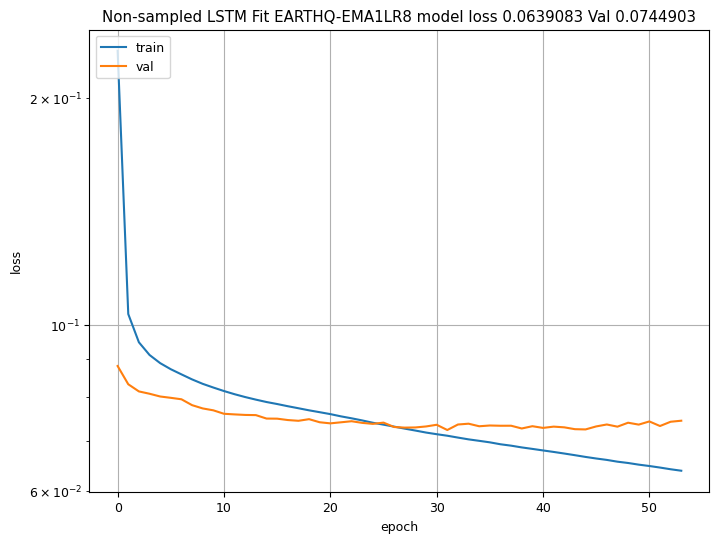

02/02/2023, 03:52:37 UTC EARTHQ-EMA1LR8 DLPrediction EARTHQ LSTM and 1 EMA LR*0.1 Earlier Stop


Predict loop:   0%|          | 0/1775 [00:00<?, ?sequences/s]

Times 0.0031 453.4282 TF 1075.142
02/02/2023, 04:18:08 UTC DLPrediction Averages EARTHQ-EMA1LR8 EARTHQ LSTM and 1 EMA LR*0.1 Earlier Stop
Non-sampled LSTM Fit EARTHQ-EMA1LR8 Weighted sum over predicted values 0.062818 No Encoding Preds 0.062411 Training
0.059896 Validation 0.074505 from loss function 0.062818 TF version 0.062818 TFspec version 0.062818
Count ignoring NaN 12691250.0 Counting NaN 12868750.0 70
 Unwgt Count no NaN  22010000  Unwgt Count with NaN  22187500  Number Sequences  887500
 Errors by Prediction Components -- class weights not included except in final Loss components  Name Count
without NaN, sqrt(sum errors**2/sum target**2), sum(abs(error)/sum(abs(value),
abs(sum(abs(value)-abs(pred)))/sum(abs(pred)
0 Next Magnitude 2 weeks Now All Counts 887500.0 IndE^2/IndObs^2 77.28% IndE/IndObs 112.54% summedErr/SummedObs
14.34% AVG MSE  All Time Full 0.003017 Start Full 0.00261 End Full 0.003503 All Time TRAIN
0.002964 VAL 0.003229 Start TRAIN 0.002545 VAL 0.002867 End TRAIN


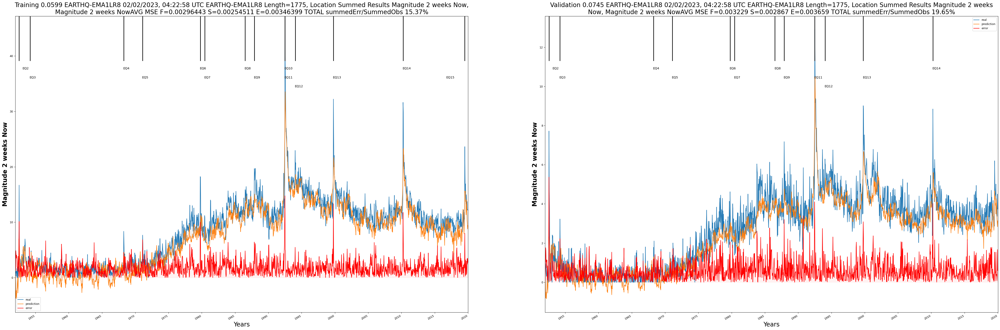

SavedPlot EARTHQ-EMA1LR81


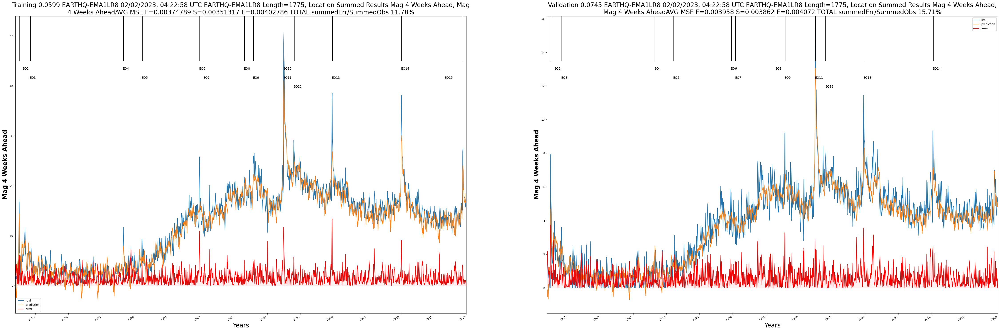

SavedPlot EARTHQ-EMA1LR82


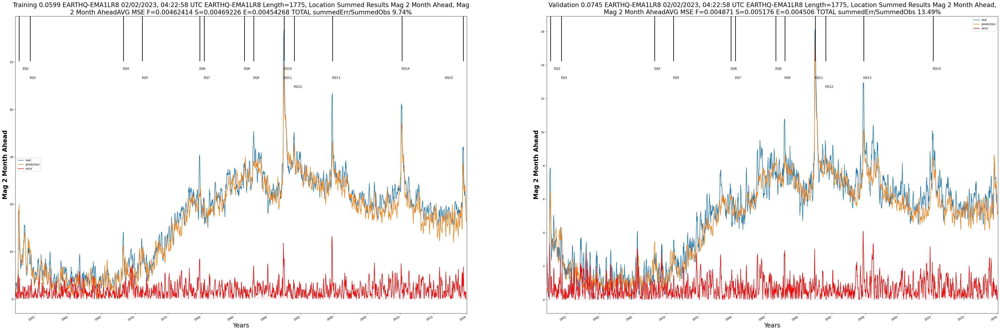

SavedPlot EARTHQ-EMA1LR83


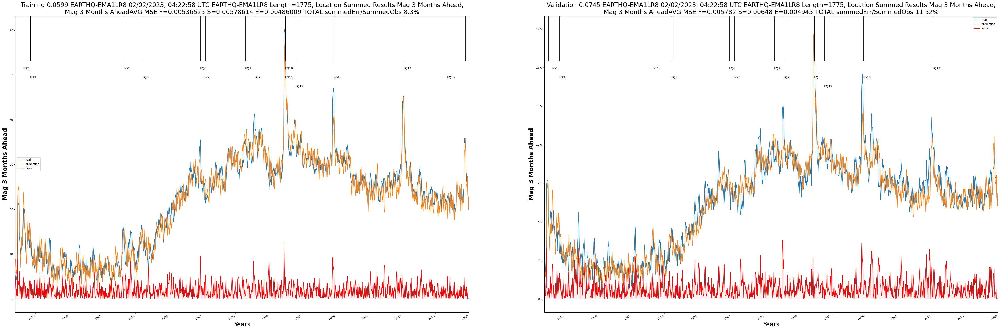

SavedPlot EARTHQ-EMA1LR84


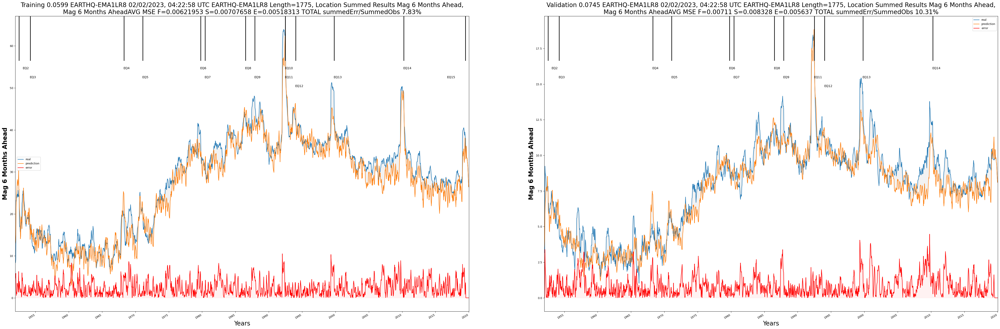

SavedPlot EARTHQ-EMA1LR85


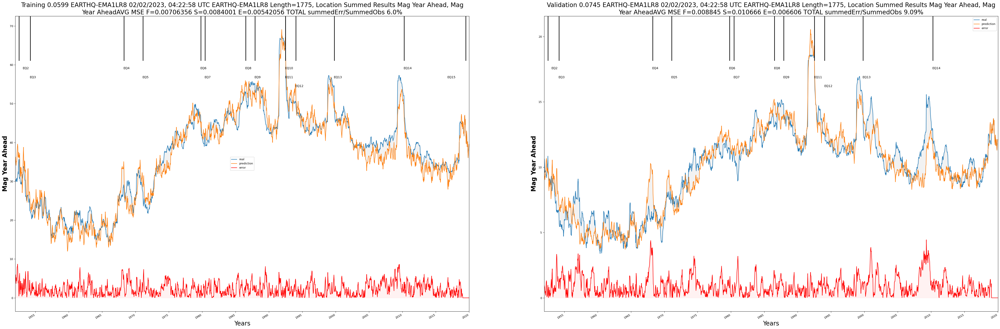

SavedPlot EARTHQ-EMA1LR86


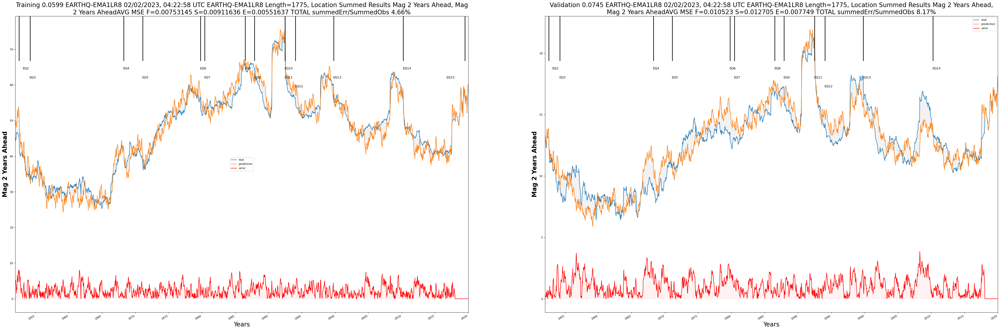

SavedPlot EARTHQ-EMA1LR87


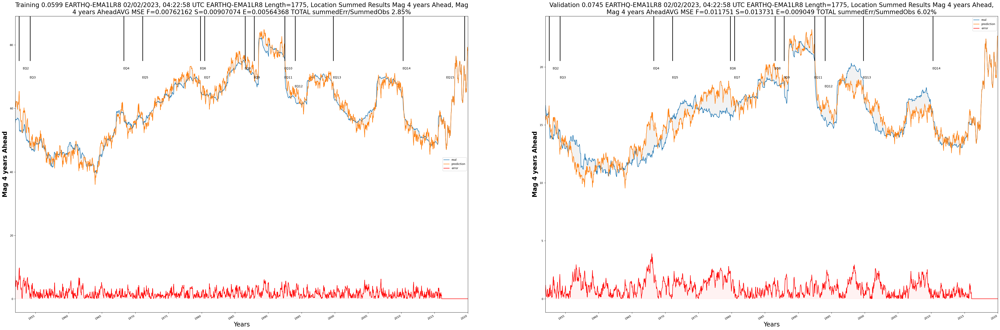

SavedPlot EARTHQ-EMA1LR88


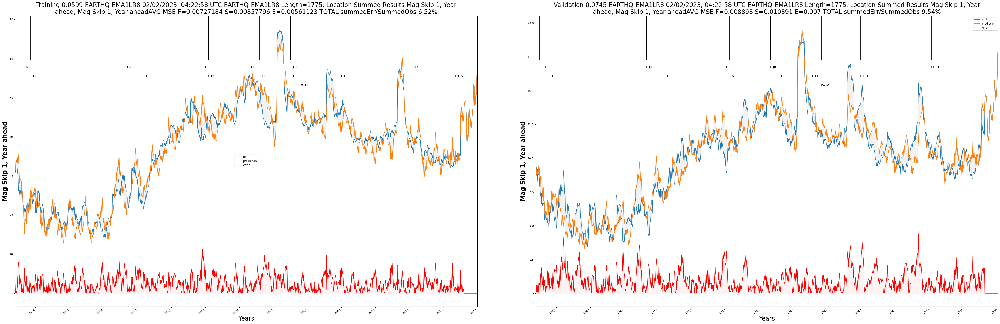

SavedPlot EARTHQ-EMA1LR89


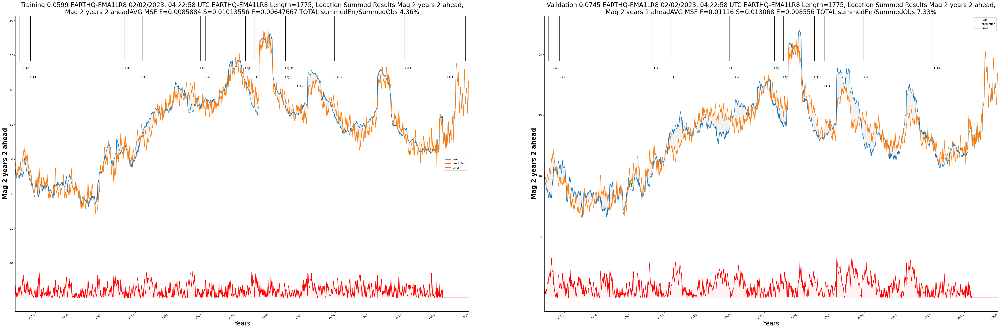

SavedPlot EARTHQ-EMA1LR810


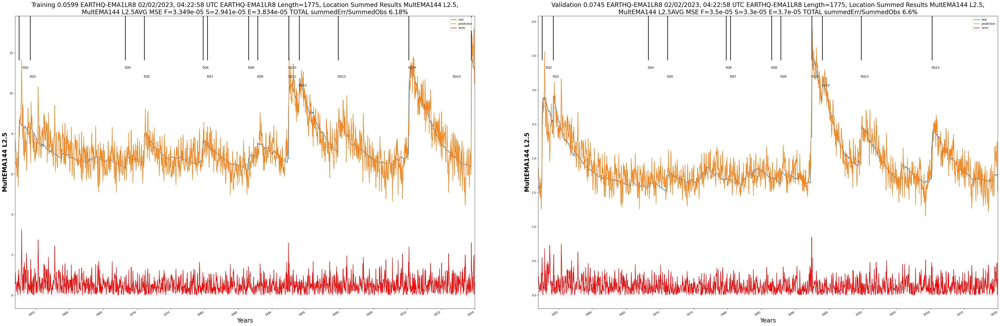

DLPrediction2F 02/02/2023, 04:26:24 UTC EARTHQ-EMA1LR8EARTHQ LSTM and 1 EMA LR*0.1 Earlier Stop
 Predict with 500 sequences per sample and batch size 1775
Sensitivity using Property ScaleFactor 0.99
Basic Predictions


Full Samples:   0%|          | 0/1 [00:00<?, ?sample/s]

Batch    loop:   0%|          | 0/1775 [00:00<?, ?sample/s]

 Full Loss  Mean 0.06282 Std Deviation 0.0 Basic Predictions
 Training Loss  Mean 0.0599 Std Deviation 0.0 Basic Predictions
 Validation Loss  Mean 0.0745 Std Deviation 0.0 Basic Predictions
Property 4 Magnitude 2 weeks Now Normed Mean 0.006


Full Samples:   0%|          | 0/1 [00:00<?, ?sample/s]

Batch    loop:   0%|          | 0/1775 [00:00<?, ?sample/s]

 Full Loss  Mean 0.06282 Std Deviation 0.0 Property 4 Magnitude 2 weeks Now Normed Mean 0.006
 Training Loss  Mean 0.0599 Std Deviation 0.0 Property 4 Magnitude 2 weeks Now Normed Mean 0.006
 Validation Loss  Mean 0.07452 Std Deviation 0.0 Property 4 Magnitude 2 weeks Now Normed Mean 0.006
1329.9293 GS 7394701.5 Property 4 Magnitude 2 weeks Now Normed Mean 0.006
Property 5 Depth 2 weeks Now Normed Mean 0.0283


Full Samples:   0%|          | 0/1 [00:00<?, ?sample/s]

Batch    loop:   0%|          | 0/1775 [00:00<?, ?sample/s]

 Full Loss  Mean 0.06282 Std Deviation 0.0 Property 5 Depth 2 weeks Now Normed Mean 0.0283
 Training Loss  Mean 0.0599 Std Deviation 0.0 Property 5 Depth 2 weeks Now Normed Mean 0.0283
 Validation Loss  Mean 0.07452 Std Deviation 0.0 Property 5 Depth 2 weeks Now Normed Mean 0.0283
544.0954 GS 7394701.5 Property 5 Depth 2 weeks Now Normed Mean 0.0283
Property 6 Multiplicity 2 weeks Now Normed Mean 0.0


Full Samples:   0%|          | 0/1 [00:00<?, ?sample/s]

Batch    loop:   0%|          | 0/1775 [00:00<?, ?sample/s]

 Full Loss  Mean 0.06282 Std Deviation 0.0 Property 6 Multiplicity 2 weeks Now Normed Mean 0.0
 Training Loss  Mean 0.0599 Std Deviation 0.0 Property 6 Multiplicity 2 weeks Now Normed Mean 0.0
 Validation Loss  Mean 0.0745 Std Deviation 0.0 Property 6 Multiplicity 2 weeks Now Normed Mean 0.0
15.36651 GS 7394701.5 Property 6 Multiplicity 2 weeks Now Normed Mean 0.0
Property 7 Mult >3.29 2 weeks Now Normed Mean 0.0


Full Samples:   0%|          | 0/1 [00:00<?, ?sample/s]

Batch    loop:   0%|          | 0/1775 [00:00<?, ?sample/s]

 Full Loss  Mean 0.06282 Std Deviation 0.0 Property 7 Mult >3.29 2 weeks Now Normed Mean 0.0
 Training Loss  Mean 0.0599 Std Deviation 0.0 Property 7 Mult >3.29 2 weeks Now Normed Mean 0.0
 Validation Loss  Mean 0.0745 Std Deviation 0.0 Property 7 Mult >3.29 2 weeks Now Normed Mean 0.0
6.63447 GS 7394701.5 Property 7 Mult >3.29 2 weeks Now Normed Mean 0.0
Property 8 Mag 4 Weeks Back Normed Mean 0.0088


Full Samples:   0%|          | 0/1 [00:00<?, ?sample/s]

Batch    loop:   0%|          | 0/1775 [00:00<?, ?sample/s]

 Full Loss  Mean 0.06282 Std Deviation 0.0 Property 8 Mag 4 Weeks Back Normed Mean 0.0088
 Training Loss  Mean 0.0599 Std Deviation 0.0 Property 8 Mag 4 Weeks Back Normed Mean 0.0088
 Validation Loss  Mean 0.07452 Std Deviation 0.0 Property 8 Mag 4 Weeks Back Normed Mean 0.0088
740.83246 GS 7394701.5 Property 8 Mag 4 Weeks Back Normed Mean 0.0088
Property 9 Mag 2 Months Back Normed Mean 0.0125


Full Samples:   0%|          | 0/1 [00:00<?, ?sample/s]

Batch    loop:   0%|          | 0/1775 [00:00<?, ?sample/s]

 Full Loss  Mean 0.06282 Std Deviation 0.0 Property 9 Mag 2 Months Back Normed Mean 0.0125
 Training Loss  Mean 0.0599 Std Deviation 0.0 Property 9 Mag 2 Months Back Normed Mean 0.0125
 Validation Loss  Mean 0.07451 Std Deviation 0.0 Property 9 Mag 2 Months Back Normed Mean 0.0125
451.4734 GS 7394701.5 Property 9 Mag 2 Months Back Normed Mean 0.0125
Property 10 Mag 3 Months Back Normed Mean 0.0163


Full Samples:   0%|          | 0/1 [00:00<?, ?sample/s]

Batch    loop:   0%|          | 0/1775 [00:00<?, ?sample/s]

 Full Loss  Mean 0.06282 Std Deviation 0.0 Property 10 Mag 3 Months Back Normed Mean 0.0163
 Training Loss  Mean 0.0599 Std Deviation 0.0 Property 10 Mag 3 Months Back Normed Mean 0.0163
 Validation Loss  Mean 0.0745 Std Deviation 0.0 Property 10 Mag 3 Months Back Normed Mean 0.0163
416.106 GS 7394701.5 Property 10 Mag 3 Months Back Normed Mean 0.0163
Property 11 Mag 6 Months Back Normed Mean 0.0217


Full Samples:   0%|          | 0/1 [00:00<?, ?sample/s]

Batch    loop:   0%|          | 0/1775 [00:00<?, ?sample/s]

 Full Loss  Mean 0.06282 Std Deviation 0.0 Property 11 Mag 6 Months Back Normed Mean 0.0217
 Training Loss  Mean 0.0599 Std Deviation 0.0 Property 11 Mag 6 Months Back Normed Mean 0.0217
 Validation Loss  Mean 0.0745 Std Deviation 0.0 Property 11 Mag 6 Months Back Normed Mean 0.0217
450.889 GS 7394701.5 Property 11 Mag 6 Months Back Normed Mean 0.0217
Property 12 Mag Year Back Normed Mean 0.0293


Full Samples:   0%|          | 0/1 [00:00<?, ?sample/s]

Batch    loop:   0%|          | 0/1775 [00:00<?, ?sample/s]

 Full Loss  Mean 0.06282 Std Deviation 0.0 Property 12 Mag Year Back Normed Mean 0.0293
 Training Loss  Mean 0.05991 Std Deviation 0.0 Property 12 Mag Year Back Normed Mean 0.0293
 Validation Loss  Mean 0.07449 Std Deviation 0.0 Property 12 Mag Year Back Normed Mean 0.0293
1730.2489 GS 7394701.5 Property 12 Mag Year Back Normed Mean 0.0293
Property 13 MultEMA144 L2.5 Normed Mean 0.0043


Full Samples:   0%|          | 0/1 [00:00<?, ?sample/s]

Batch    loop:   0%|          | 0/1775 [00:00<?, ?sample/s]

 Full Loss  Mean 0.06281 Std Deviation 0.0 Property 13 MultEMA144 L2.5 Normed Mean 0.0043
 Training Loss  Mean 0.0599 Std Deviation 0.0 Property 13 MultEMA144 L2.5 Normed Mean 0.0043
 Validation Loss  Mean 0.07443 Std Deviation 0.0 Property 13 MultEMA144 L2.5 Normed Mean 0.0043
2905.1514 GS 7394701.5 Property 13 MultEMA144 L2.5 Normed Mean 0.0043

Summarize Changes Total 7394701.5 Property ScaleFactor 0.99
4 Change 1329.93 Normed Change 0.01798 /std 0.50253 Std/Mean 5.96924 Magnitude 2 weeks Now Normed Mean 0.006 Normed Std 0.0358
5 Change 544.1 Normed Change 0.00736 /std 0.38446 Std/Mean 0.67547 Depth 2 weeks Now Normed Mean 0.0283 Normed Std 0.0191
6 Change 15.37 Normed Change 0.00021 /std 0.13541 Std/Mean 0.0 Multiplicity 2 weeks Now Normed Mean 0.0 Normed Std 0.0015
7 Change 6.63 Normed Change 9e-05 /std 0.05103 Std/Mean 0.0 Mult >3.29 2 weeks Now Normed Mean 0.0 Normed Std 0.0018
8 Change 740.83 Normed Change 0.01002 /std 0.23474 Std/Mean 4.87465 Mag 4 Weeks Back Normed Mean 0.008

SystemExit: ignored

/usr/local/lib/python3.8/dist-packages/IPython/core/interactiveshell.py:3334: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


In [ ]:
# Run LSTM Only
if FFFFcfg.UseLSTMModel:
  FFFFfit.AnalysisOnly = True
  FFFFcfg.Dumpoutkeyplotsaspics = True
  FFFFfit.Restorefromcheckpoint = False
  FFFFfit.Checkpointfinalstate = True
  if FFFFfit.AnalysisOnly:
    FFFFfit.Restorefromcheckpoint = True
    FFFFfit.Checkpointfinalstate = False
  if FFFFfit.Restorefromcheckpoint:
    FFFFfit.inputRunName = FFFFcfg.RunName
    inputCHECKPOINTDIR = FFFFcfg.CHECKPOINTDIR
#    FFFFfit.inputRunName = 'Hydroln3A'
    FFFFfit.inputCheckpointpostfix = 'MinLoss-54'
    inputCHECKPOINTDIR = FFFFcfg.APPLDIR + "/checkpoints/" + FFFFfit.inputRunName + "dir/"

  FFFFfit.batchperepoch = False # if True output a batch bar for each epoch
  FFFFfit.GlobalSpacetime = False
  FFFFfit.IncreaseNloc_sample = 1
  FFFFfit.DecreaseNloc_sample = 1

  FFFFcfg.Plotrealnumbers = False
  FFFFcfg.SkipDL2F = False
  FFFFcfg.PlotinDL2F = False

  # Run Pure LSTM
  FFFFlstm.LSTMbatch_size = FFFFcfg.TrainingNloc # Total number of counties for Covid
  FFFFlstm.LSTMbatch_size = 128
  FFFFlstm.LSTMbatch_size = min(FFFFlstm.LSTMbatch_size, FFFFcfg.TrainingNloc)
  FFFFlstm.LSTMepochs = 80
  FFFFlstm.LSTMlearning_rate = 0.0003 *0.1

  FFFFlstm.number_LSTMnodes= 160
  FFFFlstm.LSTMFinalMLP = 160
  FFFFlstm.LSTMInitialMLP = 160
  FFFFlstm.LSTMThirdLayer = False

  FFFFfit.processindex = 0
  FFFFfit.standaloneLSTMrun = False
  FFFFfit.ClassLSTMrun = True
  FFFFfit.CustomTraining = True

  if FFFFfit.ClassLSTMrun and FFFFfit.CustomTraining:
    FFFFsctr.FullSetValidation = False
    LSTMTFMonitor = TensorFlowTrainingMonitor(FFFFcfg)
    if FFFFcfg.Hydrology:
      LSTMTFMonitor.SetControlParms(SuccessLimit = 1,FailureLimit = 2)
    if FFFFcfg.Earthquake:
      LSTMTFMonitor.SetControlParms(SuccessLimit = 1,FailureLimit = 2)
    if FFFFcovid.ReadJan2021Covid or FFFFcovid.ReadApril2021Covid:
      LSTMTFMonitor.SetControlParms(SuccessLimit = 3,FailureLimit = 2)

  current_time = timenow()
  runtype = ''
  if FFFFfit.Restorefromcheckpoint:
    runtype = 'Restarted '
  if FFFFfit.standaloneLSTMrun or FFFFfit.ClassLSTMrun:
    print(wraptotext(startbold + startred +  current_time + ' '  + runtype + FFFFcfg.RunName + ' ' + FFFFcfg.RunComment + resetfonts))
    PrintLSTMandBasicStuff(FFFFcfg, 0)

  if FFFFfit.ClassLSTMrun:
    if FFFFcfg.SymbolicWindows:
      FFFFfit.CustomTraining = True
    if FFFFfit.CustomTraining:
      RunLSTMCustomVersion(FFFFcfg)
  if FFFFfit.standaloneLSTMrun or FFFFfit.ClassLSTMrun:
    print(startbold + startpurple +  'LSTM run completed ' + runtype + FFFFcfg.RunName + ' ' + FFFFcfg.RunComment + resetfonts)
    sys.exit(0)
  print(startbold + startpurple +  current_time + ' UTC Start Hybrid Transformer run ' + FFFFcfg.RunName + ' ' + FFFFcfg.RunComment + resetfonts)

#Science Transformer Model

## Important Parameters defining Transformer project

In [ ]:
if FFFFcfg.UseScienceTransformerModel or FFFFcfg.UseTFTModel:
  FFFFsctr.ActivateAttention = False
  FFFFsctr.DoubleQKV = False
  FFFFsctr.TimeShufflingOnly = False
  FFFFsctr.Transformerbatch_size = 1
  FFFFsctr.Transformervalidationfrac = 0.0
  FFFFsctr.UsedTransformervalidationfrac = 0.0
  FFFFsctr.Transformerepochs = 200
  FFFFsctr.Transformeroptimizer = 'adam'
  FFFFsctr.Transformerverbose = 0
  FFFFsctr.TransformerOnlyFullAttention = True
  FFFFsctr.d_model =64
  FFFFsctr.d_Attention = 2 * FFFFsctr.d_model
  if FFFFsctr.TransformerOnlyFullAttention:
    FFFFsctr.d_Attention = FFFFsctr.d_model
  FFFFsctr.d_qk = FFFFsctr.d_model
  FFFFsctr.d_intermediateqk = 2 * FFFFsctr.d_model
  FFFFsctr.num_heads = 2
  FFFFsctr.num_Encoderlayers = 2
  FFFFsctr.EncoderDropout= 0.1
  FFFFsctr.EncoderActivation = 'selu'
  FFFFsctr.d_EncoderLayer = FFFFsctr.d_Attention
  FFFFsctr.d_merge = FFFFsctr.d_model
  FFFFsctr.d_ffn = 4*FFFFsctr.d_model
  FFFFsctr.MaskingOption = 0



***FFFFcfg.Num_Seq*** Number of Sequences

***FFFFpre.Nloc*** Number of locations

***FFFFcfg.Tseq*** Length of each sequence

***FFFFpre.Npropperseq*** Number of internal properties per sequence including static or dynamic

***FFFFpre.NpredperseqTOT*** Total number of predictions per sequence

***FFFFsctr.d_model*** Dimension of value embedding for every input [Model1]

***FFFFsctr.num_heads*** Number of Attention Heads which must exactly divide ***FFFFsctr.d_model***

***FFFFsctr.num_Encoderlayers*** Number of layers in Encoder stage

***FFFFsctr.EncoderDropout*** Dropout in Encoder stage,

***FFFFsctr.d_ffn*** Size of feedforward network in each encoder layer. It appears to bet to be 4 * ***FFFFsctr.d_model***

***FFFFsctr.MaskingOption*** defines masking used; = 0 none; =1 mask the future

***FFFFsctr.Transformerbatch_size*** is batch size of stochastic gradient descent

***FFFFcfg.Tseq*** is size of sequence window

***FFFFsctr.Transformervalidationfrac*** is fraction used for a validation dataset

***FFFFfit.d_sample*** The number of units presented to the Transformer which could be dynamic. Each of these inputs is used to calculate attention and is FFFFcfg.Tseq times number of locations simultaneously presented

***FFFFfit.max_d_sample*** The maximum number of units presented to the Transformer which is fixed. It is FFFFcfg.Tseq times maximum number of locations simultaneously presented

***FFFFsctr.TransformerOnlyFullAttention*** if True calculate classic attention over all FFFFfit.d_sample members; if False calculate separate attentions in location and time

Describe the science data sets here

Initial data is [FFFFcfg.Num_Seq][FFFFpre.Nloc][FFFFcfg.Tseq] with values [Nforcing + ExPosEnc-Selin + Nprop-Sel]

Predictions are [FFFFcfg.Num_Seq] [FFFFpre.Nloc] [Predvals=Npred+ExPosEnc-Selout] [Predtimes = Forecast-time range]

A subset is included in each transformer call. There are 3 options
*   Simplest: (as in LSTM) samples are labelled by [FFFFcfg.Num_Seq] [FFFFpre.Nloc] and have input length [FFFFcfg.Tseq] with multiple features [Nforcing + ExPosEnc-Selin + Nprop-Sel] mapped into a model for each input of length [Model1]. Predictions for each input are [Predvals] [Predtimes]
*   Straightforward improvement:  Divide FFFFpre.Nloc into sublocation groups giving FFFFpre.Nloc/Nsub groups with FFFFpre.Nloc-Nsub locations in each group. There are many choices of groups including fixed disjoint subgroups, overlapping groups (so that each epoch surveys each location twice and this should help spread attention). Then each sample is labelled by [FFFFcfg.Num_Seq] [FFFFpre.Nloc/Nsub] and have input length [FFFFpre.Nloc-Nsub][FFFFcfg.Tseq] with multiple features [Nforcing + ExPosEnc-Selin + Nprop-Sel] mapped into a model for each input of length [Model1]. Predictions for each input are [Predvals] [Predtimes]
*   (Too) Clever: Use different selections for Encoder and Decoder steps. For example feed all FFFFpre.Nloc locations into transformer but oinly use through multi-headed attention step. One only takes a subset of these through encoder and predictions. This ensures that attention covers all locations
*   Extend "Too clever"  or "Straightforward" method for multiple initial time values in each transformer input i.e. divide [FFFFcfg.Num_Seq] into [FFFFcfg.Num_Seq/Ntsub] groups and input [FFFFcfg.Num_Seq-Ntsub] time sequences into a single transformer. This spreads attention over time.

We can represent all the above cases by lasbelling each data sample by
{[FFFFcfg.Num_Seq][FFFFpre.Nloc]} [FFFFcfg.Tseq] where always members of sequences are complete and selection of sequences and location for a single data sample varies in options above. Each member of a data sample has [Nforcing + ExPosEnc-Selin + Nprop-Sel] internal degrees of freedom. These degrees of freedom will be mapped (embedded) in a model variable of length ***FFFFsctr.d_model***

Size of input is ***FFFFfit.d_sample*** = FFFFcfg.Tseq * size {[FFFFcfg.Num_Seq][FFFFpre.Nloc]} in a single data sample. This is important throughout network whereas [Nforcing + ExPosEnc-Selin + Nprop-Sel] is immediately embedded and becomes of length ***FFFFsctr.d_model***







In [ ]:
# Set up data
# Initial data is [For Batching][FFFFfit.Nloc_sample] [FFFFcfg.Tseq] [FFFFpre.NpropperseqTOT] starting with FFFFpre.RawInputSequencesTOT
# Predictions are [For Batching][FFFFfit.Nloc_sample] [FFFFpre.NpredperseqTOT] starting with FFFFpre.RawInputPredictionsTOT
#  For case FFFFfit.Nloc_sample = FFFFpre.Nloc, the Batching is identical to Time sequence label
# dsample FFFFcfg.Tseq * FFFFpre.Nloc

if FFFFcfg.UseScienceTransformerModel:
  FFFFfit.Nloc_sample = FFFFpre.Nloc
  FFFFfit.OuterBatchDimension = FFFFcfg.Num_Seq
  if FFFFpre.Nloc%FFFFfit.Nloc_sample != 0:
    print("Inconsistent location numbers " + str(FFFFpre.Nloc) + ' ' + str(FFFFfit.Nloc_sample))
    sys.exit()
  FFFFfit.d_sample = FFFFcfg.Tseq * FFFFpre.Nloc
  FFFFfit.max_d_sample = FFFFfit.d_sample
  Transformermaximum_position_encoding = FFFFfit.max_d_sample
  if FFFFcfg.SymbolicWindows:
    X_Transformerdetailed = np.copy(FFFFpre.SymbolicInputSequencesTOT)
  else:
    X_Transformerdetailed = np.copy(FFFFpre.RawInputSequencesTOT)

  y_Transformerdetailed = np.copy(FFFFpre.RawInputPredictionsTOT)

  print("The maximum number of units presented to the Transformer which is fixed.It is FFFFcfg.Tseq times maximum number of locations simultaneously presented ", str(FFFFfit.max_d_sample))
  print("The actual number of units presented to the Transformer for this batch.It is FFFFcfg.Tseq times  number of locations simultaneously presented in  this batch ", str(FFFFfit.max_d_sample))
  print(" Number of locations in each sample presented to the Transformer ", str(FFFFfit.Nloc_sample))
  print("Number of locations times sequence window length in each sample presented to the Transformer ", str(FFFFfit.OuterBatchDimension))

## Scaled dot product attention for Science

This seems unchanged for science case unless ***FFFFfit.d_sample*** is too large. One wastes time then if softmaxes too small. It could be useful just to select the largest (e.g. take top 10 or remove all probabilities < 0.001) softmax values and just process with these

Below all vectors Q K V have size ***FFFFsctr.d_model/FFFFsctr.num_heads***. They are defined for each head and for each sample member of the ***FFFFfit.d_sample*** members

This could use the  mask described earlier but that is not used in initial version

We have a hierarchial sequence label which limits number of softmaxes calculated although number of Q K V vectors are not reduced

### Scaled dot product attention: Q K V Softmax

<img src="https://www.tensorflow.org/images/tutorials/transformer/scaled_attention.png" width="500" alt="scaled_dot_product_attention">

The attention function used by the transformer takes three inputs: Q (query), K (key), V (value). The equation used to calculate the attention weights is:

$$\Large{Attention(Q, K, V) = softmax_k(\frac{QK^T}{\sqrt{d_k}}) V} $$

The dot-product attention is scaled by a factor of square root of the depth. This is done because for large values of depth, the dot product grows large in magnitude pushing the softmax function where it has small gradients resulting in a very hard softmax.

For example, consider that `Q` and `K` have a mean of 0 and variance of 1. Their matrix multiplication will have a mean of 0 and variance of `dk`. Hence, *square root of `dk`* is used for scaling (and not any other number) because the matmul of `Q` and `K` should have a mean of 0 and variance of 1, and you get a gentler softmax.

The mask is multiplied with -1e9 (close to negative infinity). This is done because the mask is summed with the scaled matrix multiplication of Q and K and is applied immediately before a softmax. The goal is to zero out these cells, and large negative inputs to softmax are near zero in the output.

In [ ]:
def CalculateFullAttention(q,k,v,FFFFsctr.num_heads, mask=None):

  depth = tf.shape(k)[-1]
  dk = tf.cast(depth, tf.float32) # dk is depth in all methods
  FFFFsctr.d_qk  = FFFFsctr.num_heads * depth
  if FFFFsctr.SeparateHeads: # Spread out to save space
    HeadedAttentionVectorList = []
    for ihead in range(0,FFFFsctr.num_heads):
      matmul_qk = tf.matmul(q[:,ihead,:,:], k[:,ihead,:,:], transpose_b=True)  # [Batch, ihead, FFFFfit.d_sample, depth] [Batch, ihead, (FFFFfit.d_sample, depth)T ]
      scaled_attention_logits = matmul_qk / tf.math.sqrt(dk) # [Batch, FFFFfit.d_sample, FFFFfit.d_sample]
      matmul_qk = None
      # add the mask to the scaled tensor.
      if mask is not None: # batch,FFFFfit.d_sample, FFFFfit.d_sample
        scaled_attention_logits += (mask * -1e9)

      # softmax is normalized on the last axis (seq_len_k = FFFFfit.d_sample) so that the scores add up to 1.
      # scaled_attention_logits and attention_weights [Batch,  FFFFfit.d_sample, FFFFfit.d_sample]
      attention_weights = tf.nn.softmax(scaled_attention_logits, axis=-1)
      scaled_attention_logits = None
      if mask is not None:
        attention_weights = tf.where(mask > 0.2, 0.0, attention_weights)

      # [Batch,  FFFFfit.d_sample, FFFFfit.d_sample] [Batch,  FFFFfit.d_sample, depth]
      OneheadAttentionVectorfull = tf.matmul(attention_weights, v[:,ihead,:,:])
      HeadedAttentionVectorList.append(OneheadAttentionVectorfull)# [FFFFsctr.num_heads, Batch,  FFFFfit.d_sample,  depth]

    AttentionVectorfull = tf.convert_to_tensor(HeadedAttentionVectorList)
    # [Batch, FFFFsctr.num_heads,  FFFFfit.d_sample,  depth]
    AttentionVectorfull = tf.transpose(AttentionVectorfull, perm = [1,0,2,3])
    HeadedAttentionVectorList = None
    OneheadAttentionVectorfull = None

  else:
    if FFFFsctr.ChopupMatrix:
      basicsize = math.floor((FFFFfit.Nloc_sample+0.001)/FFFFsctr.ChopupNumber)
      remainder = FFFFfit.Nloc_sample%basicsize
      Tensorlist =[]
      upperlimit = 0
      for choploop in range(0,FFFFsctr.ChopupNumber):
        lowerlimit = upperlimit
        upperlimit = lowerlimit + basicsize
        if choploop < remainder:
          upperlimit += 1
  # q k v [Batch, FFFFsctr.num_heads, FFFFfit.d_sample, depth]
        upperlimitSeq = upperlimit*FFFFcfg.Tseq
        lowerlimitSeq = lowerlimit*FFFFcfg.Tseq
        matmul_qk = tf.matmul(q[:,:,lowerlimitSeq:upperlimitSeq,:], k[:,:,lowerlimitSeq:upperlimitSeq,:], transpose_b=True)
  # [Batch, FFFFsctr.num_heads, d_sampleCHOP, depth] [Batch, FFFFsctr.num_heads, (d_sampleCHOP, depth)T ]
        scaled_attention_logits = matmul_qk / tf.math.sqrt(dk) # [Batch, FFFFsctr.num_heads, d_sampleCHOP, d_sampleCHOP]

        # add the mask to the scaled tensor.
        if mask is not None: # batch,FFFFfit.d_sample, FFFFfit.d_sample
          smallmask = mask[:,lowerlimitSeq:upperlimitSeq,lowerlimitSeq:upperlimitSeq]
          smallmask = tf.reshape(smallmask,[smallmask.shape[0],1,smallmask.shape[1],smallmask.shape[2]])
          scaled_attention_logits += (smallmask * -1e9)

        attention_weights = tf.nn.softmax(scaled_attention_logits, axis=-1)  # scaled_attention_logits [Batch, FFFFsctr.num_heads, d_sampleCHOP, d_sampleCHOP]
        if mask is not None:
          attention_weights = tf.where(smallmask > 0.2, 0.0, attention_weights)
        Tensorlist.append(tf.matmul(attention_weights, v[:,:,lowerlimitSeq:upperlimitSeq,:]))
      AttentionVectorfull = tf.concat(Tensorlist,axis=2)
      Tensorlist = None
      smallmask = None

    else: # FULL ATTENTION Integrated all heads done together
      matmul_qk = tf.matmul(q, k, transpose_b=True)  # [Batch, FFFFsctr.num_heads, FFFFfit.d_sample, depth] [Batch, FFFFsctr.num_heads, (FFFFfit.d_sample, depth)T ]
      scaled_attention_logits = matmul_qk / tf.math.sqrt(dk) # [Batch, FFFFsctr.num_heads, FFFFfit.d_sample, FFFFfit.d_sample]

      # add the mask to the scaled tensor.
      if mask is not None: # batch,FFFFfit.d_sample, FFFFfit.d_sample
        mask = tf.reshape(mask,[mask.shape[0],1,mask.shape[1],mask.shape[2]])
        scaled_attention_logits += (mask * -1e9)

      # softmax is normalized on the last axis (seq_len_k = FFFFfit.d_sample) so that the scores add up to 1.
      # scaled_attention_logits [Batch, FFFFsctr.num_heads, FFFFfit.d_sample, FFFFfit.d_sample]
      attention_weights = tf.nn.softmax(scaled_attention_logits, axis=-1)
      if mask is not None:
        attention_weights = tf.where(mask > 0.2, 0.0, attention_weights)

      AttentionVectorfull = tf.matmul(attention_weights, v)  # [Batch, FFFFsctr.num_heads, FFFFfit.d_sample, FFFFfit.d_sample] [Batch, FFFFsctr.num_heads, FFFFfit.d_sample, d_v]

  # Below done for FULL ATTENTION as only Attention whatever FFFFsctr.SeparateHeads
  AttentionVectortemp = tf.transpose(AttentionVectorfull, perm = [0,2,1,3]) # [Batch,  FFFFfit.d_sample, FFFFsctr.num_heads, d_v]
  AttentionVector = tf.reshape(AttentionVectortemp, [q.shape[0],FFFFfit.d_sample, FFFFsctr.num_heads*d_v]) # restore shape
  AttentionVectortemp = None
  scaled_attention_logits = None
  attention_weights = None
  matmul_qk = None
  return AttentionVector

def scaled_dot_product_attention(q, k, v, mask=None):
  # Needs externally defined  FFFFsctr.num_heads, FFFFfit.d_sample, FFFFfit.Nloc_sample, FFFFcfg.Tseq, FFFFsctr.d_model
  # Calculates depth
  """
  Calculate the attention weights after Q K V found
  q, k, v must have matching leading dimensions.
  k, v must have matching penultimate dimension, i.e.: seq_len_k = seq_len_v.
  The mask has different shapes depending on its type(padding or look ahead)
  but it must be broadcastable for addition.

  Args:
    q: query shape == (..., seq_len_q, depth)
    k: key shape == (..., seq_len_k, depth)
    v: value shape == (..., seq_len_v, depth_v)
    mask: Float tensor with shape broadcastable
          to (..., seq_len_q, seq_len_k). Defaults to None.

In the science Transformer, Q K V are all Batch, FFFFsctr.num_heads, FFFFfit.d_sample, depth
where Q K V all have same number of samples FFFFfit.d_sample
depth is always FFFFsctr.d_model/num heads

FFFFfit.d_sample is really [FFFFfit.Nloc_sample][FFFFcfg.Tseq] and calculates separate Location and Time Attention

Original returned attention weights but ignored. We do NOT return but rather return two attention vectors in Location and Time
If FFFFsctr.TransformerOnlyFullAttention specified, it returns  traditional full attention vector
  Returns:
    AttentionVector1 concatenated with AttentionVector2
  """
  # To scale matmul_qk
  depth = tf.shape(k)[-1]
  dk = tf.cast(depth, tf.float32) # dk is depth in all methods
  FFFFsctr.d_qk  = FFFFsctr.num_heads * depth

# This executes JUST ONE ATTENTION -  Full
  if FFFFsctr.TransformerOnlyFullAttention:
    AttentionVector = CalculateFullAttention(q,k,v,FFFFsctr.num_heads,mask)
    mask = None
# End ONE WAY ATTENTION

  else: # Two way Attention
    # FIRST Calculate Attention in Time. This requires no reordering and so can be redone with shape
    # Note matmul works for all number of indices and multiplication is only done on last 2 indices
    # so using qtime means we look at attention with location fixed
    qtime = tf.reshape(q, [-1, FFFFsctr.num_heads, FFFFfit.Nloc_sample, FFFFcfg.Tseq, depth ])
    ktime = tf.reshape(k, [-1, FFFFsctr.num_heads, FFFFfit.Nloc_sample, FFFFcfg.Tseq, depth ])
    vtime = tf.reshape(v, [-1, FFFFsctr.num_heads, FFFFfit.Nloc_sample, FFFFcfg.Tseq, d_v ])
    matmul_qk = tf.matmul(qtime, ktime, transpose_b=True)  # [Batch, FFFFsctr.num_heads, FFFFfit.Nloc_sample, FFFFcfg.Tseq, depth] [Batch, FFFFsctr.num_heads, FFFFfit.Nloc_sample, (FFFFcfg.Tseq, depth)T ]
    scaled_attention_logits = matmul_qk / tf.math.sqrt(dk) # [Batch, FFFFsctr.num_heads, FFFFfit.Nloc_sample, FFFFcfg.Tseq, FFFFcfg.Tseq]
    # add the mask to the scaled tensor.
    if mask is not None:
#      mask = tf.reshape(mask,[mask.shape[0],FFFFfit.Nloc_sample,FFFFcfg.Tseq,FFFFfit.Nloc_sample,FFFFcfg.Tseq]) Calulate from full mask
#      timemask= tf.transpose(mask,perm = [0,2,4,1,3])
#      timemask = tf.linalg.diag_part(timemask)
#      timemask = tf.transpose(timemask,perm = [0,3,1,2])
#      timemask = tf.reshape(timemask,[timemask.shape[0],1,FFFFfit.Nloc_sample, FFFFcfg.Tseq, FFFFcfg.Tseq])
# Global Time Mask is [1,1,1,FFFFcfg.Tseq,FFFFcfg.Tseq]
      timemask =tf.convert_to_tensor(FFFFsctr.GlobalTimeMask, dtype = tf.float32) # [Batch, FFFFsctr.num_heads, FFFFfit.Nloc_sample, FFFFcfg.Tseq, FFFFcfg.Tseq]
      scaled_attention_logits += (timemask * -1e9)

    # softmax is normalized on the last axis (FFFFcfg.Tseq) so that the scores add up to 1 in time direction separately for each space.
    attention_weights = tf.nn.softmax(scaled_attention_logits, axis=-1)  # scaled_attention_logits [Batch, FFFFsctr.num_heads, FFFFfit.Nloc_sample, FFFFcfg.Tseq, FFFFcfg.Tseq]
    if mask is not None:
      attention_weights = tf.where(timemask > 0.2, 0.0, attention_weights)

    AttentionVector1time = tf.matmul(attention_weights, vtime)  # [Batch, FFFFsctr.num_heads, FFFFfit.Nloc_sample, FFFFcfg.Tseq, FFFFcfg.Tseq] [Batch, FFFFsctr.num_heads,  FFFFfit.Nloc_sample, FFFFcfg.Tseq, d_v] becomes [Batch, FFFFsctr.num_heads, FFFFfit.Nloc_sample, FFFFcfg.Tseq, depth]
    AttentionVector1temp = tf.transpose(AttentionVector1time, perm = [0,2,3,1,4]) # [Batch,  FFFFfit.Nloc_sample, FFFFcfg.Tseq, FFFFsctr.num_heads, d_v]
    AttentionVector1 = tf.reshape(AttentionVector1temp, [q.shape[0],FFFFfit.d_sample, d_v*FFFFsctr.num_heads]) # restore shape
    AttentionVector1time = None
    AttentionVector1temp = None
    timemask = None

# Purely Space-based attention as second of two attentions
# Note we don't do Space and Full together so calculated mask is for Space and saves space
    if FFFFsctr.SpacewiseSecondAttention:
      # Code below rewrites arrays to have 5 indices exposing space and time separately
      qspace = tf.transpose(qtime, perm = [1,0,3,2,4]) # [FFFFsctr.num_heads, Batch, FFFFcfg.Tseq, FFFFfit.Nloc_sample,  depth]
      kspace = tf.transpose(ktime, perm = [1,0,3,2,4]) # [FFFFsctr.num_heads, Batch, FFFFcfg.Tseq, FFFFfit.Nloc_sample,  depth]
      vspace = tf.transpose(vtime, perm = [1,0,3,2,4]) # [FFFFsctr.num_heads, Batch, FFFFcfg.Tseq, FFFFfit.Nloc_sample,  d_v]
      if FFFFsctr.SeparateHeads:
        HeadedAttentionVectorList = []
        for ihead in range(0,FFFFsctr.num_heads):
          # [Batch,ihead, FFFFcfg.Tseq, FFFFfit.Nloc_sample, depth] [Batch, ihead,FFFFcfg.Tseq, (FFFFfit.Nloc_sample, depth)T ]
          matmul_qk = tf.matmul(qspace[ihead,:,:,:,:], kspace[ihead,:,:,:,:], transpose_b=True)
          scaled_attention_logits = matmul_qk / tf.math.sqrt(dk) # [Batch, FFFFcfg.Tseq, FFFFfit.Nloc_sample, FFFFfit.Nloc_sample]
          if mask is not None:
            spacemask = tf.reshape(mask,[mask.shape[0],1,FFFFfit.Nloc_sample,Nloc_sample])
            scaled_attention_logits += (spacemask * -1e9)
          attention_weights = tf.nn.softmax(scaled_attention_logits, axis=-1)  # scaled_attention_logits [Batch,  FFFFcfg.Tseq, FFFFfit.Nloc_sample,  FFFFfit.Nloc_sample]
          if mask is not None:
            attention_weights = tf.where(spacemask > 0.2, 0.0, attention_weights)
          # [Batch,  FFFFcfg.Tseq, FFFFfit.Nloc_sample, FFFFfit.Nloc_sample] [Batch,  FFFFcfg.Tseq, FFFFfit.Nloc_sample, depth]
          OneheadAttentionVectorspace = tf.matmul(attention_weights, vspace[ihead,:,:,:,:])
          HeadedAttentionVectorList.append(OneheadAttentionVectorspace)# [FFFFsctr.num_heads,Batch,  FFFFcfg.Tseq, FFFFfit.Nloc_sample,  depth]
        AttentionVector2space = tf.convert_to_tensor(HeadedAttentionVectorList)
        OneheadAttentionVectorspace = None
        HeadedAttentionVectorList = None

      else: # Fully Integrated
        matmul_qk = tf.matmul(qspace, kspace, transpose_b=True)  # [FFFFsctr.num_heads,Batch,  FFFFcfg.Tseq, FFFFfit.Nloc_sample, depth] [FFFFsctr.num_heads, Batch, FFFFcfg.Tseq, (FFFFfit.Nloc_sample, depth)T ]
        scaled_attention_logits = matmul_qk / tf.math.sqrt(dk) # [FFFFsctr.num_heads, Batch, FFFFcfg.Tseq, FFFFfit.Nloc_sample, FFFFfit.Nloc_sample]

        # add the mask to the scaled tensor.
        if mask is not None:
          #mask = tf.reshape(mask,[mask.shape[0],FFFFfit.Nloc_sample,FFFFcfg.Tseq,FFFFfit.Nloc_sample,FFFFcfg.Tseq])
          #spacemask= mask[:,:,0,:,0]
          #spacemask = tf.reshape(spacemask,[mask.shape[0],1,1,FFFFfit.Nloc_sample,Nloc_sample])
          spacemask = tf.reshape(mask,[1,mask.shape[0],1,FFFFfit.Nloc_sample,Nloc_sample])
          scaled_attention_logits += (spacemask * -1e9)

        # softmax is normalized on the last axis (FFFFfit.Nloc_sample) so that the scores add up to 1 in location direction separately for each space.
        attention_weights = tf.nn.softmax(scaled_attention_logits, axis=-1)  # scaled_attention_logits [FFFFsctr.num_heads, Batch, FFFFcfg.Tseq, FFFFfit.Nloc_sample,  FFFFfit.Nloc_sample]
        if mask is not None:
          attention_weights = tf.where(spacemask > 0.2, 0.0, attention_weights)

        AttentionVector2space = tf.matmul(attention_weights, vspace)
  # [FFFFsctr.num_heads, Batch, FFFFcfg.Tseq, FFFFfit.Nloc_sample,  FFFFfit.Nloc_sample] [Batch, FFFFsctr.num_heads, FFFFcfg.Tseq, FFFFfit.Nloc_sample,  d_v] becomes [Batch, FFFFsctr.num_heads, FFFFcfg.Tseq, FFFFfit.Nloc_sample,  d_v]

      AttentionVector2temp = tf.transpose(AttentionVector2space, perm = [1,3,2,0,4]) # [Batch,  FFFFfit.Nloc_sample, FFFFcfg.Tseq, FFFFsctr.num_heads, d_v]
      AttentionVector2 = tf.reshape(AttentionVector2temp, [q.shape[0], FFFFfit.d_sample, d_v*FFFFsctr.num_heads ]) # restore shape
      AttentionVector2space = None
      AttentionVector2temp = None
      spacemask = None
      qspace = None
      kspace = None
      vspace = None

# Full time-space for second attention
    else:
      AttentionVector2 = CalculateFullAttention(q,k,v,FFFFsctr.num_heads,mask)

# Combine two attentions
    AttentionVector = tf.concat([AttentionVector1,AttentionVector2], -1) # [Batch, FFFFfit.d_sample,2*d_v*FFFFsctr.num_heads]
    AttentionVector1 = None
    AttentionVector2 = None
    qtime = None
    ktime = None
    vtime = None

# Either one-way or two-way attention
  scaled_attention_logits = None
  attention_weights = None
  mask = None
  matmul_qk = None
  return AttentionVector # [Batch,  FFFFfit.d_sample,FFFFsctr.d_Attention]

## **Multi-head attention for Science**

Multi-head attention should be identical between Science ad NLP

Note assertion that ***FFFFsctr.num_heads*** divides ***FFFFsctr.d_model***

The annotation has seq_len and similar notations which is ***FFFFfit.d_sample***

***depth*** is calculated. It is number of words in each instance of Q, K, V for one head. Note that Q, K, V are concatenated over heads for efficient computation

We suggest possibility of doing attention not across all FFFFfit.d_sample inputs but rather separately in time and in location. This is implemented in "Scaled Dot Product Attention"

We also allow FFFFsctr.d_Attention final size to be different from input FFFFsctr.d_model. Further we put correction of splitting into "Scaled Dot Product Attention" as it is naturally combined with other tensor reshape/transformations

### Multi-head Attention Discussion and Science version

<img src="https://www.tensorflow.org/images/tutorials/transformer/multi_head_attention.png" width="500" alt="multi-head attention">


Multi-head attention consists of four parts:
*    Linear layers and split into heads.
*    Scaled dot-product attention.
*    Concatenation of heads.
*    Final linear layer.

Each multi-head attention block gets three inputs; Q (query), K (key), V (value). These are put through linear (Dense) layers and split up into multiple heads.

The `scaled_dot_product_attention` defined above is applied to each head (broadcasted for efficiency). An appropriate mask must be used in the attention step.  The attention output for each head is then concatenated (using `tf.transpose`, and `tf.reshape`) and put through a final `Dense` layer.

Instead of one single attention head, Q, K, and V are split into multiple heads because it allows the model to jointly attend to information at different positions from different representational spaces. After the split each head has a reduced dimensionality, so the total computation cost is the same as a single head attention with full dimensionality.

In [ ]:
class Active_QKV(tf.keras.layers.Layer):
  def __init__(self,d_intermediateqkv, d_finalqkv):
    super(Active_QKV, self).__init__()

    self.d_intermediateqkv  = d_intermediateqkv
    self.d_finalqkv = d_finalqkv

    self.FirstDenseqkv =  tf.keras.layers.Dense(self.d_intermediateqkv, activation=FFFFsctr.EncoderActivation)  # (batch_size, d_qkv, d_intermediateqkv)
    self.SecondDenseqkv =  tf.keras.layers.Dense(self.d_finalqkv)  # (batch_size, FFFFsctr.d_qk, d_finalqkv)
    self.TheDropoutqkv =  tf.keras.layers.Dropout(FFFFsctr.EncoderDropout)

  def call(self, qkv, training=None):

    Running = self.FirstDenseqkv(qkv)
    Running = self.SecondDenseqkv(Running)
    ComplexQKV = self.TheDropoutqkv(Running,training=training)

    return ComplexQKV

class MultiHeadAttention(tf.keras.layers.Layer):
  # Feed in FFFFsctr.d_model, FFFFsctr.num_heads. Nothing assumed. Other sizes implied by tensors
  # seq_len = seq_len_q = seq_len_k= seq_len_v below is FFFFfit.d_sample

  def __init__(self):
    super(MultiHeadAttention, self).__init__()
    self.num_heads = FFFFsctr.num_heads
    self.d_intermediateqk = FFFFsctr.d_intermediateqk
    self.d_intermediatev = d_intermediatev
    self.d_qk = FFFFsctr.d_qk
    self.d_v = d_v

    assert self.d_qk % self.num_heads == 0

    self.depth = self.d_qk // self.num_heads

    if not FFFFsctr.ActivateAttention:
      self.wq = tf.keras.layers.Dense(self.d_qk)
      self.wk = tf.keras.layers.Dense(self.d_qk)
      if not FFFFsctr.Takevasinput:
        self.wv = tf.keras.layers.Dense(self.d_v*self.num_heads)
    if  FFFFsctr.ActivateAttention:
      if self.d_intermediateqk >0:
        self.wq_aa = Active_QKV(self.d_intermediateqk, self.d_qk)
        self.wk_aa = Active_QKV(self.d_intermediateqk, self.d_qk)
      else:
        self.wq_aa = tf.keras.layers.Dense(self.d_qk, activation=FFFFsctr.EncoderActivation)
        self.wk_aa = tf.keras.layers.Dense(self.d_qk, activation=FFFFsctr.EncoderActivation)
      if not FFFFsctr.Takevasinput:
        if self.d_intermediatev >0:
          self.wv_aa = Active_QKV(self.d_intermediatev, self.d_v)
        else:
          self.wv_aa = tf.keras.layers.Dense(self.d_v, activation=FFFFsctr.EncoderActivation)

    self.finaldense = tf.keras.layers.Dense(FFFFsctr.d_Attention)

  def summarize(self):
    count_tot = self.count_params()
    count_v = 0
    if  FFFFsctr.ActivateAttention:
      count_q = self.wq_aa.count_params()
      count_k = self.wk_aa.count_params()
      if not FFFFsctr.Takevasinput:
        count_v = self.wv_aa.count_params()
    else:
      count_q = self.wq.count_params()
      count_k = self.wk.count_params()
      if not FFFFsctr.Takevasinput:
        count_v = self.wv.count_params()
    count_final = self.finaldense.count_params()
    print('MHA Tot ' + str(count_tot) + ' Q K V ' + str(count_q) + ' ' + str(count_k) + ' ' + str(count_v)
     + ' Dense ' + str(count_final))

  def split_heads(self, x, batch_size):
    """Split the last dimension into (FFFFsctr.num_heads, depth).
    Transpose the result such that the shape is (batch_size, FFFFsctr.num_heads, seq_len, depth)
    """
    x = tf.reshape(x, (batch_size, -1, self.num_heads, self.depth))
    return tf.transpose(x, perm=[0, 2, 1, 3])

  def call(self, v, k, q, Mappedv, mask=None, training=None):
    batch_size = tf.shape(q)[0]

    if FFFFsctr.ActivateAttention:
      q = self.wq_aa(q, training=training)  # (batch_size, seq_len, FFFFsctr.d_qk)
      k = self.wk_aa(k, training=training)  # (batch_size, seq_len, FFFFsctr.d_qk)
      if not FFFFsctr.Takevasinput:
        v = self.wv_aa(v, training=training)  # (batch_size, seq_len, d_v)
    else:
      q = self.wq(q)  # (batch_size, seq_len, FFFFsctr.d_qk)
      k = self.wk(k)  # (batch_size, seq_len, FFFFsctr.d_qk)
      if not FFFFsctr.Takevasinput:
        v = self.wv(v)  # (batch_size, seq_len, d_v*self.num_heads)

    q = self.split_heads(q, batch_size)  # (batch_size, FFFFsctr.num_heads, seq_len_q, depth)
    k = self.split_heads(k, batch_size)  # (batch_size, FFFFsctr.num_heads, seq_len_k, depth)

    if FFFFsctr.Takevasinput:
      v=[]
      for i in range(0,self.num_heads):
        v.append(Mappedv)
      v = tf.convert_to_tensor(v)
      v = tf.reshape(v, (batch_size, -1, self.num_heads, Mappedv.shape[-1]))
      v = tf.transpose(v, perm=[0, 2, 1, 3])
    else:
      v = self.split_heads(v, batch_size)  # (batch_size, FFFFsctr.num_heads, seq_len_v, depth = D_v)

# scaled_attention.shape == (batch_size,  seq_len_q, FFFFsctr.d_Attention)
    concat_attention = scaled_dot_product_attention(q, k, v, mask)
    output = self.finaldense(concat_attention)  # (batch_size, seq_len_q, FFFFsctr.d_Attention)

    return output

## **Point wise feed forward network** (Original and Science)

This is used in encoder (each) layer and the decoder.  The activation layer could be 'relu' or 'selu'.

dff in code is our parameter ***FFFFsctr.d_ffn*** (size of first layer in feef forward network) and defaults to 4 * ***FFFFsctr.d_model***

Point wise feed forward network consists of two fully-connected layers with a relu or selu activation in between.

In [ ]:
def point_wise_feed_forward_network(FFFFsctr.d_EncoderLayer, FFFFsctr.d_ffn):
  return tf.keras.Sequential([
      tf.keras.layers.Dense(FFFFsctr.d_ffn, activation=FFFFsctr.EncoderActivation),  # (batch_size, seq_len, FFFFsctr.d_ffn)
      tf.keras.layers.Dense(FFFFsctr.d_EncoderLayer)  # (batch_size, seq_len, FFFFsctr.d_EncoderLayer)
  ])

## **Encoder and decoder**

Note the process starts with an ***Encoder*** and finishes with a ***Decoder***. These share components like multi-headed attention. We expect to look at different Decoders for science as we want floating point numbers and not as in NLP, members of a vocabulary We expect that decoder could be similar for science and NLP as it is looking for structure and that is a set of relationships which could be similar between science and NLP. .

<img src="https://www.tensorflow.org/images/tutorials/transformer/transformer.png" width="600" alt="transformer">

The transformer model follows the same general pattern as a standard [sequence to sequence with attention model](nmt_with_attention.ipynb).

* The input sentence is passed through `N` encoder layers that generates an output for each word/token in the sequence.
* The decoder attends on the encoder's output and its own input (self-attention) to predict the next word.

### Encoder layer (Original and Science)

Each encoder layer consists of sublayers:

1.   Multi-head attention (with padding mask)
2.    Point wise feed forward networks.

Each of these sublayers has a residual connection around it followed by a layer normalization. Residual connections help in avoiding the vanishing gradient problem in deep networks.

The output of each sublayer is `LayerNorm(x + Sublayer(x))`. The normalization is done on the `FFFFsctr.d_EncoderLayer` (last) axis. There are N = ***FFFFsctr.num_Encoderlayers*** encoder layers in the transformer.


I am not clear why x and sublayer(x) (input and output, out1 + ffn_output) are added. I would have concatenated. I had a similar comment on positional encoding which is added to rather than being appended to input. For science the numbers matter -- its not just patterns!

In [ ]:
class EncoderLayer(tf.keras.layers.Layer):
  def __init__(self):
    super(EncoderLayer, self).__init__()

    self.mha = MultiHeadAttention()
    self.ffn = point_wise_feed_forward_network(FFFFsctr.d_EncoderLayer, FFFFsctr.d_ffn)

    if FFFFsctr.oldencoderversion:
      self.layernorm1 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
      self.layernorm2 = tf.keras.layers.LayerNormalization(epsilon=1e-6)

    self.dropout1 = tf.keras.layers.Dropout(FFFFsctr.EncoderDropout)
    self.dropout2 = tf.keras.layers.Dropout(FFFFsctr.EncoderDropout)

  def summarize(self):
    self.mha.summarize()
    print(startbold + startpurple + 'point_wise_feed_forward_network Sequential Net' +resetfonts)
    self.ffn.summary()

  def call(self, x, xmapped, training=None, mask=None):

# mha adjusts to shape[-1] of x being FFFFsctr.d_model or FFFFsctr.d_EncoderLayer
    attn_output = self.mha(x, x, x, xmapped, mask = mask, training=training)  # (batch_size, input_seq_len, FFFFsctr.d_model)

    attn_output = self.dropout1(attn_output, training=training)

    if FFFFsctr.oldencoderversion:
      if np.shape(x)[-1] == np.shape(attn_output)[-1]:
        addtogether = x + attn_output
      else:
        doublex = tf.concat([x,x], -1)
        if np.shape(doublex)[-1] != np.shape(attn_output)[-1]:
          doublex = tf.concat([doublex,doublex], -1)
        addtogether = doublex + attn_output
      out1 = self.layernorm1(addtogether)  # (batch_size, input_seq_len, FFFFsctr.d_EncoderLayer)
    else:
      out1 = attn_output

    ffn_output = self.ffn(out1)  # (batch_size, input_seq_len, FFFFsctr.d_EncoderLayer)
    ffn_output = self.dropout2(ffn_output, training=training)
    if FFFFsctr.oldencoderversion:
      out2 = self.layernorm2(out1 + ffn_output)  # (batch_size, input_seq_len, FFFFsctr.d_EncoderLayer)
    else:
      out2 = ffn_output

    return out2


### Encoder

The `Encoder` consists of:
1.   Input Embedding
2.   Positional Encoding
3.   N encoder layers

The input is put through an embedding which is summed with the positional encoding. The output of this summation is the input to the encoder layers. The output of the encoder is the input to the decoder.

### Encoder (Science modified Original)

In [ ]:
class Encoder(tf.keras.Model):
  def __init__(self):
    super(Encoder, self).__init__()

   # self.embedding = tf.keras.layers.Embedding(input_vocab_size, FFFFsctr.d_model)
    self.dense_1 = tf.keras.layers.Dense(FFFFsctr.d_model, activation=FFFFsctr.EncoderActivation)

    self.enc_layers = [EncoderLayer() for _ in range(FFFFsctr.num_Encoderlayers)]
    self.dropout = tf.keras.layers.Dropout(FFFFsctr.EncoderDropout)

  def call(self, x, training =None, mask = None):

  # adding embedding and position encoding.
  # x = self.embedding(x)  # (batch_size, input_seq_len, FFFFsctr.d_model)
  # x *= tf.math.sqrt(tf.cast(FFFFsctr.d_model, tf.float32))
    xmapped = self.dense_1(x)
    xrunning = xmapped

    xrunning = self.dropout(xrunning, training=training)
    for i in range(FFFFsctr.num_Encoderlayers):
      xrunning = self.enc_layers[i](xrunning, xmapped, training=training, mask=mask)

    return xrunning, xmapped  # (batch_size, FFFFfit.d_sample, FFFFsctr.d_EncoderLayer)



### Encoder for Science

The encoder for Science is very close to the NLP version
Its output is TWO arrays
* The result of self.embedding = tf.keras.layers.Embedding(input_vocab_size, FFFFsctr.d_model) before NLP position encoding applied
* The same output of Encoder used in NLP

Both are (***FFFFsctr.Transformerbatch_size***, ***FFFFfit.d_sample***, ***FFFFsctr.d_model***)

Note this is analogous to RESNET that adds input to output after several convolutional layers. We maybe incorrectly are concatenating not adding

This interpreted as original embedded data which would have been fed into an LSTM in that model plus a second vector summarizing result of attention analysis -- a form of generalized history

We will need to convert the ***FFFFfit.d_sample*** index to two indices ***FFFFcfg.Tseq*** * size {[FFFFcfg.Num_Seq][FFFFpre.Nloc]}

We can run members of size {[FFFFcfg.Num_Seq][FFFFpre.Nloc]} together in LSTM although this is not how it is done normally in pure LSTM. Alternatively we can run each sample member separately

Note each member of sample has a separate encoder output

### Decoder for Science
This is not like the NLP Decoder. Rather it will use the same two layer LSTM we have already tested extensively in COVID.

There are two important changes
1. In COVID the equivalent of ***FFFFfit.d_sample*** held just ***FFFFcfg.Tseq*** entries -- a single window for one location. Now we feed in a window of length FFFFcfg.Tseq as in COVID but the input data is muliple cases of size {[FFFFcfg.Num_Seq][FFFFpre.Nloc]}. As we expect to start with one  sequence per network input this is just the number of locations.
2. For each presented case, we intend to use not ust the output of encoder but rather the concatenation of two vectors of length ***FFFFsctr.d_model***

* The result of self.embedding = tf.keras.layers.Embedding(input_vocab_size, FFFFsctr.d_model) before NLP position encoding applied
* The same output of Encoder used in NLP containing concatenated attention head results

There are two possibilities to consider
1. That described above with a single input to decoder of length 2 * ***FFFFsctr.d_model*** * ***FFFFfit.d_sample/FFFFcfg.Tseq***
2. ***FFFFfit.d_sample/FFFFcfg.Tseq*** separate runs (in parallel or one after the other) each containing one case. This is safest" approach as closely mimics that used in COVID

Note this LSTM subsystem ends with a small FCN and so we don't need an additional linear layer

# Transformer Model for Science

In [ ]:
class EncodertoLSTMmerge(tf.keras.Model):
  def __init__(self):
    super(EncodertoLSTMmerge, self).__init__()
    self.dense_merged = tf.keras.layers.Dense(FFFFsctr.d_merge, activation=FFFFsctr.EncoderActivation)

  def call(self, Originalinput, EncoderOutput, training=None):

    EncoderOutput = tf.reshape(EncoderOutput, [EncoderOutput.shape[0], FFFFfit.Nloc_sample, FFFFcfg.Tseq, FFFFsctr.d_EncoderLayer])

    if FFFFsctr.ReuseInputinEncoder:
      Originalinput = tf.reshape(Originalinput, [Originalinput.shape[0], FFFFfit.Nloc_sample, FFFFcfg.Tseq, Originalinput.shape[-1]])
      Merged = tf.concat([Originalinput,EncoderOutput], -1)
    else:
      Merged = EncoderOutput
    Merged = self.dense_merged(Merged)

    return Merged

  def build_graph(self, shapes):
    input = tf.keras.layers.Input(shape=shapes, name="Input")
    return tf.keras.models.Model(inputs=[input], outputs=[self.call(input)])

## Prediction and Visualization Transformer

###DLprediction2D


###DLPrediction2E

In [ ]:
def DLprediction2E(FFFFcfg,Xin, yin, DLmodel, modelflag):
  # Form restricted Attention separately over Training and Validation

  FFFFpre = FFFFcfg.FFFFpre
  FFFFfit = FFFFcfg.FFFFfit
  FFFFsctr= FFFFcfg.FFFFsctr

  if not FFFFcfg.LocationBasedValidation:
    return
  if FFFFsctr.UsedTransformervalidationfrac < 0.001 or FFFFcfg.ValidationNloc <= 0:
    return
  if FFFFsctr.SkipDL2E:
    return
  if FFFFcfg.GarbageCollect:
    gc.collect()

  FFFFsctr.SampleSize = 1
  FitRanges_PartialAtt = np.zeros([FFFFcfg.Num_Seq, FFFFpre.Nloc, FFFFpre.NpredperseqTOT,5], dtype =np.float32)
  FRanges = np.full((FFFFpre.NpredperseqTOT), 1.0, dtype = np.float32)
  # 0 count 1 mean 2 Standard Deviation 3 Min 4 Max

  print(wraptotext(startbold+startred+ 'DLPrediction2E Partial Attention ' +current_time + ' ' + FFFFcfg.RunName + FFFFcfg.RunComment +  resetfonts))

  saveFullSetValidation = FFFFsctr.FullSetValidation
  FFFFsctr.FullSetValidation = False
  X_predict, y_predict, Spacetime_predict, X_val, y_val, Spacetime_val = setSeparateDLinput(1, Spacetime = True)
  FFFFsctr.FullSetValidation = saveFullSetValidation

  FFFFfit.Nloc_sample = FFFFcfg.TrainingNloc
  FFFFfit.OuterBatchDimension = FFFFcfg.Num_Seq
  FFFFfit.d_sample = FFFFcfg.Tseq * FFFFcfg.TrainingNloc
  FFFFfit.max_d_sample = FFFFfit.d_sample
  UsedValidationNloc = FFFFcfg.ValidationNloc

  if FFFFcfg.SymbolicWindows:
    X_Transformertraining = np.reshape(X_predict, (FFFFfit.OuterBatchDimension, FFFFfit.Nloc_sample))
  else:
    X_Transformertraining = np.reshape(X_predict, (FFFFfit.OuterBatchDimension, FFFFfit.d_sample, FFFFpre.NpropperseqTOT))
  y_Transformertraining = np.reshape(y_predict, (FFFFfit.OuterBatchDimension, FFFFfit.Nloc_sample, FFFFpre.NpredperseqTOT))
  Spacetime_Transformertraining = np.reshape(Spacetime_predict, (FFFFfit.OuterBatchDimension, FFFFfit.Nloc_sample))

  if FFFFcfg.SymbolicWindows:
    X_Transformerval = np.reshape(X_val, (FFFFfit.OuterBatchDimension, UsedValidationNloc))
  else:
    X_Transformerval = np.reshape(X_val, (FFFFfit.OuterBatchDimension, UsedValidationNloc*FFFFcfg.Tseq, FFFFpre.NpropperseqTOT))
  y_Transformerval = np.reshape(y_val, (FFFFfit.OuterBatchDimension, UsedValidationNloc, FFFFpre.NpredperseqTOT))
  Spacetime_Transformerval = np.reshape(Spacetime_val, (FFFFfit.OuterBatchDimension, UsedValidationNloc))

  if FFFFfit.UseClassweights:
    sw_Transformertraining = np.empty_like(y_predict, dtype=np.float32)
    for i in range(0,sw_Transformertraining.shape[0]):
      for j in range(0,sw_Transformertraining.shape[1]):
        for k in range(0,FFFFpre.NpredperseqTOT):
          sw_Transformertraining[i,j,k] = FFFFpre.Predictionwgt[k]
    sw_Transformerval = np.empty_like(y_val, dtype=np.float32)
    for i in range(0,sw_Transformerval.shape[0]):
      for jloc in range(0,sw_Transformerval.shape[1]):
        for k in range(0,FFFFpre.NpredperseqTOT):
          sw_Transformerval[i,jloc,k] = FFFFpre.Predictionwgt[k]
  else:
    sw_Transformertraining = []
    sw_Transformerval = []

  if FFFFcfg.SymbolicWindows:
    X_Transformertrainingflat2 = np.reshape(X_Transformertraining, (-1, FFFFcfg.TrainingNloc))
    X_Transformertrainingflat1 = np.reshape(X_Transformertrainingflat2, (-1))
  else:
    X_Transformertrainingflat2 = np.reshape(X_Transformertraining, (-1, FFFFcfg.TrainingNloc,FFFFcfg.Tseq, FFFFpre.NpropperseqTOT))
    X_Transformertrainingflat1 = np.reshape(X_Transformertrainingflat2, (-1, FFFFcfg.Tseq, FFFFpre.NpropperseqTOT))
  y_Transformertrainingflat1 = np.reshape(y_Transformertraining, (-1,FFFFpre.NpredperseqTOT) )
  Spacetime_Transformertrainingflat1 = np.reshape(Spacetime_Transformertraining,(-1))
  if FFFFfit.UseClassweights:
    sw_Transformertrainingflat1 = np.reshape(sw_Transformertraining, (-1,FFFFpre.NpredperseqTOT) )
  if FFFFcfg.SymbolicWindows:
    X_Transformervalflat2 = np.reshape(X_Transformerval, (-1, UsedValidationNloc))
    X_Transformervalflat1 = np.reshape(X_Transformervalflat2, (-1))
  else:
    X_Transformervalflat2 = np.reshape(X_Transformerval, (-1, UsedValidationNloc,FFFFcfg.Tseq, FFFFpre.NpropperseqTOT))
    X_Transformervalflat1 = np.reshape(X_Transformervalflat2, (-1, FFFFcfg.Tseq, FFFFpre.NpropperseqTOT))
  y_Transformervalflat1 = np.reshape(y_Transformerval, (-1,FFFFpre.NpredperseqTOT) )
  Spacetime_Transformervalflat1 = np.reshape(Spacetime_Transformerval,(-1))
  if FFFFfit.UseClassweights:
    sw_Transformervalflat1 = np.reshape(sw_Transformerval, (-1,FFFFpre.NpredperseqTOT) )

  meanvalue2 = 0.0
  meanvalue3 = 0.0
  meanvalue4 = 0.0
  variance2= 0.0
  variance3= 0.0
  variance4= 0.0

# START LOOP OVER SAMPLES
  samplebar = notebook.trange(FFFFsctr.SampleSize,  desc='Full Samples', unit  = 'sample')
  epochsize = 2*FFFFfit.OuterBatchDimension
  if FFFFfit.IncreaseNloc_sample > 1:
    epochsize = int(epochsize/FFFFfit.IncreaseNloc_sample)
  elif FFFFfit.DecreaseNloc_sample > 1:
    epochsize = int(epochsize*FFFFfit.DecreaseNloc_sample)
  bbar = notebook.trange(epochsize,  desc='Batch    loop', unit  = 'sample')
  for shuffling in range (0,FFFFsctr.SampleSize):
    if FFFFcfg.GarbageCollect:
      gc.collect()

# TRAINING SET
    if FFFFsctr.TimeShufflingOnly:
      X_train, y_train, sw_train, Spacetime_train = shuffleDLinput(X_Transformertraining,
            y_Transformertraining, sw_Transformertraining, Spacetime = Spacetime_Transformertraining)
    else:
      X_train, y_train, sw_train, Spacetime_train = shuffleDLinput(X_Transformertrainingflat1,
            y_Transformertrainingflat1, sw_Transformertrainingflat1, Spacetime = Spacetime_Transformertrainingflat1)

    FFFFfit.Nloc_sample = FFFFcfg.TrainingNloc
    FFFFfit.OuterBatchDimension = FFFFcfg.Num_Seq
    Totaltodo = FFFFfit.Nloc_sample*FFFFfit.OuterBatchDimension
    if FFFFfit.IncreaseNloc_sample > 1:
      FFFFfit.Nloc_sample = int(FFFFfit.Nloc_sample*FFFFfit.IncreaseNloc_sample)
    elif FFFFfit.DecreaseNloc_sample > 1:
      FFFFfit.Nloc_sample = int(FFFFfit.Nloc_sample/FFFFfit.DecreaseNloc_sample)
    FFFFfit.OuterBatchDimension = int(Totaltodo/FFFFfit.Nloc_sample)
    if FFFFfit.OuterBatchDimension * FFFFfit.Nloc_sample != Totaltodo:
      printexit('Inconsistent FFFFfit.Nloc_sample ' + str(FFFFfit.Nloc_sample))
    FFFFfit.d_sample = FFFFcfg.Tseq * FFFFfit.Nloc_sample
    FFFFfit.max_d_sample = FFFFfit.d_sample

    if FFFFcfg.SymbolicWindows:
      X_train = np.reshape(X_train, (FFFFfit.OuterBatchDimension, FFFFfit.Nloc_sample))
    else:
      X_train = np.reshape(X_train, (FFFFfit.OuterBatchDimension, FFFFfit.d_sample, FFFFpre.NpropperseqTOT))
    y_train = np.reshape(y_train, (FFFFfit.OuterBatchDimension, FFFFfit.Nloc_sample, FFFFpre.NpredperseqTOT))
    sw_train = np.reshape(sw_train, (FFFFfit.OuterBatchDimension, FFFFfit.Nloc_sample, FFFFpre.NpredperseqTOT))
    Spacetime_train = np.reshape(Spacetime_train, (FFFFfit.OuterBatchDimension, FFFFfit.Nloc_sample))

    quan3 = 0.0
    quan4 = 0.0
    losspercallVl = 0.0
    losspercallTr = 0.0
    TotalTr = 0.0
    TotalVl = 0.0
    for Trainingindex in range(0, FFFFfit.OuterBatchDimension):
      if FFFFcfg.GarbageCollect:
        gc.collect()
      X_trainlocal = X_train[Trainingindex]
      if FFFFcfg.SymbolicWindows:
        X_trainlocal = np.reshape(X_trainlocal,[1,X_trainlocal.shape[0]])
      else:
        X_trainlocal = np.reshape(X_trainlocal,[1,X_trainlocal.shape[0],X_trainlocal.shape[1]])

      Numinbatch = X_trainlocal.shape[0]
      NuminAttention = X_trainlocal.shape[1]
      NumTOTAL = Numinbatch*NuminAttention
      # FFFFcfg.SymbolicWindows X_train is indexed by Batch index, Location List for Attention. Missing 1(replace by Window), 1 (replace by properties)
      if FFFFcfg.SymbolicWindows:
        X_trainlocal = np.reshape(X_trainlocal,NumTOTAL)
        iseqarray = np.right_shift(X_trainlocal,16)
        ilocarray = np.bitwise_and(X_trainlocal, 0b1111111111111111)
        X_train_withSeq = list()
        for iloc in range(0,NumTOTAL):
          X_train_withSeq.append(FFFFpre.ReshapedSequencesTOT[ilocarray[iloc],iseqarray[iloc]:iseqarray[iloc]+FFFFcfg.Tseq])
        X_train_withSeq = np.array(X_train_withSeq)
        X_train_withSeq = np.reshape(X_train_withSeq,(Numinbatch, FFFFfit.d_sample, FFFFpre.NpropperseqTOT))
        Time = None
        if modelflag==1:
          Time = SetSpacetime(FFFFcfg,np.reshape(iseqarray,[Numinbatch,-1]))
        PredictedVector = DLmodel(X_train_withSeq, training = FFFFsctr.PredictionTraining, Time=Time )
      else:
        Spacetime_trainlocal = Spacetime_train[Trainingindex]
        iseqarray = np.right_shift(Spacetime_trainlocal,16)
        ilocarray = np.bitwise_and(Spacetime_trainlocal, 0b1111111111111111)
        Time = SetSpacetime(FFFFcfg,np.reshape(iseqarray,[Numinbatch,-1]))
        PredictedVector = DLmodel(X_trainlocal, training = FFFFsctr.PredictionTraining, Time=Time )
      PredictedVector = np.reshape(PredictedVector,(1,FFFFfit.Nloc_sample,FFFFpre.NpredperseqTOT))

      TrueVector = y_train[Trainingindex]
      TrueVector = np.reshape(TrueVector,(1,FFFFfit.Nloc_sample,FFFFpre.NpredperseqTOT))
      sw_trainlocal = sw_train[Trainingindex]
      sw_trainlocal = np.reshape(sw_trainlocal,[1,sw_trainlocal.shape[0],sw_trainlocal.shape[1]])
      losspercallTr = numpycustom_lossGCF1(TrueVector,PredictedVector,sw_trainlocal)
      quan3 += losspercallTr

      for iloc_sample in range(0,FFFFfit.Nloc_sample):
        LocLocal = ilocarray[iloc_sample]
        SeqLocal = iseqarray[iloc_sample]
        yyhat = PredictedVector[0,iloc_sample]
        if (FitRanges_PartialAtt [SeqLocal,LocLocal,0,0] < 0.1):
            FitRanges_PartialAtt [SeqLocal,LocLocal,:,3] = yyhat
            FitRanges_PartialAtt [SeqLocal,LocLocal,:,4] = yyhat
        else:
          FitRanges_PartialAtt [SeqLocal,LocLocal,:,3] = np.maximum(FitRanges_PartialAtt[SeqLocal,LocLocal,:,3],yyhat)
          FitRanges_PartialAtt [SeqLocal,LocLocal,:,4] = np.minimum(FitRanges_PartialAtt[SeqLocal,LocLocal,:,4],yyhat)
        FitRanges_PartialAtt [SeqLocal,LocLocal,:,0] += FRanges
        FitRanges_PartialAtt[SeqLocal,LocLocal,:,1] += yyhat
        FitRanges_PartialAtt[SeqLocal,LocLocal,:,2] += np.square(yyhat)

      fudge = 1.0/(1+Trainingindex)
      TotalTr = quan3 *fudge
      bbar.set_postfix(TotalTr = TotalTr, Tr = losspercallTr)
      bbar.update(FFFFsctr.Transformerbatch_size)
# END Training Batch Loop
    TotalTr= quan3/FFFFfit.OuterBatchDimension

# VALIDATION SET
    FFFFfit.Nloc_sample = UsedValidationNloc
    FFFFfit.OuterBatchDimension = FFFFcfg.Num_Seq
    Totaltodo = FFFFfit.Nloc_sample*FFFFfit.OuterBatchDimension
    if FFFFfit.IncreaseNloc_sample > 1:
      FFFFfit.Nloc_sample = int(FFFFfit.Nloc_sample*FFFFfit.IncreaseNloc_sample)
    elif FFFFfit.DecreaseNloc_sample > 1:
      FFFFfit.Nloc_sample = int(FFFFfit.Nloc_sample/FFFFfit.DecreaseNloc_sample)
    FFFFfit.OuterBatchDimension = int(Totaltodo/FFFFfit.Nloc_sample)
    if FFFFfit.OuterBatchDimension * FFFFfit.Nloc_sample != Totaltodo:
      printexit('Inconsistent FFFFfit.Nloc_sample ' + str(FFFFfit.Nloc_sample))
    FFFFfit.d_sample = FFFFcfg.Tseq * FFFFfit.Nloc_sample
    FFFFfit.max_d_sample = FFFFfit.d_sample

    if FFFFsctr.TimeShufflingOnly:
      X_val, y_val, sw_val, Spacetime_val = shuffleDLinput(
          X_Transformerval, y_Transformerval, sw_Transformerval, Spacetime_Transformerval)
    else:
      X_val, y_val, sw_val, Spacetime_val = shuffleDLinput(
          X_Transformervalflat1, y_Transformervalflat1, sw_Transformervalflat1, Spacetime_Transformervalflat1)
      if FFFFcfg.SymbolicWindows:
        X_val = np.reshape(X_val, (FFFFfit.OuterBatchDimension, FFFFfit.Nloc_sample))
      else:
        X_val = np.reshape(X_val, (FFFFfit.OuterBatchDimension, FFFFfit.d_sample, FFFFpre.NpropperseqTOT))
    y_val = np.reshape(y_val, (FFFFfit.OuterBatchDimension, FFFFfit.Nloc_sample, FFFFpre.NpredperseqTOT))
    sw_val = np.reshape(sw_val, (FFFFfit.OuterBatchDimension, FFFFfit.Nloc_sample, FFFFpre.NpredperseqTOT))
    Spacetime_val = np.reshape(Spacetime_val, (FFFFfit.OuterBatchDimension, FFFFfit.Nloc_sample))

# START VALIDATION Batch Loop
    for Validationindex in range(0,FFFFfit.OuterBatchDimension):
      X_valbatch = X_val[Validationindex]
      y_valbatch = y_val[Validationindex]
      sw_valbatch = sw_val[Validationindex]
      Spacetime_valbatch = Spacetime_val[Validationindex]
      if FFFFcfg.SymbolicWindows:
        X_valbatch = np.reshape(X_valbatch,[1,X_valbatch.shape[0]])
      else:
        X_valbatch = np.reshape(X_valbatch,[1,X_valbatch.shape[0],X_valbatch.shape[1]])
      y_valbatch = np.reshape(y_valbatch,[1,y_valbatch.shape[0],y_valbatch.shape[1]])
      sw_valbatch = np.reshape(sw_valbatch,[1,sw_valbatch.shape[0],sw_valbatch.shape[1]])
      Numinbatch = X_valbatch.shape[0]
      NuminAttention = X_valbatch.shape[1]
      NumTOTAL = Numinbatch*NuminAttention

      if FFFFcfg.SymbolicWindows:
        X_valbatch = np.reshape(X_valbatch,NumTOTAL)
        iseqarray = np.right_shift(X_valbatch,16)
        ilocarray = np.bitwise_and(X_valbatch, 0b1111111111111111)
        X_valbatch_withSeq = list()
        for iloc in range(0,NumTOTAL):
          X_valbatch_withSeq.append(FFFFpre.ReshapedSequencesTOT[ilocarray[iloc],iseqarray[iloc]:iseqarray[iloc]+FFFFcfg.Tseq])
        X_valbatch_withSeq = np.array(X_valbatch_withSeq)
        X_valbatch_withSeq = np.reshape(X_valbatch_withSeq,(Numinbatch, FFFFfit.d_sample, FFFFpre.NpropperseqTOT))
        Time = SetSpacetime(FFFFcfg,np.reshape(iseqarray,[Numinbatch,-1]))
        PredictedVector = DLmodel(X_valbatch_withSeq, training = FFFFsctr.PredictionTraining, Time=Time )
      else:
        Spacetime_valbatch = np.reshape(Spacetime_valbatch,-1)
        iseqarray = np.right_shift(Spacetime_valbatch,16)
        ilocarray = np.bitwise_and(Spacetime_valbatch, 0b1111111111111111)
        Time = SetSpacetime(FFFFcfg,np.reshape(iseqarray,[Numinbatch,-1]))
        PredictedVector = DLmodel(X_valbatch, training = FFFFsctr.PredictionTraining, Time=Time )
      PredictedVector = np.reshape(PredictedVector,(1,FFFFfit.Nloc_sample,FFFFpre.NpredperseqTOT))

      TrueVector = np.reshape(y_valbatch,(1,FFFFfit.Nloc_sample,FFFFpre.NpredperseqTOT))
      sw_valbatch = np.reshape(sw_valbatch,(1,FFFFfit.Nloc_sample,FFFFpre.NpredperseqTOT))

      losspercallVl = numpycustom_lossGCF1(TrueVector,PredictedVector,sw_valbatch)
      quan4 += losspercallVl

      for iloc_sample in range(0,FFFFfit.Nloc_sample):
        LocLocal = ilocarray[iloc_sample]
        SeqLocal = iseqarray[iloc_sample]
        yyhat = PredictedVector[0,iloc_sample]
        if (FitRanges_PartialAtt [SeqLocal,LocLocal,0,0] < 0.1):
            FitRanges_PartialAtt [SeqLocal,LocLocal,:,3] = yyhat
            FitRanges_PartialAtt [SeqLocal,LocLocal,:,4] = yyhat
        else:
          FitRanges_PartialAtt [SeqLocal,LocLocal,:,3] = np.maximum(FitRanges_PartialAtt[SeqLocal,LocLocal,:,3],yyhat)
          FitRanges_PartialAtt [SeqLocal,LocLocal,:,4] = np.minimum(FitRanges_PartialAtt[SeqLocal,LocLocal,:,4],yyhat)
        FitRanges_PartialAtt [SeqLocal,LocLocal,:,0] += FRanges
        FitRanges_PartialAtt[SeqLocal,LocLocal,:,1] += yyhat
        FitRanges_PartialAtt[SeqLocal,LocLocal,:,2] += np.square(yyhat)
      TotalVl = quan4/(1+Validationindex)
      losspercall = (TotalTr*FFFFcfg.TrainingNloc+TotalVl*FFFFcfg.ValidationNloc)/FFFFpre.Nloc
      bbar.update(FFFFsctr.Transformerbatch_size)
      bbar.set_postfix(Loss = losspercall, TotalTr = TotalTr, TotalVl= TotalVl, Vl = losspercallVl)
# END VALIDATION BATCH LOOP

# Processing at the end of Sampling Loop
    fudge = 1.0/FFFFfit.OuterBatchDimension
    quan2 = (quan3*FFFFcfg.TrainingNloc + quan4*FFFFcfg.ValidationNloc)/FFFFpre.Nloc
    quan2 *= fudge
    meanvalue2 += quan2
    variance2 += quan2**2
    if FFFFcfg.LocationBasedValidation:
      quan3 *= fudge
      quan4 *= fudge
      meanvalue3 += quan3
      meanvalue4 += quan4
      variance3 += quan3**2
      variance4 += quan4**2
    samplebar.update(1)
    if FFFFcfg.LocationBasedValidation:
      samplebar.set_postfix(Shuffle=shuffling, Loss = quan2, Tr = quan3, Val = quan4)
    else:
      samplebar.set_postfix(Shuffle=shuffling, Loss = quan2)
    bbar.reset()
# End Shuffling loop

  printloss(' Full Loss ',meanvalue2,variance2,FFFFsctr.SampleSize)
  printloss(' Training Loss ',meanvalue3,variance3,FFFFsctr.SampleSize)
  printloss(' Validation Loss ',meanvalue4,variance4,FFFFsctr.SampleSize)
  FFFFfit.GlobalLoss = meanvalue2
  FFFFfit.GlobalTrainingLoss = meanvalue3
  FFFFfit.GlobalValidationLoss = meanvalue4

  FitRanges_PartialAtt[:,:,:,1] = np.divide(FitRanges_PartialAtt[:,:,:,1],FitRanges_PartialAtt[:,:,:,0])
  FitRanges_PartialAtt[:,:,:,2] = np.sqrt(np.maximum(np.divide(FitRanges_PartialAtt[:,:,:,2],FitRanges_PartialAtt[:,:,:,0]) -
                                np.square(FitRanges_PartialAtt[:,:,:,1]), 0.0))
  FitPredictions = np.zeros([FFFFcfg.Num_Seq, FFFFpre.Nloc, FFFFpre.NpredperseqTOT], dtype =np.float32)
  for iseq in range(0,FFFFcfg.Num_Seq):
    for iloc in range(0,FFFFpre.Nloc):
      FitPredictions[iseq,iloc,:] = FitRanges_PartialAtt[iseq,iloc,:,1]
  DLprediction3(yin, FitPredictions, ' Separate Attention mean values')
  FindNNSE(yin, FitPredictions, Label='Separate Attention' )

  print(startbold+startred+ 'END DLPrediction2E ' +current_time + ' ' + FFFFcfg.RunName + FFFFcfg.RunComment +resetfonts)
  return


In [ ]:
def DLprediction2D(FFFFcfg,Xin, yin, DLmodel):
  # Only runs in Transformer mode
  # Input is the windows [FFFFcfg.Num_Seq] [FFFFpre.Nloc] [FFFFcfg.Tseq] [FFFFpre.NpropperseqTOT] (FFFFcfg.SymbolicWindows False)
  # Input is  the sequences [FFFFpre.Nloc] [FFFFpre.Num_Time-1] [FFFFpre.NpropperseqTOT] (FFFFcfg.SymbolicWindows True)
  # Input Predictions are always [FFFFcfg.Num_Seq] [NLoc] [FFFFpre.NpredperseqTOT]
  # Label Array is always [FFFFcfg.Num_Seq][FFFFpre.Nloc] [0=Window(first sequence)#, 1=Location]

  FFFFpre = FFFFcfg.FFFFpre
  FFFFfit = FFFFcfg.FFFFfit
  FFFFsctr= FFFFcfg.FFFFsctr

  DLprediction2E(FFFFcfg,Xin, yin, DLmodel,1)
  if FFFFsctr.SkipDL2D:
    return
  if FFFFcfg.GarbageCollect:
    gc.collect()

  FFFFsctr.SampleSize = 1

  FitRanges_FullAtt = np.zeros([FFFFcfg.Num_Seq, FFFFpre.Nloc, FFFFpre.NpredperseqTOT,5], dtype =np.float32)
  FRanges = np.full((FFFFpre.NpredperseqTOT), 1.0, dtype = np.float32)
  # 0 count 1 mean 2 Standard Deviation 3 Min 4 Max

  print(wraptotext(startbold+startred+ 'DLPrediction2D ' +current_time + ' ' + FFFFcfg.RunName + FFFFcfg.RunComment +  resetfonts))

  sw = np.empty_like(yin, dtype=np.float32)
  for i in range(0,sw.shape[0]):
    for j in range(0,sw.shape[1]):
      for k in range(0,FFFFpre.NpredperseqTOT):
        sw[i,j,k] = FFFFpre.Predictionwgt[k]
  labelarray =np.empty([FFFFcfg.Num_Seq, FFFFpre.Nloc, 2], dtype = np.int32)
  for iseq in range(0, FFFFcfg.Num_Seq):
    for iloc in range(0,FFFFpre.Nloc):
      labelarray[iseq,iloc,0] = iseq
      labelarray[iseq,iloc,1] = iloc

  Totaltodo = FFFFcfg.Num_Seq*FFFFpre.Nloc
  FFFFfit.Nloc_sample = FFFFpre.Nloc # default

  if FFFFfit.IncreaseNloc_sample > 1:
    FFFFfit.Nloc_sample = int(FFFFfit.Nloc_sample*FFFFfit.IncreaseNloc_sample)
  elif FFFFfit.DecreaseNloc_sample > 1:
    FFFFfit.Nloc_sample = int(FFFFfit.Nloc_sample/FFFFfit.DecreaseNloc_sample)

  if Totaltodo%FFFFfit.Nloc_sample != 0:
    printexit('Invalid FFFFfit.Nloc_sample ' + str(FFFFfit.Nloc_sample) + " " + str(Totaltodo))
  FFFFfit.d_sample = FFFFcfg.Tseq * FFFFfit.Nloc_sample
  FFFFfit.max_d_sample = FFFFfit.d_sample
  FFFFfit.OuterBatchDimension = int(Totaltodo/FFFFfit.Nloc_sample)
  print(' Predict with ' +str(FFFFfit.Nloc_sample) + ' sequences per sample and batch size ' + str(FFFFfit.OuterBatchDimension))

  meanvalue2 = 0.0
  meanvalue3 = 0.0
  meanvalue4 = 0.0
  variance2= 0.0
  variance3= 0.0
  variance4= 0.0

  samplebar = notebook.trange(FFFFsctr.SampleSize,  desc='Full Samples', unit  = 'sample')
  bbar = notebook.trange(FFFFfit.OuterBatchDimension,  desc='Batch    loop', unit  = 'sample')
  for shuffling in range (0,FFFFsctr.SampleSize):
    if FFFFcfg.GarbageCollect:
      gc.collect()
    startvalue = 0
    endvalue = FFFFcfg.Num_Seq
    Xuse = Xin[startvalue:endvalue]
    yuse = yin[startvalue:endvalue]
    labeluse = labelarray[startvalue:endvalue]
    y2= np.reshape(yuse, (-1, FFFFpre.NpredperseqTOT)).copy()
    labelarray2 = np.reshape(labeluse, (-1,2))

    if FFFFcfg.SymbolicWindows:
      # Xin X2 X3 not used rather FFFFpre.ReshapedSequencesTOT
      labelarray2, y2 = shuffleDLinput(labelarray2, y2)
    else:
      X2 = np.reshape(Xuse, (-1, FFFFcfg.Tseq, FFFFpre.NpropperseqTOT)).copy()
      X2, y2, labelarray2 = shuffleDLinput(X2, y2,labelarray2)
      X3 = np.reshape(X2, (-1, FFFFfit.d_sample, FFFFpre.NpropperseqTOT))
    y3 = np.reshape(y2, (-1, FFFFfit.Nloc_sample, FFFFpre.NpredperseqTOT))
    sw = np.reshape(sw, (-1, FFFFfit.Nloc_sample, FFFFpre.NpredperseqTOT))
    labelarray3 = np.reshape(labelarray2, (-1, FFFFfit.Nloc_sample, 2))

    quan2 = 0.0
    quan3 = 0.0
    quan4 = 0.0
    for Batchindex in range(0, FFFFfit.OuterBatchDimension):
      if FFFFcfg.GarbageCollect:
        gc.collect()

      if FFFFcfg.SymbolicWindows:
        X3local = list()
        for iloc_sample in range(0,FFFFfit.Nloc_sample):
          LocLocal = labelarray3[Batchindex, iloc_sample,1]
          SeqLocal = labelarray3[Batchindex, iloc_sample,0]
          X3local.append(FFFFpre.ReshapedSequencesTOT[LocLocal,SeqLocal:SeqLocal+FFFFcfg.Tseq])
        InputVector = np.array(X3local)
      else:
        InputVector = X3[Batchindex]

      Labelsused = labelarray3[Batchindex]
      Time = SetSpacetime(FFFFcfg,np.reshape(Labelsused[:,0],(1,-1)))
      InputVector = np.reshape(InputVector,(1,FFFFcfg.Tseq*FFFFfit.Nloc_sample,FFFFpre.NpropperseqTOT))
      PredictedVector = DLmodel(InputVector, training = FFFFsctr.PredictionTraining, Time=Time )
      PredictedVector = np.reshape(PredictedVector,(1,FFFFfit.Nloc_sample,FFFFpre.NpredperseqTOT))

      swbatched = sw[Batchindex,:,:]
      if FFFFcfg.LocationBasedValidation:
        swT = np.zeros([1,FFFFfit.Nloc_sample,FFFFpre.NpredperseqTOT],dtype = np.float32)
        swV = np.zeros([1,FFFFfit.Nloc_sample,FFFFpre.NpredperseqTOT],dtype = np.float32)
        for iloc_sample in range(0,FFFFfit.Nloc_sample):
          fudgeT = FFFFpre.Nloc/FFFFcfg.TrainingNloc
          fudgeV = FFFFpre.Nloc/FFFFcfg.ValidationNloc
          iloc = Labelsused[iloc_sample,1]
          if FFFFcfg.MappingtoTraining[iloc] >= 0:
            swT[0,iloc_sample,:] = swbatched[iloc_sample,:]*fudgeT
          else:
            swV[0,iloc_sample,:] = swbatched[iloc_sample,:]*fudgeV
      TrueVector = y3[Batchindex]
      TrueVector = np.reshape(TrueVector,(1,FFFFfit.Nloc_sample,FFFFpre.NpredperseqTOT))
      swbatched = np.reshape(swbatched,(1,FFFFfit.Nloc_sample,FFFFpre.NpredperseqTOT))

      losspercall = numpycustom_lossGCF1(TrueVector,PredictedVector,swbatched)
      quan2 += losspercall
      bbar.update(1)
      if FFFFcfg.LocationBasedValidation:
        losspercallTr = numpycustom_lossGCF1(TrueVector,PredictedVector,swT)
        quan3 += losspercallTr
        losspercallVl = numpycustom_lossGCF1(TrueVector,PredictedVector,swV)
        quan4 += losspercallVl

      for iloc_sample in range(0,FFFFfit.Nloc_sample):
        LocLocal = Labelsused[iloc_sample,1]
        SeqLocal = Labelsused[iloc_sample,0]
        yyhat = PredictedVector[0,iloc_sample]
        if (FitRanges_FullAtt [SeqLocal,LocLocal,0,0] < 0.1):
            FitRanges_FullAtt [SeqLocal,LocLocal,:,3] = yyhat
            FitRanges_FullAtt [SeqLocal,LocLocal,:,4] = yyhat
        else:
          FitRanges_FullAtt [SeqLocal,LocLocal,:,3] = np.maximum(FitRanges_FullAtt [SeqLocal,LocLocal,:,3],yyhat)
          FitRanges_FullAtt [SeqLocal,LocLocal,:,4] = np.minimum(FitRanges_FullAtt [SeqLocal,LocLocal,:,4],yyhat)
        FitRanges_FullAtt [SeqLocal,LocLocal,:,0] += FRanges
        FitRanges_FullAtt [SeqLocal,LocLocal,:,1] += yyhat
        FitRanges_FullAtt [SeqLocal,LocLocal,:,2] += np.square(yyhat)

      fudge = 1.0/(1.0 + Batchindex)
      mean2 = quan2 * fudge
      if FFFFcfg.LocationBasedValidation:
        mean3 = quan3 * fudge
        mean4 = quan4 * fudge
        bbar.set_postfix(AvLoss = mean2, AvTr = mean3, AvVl = mean4, Loss = losspercall, Tr = losspercallTr, Vl = losspercallVl)
      else:
        bbar.set_postfix(Loss = losspercall, AvLoss = mean2 )

# Processing at the end of Sampling Loop
    fudge = 1.0/FFFFfit.OuterBatchDimension
    quan2 *= fudge
    quan3 *= fudge
    quan4 *= fudge
    meanvalue2 += quan2
    variance2 += quan2**2
    variance3 += quan3**2
    variance4 += quan4**2
    if FFFFcfg.LocationBasedValidation:
      meanvalue3 += quan3
      meanvalue4 += quan4
    samplebar.update(1)
    if FFFFcfg.LocationBasedValidation:
      samplebar.set_postfix(Shuffle=shuffling, Loss = quan2, Tr = quan3, Val = quan4)
    else:
      samplebar.set_postfix(Shuffle=shuffling, Loss = quan2)
    bbar.reset()
# End Shuffling loop

  meanvalue2 /= FFFFsctr.SampleSize

  printloss(' Full Loss ',meanvalue2,variance2,FFFFsctr.SampleSize)
  meanvalue2 /= FFFFsctr.SampleSize
  FFFFfit.GlobalLoss = meanvalue2
  FFFFfit.GlobalTrainingLoss = 0.0
  FFFFfit.GlobalValidationLoss = 0.0

  if FFFFcfg.LocationBasedValidation:
    printloss(' Training Loss ',meanvalue3,variance3,FFFFsctr.SampleSize)
    printloss(' Validation Loss ',meanvalue4,variance4,FFFFsctr.SampleSize)
    meanvalue3 /= FFFFsctr.SampleSize
    meanvalue4 /= FFFFsctr.SampleSize
    FFFFfit.GlobalTrainingLoss = meanvalue3
    FFFFfit.GlobalValidationLoss = meanvalue4

  FitRanges_FullAtt[:,:,:,1] = np.divide(FitRanges_FullAtt[:,:,:,1],FitRanges_FullAtt[:,:,:,0])
  FitRanges_FullAtt[:,:,:,2] = np.sqrt(np.maximum(np.divide(FitRanges_FullAtt[:,:,:,2],FitRanges_FullAtt[:,:,:,0]) -
                                np.square(FitRanges_FullAtt[:,:,:,1]), 0.0))
  FitPredictions = np.zeros([FFFFcfg.Num_Seq, FFFFpre.Nloc, FFFFpre.NpredperseqTOT], dtype =np.float32)
  for iseq in range(0,FFFFcfg.Num_Seq):
    for iloc in range(0,FFFFpre.Nloc):
      FitPredictions[iseq,iloc,:] = FitRanges_FullAtt[iseq,iloc,:,1]
  DLprediction3(yin, FitPredictions, ' Full Attention mean values')
  FindNNSE(yin, FitPredictions, Label='Full Attention' )

  print(startbold+startred+ 'END DLPrediction2D ' +current_time + ' ' + FFFFcfg.RunName + FFFFcfg.RunComment +resetfonts)
  return

def printloss(name,mean,var,FFFFsctr.SampleSize, lineend =''):
  mean /= FFFFsctr.SampleSize
  var /= FFFFsctr.SampleSize
  std = math.sqrt(var - mean**2)
  print(name + ' Mean ' + str(round(mean,5)) + ' Std Deviation ' + str(round(std,7)) + ' ' + lineend)


###DLprediction2 numpysimplepartloss

In [ ]:
def numpysimplepartloss(y_actual, y_pred):

    flagGCF = np.isnan(y_actual)
    y_actual1 = y_actual[np.logical_not(flagGCF)]
    y_pred1 = y_pred[np.logical_not(flagGCF)]
    loss = np.sum(np.square(y_actual1-y_pred1))

    return loss

def DLprediction2(FFFFcfg,Xin, yin, DLmodel):
  # Input is the windows [FFFFcfg.Num_Seq] [FFFFpre.Nloc] [FFFFcfg.Tseq] [FFFFpre.NpropperseqTOT] (FFFFcfg.SymbolicWindows False)
  # Input is  the sequences [FFFFpre.Nloc] [FFFFpre.Num_Time-1] [FFFFpre.NpropperseqTOT] (FFFFcfg.SymbolicWindows True)
  # Input Predictions are always [FFFFcfg.Num_Seq] [NLoc] [FFFFpre.NpredperseqTOT]
  # Label Array is always [FFFFcfg.Num_Seq][FFFFpre.Nloc] [0=Window(first sequence)#, 1=Location]

    FFFFpre = FFFFcfg.FFFFpre
    FFFFfit = FFFFcfg.FFFFfit
    FFFFsctr= FFFFcfg.FFFFsctr

  # Calculate predictions when data selected in time windows of various sizes
    if FFFFsctr.SkipDL2:
      return

    if FFFFcfg.GarbageCollect:
      gc.collect()

    TimeScope  = [1,2,5,10,25,50,math.floor(FFFFcfg.Num_Seq/2),FFFFcfg.Num_Seq]
    NumberScopes = len(TimeScope)
    Timebest = []
    Timemean = []
    Timestd = []
    FFFFsctr.SampleSize = 1000

    print(wraptotext(startbold+startred+ 'DLPrediction2 ' +current_time + ' ' + FFFFcfg.RunName + FFFFcfg.RunComment + ' ' + str(NumberScopes) + ' Time Scopes ' +resetfonts))
    sw = np.empty([FFFFpre.Nloc,FFFFpre.NpredperseqTOT],dtype = np.float32)
    for iloc in range(0,FFFFpre.Nloc):
      for k in range(0,FFFFpre.NpredperseqTOT):
        sw[iloc,k] = FFFFpre.Predictionwgt[k]
    labelarray =np.empty([FFFFcfg.Num_Seq, FFFFpre.Nloc, 2], dtype = np.int32)
    for iseq in range(0, FFFFcfg.Num_Seq):
      for iloc in range(0,FFFFpre.Nloc):
        labelarray[iseq,iloc,0] = iseq
        labelarray[iseq,iloc,1] = iloc

    FFFFfit.OuterBatchDimension = FFFFcfg.Num_Seq
    FFFFfit.Nloc_sample = FFFFpre.Nloc
    FFFFfit.d_sample = FFFFcfg.Tseq * FFFFpre.Nloc
    FFFFfit.max_d_sample = FFFFfit.d_sample

# LOOP OVER TIME SCOPES
    for TimeScopeLoop in range(0,NumberScopes):
      localtimeinterval = TimeScope[TimeScopeLoop]
      bestvalue2 = 0.0
      meanvalue2 = 0.0
      variance2= 0.0
      gatherhist2 =[]
      gatherhist3 =[]
      gatherhist4 =[]
      meanvalue3 = 0.0
      meanvalue4 = 0.0
      np.random.seed(int.from_bytes(os.urandom(4), byteorder='little'))
      possible = FFFFcfg.Num_Seq - localtimeinterval +1

      samplebar = notebook.trange(FFFFsctr.SampleSize,  desc='Time scope interval ' + str(localtimeinterval), unit  = 'sample')
      for shuffling in range (0,FFFFsctr.SampleSize):
        if FFFFcfg.GarbageCollect:
          gc.collect()
        startvalue = np.random.randint(possible) # Selected randomly
        endvalue = startvalue + localtimeinterval
        Xuse = Xin[startvalue:endvalue]
        yuse = yin[startvalue:endvalue]
        labeluse = labelarray[startvalue:endvalue]
        y2= np.reshape(yuse, (-1, FFFFpre.NpredperseqTOT)).copy()
        labelarray2 = np.reshape(labeluse, (-1,2))

        if FFFFcfg.SymbolicWindows:
          # Xin X2 X3 not used rather FFFFpre.ReshapedSequencesTOT
          labelarray2, y2 = shuffleDLinput(labelarray2, y2)
        else:
          X2 = np.reshape(Xuse, (-1, FFFFcfg.Tseq, FFFFpre.NpropperseqTOT)).copy()
          X2, y2, labelarray2 = shuffleDLinput(X2, y2,labelarray2)
          X3 = np.reshape(X2, (-1, FFFFfit.d_sample, FFFFpre.NpropperseqTOT))
        y3 = np.reshape(y2, (-1, FFFFfit.Nloc_sample, FFFFpre.NpredperseqTOT))
        labelarray3 = np.reshape(labelarray2, (-1, FFFFfit.Nloc_sample, 2))

        quan2 = 0.0
        quan3 = 0.0
        quan4 = 0.0
        ct3 = 0.0
        ct4 = 0.0
        Batchsizeused = 1

        for Batchindex in range(0, Batchsizeused):
          if FFFFcfg.SymbolicWindows:
            X3local = list()
            for iloc_sample in range(0,FFFFfit.Nloc_sample):
              LocLocal = labelarray3[Batchindex, iloc_sample,1]
              SeqLocal = labelarray3[Batchindex, iloc_sample,0]
              X3local.append(FFFFpre.ReshapedSequencesTOT[LocLocal,SeqLocal:SeqLocal+FFFFcfg.Tseq])
            InputVector = np.array(X3local)
          else:
            InputVector = X3[Batchindex]

          Labelsused = labelarray3[Batchindex]
          # Calculate Time so we can set FutureMask [i 0:NumTOTAL.t in 0:FFFFcfg.Tseq, j 0:NumTOTAL u in 0:FFFFcfg.Tseq]= 1 if Time[j] > Time[i]
          # which Implies this case is vetoed
          Time = SetSpacetime(FFFFcfg,np.reshape(Labelsused[:,0],(1,-1)))
          InputVector = np.reshape(InputVector,(1,FFFFcfg.Tseq*FFFFpre.Nloc,FFFFpre.NpropperseqTOT))
          PredictedVector = DLmodel(InputVector, training = FFFFsctr.PredictionTraining, Time=Time )
          PredictedVector = np.reshape(PredictedVector,(1,FFFFpre.Nloc,FFFFpre.NpredperseqTOT))

          swbatched = np.reshape(sw, (1,FFFFpre.Nloc,FFFFpre.NpredperseqTOT))
          if FFFFcfg.LocationBasedValidation:
            swT = np.zeros([1,FFFFpre.Nloc,FFFFpre.NpredperseqTOT],dtype = np.float32)
            swV = np.zeros([1,FFFFpre.Nloc,FFFFpre.NpredperseqTOT],dtype = np.float32)
            for iloc_sample in range(0,FFFFfit.Nloc_sample):
              fudgeT = FFFFpre.Nloc/FFFFcfg.TrainingNloc
              fudgeV = FFFFpre.Nloc/FFFFcfg.ValidationNloc
              iloc = Labelsused[iloc_sample,1]
              if FFFFcfg.MappingtoTraining[iloc] >= 0:
                swT[0,iloc_sample,:] = swbatched[0,iloc_sample,:]*fudgeT
                ct3 += 1.0
              else:
                swV[0,iloc_sample,:] = swbatched[0,iloc_sample,:]*fudgeV
                ct4 += 1.0
            swT = np.reshape(swT, (1,FFFFpre.Nloc,FFFFpre.NpredperseqTOT))
            swV = np.reshape(swV, (1,FFFFpre.Nloc,FFFFpre.NpredperseqTOT))
          TrueVector = y3[Batchindex]
          TrueVector = np.reshape(TrueVector,(1,FFFFpre.Nloc,FFFFpre.NpredperseqTOT))

          quan2 += numpycustom_lossGCF1(TrueVector,PredictedVector,swbatched)
          if FFFFcfg.LocationBasedValidation:
            quan3 += numpycustom_lossGCF1(TrueVector,PredictedVector,swT)
            quan4 += numpycustom_lossGCF1(TrueVector,PredictedVector,swV)

        fudge = 1.0/Batchsizeused
        quan2 *= fudge
        meanvalue2 += quan2
        variance2 += quan2**2
        if FFFFcfg.LocationBasedValidation:
          quan3 *= FFFFcfg.TrainingNloc/ct3
          meanvalue3 += quan3
          quan4 *= FFFFcfg.ValidationNloc/ct4
          meanvalue4 += quan4
          gatherhist3.append(quan3)
          gatherhist4.append(quan4)

        gatherhist2.append(quan2)
        if shuffling == 0:
          bestvalue2 = quan2
        else:
          if bestvalue2 > quan2:
            bestvalue2 = quan2

        samplebar.update(1)
        if FFFFcfg.LocationBasedValidation:
          samplebar.set_postfix(Shuffle=shuffling, Loss = quan2, Bestloss = bestvalue2, Tr = quan3, Val = quan4)
        else:
          samplebar.set_postfix(Shuffle=shuffling, Loss = quan2, Bestloss = bestvalue2)

# End Shuffling loop

      meanvalue2 /= FFFFsctr.SampleSize
      variance2 /= FFFFsctr.SampleSize
      std2 = math.sqrt(variance2 - meanvalue2**2)
      Timemean.append(meanvalue2)
      Timestd.append(std2)
      Timebest.append(bestvalue2)
      plt.hist(gatherhist2, 30,  facecolor='b', alpha=0.75)
      plt.title(FFFFcfg.RunComment + ' ' + FFFFcfg.RunName + ' Time Scope ' + str(localtimeinterval) + ' Mean ' + str(round(meanvalue2,6)))
      plt.xlabel('Sum over Training plus Validation samples given time interval')
      plt.ylabel('Numbers')
      plt.grid(True)
      plt.show()
      if FFFFcfg.LocationBasedValidation:
        meanvalue3 /= FFFFsctr.SampleSize
        plt.hist(gatherhist3, 30,  facecolor='b', alpha=0.75)
        plt.title(FFFFcfg.RunComment + ' ' + FFFFcfg.RunName + ' Time Scope ' + str(localtimeinterval) + ' Mean ' + str(round(meanvalue3,6)))
        plt.xlabel('Sum over Training samples given time interval')
        plt.ylabel('Numbers')
        plt.grid(True)
        plt.show()
        meanvalue4 /= FFFFsctr.SampleSize
        plt.hist(gatherhist4, 30,  facecolor='b', alpha=0.75)
        plt.title(FFFFcfg.RunComment + ' ' + FFFFcfg.RunName + ' Time Interval ' + str(localtimeinterval) + ' Mean ' + str(round(meanvalue4,6)))
        plt.xlabel('Sum over Validation samples given time interval '  + str(localtimeinterval))
        plt.ylabel('Numbers')
        plt.grid(True)
        plt.show()

        corr = 0.0
        v3 = 0.0
        v4 = 0.0
        for ipos in range(0,FFFFsctr.SampleSize):
          tr = gatherhist3[ipos] - meanvalue3
          val = gatherhist4[ipos] - meanvalue4
          v3 += tr*tr
          v4 += val*val
          corr += tr*val
        v3 = math.sqrt(v3/FFFFsctr.SampleSize)
        v4 = math.sqrt(v4/FFFFsctr.SampleSize)
        corr /= (v3*v4*FFFFsctr.SampleSize)
        print(startbold+'Time Interval ' + str(localtimeinterval) + ' Train ' + str(round(meanvalue3,6)) + ' std ' + str(round(v3,6))
              + ' Val ' + str(round(meanvalue4,6)) + ' std ' + str(round(v4,6)) + ' Correlation ' + str(round(corr,4))+resetfonts)

        if FFFFcfg.LocationBasedValidation:
          Train = np.asarray(gatherhist3)
          Val = np.asarray(gatherhist4)
          Trainorder = np.argsort(Train)
          Train = np.take_along_axis(Train,Trainorder,axis=0)
          Val = np.take_along_axis(Val,Trainorder,axis=0)
          i1 = FFFFsctr.SampleSize/2
          i2 = FFFFsctr.SampleSize/4
          i3 = FFFFsctr.SampleSize/10
          i4 = 10
          LengthList = [1,i4,i3,i2,i1,FFFFsctr.SampleSize]
          line =""
          for i in range(0,len(LengthList)):
            ilength = int(LengthList[i])
            Cuttrain = np.mean(Train[0:ilength])
            Cutval = np.mean(Val[0:ilength])
            line += str(ilength) + " Tr " + str(round(Cuttrain,5)) + " Vl " + str(round(Cutval,5)) + " "
          print(line)
# End TimeScope Loop


    for TimeScopeLoop in range(0,NumberScopes):
      localtimeinterval = TimeScope[TimeScopeLoop]
      print('Time Interval ' + str(localtimeinterval) + ' mean ' +str(round(Timemean[TimeScopeLoop],6)) + ' STD ' +
            str(round(Timestd[TimeScopeLoop],6)) + ' best ' + str(round(Timebest[TimeScopeLoop],6)))

    print(startbold+startred+ 'END DLPrediction2 ' +current_time + ' ' + FFFFcfg.RunName + FFFFcfg.RunComment +resetfonts)

    return




###DLPrediction2B

In [ ]:
def DLprediction2(FFFFcfg,Xin, yin, DLmodel):
  # Input is the windows [FFFFcfg.Num_Seq] [FFFFpre.Nloc] [FFFFcfg.Tseq] [FFFFpre.NpropperseqTOT] (FFFFcfg.SymbolicWindows False)
  # Input is  the sequences [FFFFpre.Nloc] [FFFFpre.Num_Time-1] [FFFFpre.NpropperseqTOT] (FFFFcfg.SymbolicWindows True)
  # Input Predictions are always [FFFFcfg.Num_Seq] [NLoc] [FFFFpre.NpredperseqTOT]

  # Calculate Predictions with full sampling and record range of values

    FFFFeq = FFFFcfg.FFFFeq
    FFFFpre = FFFFcfg.FFFFpre
    FFFFfit = FFFFcfg.FFFFfit
    FFFFsctr= FFFFcfg.FFFFsctr

    if FFFFsctr.SkipDL2B:
      return
    current_time = timenow()
    print(wraptotext(startbold+startpurple + current_time + ' ' + FFFFcfg.RunName + ' ' + FFFFcfg.RunComment +
                     ' DLprediction2B Full Sampling Predictions Follow' + resetfonts))
    if FFFFcfg.GarbageCollect:
      gc.collect()
    FitPredictions = np.zeros([FFFFcfg.Num_Seq, FFFFpre.Nloc, FFFFpre.NpredperseqTOT], dtype =np.float32)
    FitRanges = np.zeros([FFFFcfg.Num_Seq, FFFFpre.Nloc, FFFFpre.NpredperseqTOT,5], dtype =np.float32)
    FitPredictions0 = np.zeros([FFFFcfg.Num_Seq, FFFFpre.Nloc, FFFFpre.NpredperseqTOT], dtype =np.float32)
    FitPredictions1 = np.zeros([FFFFcfg.Num_Seq, FFFFpre.Nloc, FFFFpre.NpredperseqTOT], dtype =np.float32)
    FitPredictions2 = np.zeros([FFFFcfg.Num_Seq, FFFFpre.Nloc, FFFFpre.NpredperseqTOT], dtype =np.float32)
# 0 count 1 mean 2 Standard Deviation 3 Min 4 Max


    Totaltodo = FFFFcfg.Num_Seq*FFFFpre.Nloc
    FFFFfit.Nloc_sample = FFFFpre.Nloc # default

    if FFFFfit.IncreaseNloc_sample > 1:
      FFFFfit.Nloc_sample = int(FFFFfit.Nloc_sample*FFFFfit.IncreaseNloc_sample)
    elif FFFFfit.DecreaseNloc_sample > 1:
      FFFFfit.Nloc_sample = int(FFFFfit.Nloc_sample/FFFFfit.DecreaseNloc_sample)

    if Totaltodo%FFFFfit.Nloc_sample != 0:
      printexit('Invalid FFFFfit.Nloc_sample ' + str(FFFFfit.Nloc_sample) + " " + str(Totaltodo))
    FFFFfit.d_sample = FFFFcfg.Tseq * FFFFfit.Nloc_sample
    FFFFfit.max_d_sample = FFFFfit.d_sample
    FFFFfit.OuterBatchDimension = int(Totaltodo/FFFFfit.Nloc_sample)
    print(' Predict with ' +str(FFFFfit.Nloc_sample) + ' sequences per sample and batch size ' + str(FFFFfit.OuterBatchDimension))

    labelarray =np.empty([FFFFcfg.Num_Seq, FFFFpre.Nloc, 2], dtype = np.int32)
    for iseq in range(0, FFFFcfg.Num_Seq):
      for iloc in range(0,FFFFpre.Nloc):
        labelarray[iseq,iloc,0] = iseq
        labelarray[iseq,iloc,1] = iloc
    FRanges = np.empty ([FFFFpre.NpredperseqTOT], dtype = np.float32)
    for k in range(0,FFFFpre.NpredperseqTOT):
      FRanges[k] = 1.0
    numpyPredictionwgt = np.asarray(FFFFpre.Predictionwgt)

    RMSEbyclass = np.zeros([FFFFpre.NpredperseqTOT], dtype=np.float64)
    IntrinsicRMSEbyclass = np.zeros([FFFFpre.NpredperseqTOT], dtype=np.float64)
    MaxEbyclass = np.zeros([FFFFpre.NpredperseqTOT], dtype=np.float64)
    MinEbyclass = np.zeros([FFFFpre.NpredperseqTOT], dtype=np.float64)
    count = np.zeros([FFFFpre.NpredperseqTOT], dtype=np.float64)
    floss = 0.0

    samplebar = notebook.trange(FFFFsctr.SampleSize,  desc='Predict loop', unit  = 'Complete Shuffle')
    bbar = notebook.trange(FFFFfit.OuterBatchDimension,  desc='Batch    loop', unit  = 'sample')

    bestvalue1 = 0.0
    bestvalue2 = 0.0
    meanvalue1 = 0.0
    meanvalue2 = 0.0
    meanvalue3 = 0.0
    meanvalue4 = 0.0
    gatherhist1 =[]
    gatherhist2 =[]
    Ctime1 = 0.0
    Ctime2 = 0.0
    Ctime3 = 0.0
    for shuffling in range (0,FFFFsctr.SampleSize):
      if FFFFcfg.GarbageCollect:
        gc.collect()
      y2 = np.reshape(yin, (-1, FFFFpre.NpredperseqTOT))
      labelarray2 = np.reshape(labelarray, (-1,2))
      if FFFFcfg.SymbolicWindows:
        labelarray2, y2 = shuffleDLinput(labelarray2, y2)
        Locarray = labelarray2[:,1]
        Seqarray = labelarray2[:,0]
        Locarray = np.reshape(Locarray, (FFFFfit.OuterBatchDimension, FFFFfit.Nloc_sample))
        Seqarray = np.reshape(Seqarray, (FFFFfit.OuterBatchDimension, FFFFfit.Nloc_sample))
      else:
        X2 = np.reshape(Xin, (-1, FFFFcfg.Tseq, FFFFpre.NpropperseqTOT))
        X2, y2, labelarray2 = shuffleDLinput(X2, y2,labelarray2)
        X3 = np.reshape(X2, (FFFFfit.OuterBatchDimension, FFFFfit.d_sample, FFFFpre.NpropperseqTOT))
      y3 = np.reshape(y2, (FFFFfit.OuterBatchDimension, FFFFfit.Nloc_sample, FFFFpre.NpredperseqTOT))
      labelarray3 = np.reshape(labelarray2, (FFFFfit.OuterBatchDimension, FFFFfit.Nloc_sample, 2))

      quan1 = 0.0
      quan2 = 0.0
      quan3 = 0.0
      quan4 = 0.0
      count3 = 0
      count4 = 0
      for Batchindex in range(0, FFFFfit.OuterBatchDimension):
        if FFFFcfg.GarbageCollect:
          gc.collect()
        StopWatch.start('label1')
        if FFFFcfg.SymbolicWindows:
          X3 = list()
          for iloc in range(0,FFFFfit.Nloc_sample):
            LocLocal = Locarray[Batchindex, iloc]
            SeqLocal = Seqarray[Batchindex, iloc]
            X3.append(FFFFpre.ReshapedSequencesTOT[LocLocal,SeqLocal:SeqLocal+FFFFcfg.Tseq])
          InputVector = np.array(X3)
        else:
          InputVector = X3[Batchindex]
        InputVector = np.reshape(InputVector,(1,FFFFcfg.Tseq*FFFFfit.Nloc_sample,FFFFpre.NpropperseqTOT))
        # Calculate Time so we can set FutureMask [i 0:NumTOTAL.t in 0:FFFFcfg.Tseq, j 0:NumTOTAL u in 0:FFFFcfg.Tseq]= 1 if Time[j] > Time[i]
        # which Implies this case is vetoed
        Time = SetSpacetime(FFFFcfg,np.reshape(labelarray3[Batchindex,:,0],(1,-1)))
        StopWatch.stop('label1')
        Ctime1 += StopWatch.get('label1', digits=4)

        StopWatch.start('label2')
        PredictedVector = DLmodel(InputVector, training = FFFFsctr.PredictionTraining, Time=Time )
        PredictedVector = np.reshape(PredictedVector,(FFFFfit.Nloc_sample,FFFFpre.NpredperseqTOT))
        Time = None
        StopWatch.stop('label2')
        Ctime2 += StopWatch.get('label2', digits=4)
        StopWatch.start('label3')
        losspercall = 0.0
        count5 = 0
        for iloc_sample in range(0,FFFFfit.Nloc_sample):
          yyhat = PredictedVector[iloc_sample]

          iseq = labelarray3[Batchindex,iloc_sample,0]
          iloc = labelarray3[Batchindex,iloc_sample,1]
          yy = yin[iseq,iloc]
          FitPredictions0[iseq,iloc] = yyhat
          yy1 = yy[0:FFFFpre.Npredperseq]
          yyhat1 = yyhat[0:FFFFpre.Npredperseq]
          quan1 += numpycustom_lossGCF1(yy1,yyhat1,numpyPredictionwgt[0:FFFFpre.Npredperseq])
          loss = numpycustom_lossGCF1(yy,yyhat,numpyPredictionwgt)
          quan2 += loss
          losspercall += loss
          if FFFFcfg.MappingtoTraining[iloc] >=0:
            quan3 += loss
            count3 += 1
            count5 += 1
          else:
            quan4 += loss
            count4 += 1

          if (FitRanges [iseq,iloc,0,0] < 0.1):
            FitRanges [iseq,iloc,:,3] = yyhat
            FitRanges [iseq,iloc,:,4] = yyhat
          else:
            FitRanges [iseq,iloc,:,3] = np.maximum(FitRanges [iseq,iloc,:,3],yyhat)
            FitRanges [iseq,iloc,:,4] = np.minimum(FitRanges [iseq,iloc,:,4],yyhat)
          FitRanges [iseq,iloc,:,0] += FRanges
          FitRanges [iseq,iloc,:,1] += yyhat
          FitRanges [iseq,iloc,:,2] += np.square(yyhat)
        StopWatch.stop('label3')
        Ctime3 += StopWatch.get('label3', digits=4)
        bbar.update(1)
        losspercall /= float(FFFFfit.Nloc_sample)
        Tr = 0.0
        if count3 > 0:
          Tr = quan3/count3
        if count4 > 0:
          Vl = quan4/count4
          bbar.set_postfix(Loss = losspercall, Tr = Tr, Vl = Vl, Cttr = count5 )
        else:
          bbar.set_postfix(Loss = losspercall, Tr = Tr, Cttr = count5 )

      fudge = 1.0/(FFFFfit.OuterBatchDimension*FFFFfit.Nloc_sample)
      quan1 *= fudge
      quan2 *= fudge
      quan3 /= (FFFFcfg.Num_Seq*FFFFcfg.TrainingNloc)
      if FFFFcfg.ValidationNloc > 0:
        quan4 /= (FFFFcfg.Num_Seq*FFFFcfg.ValidationNloc)
      gatherhist1.append(quan1)
      gatherhist2.append(quan2)

      if shuffling == 0:
        FitPredictions1 = FitPredictions0.copy()
        FitPredictions2 = FitPredictions0.copy()
        bestvalue1 = quan1
        bestvalue2 = quan2
      if ((shuffling >0) and (quan1 < bestvalue1)):
        FitPredictions1 = FitPredictions0.copy()
        bestvalue1 = quan1
      if ((shuffling >0) and (quan2 < bestvalue2)):
        FitPredictions2 = FitPredictions0.copy()
        bestvalue2 = quan2

      meanvalue1 += quan1
      meanvalue2 += quan2
      meanvalue3 += quan3
      meanvalue4 += quan4

      samplebar.update(1)
      samplebar.set_postfix(Shuffle=shuffling, Loss = quan2, Bestloss = bestvalue2)
      bbar.reset()
# End Shuffling loop

    current_time = timenow()
    print(startbold+startpurple + current_time + FFFFcfg.RunName + ' ' + FFFFcfg.RunComment + ' DLprediction2B Summarize Full Sampling Results' + resetfonts)
    print('Times ' + str(round(Ctime1,5))  + ' ' + str(round(Ctime3,5)) + ' TF ' + str(round(Ctime2,5)))
    meanvalue1 /= FFFFsctr.SampleSize
    meanvalue2 /= FFFFsctr.SampleSize
    meanvalue3 /= FFFFsctr.SampleSize
    meanvalue4 /= FFFFsctr.SampleSize
    print(' Only observed Quantities Best ' + str(round(bestvalue1,5)) + '  Mean ' + str(round(meanvalue1,5)) )
    print(' All predictions Best ' + str(round(bestvalue2,5)) + '  Mean ' + str(round(meanvalue2,5)) )
    print(' All predictions Mean Training ' + str(round(meanvalue3,5)) + '  Mean Validation ' + str(round(meanvalue4,5)) )

    FFFFfit.GlobalLoss = meanvalue1
    if FFFFcfg.LocationBasedValidation:
      FFFFfit.GlobalTrainingLoss = meanvalue3
      FFFFfit.GlobalValidationLoss = meanvalue4

    plt.rcParams["figure.figsize"] = [8,6]
    gatherhist1 = np.asarray(gatherhist1, dtype=np.float32)
    meanhist1 = np.mean(gatherhist1)
    plt.hist(gatherhist1, 50, density=False, facecolor='g', alpha=0.75)
    plt.title(FFFFcfg.RunComment + ' ' + FFFFcfg.RunName + ' Mean% ' + str(round(meanhist1,6)))
    plt.xlabel('Sum over Basic Quantities mean%')
    plt.ylabel('Numbers')
    plt.grid(True)
    plt.show()
    gatherhist2 = np.asarray(gatherhist2, dtype=np.float32)
    meanhist2 = np.mean(gatherhist2)
    plt.hist(gatherhist2, 30,  facecolor='r', alpha=0.75)
    plt.title(FFFFcfg.RunComment + ' ' + FFFFcfg.RunName + ' Mean% ' + str(round(meanhist2,6)))
    plt.xlabel('Sum over all Predictions mean% ')
    plt.ylabel('Numbers')
    plt.grid(True)
    plt.show()

    DLprediction3(yin, FitPredictions1, ' Basic Quantities')
    DLprediction3(yin, FitPredictions2, ' Best sum over predictions', Dumpplot = True)

    FitRanges[:,:,:,1] = np.divide(FitRanges[:,:,:,1],FitRanges[:,:,:,0])
    FitRanges[:,:,:,2] = np.sqrt(np.maximum(np.divide(FitRanges[:,:,:,2],FitRanges[:,:,:,0]) -
                                 np.square(FitRanges[:,:,:,1]), 0.0))
    print(wraptotext(FFFFcfg.RunComment + ' ' + FFFFcfg.RunName+ '  DLprediction2B Best Basic Error% ' + str(round(100.0*bestvalue1,4)) +
          ' Best Total Error% ' + str(round(100.0*bestvalue2,4)) ))


    for iseq in range(0,FFFFcfg.Num_Seq):
      for iloc in range(0,FFFFpre.Nloc):
        FitPredictions[iseq,iloc,:] = FitRanges[iseq,iloc,:,1]
        yy = yin[iseq,iloc]
        for i in range(0,FFFFpre.NpredperseqTOT):
          if(math.isnan(yy[i])):
            continue
          mse = FFFFpre.Predictionwgt[i] * (yy[i]-FitPredictions[iseq,iloc,i])**2
          RMSEbyclass[i] += mse
          if i < FFFFpre.Npredperseq:
            floss += mse
          IntrinsicRMSEbyclass[i] += FitRanges[iseq,iloc,i,2]**2
          MaxEbyclass[i] += np.subtract(FitRanges [iseq,iloc,i,3],FitRanges[iseq,iloc,i,1])
          MinEbyclass[i] += np.subtract(FitRanges[iseq,iloc,i,1],FitRanges [iseq,iloc,i,4])
          count[i] += 1.0

    floss /= (FFFFcfg.Num_Seq*FFFFpre.Nloc)
    RMSEbyclass1 = np.divide(RMSEbyclass,count)
    RMSEbyclass2 = np.sqrt(np.divide(IntrinsicRMSEbyclass,count))
    MaxEbyclass1 = np.divide(MaxEbyclass, count)
    MinEbyclass1 = np.divide(MinEbyclass, count)
    extracomments = []
    print('Total observed Loss ' + str(round(floss,6)))
    for i in range(0,FFFFpre.NpredperseqTOT):
      print('RMSE % ' +str(i) + ' ' + FFFFpre.Predictionname[FFFFpre.PredictionNameIndex[i]] + ' ' + str(round(count[i],0)) + ' ' +
            str(round(RMSEbyclass1[i],6))  + ' ' + str(round(100.0*RMSEbyclass2[i],4))
      + ' ' + str(round(100.0*MaxEbyclass1[i],4)) + ' ' + str(round(100.0*MinEbyclass1[i],4)) )
      extracomments.append(['Loss Coeff ' + str(round(RMSEbyclass1[i],5))
       + ' Intrinsic RMSE% ' + str(round(100.0*RMSEbyclass2[i],4)), ' '])

    current_time = timenow()
    print(wraptotext(startbold+startpurple + current_time + ' ' + FFFFcfg.RunName + ' These FULL plots with uncertainties from DLprediction2B '
     + ' ' + FFFFcfg.RunComment + resetfonts))
    saveflag = FFFFcfg.SeparateValandTrainingPlots
    FFFFcfg.SeparateValandTrainingPlots = False
    Location_summed_plot(0,yin, FitPredictions, extracomments=extracomments)
    otherlabs2=['Max','Min']
    otherfits2 = np.array( [ np.subtract(FitRanges [:,:,:,3],FitRanges[:,:,:,1]),  np.subtract(FitRanges [:,:,:,4],FitRanges[:,:,:,1])])
    Location_summed_plot(0,yin, FitPredictions, extracomments = extracomments, otherlabs=otherlabs2, otherfits=otherfits2)
    FFFFcfg.SeparateValandTrainingPlots = saveflag
    print(startbold+startpurple+'End DLprediction2B NNSE and Individual Plots Follow' + resetfonts)

    FindNNSE(yin, FitPredictions, Label = 'DL2B Full Att')
    if IndividualPlots:
      ProduceIndividualPlots(yin, FitPredictions)
    if FFFFcfg.Earthquake and FFFFeq.EarthquakeImagePlots:
      ProduceSpatialQuakePlot(yin, FitPredictions)

    return FitPredictions

###DLPrediction3

In [ ]:
def DLprediction3( yin, FitPredictions, LabelFit, Dumpplot = False):
# Input Predictions are [FFFFcfg.Num_Seq] [NLoc] [FFFFpre.NpredperseqTOT]
# Use NumericalCutoff and TimeCutLabel from DLPrediction for start and End Sections

    current_time = timenow()
    print(wraptotext(startbold+startpurple + current_time + ' ' + FFFFcfg.RunName + ' These plots from DLprediction3 '
     + LabelFit  + ' ' + FFFFcfg.RunComment + resetfonts))
    RMSEbyclass = np.zeros([FFFFpre.NpredperseqTOT,3], dtype=np.float64)
    RMSETRAINbyclass = np.zeros([FFFFpre.NpredperseqTOT,3], dtype=np.float64)
    RMSEVALbyclass = np.zeros([FFFFpre.NpredperseqTOT,3], dtype=np.float64)
    RMSVbyclass = np.zeros([FFFFpre.NpredperseqTOT], dtype=np.float64)
    AbsEbyclass = np.zeros([FFFFpre.NpredperseqTOT], dtype=np.float64)
    AbsVbyclass = np.zeros([FFFFpre.NpredperseqTOT], dtype=np.float64)
    ObsVbytimeandclass = np.zeros([FFFFcfg.Num_Seq, FFFFpre.NpredperseqTOT], dtype=np.float64)
    Predbytimeandclass = np.zeros([FFFFcfg.Num_Seq, FFFFpre.NpredperseqTOT], dtype=np.float64)
    countbyclass = np.zeros([FFFFpre.NpredperseqTOT,3], dtype=np.float64)
    countVALbyclass = np.zeros([FFFFpre.NpredperseqTOT,3], dtype=np.float64)
    countTRAINbyclass = np.zeros([FFFFpre.NpredperseqTOT,3], dtype=np.float64)
    totalcount = 0
    overcount = 0
    weightedcount = 0.0
    weightedovercount = 0.0
    weightedrmse1 = 0.0
    weightedrmse1TRAIN = 0.0
    weightedrmse1VAL = 0.0

    for iseq in range(0, FFFFcfg.Num_Seq):
      yyy = FitPredictions[iseq]
      for iloc in range(0,FFFFpre.Nloc):
        yy = yin[iseq,iloc]
        yyhat = yyy[iloc]

        sum1 = 0.0
        for i in range(0,FFFFpre.NpredperseqTOT):
          overcount += 1
          weightedovercount += FFFFpre.Predictionwgt[i]

          if(math.isnan(yy[i])):
            continue
          weightedcount += FFFFpre.Predictionwgt[i]
          totalcount += 1
          mse1 = (yy[i]-yyhat[i])**2
          mse = mse1*FFFFpre.Predictionwgt[i]
          sum1 += mse
          AbsEbyclass[i] += abs(yy[i] - yyhat[i])
          RMSVbyclass[i] += yy[i]**2
          AbsVbyclass[i] += abs(yy[i])
          RMSEbyclass[i,0] += mse
          countbyclass[i,0] += 1.0
          if iseq < NumericalCutoff:
            countbyclass[i,1] += 1.0
            RMSEbyclass[i,1] += mse
          else:
            countbyclass[i,2] += 1.0
            RMSEbyclass[i,2] += mse
          ObsVbytimeandclass [iseq,i] += abs(yy[i])
          Predbytimeandclass [iseq,i] += abs(yyhat[i])
          if FFFFcfg.LocationBasedValidation:
            if FFFFcfg.MappingtoTraining[iloc] >= 0:
              RMSETRAINbyclass[i,0] += mse
              countTRAINbyclass[i,0] += 1.0
              if iseq < NumericalCutoff:
                RMSETRAINbyclass[i,1] += mse
                countTRAINbyclass[i,1] += 1.0
              else:
                RMSETRAINbyclass[i,2] += mse
                countTRAINbyclass[i,2] += 1.0
            if FFFFcfg.MappingtoValidation[iloc] >= 0:
              RMSEVALbyclass[i,0] += mse
              countVALbyclass[i,0] += 1.0
              if iseq < NumericalCutoff:
                RMSEVALbyclass[i,1] += mse
                countVALbyclass[i,1] += 1.0
              else:
                RMSEVALbyclass[i,2] += mse
                countVALbyclass[i,2] += 1.0

        weightedrmse1 += sum1
        if FFFFcfg.LocationBasedValidation:
          if FFFFcfg.MappingtoTraining[iloc] >= 0:
            weightedrmse1TRAIN += sum1
          if FFFFcfg.MappingtoValidation[iloc] >= 0:
            weightedrmse1VAL += sum1

    weightedrmse1 *= 1.0/(FFFFcfg.Num_Seq*FFFFpre.Nloc)
    RMSEbyclass = np.divide(RMSEbyclass,countbyclass)
    if FFFFcfg.LocationBasedValidation:
      weightedrmse1TRAIN /= (FFFFcfg.Num_Seq * FFFFcfg.TrainingNloc)
      for i in range(0,FFFFpre.NpredperseqTOT):
        RMSETRAINbyclass[i,0] /= countTRAINbyclass[i,0]
        RMSETRAINbyclass[i,1] /= countTRAINbyclass[i,1]
        RMSETRAINbyclass[i,2] /= countTRAINbyclass[i,2]
      if FFFFcfg.ValidationNloc>0:
        weightedrmse1VAL /= (FFFFcfg.Num_Seq * FFFFcfg.ValidationNloc)
        for i in range(0,FFFFpre.NpredperseqTOT):
          RMSEVALbyclass[i,0] /= countVALbyclass[i,0]
          RMSEVALbyclass[i,1] /= countVALbyclass[i,1]
          RMSEVALbyclass[i,2] /= countVALbyclass[i,2]

    line = ''
    FFFFfit.GlobalLoss = weightedrmse1
    if FFFFcfg.LocationBasedValidation:
      line = ' Training ' + str(round(weightedrmse1TRAIN,6)) + ' Validation ' + str(round(weightedrmse1VAL,6))
      FFFFfit.GlobalTrainingLoss = weightedrmse1TRAIN
      FFFFfit.GlobalValidationLoss = weightedrmse1VAL

    print(wraptotext(FFFFcfg.RunName + ' DLPrediction3 ' + LabelFit + ' Weighted sum over predicted values ' + str(round(weightedrmse1,7))
         + line + ' ' + FFFFcfg.RunComment))
    print('Count ignoring NaN ' +str(round(weightedcount,4))+ ' Counting NaN ' + str(round(weightedovercount,4)) )


    ObsvPred = np.sum( np.abs(ObsVbytimeandclass-Predbytimeandclass) , axis=0)
    TotalObs = np.sum( ObsVbytimeandclass , axis=0)
    SummedEbyclass = np.divide(ObsvPred,TotalObs)
    RMSEbyclass1 = RMSEbyclass # NO Sqrt
    RMSEbyclass2 = np.sqrt(np.divide(RMSEbyclass[:,0],RMSVbyclass))
    RelEbyclass = np.divide(AbsEbyclass, AbsVbyclass)
    extracomments = []
    for i in range(0,FFFFpre.NpredperseqTOT):
      line = startbold + startred + ' Loss Coeffs '
      for timecut in range(0,3):
        line += TimeCutLabel[timecut] + 'Full ' + str(round(RMSEbyclass1[i,timecut],6)) + resetfonts
      if FFFFcfg.LocationBasedValidation:
        RTRAIN = RMSETRAINbyclass[i]
        RVAL = np.full(3,0.0, dtype =np.float32)
        if FFFFcfg.ValidationNloc > 0:
          RVAL = RMSEVALbyclass[i]
        for timecut in range(0,3):
          line += startbold + startpurple + TimeCutLabel[timecut] + 'TRAIN ' + resetfonts + str(round(RTRAIN[timecut],6))
          line += startbold + ' VAL ' + resetfonts + str(round(RVAL[timecut],6))
      else:
        RTRAIN = RMSEbyclass1[i]
        RVAL = np.full(3,0.0, dtype =np.float32)
        for timecut in range(0,3):
          line += TimeCutLabel[timecut] + 'FULL ' + str(round(RTRAIN[timecut],6))
      print(wraptotext(str(i) + ' ' + startbold + FFFFpre.Predictionname[FFFFpre.PredictionNameIndex[i]] + resetfonts + ' All Counts ' + str(round(countbyclass[i,0],0))  + ' '
       + str(round(100.0*RMSEbyclass2[i],4)) + ' ' + str(round(100.0*RelEbyclass[i],4)) + ' ' + str(round(100.0*SummedEbyclass[i],4)) +line ))
      extracomments.append(['Loss Coeffs F=' + str(round(RTRAIN[0],5)) + ' S=' + str(round(RTRAIN[1],5))+ ' E=' + str(round(RTRAIN[2],5)),
                              'Loss Coeffs F=' + str(round(RVAL[0],5)) + ' S=' + str(round(RVAL[1],5))+ ' E=' + str(round(RVAL[2],5))])

    print('\nNext plots from DLPrediction3 ' + LabelFit)
    Location_summed_plot(0,yin, FitPredictions, extracomments = extracomments, Dumpplot = Dumpplot)

    return

## Science Transformer Control Code

In [ ]:
class CustomScienceTransformermodel(tf.keras.Model):
  def __init__(self, **kwargs):
    super(CustomScienceTransformermodel, self).__init__(**kwargs)

    self.Scienceencoder = Encoder()
    self.Sciencemerge = EncodertoLSTMmerge()
    self.fullLSTM = MyLSTMlayer() # Identical to that used in standalone LSTM although we change golobal parameters to remove input layers

  def call(self, inputs, training=None, Time=None):
# Timemask has dimension [FFFFfit.OuterBatchDimension, FFFFfit.d_sample, FFFFfit.d_sample] = 1 (implies ignore) if [b,i,j] has time of [b,i] < time [b,j]
# So time is flattened to one domension and is typically sets of FFFFcfg.Tseq entries
#  and entries are ending time of each entry
# Time size is number of items in batch times FFFFfit.Nloc_sample times FFFFcfg.Tseq
# Only set if (FFFFsctr.MaskingOption > 0) and FFFFfit.GlobalSpacetime:
    mask = None
    if FFFFfit.GlobalSpacetime and (Time is not None):
      zero = tf.constant(0.0, dtype=tf.float32)
      one = tf.constant(1.0, dtype=tf.float32)


      if FFFFsctr.SpacewiseSecondAttention and (not FFFFsctr.TransformerOnlyFullAttention):  # Space mask
        Timematrix = tf.reshape(Time,[Time.shape[0],-1,FFFFcfg.Tseq])
        Spacematrix = Timematrix[:,:,0]
        Spacematrix = tf.reshape(Spacematrix,[Spacematrix.shape[0],-1,1])
        mask = tf.where( (Spacematrix-tf.transpose(Spacematrix, perm=[0,2,1]))>0, zero,one)
      else: # Full time+space mask
        Timematrix = tf.reshape(Time,[Time.shape[0],-1,1])
        mask = tf.where( (Timematrix-tf.transpose(Timematrix, perm=[0,2,1]))>0, zero,one)

    restoreinputs = inputs
    EncoderOutput, Mappedinput = self.Scienceencoder(restoreinputs, training=training, mask = mask)

    # Here we expose separate dimensions FFFFfit.Nloc_sample and FFFFcfg.Tseq
    if FFFFsctr.UseMappedinput:
      Mappedinput = tf.reshape(Mappedinput,[1, FFFFfit.Nloc_sample*FFFFcfg.Tseq, Mappedinput.shape[-1]] )
      compositeinputs = self.Sciencemerge(Mappedinput,EncoderOutput, training = training)
    else:
      compositeinputs = self.Sciencemerge(restoreinputs,EncoderOutput, training = training)

    # -1 is compositeinputs.shape[0]*FFFFfit.Nloc_sample
    bigbatch = tf.reshape(compositeinputs, [-1, FFFFcfg.Tseq, compositeinputs.shape[3] ])
    outputs = self.fullLSTM(bigbatch, training = training)
    return outputs

  def compile(self, optimizer,  loss):
      super(CustomScienceTransformermodel, self).compile()
      self.optimizer = tf.keras.optimizers.get(optimizer)
      self.loss_object = loss
      self.loss_tracker = tf.keras.metrics.Mean(name="loss")
      self.loss_tracker.reset_states()
      self.val_tracker = tf.keras.metrics.Mean(name="val")
      self.val_tracker.reset_states()
      return

  def resetmetrics(self):
      self.loss_tracker.reset_states()
      self.val_tracker.reset_states()
      return

  def build_graph(self, shapes):
    input = tf.keras.layers.Input(shape=shapes, name="Input")
    return tf.keras.models.Model(inputs=[input], outputs=[self.call(input)])

  @tf.function
  def train_step(self, data, Time=None):
    if len(data) == 3:
      X_train, y_train, sw_train = data
    else:
      X_train, y_train = data
      sw_train = []

    # Collapse first two dimensions -- same is done for LSTM input
    #  X_train: FFFFfit.OuterBatchDimension = FFFFcfg.Num_Seq batched to 1, FFFFfit.d_sample = [FFFFfit.Nloc_sample,FFFFcfg.Tseq], #properties]
    sw_train = tf.reshape(sw_train,[-1,sw_train.shape[2]])
    y_train = tf.reshape(y_train,[-1,y_train.shape[2]])

    with tf.GradientTape() as tape:
      predictions = self(X_train, training=True, Time=Time)
      loss = self.loss_object(y_train, predictions, sw_train)

    variables = self.Scienceencoder.trainable_variables + self.Sciencemerge.trainable_variables + self.fullLSTM.trainable_variables
    gradients = tape.gradient(loss, variables)
    self.optimizer.apply_gradients(zip(gradients, variables))
    self.loss_tracker.update_state(loss)
    return {"loss": self.loss_tracker.result()}

  @tf.function
  def test_step(self, data, Time=None):
    if len(data) == 3:
      X_val, y_val, sw_val = data
    else:
      X_val, y_val = data
      sw_val = []

    # Collapse first two dimensions -- same is done for LSTM input
    sw_val = tf.reshape(sw_val,[-1,sw_val.shape[2]])
    y_val = tf.reshape(y_val,[-1,y_val.shape[2]])

    predictions = self(X_val, training=False, Time=Time)

    loss = self.loss_object(y_val, predictions, sw_val)
    self.val_tracker.update_state(loss)
    return {"val_loss": self.val_tracker.result()}

def RunScienceTransformer(FFFFcfg):
# Run the Science Transformer model defined by Model and Encoder/LSTM classes
# There are a lot  of reshapings. X_Transformerdetailed and y_Transformerdetailed are viewed as unchanged
# Others are gennerated here for lifetime of this call
# Note shuffling done for a) Choice of Validation set where ONLY start time shuffled
# and b) for batching where both shuffling over time and location performed
# X_Transformertrainingplusval = np.reshape(X_Transformerdetailed, (FFFFfit.OuterBatchDimension, FFFFfit.d_sample, FFFFpre.NpropperseqTOT))
# y_Transformertrainingplusval = np.reshape(y_Transformerdetailed, (FFFFfit.OuterBatchDimension, FFFFfit.Nloc_sample, FFFFpre.NpredperseqTOT))
# FFFFpre.Nloc Number of locations
# FFFFfit.d_sample is  FFFFpre.Nloc*FFFFcfg.Tseq in order [FFFFfit.Nloc_sample=FFFFpre.Nloc] [FFFFcfg.Tseq]
# FFFFfit.OuterBatchDimension is FFFFcfg.Num_Seq and is batching dimension which is also shuffling dimension
# It changes if conventional validation used
# Note Transformer batching dimension smaller and different from LSTM

  FFFFpre = FFFFcfg.FFFFpre
  FFFFfit = FFFFcfg.FFFFfit
  FFFFsctr= FFFFcfg.FFFFsctr

  FFFFfit.OuterBatchDimension = FFFFcfg.Num_Seq

  extrainitializationstring = 'Basic System'
  if FFFFfit.UseCustomfit :
    extrainitializationstring = 'Custom Class'

  if FFFFcfg.LocationBasedValidation:
    FFFFsctr.UsedTransformervalidationfrac = FFFFcfg.LocationValidationFraction
    X_predict, y_predict, Spacetime_predict, X_val, y_val, Spacetime_val = setSeparateDLinput(1, Spacetime = True)
    y_predicttocount = np.reshape(y_Transformerdetailed, (-1,FFFFpre.NpredperseqTOT))
    InitializeDLforTimeSeries(extrainitializationstring + ' Class custom  Version with location-based validation ',
                        FFFFfit.processindex,y_predicttocount)
    FFFFfit.Nloc_sample = FFFFcfg.TrainingNloc
    FFFFfit.OuterBatchDimension = FFFFcfg.Num_Seq
    FFFFfit.d_sample = FFFFcfg.Tseq * FFFFcfg.TrainingNloc
    FFFFfit.max_d_sample = FFFFfit.d_sample

    Total_train = FFFFcfg.Num_Seq
    Total_val = 0
    UsedValidationNloc = FFFFcfg.ValidationNloc
    if FFFFsctr.UsedTransformervalidationfrac > 0.001:
      Total_val = FFFFcfg.Num_Seq
      if FFFFsctr.FullSetValidation:
        UsedValidationNloc = FFFFpre.Nloc
    Total_all = Total_train + Total_val

    if FFFFcfg.SymbolicWindows:
      X_Transformertraining = np.reshape(X_predict, (FFFFfit.OuterBatchDimension, FFFFfit.Nloc_sample))
    else:
      X_Transformertraining = np.reshape(X_predict, (FFFFfit.OuterBatchDimension, FFFFfit.d_sample, FFFFpre.NpropperseqTOT))
    y_Transformertraining = np.reshape(y_predict, (FFFFfit.OuterBatchDimension, FFFFfit.Nloc_sample, FFFFpre.NpredperseqTOT))
    Spacetime_Transformertraining = np.reshape(Spacetime_predict, (FFFFfit.OuterBatchDimension, FFFFfit.Nloc_sample))
    if FFFFsctr.UsedTransformervalidationfrac > 0.001:
      if FFFFcfg.SymbolicWindows:
        X_Transformerval = np.reshape(X_val, (FFFFfit.OuterBatchDimension, UsedValidationNloc))
      else:
        X_Transformerval = np.reshape(X_val, (FFFFfit.OuterBatchDimension, UsedValidationNloc*FFFFcfg.Tseq, FFFFpre.NpropperseqTOT))
      y_Transformerval = np.reshape(y_val, (FFFFfit.OuterBatchDimension, UsedValidationNloc, FFFFpre.NpredperseqTOT))
      Spacetime_Transformerval = np.reshape(Spacetime_val, (FFFFfit.OuterBatchDimension, UsedValidationNloc))

    if FFFFfit.UseClassweights:
      sw_Transformertraining = np.empty_like(y_predict, dtype=np.float32)
      for i in range(0,sw_Transformertraining.shape[0]):
        for j in range(0,sw_Transformertraining.shape[1]):
          for k in range(0,FFFFpre.NpredperseqTOT):
            sw_Transformertraining[i,j,k] = FFFFpre.Predictionwgt[k]
      if FFFFsctr.UsedTransformervalidationfrac > 0.001:
        fudge = FFFFpre.Nloc/FFFFcfg.ValidationNloc
        sw_Transformerval = np.empty_like(y_val, dtype=np.float32)
        for i in range(0,sw_Transformerval.shape[0]):
          for jloc in range(0,sw_Transformerval.shape[1]):
            for k in range(0,FFFFpre.NpredperseqTOT):
              if FFFFsctr.FullSetValidation:
                if FFFFcfg.MappingtoValidation[jloc] >= 0:
                  sw_Transformerval[i,jloc,k] = FFFFpre.Predictionwgt[k]*fudge
                else:
                  sw_Transformerval[i,jloc,k] = 0.0
              else:
                sw_Transformerval[i,jloc,k] = FFFFpre.Predictionwgt[k]
      else:
        sw_Transformerval = []
    else:
      sw_Transformertraining = []
      sw_Transformerval = []

  else: # Traditional Validation or no validation -- first set up if no validation
    FFFFfit.OuterBatchDimension = FFFFcfg.Num_Seq
    FFFFsctr.UsedTransformervalidationfrac = FFFFsctr.Transformervalidationfrac
    UsedValidationNloc = FFFFpre.Nloc
    FFFFfit.Nloc_sample = FFFFpre.Nloc
    FFFFfit.d_sample = FFFFcfg.Tseq * FFFFpre.Nloc
    FFFFfit.max_d_sample = FFFFfit.d_sample
    if FFFFcfg.SymbolicWindows:
      X_Transformertrainingplusval = np.reshape(X_Transformerdetailed, (FFFFfit.OuterBatchDimension, FFFFfit.Nloc_sample))
    else:
      X_Transformertrainingplusval = np.reshape(X_Transformerdetailed, (FFFFfit.OuterBatchDimension, FFFFfit.d_sample, FFFFpre.NpropperseqTOT))
    Spacetime_Transformertrainingplusval = FFFFsctr.SpacetimeforMask.copy()
    Spacetime_Transformertrainingplusval = np.reshape(Spacetime_Transformertrainingplusval, (FFFFfit.OuterBatchDimension, FFFFfit.Nloc_sample))
    y_Transformertrainingplusval = np.reshape(y_Transformerdetailed, (FFFFfit.OuterBatchDimension, FFFFfit.Nloc_sample, FFFFpre.NpredperseqTOT))
    X_Transformertrainingplusval, y_Transformertrainingplusval, Spacetime_Transformertrainingplusval = (
                  shuffleDLinput(X_Transformertrainingplusval, y_Transformertrainingplusval,
                  Spacetime = Spacetime_Transformertrainingplusval) ) # Shuffle for validation
    Total_all = X_Transformertrainingplusval.shape[0]
    Total_val = 0

    # Decide on validation fraction based on batching dimension -- sequences
    if FFFFsctr.UsedTransformervalidationfrac > 0.001:
      Total_val = int(FFFFsctr.UsedTransformervalidationfrac*Total_all)
      print(FFFFcfg.RunName + " Validation samples ", Total_val, " Training samples ", Total_all-Total_val," from sequences")
      if  Total_val==0:
        FFFFsctr.UsedTransformervalidationfrac = 0.0
    Total_train = Total_all - Total_val

# set up if no validation
    y_predict = np.reshape(y_Transformertrainingplusval, (FFFFfit.OuterBatchDimension*FFFFfit.Nloc_sample, FFFFpre.NpredperseqTOT))
    InitializeDLforTimeSeries(startbold + FFFFcfg.RunComment + ' ' + FFFFcfg.RunName + ' ' + extrainitializationstring +
                        ' Transformer  Version ' + resetfonts,FFFFfit.processindex,y_predict)

    # Set Sample Weights for whole sample
    if FFFFfit.UseClassweights:
      sw = np.empty_like(y_Transformertrainingplusval, dtype=np.float32)
      for i in range(0,sw.shape[0]):
        for j in range(0,sw.shape[1]):
          for k in range(0,FFFFpre.NpredperseqTOT):
            sw[i,j,k] = FFFFpre.Predictionwgt[k]

    if FFFFsctr.UsedTransformervalidationfrac > 0.001:
      X_Transformerval = X_Transformertrainingplusval[0:Total_val]
      y_Transformerval = y_Transformertrainingplusval[0:Total_val]
      X_Transformertraining = X_Transformertrainingplusval[Total_val:]
      y_Transformertraining = y_Transformertrainingplusval[Total_val:]
      Spacetime_Transformerval = Spacetime_Transformertrainingplusval[0:Total_val]
      Spacetime_Transformertraining = Spacetime_Transformertrainingplusval[Total_val:]
      if FFFFfit.UseClassweights:
        sw_Transformerval = sw[0:Total_val]
        sw_Transformertraining = sw[Total_val:]
    else:
      X_Transformertraining = X_Transformertrainingplusval
      y_Transformertraining = y_Transformertrainingplusval
      sw_Transformertraining = sw
      Spacetime_Transformertraining = Spacetime_Transformertrainingplusval

  epochsize = Total_all
  if not(FFFFfit.UseCustomfit and FFFFfit.UseClassweights):
    printexit('Unsupported default fit')

  if FFFFcfg.SymbolicWindows:
    X_Transformertrainingflat2 = np.reshape(X_Transformertraining, (-1, FFFFcfg.TrainingNloc))
    X_Transformertrainingflat1 = np.reshape(X_Transformertrainingflat2, (-1))
  else:
    X_Transformertrainingflat2 = np.reshape(X_Transformertraining, (-1, FFFFcfg.TrainingNloc,FFFFcfg.Tseq, FFFFpre.NpropperseqTOT))
    X_Transformertrainingflat1 = np.reshape(X_Transformertrainingflat2, (-1, FFFFcfg.Tseq, FFFFpre.NpropperseqTOT))
  y_Transformertrainingflat1 = np.reshape(y_Transformertraining, (-1,FFFFpre.NpredperseqTOT) )
  #    X_Transformertrainingflat1 = np.reshape(X_Transformertrainingflat2, (-1))
  Spacetime_Transformertrainingflat1 = np.reshape(Spacetime_Transformertraining,(-1))
  if FFFFfit.UseClassweights:
    sw_Transformertrainingflat1 = np.reshape(sw_Transformertraining, (-1,FFFFpre.NpredperseqTOT) )

  if FFFFsctr.UsedTransformervalidationfrac > 0.001:
    if FFFFcfg.SymbolicWindows:
      X_Transformervalflat2 = np.reshape(X_Transformerval, (-1, UsedValidationNloc))
      X_Transformervalflat1 = np.reshape(X_Transformervalflat2, (-1))
    else:
      X_Transformervalflat2 = np.reshape(X_Transformerval, (-1, UsedValidationNloc,FFFFcfg.Tseq, FFFFpre.NpropperseqTOT))
      X_Transformervalflat1 = np.reshape(X_Transformervalflat2, (-1, FFFFcfg.Tseq, FFFFpre.NpropperseqTOT))
    y_Transformervalflat1 = np.reshape(y_Transformerval, (-1,FFFFpre.NpredperseqTOT) )
    Spacetime_Transformervalflat1 = np.reshape(Spacetime_Transformerval,(-1))
    if FFFFfit.UseClassweights:
      sw_Transformervalflat1 = np.reshape(sw_Transformerval, (-1,FFFFpre.NpredperseqTOT) )

  # FINALLY SET UP MODEL
  myScienceTransformermodel = CustomScienceTransformermodel()

  myScienceTransformermodel.compile(loss= weightedcustom_lossGCF1, optimizer= FFFFsctr.Transformeroptimizer)
  recordtrainloss = []
  recordvalloss = []
  tfrecordtrainloss = tf.Variable([],  shape =tf.TensorShape(None), trainable = False)
  tfrecordvalloss = tf.Variable([],  shape =tf.TensorShape(None), trainable = False)
  tfepochstep = tf.Variable(0, trainable = False)

  myScienceTransformermodel.compile(loss= weightedcustom_lossGCF1, optimizer= FFFFsctr.Transformeroptimizer)
  Dictopt = myScienceTransformermodel.optimizer.get_config()
  print(startbold+startred + 'Optimizer ' + resetfonts, Dictopt)

  # Set up checkpoints to read or write
  mycheckpoint = tf.train.Checkpoint(optimizer=myScienceTransformermodel.optimizer,
                                    model=myScienceTransformermodel, tfepochstep=tf.Variable(0),
                                    tfrecordtrainloss=tfrecordtrainloss,tfrecordvalloss=tfrecordvalloss)


  if FFFFfit.Restorefromcheckpoint:
    save_path = inputCHECKPOINTDIR + FFFFfit.inputRunName + FFFFfit.inputCheckpointpostfix
    mycheckpoint.restore(save_path=save_path).expect_partial()
    tfepochstep  = mycheckpoint.tfepochstep
    recordvalloss = mycheckpoint.tfrecordvalloss.numpy().tolist()
    recordtrainloss = mycheckpoint.tfrecordtrainloss.numpy().tolist()
    trainlen = len(recordtrainloss)
    extrainfo = ''
    vallen = len(recordvalloss)
    SavedTrainLoss = recordtrainloss[trainlen-1]
    SavedValLoss = 0.0
    if vallen > 0:
      extrainfo = ' Val Loss ' + str(round(recordvalloss[vallen-1],7))
      SavedValLoss = recordvalloss[vallen-1]
    print(startbold + 'Network restored from ' + save_path + '\nLoss ' + str(round(recordtrainloss[trainlen-1],7))
      + extrainfo + ' Epochs ' + str(tfepochstep.numpy()) + resetfonts )
    TransformerTFMonitor.SetCheckpointParms(mycheckpoint,FFFFcfg.CHECKPOINTDIR,FFFFcfg.RunName = FFFFcfg.RunName,Restoredcheckpoint= True,
            Restored_path = save_path,  ValidationFraction = FFFFsctr.UsedTransformervalidationfrac, SavedTrainLoss = SavedTrainLoss, SavedValLoss =SavedValLoss)
  else:
    TransformerTFMonitor.SetCheckpointParms(mycheckpoint,FFFFcfg.CHECKPOINTDIR,FFFFcfg.RunName = FFFFcfg.RunName,Restoredcheckpoint= False,
                                            ValidationFraction = FFFFsctr.UsedTransformervalidationfrac)

  # This just does analysis
  if FFFFfit.AnalysisOnly:
    finalanalysis(FFFFcfg,myScienceTransformermodel,recordtrainloss, recordvalloss,FFFFcfg.RunComment, True)
    return myScienceTransformermodel

  # Initialize progress bars
  pbar = notebook.trange(FFFFsctr.Transformerepochs, desc='Training loop', unit ='epoch')
  if FFFFfit.IncreaseNloc_sample > 1:
    epochsize = int(epochsize/FFFFfit.IncreaseNloc_sample)
  elif FFFFfit.DecreaseNloc_sample > 1:
    epochsize = int(epochsize*FFFFfit.DecreaseNloc_sample)

  bbar = notebook.trange(epochsize,  desc='Batch    loop', unit  = 'sample')

  Ctime1 = 0.0
  Ctime2 = 0.0
  Ctime3 = 0.0
  FFFFcfg.GarbageCollect = True
  garbagecollectcall = 0

  for e in pbar:
    myScienceTransformermodel.resetmetrics()
    train_lossoverbatch=[]
    val_lossoverbatch=[]

    if FFFFcfg.LocationBasedValidation:
      FFFFfit.Nloc_sample = FFFFcfg.TrainingNloc
      FFFFfit.OuterBatchDimension = FFFFcfg.Num_Seq
      FFFFfit.d_sample = FFFFcfg.Tseq * FFFFcfg.TrainingNloc
    else:
      FFFFfit.Nloc_sample = FFFFpre.Nloc
      FFFFfit.OuterBatchDimension = Total_train
      FFFFfit.d_sample = FFFFcfg.Tseq * FFFFpre.Nloc
    FFFFfit.max_d_sample = FFFFfit.d_sample

    if FFFFsctr.TimeShufflingOnly:
      X_train, y_train, sw_train, Spacetime_train = shuffleDLinput(X_Transformertraining,
            y_Transformertraining, sw_Transformertraining, Spacetime = Spacetime_Transformertraining)
    else:
      X_train, y_train, sw_train, Spacetime_train = shuffleDLinput(X_Transformertrainingflat1,
            y_Transformertrainingflat1, sw_Transformertrainingflat1, Spacetime = Spacetime_Transformertrainingflat1)

      if FFFFcfg.LocationBasedValidation:
        FFFFfit.Nloc_sample = FFFFcfg.TrainingNloc
        FFFFfit.OuterBatchDimension = FFFFcfg.Num_Seq
      else:
        FFFFfit.Nloc_sample = FFFFpre.Nloc
        FFFFfit.OuterBatchDimension = Total_train
      Totaltodo = FFFFfit.Nloc_sample*FFFFfit.OuterBatchDimension
      if FFFFfit.IncreaseNloc_sample > 1:
        FFFFfit.Nloc_sample = int(FFFFfit.Nloc_sample*FFFFfit.IncreaseNloc_sample)
      elif FFFFfit.DecreaseNloc_sample > 1:
        FFFFfit.Nloc_sample = int(FFFFfit.Nloc_sample/FFFFfit.DecreaseNloc_sample)
      FFFFfit.OuterBatchDimension = int(Totaltodo/FFFFfit.Nloc_sample)
      if FFFFfit.OuterBatchDimension * FFFFfit.Nloc_sample != Totaltodo:
        printexit('Inconsistent FFFFfit.Nloc_sample ' + str(FFFFfit.Nloc_sample))
      FFFFfit.d_sample = FFFFcfg.Tseq * FFFFfit.Nloc_sample
      FFFFfit.max_d_sample = FFFFfit.d_sample

      if FFFFcfg.SymbolicWindows:
        X_train = np.reshape(X_train, (FFFFfit.OuterBatchDimension, FFFFfit.Nloc_sample))
      else:
        X_train = np.reshape(X_train, (FFFFfit.OuterBatchDimension, FFFFfit.d_sample, FFFFpre.NpropperseqTOT))
      y_train = np.reshape(y_train, (FFFFfit.OuterBatchDimension, FFFFfit.Nloc_sample, FFFFpre.NpredperseqTOT))
      sw_train = np.reshape(sw_train, (FFFFfit.OuterBatchDimension, FFFFfit.Nloc_sample, FFFFpre.NpredperseqTOT))
      Spacetime_train = np.reshape(Spacetime_train, (FFFFfit.OuterBatchDimension, FFFFfit.Nloc_sample))

    train_dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train, sw_train, Spacetime_train))
    train_dataset = train_dataset.batch(FFFFsctr.Transformerbatch_size)

    if FFFFfit.batchperepoch:
      qbar = notebook.trange(epochsize, desc='Batch loop epoch ' +str(e))

  # Start Training Batch Loop
    for batch, (X_train, y_train, sw_train, Spacetime_train) in enumerate(train_dataset.take(-1)):
      Numinbatch = X_train.shape[0]
      NuminAttention = X_train.shape[1]
      NumTOTAL = Numinbatch*NuminAttention
      Time = None

      # FFFFcfg.SymbolicWindows X_train is indexed by Batch index, Location List for Attention. Missing 1(replace by Window), 1 (replace by properties)
      if FFFFcfg.SymbolicWindows:
        StopWatch.start('label1')
        X_train = X_train.numpy()
        X_train = np.reshape(X_train,NumTOTAL)
        iseqarray = np.right_shift(X_train,16)
        ilocarray = np.bitwise_and(X_train, 0b1111111111111111)
        StopWatch.stop('label1')
        Ctime1 += StopWatch.get('label1', digits=4)
        StopWatch.start('label3')
        X_train_withSeq = list()
        for iloc in range(0,NumTOTAL):
          X_train_withSeq.append(FFFFpre.ReshapedSequencesTOT[ilocarray[iloc],iseqarray[iloc]:iseqarray[iloc]+FFFFcfg.Tseq])
  #         X_train_withSeq=[FFFFpre.ReshapedSequencesTOT[ilocarray[iloc],iseqarray[iloc]:iseqarray[iloc]+FFFFcfg.Tseq] for iloc in range(0,Numinbatch)]
        X_train_withSeq = np.array(X_train_withSeq)
        X_train_withSeq = np.reshape(X_train_withSeq,(Numinbatch, FFFFfit.d_sample, FFFFpre.NpropperseqTOT))
        #
        # Calculate Time so we can set FutureMask [i 0:NumTOTAL.t in 0:FFFFcfg.Tseq, j 0:NumTOTAL u in 0:FFFFcfg.Tseq]= 1 if Time[j] > Time[i]
        # which Implies this case is vetoed
        Time = SetSpacetime(FFFFcfg,np.reshape(iseqarray,[Numinbatch,-1]))
        StopWatch.stop('label3')
        Ctime3 += StopWatch.get('label3', digits=5)

        StopWatch.start('label2')
        loss = myScienceTransformermodel.train_step((X_train_withSeq, y_train, sw_train), Time=Time)
        StopWatch.stop('label2')
        Ctime2 += StopWatch.get('label2', digits=4)

      else:
        iseqarray = np.right_shift(Spacetime_train,16)
        Time = SetSpacetime(FFFFcfg,np.reshape(iseqarray,[Numinbatch,-1]))
        loss =   myScienceTransformermodel.train_step((X_train, y_train, sw_train), Time=Time)

      if FFFFcfg.GarbageCollect:
        if FFFFcfg.SymbolicWindows:
          X_train_withSeq = None
        X_train = None
        y_train = None
        sw_train = None
        Spacetime_train = None

        if garbagecollectcall > FFFFcfg.GarbageCollectionLimit:
          garbagecollectcall = 0
          gc.collect()
        garbagecollectcall += 1

      localloss = loss["loss"].numpy()
      train_lossoverbatch.append(localloss)

      if FFFFfit.batchperepoch:
        qbar.update(FFFFsctr.Transformerbatch_size)
        qbar.set_postfix(Loss = localloss, Epoch = e)
      bbar.update(FFFFsctr.Transformerbatch_size)
      bbar.set_postfix(Loss = localloss, Epoch = e)

  # Training Batch Loop has ended
    if FFFFcfg.GarbageCollect:
      train_dataset = None

  # Start Validation Loop over batches
    if FFFFsctr.UsedTransformervalidationfrac > 0.001:
      Time = None
      FFFFfit.OuterBatchDimension = Total_val
      if FFFFcfg.LocationBasedValidation:
        FFFFfit.Nloc_sample = UsedValidationNloc
        FFFFfit.OuterBatchDimension = FFFFcfg.Num_Seq
      else:
        FFFFfit.Nloc_sample = FFFFpre.Nloc

      Totaltodo = FFFFfit.Nloc_sample*FFFFfit.OuterBatchDimension
      if FFFFfit.IncreaseNloc_sample > 1:
        FFFFfit.Nloc_sample = int(FFFFfit.Nloc_sample*FFFFfit.IncreaseNloc_sample)
      elif FFFFfit.DecreaseNloc_sample > 1:
        FFFFfit.Nloc_sample = int(FFFFfit.Nloc_sample/FFFFfit.DecreaseNloc_sample)
      FFFFfit.OuterBatchDimension = int(Totaltodo/FFFFfit.Nloc_sample)
      if FFFFfit.OuterBatchDimension * FFFFfit.Nloc_sample != Totaltodo:
        printexit('Inconsistent FFFFfit.Nloc_sample ' + str(FFFFfit.Nloc_sample))
      FFFFfit.d_sample = FFFFcfg.Tseq * FFFFfit.Nloc_sample
      FFFFfit.max_d_sample = FFFFfit.d_sample

      if FFFFsctr.TimeShufflingOnly:
        X_val, y_val, sw_val, Spacetime_val = shuffleDLinput(
            X_Transformerval, y_Transformerval, sw_Transformerval, Spacetime_Transformerval)
      else:
        X_val, y_val, sw_val, Spacetime_val = shuffleDLinput(
            X_Transformervalflat1, y_Transformervalflat1, sw_Transformervalflat1, Spacetime_Transformervalflat1)
        if FFFFcfg.SymbolicWindows:
          X_val = np.reshape(X_val, (FFFFfit.OuterBatchDimension, FFFFfit.Nloc_sample))
        else:
          X_val = np.reshape(X_val, (FFFFfit.OuterBatchDimension, FFFFfit.d_sample, FFFFpre.NpropperseqTOT))
      y_val = np.reshape(y_val, (FFFFfit.OuterBatchDimension, FFFFfit.Nloc_sample, FFFFpre.NpredperseqTOT))
      sw_val = np.reshape(sw_val, (FFFFfit.OuterBatchDimension, FFFFfit.Nloc_sample, FFFFpre.NpredperseqTOT))
      Spacetime_val = np.reshape(Spacetime_val, (FFFFfit.OuterBatchDimension, FFFFfit.Nloc_sample))

      for Validationindex in range(0,FFFFfit.OuterBatchDimension):
        X_valbatch = X_val[Validationindex]
        y_valbatch = y_val[Validationindex]
        sw_valbatch = sw_val[Validationindex]
        Spacetime_valbatch = Spacetime_val[Validationindex]
        if FFFFcfg.SymbolicWindows:
          X_valbatch = np.reshape(X_valbatch,[1,X_valbatch.shape[0]])
        else:
          X_valbatch = np.reshape(X_valbatch,[1,X_valbatch.shape[0],X_valbatch.shape[1]])
        y_valbatch = np.reshape(y_valbatch,[1,y_valbatch.shape[0],y_valbatch.shape[1]])
        sw_valbatch = np.reshape(sw_valbatch,[1,sw_valbatch.shape[0],sw_valbatch.shape[1]])
        Numinbatch = X_valbatch.shape[0]
        NuminAttention = X_valbatch.shape[1]
        NumTOTAL = Numinbatch*NuminAttention

        if FFFFcfg.SymbolicWindows:
          StopWatch.start('label1')
          X_valbatch = np.reshape(X_valbatch,NumTOTAL)
          iseqarray = np.right_shift(X_valbatch,16)
          ilocarray = np.bitwise_and(X_valbatch, 0b1111111111111111)
          StopWatch.stop('label1')
          Ctime1 += StopWatch.get('label1', digits=4)
          StopWatch.start('label3')
          X_valbatch_withSeq = list()
          for iloc in range(0,NumTOTAL):
            X_valbatch_withSeq.append(FFFFpre.ReshapedSequencesTOT[ilocarray[iloc],iseqarray[iloc]:iseqarray[iloc]+FFFFcfg.Tseq])
          X_valbatch_withSeq = np.array(X_valbatch_withSeq)
          X_valbatch_withSeq = np.reshape(X_valbatch_withSeq,(Numinbatch, FFFFfit.d_sample, FFFFpre.NpropperseqTOT))
          Time = SetSpacetime(FFFFcfg,np.reshape(iseqarray,[Numinbatch,-1]))
          StopWatch.stop('label3')
          Ctime3 += StopWatch.get('label3', digits=5)
          StopWatch.start('label2')
          loss = myScienceTransformermodel.test_step((X_valbatch_withSeq, y_valbatch, sw_valbatch), Time=Time)
          StopWatch.stop('label2')
          Ctime2 += StopWatch.get('label2', digits=4)

        else:
          Spacetime_valbatch = np.reshape(Spacetime_valbatch,-1)
          iseqarray = np.right_shift(Spacetime_valbatch,16)
          Time = SetSpacetime(FFFFcfg,np.reshape(iseqarray,[Numinbatch,-1]))
          loss =   myScienceTransformermodel.test_step((X_valbatch, y_valbatch, sw_valbatch), Time=Time)
        localval = loss["val_loss"].numpy()
        val_lossoverbatch.append(localval)

        bbar.update(FFFFsctr.Transformerbatch_size)
        bbar.set_postfix(Loss = localloss, Val_loss = localval, Epoch = e)

      if FFFFcfg.GarbageCollect:
        X_val = None
        y_val = None
        sw_val = None
        X_valbatch = None
        y_valbatch = None
        sw_valbatch = None
        if FFFFcfg.SymbolicWindows:
          X_valbatch_withSeq = None
        if garbagecollectcall > FFFFcfg.GarbageCollectionLimit:
          garbagecollectcall = 0
          gc.collect()
        garbagecollectcall += 1

    train_epoch = train_lossoverbatch[-1]
    recordtrainloss.append(train_epoch)
    mycheckpoint.tfrecordtrainloss = tf.Variable(recordtrainloss)

    val_epoch = 0.0
    if FFFFsctr.UsedTransformervalidationfrac > 0.001:
      val_epoch = val_lossoverbatch[-1]
      recordvalloss.append(val_epoch)
      mycheckpoint.tfrecordvalloss = tf.Variable(recordvalloss)

    # End Epoch Processing
    pbar.set_postfix(Loss = train_epoch, Val = val_epoch)
    bbar.reset()
    tfepochstep = tfepochstep + 1
    mycheckpoint.tfepochstep.assign(tfepochstep)

  # Decide on best fit
    MonitorResult, train_epoch, val_epoch = TransformerTFMonitor.EpochEvaluate(e,train_epoch, val_epoch, tfepochstep, recordtrainloss, recordvalloss)
    if MonitorResult==1:
      tfepochstep, recordtrainloss, recordvalloss, train_epoch, val_epoch = TransformerTFMonitor.RestoreBestFit() # Restore Best Fit
    else:
      continue
# *********************** End of Epoch Loop for custom training

# Print Fit details
  print(startbold + 'Times ' + str(round(Ctime1,5))  + ' ' + str(round(Ctime3,5)) + ' TF ' + str(round(Ctime2,5)) + resetfonts)
  TransformerTFMonitor.PrintEndofFit(FFFFsctr.Transformerepochs)

# Set Best Possible Fit
  tfepochstep, recordtrainloss, recordvalloss, train_epoch, val_epoch = TransformerTFMonitor.BestPossibleFit()

# Save Final State
  if FFFFfit.Checkpointfinalstate:
    savepath = mycheckpoint.save(file_prefix=FFFFcfg.CHECKPOINTDIR + FFFFcfg.RunName)
    print('Checkpoint at ' + savepath + ' from ' + FFFFcfg.CHECKPOINTDIR)
  trainlen = len(recordtrainloss)
  extrainfo = ''
  if FFFFsctr.UsedTransformervalidationfrac > 0.001:
    vallen = len(recordvalloss)
    extrainfo = ' Val Epoch ' + str(vallen-1) + ' Val Loss ' + str(round(recordvalloss[vallen-1],7))
  print('Train Epoch ' + str(trainlen-1) + ' Train Loss ' + str(round(recordtrainloss[trainlen-1],7)) + extrainfo)

  SummarizeFullModel(FFFFcfg,myScienceTransformermodel)

  finalanalysis(FFFFcfg,myScienceTransformermodel,recordtrainloss, recordvalloss,FFFFcfg.RunComment, False)
  return myScienceTransformermodel

def finalanalysis(FFFFcfg,myScienceTransformermodel,recordtrainloss, recordvalloss, LabelFit, summary):

    FFFFpre = FFFFcfg.FFFFpre
    FFFFfit = FFFFcfg.FFFFfit
    FFFFsctr= FFFFcfg.FFFFsctr

    FFFFfit.Nloc_sample = FFFFpre.Nloc
    FFFFfit.OuterBatchDimension = FFFFcfg.Num_Seq
    FFFFfit.d_sample = FFFFcfg.Tseq * FFFFpre.Nloc
    FFFFfit.max_d_sample = FFFFfit.d_sample

    if FFFFcfg.SymbolicWindows:
      finalizeDL(FFFFcfg,myScienceTransformermodel,recordtrainloss,recordvalloss,FFFFsctr.UsedTransformervalidationfrac,
                  FFFFpre.ReshapedSequencesTOT, FFFFpre.RawInputPredictionsTOT,1,LabelFit = LabelFit)
    else:
      finalizeDL(FFFFcfg,myScienceTransformermodel,recordtrainloss,recordvalloss,FFFFsctr.UsedTransformervalidationfrac,
                  FFFFpre.RawInputSequencesTOT, FFFFpre.RawInputPredictionsTOT,1,LabelFit = LabelFit)
    if summary:
      SummarizeFullModel(FFFFcfg,myScienceTransformermodel)
    if FFFFcfg.SymbolicWindows:
      DLprediction2D(FFFFcfg,FFFFpre.ReshapedSequencesTOT, FFFFpre.RawInputPredictionsTOT,myScienceTransformermodel)
      DLprediction2(FFFFcfg,FFFFpre.ReshapedSequencesTOT, FFFFpre.RawInputPredictionsTOT,myScienceTransformermodel)
      if (not FFFFcfg.Hydrology):
        DLprediction2(FFFFcfg,FFFFpre.ReshapedSequencesTOT, FFFFpre.RawInputPredictionsTOT,myScienceTransformermodel)
    else:
      DLprediction2D(FFFFcfg,FFFFpre.RawInputSequencesTOT, FFFFpre.RawInputPredictionsTOT,myScienceTransformermodel)
      DLprediction2(FFFFcfg,FFFFpre.RawInputSequencesTOT, FFFFpre.RawInputPredictionsTOT,myScienceTransformermodel)
      if (not FFFFcfg.Hydrology):
        DLprediction2(FFFFcfg,FFFFpre.RawInputSequencesTOT, FFFFpre.RawInputPredictionsTOT,myScienceTransformermodel)

def SummarizeFullModel(FFFFcfg,DLmodel):

  current_time = timenow()
  print(startbold + startpurple + '\n' + current_time + ' Model Weight Summary' + resetfonts)
  DLmodel.Scienceencoder.summary()
  DLmodel.Sciencemerge.summary()
  DLmodel.fullLSTM.summary()
  DLmodel.summary()
  for ilayer in range(0,FFFFsctr.num_Encoderlayers):
    print(startbold + startpurple +'Encoder Layer ' + str(ilayer) + resetfonts)
    DLmodel.Scienceencoder.enc_layers[ilayer].summarize()
  OutputDNNpics(FFFFcfg,DLmodel)
  return

def OutputDNNpics(FFFFcfg,DLmodel):
  if not FFFFcfg.OutputNetworkPictures:
    return
  outputpicture1 = FFFFcfg.APPLDIR +'/Outputs/Model_' +FFFFcfg.RunName + '1.png'
  outputpicture2 = FFFFcfg.APPLDIR +'/Outputs/Model_' +FFFFcfg.RunName + '2.png'
  outputpicture3 = FFFFcfg.APPLDIR +'/Outputs/Model_' +FFFFcfg.RunName + '3.png'
  outputpicture4 = FFFFcfg.APPLDIR +'/Outputs/Model_' +FFFFcfg.RunName + '4.png'

  FFFFpre = FFFFcfg.FFFFpre
  FFFFfit = FFFFcfg.FFFFfit
  FFFFsctr= FFFFcfg.FFFFsctr

  FFFFfit.GlobalSpacetime = False
  FFFFfit.Nloc_sample = FFFFcfg.TrainingNloc
  FFFFfit.d_sample = FFFFcfg.Tseq * FFFFcfg.TrainingNloc
  tf.keras.utils.plot_model(DLmodel.build_graph([FFFFfit.d_sample,FFFFpre.NpropperseqTOT]),
                      show_shapes=True, to_file = outputpicture1,
                      show_dtype=True,
                      expand_nested=True)
  tf.keras.utils.plot_model(DLmodel.fullLSTM.build_graph([FFFFcfg.Tseq,FFFFpre.NpropperseqTOT]),
                      show_shapes=True, to_file = outputpicture2,
                      show_dtype=True,
                      expand_nested=True)
  tf.keras.utils.plot_model(DLmodel.Scienceencoder.build_graph([FFFFcfg.Tseq,FFFFpre.NpropperseqTOT]),
                      show_shapes=True, to_file = outputpicture3,
                      show_dtype=True,
                      expand_nested=True)
  tf.keras.utils.plot_model(DLmodel.Sciencemerge.build_graph([FFFFcfg.Tseq,FFFFpre.NpropperseqTOT]),
                      show_shapes=True, to_file = outputpicture4,
                      show_dtype=True,
                      expand_nested=True)
  FFFFfit.GlobalSpacetime = save
  return

## Set Transformer Launching Parameters

In [ ]:
# Finally we can run the Science Transformer
if FFFFcfg.UseScienceTransformerModel:
    FFFFfit.AnalysisOnly = True
    FFFFfit.Restorefromcheckpoint = False
    FFFFfit.Checkpointfinalstate = True
    if FFFFfit.AnalysisOnly:
      FFFFfit.Restorefromcheckpoint = True
      FFFFfit.Checkpointfinalstate = False
    if FFFFfit.Restorefromcheckpoint:
      FFFFfit.inputRunName = FFFFcfg.RunName
    #  FFFFfit.inputRunName =  'EARTHQC-Transformer11V'
    #  FFFFfit.inputCheckpointpostfix = 'MinLoss-110'
      FFFFfit.inputCheckpointpostfix ='-62'
      inputCHECKPOINTDIR = FFFFcfg.APPLDIR + "/checkpoints/" + FFFFfit.inputRunName + "dir/"

    tf.keras.backend.set_floatx('float32')

    FFFFsctr.SkipDL2B = False
    FFFFsctr.SkipDL2 = False
    FFFFsctr.SkipDL2D = False
    FFFFsctr.SkipDL2E = False
    FFFFcfg.SkipDL2F = True
    FFFFcfg.Dumpoutkeyplotsaspics = False

    FFFFsctr.SampleSize = 5
    FFFFsctr.Transformerepochs = 100
    FFFFsctr.PredictionTraining = False

    FFFFfit.batchperepoch = False # if True output a batch bar for each epoch

    # Control Training
    FFFFfit.UseCustomfit = True
    if FFFFfit.AnalysisOnly:
      FFFFfit.Restorefromcheckpoint = True
      FFFFfit.Checkpointfinalstate = False

    # Repeat key parameters
    FFFFsctr.FullSetValidation = False
    FFFFsctr.TimeShufflingOnly = False
    FFFFsctr.TransformerOnlyFullAttention = False
    FFFFsctr.SpacewiseSecondAttention = True
    FFFFsctr.SeparateHeads = True
    FFFFsctr.MaskingOption = 1
    FFFFfit.IncreaseNloc_sample = 1
    FFFFfit.DecreaseNloc_sample = 1
    # These are used in fits and DLPrediction2B (calling DLPrediction3) and DLPrediction2D

    if FFFFsctr.MaskingOption == 0:
      FFFFfit.GlobalSpacetime = False
    else:
      FFFFfit.GlobalSpacetime = True

    FFFFsctr.ChopupMatrix = False
    FFFFsctr.ChopupNumber = 1
    FFFFsctr.ActivateAttention = False

    # Values from DGX change sepaarateheads
    # Repeat key parameters
    FFFFsctr.FullSetValidation = False
    FFFFsctr.TimeShufflingOnly = False
    FFFFsctr.TransformerOnlyFullAttention = False
    FFFFsctr.SpacewiseSecondAttention = False
    FFFFsctr.SeparateHeads = True  # CHANGED
    FFFFsctr.MaskingOption = 1
    FFFFfit.IncreaseNloc_sample = 1
    FFFFfit.DecreaseNloc_sample = 1
    # These are used in fits and DLPrediction2B (calling DLPrediction3) and DLPrediction2D

    if FFFFsctr.MaskingOption == 0:
        FFFFfit.GlobalSpacetime = False
    else:
        FFFFfit.GlobalSpacetime = True

    FFFFsctr.ChopupMatrix = False
    FFFFsctr.ChopupNumber = 1
    FFFFsctr.ActivateAttention = False

    FFFFsctr.num_heads = 4
    FFFFsctr.oldencoderversion = True
    FFFFsctr.ReuseInputinEncoder = True
    FFFFsctr.UseMappedinput = True
    FFFFsctr.Takevasinput = True
    FFFFsctr.d_model = 128
    FFFFsctr.d_Attention = 2 * FFFFsctr.d_model
    if FFFFsctr.TransformerOnlyFullAttention:
        FFFFsctr.d_Attention = FFFFsctr.d_model
    FFFFsctr.DoubleQKV = False
    FFFFsctr.d_qk = FFFFsctr.d_model
    FFFFsctr.d_intermediateqk = 2 * FFFFsctr.d_model
    d_intermediatev = 2 * FFFFsctr.d_model
    d_v = FFFFsctr.d_model
    if FFFFsctr.DoubleQKV:
        FFFFsctr.d_Attention = 2 * FFFFsctr.d_Attention
        FFFFsctr.d_qk = 2 * FFFFsctr.d_model
    depth = FFFFsctr.d_qk // FFFFsctr.num_heads
    if not FFFFsctr.Takevasinput:
        d_v = depth

    FFFFsctr.num_Encoderlayers = 4
    FFFFsctr.EncoderActivation = "selu"
    FFFFsctr.d_EncoderLayer = FFFFsctr.d_Attention
    FFFFsctr.d_ffn = 4 * FFFFsctr.d_model
    FFFFsctr.d_merge = 2 * FFFFsctr.d_model
    FFFFsctr.d_merge = FFFFsctr.d_model

    FFFFlstm.LSTMSkipInitial = True
    FFFFlstm.number_LSTMnodes = 64
    FFFFlstm.LSTMFinalMLP = 128
    FFFFlstm.LSTMInitialMLP = 128
    FFFFlstm.LSTMThirdLayer = False

    dropvalue = 0.2
    FFFFlstm.LSTMdropout1 = dropvalue
    FFFFlstm.LSTMrecurrent_dropout1 = dropvalue
    FFFFlstm.LSTMdropout2 = dropvalue
    FFFFlstm.LSTMrecurrent_dropout2 = dropvalue
    FFFFsctr.EncoderDropout = dropvalue
    FFFFfit.processindex = 0
    FFFFsctr.UsedTransformervalidationfrac = 0.0
    FFFFsctr.Transformerbatch_size = 1

    TransformerTFMonitor = TensorFlowTrainingMonitor(FFFFcfg)
    if FFFFcfg.Hydrology:
      TransformerTFMonitor.SetControlParms(SuccessLimit = 1,FailureLimit = 2)
    if FFFFcfg.Earthquake:
      TransformerTFMonitor.SetControlParms(SuccessLimit = 1,FailureLimit = 2)
    if FFFFcovid.ReadJan2021Covid:
      TransformerTFMonitor.SetControlParms(SuccessLimit = 5,FailureLimit = 2)
    if FFFFcovid.ReadApril2021Covid:
      TransformerTFMonitor.SetControlParms(SuccessLimit = 1,FailureLimit = 2)
    Mymodel = RunScienceTransformer(FFFFcfg)

In [ ]:
# Output parameters used   this Science Transformer
if FFFFcfg.UseScienceTransformerModel:
  current_time = timenow()
  print(startbold + startred + current_time + ' ' +FFFFcfg.RunComment + ' ' + FFFFcfg.RunName + resetfonts)
  print("TimeShufflingOnly: if False shuffle over space and Time each batch; True just shuffle over time ", str(FFFFsctr.TimeShufflingOnly))
  print("Batch size of stochastic gradient descent FFFFsctr.Transformerbatch_size ", str(FFFFsctr.Transformerbatch_size))
  if not FFFFcfg.LocationBasedValidation:
    print(startbold  + startred + "Fraction used for a validation dataset ", str(FFFFsctr.Transformervalidationfrac)," No location based Validation"+resetfonts)
  print('FFFFsctr.FullSetValidation ' + str(FFFFsctr.FullSetValidation))
  print('Sample size FFFFfit.IncreaseNloc_sample ' + str(FFFFfit.IncreaseNloc_sample) + ' FFFFfit.DecreaseNloc_sample ' + str(FFFFfit.DecreaseNloc_sample))
  print("Dimension of value embedding for every input [Model1] FFFFsctr.d_model ", str(FFFFsctr.d_model))
  print("Dimension of value embedding for input to Decoder (LSTM) FFFFsctr.d_merge ", str(FFFFsctr.d_merge))
  print("Number of Attention Heads which must exactly divide FFFFsctr.d_model, FFFFsctr.num_heads ", str(FFFFsctr.num_heads))
  print("Number of layers in Encoder stage FFFFsctr.num_Encoderlayers ", str(FFFFsctr.num_Encoderlayers))
  print("Dropout in Encoder stage, FFFFsctr.EncoderDropout ", str(FFFFsctr.EncoderDropout))
  print("Size of Encoder stage, FFFFsctr.d_EncoderLayer ", str(FFFFsctr.d_EncoderLayer))
  print("Activation in Encoder Stage FFFFsctr.EncoderActivation ",str(FFFFsctr.EncoderActivation))
  print("Size of feedforward network in each encoder layer. It appears to be 4 * FFFFsctr.d_model, FFFFsctr.d_ffn ", str(FFFFsctr.d_ffn))
  print('FFFFsctr.d_Attention ' +str(FFFFsctr.d_Attention) + ' typically 2*FFFFsctr.d_model unless only one attention')
  print('Size of Q K V FFFFsctr.d_qk ' + str(FFFFsctr.d_qk))
  print('Double FFFFsctr.d_qk and d_attention ' + str(FFFFsctr.DoubleQKV))
  print('FFFFsctr.d_intermediateqk ' + str(FFFFsctr.d_intermediateqk) + ' Typically 2 * FFFFsctr.d_model ')
  print(startbold  + startred + "Defines masking used; = 0 none; =1 mask the future FFFFsctr.MaskingOption ", str(FFFFsctr.MaskingOption) + resetfonts)
  print(startbold + 'Nature of Attention ' + resetfonts)
  print(' Are heads done sequentially FFFFsctr.SeparateHeads ' + str(FFFFsctr.SeparateHeads))
  print(' FFFFsctr.TransformerOnlyFullAttention ' + str(FFFFsctr.TransformerOnlyFullAttention))
  print(' FFFFsctr.SpacewiseSecondAttention First attention is Time in sequence Second is Space or Full ' + str(FFFFsctr.SpacewiseSecondAttention))
  print(' FFFFsctr.ChopupMatrix ' + str(FFFFsctr.ChopupMatrix) + ' FFFFsctr.ChopupNumber ' +str(FFFFsctr.ChopupNumber))
  print(' FFFFsctr.ActivateAttention ' + str(FFFFsctr.ActivateAttention))
  print(' FFFFsctr.ReuseInputinEncoder ' + str(FFFFsctr.ReuseInputinEncoder))
  print('\n')
  print(startbold + startred + current_time + ' ' + FFFFcfg.RunComment + ' ' + FFFFcfg.RunName + resetfonts)
  PrintLSTMandBasicStuff(FFFFcfg,1)


# TFT Model

##Set up TFT

In [ ]:
if not FFFFcfg.UseTFTModel:
  printexit('TFT Follows so Stopping')


###Data and Input Types

In [ ]:
# Type defintions
import enum

class DataTypes(enum.IntEnum):
  """Defines numerical types of each column."""
  REAL_VALUED = 0
  CATEGORICAL = 1
  DATE = 2
  NULL = -1
  STRING = 3
  BOOL = 4

class InputTypes(enum.IntEnum):
  """Defines input types of each column."""
  TARGET = 0 # Known before and after t for training
  OBSERVED_INPUT = 1 # Known upto time t
  KNOWN_INPUT = 2 # Known at all times
  STATIC_INPUT = 3 # By definition known at all times
  ID = 4  # Single column used as an entity identifier
  TIME = 5  # Single column exclusively used as a time index
  NULL = -1

def checkdfNaN(label, AttributeSpec, y):
  countNaN = 0
  countnotNaN = 0
  if y is None:
    return
  names = y.columns.tolist()
  count = np.zeros(y.shape[1])
  for j in range(0,y.shape[1]):
    colname = names[j]
    if AttributeSpec.loc[colname,'DataTypes'] != DataTypes.REAL_VALUED:
      continue
    for i in range(0,y.shape[0]):
          if(np.math.isnan(y.iloc[i,j])):
              countNaN += 1
              count[j] += 1
          else:
              countnotNaN += 1

  percent = (100.0*countNaN)/(countNaN + countnotNaN)
  print(label + ' is NaN ',str(countNaN),' percent ',str(round(percent,2)),' not NaN ', str(countnotNaN))
  for j in range(0,y.shape[1]):
    if count[j] == 0:
      continue
    print(names[j] + ' has NaN ' + str(count[j]))

excludeNULLtype = True
TFTexcludedinputtypes = {InputTypes.ID, InputTypes.TIME}
if excludeNULLtype:
  TFTexcludedinputtypes = {InputTypes.ID, InputTypes.TIME, InputTypes.NULL}

###Convert FFFFWNPF to TFT

In [ ]:
import pandas as pd

if FFFFcfg.UseTFTModel:
# Pick Values setting InputType
# Currently ONLY pick from properties BUT
# If PropPick = 0 (target) then these should be selected as predictions in FFFFWNPF and futured of length FFFFpre.LengthFutures

# Set Prediction Property mappings and calculations

# PredictionTFTAction -2 a Future -1 Ignore 0 Futured Basic Prediction, 1 Nonfutured Simple Sum, 2 Nonfutured Energy Averaged FFFFcfg.Earthquake
# CalculatedPredmaptoRaw is Raw Prediction on which Calculated Prediction based
# PredictionCalcLength is >1 if Action=1,2 and says action based on this number of consequitive predictions
# PredictionTFTnamemapping if a non trivial string it is that returned by TFT in output map; if ' ' it isd a special extra prediction

  PredictionTFTnamemapping =np.full(FFFFpre.NpredperseqTOT,' ',dtype=object)
  PredictionTFTAction = np.full(FFFFpre.NpredperseqTOT, -1, dtype = np.int32)
  for ipred in range(0,FFFFpre.NpredperseqTOT):
    if ipred >= FFFFpre.NumpredbasicperTime:
      PredictionTFTAction[ipred] = -2
    elif  FFFFpre.FuturedPointer[ipred] >= 0:
      PredictionTFTAction[ipred] = 0
      # Default is -1


  CalculatedPredmaptoRaw = np.full(FFFFpre.NpredperseqTOT, -1, dtype = np.int32)
  PredictionCalcLength = np.full(FFFFpre.NpredperseqTOT, 1, dtype = np.int32)

# TFT Pick flags
# 0 Target and observed input
# 1 Observed Input NOT predicted
# 2 Known Input
# 3 Static Observed Input
#
# Data Types 0 Float or Integer converted to Float

  if FFFFcovid.ReadApril2021Covid:
    if FFFFcovid.ReadNov2021Covid:
      PropPick = [0,0,3,3,3,3,1,3,3,1,3,1,1,1,3,1,2,2,2,2,2,2,2,2]
    else:
      PropPick = [0,0,3,3,3,3,1,3,3,1,3,1,1,1,3,2,2,2,2,2,2,2,2]
    PropDataType = [0] * FFFFpre.NpropperseqTOT
  if FFFFcfg.Earthquake: # Assuming Special non futured 6 months forward prediction defined but NOT directly predicted by TFT
    PropPick = [3,3,3,3,0,1,1,1,1,1,0,0,0,2,2,2,2,2,2,2,2,2,2,2,2,2,2]
    PropDataType = [0] * FFFFpre.NpropperseqTOT


# Dataframe is overall label (real starting at 0), Location Name, Time Input Properties, Predicted Properties FFFFpre.Nloc times FFFFpre.Num_Time values
# Row major order in Location-Time Space
  Totalsize = (FFFFpre.Num_Time + FFFFpre.TFTExtraTimes) * FFFFpre.Nloc
  RawLabel = np.arange(0, Totalsize, dtype =np.float32)
  LocationLabel = []
  FFFFWNPFUniqueLabel = []
  RawTime = np.empty([FFFFpre.Nloc,FFFFpre.Num_Time + FFFFpre.TFTExtraTimes], dtype = np.float32)
  RawTrain = np.full([FFFFpre.Nloc,FFFFpre.Num_Time + FFFFpre.TFTExtraTimes], True, dtype = bool)
  RawVal = np.full([FFFFpre.Nloc,FFFFpre.Num_Time + FFFFpre.TFTExtraTimes], True, dtype = bool)
#  print('Times ' + str(FFFFpre.Num_Time) + ' ' + str(FFFFpre.TFTExtraTimes))
  ierror = 0
  for ilocation in range(0,FFFFpre.Nloc):
#   locname = FFFFpre.Locationstate[FFFFpre.LookupLocations[ilocation]] + ' ' + FFFFpre.Locationname[FFFFpre.LookupLocations[ilocation]]
    locname = FFFFpre.Locationname[FFFFpre.LookupLocations[ilocation]]  + ' ' + FFFFpre.Locationstate[FFFFpre.LookupLocations[ilocation]]
    if locname == "":
      printexit('Illegal null location name ' + str(ilocation))
    for idupe in range(0,len(FFFFWNPFUniqueLabel)):
      if locname == FFFFWNPFUniqueLabel[idupe]:
        print(' Duplicate location name ' + str(ilocation) + ' ' + str(idupe) + ' ' + locname)
        ierror += 1
    FFFFWNPFUniqueLabel.append(locname)
#    print(str(ilocation) + ' ' +locname)
    for jtime in range(0,FFFFpre.Num_Time + FFFFpre.TFTExtraTimes):
      RawTime[ilocation,jtime] = np.float32(jtime)
      LocationLabel.append(locname)
      if FFFFcfg.LocationBasedValidation:
        if FFFFcfg.MappingtoTraining[ilocation] >= 0:
          RawTrain[ilocation,jtime] = True
        else:
          RawTrain[ilocation,jtime] = False
        if FFFFcfg.MappingtoValidation[ilocation] >= 0:
          RawVal[ilocation,jtime] = True
        else:
          RawVal[ilocation,jtime] = False

  if ierror > 0:
    printexit(" Duplicate Names " + str(ierror))

  RawTime = np.reshape(RawTime,-1)
  RawTrain = np.reshape(RawTrain,-1)
  RawVal = np.reshape(RawVal,-1)
  TFTdf1 = pd.DataFrame(RawLabel, columns=['RawLabel'])
  if FFFFcfg.LocationBasedValidation:
    TFTdf2 = pd.DataFrame(RawTrain, columns=['TrainingSet'])
    TFTdf3 = pd.DataFrame(RawVal, columns=['ValidationSet'])
    TFTdf4 = pd.DataFrame(LocationLabel, columns=['Location'])
    TFTdf5 = pd.DataFrame(RawTime, columns=['Time from Start'])
    TFTdfTotal = pd.concat([TFTdf1,TFTdf2,TFTdf3,TFTdf4,TFTdf5], axis=1)
  else:
    TFTdf2 = pd.DataFrame(LocationLabel, columns=['Location'])
    TFTdf3 = pd.DataFrame(RawTime, columns=['Time from Start'])
    TFTdfTotal = pd.concat([TFTdf1,TFTdf2,TFTdf3], axis=1)
  TFTdfTotalSpec = pd.DataFrame([['RawLabel', DataTypes.REAL_VALUED, InputTypes.NULL]], columns=['AttributeName', 'DataTypes', 'InputTypes'])
  if FFFFcfg.LocationBasedValidation:
    TFTdfTotalSpec.loc[len(TFTdfTotalSpec.index)] = ['TrainingSet', DataTypes.BOOL, InputTypes.NULL]
    TFTdfTotalSpec.loc[len(TFTdfTotalSpec.index)] = ['ValidationSet', DataTypes.BOOL, InputTypes.NULL]
  TFTdfTotalSpec.loc[len(TFTdfTotalSpec.index)] = ['Location', DataTypes.STRING, InputTypes.ID]
  TFTdfTotalSpec.loc[len(TFTdfTotalSpec.index)]  = ['Time from Start', DataTypes.REAL_VALUED, InputTypes.TIME]


  ColumnsProp=[]
  for iprop in range(0,FFFFpre.NpropperseqTOT):
    line = str(iprop) + ' ' + FFFFpre.InputPropertyNames[FFFFpre.PropertyNameIndex[iprop]]
    jprop = FFFFpre.PropertyAverageValuesPointer[iprop]
    if FFFFpre.QuantityTakeroot[jprop] > 1:
      line += ' Root ' + str(FFFFpre.QuantityTakeroot[jprop])
    ColumnsProp.append(line)

  FFFFpre.QuantityStatisticsNames = ['Min','Max','Norm','Mean','Std','Normed Mean','Normed Std']
  TFTInputSequences = np.reshape(FFFFpre.ReshapedSequencesTOT,(-1,FFFFpre.NpropperseqTOT))
  TFTPropertyChoice = np.full(FFFFpre.NpropperseqTOT, -1, dtype = np.int32)
  TFTNumberTargets = 0
  for iprop in range(0,FFFFpre.NpropperseqTOT):
    if PropPick[iprop] >= 0:
      if PropPick[iprop] == 0:
        TFTNumberTargets += 1
      nextcol = TFTInputSequences[:,iprop]
      dftemp = pd.DataFrame(nextcol, columns=[ColumnsProp[iprop]])
      TFTdfTotal = pd.concat([TFTdfTotal,dftemp], axis=1)
      jprop = TFTdfTotal.columns.get_loc(ColumnsProp[iprop])
      print('Property column ' + str(jprop) + ' ' + ColumnsProp[iprop])
      TFTPropertyChoice[iprop] = jprop
      TFTdfTotalSpec.loc[len(TFTdfTotalSpec.index)] = [ColumnsProp[iprop], PropDataType[iprop], PropPick[iprop]]
  FFFFWNPFNumberTargets = TFTNumberTargets

  ReshapedPredictionsTOT = np.transpose(FFFFpre.RawInputPredictionsTOT,(1,0,2))

  TFTdfTotalSpec = TFTdfTotalSpec.set_index('AttributeName', drop= False)
  TFTdfTotalshape = TFTdfTotal.shape
  TFTdfTotalcols = TFTdfTotal.columns
  print('TFTdfTotalSpec.shape ' + str(TFTdfTotalSpec.shape))
  print('TFTdfTotal.shape ' + str(TFTdfTotalshape))
  print('TFTdfTotal.columns ' + str(TFTdfTotalcols))
  print('TFTdfTotalSpec.shape ' + str(TFTdfTotalSpec.shape))
  print('TFTdfTotalSpec.columns ' + str(TFTdfTotalSpec.columns))
  pd.set_option('display.max_rows', 100)
  print('Display TFTdfTotalSpec')
  display(TFTdfTotalSpec)


  print('Prediction mapping')

  ifuture = 0
  itarget = 0
  for ipred in range(0,FFFFpre.NpredperseqTOT):
    predstatus = PredictionTFTAction[ipred]
    if (predstatus == -1) or (predstatus > 0):
      PredictionTFTnamemapping[ipred] = ' '
      text = 'NOT PREDICTED DIRECTLY'
    elif (predstatus == -2) or (predstatus == 0):
      text = 't+{}-Obs{}'.format(ifuture,itarget)
      PredictionTFTnamemapping[ipred] = text
      itarget += 1
      if itarget >= TFTNumberTargets:
        itarget = 0
        ifuture += 1
    fp = -2
    if ipred < FFFFpre.NumpredbasicperTime:
      fp = FFFFpre.FuturedPointer[ipred]
    line = startbold + startpurple + str(ipred) + ' ' + FFFFpre.Predictionname[FFFFpre.PredictionNameIndex[ipred]] + ' ' + text + resetfonts + ' Futured ' +str(fp) + ' '
    line += 'Action ' + str(predstatus) + ' Property ' + str(CalculatedPredmaptoRaw[ipred]) + ' Length ' + str(PredictionCalcLength[ipred])
    jpred = FFFFpre.PredictionAverageValuesPointer[ipred]
    line += ' Processing Root ' + str(FFFFpre.QuantityTakeroot[jpred])
    for proppredval in range (0,7):
      line += ' ' + FFFFpre.QuantityStatisticsNames[proppredval] + ' ' + str(round(FFFFpre.QuantityStatistics[jpred,proppredval],3))
    print(wraptotext(line,size=150))

# Rescaling done by that appropriate for properties and predictions
  TFTdfTotalSpecshape = TFTdfTotalSpec.shape
  TFTcolumn_definition = []
  print(' ')
  print('LIST TFTcolumn_definition')
  for i in range(0,TFTdfTotalSpecshape[0]):
    TFTcolumn_definition.append((TFTdfTotalSpec.iloc[i,0],TFTdfTotalSpec.iloc[i,1],TFTdfTotalSpec.iloc[i,2]))
    print(TFTcolumn_definition[i])
  print(' ')
  print('Names of Columns of TFTdfTotalSpec i.e. TFTdfTotalSpec.columns')
  print(TFTdfTotalSpec.columns)
  print(' ')
  print('TFTdfTotalSpec.index')
  print(TFTdfTotalSpec.index)

# Set FFFFpre.Futures to be calculated
  if FFFFcfg.Earthquake:
    PlotFutures = np.full(1+FFFFpre.LengthFutures,False, dtype=bool)
    PlotFutures[0] = True
    PlotFutures[6] = True
    PlotFutures[12] = True
    PlotFutures[25] = True
    PredictedQuantity = -FFFFpre.NumpredbasicperTime
    for ifuture in range (0,1+FFFFpre.LengthFutures):
      increment = FFFFpre.NumpredbasicperTime
      if ifuture > 1:
        increment = FFFFpre.NumpredFuturedperTime
      PredictedQuantity += increment
      for j in range(0,increment):
        FFFFcfg.PlotPredictions[PredictedQuantity+j] = PlotFutures[ifuture]
        FFFFcfg.CalculateNNSE[PredictedQuantity+j] = PlotFutures[ifuture]
  else:
    PlotFutures = np.full(1+FFFFpre.LengthFutures,True, dtype=bool)




###TFT Setup

In [ ]:
DLAnalysisOnly = False
DLRestorefromcheckpoint = False
DLinputRunName = FFFFcfg.RunName
DLinputRunName = 'EARTHQ-newTFTv28'
DLinputCheckpointpostfix = '-67'

TFTdropout_rate = 0.1
TFTTransformerbatch_size = 64
TFTTransformerepochs = 40
TFTd_model = 160
TFTTransformertestvalbatch_size = max(128,TFTTransformerbatch_size)
TFThidden_layer_size = TFTd_model

FFFFlstm.number_LSTMnodes = TFTd_model
FFFFlstm.LSTMactivationvalue = 'tanh'
FFFFlstm.LSTMrecurrent_activation = 'sigmoid'
FFFFlstm.LSTMdropout1 = 0.0
FFFFlstm.LSTMrecurrent_dropout1 = 0.0

TFTLSTMEncoderInitialMLP = 0
TFTLSTMDecoderInitialMLP = 0
TFTLSTMEncoderrecurrent_dropout1 = FFFFlstm.LSTMrecurrent_dropout1
TFTLSTMDecoderrecurrent_dropout1 = FFFFlstm.LSTMrecurrent_dropout1
TFTLSTMEncoderdropout1 = FFFFlstm.LSTMdropout1
TFTLSTMDecoderdropout1 = FFFFlstm.LSTMdropout1
TFTLSTMEncoderrecurrent_activation = FFFFlstm.LSTMrecurrent_activation
TFTLSTMDecoderrecurrent_activation = FFFFlstm.LSTMrecurrent_activation
TFTLSTMEncoderactivationvalue = FFFFlstm.LSTMactivationvalue
TFTLSTMDecoderactivationvalue = FFFFlstm.LSTMactivationvalue
TFTLSTMEncoderSecondLayer = True
TFTLSTMDecoderSecondLayer = True
TFTLSTMEncoderThirdLayer = False
TFTLSTMDecoderThirdLayer = False
TFTLSTMEncoderFinalMLP = 0
TFTLSTMDecoderFinalMLP = 0

TFTnum_heads = 4
TFTnum_AttentionLayers = 2

# For default TFT
TFTuseCUDALSTM = True
TFTdefaultLSTM = False
if TFTdefaultLSTM:
  TFTuseCUDALSTM = True
  TFTLSTMEncoderFinalMLP = 0
  TFTLSTMDecoderFinalMLP = 0
  TFTLSTMEncoderrecurrent_dropout1 = 0.0
  TFTLSTMDecoderrecurrent_dropout1 = 0.0
  TFTLSTMEncoderdropout1 = 0.0
  TFTLSTMDecoderdropout1 = 0.0
  TFTLSTMEncoderSecondLayer = False
  TFTLSTMDecoderSecondLayer = False

TFTFutures = 0
if FFFFcovid.ReadApril2021Covid:
  TFTFutures = 1 + FFFFpre.LengthFutures
if FFFFcfg.Earthquake:
  TFTFutures = 1 + FFFFpre.LengthFutures
if TFTFutures == 0:
  printexit('No TFT FFFFpre.Futures defined')

TFTSingleQuantity = True
TFTLossFlag = 0
HuberLosscut = 0.01

if TFTSingleQuantity:
  TFTQuantiles =[1.0]
  TFTQuantilenames = ['MSE']
  TFTPrimaryQuantileIndex = 0
else:
  TFTQuantiles = [0.1,0.5,0.9]
  TFTQuantilenames = ['p10','p50','p90']
  TFTPrimaryQuantileIndex = 1
if TFTLossFlag == 11:
  TFTQuantilenames = ['MAE']
if TFTLossFlag == 12:
  TFTQuantilenames = ['Huber']
TFTfixed_params = {
        'total_time_steps': FFFFcfg.Tseq + TFTFutures,
        'num_encoder_steps': FFFFcfg.Tseq,
        'num_epochs': TFTTransformerepochs,
        'early_stopping_patience': 60,
        'multiprocessing_workers': 12,
        'optimizer': 'adam',
        'lossflag': TFTLossFlag,
        'HuberLosscut': HuberLosscut,
        'FFFFfit.AnalysisOnly': DLAnalysisOnly,
        'FFFFfit.inputRunName': DLinputRunName,
        'FFFFfit.Restorefromcheckpoint': DLRestorefromcheckpoint,
        'FFFFfit.inputCheckpointpostfix': DLinputCheckpointpostfix,
        'maxibatch_size': TFTTransformertestvalbatch_size,
        'TFTuseCUDALSTM':TFTuseCUDALSTM,
        'TFTdefaultLSTM':TFTdefaultLSTM,
}

TFTmodel_params = {
        'dropout_rate': TFTdropout_rate,
        'hidden_layer_size': TFTd_model,
        'learning_rate': 0.00001,
        'minibatch_size': TFTTransformerbatch_size,
        'max_gradient_norm': 0.01,
        'FFFFsctr.num_heads': TFTnum_heads,
        'stack_size': TFTnum_AttentionLayers,
}

TFTSymbolicWindows = False
TFTFinalGatingOption = 1
TFTMultivariate = True

TFTuse_testing_mode = False

###Base Formatter

In [ ]:
import abc

class GenericDataFormatter(abc.ABC):
  """Abstract base class for all data formatters.

  User can implement the abstract methods below to perform dataset-specific
  manipulations.

  """

  @abc.abstractmethod
  def set_scalers(self, df):
    """Calibrates scalers using the data supplied."""
    raise NotImplementedError()

  @abc.abstractmethod
  def transform_inputs(self, df):
    """Performs feature transformation."""
    raise NotImplementedError()

  @abc.abstractmethod
  def format_predictions(self, df):
    """Reverts any normalisation to give predictions in original scale."""
    raise NotImplementedError()

  @abc.abstractmethod
  def split_data(self, df):
    """Performs the default train, validation and test splits."""
    raise NotImplementedError()

  @property
  @abc.abstractmethod
  def _column_definition(self):
    """Defines order, input type and data type of each column."""
    raise NotImplementedError()

  @abc.abstractmethod
  def get_fixed_params(self):
    """Defines the fixed parameters used by the model for training.

    Requires the following keys:
      'total_time_steps': Defines the total number of time steps used by TFT
      'num_encoder_steps': Determines length of LSTM encoder (i.e. history)
      'num_epochs': Maximum number of epochs for training
      'early_stopping_patience': Early stopping param for keras
      'multiprocessing_workers': # of cpus for data processing


    Returns:
      A dictionary of fixed parameters, e.g.:

      fixed_params = {
          'total_time_steps': 252 + 5,
          'num_encoder_steps': 252,
          'num_epochs': 100,
          'early_stopping_patience': 5,
          'multiprocessing_workers': 5,
      }
    """
    raise NotImplementedError

  # Shared functions across data-formatters
  @property
  def num_classes_per_cat_input(self):
    """Returns number of categories per relevant input.

    This is seqeuently required for keras embedding layers.
    """
    return self._num_classes_per_cat_input

  def get_num_samples_for_calibration(self):
    """Gets the default number of training and validation samples.

    Use to sub-sample the data for network calibration and a value of -1 uses
    all available samples.

    Returns:
      Tuple of (training samples, validation samples)
    """
    return -1, -1

  def get_column_definition(self):
    """"Returns formatted column definition in order expected by the TFT."""

    column_definition = self._column_definition

    # Sanity checks first.
    # Ensure only one ID and time column exist
    def _check_single_column(input_type):

      length = len([tup for tup in column_definition if tup[2] == input_type])

      if length != 1:
        raise ValueError('Illegal number of inputs ({}) of type {}'.format(
            length, input_type))

    _check_single_column(InputTypes.ID)
    _check_single_column(InputTypes.TIME)

    identifier = [tup for tup in column_definition if tup[2] == InputTypes.ID]
    time = [tup for tup in column_definition if tup[2] == InputTypes.TIME]
    real_inputs = [
        tup for tup in column_definition if tup[1] == DataTypes.REAL_VALUED and
        tup[2] not in TFTexcludedinputtypes
    ]
    categorical_inputs = [
        tup for tup in column_definition if tup[1] == DataTypes.CATEGORICAL and
        tup[2] not in TFTexcludedinputtypes
    ]

    return identifier + time + real_inputs + categorical_inputs
#  XXX Looks important in reordering

  def _get_input_columns(self):
    """Returns names of all input columns."""
    return [
        tup[0]
        for tup in self.get_column_definition()
        if tup[2] not in TFTexcludedinputtypes
    ]

  def _get_tft_input_indices(self):
    """Returns the relevant indexes and input sizes required by TFT."""

    # Functions
    def _extract_tuples_from_data_type(data_type, defn):
      return [
          tup for tup in defn if tup[1] == data_type and
          tup[2] not in TFTexcludedinputtypes
      ]

    def _get_locations(input_types, defn):
      return [i for i, tup in enumerate(defn) if tup[2] in input_types]

    # Start extraction
    column_definition = [
        tup for tup in self.get_column_definition()
        if tup[2] not in TFTexcludedinputtypes
    ]
    print('column_definition ' + str(column_definition))

    categorical_inputs = _extract_tuples_from_data_type(DataTypes.CATEGORICAL,
                                                        column_definition)
    real_inputs = _extract_tuples_from_data_type(DataTypes.REAL_VALUED,
                                                 column_definition)

    locations = {
        'input_size':
            len(self._get_input_columns()),
        'output_size':
            len(_get_locations({InputTypes.TARGET}, column_definition)),
        'category_counts':
            self.num_classes_per_cat_input,
        'input_obs_loc':
            _get_locations({InputTypes.TARGET}, column_definition),
        'static_input_loc':
            _get_locations({InputTypes.STATIC_INPUT}, column_definition),
        'known_regular_inputs':
            _get_locations({InputTypes.STATIC_INPUT, InputTypes.KNOWN_INPUT},
                           real_inputs),
        'known_categorical_inputs':
            _get_locations({InputTypes.STATIC_INPUT, InputTypes.KNOWN_INPUT},
                           categorical_inputs),
    }
    print('locations Dictionary')
    for key, value in locations.items():
      print(key, ' : ', value)

    return locations

  def get_experiment_params(self):
    """Returns fixed model parameters for experiments."""

    required_keys = [
        'total_time_steps', 'num_encoder_steps', 'num_epochs',
        'early_stopping_patience', 'multiprocessing_workers'
    ]

    fixed_params = self.get_fixed_params()

    for k in required_keys:
      if k not in fixed_params:
        raise ValueError('Field {}'.format(k) +
                         ' missing from fixed parameter definitions!')

    fixed_params['column_definition'] = self.get_column_definition()

    fixed_params.update(self._get_tft_input_indices())

    return fixed_params

###TFT FFFFWNPF Formatter

In [ ]:
# Custom formatting functions for FFFFWNPF datasets.

#GenericDataFormatter = data_formatters.base.GenericDataFormatter
#DataTypes = data_formatters.base.DataTypes
#InputTypes = data_formatters.base.InputTypes


class FFFFWNPFFormatter(GenericDataFormatter):
  """
  Defines and formats data for the Covid April 21 dataset.
  Attributes:
    column_definition: Defines input and data type of column used in the
      experiment.
    identifiers: Entity identifiers used in experiments.
  """

  _column_definition = TFTcolumn_definition

  def __init__(self):
    """Initialises formatter."""

    self.identifiers = None
    self._real_scalers = None
    self._cat_scalers = None
    self._target_scaler = None
    self._num_classes_per_cat_input = []
    self._time_steps = self.get_fixed_params()['total_time_steps']


  def split_data(self, df, valid_boundary=-1, test_boundary=-1):
    """Splits data frame into training-validation-test data frames.

    This also calibrates scaling object, and transforms data for each split.

    Args:
      df: Source data frame to split.
      valid_boundary: Starting time for validation data
      test_boundary: Starting time for test data

    Returns:
      Tuple of transformed (train, valid, test) data.
    """

    print('Formatting train-valid-test splits.')

    if FFFFcfg.LocationBasedValidation:
      index = df['TrainingSet']
      train = df[index == True]
      index = df['ValidationSet']
      valid = df[index == True]
      index = train['Time from Start']
      train = train[index<(FFFFpre.Num_Time-0.5)]
      index = valid['Time from Start']
      valid = valid[index<(FFFFpre.Num_Time-0.5)]
      if test_boundary == -1:
        test = df
#      train.drop('TrainingSet', axis=1, inplace=True)
#      train.drop('ValidationSet', axis=1, inplace=True)
#     valid.drop('TrainingSet', axis=1, inplace=True)
#     valid.drop('ValidationSet', axis=1, inplace=True)
    else:
      index = df['Time from Start']
      train = df[index<(FFFFpre.Num_Time-0.5)]
      valid = df[index<(FFFFpre.Num_Time-0.5)]
      if test_boundary == -1:
        test = df

    if valid_boundary > 0:
      train = df.loc[index < valid_boundary]
      if test_boundary > 0:
        valid = df.loc[(index >= valid_boundary - 7) & (index < test_boundary)]
      else:
        valid = df.loc[(index >= valid_boundary - 7)]
    if test_boundary > 0:
      test = df.loc[index >= test_boundary - 7]

    self.set_scalers(train)

    Trainshape = train.shape
    Traincols = train.columns
    print(' Train Shape ' + str(Trainshape))
    print(Traincols)
    Validshape = valid.shape
    Validcols = valid.columns
    print(' Validation Shape ' + str(Validshape))
    print(Validcols)
    if test_boundary >= -1:
      return (self.transform_inputs(data) for data in [train, valid, test])
    else:
      return [train, valid]

  def set_scalers(self, df):
    """Calibrates scalers using the data supplied.

    Args:
      df: Data to use to calibrate scalers.
    """
    print('Setting scalers with training data...')

    column_definitions = self.get_column_definition()
#    print(column_definitions)
#    print(InputTypes.TARGET)
    id_column = myTFTTools.utilsget_single_col_by_input_type(InputTypes.ID,
                                                   column_definitions, TFTMultivariate)
    target_column = myTFTTools.utilsget_single_col_by_input_type(InputTypes.TARGET,
                                                       column_definitions, TFTMultivariate)

    # Format real scalers
    real_inputs = myTFTTools.extract_cols_from_data_type(
        DataTypes.REAL_VALUED, column_definitions,
        TFTexcludedinputtypes)

    # Initialise scaler caches
    self._real_scalers = {}
    self._target_scaler = {}
    identifiers = []
    for identifier, sliced in df.groupby(id_column):

      data = sliced[real_inputs].values
      if TFTMultivariate == True:
        targets = sliced[target_column].values
      else:
        targets = sliced[target_column].values
#      self._real_scalers[identifier] = sklearn.preprocessing.StandardScaler().fit(data)

#      self._target_scaler[identifier] = sklearn.preprocessing.StandardScaler().fit(targets)
      identifiers.append(identifier)

    # Format categorical scalers
    categorical_inputs = myTFTTools.extract_cols_from_data_type(
        DataTypes.CATEGORICAL, column_definitions,
        TFTexcludedinputtypes)

    categorical_scalers = {}
    num_classes = []

    # Set categorical scaler outputs
    self._cat_scalers = categorical_scalers
    self._num_classes_per_cat_input = num_classes

    # Extract identifiers in case required
    self.identifiers = identifiers

  def transform_inputs(self, df):
    """Performs feature transformations.

    This includes both feature engineering, preprocessing and normalisation.

    Args:
      df: Data frame to transform.

    Returns:
      Transformed data frame.

    """

    return df

  def format_predictions(self, predictions):
    """Reverts any normalisation to give predictions in original scale.

    Args:
      predictions: Dataframe of model predictions.

    Returns:
      Data frame of unnormalised predictions.
    """

    return predictions

  # Default params
  def get_fixed_params(self):
    """Returns fixed model parameters for experiments."""

    fixed_params = TFTfixed_params

    return fixed_params

  def get_default_model_params(self):
    """Returns default optimised model parameters."""

    model_params = TFTmodel_params

    return model_params

  def get_num_samples_for_calibration(self):
    """Gets the default number of training and validation samples.

    Use to sub-sample the data for network calibration and a value of -1 uses
    all available samples.

    Returns:
      Tuple of (training samples, validation samples)
    """
    numtrain = TFTdfTotalshape[0]
    numvalid = TFTdfTotalshape[0]
    return numtrain, numvalid

###Set TFT Parameter Dictionary

In [ ]:
def setTFTparameters(data_formatter):
# Sets up default params
  fixed_params = data_formatter.get_experiment_params()
  params = data_formatter.get_default_model_params()

  params["model_folder"] = TFTmodel_folder
  params['optimizer'] = FFFFsctr.Transformeroptimizer
  fixed_params["quantiles"] = TFTQuantiles
  fixed_params["quantilenames"] = TFTQuantilenames
  fixed_params["quantileindex"] = TFTPrimaryQuantileIndex
  fixed_params["TFTLSTMEncoderFinalMLP"] = TFTLSTMEncoderFinalMLP
  fixed_params["TFTLSTMDecoderFinalMLP"] = TFTLSTMDecoderFinalMLP
  fixed_params["TFTLSTMEncoderrecurrent_dropout1"] = TFTLSTMEncoderrecurrent_dropout1
  fixed_params["TFTLSTMDecoderrecurrent_dropout1"] = TFTLSTMDecoderrecurrent_dropout1
  fixed_params["TFTLSTMEncoderdropout1"] = TFTLSTMEncoderdropout1
  fixed_params["TFTLSTMDecoderdropout1"] = TFTLSTMDecoderdropout1
  fixed_params["TFTLSTMEncoderSecondLayer"] = TFTLSTMEncoderSecondLayer
  fixed_params["TFTLSTMDecoderSecondLayer"] = TFTLSTMDecoderSecondLayer
  fixed_params["TFTLSTMEncoderThirdLayer"] = TFTLSTMEncoderThirdLayer
  fixed_params["TFTLSTMDecoderThirdLayer"] = TFTLSTMDecoderThirdLayer
  fixed_params["TFTLSTMEncoderrecurrent_activation"] = TFTLSTMEncoderrecurrent_activation
  fixed_params["TFTLSTMDecoderrecurrent_activation"] = TFTLSTMDecoderrecurrent_activation
  fixed_params["TFTLSTMEncoderactivationvalue"] = TFTLSTMEncoderactivationvalue
  fixed_params["TFTLSTMDecoderactivationvalue"] = TFTLSTMDecoderactivationvalue
  fixed_params["TFTLSTMEncoderInitialMLP"] = TFTLSTMEncoderInitialMLP
  fixed_params["TFTLSTMDecoderInitialMLP"] = TFTLSTMDecoderInitialMLP
  fixed_params['FFFFlstm.number_LSTMnodes'] = FFFFlstm.number_LSTMnodes
  fixed_params["TFTOption1"] = 1
  fixed_params["TFTOption2"] = 0
  fixed_params['TFTMultivariate'] = TFTMultivariate

  fixed_params['TFTFinalGatingOption'] = TFTFinalGatingOption
  fixed_params['TFTSymbolicWindows'] = TFTSymbolicWindows
  fixed_params['name'] = 'TemporalFusionTransformer'
  fixed_params['nameFFF'] = TFTexperimentname
  fixed_params['FFFFcfg.runname'] = TFTRunName
  fixed_params['FFFFcfg.runcomment'] = TFTRunComment
  fixed_params['data_formatter'] = data_formatter
  fixed_params['Validation'] = FFFFcfg.LocationBasedValidation

  # Parameter overrides for testing only! Small sizes used to speed up script.
  if TFTuse_testing_mode:
    fixed_params["num_epochs"] = 1
    params["hidden_layer_size"] = 5
#    train_samples, valid_samples = 100, 10 is applied later

# Load all parameters -- fixed and model
  for k in fixed_params:
    params[k] = fixed_params[k]

  return params


###TFTTools

In [ ]:
class TFTTools(object):
  def __init__(self, params, **kwargs):
# Args: params: Parameters to define TFT

    self.name = params['name']
    self.experimentname = params['nameFFF']
    self.runname = params['FFFFcfg.runname']
    self.runcomment = params['FFFFcfg.runcomment']
    self.data_formatter = params['data_formatter']
    self.lossflag = params['lossflag']
    self.HuberLosscut = params['HuberLosscut']
    self.optimizer = params['optimizer']
    self.validation = params['Validation']
    self.AnalysisOnly = params['FFFFfit.AnalysisOnly']
    self.Restorefromcheckpoint = params['FFFFfit.Restorefromcheckpoint']
    self.inputRunName = params['FFFFfit.inputRunName']
    self.inputCheckpointpostfix = params['FFFFfit.inputCheckpointpostfix']
    self.excludeNULLtype = excludeNULLtype
    self.TFTexcludedinputtypes = TFTexcludedinputtypes

    # Data parameters
    self.time_steps = int(params['total_time_steps'])
    self.input_size = int(params['input_size'])
    self.output_size = int(params['output_size'])
    self.category_counts = json.loads(str(params['category_counts']))
    self.n_multiprocessing_workers = int(params['multiprocessing_workers'])

    # Relevant indices for TFT
    self._input_obs_loc = json.loads(str(params['input_obs_loc']))
    self._static_input_loc = json.loads(str(params['static_input_loc']))
    self._known_regular_input_idx = json.loads(
        str(params['known_regular_inputs']))
    self._known_categorical_input_idx = json.loads(
        str(params['known_categorical_inputs']))

    self.column_definition = params['column_definition']

    # Network params
    # self.quantiles = [0.1, 0.5, 0.9]
    self.quantiles = params['quantiles']
    self.NumberQuantiles = len(self.quantiles)
    self.Quantilenames = params['quantilenames']
    self.PrimaryQuantileIndex = int(params['quantileindex'])
    self.useMSE = False
    if self.NumberQuantiles == 1 and self.Quantilenames[0] == 'MSE':
        self.useMSE = True
    self.TFTOption1 = params['TFTOption1']
    self.TFTOption2 = params['TFTOption2']
    self.TFTMultivariate = params['TFTMultivariate']

    self.TFTuseCUDALSTM = params['TFTuseCUDALSTM']
    self.TFTdefaultLSTM = params['TFTdefaultLSTM']
    self.number_LSTMnodes = params['FFFFlstm.number_LSTMnodes']
    self.TFTLSTMEncoderInitialMLP = params["TFTLSTMEncoderInitialMLP"]
    self.TFTLSTMDecoderInitialMLP = params["TFTLSTMDecoderInitialMLP"]
    self.TFTLSTMEncoderFinalMLP = params['TFTLSTMEncoderFinalMLP']
    self.TFTLSTMDecoderFinalMLP = params['TFTLSTMDecoderFinalMLP']
    self.TFTLSTMEncoderrecurrent_dropout1 = params["TFTLSTMEncoderrecurrent_dropout1"]
    self.TFTLSTMDecoderrecurrent_dropout1 = params["TFTLSTMDecoderrecurrent_dropout1"]
    self.TFTLSTMEncoderdropout1 = params["TFTLSTMEncoderdropout1"]
    self.TFTLSTMDecoderdropout1 = params["TFTLSTMDecoderdropout1"]
    self.TFTLSTMEncoderrecurrent_activation = params["TFTLSTMEncoderrecurrent_activation"]
    self.TFTLSTMDecoderrecurrent_activation = params["TFTLSTMDecoderrecurrent_activation"]
    self.TFTLSTMEncoderactivationvalue = params["TFTLSTMEncoderactivationvalue"]
    self.TFTLSTMDecoderactivationvalue = params["TFTLSTMDecoderactivationvalue"]
    self.TFTLSTMEncoderSecondLayer = params["TFTLSTMEncoderSecondLayer"]
    self.TFTLSTMDecoderSecondLayer = params["TFTLSTMDecoderSecondLayer"]
    self.TFTLSTMEncoderThirdLayer = params["TFTLSTMEncoderThirdLayer"]
    self.TFTLSTMDecoderThirdLayer = params["TFTLSTMDecoderThirdLayer"]
    self.TFTFinalGatingOption = params['TFTFinalGatingOption']
    self.TFTSymbolicWindows = params['TFTSymbolicWindows']

    self.FinalLoopSize = 1
    if (self.output_size == 1) and (self.NumberQuantiles == 1):
        self.TFTFinalGatingOption = 0
    if self.TFTFinalGatingOption > 0:
        self.TFTLSTMFinalMLP = 0
        self.FinalLoopSize = self.output_size * self.NumberQuantiles

    self.hidden_layer_size = int(params['hidden_layer_size'])
    self.dropout_rate = float(params['dropout_rate'])
    self.max_gradient_norm = float(params['max_gradient_norm'])
    self.learning_rate = float(params['learning_rate'])
    self.minibatch_size = int(params['minibatch_size'])
    self.maxibatch_size = int(params['maxibatch_size'])
    self.num_epochs = int(params['num_epochs'])
    self.early_stopping_patience = int(params['early_stopping_patience'])

    self.num_encoder_steps = int(params['num_encoder_steps'])
    self.num_stacks = int(params['stack_size'])
    self.num_heads = int(params['FFFFsctr.num_heads'])

    # Serialisation options
# XXX
#    self._temp_folder = os.path.join(params['model_folder'], 'tmp')
#    self.reset_temp_folder()

    # Extra components to store Tensorflow nodes for attention computations
# XXX
#    self._input_placeholder = None
#    self._attention_components = None
#    self._prediction_parts = None

    self.TFTSeq = 0
    self.TFTNloc = 0
    self.UniqueLocations = []

  def utilsget_single_col_by_input_type(self, input_type, column_definition, TFTMultivariate):
    """Returns name of single or multiple column.

    Args:
      input_type: Input type of column to extract
      column_definition: Column definition list for experiment
    """

    columnname = [tup[0] for tup in column_definition if tup[2] == input_type]

# allow multiple targets
    if TFTMultivariate and (input_type == 0):
      return columnname
    else:
      if len(columnname) != 1:
        printexit('Invalid number of columns for Type {}'.format(input_type))
      return columnname[0]

  def _get_single_col_by_type(self, input_type):
      return self.utilsget_single_col_by_input_type(input_type, self.column_definition, self.TFTMultivariate)

  def extract_cols_from_data_type(self, data_type, column_definition,
                                  excluded_input_types):
    """Extracts the names of columns that correspond to a define data_type.

    Args:
      data_type: DataType of columns to extract.
      column_definition: Column definition to use.
      excluded_input_types: Set of input types to exclude

    Returns:
      List of names for columns with data type specified.
    """
    return [
        tup[0]
        for tup in column_definition
        if tup[1] == data_type and tup[2] not in excluded_input_types
    ]


# Quantile Loss functions.
  def tensorflow_quantile_loss(self, y, y_pred, quantile):
    """Computes quantile loss for tensorflow.

    Standard quantile loss as defined in the "Training Procedure" section of
    the main TFT paper

    Args:
      y: Targets
      y_pred: Predictions
      quantile: Quantile to use for loss calculations (between 0 & 1)

    Returns:
      Tensor for quantile loss.
    """

    # Checks quantile
    if quantile < 0 or quantile > 1:
      printexit(
          'Illegal quantile value={}! Values should be between 0 and 1.'.format(
              quantile))

    prediction_underflow = y - y_pred
    q_loss = quantile * tf.maximum(prediction_underflow, 0.) + (
        1. - quantile) * tf.maximum(-prediction_underflow, 0.)

    return tf.reduce_sum(q_loss, axis=-1)

  def PrintTitle(self, extrawords):
    current_time = timenow()
    line = self.name + ' ' + self.experimentname + ' ' + self.runname + ' ' + self.runcomment
    beginwords = ''
    if extrawords != '':
      beginwords = extrawords + ' '
    print(wraptotext(startbold + startred + beginwords + current_time + ' '  + line + resetfonts))
    ram_gb = virtual_memory().total / 1e9
    print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

###Setup  Classic TFT

In [ ]:
import json

'''
%cd "/content/gdrive/MyDrive/Colab Datasets/TFToriginal/"
%ls
%cd TFTCode/
TFTexperimentname= "FFFFWNPF"
output_folder = "../TFTData" # Please don't change this path
Rootmodel_folder = os.path.join(output_folder, 'saved_models', TFTexperimentname)
TFTmodel_folder = os.path.join(Rootmodel_folder, "fixed" + FFFFcfg.RunName)
'''
TFTexperimentname= "FFFFWNPF"
TFTmodel_folder="Notused"
TFTRunName = FFFFcfg.RunName
TFTRunComment = FFFFcfg.RunComment
print('Set up useful columns in needed classes')

print('These will be used in selecting items to convert from dataframe to numpy')
if TFTexperimentname == 'FFFFWNPF':
  formatter = FFFFWNPFFormatter()

# Save data frames
# TFTdfTotalSpec.to_csv('TFTdfTotalSpec.csv')
# TFTdfTotal.to_csv('TFTdfTotal.csv')
else:
  import expt_settings.configs
  ExperimentConfig = expt_settings.configs.ExperimentConfig
  config = ExperimentConfig(name, output_folder)
  formatter = config.make_data_formatter()

TFTparams = setTFTparameters(formatter)
myTFTTools = TFTTools(TFTparams)
print(' ')
myTFTTools.PrintTitle('Start TFT')


for k in TFTparams:
  print('# {} = {}'.format(k, TFTparams[k]))


###Read TFT Data

In [ ]:
def printLIST(label,outputlist):
  if len(outputlist) < 5:
    print(label + ' ' + str(outputlist))
    return
  print(label)
  for start in range(0,len(outputlist),4):
    endindex = min(start+4,len(outputlist) )
    line = ''
    for i in range(start,endindex):
      line += str(outputlist[i]) + ', '
    print(line)
  return

class TFTDataCache(object):
  """Caches data for the TFT.
  This is a class and has no instances so uses cls not self
  It just sets and uses a dictionary to record batched data locations"""

  _data_cache = {}

  @classmethod
  def update(cls, data,  key):
    """Updates cached data.

    Args:
      data: Source to update
      key: Key to dictionary location
    """
    cls._data_cache[key] = data

  @classmethod
  def get(cls, key):
    """Returns data stored at key location."""
    return cls._data_cache[key]

  @classmethod
  def contains(cls, key):
    """Retuns boolean indicating whether key is present in cache."""

    return key in cls._data_cache

class TFTdatasetup(object):

  def __init__(self, **kwargs):
    super(TFTdatasetup, self).__init__(**kwargs)

    self.TFTNloc = 0

# XXX TFTNloc bad
    if myTFTTools.TFTSymbolicWindows:
    # Set up Symbolic maps allowing location order to differ (due to possible sorting in TFT)
        id_col = myTFTTools._get_single_col_by_type(InputTypes.ID)
        time_col = myTFTTools._get_single_col_by_type(InputTypes.TIME)
        target_col = myTFTTools._get_single_col_by_type(InputTypes.TARGET)
        input_cols = [
             tup[0]
             for tup in myTFTTools.column_definition
             if tup[2] not in TFTexcludedinputtypes
        ]


        self.UniqueLocations = TFTdfTotal[id_col].unique()
        self.TFTNloc = len(self.UniqueLocations)
        self.LocationLookup ={}
        for i,locationname in enumerate(self.UniqueLocations):
            self.LocationLookup[locationname] = i # maps name to TFT master location number


        self.TFTnum_entries = 0 # Number of time values per location
        for identifier, df in TFTdfTotal.groupby(id_col):
            localnum_entries = len(df)
            if self.TFTnum_entries == 0:
                self.TFTnum_entries = localnum_entries
            else:
                if self.TFTnum_entries != localnum_entries:
                    printexit('Incorrect length in time for ' + identifier + ' ' + str(localnum_entries))
        self.Lookupinputs = np.zeros((self.TFTNloc, self.TFTnum_entries, myTFTTools.input_size))
        for identifier, df in TFTdfTotal.groupby(id_col):
            location = self.LocationLookup[identifier]
            self.Lookupinputs[location,:,:] = df[input_cols].to_numpy(dtype=np.float32,copy=True)

  def __call__(self, data, Dataset_key, num_samples=-1):
    """Batches Dataset for training, Validation.
    Testing not Batched

    Args:
      data: Data to batch
      Dataset_key: Key used for cache
      num_samples: Maximum number of samples to extract (-1 to use all data)
    """
    max_samples = num_samples
    if max_samples < 0:
      max_samples = data.shape[0]
    sampleddata = self._sampled_data(data, Dataset_key, max_samples=max_samples)
    TFTDataCache.update(sampleddata, Dataset_key)

    print('Cached data "{}" updated'.format(Dataset_key))
    return sampleddata

  def _sampled_data(self, data, Dataset_key, max_samples):
    """Samples segments into a compatible format.

    Args:
      data: Sources data to sample and batch
      max_samples: Maximum number of samples in batch

    Returns:
      Dictionary of batched data with the maximum samples specified.
    """

    if (max_samples < 1) and (max_samples != -1):
      raise ValueError(
          'Illegal number of samples specified! samples={}'.format(max_samples))

    id_col = myTFTTools._get_single_col_by_type(InputTypes.ID)
    time_col = myTFTTools._get_single_col_by_type(InputTypes.TIME)

    #data.sort_values(by=[id_col, time_col], inplace=True)  # gives warning message

    print('Getting legal sampling locations.')
    valid_sampling_locations = []
    split_data_map = {}
    self.TFTSeq = 0

    for identifier, df in data.groupby(id_col):
      self.TFTnum_entries = len(df)
      self.TFTSeq = max(self.TFTSeq, self.TFTnum_entries-myTFTTools.time_steps+1)
      if self.TFTnum_entries >= myTFTTools.time_steps:
        valid_sampling_locations += [
            (identifier, myTFTTools.time_steps + i)
            for i in range(self.TFTnum_entries - myTFTTools.time_steps + 1)
        ]
      split_data_map[identifier] = df
    print(Dataset_key + ' max samples ' + str(max_samples) + ' actual ' + str(len(valid_sampling_locations)))

    actual_samples = min(max_samples, len(valid_sampling_locations))
    if max_samples > 0 and len(valid_sampling_locations) > max_samples:
        print('Extracting {} samples...'.format(max_samples))
        ranges = [
            valid_sampling_locations[i] for i in np.random.choice(
                len(valid_sampling_locations), max_samples, replace=False)
        ]
    else:
        print('Max samples={} exceeds # available segments={}'.format(
            max_samples, len(valid_sampling_locations)))
        ranges = valid_sampling_locations

    id_col = myTFTTools._get_single_col_by_type(InputTypes.ID)
    time_col = myTFTTools._get_single_col_by_type(InputTypes.TIME)
    target_col = myTFTTools._get_single_col_by_type(InputTypes.TARGET)
    input_cols = [
        tup[0]
        for tup in myTFTTools.column_definition
        if tup[2] not in TFTexcludedinputtypes
    ]
    print('\nid_col ' + str(id_col))
    print('time_col ' + str(time_col))
    print(' ')
    printLIST('target_col(s) LIST ',target_col)
    print(' ')
    printLIST('input_cols LIST', input_cols)

    if myTFTTools.TFTSymbolicWindows:

        inputs = np.zeros((actual_samples), dtype = np.int32)
        outputs = np.zeros((actual_samples, myTFTTools.time_steps, myTFTTools.output_size))
        time = np.empty((actual_samples, myTFTTools.time_steps, 1), dtype=object)
        identifiers = np.empty((actual_samples, myTFTTools.time_steps, 1), dtype=object)


        oldlocationnumber = -1
        storedlocation = np.zeros(self.TFTNloc, dtype = np.int32)
        for i, tup in enumerate(ranges):
          identifier, start_idx = tup
          newlocationnumber = self.LocationLookup[identifier]
          if newlocationnumber != oldlocationnumber:
              oldlocationnumber = newlocationnumber
              if storedlocation[newlocationnumber] == 0:
                  storedlocation[newlocationnumber] = 1
          sliced = split_data_map[identifier].iloc[start_idx -
                                                   myTFTTools.time_steps:start_idx]
#          inputs[i, :, :] = sliced[input_cols]
          inputs[i] = np.left_shift(start_idx,16) + newlocationnumber
#         Sequence runs from start_idx - myTFTTools.time_steps to start_idx i.e. start_idx is label of FINAL time step in position start_idx - 1
          if myTFTTools.TFTMultivariate:
              outputs[i, :, :] = sliced[target_col]
          else:
              outputs[i, :, :] = sliced[[target_col]]
          time[i, :, 0] = sliced[time_col]
          identifiers[i, :, 0] = sliced[id_col]
        inputs = inputs.reshape(-1,1,1)
        sampled_data = {
            'inputs': inputs,
            'outputs': outputs[:, myTFTTools.num_encoder_steps:, :],
            'active_entries': np.ones_like(outputs[:, self.num_encoder_steps:, :]),
            'time': time,
            'identifier': identifiers
        }

    else:
        inputs = np.zeros((actual_samples, myTFTTools.time_steps, myTFTTools.input_size), dtype=np.float32)
        outputs = np.zeros((actual_samples, myTFTTools.time_steps, myTFTTools.output_size), dtype=np.float32)
        time = np.empty((actual_samples, myTFTTools.time_steps, 1), dtype=object)
        identifiers = np.empty((actual_samples, myTFTTools.time_steps, 1), dtype=object)

        for i, tup in enumerate(ranges):
            identifier, start_idx = tup
            sliced = split_data_map[identifier].iloc[start_idx -
                                                     myTFTTools.time_steps:start_idx]
            inputs[i, :, :] = sliced[input_cols]
            if myTFTTools.TFTMultivariate:
                outputs[i, :, :] = sliced[target_col]
            else:
                outputs[i, :, :] = sliced[[target_col]]
            time[i, :, 0] = sliced[time_col]
            identifiers[i, :, 0] = sliced[id_col]

        sampled_data = {
            'inputs': inputs,
            'outputs': outputs[:, myTFTTools.num_encoder_steps:, :],
            'active_entries': np.ones_like(outputs[:, myTFTTools.num_encoder_steps:, :], dtype=np.float32),
            'time': time,
            'identifier': identifiers
        }

    return sampled_data

def dothedatasetup():

  myTFTTools.PrintTitle("Loading & splitting data...")

  if myTFTTools.experimentname == 'FFFFWNPF':
    raw_data = TFTdfTotal
  else:
    printexit('Currently only FFFWNPF supported')
#    raw_data = pd.read_csv(TFTdfTotal, index_col=0)

# XXX don't use test Could simplify
  train, valid, test = myTFTTools.data_formatter.split_data(raw_data, test_boundary = -1)
  train_samples, valid_samples = myTFTTools.data_formatter.get_num_samples_for_calibration()
  test_samples = -1
  if TFTuse_testing_mode:
    train_samples, valid_samples,test_samples = 100, 10, 100

  myTFTReader = TFTdatasetup()
  train_data = myTFTReader(train, "train", num_samples=train_samples)
  val_data = None
  if valid_samples > 0:
    val_data = myTFTReader(valid, "valid", num_samples=valid_samples)
  test_data = myTFTReader(test, "test", num_samples=test_samples)
  return train_data, val_data, test_data

TFTtrain_datacollection, TFTval_datacollection, TFTtest_datacollection = dothedatasetup()
TFToutput_map = None # holder for final output

##Predict TFT

###Visualize TFT

Called from finalizeDL

In [ ]:
class TFTSaveandInterpret():

  def __init__(self, currentTFTmodel, currentoutput_map, ReshapedPredictionsTOT):
# output_map is a dictionary pointing to dataframes
# output_map["targets"]) targets are called outputs on input
# output_map["p10"] is   p10 quantile forecast
# output_map["p50"] is   p10 quantile forecast
# output_map["p90"] is   p10 quantile forecast
#  Labelled by last real time in sequence (t-1) which starts at time FFFFcfg.Tseq-1 going up to FFFFpre.Num_Time-1

# order of Dataframe columns is 'forecast_time', 'identifier',
#'t+0-Obs0', 't+0-Obs1', 't+1-Obs0', 't+1-Obs1', 't+2-Obs0', 't+2-Obs1', 't+3-Obs0', 't+3-Obs1',
#'t+4-Obs0', 't+4-Obs1', 't+5-Obs0', 't+5-Obs1', 't+6-Obs0', 't+6-Obs1', 't+7-Obs0', 't+7-Obs1',
#'t+8-Obs0', 't+8-Obs1', 't+9-Obs0', 't+9-Obs1', 't+10-Obs0', 't+10-Obs1', 't+11-Obs0', 't+11-Obs1',
#'t+12-Obs0', 't+12-Obs1', 't+13-Obs0', 't+13-Obs1', 't+14-Obs0', 't+14-Obs1''

# First time is FFFFWNPF Sequence # + FFFFcfg.Tseq-1
# Rows of data frame are ilocation*(FFFFcfg.Num_Seq+1) + FFFFWNPF Sequence #
# ilocation runs from 0 ... FFFFpre.Nloc-1 in same order in both TFT and FFFFWNPF

    self.ScaledProperty = -1
    self.Scaled = False
    self.savedcolumn = []
    self.currentoutput_map = currentoutput_map
    self.currentTFTmodel = currentTFTmodel
    Sizes = self.currentoutput_map[TFTQuantilenames[TFTPrimaryQuantileIndex]].shape
    self.Numx = Sizes[0]
    self.Numy = Sizes[1]
    self.Num_Seq1 = 1 + FFFFcfg.Num_Seq
    self.MaxTFTSeq = self.Num_Seq1-1
    expectednumx = self.Num_Seq1*FFFFpre.Nloc
    if expectednumx != self.Numx:
      printexit(' Wrong sizes of TFT compared to FFFFWNPF ' + str(expectednumx) + ' ' + str(self.Numx))
    self.ReshapedPredictionsTOT = ReshapedPredictionsTOT
    myTFTTools.PrintTitle('Set up TFTSaveandInterpret')
    return

  def setFFFFmapping(self):
    myTFTTools.PrintTitle('Set up setFFFFmapping')
    self.FFFFWNPFresults = np.zeros((self.Numx, FFFFpre.NpredperseqTOT,3), dtype=np.float32)

    mapFFFFtoTFT = np.empty(FFFFpre.Nloc, dtype = np.int32)
    TFTLoc = self.currentoutput_map[TFTQuantilenames[TFTPrimaryQuantileIndex]]['identifier'].unique()
    FFFFWNPFLocLookup = {}
    for i,locname in enumerate(FFFFWNPFUniqueLabel):
      FFFFWNPFLocLookup[locname] = i
    TFTLocLookup = {}
    for i,locname in enumerate(TFTLoc):
      TFTLocLookup[locname] = i
      if FFFFWNPFLocLookup[locname] is None:
        printexit('Missing TFT Location '+locname)
    for i,locname in enumerate(FFFFWNPFUniqueLabel):
      j = TFTLocLookup[locname]
      if j is None:
        printexit('Missing FFFFWNPF Location '+ locname)
      mapFFFFtoTFT[i] = j


    indexposition = np.empty(FFFFpre.NpredperseqTOT, dtype=int)
    output_mapcolumns = self.currentoutput_map[TFTQuantilenames[TFTPrimaryQuantileIndex]].columns
    numcols = len(output_mapcolumns)
    for ipred in range(0, FFFFpre.NpredperseqTOT):
      predstatus = PredictionTFTAction[ipred]
      if predstatus > 0:
        indexposition[ipred]= -1
        continue
      label = PredictionTFTnamemapping[ipred]
      if label == ' ':
        indexposition[ipred]=ipred
      else:
        findpos = -1
        for i in range(0,numcols):
          if label == output_mapcolumns[i]:
            findpos = i
        if findpos < 0:
          printexit('Missing Output ' +str(ipred) + ' ' +label)
        indexposition[ipred] = findpos

    for iquantile in range(0,myTFTTools.NumberQuantiles):
      for ilocation in range(0,FFFFpre.Nloc):
        for seqnumber in range(0,self.Num_Seq1):

          for ipred in range(0,FFFFpre.NpredperseqTOT):
            predstatus = PredictionTFTAction[ipred]
            if predstatus > 0:
              continue
            label = PredictionTFTnamemapping[ipred]
            if label == ' ': # NOT calculated by TFT
              if seqnumber >= FFFFcfg.Num_Seq:
                value = 0.0
              else:
                value = self.ReshapedPredictionsTOT[ilocation, seqnumber, ipred]

            else:
              ActualTFTSeq = seqnumber
              if ActualTFTSeq <= self.MaxTFTSeq:
                ipos = indexposition[ipred]
                dfindex = self.Num_Seq1*mapFFFFtoTFT[ilocation] + ActualTFTSeq
                value = self.currentoutput_map[TFTQuantilenames[iquantile]].iloc[dfindex,ipos]
              else:
                dfindex = self.Num_Seq1*mapFFFFtoTFT[ilocation] + self.MaxTFTSeq
                ifuture = int(ipred/FFFFWNPFNumberTargets)
                jfuture = ActualTFTSeq - self.MaxTFTSeq + ifuture
                if jfuture <= FFFFpre.LengthFutures:
                    jpred = ipred + (jfuture-ifuture)*FFFFWNPFNumberTargets
                    value = self.currentoutput_map[TFTQuantilenames[iquantile]].iloc[dfindex,indexposition[jpred]]
                else:
                  value = 0.0

            FFFFdfindex = self.Num_Seq1*ilocation + seqnumber
            self.FFFFWNPFresults[FFFFdfindex,ipred,iquantile] = value

          # Set Calculated Quantities as previous ipred loop has set base values
          for ipred in range(0,FFFFpre.NpredperseqTOT):
            predstatus = PredictionTFTAction[ipred]
            if predstatus <= 0:
              continue
            Basedonprediction = CalculatedPredmaptoRaw[ipred]
            predaveragevaluespointer = FFFFpre.PredictionAverageValuesPointer[Basedonprediction]
            rootflag = FFFFpre.QuantityTakeroot[predaveragevaluespointer]
            rawdata = np.empty(PredictionCalcLength[ipred],dtype =np.float32)
            ActualTFTSeq = seqnumber

            if ActualTFTSeq <= self.MaxTFTSeq:
              for ifuture in range(0,PredictionCalcLength[ipred]):
                if ifuture == 0:
                  kpred = Basedonprediction
                else:
                  jfuture = FFFFpre.NumpredbasicperTime + FFFFpre.NumpredFuturedperTime*(ifuture-1)
                  kpred = jfuture + FFFFpre.FuturedPointer[Basedonprediction]
                if predstatus == 3:
                  newvalue = self.ReshapedPredictionsTOT[ilocation, ActualTFTSeq, kpred]/ FFFFpre.QuantityStatistics[predaveragevaluespointer,2] + FFFFpre.QuantityStatistics[predaveragevaluespointer,0]
                else:
                  kpos = indexposition[kpred]
                  dfindex = self.Num_Seq1*mapFFFFtoTFT[ilocation] + ActualTFTSeq
                  newvalue = self.currentoutput_map[TFTQuantilenames[iquantile]].iloc[dfindex,kpos] / FFFFpre.QuantityStatistics[predaveragevaluespointer,2] + FFFFpre.QuantityStatistics[predaveragevaluespointer,0]

                if rootflag == 2:
                    newvalue = newvalue**2
                if rootflag == 3:
                    newvalue = newvalue**3
                rawdata[ifuture] = newvalue

              # Form collective quantity
              if (predstatus == 1):
                value = rawdata.sum()
              elif predstatus >= 2:
                value = log_energy(rawdata, sumaxis=0)
              else:
                value = 0.0
              value = SetTakeroot(value,FFFFpre.QuantityTakeroot[ipred])
              actualpredaveragevaluespointer = FFFFpre.PredictionAverageValuesPointer[ipred]
              value = (value-FFFFpre.QuantityStatistics[actualpredaveragevaluespointer,0])*FFFFpre.QuantityStatistics[actualpredaveragevaluespointer,2]

            else:  # Sequence out of range
              value = 0.0

            FFFFdfindex = self.Num_Seq1*ilocation + seqnumber
            self.FFFFWNPFresults[FFFFdfindex,ipred,iquantile] = value
    myTFTTools.PrintTitle('End up setFFFFmapping')
    return

  # Default returns the median (50% quantile)
  def __call__(self, InputVector, Time= None, training = False, Quantile = None):
    lenvector = InputVector.shape[0]
    result = np.empty((lenvector,FFFFpre.NpredperseqTOT), dtype=np.float32)
    if Quantile is None:
      Quantile = TFTPrimaryQuantileIndex
    for ivector in range(0,lenvector):
      dfindex = self.Num_Seq1*InputVector[ivector,0] + InputVector[ivector,1]
      result[ivector,:] = self.FFFFWNPFresults[dfindex, :, Quantile]

    return result

  def CheckProperty(self, iprop):
  # Return true if property defined for TFT
  # set ScaledProperty to be column to be changed
    if (iprop < 0) or (iprop >= FFFFpre.NpropperseqTOT):
      return False
    jprop = TFTPropertyChoice[iprop]
    if jprop >= 0:
      return True
    return False

  def SetupProperty(self, iprop):
    if self.Scaled:
      self.ResetProperty()
    if (iprop < 0) or (iprop >= FFFFpre.NpropperseqTOT):
      return False
    jprop = TFTPropertyChoice[iprop]
    if jprop >= 0:
      self.ScaledProperty = jprop
      self.savedcolumn = TFTdfTotal.iloc[:,jprop].copy()
      return True
    return False

  def ScaleProperty(self, ScalingFactor):
    jprop = self.ScaledProperty
    TFTdfTotal.iloc[:,jprop] = ScalingFactor*self.savedcolumn
    self.Scaled = True
    return

  def ResetProperty(self):
    jprop = self.ScaledProperty
    if jprop >= 0:
      TFTdfTotal.iloc[:,jprop] = self.savedcolumn
    self.Scaled = False
    self.ScaledProperty = -1
    return

  def MakeMapping(self):
    FFFFfit.IncreaseNloc_sample = 1
    FFFFfit.DecreaseNloc_sample = 1
    TFTtrain_notused, TFTval_notused, TFTtest_changed = dothedatasetup()
    self.currentoutput_map = TFTTestpredict(self.currentTFTmodel, TFTtest_changed)
    self.setFFFFmapping()
    return

In [ ]:
  def VisualizeTFT(TFTmodel, output_map):
    myTFTTools.PrintTitle('Start VisualizeTFT')
    MyFFFFWNPFLink = TFTSaveandInterpret(TFTmodel, output_map, ReshapedPredictionsTOT)
    MyFFFFWNPFLink.setFFFFmapping()
    modelflag = 2
    myTFTTools.PrintTitle('Invoke DLPrediction')
    FitPredictions = DLprediction(FFFFcfg,FFFFpre.ReshapedSequencesTOT, FFFFpre.RawInputPredictionsTOT, MyFFFFWNPFLink, modelflag, LabelFit ='TFT')
    myTFTTools.PrintTitle('End VisualizeTFT')
    # Input Predictions FFFFpre.RawInputPredictionsTOT for DLPrediction are ordered Sequence #, Location but
    # Input Predictions ReshapedPredictionsTOT for TFTSaveandInterpret are ordered Location, Sequence#
    # Note TFT maximum Sequence # is one larger than FFFFWNPF

##TFT Routines

### GLUplusskip: Gated Linear unit plus add and norm with Skip

In [ ]:
# GLU with time distribution  optional
# Dropout on input dropout_rate
# Linear layer with hidden_layer_size and activation
# Linear layer with hidden_layer_size and sigmoid
# Follow with an add and norm
class GLUplusskip(tf.keras.layers.Layer):

  def __init__(self, hidden_layer_size,
                    dropout_rate=None,
                    use_time_distributed=True,
                    activation=None,
                    GLUname = 'Default',
                      **kwargs):
    """Applies a Gated Linear Unit (GLU) to an input.
    Follow with an add and norm

    Args:
      hidden_layer_size: Dimension of GLU
      dropout_rate: Dropout rate to apply if any
      use_time_distributed: Whether to apply across time (index 1)
      activation: Activation function to apply to the linear feature transform if necessary

    Returns:
      Tuple of tensors for: (GLU output, gate)
    """
    super(GLUplusskip, self).__init__(**kwargs)
    self.Gatehidden_layer_size = hidden_layer_size
    self.Gatedropout_rate = dropout_rate
    self.Gateuse_time_distributed = use_time_distributed
    self.Gateactivation = activation

    if self.Gatedropout_rate is not None:
      n1 = 'GLUSkip' + 'dropout' + GLUname
      self.FirstDropout = tf.keras.layers.Dropout(self.Gatedropout_rate, name = n1)

    n3 = 'GLUSkip' + 'DenseAct1' + GLUname
    n5 = 'GLUSkip' + 'DenseAct2' + GLUname
    if self.Gateuse_time_distributed:
      n2 = 'GLUSkip' + 'TD1' + GLUname
      self.Gateactivation_layer = tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(self.Gatehidden_layer_size, activation=self.Gateactivation, name=n3), name=n2)
      n4 = 'GLUSkip' + 'TD2' + GLUname
      self.Gategated_layer = tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(self.Gatehidden_layer_size, activation='sigmoid', name=n5), name=n4)
    else:
      self.Gateactivation_layer = tf.keras.layers.Dense(self.Gatehidden_layer_size, activation=self.Gateactivation, name=n3)
      self.Gategated_layer = tf.keras.layers.Dense(self.Gatehidden_layer_size, activation='sigmoid', name=n5)

    n6 = 'GLUSkip' + 'Mul' + GLUname
    self.GateMultiply = tf.keras.layers.Multiply(name = n6)

    n7 = 'GLUSkip'+ 'Add' + GLUname
    n8 = 'GLUSkip' + 'Norm' + GLUname
    self.GateAdd = tf.keras.layers.Add(name = n7)
    self.GateNormalization = tf.keras.layers.LayerNormalization(name = n8)

  #EAGER@tf.function
  def call(self, Gateinput, Skipinput, training=None):
  # Args:
  # Gateinput: Input to gating layer
  # Skipinput: Input to add and norm

    if self.Gatedropout_rate is not None:
      x = self.FirstDropout(Gateinput)
    else:
      x = Gateinput

    activation_layer = self.Gateactivation_layer(x)
    gated_layer = self.Gategated_layer(x)

  # Formal end of GLU
    GLUoutput = self.GateMultiply([activation_layer, gated_layer])

  # Applies skip connection followed by layer normalisation to get GluSkip.
    GLUSkipoutput = self.GateAdd([Skipinput,GLUoutput])
    GLUSkipoutput = self.GateNormalization(GLUSkipoutput)

    return GLUSkipoutput,gated_layer

###Linear Layer (Dense)

In [ ]:
# Layer utility functions.
# Single layer size activation with bias and time distribution  optional

def TFTlinear_layer(size,
                 activation=None,
                 use_time_distributed=False,
                 use_bias=True,
                 LLname = 'Default'):
  """Returns simple Keras linear layer.

    Args:
      size: Output size
      activation: Activation function to apply if required
      use_time_distributed: Whether to apply layer across time
      use_bias: Whether bias should be included in layer
  """
  n1 = 'LL'+'Dense'+LLname
  linear = tf.keras.layers.Dense(size, activation=activation, use_bias=use_bias,name=n1)
  if use_time_distributed:
    n2 = 'LL'+'TD'+LLname
    linear = tf.keras.layers.TimeDistributed(linear,name=n2)
  return linear

###Apply MLP

In [ ]:
class apply_mlp(tf.keras.layers.Layer):

  def __init__(self, hidden_layer_size, output_size, output_activation=None, hidden_activation='tanh', use_time_distributed=False, MLPname='Default', **kwargs):
    """Applies simple feed-forward network to an input.

    Args:
        hidden_layer_size: Hidden state size
      output_size: Output size of MLP
      output_activation: Activation function to apply on output
      hidden_activation: Activation function to apply on input
      use_time_distributed: Whether to apply across time

    Returns:
      Tensor for MLP outputs.
    """
    super(apply_mlp, self).__init__(**kwargs)
    self.MLPhidden_layer_size = hidden_layer_size
    self.MLPoutput_size = output_size
    self.MLPoutput_activation = output_activation
    self.MLPhidden_activation = hidden_activation
    self.MLPuse_time_distributed = use_time_distributed
    n1 = 'MLPDense1' + MLPname
    n2 = 'MLPDense2' + MLPname
    if self.MLPuse_time_distributed:
      n3 = 'MLPTD1' + MLPname
      n4 = 'MLPTD2' + MLPname
      MLPFirstLayer = tf.keras.layers.TimeDistributed(
          tf.keras.layers.Dense(self.MLPhidden_layer_size, activation=self.MLPhidden_activation, name = n1), name = n3)
      MLPSecondLayer = tf.keras.layers.TimeDistributed(
          tf.keras.layers.Dense(self.MLPoutput_size, activation=self.MLPoutput_activation, name = n2),name = n4)
    else:
      MLPFirstLayer = tf.keras.layers.Dense(self.MLPhidden_layer_size, activation=self.MLPhidden_activation, name = n1)
      MLPSecondLayer = tf.keras.layers.Dense(self.MLPoutput_size, activation=self.MLPoutput_activation, name = n2)

  #EAGER@tf.function
  def call(self, inputs):
  #    inputs: MLP inputs

    hidden = MLPFirstLayer(inputs)
    return MLPSecondLayer(hidden)

###GRN Gated Residual Network

In [ ]:
# GRN Gated Residual Network
class GRN(tf.keras.layers.Layer):

  def __init__(self, hidden_layer_size, output_size=None, dropout_rate=None,
               use_additionalcontext = False, use_time_distributed=True, GRNname='Default', **kwargs):
    """Applies the gated residual network (GRN) as defined in paper.

    Args:
      hidden_layer_size: Internal state size
      output_size: Size of output layer
      dropout_rate: Dropout rate if dropout is applied
      use_time_distributed: Whether to apply network across time dimension
    Returns:
      Tuple of tensors for: (GRN output, GLU gate)
    """

    super(GRN, self).__init__(**kwargs)
    self.GRNhidden_layer_size = hidden_layer_size
    self.GRNoutput_size = output_size
    if self.GRNoutput_size is None:
      self.GRNusedoutput_size = self.GRNhidden_layer_size
    else:
      self.GRNusedoutput_size = self.GRNoutput_size

    self.GRNdropout_rate = dropout_rate
    self.GRNuse_time_distributed = use_time_distributed
    self.use_additionalcontext = use_additionalcontext

    if self.GRNoutput_size is not None:
      n1 = 'GRN'+'Dense4' + GRNname
      if self.GRNuse_time_distributed:
        n2 = 'GRN'+'TD4' + GRNname
        self.GRNDense4 = tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(self.GRNusedoutput_size,name=n1),name=n2)
      else:
        self.GRNDense4 = tf.keras.layers.Dense(self.GRNusedoutput_size,name=n1)

    n3 = 'GRNDense1' + GRNname
    self.GRNDense1 = TFTlinear_layer(
      self.GRNhidden_layer_size,
      activation=None,
      use_time_distributed=self.GRNuse_time_distributed,
      LLname=n3)

    if self.use_additionalcontext:
      n4 = 'GRNDense2' + GRNname
      self.GRNDense2= TFTlinear_layer(
        self.GRNhidden_layer_size,
        activation=None,
        use_time_distributed=self.GRNuse_time_distributed,
        use_bias=False,
        LLname=n4)

    n5 = 'GRNAct' + GRNname
    self.GRNActivation = tf.keras.layers.Activation('elu',name=n5)

    n6 = 'GRNDense3' + GRNname
    self.GRNDense3 = TFTlinear_layer(
      self.GRNhidden_layer_size,
      activation=None,
      use_time_distributed=self.GRNuse_time_distributed,
      LLname =n6)

    n7 = 'GRNGLU' + GRNname
    self.GRNGLUplusskip = GLUplusskip(hidden_layer_size = self.GRNusedoutput_size, dropout_rate=self.GRNdropout_rate,
      use_time_distributed= self.GRNuse_time_distributed, GLUname=n7)

  #EAGER@tf.function
  def call(self, x, additional_context=None, return_gate=False, training=None):
    """Args:
        x: Network inputs
        additional_context: Additional context vector to use if relevant
        return_gate: Whether to return GLU gate for diagnostic purposes
    """

    # Setup skip connection of given size
    if self.GRNoutput_size is None:
      skip = x
    else:
      skip = self.GRNDense4(x)

    # Apply feedforward network
    hidden = self.GRNDense1(x)
    if additional_context is not None:
      if not self.use_additionalcontext:
        printexit('Inconsistent context in GRN')
      hidden = hidden + self.GRNDense2(additional_context)
    else:
      if self.use_additionalcontext:
        printexit('Inconsistent context in GRN')
    hidden = self.GRNActivation(hidden)
    hidden = self.GRNDense3(hidden)

    gating_layer, gate = self.GRNGLUplusskip(hidden,skip)
    if return_gate:
      return gating_layer, gate
    else:
      return gating_layer

###Process Static Variables

In [ ]:
# Process Static inputs in TFT Style
# TFTScaledStaticInputs[Location,0...NumTrueStaticVariables]

class ProcessStaticInput(tf.keras.layers.Layer):

  def __init__(self, hidden_layer_size, dropout_rate, num_staticproperties, **kwargs):
    super(ProcessStaticInput, self).__init__(**kwargs)
    self.hidden_layer_size = hidden_layer_size
    self.num_staticproperties = num_staticproperties
    self.dropout_rate = dropout_rate
    print('num_staticproperties ' + str(num_staticproperties))

    n4 = 'ProcStaticFlat'
    self.Flatten = tf.keras.layers.Flatten(name=n4)
    n5 = 'ProcStaticG1'
    n7 = 'ProcStaticSoftmax'
    n8 = 'ProcStaticMul'
    self.StaticInputGRN1 = GRN(self.hidden_layer_size, dropout_rate=self.dropout_rate,
      output_size=self.num_staticproperties, use_time_distributed=False, GRNname=n5)

    self.StaticInputGRN2 = []
    for i in range(0,self.num_staticproperties):
      n6 = 'ProcStaticG2-'+str(i)
      self.StaticInputGRN2.append(GRN(self.hidden_layer_size, dropout_rate=self.dropout_rate,
          use_time_distributed=False, GRNname = n6))
    self.StaticInputsoftmax = tf.keras.layers.Activation('softmax', name= n7)
    self.StaticMultiply = tf.keras.layers.Multiply(name = n8)

  #EAGER@tf.function
  def call(self, static_inputs, training=None):

# Embed Static Inputs
    num_static = static_inputs.shape[1]
    if num_static != self.num_staticproperties:
      printexit('Incorrect number of static variables')
    if num_static == 0:
      return None, None

# static_inputs is [Batch, Static variable, TFTd_model] converted to
# flatten is [Batch, Static variable*TFTd_model]
    flatten = self.Flatten(static_inputs)

    # Nonlinear transformation with gated residual network.
    mlp_outputs = self.StaticInputGRN1(flatten)
    sparse_weights = self.StaticInputsoftmax(mlp_outputs)
    sparse_weights = tf.expand_dims(sparse_weights, axis=-1)

    trans_emb_list = []
    for i in range(num_static):
      e = self.StaticInputGRN2[i](static_inputs[:,i:i+1,:])
      trans_emb_list.append(e)
    transformed_embedding = tf.concat(trans_emb_list, axis=1)

    combined = self.StaticMultiply([sparse_weights, transformed_embedding])
    static_encoder = tf.math.reduce_sum(combined, axis=1)

    return static_encoder, sparse_weights



###Process Dynamic Variables

In [ ]:
# Process Initial Dynamic inputs in TFT Style
# ScaledDynamicInputs[Location, time_steps,0...NumDynamicVariables]

class ProcessDynamicInput(tf.keras.layers.Layer):

  def __init__(self, hidden_layer_size, dropout_rate, NumDynamicVariables, PDIname='Default', **kwargs):
    super(ProcessDynamicInput, self).__init__(**kwargs)

    self.hidden_layer_size = hidden_layer_size
    self.NumDynamicVariables = NumDynamicVariables
    self.dropout_rate = dropout_rate
    print('NumDynamicVariables ' + str(NumDynamicVariables))

    n6 = PDIname + 'ProcDynG1'
    n8 = PDIname + 'ProcDynSoftmax'
    n9 = PDIname + 'ProcDynMul'
    self.DynamicVariablesGRN1 = GRN(self.hidden_layer_size, dropout_rate=self.dropout_rate,
      output_size=self.NumDynamicVariables, use_additionalcontext = True, use_time_distributed=True, GRNname = n6)
    self.DynamicVariablesGRN2 = []
    for i in range(0,self.NumDynamicVariables):
      n7 = PDIname + 'ProcDynG2-'+str(i)
      self.DynamicVariablesGRN2.append(GRN(self.hidden_layer_size, dropout_rate=self.dropout_rate,
        use_additionalcontext = False, use_time_distributed=True, name = n7))
    self.DynamicVariablessoftmax = tf.keras.layers.Activation('softmax', name = n8)
    self.DynamicVariablesMultiply = tf.keras.layers.Multiply(name = n9)

  #EAGER@tf.function
  def call(self, dynamic_variables, static_context_variable_selection=None, training=None):

# Add time window index to static context
    if static_context_variable_selection is None:
      self.expanded_static_context = None
    else:
      self.expanded_static_context = tf.expand_dims(static_context_variable_selection, axis=1)

# Test Dynamic Variables
    num_dynamic = dynamic_variables.shape[-1]
    if num_dynamic != self.NumDynamicVariables:
      printexit('Incorrect number of Dynamic Inputs ' + str(num_dynamic) + ' ' + str(self.NumDynamicVariables))
    if num_dynamic == 0:
      return None, None, None

# dynamic_variables is [Batch, Time window index, Dynamic variable, TFTd_model] converted to
# flatten is [Batch, Time window index, Dynamic variable,*TFTd_model]
    _,time_steps,embedding_dimension,num_inputs = dynamic_variables.get_shape().as_list()
    flatten = tf.reshape(dynamic_variables, [-1,time_steps,embedding_dimension * num_inputs])

# Nonlinear transformation with gated residual network.
    mlp_outputs, static_gate = self.DynamicVariablesGRN1(flatten, additional_context=self.expanded_static_context, return_gate=True)
    sparse_weights = self.DynamicVariablessoftmax(mlp_outputs)
    sparse_weights = tf.expand_dims(sparse_weights, axis=2)

    trans_emb_list = []
    for i in range(num_dynamic):
      e = self.DynamicVariablesGRN2[i](dynamic_variables[Ellipsis,i], additional_context=None)
      trans_emb_list.append(e)
    transformed_embedding = tf.stack(trans_emb_list, axis=-1)

    combined = self.DynamicVariablesMultiply([sparse_weights, transformed_embedding])
    temporal_ctx = tf.math.reduce_sum(combined, axis=-1)

    return temporal_ctx, sparse_weights, static_gate



###TFT LSTM

In [ ]:

class TFTLSTMLayer(tf.keras.Model):
# Class for TFT Encoder multiple layer LSTM with possible FCN at start and end
# All parameters defined externally

  def __init__(self,  TFTLSTMSecondLayer, TFTLSTMThirdLayer,
               TFTLSTMInitialMLP, TFTLSTMFinalMLP,
               TFTnumber_LSTMnodes, TFTLSTMd_model,
               TFTLSTMactivationvalue, TFTLSTMrecurrent_activation,
               TFTLSTMdropout1, TFTLSTMrecurrent_dropout1,
               TFTreturn_state, LSTMname='Default', **kwargs):
    super(TFTLSTMLayer, self).__init__(**kwargs)


    self.TFTLSTMSecondLayer = TFTLSTMSecondLayer
    self.TFTLSTMThirdLayer = TFTLSTMThirdLayer
    self.TFTLSTMInitialMLP = TFTLSTMInitialMLP
    self.TFTLSTMFinalMLP = TFTLSTMFinalMLP
    self.TFTLSTMd_model = TFTLSTMd_model
    self.TFTnumber_LSTMnodes = TFTnumber_LSTMnodes
    self.TFTLSTMactivationvalue = TFTLSTMactivationvalue
    self.TFTLSTMdropout1 = TFTLSTMdropout1
    self.TFTLSTMrecurrent_dropout1 = TFTLSTMrecurrent_dropout1
    self.TFTLSTMrecurrent_activation = TFTLSTMrecurrent_activation

    self.TFTLSTMreturn_state = TFTreturn_state
    self.first_return_state = self.TFTLSTMreturn_state
    if self.TFTLSTMSecondLayer:
      self.first_return_state = True
    self.second_return_state = self.TFTLSTMreturn_state
    if self.TFTLSTMThirdLayer:
      self.second_return_state = True
    self.third_return_state = self.TFTLSTMreturn_state

    if(self.TFTLSTMInitialMLP > 0):
      n1= LSTMname +'LSTMDense1'
      self.dense_1 = tf.keras.layers.Dense(self.TFTLSTMInitialMLP, activation=self.TFTLSTMactivationvalue, name =n1)
    n2= LSTMname +'LSTMLayer1'

    if myTFTTools.TFTuseCUDALSTM:
        self.LSTM_1 = tf.compat.v1.keras.layers.CuDNNLSTM(
          self.TFTnumber_LSTMnodes,
          return_sequences=True,
          return_state=self.first_return_state,
          stateful=False, name=n2)
    else:
      self.LSTM_1 =tf.keras.layers.LSTM(self.TFTnumber_LSTMnodes, recurrent_dropout= self.TFTLSTMrecurrent_dropout1, dropout = self.TFTLSTMdropout1,
                    return_state = self.first_return_state, activation= self.TFTLSTMactivationvalue , return_sequences=True,
                    recurrent_activation= self.TFTLSTMrecurrent_activation, name=n2)

    if self.TFTLSTMSecondLayer:
      n3= LSTMname +'LSTMLayer2'
      if myTFTTools.TFTuseCUDALSTM:
        self.LSTM_2 = tf.compat.v1.keras.layers.CuDNNLSTM(
          self.TFTnumber_LSTMnodes,
          return_sequences=True,
          return_state=self.second_return_state,
          stateful=False, name=n3)
      else:
        self.LSTM_2 =tf.keras.layers.LSTM(self.TFTnumber_LSTMnodes, recurrent_dropout= self.TFTLSTMrecurrent_dropout1, dropout = self.TFTLSTMdropout1,
          return_state = self.second_return_state, activation= self.TFTLSTMactivationvalue , return_sequences=True,
          recurrent_activation= self.TFTLSTMrecurrent_activation, name=n3)
    if self.TFTLSTMThirdLayer:
      n4= LSTMname +'LSTMLayer3'
      if myTFTTools.TFTuseCUDALSTM:
        self.LSTM_3 = tf.compat.v1.keras.layers.CuDNNLSTM(
          self.TFTnumber_LSTMnodes,
          return_sequences=True,
          return_state=self.third_return_state,
          stateful=False, name=n4)
      else:
        self.LSTM_3 =tf.keras.layers.LSTM(self.TFTnumber_LSTMnodes, recurrent_dropout= self.TFTLSTMrecurrent_dropout1, dropout = self.TFTLSTMdropout1,
          return_state = self.third_return_state, activation= self.TFTLSTMactivationvalue ,
          return_sequences=True, recurrent_activation= self.TFTLSTMrecurrent_activation, name=n4)
    if(self.TFTLSTMFinalMLP > 0):
      n5= LSTMname +'LSTMDense2'
      n6= LSTMname +'LSTMDense3'
      self.dense_2 = tf.keras.layers.Dense(self.TFTLSTMFinalMLP, activation=self.TFTLSTMactivationvalue, name=n5)
      self.dense_f = tf.keras.layers.Dense(self.TFTLSTMd_model, name= n6)

  #EAGER@tf.function
  def call(self, inputs, initial_state = None, training=None):
    if initial_state is None:
      printexit(' Missing context in LSTM ALL')
    if initial_state[0] is None:
      printexit(' Missing context in LSTM h')
    if initial_state[1] is None:
      printexit(' Missing context in LSTM c')
    returnstate_h = None
    returnstate_c = None
    if(self.TFTLSTMInitialMLP > 0):
      Runningdata = self.dense_1(inputs)
    else:
      Runningdata = inputs

    if self.first_return_state:
      Runningdata, returnstate_h, returnstate_c = self.LSTM_1(inputs, training=training, initial_state=initial_state)
      if returnstate_h is None:
        printexit('Missing context in LSTM returnstate_h')
      if returnstate_c is None:
        printexit('Missing context in LSTM returnstate_c')
    else:
      Runningdata = self.LSTM_1(inputs, training=training, initial_state=initial_state)

    if self.TFTLSTMSecondLayer:
      initial_statehc2 = None
      if self.first_return_state:
        initial_statehc2 = [returnstate_h, returnstate_c]
      if self.second_return_state:
        Runningdata, returnstate_h, returnstate_c = self.LSTM_2(Runningdata, training=training, initial_state=initial_statehc2)
        if returnstate_h is None:
          printexit('Missing context in LSTM returnstate_h2')
        if returnstate_c is None:
          printexit('Missing context in LSTM returnstate_c2')
      else:
        Runningdata = self.LSTM_2(Runningdata, training=training, initial_state=initial_statehc2)
    if self.TFTLSTMThirdLayer:
      initial_statehc3 = None
      if self.first_return_state:
        initial_statehc3 = [returnstate_h, returnstate_c]
      if self.third_return_state:
        Runningdata, returnstate_h, returnstate_c  = self.LSTM_3(Runningdata, training=training, initial_state=initial_statehc3)
      else:
        Runningdata = self.LSTM_3(Runningdata, training=training, initial_state=initial_statehc3)

    if(self.TFTLSTMFinalMLP > 0):
      Runningdata = self.dense_2(Runningdata)
      Outputdata = self.dense_f(Runningdata)
    else:
      Outputdata = Runningdata

    if self.TFTLSTMreturn_state:
      return Outputdata, returnstate_h, returnstate_c
    else:
      return Outputdata

  def build_graph(self, shapes):
    input = tf.keras.layers.Input(shape=shapes, name="Input")
    return tf.keras.models.Model(inputs=[input], outputs=[self.call(input)])

###TFT Multihead Temporal Attention

In [ ]:
# Attention Components.
#EAGER@tf.function
def TFTget_decoder_mask(self_attn_inputs):
  """Returns causal mask to apply for self-attention layer.

  Args:
    self_attn_inputs: Inputs to self attention layer to determine mask shape
  """
  len_s = tf.shape(self_attn_inputs)[1]
  bs = tf.shape(self_attn_inputs)[:1]
  mask = tf.math.cumsum(tf.eye(len_s, batch_shape=bs), 1)
  return mask

In [ ]:
class TFTScaledDotProductAttention(tf.keras.Model):
  """Defines scaled dot product attention layer for TFT

  Attributes:
    dropout: Dropout rate to use
    activation: Normalisation function for scaled dot product attention (e.g.
      softmax by default)
  """


  def __init__(self, attn_dropout=0.0, SPDAname='Default', **kwargs):
    super(TFTScaledDotProductAttention, self).__init__(**kwargs)
    n1 = SPDAname + 'SPDADropout'
    n2 = SPDAname + 'SPDASoftmax'
    n3 = SPDAname + 'SPDAAdd'
    self.dropoutlayer = tf.keras.layers.Dropout(attn_dropout, name= n1)
    self.activationlayer =  tf.keras.layers.Activation('softmax', name= n2)
    self.addlayer = tf.keras.layers.Add(name=n3)

  #EAGER@tf.function
  def call(self, q, k, v, mask):
    """Applies scaled dot product attention.

    Args:
      q: Queries
      k: Keys
      v: Values
      mask: Masking if required -- sets softmax to very large value

    Returns:
      Tuple of (layer outputs, attention weights)
    """
    temper = tf.sqrt(tf.cast(tf.shape(k)[-1], dtype='float32'))
    attn = tf.keras.layers.Lambda(lambda x: tf.keras.backend.batch_dot(x[0], x[1], axes=[2, 2]) / temper)(
        [q, k])  # shape=(batch, q, k)
    if mask is not None:
      mmask = tf.keras.layers.Lambda(lambda x: (-1e+9) * (1. - tf.cast(x, 'float32')))( mask)  # setting to infinity
      attn = self.addlayer([attn, mmask])
    attn = self.activationlayer(attn)
    attn = self.dropoutlayer(attn)
    output = tf.keras.layers.Lambda(lambda x: tf.keras.backend.batch_dot(x[0], x[1]))([attn, v])
    return output, attn

In [ ]:
class TFTInterpretableMultiHeadAttention(tf.keras.Model):
  """Defines interpretable multi-head attention layer for time only.

  Attributes:
    n_head: Number of heads
    d_k: Key/query dimensionality per head
    d_v: Value dimensionality
    dropout: Dropout rate to apply
    qs_layers: List of queries across heads
    ks_layers: List of keys across heads
    vs_layers: List of values across heads
    attention: Scaled dot product attention layer
    w_o: Output weight matrix to project internal state to the original TFT
      state size
  """

  #EAGER@tf.function
  def __init__(self, n_head, FFFFsctr.d_model, dropout, MHAname ='Default', **kwargs):
    super(TFTInterpretableMultiHeadAttention, self).__init__(**kwargs)
    """Initialises layer.

    Args:
      n_head: Number of heads
      FFFFsctr.d_model: TFT state dimensionality
      dropout: Dropout discard rate
    """

    self.n_head = n_head
    self.d_k = self.d_v  = FFFFsctr.d_model // n_head
    self.d_model = FFFFsctr.d_model
    self.dropout = dropout

    self.qs_layers = []
    self.ks_layers = []
    self.vs_layers = []

    # Use same value layer to facilitate interp
    n3= MHAname + 'MHAV'
    vs_layer = tf.keras.layers.Dense(self.d_v, use_bias=False,name= n3)

    self.Dropoutlayer1 =[]
    for i_head in range(n_head):
      n1= MHAname + 'MHAQ' + str(i)
      n2= MHAname + 'MHAK' + str(i)
      self.qs_layers.append(tf.keras.layers.Dense(self.d_k, use_bias=False, name = n1))
      self.ks_layers.append(tf.keras.layers.Dense(self.d_k, use_bias=False, name = n2))
      self.vs_layers.append(vs_layer)  # use same vs_layer
      n4= MHAname + 'Dropout1-' + str(i)
      self.Dropoutlayer1.append(tf.keras.layers.Dropout(self.dropout, name = n4))

    self.attention = TFTScaledDotProductAttention(SPDAname = MHAname)

    n5= MHAname + 'Dropout2'
    n6= MHAname + 'w_olayer'
    self.Dropoutlayer2 = tf.keras.layers.Dropout(self.dropout, name = n5)
    self.w_olayer = tf.keras.layers.Dense(FFFFsctr.d_model, use_bias=False, name = n6)

  #EAGER@tf.function
  def call(self, q, k, v, mask=None):
    """Applies interpretable multihead attention.

    Using T to denote the number of past + future time steps fed into the transformer.

    Args:
      q: Query tensor of shape=(?, T, FFFFsctr.d_model)
      k: Key of shape=(?, T, FFFFsctr.d_model)
      v: Values of shape=(?, T, FFFFsctr.d_model)
      mask: Masking if required with shape=(?, T, T)

    Returns:
      Tuple of (layer outputs, attention weights)
    """

    heads = []
    attns = []
    for i in range(self.n_head):
      qs = self.qs_layers[i](q)
      ks = self.ks_layers[i](k)
      vs = self.vs_layers[i](v)
      head, attn = self.attention(qs, ks, vs, mask)
      head_dropout = self.Dropoutlayer1[i](head)
      heads.append(head_dropout)
      attns.append(attn)

    head = tf.stack(heads) if self.n_head > 1 else heads[0]
    attn = tf.stack(attns)

    outputs = tf.math.reduce_mean(head, axis=0) if self.n_head > 1 else head
    outputs = self.w_olayer(outputs)
    outputs = self.Dropoutlayer2(outputs)  # output dropout

    return outputs, attn

###TFTFullNetwork

In [ ]:
class TFTFullNetwork(tf.keras.Model):

  def __init__(self,  **kwargs):
    super(TFTFullNetwork, self).__init__(**kwargs)

# XXX check TFTSeq TFTNloc UniqueLocations
    self.TFTSeq = 0
    self.TFTNloc = 0
    self.UniqueLocations = []
    self.hidden_layer_size = myTFTTools.hidden_layer_size
    self.dropout_rate = myTFTTools.dropout_rate
    self.num_heads = myTFTTools.num_heads

# New parameters in this TFT version
    self.num_static = len(myTFTTools._static_input_loc)
    self.num_categorical_variables = len(myTFTTools.category_counts)
    self.NumDynamicHistoryVariables = myTFTTools.input_size  - self.num_static # Note Future (targets) are also in history
    self.num_regular_variables = myTFTTools.input_size - self.num_categorical_variables

    self.NumDynamicFutureVariables  = 0
    line = 'Future DF Locations '
    for i in myTFTTools._known_regular_input_idx:
      if i not in myTFTTools._static_input_loc:
        self.NumDynamicFutureVariables += 1
        line += str(i) + ' '
    for i in myTFTTools._known_categorical_input_idx:
      if i + self.num_regular_variables not in myTFTTools._static_input_loc:
        self.NumDynamicFutureVariables += 1
        line += 'CAT ' + str(i) + ' '
    print(line)

# Embed Categorical Variables
    line = 'CATEGORICAL EMBEDDINGS '
    self.CatVariablesembeddings = []
    for i in range(0,self.num_categorical_variables):
      numcat = self.category_counts[i]
      line += str(i) + ' CT ' + str(numcat) + ' '
      n1 = 'CatEmbed-'+str(i)
      n2 = n1 + 'Input ' + str(numcat)
      n3 = n1 + 'Map'
      n1 = n1 +'Seq'
      embedding = tf.keras.Sequential([
          tf.keras.layers.InputLayer([myTFTTools.time_steps],name=n2),
          tf.keras.layers.Embedding(
              numcat,
              self.hidden_layer_size,
              input_length=myTFTTools.time_steps,
              dtype=tf.float32,name=n3)
      ],name=n1)
      self.CatVariablesembeddings.append(embedding)
    print(line)

# Embed Static Variables
    numstatic = 0
    line = 'Static '
    self.StaticInitialembeddings = []
    for i in range(self.num_regular_variables):
      if i in myTFTTools._static_input_loc:
        n1 = 'StaticRegEmbed-'+str(numstatic)
        embedding = tf.keras.layers.Dense(self.hidden_layer_size, name=n1)
        line += str(i) + ' '
        self.StaticInitialembeddings.append(embedding)
        numstatic += 1
    print(line)

# Embed Targets _input_obs_loc - also included as part of Observed inputs
    self.convert_obs_inputs = []
    num_obs_inputs = 0
    line = 'Observed Inputs '
    for i in myTFTTools._input_obs_loc:
        n1 = 'OBSINPEmbed-Dense-'+str(num_obs_inputs)
        n2 = 'OBSINPEmbed-Time-'+str(num_obs_inputs)
        embedding = tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(self.hidden_layer_size,name=n1), name=n2)
        num_obs_inputs += 1
        self.convert_obs_inputs.append(embedding)
        line += str(i) + ' '
    print(line)

# Embed unknown_inputs which are elsewhere called observed inputs
    self.convert_unknown_inputs = []
    num_unknown_inputs = 0
    line =' Unknown Inputs '
    for i in range(self.num_regular_variables):
      if i not in myTFTTools._known_regular_input_idx and i not in myTFTTools._input_obs_loc:
        line += str(i) + ' '
        n1 = 'UNKINPEmbed-Dense-'+str(num_unknown_inputs)
        n2 = 'UNKINPEmbed-Time-'+str(num_unknown_inputs)
        embedding = tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(self.hidden_layer_size,name=n1), name=n2)
        num_unknown_inputs += 1
        self.convert_unknown_inputs.append(embedding)
    print(line)

# Embed Known Inputs
    self.convert_known_regular_inputs = []
    line = 'Known Inputs '
    num_known_regular_inputs = 0
    for i in myTFTTools._known_regular_input_idx:
      if i not in myTFTTools._static_input_loc:
        n1 = 'KnownINPEmbed-Dense-'+str(num_known_regular_inputs)
        n2 = 'KnownINPEmbed-Time-'+str(num_known_regular_inputs)
        embedding = tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(self.hidden_layer_size,name=n1), name=n2)
        num_known_regular_inputs += 1
        self.convert_known_regular_inputs.append(embedding)
        line += str(i) + ' '
    print(line)

# Select Input Static Variables
    self.ControlProcessStaticInput = ProcessStaticInput(self.hidden_layer_size,self.dropout_rate, self.num_static)

    self.StaticGRN1 = GRN(self.hidden_layer_size, dropout_rate=self.dropout_rate, use_time_distributed=False, GRNname = 'Control1')
    self.StaticGRN2 = GRN(self.hidden_layer_size, dropout_rate=self.dropout_rate, use_time_distributed=False, GRNname = 'Control2')
    self.StaticGRN3 = GRN(self.hidden_layer_size, dropout_rate=self.dropout_rate, use_time_distributed=False, GRNname = 'Control3')
    self.StaticGRN4 = GRN(self.hidden_layer_size, dropout_rate=self.dropout_rate, use_time_distributed=False, GRNname = 'Control4')

# Select Input Dynamic Variables
    self.ControlProcessDynamicInput1 = ProcessDynamicInput(self.hidden_layer_size, self.dropout_rate,
               self.NumDynamicHistoryVariables, PDIname='Control1')

    if myTFTTools.TFTdefaultLSTM:
      self.TFTLSTMEncoder = tf.compat.v1.keras.layers.CuDNNLSTM(
              self.hidden_layer_size,
              return_sequences=True,
              return_state=True,
              stateful=False,
          )
      self.TFTLSTMDecoder = tf.compat.v1.keras.layers.CuDNNLSTM(
              self.hidden_layer_size,
              return_sequences=True,
              return_state=False,
              stateful=False,
          )
    else:
      self.TFTLSTMEncoder = TFTLSTMLayer( myTFTTools.TFTLSTMEncoderSecondLayer, myTFTTools.TFTLSTMEncoderThirdLayer,
                myTFTTools.TFTLSTMEncoderInitialMLP, myTFTTools.TFTLSTMEncoderFinalMLP,
                myTFTTools.number_LSTMnodes, self.hidden_layer_size,
                myTFTTools.TFTLSTMEncoderactivationvalue, myTFTTools.TFTLSTMEncoderrecurrent_activation,
                myTFTTools.TFTLSTMEncoderdropout1, myTFTTools.TFTLSTMEncoderrecurrent_dropout1, TFTreturn_state = True, LSTMname='ControlEncoder')
      self.TFTLSTMDecoder = TFTLSTMLayer(myTFTTools.TFTLSTMDecoderSecondLayer, myTFTTools.TFTLSTMDecoderThirdLayer,
                myTFTTools.TFTLSTMDecoderInitialMLP, myTFTTools.TFTLSTMDecoderFinalMLP,
                myTFTTools.number_LSTMnodes, self.hidden_layer_size,
                myTFTTools.TFTLSTMDecoderactivationvalue, myTFTTools.TFTLSTMDecoderrecurrent_activation,
                myTFTTools.TFTLSTMDecoderdropout1, myTFTTools.TFTLSTMDecoderrecurrent_dropout1, TFTreturn_state = False, LSTMname='ControlDecoder')

    self.TFTFullLSTMGLUplusskip = GLUplusskip(self.hidden_layer_size, self.dropout_rate, activation=None,
                                              use_time_distributed=True, GLUname='ControlLSTM')
    self.TemporalGRN5 = GRN(self.hidden_layer_size, dropout_rate=self.dropout_rate, use_additionalcontext = True,
                            use_time_distributed=True, GRNname = 'Control5')

    self.ControlProcessDynamicInput2 = ProcessDynamicInput(self.hidden_layer_size, self.dropout_rate,
                                                              self.NumDynamicFutureVariables, PDIname='Control2')


# Decoder self attention
    self.TFTself_attn_layer = TFTInterpretableMultiHeadAttention(
        self.num_heads, self.hidden_layer_size, self.dropout_rate)

# Set up for final prediction
    self.FinalGLUplusskip2 = []
    self.FinalGLUplusskip3 = []
    self.FinalGRN6 = []
    for FinalGatingLoop in range(0, myTFTTools.FinalLoopSize):
      self.FinalGLUplusskip2.append(GLUplusskip(self.hidden_layer_size, self.dropout_rate, activation=None,
                                          use_time_distributed=True, GLUname='ControlFinal2-'+str(FinalGatingLoop)))
      self.FinalGLUplusskip3.append(GLUplusskip(self.hidden_layer_size, self.dropout_rate, activation=None,
                                          use_time_distributed=True, GLUname='ControlFinal3-'+str(FinalGatingLoop)))
      self.FinalGRN6.append(GRN(self.hidden_layer_size, dropout_rate=self.dropout_rate, use_time_distributed=True, GRNname = 'Control6-'+str(FinalGatingLoop)))


# Final Processing
    if myTFTTools.TFTLSTMFinalMLP > 0:
      self.FinalApplyMLP = apply_mlp(myTFTTools.TFTLSTMFinalMLP,  output_size = myTFTTools.output_size * myTFTTools.NumberQuantiles,
            output_activation = None, hidden_activation = 'selu',
            use_time_distributed = True, MLPname='Predict')


    else:
      if myTFTTools.FinalLoopSize == 1:
        n1 = 'FinalTD'
        n2 = 'FinalDense'
        self.FinalLayer =  tf.keras.layers.TimeDistributed(
        tf.keras.layers.Dense(myTFTTools.output_size * myTFTTools.NumberQuantiles, name = n2), name =n1)
      else:
        self.FinalStack =[]
        localloopsize = myTFTTools.output_size * myTFTTools.NumberQuantiles
        for localloop in range(0,localloopsize):
            self.FinalStack.append(tf.keras.layers.Dense(1))

# Called with each batch as input
  #EAGER@tf.function
  def call(self, all_inputs,  ignoredtime, ignoredidentifiers, training=None):
# ignoredtime, ignoredidentifiers not used

    time_steps = myTFTTools.time_steps
    combined_input_size = myTFTTools.input_size
    encoder_steps = myTFTTools.num_encoder_steps

# Sanity checks on inputs
    for InputIndex in myTFTTools._known_regular_input_idx:
      if InputIndex in myTFTTools._input_obs_loc:
        printexit('Observation cannot be known a priori!' + str(InputIndex))
    for InputIndex in myTFTTools._input_obs_loc:
      if InputIndex in myTFTTools._static_input_loc:
        printexit('Observation cannot be static!' + str(InputIndex))

    Sizefrominputs = all_inputs.get_shape().as_list()[-1]
    if Sizefrominputs != myTFTTools.input_size:
      raise printexit('Illegal number of inputs! Inputs observed={}, expected={}'.format(
              Sizefrominputs, myTFTTools.input_size))

    regular_inputs, categorical_inputs = all_inputs[:, :, :self.num_regular_variables], all_inputs[:, :, self.num_regular_variables:]

# Embed categories of all categorical variables -- static and Dynamic
# categorical variables MUST be at end and reordering done in preprocessing (definition of train valid test)
# XXX add reordering
    categoricalembedded_inputs = []
    for i in range(0,self.num_categorical_variables):
      categoricalembedded_inputs.append( CatVariablesembeddings[i](categorical_inputs[Ellipsis, i]) )

# Complete Static Variables -- whether categorical or regular -- they are essentially thought of as known inputs
    if myTFTTools._static_input_loc:
      static_inputs = []
      numstatic = 0
      for i in range(self.num_regular_variables):
        if i in myTFTTools._static_input_loc:
          static_inputs.append(self.StaticInitialembeddings[numstatic](regular_inputs[:, 0, i:i + 1]) )
          numstatic += 1
      static_inputs = static_inputs + [self.categoricalembedded_inputs[i][:, 0, :]
             for i in range(self.num_categorical_variables)
             if i + self.num_regular_variables in myTFTTools._static_input_loc]
      static_inputs = tf.stack(static_inputs, axis=1)
    else:
      static_inputs = None

# Targets misleadingly labelled obs_inputs. They are used as targets to predict and as observed inputs
    obs_inputs = []
    num_obs_inputs = 0
    for i in myTFTTools._input_obs_loc:
      e = self.convert_obs_inputs[num_obs_inputs](regular_inputs[Ellipsis, i:i + 1])
      num_obs_inputs += 1
      obs_inputs.append(e)
    obs_inputs = tf.stack(obs_inputs, axis=-1)

# Categorical Unknown inputs. Unknown + Target is complete Observed InputCategory
    categorical_unknown_inputs = []
    for i in range(self.num_categorical_variables):
      if i not in myTFTTools._known_categorical_input_idx and i + self.num_regular_variables not in myTFTTools._input_obs_loc:
        e = self.categoricalembedded_inputs[i]
        categorical_unknown_inputs.append(e)

# Regular Unknown inputs
    unknown_inputs = []
    num_unknown_inputs = 0
    for i in range(self.num_regular_variables):
      if i not in myTFTTools._known_regular_input_idx and i not in myTFTTools._input_obs_loc:
        e = self.convert_unknown_inputs[num_unknown_inputs](regular_inputs[Ellipsis, i:i + 1])
        num_unknown_inputs += 1
        unknown_inputs.append(e)

# Add in categorical_unknown_inputs into unknown_inputs
    if unknown_inputs + categorical_unknown_inputs:
      unknown_inputs = tf.stack(unknown_inputs + categorical_unknown_inputs, axis=-1)
    else:
      unknown_inputs = None

# A priori known inputs
    known_regular_inputs = []
    num_known_regular_inputs = 0
    for i in myTFTTools._known_regular_input_idx:
      if i not in myTFTTools._static_input_loc:
        e = self.convert_known_regular_inputs[num_known_regular_inputs](regular_inputs[Ellipsis, i:i + 1])
        num_known_regular_inputs += 1
        known_regular_inputs.append(e)

    known_categorical_inputs = []
    for i in myTFTTools._known_categorical_input_idx:
      if i + self.num_regular_variables not in myTFTTools._static_input_loc:
        e = categoricalembedded_inputs[i]
        known_categorical_inputs.append(e)

    known_combined_layer = tf.stack(known_regular_inputs + known_categorical_inputs, axis=-1)

 #  Now we know unknown_inputs, known_combined_layer, obs_inputs, static_inputs

# Identify known and observed historical_inputs.
    if unknown_inputs is not None:
      historical_inputs = tf.concat([
          unknown_inputs[:, :encoder_steps, :],
          known_combined_layer[:, :encoder_steps, :],
          obs_inputs[:, :encoder_steps, :]
      ], axis=-1)
    else:
      historical_inputs = tf.concat([
          known_combined_layer[:, :encoder_steps, :],
          obs_inputs[:, :encoder_steps, :]
      ], axis=-1)

# Identify known future inputs.
    future_inputs = known_combined_layer[:, encoder_steps:, :]

# Process Static Variables
    static_encoder, static_weights = self.ControlProcessStaticInput(static_inputs)
    static_context_variable_selection = self.StaticGRN1(static_encoder)
    static_context_enrichment = self.StaticGRN2(static_encoder)
    static_context_state_h = self.StaticGRN3(static_encoder)
    static_context_state_c = self.StaticGRN4(static_encoder)
# End set up of static variables

    historical_features, historical_flags, _ = self.ControlProcessDynamicInput1(historical_inputs,
                static_context_variable_selection = static_context_variable_selection)

    history_lstm, state_h, state_c = self.TFTLSTMEncoder(historical_features, initial_state = [static_context_state_h, static_context_state_c])

    input_embeddings = historical_features
    lstm_layer = history_lstm

    future_features, future_flags, _ = self.ControlProcessDynamicInput2(future_inputs, static_context_variable_selection = static_context_variable_selection)

    future_lstm = self.TFTLSTMDecoder(future_features, initial_state= [state_h, state_c])
    input_embeddings = tf.concat([historical_features, future_features], axis=1)
    lstm_layer = tf.concat([history_lstm, future_lstm], axis=1)

    temporal_feature_layer, _ = self.TFTFullLSTMGLUplusskip(lstm_layer, input_embeddings)
    expanded_static_context = tf.expand_dims(static_context_enrichment, axis=1) # Add fake time axis
    enriched = self.TemporalGRN5(temporal_feature_layer, additional_context=expanded_static_context, return_gate=False)

# Calculate attention
# mask does not use "time" as implicit in order of entries in window
    mask = TFTget_decoder_mask(enriched)
    x, self_att = self.TFTself_attn_layer(enriched, enriched, enriched, mask=mask)

    if myTFTTools.FinalLoopSize > 1:
        StackLayers = []

    for FinalGatingLoop in range(0, myTFTTools.FinalLoopSize):
      x, _ = self.FinalGLUplusskip2[FinalGatingLoop](x,enriched)

      # Nonlinear processing on outputs
      decoder = self.FinalGRN6[FinalGatingLoop](x)

      # Final skip connection
      transformer_layer, _ = self.FinalGLUplusskip3[FinalGatingLoop](decoder, temporal_feature_layer)

      if myTFTTools.FinalLoopSize > 1:
            StackLayers.append(transformer_layer)
# End Loop over FinalGatingLoop

    if myTFTTools.FinalLoopSize > 1:
      transformer_layer = tf.stack(StackLayers, axis=-1)

    # Attention components for explainability IGNORED
    attention_components = {
        # Temporal attention weights
        'decoder_self_attn': self_att,
        # Static variable selection weights
        'static_flags': static_weights[Ellipsis, 0],
        # Variable selection weights of past inputs
        'historical_flags': historical_flags[Ellipsis, 0, :],
        # Variable selection weights of future inputs
        'future_flags': future_flags[Ellipsis, 0, :]
    }
    self._attention_components = attention_components

    # Original split procerssing here and did
    # return transformer_layer, all_inputs, attention_components

    if myTFTTools.TFTLSTMFinalMLP > 0:
      outputs = self.FinalApplyMLP(transformer_layer[Ellipsis, encoder_steps:, :])

    else:
      if myTFTTools.FinalLoopSize == 1:
        outputs = self.FinalLayer(transformer_layer[Ellipsis, encoder_steps:, :])
      else:
        outputstack =[]
        localloopsize = myTFTTools.output_size * myTFTTools.NumberQuantiles
        for localloop in range(0,localloopsize):
          localoutput = self.FinalStack[localloop](transformer_layer[Ellipsis, encoder_steps:, :, localloop])
          outputstack.append(localoutput)
        outputs = tf.stack(outputstack, axis=-2)
        outputs = tf.squeeze(outputs, axis=-1)

    return outputs


##TFT Run & Output

###TFT Output

In [ ]:
def TFTTestpredict(custommodel,datacollection):
  """Computes predictions for a given input dataset.

  Args:
    df: Input dataframe
    return_targets: Whether to also return outputs aligned with predictions to
      faciliate evaluation

  Returns:
    Input dataframe or tuple of (input dataframe, algined output dataframe).
  """
  inputs = datacollection['inputs']
  time = datacollection['time']
  identifier = datacollection['identifier']
  outputs = datacollection['outputs']
  print(inputs.shape)
  print(time.shape)
  print(identifier.shape)
  print(outputs.shape)

  combined = None
  myTFTTools.PrintTitle('Start TFTTestpredict')
  FFFFfit.OuterBatchDimension = inputs.shape[0]
  batchsize = myTFTTools.maxibatch_size
  numberoftestbatches = math.ceil(FFFFfit.OuterBatchDimension/batchsize)
  count1 = 0
  for countbatches in range(0,numberoftestbatches):
    count2 = min(FFFFfit.OuterBatchDimension, count1+batchsize)
    if count2 <= count1:
      continue
    samples = np.arange(count1,count2)
    count1 += batchsize
    X_test = inputs[samples,Ellipsis]

    time_test = []
    id_test =[]
    Numinbatch = X_test.shape[0]
    if myTFTTools.TFTSymbolicWindows:
      X_test = X_test.numpy()
      X_test = np.reshape(X_test,Numinbatch)
      iseqarray = np.right_shift(X_test,16)
      ilocarray = np.bitwise_and(X_test, 0b1111111111111111)
      X_testFull = list()
      for iloc in range(0,Numinbatch):
        X_testFull.append(FFFFpre.ReshapedSequencesTOT[ilocarray[iloc],iseqarray[iloc]:iseqarray[iloc]+FFFFcfg.Tseq])
      X_test = np.array(X_testFull)

    batchprediction = custommodel(X_test, time_test, id_test, training=False).numpy()
    if combined is None:
      combined = batchprediction
    else:
      combined = np.concatenate((combined, batchprediction),axis=0)

  # Extract predictions for each quantile into different entries
  process_map = {
      qname:
      combined[Ellipsis, i * myTFTTools.output_size:(i + 1) * myTFTTools.output_size]
      for i, qname in enumerate(myTFTTools.Quantilenames)
  }
  process_map['targets'] = outputs
  myTFTTools.PrintTitle('End TFTTestpredict')

  def format_outputs(prediction):
    """Returns formatted dataframes for prediction."""

    reshapedprediction = prediction.reshape(prediction.shape[0], -1)
    flat_prediction = pd.DataFrame(
        reshapedprediction[:, :],
        columns=[
            't+{}-Obs{}'.format(i, j)
            for i in range(myTFTTools.time_steps - myTFTTools.num_encoder_steps)
            for j in range(0, myTFTTools.output_size)
        ])
    cols = list(flat_prediction.columns)
    flat_prediction['forecast_time'] = time[:,
                                            myTFTTools.num_encoder_steps - 1, 0]
    flat_prediction['identifier'] = identifier[:, 0, 0]

# Arrange in order
    return flat_prediction[['forecast_time', 'identifier'] + cols]

  return {k: format_outputs(process_map[k]) for k in process_map}

  # Simple Plot of Loss from history
def finalizeTFTDL(FFFFcfg, ActualModel, recordtrainloss, recordvalloss, validationfrac, test_datacollection, modelflag, LabelFit =''):

  FFFFfit = FFFFcfg.FFFFfit

# Ouput Loss v Epoch
  histlen = len(recordtrainloss)
  trainloss = recordtrainloss[histlen-1]
  plt.rcParams["figure.figsize"] = [8,6]
  plt.plot(recordtrainloss)
  if (validationfrac > 0.001) and len(recordvalloss) > 0:
    valloss = recordvalloss[histlen-1]
    plt.plot(recordvalloss)
  else:
    valloss = 0.0

  current_time = timenow()
  print(startbold + startred + current_time + ' ' + FFFFcfg.RunName + ' finalizeDL ' + FFFFcfg.RunComment +resetfonts)
  plt.title(LabelFit + ' ' + FFFFcfg.RunName+' model loss ' + str(round(trainloss,7)) + ' Val ' + str(round(valloss,7)))
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.yscale("log")
  plt.grid(True)
  plt.legend(['train', 'val'], loc='upper left')
  plt.show()

# Setup TFT
  if modelflag == 2:
    FFFFcfg.SkipDL2F = True
    FFFFfit.IncreaseNloc_sample = 1
    FFFFfit.DecreaseNloc_sample = 1
    TFToutput_map = TFTTestpredict(ActualModel,test_datacollection)
    VisualizeTFT(ActualModel, TFToutput_map)
  else:
    printexit("unsupported model " +str(modelflag))



###TFTcustommodel

Control Full TFT Network

In [ ]:
class TFTcustommodel(tf.keras.Model):
  def __init__(self, **kwargs):
    super(TFTcustommodel, self).__init__(**kwargs)
    self.myTFTFullNetwork = TFTFullNetwork()

  def compile(self, optimizer,  loss):
      super(TFTcustommodel, self).compile()
      if optimizer == 'adam':
        self.optimizer = tf.keras.optimizers.Adam(learning_rate=myTFTTools.learning_rate)
      else:
        self.optimizer = tf.keras.optimizers.get(optimizer)
      Dictopt = self.optimizer.get_config()
      print(startbold+startred + 'Optimizer ' + resetfonts, Dictopt)

      if loss == 'MSE' or loss =='mse':
        self.loss_object = tf.keras.losses.MeanSquaredError()
      elif loss == 'MAE' or loss =='mae':
        self.loss_object = tf.keras.losses.MeanAbsoluteError()
      else:
        self.loss_object = loss
      self.loss_tracker = tf.keras.metrics.Mean(name="loss")
      self.loss_tracker.reset_states()
      self.val_tracker = tf.keras.metrics.Mean(name="val")
      self.val_tracker.reset_states()
      return

  def resetmetrics(self):
      self.loss_tracker.reset_states()
      self.val_tracker.reset_states()
      return

  def build_graph(self, shapes):
    input = tf.keras.layers.Input(shape=shapes, name="Input")
    return tf.keras.models.Model(inputs=[input], outputs=[self.call(input)])

  @tf.function
  def train_step(self, data):
    if len(data) == 5:
      X_train, y_train, sw_train, time_train, id_train = data
    else:
      X_train, y_train = data
      sw_train = []
      time_train = []
      id_train = []

    with tf.GradientTape() as tape:
      predictions = self(X_train, time_train, id_train, training=True)
#      loss = self.loss_object(y_train, predictions, sw_train)
      loss = self.loss_object(y_train, predictions)

    gradients = tape.gradient(loss, self.trainable_variables)
    self.optimizer.apply_gradients(zip(gradients, self.trainable_variables))
    self.loss_tracker.update_state(loss)
    return {"loss": self.loss_tracker.result()}

  @tf.function
  def test_step(self, data):
    if len(data) == 5:
      X_val, y_val, sw_val, time_val, id_val = data
    else:
      X_val, y_val = data
      sw_val = []
      time_train = []
      id_train = []

    predictions = self(X_val, time_val, id_val, training=False)
#    loss = self.loss_object(y_val, predictions, sw_val)
    loss = self.loss_object(y_val, predictions)

    self.val_tracker.update_state(loss)
    return {"val_loss": self.val_tracker.result()}

  #@tf.function
  def call(self, inputs, time, identifier, training=None):
    predictions = self.myTFTFullNetwork(inputs, time, identifier, training=training)
    return predictions

### TFT Overall Batch Training

* TIME not set explicitly
* Weights allowed or not
* Assumes TFTFullNetwork is full Network

In [ ]:
def RunTFTCustomVersion(FFFFcfg):

  FFFFpre = FFFFcfg.FFFFpre
  FFFFfit = FFFFcfg.FFFFfit

  myTFTTools.PrintTitle("Start Tensorflow")

  FFFFfit.UseClassweights = False
  FFFFfit.UseCustomfit = True
  FFFFfit.AnyOldValidation = myTFTTools.validation

  garbagecollectcall = 0


# XXX InitializeDLforTimeSeries setSeparateDLinput NOT USED
  tf.keras.backend.set_floatx('float32')
# tf.compat.v1.disable_eager_execution()
  myTFTcustommodel = TFTcustommodel(name ='myTFTcustommodel')
  lossobject = 'MSE'
  if myTFTTools.lossflag == 8:
    lossobject = custom_lossGCF1
  if myTFTTools.lossflag == 11:
    lossobject = 'MAE'
  if myTFTTools.lossflag == 12:
    lossobject = tf.keras.losses.Huber(delta=myTFTTools.HuberLosscut)
  myTFTcustommodel.compile(loss= lossobject, optimizer= myTFTTools.optimizer)

  recordtrainloss = []
  recordvalloss = []
  tfrecordtrainloss = tf.Variable([],  shape =tf.TensorShape(None), trainable = False)
  tfrecordvalloss = tf.Variable([],  shape =tf.TensorShape(None), trainable = False)
  tfepochstep = tf.Variable(0, trainable = False)

# Set up checkpoints to read or write
  mycheckpoint = tf.train.Checkpoint(optimizer=myTFTcustommodel.optimizer,
                                     model=myTFTcustommodel, tfepochstep=tf.Variable(0),
                                     tfrecordtrainloss=tfrecordtrainloss,tfrecordvalloss=tfrecordvalloss)

# This restores back up
  if FFFFfit.Restorefromcheckpoint:
    save_path = inputCHECKPOINTDIR + FFFFfit.inputRunName + FFFFfit.inputCheckpointpostfix
    mycheckpoint.restore(save_path=save_path).expect_partial()
    tfepochstep  = mycheckpoint.tfepochstep
    recordvalloss = mycheckpoint.tfrecordvalloss.numpy().tolist()
    recordtrainloss = mycheckpoint.tfrecordtrainloss.numpy().tolist()
    trainlen = len(recordtrainloss)
    extrainfo = ''
    vallen = len(recordvalloss)
    SavedTrainLoss = recordtrainloss[trainlen-1]
    SavedValLoss = 0.0
    if vallen > 0:
      extrainfo = ' Val Loss ' + str(round(recordvalloss[vallen-1],7))
      SavedValLoss = recordvalloss[vallen-1]
    print(startbold + 'Network restored from ' + save_path + '\nLoss ' + str(round(recordtrainloss[trainlen-1],7))
      + extrainfo + ' Epochs ' + str(tfepochstep.numpy()) + resetfonts )
    TFTTrainingMonitor.SetCheckpointParms(mycheckpoint,FFFFcfg.CHECKPOINTDIR,FFFFcfg.RunName = FFFFcfg.RunName,Restoredcheckpoint= True,
            Restored_path = save_path,  ValidationFraction = FFFFfit.AnyOldValidation, SavedTrainLoss = SavedTrainLoss,
            SavedValLoss =SavedValLoss)
  else:
    TFTTrainingMonitor.SetCheckpointParms(mycheckpoint,FFFFcfg.CHECKPOINTDIR,FFFFcfg.RunName = FFFFcfg.RunName,Restoredcheckpoint= False,
                                      ValidationFraction = FFFFfit.AnyOldValidation)

# This just does analysis
  if FFFFfit.AnalysisOnly:
    if FFFFcfg.OutputNetworkPictures:
      outputpicture1 = FFFFcfg.APPLDIR +'/Outputs/Model_' +FFFFcfg.RunName + '1.png'
      outputpicture2 = FFFFcfg.APPLDIR +'/Outputs/Model_' +FFFFcfg.RunName + '2.png'
      tf.keras.utils.plot_model(myTFTcustommodel.build_graph([FFFFcfg.Tseq,FFFFpre.NpropperseqTOT]),
                          show_shapes=True, to_file = outputpicture1,
                          show_dtype=True,
                          expand_nested=True)
      tf.keras.utils.plot_model(myTFTcustommodel.myTFTFullNetwork.build_graph([FFFFcfg.Tseq,FFFFpre.NpropperseqTOT]),
                          show_shapes=True, to_file = outputpicture2,
                          show_dtype=True,
                          expand_nested=True)
    if myTFTTools.TFTSymbolicWindows:
      finalizeTFTDL(FFFFcfg,myTFTcustommodel,recordtrainloss,recordvalloss,FFFFfit.AnyOldValidation,TFTtest_datacollection,2, LabelFit = 'Custom TFT Fit')
    else:
      finalizeTFTDL(FFFFcfg,myTFTcustommodel,recordtrainloss,recordvalloss,FFFFfit.AnyOldValidation,TFTtest_datacollection,2, LabelFit = 'Custom TFT Fit')
      return

# Initialize progress bars
  epochsize = len(TFTtrain_datacollection["inputs"])
  if FFFFfit.AnyOldValidation > 0.001:
    epochsize += len(TFTval_datacollection["inputs"])

  pbar = notebook.trange(myTFTTools.num_epochs, desc='Training loop', unit ='epoch')
  bbar = notebook.trange(epochsize,  desc='Batch    loop', unit  = 'sample')

  train_epoch = 0.0 # Training Loss this epoch
  val_epoch = 0.0 # Validation Loss this epoch

  Ctime1 = 0.0
  Ctime2 = 0.0
  Ctime3 = 0.0
  FFFFcfg.GarbageCollect = True

#  train_dataset = tf.data.Dataset.from_tensor_slices((TFTtrain_datacollection['inputs'],TFTtrain_datacollection['outputs'],TFTtrain_datacollection['active_entries']))
#  val_dataset = tf.data.Dataset.from_tensor_slices((TFTval_datacollection['inputs'],TFTval_datacollection['outputs'],TFTval_datacollection['active_entries']))
  OuterTrainBatchDimension = TFTtrain_datacollection['inputs'].shape[0]
  OuterValBatchDimension = TFTval_datacollection['inputs'].shape[0]
  print('Samples to batch Train ' + str(OuterTrainBatchDimension) + ' Val ' + str(OuterValBatchDimension))
#  train_dataset = train_dataset.shuffle(buffer_size = FFFFfit.OuterBatchDimension, reshuffle_each_iteration=True).batch(myTFTTools.minibatch_size)
#  val_dataset = val_dataset.batch(myTFTTools.maxibatch_size)
  np.random.seed(int.from_bytes(os.urandom(4), byteorder='little'))

  trainbatchsize = myTFTTools.minibatch_size
  valbatchsize = myTFTTools.maxibatch_size
  numberoftrainbatches = math.ceil(OuterTrainBatchDimension/trainbatchsize)
  numberofvalbatches = math.ceil(OuterValBatchDimension/valbatchsize)

  for e in pbar:
    myTFTcustommodel.resetmetrics()
    train_lossoverbatch=[]
    val_lossoverbatch=[]

    if FFFFfit.batchperepoch:
      qbar = notebook.trange(epochsize, desc='Batch loop epoch ' +str(e))

#   for batch, (X_train, y_train, sw_train) in enumerate(train_dataset.take(-1))
    trainingorder = np.arange(0, OuterTrainBatchDimension)
    np.random.shuffle(trainingorder)
    count1 = 0

    for countbatches in range(0,numberoftrainbatches):
      count2 = min(OuterTrainBatchDimension, count1+trainbatchsize)
      if count2 <= count1:
        continue
      samples = trainingorder[count1:count2]
      count1 += trainbatchsize
      X_train = TFTtrain_datacollection['inputs'][samples,Ellipsis]
      y_train = TFTtrain_datacollection['outputs'][samples,Ellipsis]
      sw_train = []
      time_train = []
      id_train = []
      Numinbatch = X_train.shape[0]
      # myTFTTools.TFTSymbolicWindows X_train is indexed by Batch index, 1(replace by Window), 1 (replace by properties)
      if myTFTTools.TFTSymbolicWindows:
        StopWatch.start('label1')
        X_train = X_train.numpy()
        X_train = np.reshape(X_train,Numinbatch)
        iseqarray = np.right_shift(X_train,16)
        ilocarray = np.bitwise_and(X_train, 0b1111111111111111)
        StopWatch.stop('label1')
        Ctime1 += StopWatch.get('label1', digits=4)
        StopWatch.start('label3')
        X_train_withSeq = list()
        for iloc in range(0,Numinbatch):
          X_train_withSeq.append(FFFFpre.ReshapedSequencesTOT[ilocarray[iloc],iseqarray[iloc]:iseqarray[iloc]+FFFFcfg.Tseq])
#         X_train_withSeq=[FFFFpre.ReshapedSequencesTOT[ilocarray[iloc],iseqarray[iloc]:iseqarray[iloc]+FFFFcfg.Tseq] for iloc in range(0,Numinbatch)]
        StopWatch.stop('label3')
        Ctime3 += StopWatch.get('label3', digits=5)
        StopWatch.start('label2')
        loss = myTFTcustommodel.train_step((np.array(X_train_withSeq), y_train, sw_train, time_train,id_train))
        StopWatch.stop('label2')
        Ctime2 += StopWatch.get('label2', digits=4)

      else:
        loss = myTFTcustommodel.train_step((X_train, y_train, sw_train, time_train, id_train))

      FFFFcfg.GarbageCollect = False
      if FFFFcfg.GarbageCollect:
        if myTFTTools.TFTSymbolicWindows:
          X_train_withSeq = None
        X_train = None
        y_train = None
        sw_train = None
        time_train = None
        id_train = None
        if garbagecollectcall > FFFFcfg.GarbageCollectionLimit:
          garbagecollectcall = 0
          gc.collect()
        garbagecollectcall += 1

      localloss = loss["loss"].numpy()
      train_lossoverbatch.append(localloss)

      if FFFFfit.batchperepoch:
        qbar.update(FFFFlstm.LSTMbatch_size)
        qbar.set_postfix(Loss = localloss, Epoch = e)
      bbar.update(Numinbatch)
      bbar.set_postfix(Loss = localloss, Epoch = e)
# End Training step for one batch

# Start Validation
    if FFFFfit.AnyOldValidation:
      count1 = 0
      for countbatches in range(0,numberofvalbatches):
        count2 = min(OuterValBatchDimension, count1+valbatchsize)
        if count2 <= count1:
          continue
        samples = np.arange(count1,count2)
        count1 += valbatchsize
        X_val = TFTval_datacollection['inputs'][samples,Ellipsis]
        y_val = TFTval_datacollection['outputs'][samples,Ellipsis]
        sw_val = []
#      for batch, (X_val, y_val, sw_val) in enumerate(val_dataset.take(-1)):
        time_val = []
        id_val =[]
        Numinbatch = X_val.shape[0]
        # myTFTTools.TFTSymbolicWindows X_val is indexed by Batch index, 1(replace by Window), 1 (replace by properties)
        if myTFTTools.TFTSymbolicWindows:
          StopWatch.start('label1')
          X_val = X_val.numpy()
          X_val = np.reshape(X_val,Numinbatch)
          iseqarray = np.right_shift(X_val,16)
          ilocarray = np.bitwise_and(X_val, 0b1111111111111111)
          StopWatch.stop('label1')
          Ctime1 += StopWatch.get('label1', digits=4)
          StopWatch.start('label3')
          X_valFull = list()
          for iloc in range(0,Numinbatch):
            X_valFull.append(FFFFpre.ReshapedSequencesTOT[ilocarray[iloc],iseqarray[iloc]:iseqarray[iloc]+FFFFcfg.Tseq])
          StopWatch.stop('label3')
          Ctime3 += StopWatch.get('label3', digits=5)
          StopWatch.start('label2')
          loss = myTFTcustommodel.test_step((np.array(X_valFull), y_val, sw_val, time_val, id_val))
          StopWatch.stop('label2')
          Ctime2 += StopWatch.get('label2', digits=4)

        else:
          loss = myTFTcustommodel.test_step((X_val, y_val, sw_val, time_val, id_val))

        localval = loss["val_loss"].numpy()
        val_lossoverbatch.append(localval)

        bbar.update(Numinbatch)
        bbar.set_postfix(Val_loss = localval, Epoch = e)
# End Batch

    train_epoch = train_lossoverbatch[-1]
    recordtrainloss.append(train_epoch)
    mycheckpoint.tfrecordtrainloss = tf.Variable(recordtrainloss)
    '''
    line = 'Train ' + str(round(np.mean(train_lossoverbatch),5)) + ' '
    count = 0
    for x in train_lossoverbatch:
      if count%100 == 0:
        line = line + str(count) +':' + str(round(x,5)) + ' '
      count += 1
    print(wraptotext(line,size=180))
    '''
    val_epoch = 0.0
    if FFFFfit.AnyOldValidation > 0.001:
      val_epoch = val_lossoverbatch[-1]
      recordvalloss.append(val_epoch)
      mycheckpoint.tfrecordvalloss = tf.Variable(recordvalloss)
      '''
      line = 'Val ' + str(round(np.mean(val_lossoverbatch),5)) + ' '
      count = 0
      for x in val_lossoverbatch:
        if count%100 == 0:
          line = line + str(count) +':' + str(round(x,5)) + ' '
        count += 1
      print(wraptotext(line,size=180))
      '''

    pbar.set_postfix(Loss = train_epoch, Val = val_epoch)
    bbar.reset()
    tfepochstep = tfepochstep + 1
    mycheckpoint.tfepochstep.assign(tfepochstep)

# Decide on best fit
    MonitorResult, train_epoch, val_epoch = TFTTrainingMonitor.EpochEvaluate(e,train_epoch, val_epoch,
        tfepochstep, recordtrainloss, recordvalloss)
    if MonitorResult==1:
      tfepochstep, recordtrainloss, recordvalloss, train_epoch, val_epoch = TFTTrainingMonitor.RestoreBestFit() # Restore Best Fit
    else:
      continue
# *********************** End of Epoch Loop

# Print Fit details
  print(startbold + 'Times ' + str(round(Ctime1,5))  + ' ' + str(round(Ctime3,5)) + ' TF ' + str(round(Ctime2,5)) + resetfonts)
  TFTTrainingMonitor.PrintEndofFit(TFTTransformerepochs)

# Set Best Possible Fit
  tfepochstep, recordtrainloss, recordvalloss, train_epoch, val_epoch = TFTTrainingMonitor.BestPossibleFit()

  if FFFFfit.Checkpointfinalstate:
    savepath = mycheckpoint.save(file_prefix=FFFFcfg.CHECKPOINTDIR + FFFFcfg.RunName)
    print('Checkpoint at ' + savepath + ' from ' + FFFFcfg.CHECKPOINTDIR)
  trainlen = len(recordtrainloss)
  extrainfo = ''
  if FFFFfit.AnyOldValidation > 0.001:
    vallen = len(recordvalloss)
    extrainfo = ' Val Epoch ' + str(vallen-1) + ' Val Loss ' + str(round(recordvalloss[vallen-1],7))
  print('Train Epoch ' + str(trainlen-1) + ' Train Loss ' + str(round(recordtrainloss[trainlen-1],7)) + extrainfo)

 #
  myTFTcustommodel.summary()
  print('\nmyTFTcustommodel.myTFTFullNetwork **************************************')
  myTFTcustommodel.myTFTFullNetwork.summary()
  print('\nmyTFTcustommodel.myTFTFullNetwork.TFTLSTMEncoder **************************************')
  if not myTFTTools.TFTdefaultLSTM:
    myTFTcustommodel.myTFTFullNetwork.TFTLSTMEncoder.summary()
    print('\nmyTFTcustommodel.myTFTFullNetwork.TFTLSTMDecoder **************************************')
    myTFTcustommodel.myTFTFullNetwork.TFTLSTMEncoder.summary()
  print('\nmyTFTcustommodel.myTFTFullNetwork.TFTself_attn_layer **************************************')
  myTFTcustommodel.myTFTFullNetwork.TFTself_attn_layer.summary()
  myTFTcustommodel.myTFTFullNetwork.TFTself_attn_layer.attention.summary()

  if FFFFcfg.OutputNetworkPictures:
    outputpicture1 = FFFFcfg.APPLDIR +'/Outputs/Model_' +FFFFcfg.RunName + '1.png'
    outputpicture2 = FFFFcfg.APPLDIR +'/Outputs/Model_' +FFFFcfg.RunName + '2.png'
    tf.keras.utils.plot_model(myTFTcustommodel.build_graph([FFFFcfg.Tseq,FFFFpre.NpropperseqTOT]),
                        show_shapes=True, to_file = outputpicture1,
                        show_dtype=True,
                        expand_nested=True)
    tf.keras.utils.plot_model(myTFTcustommodel.myTFTFullNetwork.build_graph([FFFFcfg.Tseq,FFFFpre.NpropperseqTOT]),
                        show_shapes=True, to_file = outputpicture2,
                        show_dtype=True,
                        expand_nested=True)
  if myTFTTools.TFTSymbolicWindows:
    finalizeTFTDL(myTFTcustommodel,recordtrainloss,recordvalloss,FFFFfit.AnyOldValidation,TFTtest_datacollection,2, LabelFit = 'Custom TFT Fit')
  else:
    finalizeTFTDL(myTFTcustommodel,recordtrainloss,recordvalloss,FFFFfit.AnyOldValidation,TFTtest_datacollection,2, LabelFit = 'Custom TFT Fit')
  return

###Run TFT

In [ ]:
# Run TFT Only
FFFFfit.AnalysisOnly = myTFTTools.AnalysisOnly
FFFFcfg.Dumpoutkeyplotsaspics = True
FFFFfit.Restorefromcheckpoint = myTFTTools.Restorefromcheckpoint
FFFFfit.Checkpointfinalstate = True
if FFFFfit.AnalysisOnly:
  FFFFfit.Restorefromcheckpoint = True
  FFFFfit.Checkpointfinalstate = False
if FFFFfit.Restorefromcheckpoint:
  inputCHECKPOINTDIR = FFFFcfg.CHECKPOINTDIR
  FFFFfit.inputRunName = myTFTTools.inputRunName
  FFFFfit.inputCheckpointpostfix = myTFTTools.inputCheckpointpostfix
  inputCHECKPOINTDIR = FFFFcfg.APPLDIR + "/checkpoints/" + FFFFfit.inputRunName + "dir/"

FFFFfit.batchperepoch = False # if True output a batch bar for each epoch
FFFFfit.GlobalSpacetime = False
FFFFfit.IncreaseNloc_sample = 1
FFFFfit.DecreaseNloc_sample = 1
FFFFcfg.SkipDL2F = True
FFFFsctr.FullSetValidation = False

TFTTrainingMonitor = TensorFlowTrainingMonitor(FFFFcfg)
if FFFFcfg.Hydrology:
  TFTTrainingMonitor.SetControlParms(SuccessLimit = 1,FailureLimit = 2)
if FFFFcfg.Earthquake:
  TFTTrainingMonitor.SetControlParms(SuccessLimit = 1,FailureLimit = 2)
if FFFFcovid.ReadJan2021Covid or FFFFcovid.ReadApril2021Covid:
  TFTTrainingMonitor.SetControlParms(SuccessLimit = 1,FailureLimit = 2)


In [ ]:
def PrintTFTBasicStuff(FFFFcfg):

  FFFFpre = FFFFcfg.FFFFpre
  FFFFfit = FFFFcfg.FFFFfit

  myTFTTools.PrintTitle('Start TFT Deep Learning')
  if myTFTTools.TFTSymbolicWindows:
    print(startbold  + startred + 'Symbolic Windows used to save space'+resetfonts)
  else:
    print(startbold  + startred + 'Symbolic Windows NOT used'+resetfonts)
  print('Training Locations ' + str(FFFFcfg.TrainingNloc) + ' Validation Locations ' + str(FFFFcfg.ValidationNloc) +
        ' Sequences ' + str(FFFFcfg.Num_Seq))
  if FFFFcfg.LocationBasedValidation:
    print(startbold  + startred + " Location Based Validation with fraction " + str(FFFFcfg.LocationValidationFraction)+resetfonts)
    if FFFFcfg.RestartLocationBasedValidation:
      print(startbold  + startred + " Using Validation set saved in " + FFFFcfg.RestartValidationSetRunName+resetfonts)
  print('\nAre futures predicted ' + str(FFFFcfg.UseFutures) + ' Custom Loss Pointer ' + str(FFFFcfg.CustomLoss) + ' Class weights used ' + str(FFFFfit.UseClassweights))

  print('\nProperties per sequence ' + str(FFFFpre.NpropperseqTOT))
  print('\n' + startbold +startpurple + 'Properties ' + resetfonts)
  labelline = 'Name   '
  for propval in range (0,7):
    labelline += FFFFpre.QuantityStatisticsNames[propval] + '    '
  print('\n' + startbold + labelline + resetfonts)
  for iprop in range(0,FFFFpre.NpropperseqTOT):
    line = startbold + startpurple + str(iprop) + ' ' + FFFFpre.InputPropertyNames[FFFFpre.PropertyNameIndex[iprop]] + resetfonts
    jprop = FFFFpre.PropertyAverageValuesPointer[iprop]
    line += ' Root ' + str(FFFFpre.QuantityTakeroot[jprop])
    for proppredval in range (0,7):
      line += ' ' + str(round(FFFFpre.QuantityStatistics[jprop,proppredval],3))
    print(line)

  print('\nPredictions per sequence ' + str(FFFFpre.NpredperseqTOT))
  print('\n' + startbold +startpurple + 'Predictions ' + resetfonts)
  print('\n' + startbold + labelline + resetfonts)
  for ipred in range(0,FFFFpre.NpredperseqTOT):
    line = startbold + startpurple + str(ipred) + ' ' + FFFFpre.Predictionname[FFFFpre.PredictionNameIndex[ipred]] + ' wgt ' + str(round(FFFFpre.Predictionwgt[ipred],3)) + resetfonts + ' '
    jpred = FFFFpre.PredictionAverageValuesPointer[ipred]
    line += ' Root ' + str(FFFFpre.QuantityTakeroot[jpred])
    for proppredval in range (0,7):
      line += ' ' + str(round(FFFFpre.QuantityStatistics[jpred,proppredval],3))
    print(line)
  print('\n')

  myTFTTools.PrintTitle('Start TFT Deep Learning')
  for k in TFTparams:
    print('# {} = {}'.format(k, TFTparams[k]))




In [ ]:
runtype = ''
if FFFFfit.Restorefromcheckpoint:
  runtype = 'Restarted '
myTFTTools.PrintTitle(runtype)
PrintTFTBasicStuff(FFFFcfg)

RunTFTCustomVersion(FFFFcfg)
myTFTTools.PrintTitle('TFT run completed')
sys.exit(0)


#End modified TFT